In this example, we train a model on the clock dataset:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import pathlib

In [2]:
from energy_model.api import EnergyModel
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import RandomizedSearchCV, HalvingRandomSearchCV
from scipy.stats import poisson, expon, beta

In [3]:
from hpbandster_sklearn import HpBandSterSearchCV
import ConfigSpace as CS
import ConfigSpace.hyperparameters as CSH

In [4]:
n_dim = 1

In [5]:
X = pd.read_csv("1d_mixture.csv", header=None, index_col=None)
X

,0
0,-3.168712
1,-3.458773
2,3.421124
3,1.420095
4,-3.329169
...,...
9995,3.493036
9996,-3.106866
9997,3.021830
9998,-2.721317


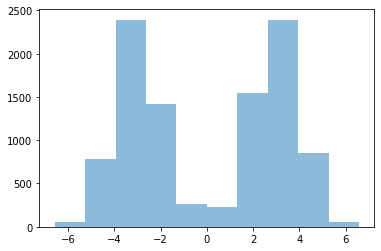

In [6]:
plt.hist(X.values.flatten(), alpha=0.5)
plt.show()

In [7]:
do_search= "bohb"# "halving"
warm = False

In [8]:
clf = EnergyModel(
    n_dim,
    batch_size=5000,
    num_layers=3,
    num_units=12,
    weight_decay=3e-3,
    max_iter=1000,
    num_mc_steps=100,
    replay_prob=1,
    sampler="langevin",
    lr=0.01,
#     sampler_lr=1e-2,
    prior_scale=10,
    adversary_weight=0.0,
    num_sample_mc_steps=1000,
    sampler_beta_min=0.02,
    sampler_beta_target=10,
    max_replay=1
)
max_resources = 1000
if do_search == "halving":
    distributions = dict(
        lr=expon(1e-2),
        sampler_lr=expon(1e-1),
        sampler=["mala", "langevin", "tempered mala", "tempered langevin"],
        weight_decay=expon(1e-3),
    #     max_iter=poisson(30),
        replay_prob=beta(a=9, b=1),
        adversary_weight=beta(a=1, b=1),
        num_units=poisson(32),
        num_layers=poisson(3),
        max_replay=poisson(10),
    )
    clf_cv = HalvingRandomSearchCV(
        clf, 
        distributions, 
        random_state=0, 
        n_jobs=5, 
        resource="max_iter", 
        max_resources=max_resources
    )
    search = clf_cv.fit(X.values)
    clf = clf_cv.best_estimator_
elif do_search == "bohb":
    distributions = CS.ConfigurationSpace(seed=42)
    distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("lr", 1e-4, 3e-1, log=True, default_value=6e-3))
    distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("sampler_lr", 1e-4, 3e-1, log=True, default_value=1e-3))
    distributions.add_hyperparameter(CSH.CategoricalHyperparameter("sampler", choices=["mala", "langevin", "tempered mala", "tempered langevin"]))
    distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("weight_decay", 1e-4, 3e-1, log=True, default_value=5e-2))
    distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("prior_scale", 1e-1, 10, log=True, default_value=1.12))
    distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("sampler_beta_target", 1, 1e2, default_value=1, log=True))
    distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("sampler_beta_min", 1e-3, 1-1e-2, default_value=.1, log=True))
#     distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("replay_prob", 0, 1, default_value=0.75))
#     distributions.add_hyperparameter(CSH.UniformFloatHyperparameter("adversary_weight", 0, .1, default_value=0.05))
    distributions.add_hyperparameter(CSH.UniformIntegerHyperparameter("num_units", 4, 32, default_value=16))
    distributions.add_hyperparameter(CSH.UniformIntegerHyperparameter("num_layers", 2, 4, default_value=3))
#     distributions.add_hyperparameter(CSH.UniformIntegerHyperparameter("max_replay", 2, 20, default_value=10))

    clf_cv = HpBandSterSearchCV(
        clf, 
        distributions, 
        random_state=0, 
        n_jobs=6,
        resource_name='max_iter', # can be either 'n_samples' or a string corresponding to an estimator attribute, eg. 'n_estimators' for an ensemble
        resource_type=int, # if specified, the resource value will be cast to that type before being passed to the estimator, otherwise it will be derived automatically
        min_budget=100,
        max_budget=max_resources,
        refit=True,
        optimizer="bohb",
    )
    search = clf_cv.fit(X, y=None)
    clf = clf_cv.best_estimator_
else:
    clf.fit(X.values)

/Users/dlibland/miniconda3/envs/langevin_energy_model/lib/python3.7/site-packages/ipykernel_launcher.py:46: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/Users/dlibland/miniconda3/envs/langevin_energy_model/lib/python3.7/site-packages/ipykernel_launcher.py:47: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/Users/dlibland/miniconda3/envs/lang

{'num_inputs': 1, 'batch_size': 5000, 'num_layers': 3, 'num_units': 32, 'weight_decay': 0.19924621034349901, 'max_iter': 111, 'num_mc_steps': 100, 'replay_prob': 1, 'sampler': 'mala', 'lr': 0.014131983987352879, 'prior_scale': 0.85807606199213, 'adversary_weight': 0.0, 'num_sample_mc_steps': 1000, 'sampler_beta_min': 0.06606671918341969, 'sampler_beta_target': 2.1930485556643684, 'max_replay': 1, 'warm_start': True, 'n_jobs': 1, 'sampler_lr': 0.0001683419201821694}
{'num_inputs': 1, 'batch_size': 5000, 'num_layers': 4, 'num_units': 25, 'weight_decay': 0.001446589487367412, 'max_iter': 111, 'num_mc_steps': 100, 'replay_prob': 1, 'sampler': 'tempered mala', 'lr': 0.0020059560245279666, 'prior_scale': 1.5751320499779735, 'adversary_weight': 0.0, 'num_sample_mc_steps': 1000, 'sampler_beta_min': 0.021654705678073562, 'sampler_beta_target': 1.5847101210439087, 'max_replay': 1, 'warm_start': True, 'n_jobs': 1, 'sampler_lr': 0.003952429057290443}
{'num_inputs': 1, 'batch_size': 5000, 'num_laye

on epoch 1, batch 0, data erf: -0.888211190700531, objective: -6833.9873046875
model energy: 4.593367099761963 +- 1.215531826019287
data energy: 3.226569652557373
training time: 1.386s, metrics time: 0.000s
on epoch 1, batch 0, data erf: -0.5047770142555237, objective: -1345.1162109375
model energy: 3.3507678508758545 +- 0.5578330755233765
data energy: 3.08174467086792
training time: 1.334s, metrics time: 0.000s
on epoch 1, batch 0, data erf: -0.5265482068061829, objective: -2978.15234375
model energy: 4.136066913604736 +- 1.1750305891036987
data energy: 3.540436267852783
training time: 1.399s, metrics time: 0.000s
on epoch 2, batch 1, data erf: -0.6935544610023499, objective: -14396.15234375
model energy: 5.216701507568359 +- 1.8265784978866577
data energy: 3.895785093307495
training time: 0.498s, metrics time: 0.000s
on epoch 2
avg_energy_grad: 0.0022975170286372304
energy_grad_to_noise: 0.0017038843019422018
avg_sample_distance: 0.10902154073119164
energy_coef: 0.33073782957367154
a

on epoch 5, batch 1, data erf: -0.6541523337364197, objective: -15309.7958984375
model energy: 5.674558639526367 +- 1.9806228876113892
data energy: 4.354332447052002
training time: 0.470s, metrics time: 0.000s
on epoch 5
avg_energy_grad: 0.0026257981080561876
energy_grad_to_noise: 0.0019473440765051708
avg_sample_distance: 0.10823331028223038
energy_coef: 0.33444210983061445
adversary_cost: 1.0
energy_diff: -10747.03271484375
data_erf: -0.6569537222385406
on epoch 5, batch 1, data erf: -0.6957932114601135, objective: -18508.2734375
model energy: 6.369813442230225 +- 2.6467041969299316
data energy: 4.446930885314941
training time: 0.481s, metrics time: 0.000s
on epoch 5
avg_energy_grad: 0.0039805612759664655
energy_grad_to_noise: 0.0029520633738507104
avg_sample_distance: 0.11058593913912773
energy_coef: 0.32568738329743757
adversary_cost: 1.0
energy_diff: -13807.3974609375
data_erf: -0.694349080324173
on epoch 3, batch 0, data erf: -0.5489442348480225, objective: -2158.64453125
model e

on epoch 9, batch 0, data erf: -0.6803080439567566, objective: -12327.740234375
model energy: 7.665108680725098 +- 3.504012107849121
data energy: 5.199560642242432
training time: 0.710s, metrics time: 0.000s
on epoch 9, batch 0, data erf: -0.6431006789207458, objective: -9186.619140625
model energy: 6.6914381980896 +- 2.8203601837158203
data energy: 4.854114532470703
training time: 0.846s, metrics time: 0.000s
on epoch 4, batch 1, data erf: -0.48428139090538025, objective: -8914.5419921875
model energy: 3.8493359088897705 +- 0.8818504810333252
data energy: 3.4440457820892334
training time: 1.239s, metrics time: 0.000s
on epoch 4
avg_energy_grad: 0.0008040123182581737
energy_grad_to_noise: 0.0005962715185884131
avg_sample_distance: 0.10767471693456172
energy_coef: 0.2925359310060195
adversary_cost: 1.0
energy_diff: -5523.97021484375
data_erf: -0.4993773549795151
on epoch 4, batch 1, data erf: -0.2776685655117035, objective: -9682.724609375
model energy: 4.3772969245910645 +- 1.231270670

on epoch 12, batch 0, data erf: -0.677722692489624, objective: -14216.025390625
model energy: 8.738697052001953 +- 4.062381267547607
data energy: 5.895491600036621
training time: 0.810s, metrics time: 0.000s
on epoch 12, batch 1, data erf: -0.6727331876754761, objective: -26490.888671875
model energy: 8.923891067504883 +- 4.159102916717529
data energy: 6.042856216430664
training time: 0.528s, metrics time: 0.000s
on epoch 12
avg_energy_grad: 0.0071623073890805244
energy_grad_to_noise: 0.00531170954287881
avg_sample_distance: 0.11423487216234207
energy_coef: 0.3072573217406983
adversary_cost: 1.0
energy_diff: -20353.45703125
data_erf: -0.67522794008255
on epoch 12, batch 0, data erf: -0.6331995129585266, objective: -11690.107421875
model energy: 7.652378082275391 +- 3.6637394428253174
data energy: 5.314356803894043
training time: 0.831s, metrics time: 0.000s
on epoch 6, batch 0, data erf: 0.28806769847869873, objective: 631.30078125
model energy: 3.9889843463897705 +- 0.4835552275180816

on epoch 15, batch 0, data erf: -0.6199952363967896, objective: -13533.361328125
model energy: 8.596965789794922 +- 4.360254764556885
data energy: 5.890293121337891
training time: 0.731s, metrics time: 0.000s
on epoch 7, batch 0, data erf: -0.23199351131916046, objective: -890.9296875
model energy: 3.835249662399292 +- 0.8542612791061401
data energy: 3.6570637226104736
training time: 1.450s, metrics time: 0.000s
on epoch 7, batch 0, data erf: -0.8773820996284485, objective: -6927.966796875
model energy: 4.718235492706299 +- 1.2692228555679321
data energy: 3.332642078399658
training time: 1.607s, metrics time: 0.000s
on epoch 15, batch 1, data erf: -0.6210383176803589, objective: -25562.5
model energy: 8.675691604614258 +- 4.399532794952393
data energy: 5.938652515411377
training time: 0.406s, metrics time: 0.000s
on epoch 15
avg_energy_grad: 0.007504347246140242
energy_grad_to_noise: 0.005565373100457876
avg_sample_distance: 0.11556922644376755
energy_coef: 0.313228900553793
adversary_

on epoch 18, batch 1, data erf: -0.5841787457466125, objective: -25407.890625
model energy: 8.850899696350098 +- 4.464446067810059
data energy: 6.282203197479248
training time: 0.422s, metrics time: 0.000s
on epoch 18
avg_energy_grad: 0.007567069726064801
energy_grad_to_noise: 0.00561188933846188
avg_sample_distance: 0.11581981182098389
energy_coef: 0.30373938629190433
adversary_cost: 1.0
energy_diff: -19229.71875
data_erf: -0.5950969159603119
on epoch 9, batch 1, data erf: 0.2075537145137787, objective: -8198.8330078125
model energy: 4.205029487609863 +- 0.37840771675109863
data energy: 4.275437831878662
training time: 1.017s, metrics time: 0.000s
on epoch 9
avg_energy_grad: 0.001064630190958269
energy_grad_to_noise: 0.0007895509139375123
avg_sample_distance: 0.10778357956558465
energy_coef: 0.2933080024960524
adversary_cost: 1.0
energy_diff: -3952.63818359375
data_erf: 0.18760446459054947
on epoch 19, batch 0, data erf: -0.6341421604156494, objective: -12897.26171875
model energy: 9.

on epoch 10, batch 1, data erf: 0.10696538537740707, objective: -7231.8935546875
model energy: 3.684197187423706 +- 0.4785429835319519
data energy: 3.7296977043151855
training time: 1.015s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.0011559912684606388
energy_grad_to_noise: 0.000857306105226408
avg_sample_distance: 0.10779891658574342
energy_coef: 0.27572482575577084
adversary_cost: 1.0
energy_diff: -3561.00439453125
data_erf: 0.0753021277487278
on epoch 22, batch 1, data erf: -0.6021143794059753, objective: -32246.396484375
model energy: 11.438632011413574 +- 5.2243123054504395
data energy: 8.315587997436523
training time: 0.467s, metrics time: 0.000s
on epoch 22
avg_energy_grad: 0.009289465378969908
energy_grad_to_noise: 0.0068892521950319795
avg_sample_distance: 0.11965448036789894
energy_coef: 0.27020023045910896
adversary_cost: 1.0
energy_diff: -23710.3818359375
data_erf: -0.6058180928230286
on epoch 22, batch 0, data erf: -0.5232148170471191, objective: -14386.76953125
m

on epoch 25, batch 0, data erf: -0.5522641539573669, objective: -16072.34765625
model energy: 12.760659217834473 +- 5.98784875869751
data energy: 9.54619026184082
training time: 0.716s, metrics time: 0.000s
on epoch 25, batch 1, data erf: -0.5493968725204468, objective: -34253.1953125
model energy: 12.523968696594238 +- 5.75204610824585
data energy: 9.455549240112305
training time: 0.466s, metrics time: 0.000s
on epoch 25
avg_energy_grad: 0.011499740183353424
energy_grad_to_noise: 0.008461067832472403
avg_sample_distance: 0.1264631301164627
energy_coef: 0.2557308062785444
adversary_cost: 1.0
energy_diff: -25162.771484375
data_erf: -0.5508305132389069
on epoch 25, batch 0, data erf: -0.46212238073349, objective: -13652.71875
model energy: 10.399330139160156 +- 6.26852560043335
data energy: 7.66878604888916
training time: 0.711s, metrics time: 0.000s
on epoch 13, batch 0, data erf: 0.9740408062934875, objective: 1178.80859375
model energy: 4.265617370605469 +- 0.1497281938791275
data ene

on epoch 28, batch 0, data erf: -0.4387073814868927, objective: -13369.22265625
model energy: 11.05780029296875 +- 6.509280681610107
data energy: 8.383955001831055
training time: 0.697s, metrics time: 0.000s
on epoch 13, batch 1, data erf: 0.627418577671051, objective: -7089.9072265625
model energy: 3.693312168121338 +- 0.1568707972764969
data energy: 3.79221773147583
training time: 1.118s, metrics time: 0.000s
on epoch 13
avg_energy_grad: 0.0007891415699850768
energy_grad_to_noise: 0.0005852430760459464
avg_sample_distance: 0.10774227686226368
energy_coef: 0.33844541900339864
adversary_cost: 1.0
energy_diff: -3270.51611328125
data_erf: 0.6181398630142212
on epoch 28, batch 1, data erf: -0.44055911898612976, objective: -30508.17578125
model energy: 11.199014663696289 +- 6.5501813888549805
data energy: 8.495633125305176
training time: 0.489s, metrics time: 0.000s
on epoch 28
avg_energy_grad: 0.011617234442383051
energy_grad_to_noise: 0.007821925438269355
avg_sample_distance: 0.112741217

on epoch 16, batch 1, data erf: 0.6989472508430481, objective: -9293.603515625
model energy: 4.747134208679199 +- 0.0914674922823906
data energy: 4.814022064208984
training time: 0.907s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.0009817804631893523
energy_grad_to_noise: 0.0007281079088123771
avg_sample_distance: 0.10772232297807932
energy_coef: 0.4046170185498005
adversary_cost: 1.0
energy_diff: -4441.1650390625
data_erf: 0.7447089850902557
on epoch 31, batch 1, data erf: -0.4313748776912689, objective: -29919.390625
model energy: 11.377202987670898 +- 5.9248175621032715
data energy: 8.988875389099121
training time: 0.477s, metrics time: 0.000s
on epoch 31
avg_energy_grad: 0.011657523922622204
energy_grad_to_noise: 0.007827310855553696
avg_sample_distance: 0.11239833384752274
energy_coef: 0.2712409917738447
adversary_cost: 1.0
energy_diff: -21271.359375
data_erf: -0.4304213523864746
on epoch 16, batch 1, data erf: 0.7579905986785889, objective: -9961.3671875
model energy: 5.1

on epoch 18, batch 0, data erf: 0.7740548849105835, objective: 611.298828125
model energy: 4.864986896514893 +- 0.14279142022132874
data energy: 4.987246990203857
training time: 1.288s, metrics time: 0.000s
on epoch 34, batch 1, data erf: -0.43666648864746094, objective: -30599.107421875
model energy: 11.765789985656738 +- 5.765150547027588
data energy: 9.409947395324707
training time: 0.444s, metrics time: 0.000s
on epoch 34
avg_energy_grad: 0.010718243196606636
energy_grad_to_noise: 0.007558390050758939
avg_sample_distance: 0.1175272949039936
energy_coef: 0.2676399411379471
adversary_cost: 1.0
energy_diff: -21234.9580078125
data_erf: -0.4412050098180771
on epoch 18, batch 0, data erf: 0.9209223389625549, objective: 1246.935546875
model energy: 5.2557291984558105 +- 0.20083950459957123
data energy: 5.5051164627075195
training time: 1.247s, metrics time: 0.000s
on epoch 16, batch 1, data erf: -0.7082567811012268, objective: -12074.00390625
model energy: 4.378032684326172 +- 1.483527541

on epoch 38, batch 0, data erf: -0.43286725878715515, objective: -11961.578125
model energy: 15.656001091003418 +- 5.911875247955322
data energy: 13.263686180114746
training time: 0.699s, metrics time: 0.000s
on epoch 18, batch 0, data erf: -0.618139386177063, objective: -4658.478515625
model energy: 4.23789644241333 +- 1.5067548751831055
data energy: 3.3062007427215576
training time: 1.420s, metrics time: 0.000s
on epoch 38, batch 1, data erf: -0.4354361593723297, objective: -38798.0078125
model energy: 15.802884101867676 +- 5.885426998138428
data energy: 13.405471801757812
training time: 0.415s, metrics time: 0.000s
on epoch 38
avg_energy_grad: 0.01122018089517951
energy_grad_to_noise: 0.00743929641951905
avg_sample_distance: 0.10600341111421585
energy_coef: 0.21239883264302029
adversary_cost: 1.0
energy_diff: -25379.79296875
data_erf: -0.43415170907974243
on epoch 38, batch 0, data erf: -0.3988572061061859, objective: -11636.05078125
model energy: 12.942765235900879 +- 6.29578828811

on epoch 21, batch 1, data erf: 0.9997962713241577, objective: -9243.0
model energy: 5.012807369232178 +- 0.09932564198970795
data energy: 5.273679256439209
training time: 1.466s, metrics time: 0.000s
on epoch 21
avg_energy_grad: 0.0009789689656463452
energy_grad_to_noise: 0.0007260228463432995
avg_sample_distance: 0.10770780634135008
energy_coef: 0.5061480047757723
adversary_cost: 1.0
energy_diff: -3914.40625
data_erf: 0.9998387396335602
on epoch 21, batch 1, data erf: -0.8840598464012146, objective: -12154.2421875
model energy: 5.868372917175293 +- 0.12519337236881256
data energy: 5.729207515716553
training time: 1.417s, metrics time: 0.000s
on epoch 21
avg_energy_grad: 0.0009417277944157831
energy_grad_to_noise: 0.0006984040534226072
avg_sample_distance: 0.1078350643068552
energy_coef: 0.5123937162251907
adversary_cost: 1.0
energy_diff: -6196.6552734375
data_erf: -0.7266698777675629
on epoch 41, batch 0, data erf: -0.41030368208885193, objective: -11755.14453125
model energy: 13.793

on epoch 21, batch 0, data erf: -0.3780677020549774, objective: -2183.236328125
model energy: 3.8347585201263428 +- 1.2522720098495483
data energy: 3.398111343383789
training time: 2.042s, metrics time: 0.000s
on epoch 44, batch 0, data erf: -0.4362439215183258, objective: -11572.39453125
model energy: 14.248412132263184 +- 5.670065879821777
data energy: 11.93393325805664
training time: 1.038s, metrics time: 0.000s
on epoch 45, batch 0, data erf: -0.400378942489624, objective: -11476.078125
model energy: 19.434886932373047 +- 6.183355808258057
data energy: 17.139671325683594
training time: 0.993s, metrics time: 0.000s
on epoch 44, batch 1, data erf: -0.45045381784439087, objective: -35398.03125
model energy: 14.190279960632324 +- 5.527815818786621
data energy: 11.851122856140137
training time: 0.867s, metrics time: 0.000s
on epoch 44
avg_energy_grad: 0.01080770418047905
energy_grad_to_noise: 0.007275668664017075
avg_sample_distance: 0.11084466427564621
energy_coef: 0.2579197636230972
a

on epoch 47, batch 0, data erf: -0.4696628451347351, objective: -12108.8125
model energy: 14.897218704223633 +- 5.458065509796143
data energy: 12.475456237792969
training time: 0.805s, metrics time: 0.000s
on epoch 48, batch 0, data erf: -0.3958091139793396, objective: -11160.5625
model energy: 20.709917068481445 +- 6.089479446411133
data energy: 18.47780418395996
training time: 0.871s, metrics time: 0.000s
on epoch 25, batch 0, data erf: 0.3209660053253174, objective: 153.724609375
model energy: 5.458777904510498 +- 0.10507802665233612
data energy: 5.489522457122803
training time: 1.761s, metrics time: 0.000s
on epoch 47, batch 1, data erf: -0.4749307930469513, objective: -37575.3359375
model energy: 15.087409019470215 +- 5.48915433883667
data energy: 12.620570182800293
training time: 0.901s, metrics time: 0.000s
on epoch 47
avg_energy_grad: 0.010618855711072683
energy_grad_to_noise: 0.00686999226108685
avg_sample_distance: 0.10518157854676247
energy_coef: 0.25112690594378856
adversar

on epoch 24, batch 1, data erf: -0.20245341956615448, objective: -7813.3623046875
model energy: 3.6685593128204346 +- 0.8751753568649292
data energy: 3.5098116397857666
training time: 2.148s, metrics time: 0.000s
on epoch 24
avg_energy_grad: 0.0011900812789099292
energy_grad_to_noise: 0.0008825879346681885
avg_sample_distance: 0.10781169939786196
energy_coef: 0.26856307480929204
adversary_cost: 1.0
energy_diff: -4319.83740234375
data_erf: -0.20259670168161392
on epoch 25, batch 0, data erf: 0.39636197686195374, objective: 242.638671875
model energy: 4.3072428703308105 +- 0.13218745589256287
data energy: 4.355770587921143
training time: 2.705s, metrics time: 0.000s
on epoch 50, batch 1, data erf: -0.4644237458705902, objective: -39502.05078125
model energy: 16.086788177490234 +- 5.576411247253418
data energy: 13.643961906433105
training time: 0.961s, metrics time: 0.000s
on epoch 50
avg_energy_grad: 0.011655006092041731
energy_grad_to_noise: 0.007370313990023354
avg_sample_distance: 0.1

on epoch 54, batch 1, data erf: -0.36233779788017273, objective: -54800.9921875
model energy: 24.185245513916016 +- 6.436437606811523
data energy: 22.041744232177734
training time: 0.472s, metrics time: 0.000s
on epoch 54
avg_energy_grad: 0.013405123259872198
energy_grad_to_noise: 0.007143377081282457
avg_sample_distance: 0.08675764501094818
energy_coef: 0.17582742894141967
adversary_cost: 1.0
energy_diff: -32776.09375
data_erf: -0.3638197183609009
on epoch 53, batch 1, data erf: -0.42162275314331055, objective: -40505.94140625
model energy: 16.83088493347168 +- 5.805372714996338
data energy: 14.549493789672852
training time: 0.499s, metrics time: 0.000s
on epoch 53
avg_energy_grad: 0.013125579338520765
energy_grad_to_noise: 0.008025325820420898
avg_sample_distance: 0.10237374901771545
energy_coef: 0.22441016689973248
adversary_cost: 1.0
energy_diff: -26143.595703125
data_erf: -0.4303475320339203
on epoch 28, batch 1, data erf: 0.8510133624076843, objective: -9756.806640625
model energ

on epoch 30, batch 0, data erf: 0.46505165100097656, objective: 729.421875
model energy: 6.34892463684082 +- 0.33250895142555237
data energy: 6.494809150695801
training time: 1.336s, metrics time: 0.000s
on epoch 56, batch 1, data erf: -0.3638570010662079, objective: -41499.99609375
model energy: 17.597858428955078 +- 6.281709671020508
data energy: 15.496431350708008
training time: 0.544s, metrics time: 0.000s
on epoch 56
avg_energy_grad: 0.015246705152094364
energy_grad_to_noise: 0.008882711694152584
avg_sample_distance: 0.10025680810213089
energy_coef: 0.2146177864785138
adversary_cost: 1.0
energy_diff: -26161.849609375
data_erf: -0.3713265061378479
on epoch 57, batch 1, data erf: -0.3500465750694275, objective: -50976.03125
model energy: 23.054035186767578 +- 5.056501865386963
data energy: 21.43138313293457
training time: 0.553s, metrics time: 0.000s
on epoch 57
avg_energy_grad: 0.010925323236733675
energy_grad_to_noise: 0.00625955154451689
avg_sample_distance: 0.09090553596615791
e

on epoch 29, batch 0, data erf: -0.0487675666809082, objective: -106.25390625
model energy: 3.78182315826416 +- 0.49139633774757385
data energy: 3.7605721950531006
training time: 2.342s, metrics time: 0.000s
on epoch 59, batch 1, data erf: -0.3010639548301697, objective: -42577.3671875
model energy: 18.56427574157715 +- 6.641364574432373
data energy: 16.748004913330078
training time: 0.704s, metrics time: 0.000s
on epoch 59
avg_energy_grad: 0.016602052375674248
energy_grad_to_noise: 0.009279150609862513
avg_sample_distance: 0.09715243056416512
energy_coef: 0.20807960039363183
adversary_cost: 1.0
energy_diff: -26042.578125
data_erf: -0.30879415571689606
on epoch 60, batch 1, data erf: -0.33795008063316345, objective: -56601.6171875
model energy: 25.833364486694336 +- 5.3223795890808105
data energy: 24.188400268554688
training time: 0.756s, metrics time: 0.000s
on epoch 60
avg_energy_grad: 0.011203555390238762
energy_grad_to_noise: 0.006084829868825173
avg_sample_distance: 0.084833554923

on epoch 30, batch 1, data erf: 0.07375414669513702, objective: -7803.015625
model energy: 3.933391809463501 +- 0.3247354328632355
data energy: 3.9546477794647217
training time: 1.202s, metrics time: 0.000s
on epoch 30
avg_energy_grad: 0.0012213905586395412
energy_grad_to_noise: 0.0009058075189287003
avg_sample_distance: 0.10779505953192711
energy_coef: 0.23714155162820233
adversary_cost: 1.0
energy_diff: -3871.2060546875
data_erf: 0.054866816848516464
on epoch 62, batch 0, data erf: -0.2485748678445816, objective: -6681.78125
model energy: 18.091829299926758 +- 5.966305732727051
data energy: 16.755474090576172
training time: 0.813s, metrics time: 0.000s
on epoch 63, batch 1, data erf: -0.30034101009368896, objective: -64620.5390625
model energy: 29.933269500732422 +- 5.809147357940674
data energy: 28.348602294921875
training time: 0.520s, metrics time: 0.000s
on epoch 63
avg_energy_grad: 0.012853907886892557
energy_grad_to_noise: 0.006268053873817004
avg_sample_distance: 0.07730190083

on epoch 35, batch 1, data erf: 0.9999982118606567, objective: -9006.578125
model energy: 5.856556415557861 +- 0.26723217964172363
data energy: 6.758734226226807
training time: 1.808s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.002190340353990905
energy_grad_to_noise: 0.00162439994940508
avg_sample_distance: 0.10827991597354412
energy_coef: 0.640552334519549
adversary_cost: 1.0
energy_diff: -2596.412109375
data_erf: 0.9977816045284271
on epoch 35, batch 1, data erf: -0.5368426442146301, objective: -13098.259765625
model energy: 6.465263366699219 +- 0.10777529329061508
data energy: 6.4093523025512695
training time: 1.902s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.0015248743497068063
energy_grad_to_noise: 0.0011308771314921988
avg_sample_distance: 0.10803528394550085
energy_coef: 0.5066426621046449
adversary_cost: 1.0
energy_diff: -6603.7197265625
data_erf: -0.36627400666475296
on epoch 33, batch 1, data erf: 0.42126375436782837, objective: -9360.3740234375
model ener

on epoch 35, batch 0, data erf: -0.43816810846328735, objective: -341.38671875
model energy: 4.938290119171143 +- 0.16644543409347534
data energy: 4.8700127601623535
training time: 1.992s, metrics time: 0.000s
on epoch 37, batch 1, data erf: 1.0, objective: -9326.916015625
model energy: 5.998872756958008 +- 0.13894297182559967
data energy: 6.889149188995361
training time: 1.312s, metrics time: 0.000s
on epoch 37
avg_energy_grad: 0.0011914414301281795
energy_grad_to_noise: 0.0008835966498507778
avg_sample_distance: 0.10769050370901823
energy_coef: 0.7698350077211786
adversary_cost: 1.0
energy_diff: -2263.2275390625
data_erf: 1.0
on epoch 37, batch 1, data erf: 0.8413662910461426, objective: -12020.34375
model energy: 6.419619083404541 +- 0.2738425135612488
data energy: 6.692584037780762
training time: 1.305s, metrics time: 0.000s
on epoch 37
avg_energy_grad: 0.0017845788487466053
energy_grad_to_noise: 0.0013234791507774051
avg_sample_distance: 0.1080564783141017
energy_coef: 0.289775523

on epoch 39, batch 0, data erf: 0.9999999403953552, objective: 2753.69921875
model energy: 6.30105447769165 +- 0.14159666001796722
data energy: 6.851794719696045
training time: 1.335s, metrics time: 0.000s
on epoch 39, batch 0, data erf: 0.9999999403953552, objective: 3229.8359375
model energy: 6.3397650718688965 +- 0.1658424437046051
data energy: 6.985732078552246
training time: 1.373s, metrics time: 0.000s
on epoch 35, batch 1, data erf: 0.7264793515205383, objective: -8806.90234375
model energy: 4.594385623931885 +- 0.1643979549407959
data energy: 4.721674919128418
training time: 1.071s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.0012215301237301901
energy_grad_to_noise: 0.000905911023174411
avg_sample_distance: 0.10788698174059391
energy_coef: 0.2658531015449136
adversary_cost: 1.0
energy_diff: -4167.6474609375
data_erf: 0.6525402069091797
on epoch 73, batch 0, data erf: -0.2749991714954376, objective: -6033.578125on epoch 72, batch 0, data erf: -0.1386435180902481, object

on epoch 75, batch 0, data erf: -0.22912245988845825, objective: -4839.546875
on epoch 76, batch 0, data erf: -0.2559625804424286, objective: -5739.265625
model energy: 23.406766891479492 +- 4.700212478637695model energy: 36.55696487426758 +- 4.971680164337158
data energy: 35.40911102294922
training time: 0.920s, metrics time: 0.000s

data energy: 22.438858032226562
training time: 0.831s, metrics time: 0.000s
on epoch 38, batch 1, data erf: 0.1308901011943817, objective: -10172.2900390625
model energy: 5.149378776550293 +- 0.3617827892303467
data energy: 5.191534996032715
training time: 1.717s, metrics time: 0.000s
on epoch 38
avg_energy_grad: 0.001221448868745938
energy_grad_to_noise: 0.0009058507628627801
avg_sample_distance: 0.107905027680099
energy_coef: 0.16067818608654375
adversary_cost: 1.0
energy_diff: -5170.21826171875
data_erf: 0.008744623512029648
on epoch 41, batch 0, data erf: 1.0, objective: 2608.525390625
on epoch 41, batch 0, data erf: 0.8469639420509338, objective: 915

on epoch 79, batch 1, data erf: -0.19383221864700317, objective: -79695.6796875
model energy: 38.56016540527344 +- 4.947691440582275
data energy: 37.701717376708984
training time: 0.531s, metrics time: 0.000s
on epoch 79
avg_energy_grad: 0.012570533901453018
energy_grad_to_noise: 0.005825821067181011
avg_sample_distance: 0.07273223996162415
energy_coef: 0.11534067934048348
adversary_cost: 1.0
energy_diff: -42246.26171875
data_erf: -0.20421244204044342
on epoch 38, batch 1, data erf: 0.9552904367446899, objective: -9331.5244140625
model energy: 4.891172885894775 +- 0.10586945712566376
data energy: 5.041447162628174
training time: 1.289s, metrics time: 0.000s
on epoch 38
avg_energy_grad: 0.0011985761934192852
energy_grad_to_noise: 0.0008888879321430359
avg_sample_distance: 0.10775375388562679
energy_coef: 0.5189832986799199
adversary_cost: 1.0
energy_diff: -4215.49072265625
data_erf: 0.9634476602077484
on epoch 40, batch 0, data erf: 0.782727062702179, objective: 1530.720703125
model ene

on epoch 44, batch 1, data erf: 0.18878768384456635, objective: -14210.060546875
model energy: 7.220457077026367 +- 0.4555979073047638
data energy: 7.297408103942871
training time: 1.367s, metrics time: 0.000s
on epoch 44
avg_energy_grad: 0.002063703674939461
energy_grad_to_noise: 0.0015304836707458393
avg_sample_distance: 0.10814802199602128
energy_coef: 0.22704847030262887
adversary_cost: 1.0
energy_diff: -7425.8896484375
data_erf: -0.10540290921926498
on epoch 44, batch 1, data erf: 0.7615653872489929, objective: -14104.919921875
model energy: 7.182939052581787 +- 0.10434811562299728
data energy: 7.269925117492676
training time: 1.444s, metrics time: 0.000s
on epoch 44
avg_energy_grad: 0.0011047794675687328
energy_grad_to_noise: 0.0008193264156196399
avg_sample_distance: 0.1076882664859295
energy_coef: 0.5705897702420423
adversary_cost: 1.0
energy_diff: -6672.2529296875
data_erf: 0.8539361357688904
on epoch 83, batch 0, data erf: -0.21033605933189392, objective: -3959.671875
model e

on epoch 86, batch 0, data erf: -0.22568689286708832, objective: -4082.96875
model energy: 44.094608306884766 +- 4.027502536773682
data energy: 43.27801513671875
training time: 0.828s, metrics time: 0.000s
on epoch 85, batch 0, data erf: -0.2755553424358368, objective: -6388.3046875
model energy: 26.93463134765625 +- 5.125551700592041
data energy: 25.656970977783203
training time: 0.867s, metrics time: 0.000s
on epoch 42, batch 0, data erf: -0.47284558415412903, objective: -345.474609375
model energy: 5.381010055541992 +- 0.15452471375465393
data energy: 5.311915397644043
training time: 1.818s, metrics time: 0.000s
on epoch 86, batch 1, data erf: -0.23031072318553925, objective: -92814.234375
model energy: 45.13597869873047 +- 4.093304634094238
data energy: 44.288551330566406
training time: 0.477s, metrics time: 0.000s
on epoch 86
avg_energy_grad: 0.01081653917208314
energy_grad_to_noise: 0.004706789410106748
avg_sample_distance: 0.0665677934885025
energy_coef: 0.10478515106439926
adve

on epoch 43, batch 1, data erf: 0.33341509103775024, objective: -10314.8818359375
model energy: 5.310611724853516 +- 0.3351840674877167
data energy: 5.412725448608398
training time: 1.208s, metrics time: 0.000s
on epoch 43
avg_energy_grad: 0.0014893099496839568
energy_grad_to_noise: 0.00110450186543253
avg_sample_distance: 0.10783150956034661
energy_coef: 0.1938936778893826
adversary_cost: 1.0
energy_diff: -5129.14306640625
data_erf: 0.1896200329065323
on epoch 48, batch 0, data erf: 1.0, objective: 4204.42578125
model energy: 6.806797027587891 +- 0.12948869168758392
data energy: 7.647682189941406
training time: 1.578s, metrics time: 0.000s
on epoch 89, batch 1, data erf: -0.08631885051727295, objective: -91182.484375
model energy: 45.1065559387207 +- 4.215690612792969
data energy: 44.78343200683594
training time: 0.558s, metrics time: 0.000s
on epoch 89
avg_energy_grad: 0.01646002847701311
energy_grad_to_noise: 0.006584218842407548
avg_sample_distance: 0.06379203498363495
energy_coef:

on epoch 92, batch 1, data erf: -0.09088920801877975, objective: -95152.40625
model energy: 47.081966400146484 +- 4.081721305847168
data energy: 46.75247573852539
training time: 0.426s, metrics time: 0.000s
on epoch 92
avg_energy_grad: 0.015284123364835978
energy_grad_to_noise: 0.006451874407483157
avg_sample_distance: 0.0673576071858406
energy_coef: 0.09450913086841514
adversary_cost: 1.0
energy_diff: -48553.7109375
data_erf: -0.09784228354692459
on epoch 91, batch 1, data erf: -0.05230329558253288, objective: -59726.625
model energy: 29.486234664916992 +- 5.419469833374023
data energy: 29.234848022460938
training time: 0.401s, metrics time: 0.000s
on epoch 91
avg_energy_grad: 0.02147237490862608
energy_grad_to_noise: 0.009629946728031316
avg_sample_distance: 0.07934202998876572
energy_coef: 0.23651411769751607
adversary_cost: 1.0
energy_diff: -30840.625
data_erf: -0.06605967320501804
on epoch 45, batch 0, data erf: 0.9087043404579163, objective: 1984.982421875
model energy: 5.1483049

on epoch 96, batch 0, data erf: -0.16331037878990173, objective: -2229.96875
model energy: 50.00525665283203 +- 3.059882879257202
data energy: 49.559261322021484
training time: 1.041s, metrics time: 0.000s
on epoch 51, batch 1, data erf: 0.8263921141624451, objective: -14474.68359375
model energy: 7.640984535217285 +- 0.27967748045921326
data energy: 7.910079479217529
training time: 1.332s, metrics time: 0.000s
on epoch 51
avg_energy_grad: 0.001602763767587021
energy_grad_to_noise: 0.0011886414721953592
avg_sample_distance: 0.10780298817902803
energy_coef: 0.6386698838856963
adversary_cost: 1.0
energy_diff: -6378.068359375
data_erf: 0.8695730268955231
on epoch 95, batch 0, data erf: -0.049630582332611084, objective: -944.109375
model energy: 31.41374397277832 +- 4.290199279785156
data energy: 31.22492218017578
training time: 1.041s, metrics time: 0.000s
on epoch 51, batch 1, data erf: 1.0, objective: -12622.330078125
model energy: 7.272412300109863 +- 0.15603530406951904
data energy: 7

on epoch 53, batch 0, data erf: 0.4290361702442169, objective: 327.421875
model energy: 7.980614185333252 +- 0.1634376496076584
data energy: 8.046098709106445
training time: 1.475s, metrics time: 0.000s
on epoch 98, batch 0, data erf: -0.1783577799797058, objective: -2618.296875
model energy: 33.172607421875 +- 3.2850751876831055
data energy: 32.648948669433594
training time: 0.865s, metrics time: 0.000s
on epoch 53, batch 0, data erf: 0.9998477101325989, objective: 2253.89453125
model energy: 7.650566577911377 +- 0.16832348704338074
data energy: 8.10134506225586
training time: 1.461s, metrics time: 0.000s
on epoch 99, batch 1, data erf: -0.1713588386774063, objective: -105582.125
model energy: 51.84636688232422 +- 4.11497688293457
data energy: 51.21657180786133
training time: 0.529s, metrics time: 0.000s
on epoch 99
avg_energy_grad: 0.013158399611711502
energy_grad_to_noise: 0.005646078802272202
avg_sample_distance: 0.06677734479308128
energy_coef: 0.08669356486799609
adversary_cost: 

on epoch 51, batch 1, data erf: 0.9947656989097595, objective: -9912.1640625
model energy: 5.357715606689453 +- 0.13561254739761353
data energy: 5.625471591949463
training time: 1.257s, metrics time: 0.000s
on epoch 51
avg_energy_grad: 0.001116885861265473
energy_grad_to_noise: 0.000828304757854276
avg_sample_distance: 0.10767603673040867
energy_coef: 0.3813455036988198
adversary_cost: 1.0
energy_diff: -4377.1044921875
data_erf: 0.9917198121547699
on epoch 102, batch 1, data erf: -0.07357358187437057, objective: -108102.84375
model energy: 53.490638732910156 +- 5.725588798522949
data energy: 53.116783142089844
training time: 0.539s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.020862281322479248
energy_grad_to_noise: 0.008476231761522419
avg_sample_distance: 0.06928569078445435
energy_coef: 0.07849699979946753
adversary_cost: 1.0
energy_diff: -55007.515625
data_erf: -0.07609235122799873
on epoch 101, batch 0, data erf: -0.3360869586467743, objective: -4880.515625
model energy: 

on epoch 104, batch 0, data erf: -0.322529137134552, objective: -5983.84375
model energy: 36.04009246826172 +- 4.069281578063965
data energy: 34.843326568603516
training time: 1.000s, metrics time: 0.000s
on epoch 105, batch 1, data erf: -0.001380151486955583, objective: -111479.359375
model energy: 55.72935104370117 +- 5.632560729980469
data energy: 55.72246170043945
training time: 0.688s, metrics time: 0.000s
on epoch 105
avg_energy_grad: 0.021369178779423237
energy_grad_to_noise: 0.008583696298431774
avg_sample_distance: 0.06735248863697052
energy_coef: 0.09369952213332111
adversary_cost: 1.0
energy_diff: -55489.8671875
data_erf: 0.008979086589533836
on epoch 56, batch 1, data erf: -0.5629433989524841, objective: -17620.400390625
model energy: 8.688254356384277 +- 0.1479368507862091
data energy: 8.606956481933594
training time: 1.344s, metrics time: 0.000s
on epoch 56
avg_energy_grad: 0.0015047865128144623
energy_grad_to_noise: 0.0011159795923165504
avg_sample_distance: 0.1079620633

on epoch 53, batch 0, data erf: -0.19175350666046143, objective: -151.390625
model energy: 6.439589977264404 +- 0.1764393448829651
data energy: 6.409311771392822
training time: 1.989s, metrics time: 0.000s
on epoch 55, batch 0, data erf: 0.777622640132904, objective: 684.802734375
model energy: 5.731516361236572 +- 0.15873341262340546
data energy: 5.868476867675781
training time: 1.514s, metrics time: 0.000s
on epoch 107, batch 1, data erf: -0.14864933490753174, objective: -76812.6328125
model energy: 37.30319595336914 +- 5.549926280975342
data energy: 36.56778335571289
training time: 0.570s, metrics time: 0.000s
on epoch 107
avg_energy_grad: 0.02294692862778902
energy_grad_to_noise: 0.010783042414001635
avg_sample_distance: 0.0871661975979805
energy_coef: 0.20015515511536947
adversary_cost: 1.0
energy_diff: -40630.80859375
data_erf: -0.16750101745128632
on epoch 58, batch 1, data erf: 0.9957796335220337, objective: -15049.736328125
model energy: 8.359423637390137 +- 0.2749982178211212

on epoch 60, batch 0, data erf: 1.0, objective: 3470.3203125
model energy: 8.02008056640625 +- 0.15992338955402374
data energy: 8.714144706726074
training time: 1.358s, metrics time: 0.000s
on epoch 60, batch 1, data erf: 1.0, objective: -14511.4375
model energy: 8.424247741699219 +- 0.10663111507892609
data energy: 9.203267097473145
training time: 0.884s, metrics time: 0.000s
on epoch 60
avg_energy_grad: 0.0014017098455224187
energy_grad_to_noise: 0.001039535886739488
avg_sample_distance: 0.10790029395371675
energy_coef: 0.6994708652878565
adversary_cost: 1.0
energy_diff: -5283.076171875
data_erf: 1.0
on epoch 57, batch 0, data erf: -0.45972034335136414, objective: -538.0859375
model energy: 6.089784145355225 +- 0.24852338433265686
data energy: 5.9821672439575195
training time: 1.333s, metrics time: 0.000s
on epoch 55, batch 0, data erf: 0.9721595048904419, objective: 1974.08203125
model energy: 6.227565765380859 +- 0.2538521885871887
data energy: 6.622382164001465
training time: 1.33

on epoch 60, batch 0, data erf: -0.5421276688575745, objective: -880.541015625
model energy: 6.390407562255859 +- 0.33549290895462036
data energy: 6.214299201965332
training time: 1.196s, metrics time: 0.000s
on epoch 0, batch 0, data erf: -0.6301340460777283, objective: -2537.9169921875
model energy: 3.739583969116211 +- 0.8005037903785706
data energy: 3.2320005893707275
training time: 0.691s, metrics time: 0.000s
on epoch 63, batch 1, data erf: 0.8917920589447021, objective: -17062.953125
model energy: 8.806733131408691 +- 0.16156092286109924
data energy: 8.990238189697266
training time: 0.966s, metrics time: 0.000s
on epoch 63
avg_energy_grad: 0.0016284870827803389
energy_grad_to_noise: 0.0012077183941095367
avg_sample_distance: 0.10798906497657298
energy_coef: 0.6281660684716237
adversary_cost: 1.0
energy_diff: -7895.591796875
data_erf: 0.9245229661464691
on epoch 58, batch 0, data erf: 1.0, objective: 2462.384765625
model energy: 6.331290245056152 +- 0.1201862096786499
data energy

on epoch 4, batch 0, data erf: -0.7016129493713379, objective: -4731.185546875
model energy: 4.4861345291137695 +- 1.2868387699127197
data energy: 3.5398972034454346
training time: 0.802s, metrics time: 0.000s
on epoch 1, batch 0, data erf: -0.6264891028404236, objective: -3295.740234375
model energy: 4.085980415344238 +- 1.0474873781204224
data energy: 3.426832437515259
training time: 0.777s, metrics time: 0.000s
on epoch 65, batch 1, data erf: -0.7751388549804688, objective: -18868.404296875
model energy: 9.290240287780762 +- 0.11182941496372223
data energy: 9.194266319274902
training time: 1.110s, metrics time: 0.000s
on epoch 65
avg_energy_grad: 0.0014086874399799854
energy_grad_to_noise: 0.0010447106095003548
avg_sample_distance: 0.10777641639113426
energy_coef: 0.48793486289117616
adversary_cost: 1.0
energy_diff: -9543.1162109375
data_erf: -0.6167419254779816
on epoch 66, batch 0, data erf: -0.7217302322387695, objective: -321.97265625
model energy: 9.89488697052002 +- 0.08399466

on epoch 67, batch 0, data erf: 0.38557493686676025, objective: 650.58984375
model energy: 9.281939506530762 +- 0.3652782738208771
data energy: 9.412057876586914
training time: 1.450s, metrics time: 0.000s
on epoch 4, batch 0, data erf: -0.6261626482009888, objective: -5516.734375
on epoch 7, batch 0, data erf: -0.7166314721107483, objective: -7146.08984375
model energy: 4.872872829437256 +- 1.7545864582061768
data energy: 3.7695257663726807
training time: 0.800s, metrics time: 0.000s
model energy: 5.420061111450195 +- 1.8840899467468262
data energy: 3.9908430576324463
training time: 0.852s, metrics time: 0.000s
on epoch 61, batch 1, data erf: 0.5233246088027954, objective: -13628.138671875
model energy: 6.898216247558594 +- 0.11147814989089966
data energy: 6.954314231872559
training time: 1.145s, metrics time: 0.000s
on epoch 61
avg_energy_grad: 0.0011986353067914024
energy_grad_to_noise: 0.0008889317717949425
avg_sample_distance: 0.10785443257540464
energy_coef: 0.6401350509892518
ad

on epoch 7, batch 0, data erf: -0.6118779182434082, objective: -8236.23828125
model energy: 5.837194919586182 +- 2.699286937713623
data energy: 4.189947128295898
training time: 0.733s, metrics time: 0.000s
on epoch 63, batch 0, data erf: -0.8822336196899414, objective: -605.17578125
model energy: 7.1389851570129395 +- 0.10942813754081726
data energy: 7.017950057983398
training time: 1.513s, metrics time: 0.000s
on epoch 10, batch 1, data erf: -0.7113540172576904, objective: -20354.619140625
model energy: 6.9701080322265625 +- 2.8496739864349365
data energy: 4.831973075866699
training time: 0.431s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.004437742754817009
energy_grad_to_noise: 0.0032911182471084795
avg_sample_distance: 0.10950997099280357
energy_coef: 0.32845648109144804
adversary_cost: 1.0
energy_diff: -15272.15625
data_erf: -0.7137055397033691
on epoch 7, batch 1, data erf: -0.6080453395843506, objective: -17156.984375
model energy: 5.99194860458374 +- 2.848592758178711
d

on epoch 10, batch 1, data erf: -0.5994195342063904, objective: -20335.5
model energy: 6.904751777648926 +- 3.6598141193389893
data energy: 4.729419231414795
training time: 0.492s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.005468600196763873
energy_grad_to_noise: 0.0040556226189935474
avg_sample_distance: 0.11216488853096962
energy_coef: 0.3244943067311428
adversary_cost: 1.0
energy_diff: -15425.236328125
data_erf: -0.599763035774231
on epoch 71, batch 1, data erf: 1.0, objective: -17046.734375
model energy: 9.770505905151367 +- 0.14435900747776031
data energy: 10.601932525634766
training time: 0.952s, metrics time: 0.000s
on epoch 71
avg_energy_grad: 0.0019315302639734
energy_grad_to_noise: 0.0014324612416312188
avg_sample_distance: 0.10825786996632815
energy_coef: 0.6937100973915726
adversary_cost: 1.0
energy_diff: -6279.60546875
data_erf: 1.0
on epoch 14, batch 0, data erf: -0.7011613249778748, objective: -11087.689453125
model energy: 7.383843898773193 +- 3.01856803894042

on epoch 69, batch 0, data erf: 0.20497308671474457, objective: 172.921875
model energy: 6.717550754547119 +- 0.18826813995838165
data energy: 6.752135276794434
training time: 1.256s, metrics time: 0.000s
on epoch 17, batch 1, data erf: -0.681350827217102, objective: -25232.7421875
model energy: 8.594144821166992 +- 3.802696466445923
data energy: 5.912660121917725
training time: 0.490s, metrics time: 0.000s
on epoch 17
avg_energy_grad: 0.006443810416385531
energy_grad_to_noise: 0.004778857904562924
avg_sample_distance: 0.1141187734901905
energy_coef: 0.31229286382625415
adversary_cost: 1.0
energy_diff: -19184.91015625
data_erf: -0.683057963848114
on epoch 66, batch 1, data erf: 0.8121368885040283, objective: -12458.51171875
model energy: 6.839432716369629 +- 0.43683528900146484
data energy: 7.246217250823975
training time: 1.050s, metrics time: 0.000s
on epoch 66
avg_energy_grad: 0.0020058797119418157
energy_grad_to_noise: 0.0014876002702749324
avg_sample_distance: 0.10811028838157653


on epoch 68, batch 0, data erf: 0.9998456239700317, objective: 3331.49609375
model energy: 6.705415725708008 +- 0.24902571737766266
data energy: 7.371715068817139
training time: 2.289s, metrics time: 0.000s
on epoch 20, batch 1, data erf: -0.6437872648239136, objective: -27433.83984375
model energy: 9.434930801391602 +- 4.375755310058594
data energy: 6.580272197723389
training time: 0.752s, metrics time: 0.000s
on epoch 20
avg_energy_grad: 0.0074858227744698524
energy_grad_to_noise: 0.0055516349840097606
avg_sample_distance: 0.1170700266957283
energy_coef: 0.3038396859544996
adversary_cost: 1.0
energy_diff: -20835.509765625
data_erf: -0.6485190391540527
on epoch 17, batch 0, data erf: -0.5964096784591675, objective: -12785.5859375
model energy: 8.360306739807129 +- 4.329736232757568
data energy: 5.803189754486084
training time: 1.085s, metrics time: 0.000s
on epoch 75, batch 0, data erf: 0.99766606092453, objective: 827.29296875
model energy: 11.054508209228516 +- 0.07686854153871536
d

on epoch 76, batch 1, data erf: -0.6676466464996338, objective: -23515.8671875
model energy: 11.60325813293457 +- 0.15043646097183228
data energy: 11.500140190124512
training time: 1.031s, metrics time: 0.000s
on epoch 76
avg_energy_grad: 0.001550667502451688
energy_grad_to_noise: 0.0011500058463229522
avg_sample_distance: 0.10796657603234053
energy_coef: 0.44357374479382994
adversary_cost: 1.0
energy_diff: -11892.46484375
data_erf: -0.7075951099395752
on epoch 20, batch 1, data erf: -0.5855430364608765, objective: -26931.388671875
model energy: 9.255595207214355 +- 4.863912582397461
data energy: 6.448862552642822
training time: 0.523s, metrics time: 0.000s
on epoch 20
avg_energy_grad: 0.008303080219775438
energy_grad_to_noise: 0.006157729352123123
avg_sample_distance: 0.11699787527322769
energy_coef: 0.29742848807077715
adversary_cost: 1.0
energy_diff: -20336.2763671875
data_erf: -0.5880122482776642
on epoch 76, batch 0, data erf: -0.9158960580825806, objective: -572.703125
model ener

on epoch 23, batch 0, data erf: -0.5675579309463501, objective: -14971.22265625
model energy: 10.145577430725098 +- 5.394134521484375
data energy: 7.151332855224609
training time: 0.792s, metrics time: 0.000s
on epoch 23, batch 1, data erf: -0.5569846034049988, objective: -29108.49609375
model energy: 10.197704315185547 +- 5.354360103607178
data energy: 7.293341159820557
training time: 0.455s, metrics time: 0.000s
on epoch 23
avg_energy_grad: 0.009743236005306244
energy_grad_to_noise: 0.006938698494724029
avg_sample_distance: 0.1154041737318039
energy_coef: 0.2878311022821028
adversary_cost: 1.0
energy_diff: -22039.859375
data_erf: -0.5622712671756744
on epoch 74, batch 0, data erf: 0.9999874830245972, objective: 2107.546875
model energy: 6.506153106689453 +- 0.13645204901695251
data energy: 6.927662372589111
training time: 1.562s, metrics time: 0.000s
on epoch 27, batch 0, data erf: -0.5597217679023743, objective: -15582.359375
model energy: 11.414579391479492 +- 5.711056232452393
on 

on epoch 80, batch 0, data erf: 1.0, objective: 5122.02734375
model energy: 11.167500495910645 +- 0.09854721277952194
data energy: 12.191905975341797
training time: 1.760s, metrics time: 0.000s
on epoch 79, batch 1, data erf: 0.9999828338623047, objective: -18430.86328125
model energy: 10.469257354736328 +- 0.2749893367290497
data energy: 11.305140495300293
training time: 1.281s, metrics time: 0.000s
on epoch 79
avg_energy_grad: 0.0022753812454175204
energy_grad_to_noise: 0.001687467965058017
avg_sample_distance: 0.10830419827252627
energy_coef: 0.6016477422836999
adversary_cost: 1.0
energy_diff: -7471.81640625
data_erf: 0.9939772188663483
on epoch 30, batch 0, data erf: -0.5125778913497925, objective: -12391.5234375
model energy: 10.664664268493652 +- 5.0472025871276855
data energy: 8.186359405517578
training time: 0.895s, metrics time: 0.000s
on epoch 75, batch 1, data erf: 0.9998132586479187, objective: -12355.001953125
model energy: 6.7219085693359375 +- 0.13737426698207855
data en

on epoch 74, batch 1, data erf: 0.7840144038200378, objective: -15781.529296875
model energy: 7.991612434387207 +- 0.07684686779975891
data energy: 8.058844566345215
training time: 1.463s, metrics time: 0.000s
on epoch 74
avg_energy_grad: 0.0014777801831951365
energy_grad_to_noise: 0.0010959511613983525
avg_sample_distance: 0.10799484562128782
energy_coef: 0.5792361602256207
adversary_cost: 1.0
energy_diff: -7570.6923828125
data_erf: 0.8778600990772247
on epoch 33, batch 0, data erf: -0.4858255386352539, objective: -12966.33984375
model energy: 11.96456527709961 +- 5.621870040893555
data energy: 9.371296882629395
training time: 1.054s, metrics time: 0.000s
on epoch 81, batch 0, data erf: 1.0, objective: 4492.7578125
model energy: 10.662374496459961 +- 0.13031864166259766
data energy: 11.560925483703613
training time: 1.828s, metrics time: 0.000s
on epoch 77, batch 0, data erf: 0.8927636742591858, objective: 1063.2421875
model energy: 7.094509601593018 +- 0.1867031306028366
data energy:

on epoch 33, batch 0, data erf: -0.48700857162475586, objective: -12145.0859375
model energy: 11.572304725646973 +- 5.251020908355713
data energy: 9.143287658691406
training time: 0.737s, metrics time: 0.000s
on epoch 76, batch 0, data erf: -0.2982023358345032, objective: -155.53125
model energy: 8.28608512878418 +- 0.11488927900791168
data energy: 8.254979133605957
training time: 1.768s, metrics time: 0.000s
on epoch 36, batch 1, data erf: -0.45711690187454224, objective: -37433.26953125
model energy: 14.481690406799316 +- 6.5620574951171875
data energy: 11.658394813537598
training time: 0.623s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.012054152321070433
energy_grad_to_noise: 0.008270230980862887
avg_sample_distance: 0.11462455987930298
energy_coef: 0.25506468269002025
adversary_cost: 1.0
energy_diff: -25984.900390625
data_erf: -0.46384555101394653
on epoch 83, batch 1, data erf: 1.0, objective: -23029.234375
model energy: 12.236917495727539 +- 0.09953244775533676
data ener

on epoch 77, batch 1, data erf: 0.7931457757949829, objective: -15873.982421875
model energy: 8.252413749694824 +- 0.23559603095054626
data energy: 8.462696075439453
training time: 1.037s, metrics time: 0.000s
on epoch 77
avg_energy_grad: 0.0016304005263373257
energy_grad_to_noise: 0.0012091374418897111
avg_sample_distance: 0.10807622328400612
energy_coef: 0.2746578023285039
adversary_cost: 1.0
energy_diff: -7731.8623046875
data_erf: 0.598567470908165
on epoch 80, batch 0, data erf: -0.5789174437522888, objective: -593.12109375
model energy: 7.697495460510254 +- 0.2085154503583908
data energy: 7.578871250152588
training time: 1.707s, metrics time: 0.000s
on epoch 36, batch 1, data erf: -0.5160832405090332, objective: -31634.05078125
model energy: 12.025535583496094 +- 5.106522083282471
data energy: 9.497875213623047
training time: 0.415s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.009149305522441864
energy_grad_to_noise: 0.006785306859121996
avg_sample_distance: 0.119564477354

on epoch 79, batch 0, data erf: 0.9999646544456482, objective: 2434.7421875
model energy: 8.139589309692383 +- 0.1664995551109314
data energy: 8.626537322998047
training time: 1.812s, metrics time: 0.000s
on epoch 39, batch 1, data erf: -0.49121248722076416, objective: -35197.09375
model energy: 13.510696411132812 +- 5.83306360244751
data energy: 10.785463333129883
training time: 0.542s, metrics time: 0.000s
on epoch 39
avg_energy_grad: 0.010508313775062561
energy_grad_to_noise: 0.007413568572674373
avg_sample_distance: 0.11536435037851334
energy_coef: 0.23597798080552945
adversary_cost: 1.0
energy_diff: -24334.904296875
data_erf: -0.4937058985233307
on epoch 43, batch 0, data erf: -0.46945348381996155, objective: -12728.2265625
model energy: 15.59504222869873 +- 5.7401909828186035
data energy: 13.049396514892578
training time: 0.876s, metrics time: 0.000s
on epoch 87, batch 0, data erf: 0.2591076195240021, objective: 444.40625
model energy: 13.102737426757812 +- 0.38012734055519104
da

on epoch 46, batch 0, data erf: -0.4485877752304077, objective: -12388.4453125
model energy: 16.78638458251953 +- 5.88266658782959
data energy: 14.308694839477539
training time: 0.995s, metrics time: 0.000s
on epoch 88, batch 0, data erf: -0.38607320189476013, objective: -334.90234375
model energy: 12.721882820129395 +- 0.1877681016921997
data energy: 12.654902458190918
training time: 1.670s, metrics time: 0.000s
on epoch 83, batch 1, data erf: 0.9052873253822327, objective: -13596.716796875
model energy: 7.534396171569824 +- 0.41527503728866577
data energy: 8.0250883102417
training time: 1.444s, metrics time: 0.000s
on epoch 83
avg_energy_grad: 0.0019764158863108607
energy_grad_to_noise: 0.0014657493114607018
avg_sample_distance: 0.10810664184391498
energy_coef: 0.42721274170808987
adversary_cost: 1.0
energy_diff: -6044.0224609375
data_erf: 0.7874420285224915
on epoch 46, batch 1, data erf: -0.4401438236236572, objective: -41285.3515625
model energy: 16.982498168945312 +- 5.9185614585

on epoch 82, batch 1, data erf: 1.0, objective: -15787.37890625
model energy: 8.504768371582031 +- 0.09760540723800659
data energy: 8.912153244018555
training time: 1.495s, metrics time: 0.000s
on epoch 82
avg_energy_grad: 0.001805650588357821
energy_grad_to_noise: 0.0013391063717688684
avg_sample_distance: 0.10819335464388131
energy_coef: 0.676656553742286
adversary_cost: 1.0
energy_diff: -6761.62109375
data_erf: 1.0
on epoch 49, batch 1, data erf: -0.4221128523349762, objective: -43773.453125
model energy: 18.29753303527832 +- 6.081017017364502
data energy: 15.904736518859863
training time: 0.569s, metrics time: 0.000s
on epoch 49
avg_energy_grad: 0.012627486139535904
energy_grad_to_noise: 0.007325752228250099
avg_sample_distance: 0.0944986492395401
energy_coef: 0.22119878887553618
adversary_cost: 1.0
energy_diff: -27859.86328125
data_erf: -0.4225596934556961
on epoch 46, batch 1, data erf: -0.4301270842552185, objective: -39290.0390625
model energy: 15.876004219055176 +- 6.253465175

on epoch 52, batch 1, data erf: -0.39457792043685913, objective: -45949.1640625
model energy: 19.567068099975586 +- 6.218573570251465
data energy: 17.295392990112305
training time: 0.629s, metrics time: 0.000s
on epoch 52
avg_energy_grad: 0.01306807529181242
energy_grad_to_noise: 0.007345266689002573
avg_sample_distance: 0.09293847158551216
energy_coef: 0.21584168831223682
adversary_cost: 1.0
energy_diff: -28631.59375
data_erf: -0.3944846838712692
on epoch 49, batch 1, data erf: -0.3981460928916931, objective: -41057.77734375
model energy: 16.812480926513672 +- 6.7157721519470215
data energy: 14.33487606048584
training time: 0.746s, metrics time: 0.000s
on epoch 49
avg_energy_grad: 0.013002258259803057
energy_grad_to_noise: 0.007797084154509181
avg_sample_distance: 0.09925547614693642
energy_coef: 0.20439358655770448
adversary_cost: 1.0
energy_diff: -26845.197265625
data_erf: -0.4029010683298111
on epoch 92, batch 1, data erf: 1.0, objective: -25289.47265625
model energy: 13.4697246551

on epoch 52, batch 1, data erf: -0.3832598626613617, objective: -40796.87890625
model energy: 17.14745330810547 +- 6.124290943145752
data energy: 14.98012924194336
training time: 0.644s, metrics time: 0.000s
on epoch 52
avg_energy_grad: 0.01211316604167223
energy_grad_to_noise: 0.007360721683085311
avg_sample_distance: 0.10024847090244293
energy_coef: 0.19567336216427902
adversary_cost: 1.0
energy_diff: -25866.294921875
data_erf: -0.3825983554124832
on epoch 56, batch 0, data erf: -0.3481757342815399, objective: -8989.5703125
model energy: 19.536548614501953 +- 5.63490629196167
data energy: 17.73863410949707
training time: 1.152s, metrics time: 0.000s
on epoch 53, batch 0, data erf: -0.3829557001590729, objective: -10747.921875
model energy: 17.346702575683594 +- 6.079410076141357
data energy: 15.197118759155273
training time: 1.182s, metrics time: 0.000s
on epoch 93, batch 1, data erf: 1.0, objective: -24240.01953125
model energy: 13.1262845993042 +- 0.16791775822639465
data energy: 1

on epoch 59, batch 0, data erf: -0.3514039218425751, objective: -9404.6796875
model energy: 22.197050094604492 +- 5.837100028991699
data energy: 20.31611442565918
training time: 0.761s, metrics time: 0.000s
on epoch 95, batch 1, data erf: -0.6684375405311584, objective: -29782.234375
model energy: 14.703906059265137 +- 0.1817810833454132
data energy: 14.57909870147705
training time: 1.039s, metrics time: 0.000s
on epoch 95
avg_energy_grad: 0.0014854319771984593
energy_grad_to_noise: 0.0011016258839451057
avg_sample_distance: 0.10802496917545795
energy_coef: 0.4344359936877225
adversary_cost: 1.0
energy_diff: -15124.30859375
data_erf: -0.7626340985298157
on epoch 59, batch 1, data erf: -0.3629496991634369, objective: -51288.0546875
model energy: 22.713708877563477 +- 5.855386257171631
data energy: 20.760164260864258
training time: 0.437s, metrics time: 0.000s
on epoch 59
avg_energy_grad: 0.012232007458806038
energy_grad_to_noise: 0.00673662530739222
avg_sample_distance: 0.08809264004230

on epoch 97, batch 0, data erf: 0.9721709489822388, objective: 3370.8203125
model energy: 14.19814682006836 +- 0.4334304928779602
data energy: 14.872310638427734
training time: 1.525s, metrics time: 0.000s
on epoch 91, batch 1, data erf: 0.8989813923835754, objective: -16401.986328125
model energy: 8.342801094055176 +- 0.08152715116739273
data energy: 8.43734073638916
training time: 1.189s, metrics time: 0.000s
on epoch 91
avg_energy_grad: 0.001888631300535053
energy_grad_to_noise: 0.0014006465175351154
avg_sample_distance: 0.10813979100435972
energy_coef: 0.5372095063514883
adversary_cost: 1.0
energy_diff: -7873.2783203125
data_erf: 0.9028713703155518
on epoch 59, batch 0, data erf: -0.32767316699028015, objective: -8652.2734375
model energy: 20.199291229248047 +- 5.786014080047607
data energy: 18.468835830688477
training time: 0.754s, metrics time: 0.000s
on epoch 62, batch 1, data erf: -0.36497363448143005, objective: -54222.4140625
model energy: 24.29042625427246 +- 5.6028175354003

on epoch 90, batch 1, data erf: 0.9994294047355652, objective: -16471.107421875
model energy: 9.038407325744629 +- 0.21970687806606293
data energy: 9.57364273071289
training time: 1.659s, metrics time: 0.000s
on epoch 90
avg_energy_grad: 0.0019395516702206805
energy_grad_to_noise: 0.001438410075965799
avg_sample_distance: 0.10822231382131577
energy_coef: 0.5940048335029975
adversary_cost: 1.0
energy_diff: -6983.9990234375
data_erf: 0.9945332407951355
on epoch 62, batch 0, data erf: -0.32746338844299316, objective: -8466.8671875
model energy: 21.62140655517578 +- 5.6658806800842285
data energy: 19.92803192138672
training time: 1.045s, metrics time: 0.000s
on epoch 65, batch 1, data erf: -0.32586419582366943, objective: -57468.25
model energy: 25.995758056640625 +- 6.140045642852783
data energy: 24.17017936706543
training time: 0.751s, metrics time: 0.000s
on epoch 65
avg_energy_grad: 0.01291539566591382
energy_grad_to_noise: 0.007107889698214348
avg_sample_distance: 0.0891655758023262
e

on epoch 68, batch 1, data erf: -0.26979920268058777, objective: -60136.1328125
model energy: 27.611928939819336 +- 6.714844226837158
data energy: 25.974502563476562
training time: 0.597s, metrics time: 0.000s
on epoch 68
avg_energy_grad: 0.015566157642751932
energy_grad_to_noise: 0.008013410953010246
avg_sample_distance: 0.0860472284257412
energy_coef: 0.1918971562559752
adversary_cost: 1.0
energy_diff: -34314.15234375
data_erf: -0.2761300653219223
on epoch 65, batch 0, data erf: -0.3253169059753418, objective: -8418.921875
model energy: 23.4277400970459 +- 5.673251628875732
data energy: 21.743955612182617
training time: 0.852s, metrics time: 0.000s
on epoch 100, batch 0, data erf: 0.6971439719200134, objective: 2216.46875
model energy: 14.567103385925293 +- 0.608458399772644
data energy: 15.010396957397461
training time: 1.544s, metrics time: 0.000s
on epoch 92, batch 0, data erf: 1.0, objective: 2781.69921875
model energy: 9.216155052185059 +- 0.11716452240943909
data energy: 9.7724

on epoch 68, batch 1, data erf: -0.3014192283153534, objective: -53368.8671875
model energy: 24.52225685119629 +- 5.264272689819336
data energy: 23.0808048248291
training time: 0.419s, metrics time: 0.000s
on epoch 68
avg_energy_grad: 0.012275689281523228
energy_grad_to_noise: 0.006404053268514235
avg_sample_distance: 0.08341000229120255
energy_coef: 0.17129140196701406
adversary_cost: 1.0
energy_diff: -30240.07421875
data_erf: -0.29866188764572144
on epoch 72, batch 0, data erf: -0.2375071942806244, objective: -6783.25
model energy: 29.49876594543457 +- 6.348561763763428
data energy: 28.14211654663086
training time: 0.707s, metrics time: 0.000s
on epoch 102, batch 1, data erf: 1.0, objective: -29460.7890625
model energy: 15.487017631530762 +- 0.10367166996002197
data energy: 15.991432189941406
training time: 1.198s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.0016502675821539014
energy_grad_to_noise: 0.0012238712454305512
avg_sample_distance: 0.10796664278954267
energy_coef: 

on epoch 71, batch 1, data erf: -0.28152576088905334, objective: -59562.0390625
model energy: 27.6838321685791 +- 5.484762191772461
data energy: 26.28570556640625
training time: 0.672s, metrics time: 0.000s
on epoch 71
avg_energy_grad: 0.012355766259133816
energy_grad_to_noise: 0.006224532813482812
avg_sample_distance: 0.0796099528670311
energy_coef: 0.16894939380106871
adversary_cost: 1.0
energy_diff: -33340.53125
data_erf: -0.2852150946855545
on epoch 103, batch 1, data erf: 1.0, objective: -26457.0078125
model energy: 14.733787536621094 +- 0.14189250767230988
data energy: 15.737309455871582
training time: 1.198s, metrics time: 0.000s
on epoch 103
avg_energy_grad: 0.0014073390822159125
energy_grad_to_noise: 0.0010437106405778314
avg_sample_distance: 0.10790485445410013
energy_coef: 0.7016362610686543
adversary_cost: 1.0
energy_diff: -10567.0546875
data_erf: 1.0
on epoch 75, batch 1, data erf: -0.2795170545578003, objective: -67129.796875
model energy: 31.55243682861328 +- 5.302669048

on epoch 78, batch 1, data erf: -0.31345367431640625, objective: -70787.3046875
model energy: 33.34019470214844 +- 4.797514915466309
data energy: 31.971221923828125
training time: 0.421s, metrics time: 0.000s
on epoch 78
avg_energy_grad: 0.011394589208066463
energy_grad_to_noise: 0.005658814616160134
avg_sample_distance: 0.07708325237035751
energy_coef: 0.19131149315613813
adversary_cost: 1.0
energy_diff: -38805.19140625
data_erf: -0.3120729476213455
on epoch 75, batch 0, data erf: -0.25834226608276367, objective: -5400.71875
model energy: 29.206483840942383 +- 4.633738040924072
data energy: 28.126340866088867
training time: 0.737s, metrics time: 0.000s
on epoch 105, batch 1, data erf: 0.9999997615814209, objective: -28880.89453125
model energy: 15.468093872070312 +- 0.18821248412132263
data energy: 16.15319061279297
training time: 1.284s, metrics time: 0.000s
on epoch 105
avg_energy_grad: 0.0016970836941618472
energy_grad_to_noise: 0.0012585910047768491
avg_sample_distance: 0.10813846

on epoch 107, batch 1, data erf: 1.0, objective: -28603.98046875
model energy: 15.824047088623047 +- 0.22740495204925537
data energy: 16.8387508392334
training time: 1.099s, metrics time: 0.000s
on epoch 107
avg_energy_grad: 0.0025806754035875203
energy_grad_to_noise: 0.001913880181854109
avg_sample_distance: 0.10845275849103928
energy_coef: 0.6490380486220915
adversary_cost: 1.0
energy_diff: -12189.974609375
data_erf: 0.9996795654296875
on epoch 107, batch 0, data erf: 0.9999602437019348, objective: 2103.9765625
model energy: 16.064430236816406 +- 0.1448257863521576
data energy: 16.485225677490234
training time: 1.727s, metrics time: 0.000s
on epoch 78, batch 1, data erf: -0.2524515390396118, objective: -66063.0703125
model energy: 31.517621994018555 +- 4.434445858001709
data energy: 30.508346557617188
training time: 0.491s, metrics time: 0.000s
on epoch 78
avg_energy_grad: 0.009881030768156052
energy_grad_to_noise: 0.005065916142450996
avg_sample_distance: 0.07891816273331642
energy_

on epoch 102, batch 1, data erf: -0.20192119479179382, objective: -19613.513671875
model energy: 9.734663009643555 +- 0.26568132638931274
data energy: 9.686600685119629
training time: 0.875s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.0015027595579158515
energy_grad_to_noise: 0.001114476362268878
avg_sample_distance: 0.10790906064212322
energy_coef: 0.36981931036854276
adversary_cost: 1.0
energy_diff: -9894.4970703125
data_erf: -0.18534916639328003
on epoch 100, batch 0, data erf: 0.998145580291748, objective: 2745.15625
model energy: 10.320442199707031 +- 0.2494521588087082
data energy: 10.869473457336426
training time: 1.207s, metrics time: 0.000s
on epoch 81, batch 1, data erf: -0.24386830627918243, objective: -69801.2265625
model energy: 33.43398666381836 +- 4.452362060546875
data energy: 32.45623779296875
training time: 0.557s, metrics time: 0.000s
on epoch 81
avg_energy_grad: 0.010334371589124203
energy_grad_to_noise: 0.005044702048027164
avg_sample_distance: 0.07508409

on epoch 84, batch 1, data erf: -0.24319949746131897, objective: -73837.53125
model energy: 35.46030044555664 +- 4.4401655197143555
data energy: 34.48799133300781
training time: 0.494s, metrics time: 0.000s
on epoch 84
avg_energy_grad: 0.010806825011968613
energy_grad_to_noise: 0.005124594389315991
avg_sample_distance: 0.07268726453185081
energy_coef: 0.1628849547176211
adversary_cost: 1.0
energy_diff: -39370.6328125
data_erf: -0.24383080750703812
on epoch 88, batch 0, data erf: -0.12895119190216064, objective: -2752.59375
model energy: 39.220767974853516 +- 4.796200275421143
data energy: 38.670249938964844
training time: 0.719s, metrics time: 0.000s
on epoch 88, batch 1, data erf: -0.16595125198364258, objective: -81152.6796875
model energy: 39.547767639160156 +- 4.628603935241699
data energy: 38.86205291748047
training time: 0.565s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.015294498298317194
energy_grad_to_noise: 0.006967633293178729
avg_sample_distance: 0.0733478926122188

on epoch 106, batch 0, data erf: 1.0, objective: 4574.0
model energy: 9.098289489746094 +- 0.21025222539901733
data energy: 10.013089179992676
training time: 1.783s, metrics time: 0.000s
on epoch 92, batch 1, data erf: -0.23124924302101135, objective: -86575.8359375
model energy: 41.98661422729492 +- 4.17292594909668
data energy: 41.11907958984375
training time: 0.546s, metrics time: 0.000s
on epoch 92
avg_energy_grad: 0.009495284873992205
energy_grad_to_noise: 0.004614136999724615
avg_sample_distance: 0.07371518015861511
energy_coef: 0.19243254026954476
adversary_cost: 1.0
energy_diff: -45391.33984375
data_erf: -0.2295229285955429
on epoch 103, batch 1, data erf: 1.0, objective: -20102.859375
model energy: 10.847213745117188 +- 0.10226591676473618
data energy: 11.37773609161377
training time: 1.682s, metrics time: 0.000s
on epoch 103
avg_energy_grad: 0.0022924503311514853
energy_grad_to_noise: 0.0017001267383633277
avg_sample_distance: 0.10838840946555138
energy_coef: 0.70465891651950

on epoch 108, batch 0, data erf: 1.0, objective: 3419.3984375
model energy: 9.519312858581543 +- 0.1435023695230484
data energy: 10.203191757202148
training time: 1.417s, metrics time: 0.000s
on epoch 105, batch 0, data erf: 0.9999989867210388, objective: 1512.3671875
model energy: 11.284302711486816 +- 0.08739586919546127
data energy: 11.586776733398438
training time: 1.607s, metrics time: 0.000s
on epoch 96, batch 1, data erf: -0.18015694618225098, objective: -91268.6796875
model energy: 44.31306838989258 +- 5.469700813293457
data energy: 43.432220458984375
training time: 0.427s, metrics time: 0.000s
on epoch 96
avg_energy_grad: 0.016569843515753746
energy_grad_to_noise: 0.007456259852405933
avg_sample_distance: 0.07470488175749779
energy_coef: 0.1826439566644199
adversary_cost: 1.0
energy_diff: -48011.55859375
data_erf: -0.19103775918483734
on epoch 93, batch 0, data erf: -0.22198563814163208, objective: -3621.515625
model energy: 40.46073913574219 +- 3.6335337162017822
data energy:

on epoch 96, batch 0, data erf: -0.07412337511777878, objective: -1002.25
model energy: 41.76565170288086 +- 3.0470070838928223
data energy: 41.56520462036133
training time: 1.135s, metrics time: 0.000s
on epoch 99, batch 1, data erf: -0.08899049460887909, objective: -93824.9375
model energy: 46.132347106933594 +- 6.580799102783203
data energy: 45.612266540527344
training time: 0.827s, metrics time: 0.000s
on epoch 99
avg_energy_grad: 0.02288177888840437
energy_grad_to_noise: 0.00962143702176792
avg_sample_distance: 0.07503967359662056
energy_coef: 0.1802338990564108
adversary_cost: 1.0
energy_diff: -48440.25
data_erf: -0.09789951145648956
on epoch 3, batch 1, data erf: -0.20412439107894897, objective: -8972.1044921875
model energy: 4.221248149871826 +- 0.965097963809967
data energy: 4.044712066650391
training time: 1.596s, metrics time: 0.000s
on epoch 3
avg_energy_grad: 0.0016771363152656704
energy_grad_to_noise: 0.0012437976320433947
avg_sample_distance: 0.10795752376317978
energy_c

on epoch 4, batch 0, data erf: -0.2437279373407364, objective: -1007.814453125
model energy: 3.5878500938415527 +- 0.9184001684188843
data energy: 3.386287212371826
training time: 1.357s, metrics time: 0.000s
on epoch 108, batch 0, data erf: -0.6614809036254883, objective: -585.96875
model energy: 12.11520767211914 +- 0.17316585779190063
data energy: 11.998014450073242
training time: 1.970s, metrics time: 0.000s
on epoch 99, batch 1, data erf: -0.21859583258628845, objective: -88387.25
model energy: 43.40648651123047 +- 2.6744027137756348
data energy: 42.88172912597656
training time: 0.442s, metrics time: 0.000s
on epoch 99
avg_energy_grad: 0.00787186436355114
energy_grad_to_noise: 0.003749623850645134
avg_sample_distance: 0.07166485488414764
energy_coef: 0.12985714382513452
adversary_cost: 1.0
energy_diff: -45520.40625
data_erf: -0.21858519315719604
on epoch 103, batch 0, data erf: 0.003354671411216259, objective: 87.3125
model energy: 49.18598556518555 +- 5.872794151306152
data energ

on epoch 7, batch 0, data erf: 0.9609342217445374, objective: 1203.890625
model energy: 4.489807605743408 +- 0.1650169938802719
data energy: 4.73058557510376
training time: 1.785s, metrics time: 0.000s
on epoch 6, batch 0, data erf: 0.2388339340686798, objective: 563.84765625
model energy: 3.5134503841400146 +- 0.524692714214325
data energy: 3.6262199878692627
training time: 1.663s, metrics time: 0.000s
on epoch 106, batch 1, data erf: -0.09370764344930649, objective: -105296.203125
model energy: 52.228111267089844 +- 3.363738536834717
data energy: 51.9481201171875
training time: 0.712s, metrics time: 0.000s
on epoch 106
avg_energy_grad: 0.009445389732718468
energy_grad_to_noise: 0.004228766796922004
avg_sample_distance: 0.06674592941999435
energy_coef: 0.19903541544419542
adversary_cost: 1.0
energy_diff: -53065.3984375
data_erf: -0.07233709841966629
on epoch 103, batch 0, data erf: -0.20715151727199554, objective: -2358.046875
model energy: 46.042724609375 +- 2.5396761894226074
data e

on epoch 106, batch 0, data erf: -0.2017011195421219, objective: -2152.046875
model energy: 48.346248626708984 +- 2.3818869590759277
data energy: 47.91584014892578
training time: 1.032s, metrics time: 0.000s
on epoch 9, batch 0, data erf: 0.9480061531066895, objective: 812.5625
model energy: 4.750998497009277 +- 0.11827343702316284
data energy: 4.913510799407959
training time: 2.099s, metrics time: 0.000s
on epoch 106, batch 1, data erf: -0.19350573420524597, objective: -98601.828125
model energy: 48.69101333618164 +- 2.3474910259246826
data energy: 48.2844123840332
training time: 0.908s, metrics time: 0.000s
on epoch 106
avg_energy_grad: 0.007635842775925994
energy_grad_to_noise: 0.003461793221274511
avg_sample_distance: 0.06762025877833366
energy_coef: 0.10939412074168164
adversary_cost: 1.0
energy_diff: -50376.9375
data_erf: -0.19760342687368393
on epoch 8, batch 0, data erf: 0.5473886728286743, objective: 785.138671875
model energy: 3.620988607406616 +- 0.2956729829311371
data ener

on epoch 11, batch 1, data erf: 0.9277066588401794, objective: -9361.6572265625
model energy: 4.9463419914245605 +- 0.13928300142288208
data energy: 5.123351097106934
training time: 1.342s, metrics time: 0.000s
on epoch 11
avg_energy_grad: 0.0013423630356555805
energy_grad_to_noise: 0.0009955231127569452
avg_sample_distance: 0.10776865057647228
energy_coef: 0.38009161932768604
adversary_cost: 1.0
energy_diff: -4211.82763671875
data_erf: 0.9237002432346344
on epoch 10, batch 1, data erf: 0.3800232708454132, objective: -7582.6494140625
model energy: 3.876344919204712 +- 0.16164670884609222
data energy: 3.9330251216888428
training time: 1.362s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.000601180968224071
energy_grad_to_noise: 0.0004458477572159697
avg_sample_distance: 0.10770324271172285
energy_coef: 0.2808714083711061
adversary_cost: 1.0
energy_diff: -3591.73193359375
data_erf: 0.41981928050518036
on epoch 3, batch 1, data erf: -0.2238992601633072, objective: -9007.0634765625
m

on epoch 6, batch 1, data erf: 0.6670194864273071, objective: -6739.7158203125
model energy: 3.886988639831543 +- 0.5036064386367798
data energy: 4.2317423820495605
training time: 1.532s, metrics time: 0.000s
on epoch 6
avg_energy_grad: 0.0014189120969967917
energy_grad_to_noise: 0.0010522934184051542
avg_sample_distance: 0.10772305395454168
energy_coef: 0.4075564028561159
adversary_cost: 1.0
energy_diff: -2677.56201171875
data_erf: 0.5629279464483261
on epoch 1, batch 0, data erf: -0.6636874079704285, objective: -4361.1484375
model energy: 4.792770862579346 +- 1.2829418182373047
data energy: 3.920541524887085
training time: 1.317s, metrics time: 0.000s
on epoch 2, batch 0, data erf: -0.44255712628364563, objective: -1087.2421875
model energy: 3.8653762340545654 +- 0.5241997241973877
data energy: 3.647927761077881
training time: 2.245s, metrics time: 0.000s
on epoch 1, batch 1, data erf: -0.6733366250991821, objective: -12990.0048828125
model energy: 5.0113844871521 +- 1.42606854438781

on epoch 4, batch 0, data erf: -0.31367966532707214, objective: -852.3046875
model energy: 4.19607400894165 +- 0.5969187617301941
data energy: 4.025613307952881
training time: 1.885s, metrics time: 0.000s
on epoch 5, batch 1, data erf: -0.7079988121986389, objective: -17537.94140625
model energy: 6.285622596740723 +- 2.221914052963257
data energy: 4.630056858062744
training time: 0.585s, metrics time: 0.000s
on epoch 5
avg_energy_grad: 0.0030204022768884897
energy_grad_to_noise: 0.002239990372647367
avg_sample_distance: 0.10952561721205711
energy_coef: 0.3337396054051034
adversary_cost: 1.0
energy_diff: -12635.09765625
data_erf: -0.7090570032596588
on epoch 17, batch 0, data erf: 0.9355209469795227, objective: 2158.970703125
model energy: 5.228798866271973 +- 0.3302854299545288
data energy: 5.660593032836914
training time: 1.608s, metrics time: 0.000s
on epoch 1, batch 0, data erf: -0.6446099281311035, objective: -2588.51171875
model energy: 3.910243272781372 +- 0.7922025918960571
data

on epoch 4, batch 0, data erf: -0.7117576003074646, objective: -4884.998046875
model energy: 4.8190484046936035 +- 1.3010406494140625
data energy: 3.8420488834381104
training time: 1.067s, metrics time: 0.000s
on epoch 10, batch 1, data erf: 0.8543404340744019, objective: -7811.5859375
model energy: 4.203725814819336 +- 0.1930493712425232
data energy: 4.402347564697266
training time: 1.568s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.0009023247254663147
energy_grad_to_noise: 0.000669181954176114
avg_sample_distance: 0.10767495568841695
energy_coef: 0.4619858682612834
adversary_cost: 1.0
energy_diff: -3344.3251953125
data_erf: 0.8905299007892609
on epoch 5, batch 1, data erf: -0.006438549607992172, objective: -8513.59375
model energy: 4.252642631530762 +- 0.4853544533252716
data energy: 4.249873161315918
training time: 1.868s, metrics time: 0.000s
on epoch 5
avg_energy_grad: 0.0012112853775033726
energy_grad_to_noise: 0.0008983133157121031
avg_sample_distance: 0.107868729680776

on epoch 20, batch 1, data erf: 0.9391639828681946, objective: -10973.54296875
model energy: 5.743178844451904 +- 0.1289515197277069
data energy: 5.914117336273193
training time: 1.261s, metrics time: 0.000s
on epoch 20
avg_energy_grad: 0.0014022444933652878
energy_grad_to_noise: 0.0010399323922082957
avg_sample_distance: 0.10801550880074501
energy_coef: 0.65924506769493
adversary_cost: 1.0
energy_diff: -4806.859375
data_erf: 0.9660070538520813
on epoch 7, batch 1, data erf: -0.7265855669975281, objective: -15279.90234375on epoch 12, batch 0, data erf: -0.6907378435134888, objective: -12343.580078125

model energy: 8.255117416381836 +- 3.433703660964966
data energy: 5.786401271820068
training time: 0.845s, metrics time: 0.000s
model energy: 5.604156494140625 +- 1.7524718046188354
data energy: 4.246960163116455
training time: 0.591s, metrics time: 0.000s
on epoch 7
avg_energy_grad: 0.0021682310616597533
energy_grad_to_noise: 0.0016080032586904768
avg_sample_distance: 0.10796666890382767

on epoch 14, batch 0, data erf: 0.9979148507118225, objective: 1158.123046875
model energy: 4.299831867218018 +- 0.10642796754837036
data energy: 4.531456470489502
training time: 1.631s, metrics time: 0.000s
on epoch 15, batch 0, data erf: -0.6864694952964783, objective: -14784.564453125
model energy: 9.302545547485352 +- 4.149169921875
data energy: 6.345632553100586
training time: 0.941s, metrics time: 0.000s
on epoch 8, batch 1, data erf: 0.6400945782661438, objective: -8705.8125
model energy: 4.492381572723389 +- 0.14362896978855133
data energy: 4.585365295410156
training time: 1.214s, metrics time: 0.000s
on epoch 8
avg_energy_grad: 0.0009112800005823373
energy_grad_to_noise: 0.0006758233642286068
avg_sample_distance: 0.1076452761888504
energy_coef: 0.3306953411643524
adversary_cost: 1.0
energy_diff: -4093.0556640625
data_erf: 0.6148592531681061
on epoch 15, batch 1, data erf: -0.6810809969902039, objective: -28009.130859375
model energy: 9.484973907470703 +- 4.27529764175415
data 

on epoch 13, batch 1, data erf: -0.710593044757843, objective: -20956.611328125
model energy: 7.2439961433410645 +- 2.878298044204712
data energy: 5.087789535522461
training time: 0.506s, metrics time: 0.000s
on epoch 13
avg_energy_grad: 0.004376359982416034
energy_grad_to_noise: 0.0032455955628366896
avg_sample_distance: 0.11101444065570831
energy_coef: 0.3278633691688216
adversary_cost: 1.0
energy_diff: -15714.939453125
data_erf: -0.7133199274539948
on epoch 18, batch 0, data erf: -0.652370810508728, objective: -16462.26171875
model energy: 10.466293334960938 +- 4.957668781280518
data energy: 7.173840522766113
training time: 0.909s, metrics time: 0.000s
on epoch 18, batch 1, data erf: -0.6283377408981323, objective: -29370.580078125
model energy: 10.19352912902832 +- 4.7403669357299805
data energy: 7.199021339416504
training time: 0.512s, metrics time: 0.000s
on epoch 18
avg_energy_grad: 0.009181663859635592
energy_grad_to_noise: 0.006809304445252642
avg_sample_distance: 0.1205542758

on epoch 21, batch 0, data erf: -0.6247949004173279, objective: -13861.53125
model energy: 10.005038261413574 +- 4.421273231506348
data energy: 7.232731819152832
training time: 0.848s, metrics time: 0.000s
on epoch 16, batch 1, data erf: -0.6758740544319153, objective: -22841.015625
model energy: 7.877862453460693 +- 3.3874123096466064
data energy: 5.516098976135254
training time: 0.425s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.005598648218438029
energy_grad_to_noise: 0.004152068817157602
avg_sample_distance: 0.11116696149110794
energy_coef: 0.32113009323435865
adversary_cost: 1.0
energy_diff: -17376.34765625
data_erf: -0.6785950362682343
on epoch 21, batch 1, data erf: -0.6202234625816345, objective: -28744.38671875
model energy: 10.175701141357422 +- 4.504673957824707
data energy: 7.3780388832092285
training time: 0.540s, metrics time: 0.000s
on epoch 21
avg_energy_grad: 0.0078277587890625
energy_grad_to_noise: 0.005805221529950911
avg_sample_distance: 0.11600963771343231

on epoch 24, batch 1, data erf: -0.5969862937927246, objective: -33119.5234375
model energy: 11.820444107055664 +- 5.343217372894287
data energy: 8.66089916229248
training time: 0.421s, metrics time: 0.000s
on epoch 24
avg_energy_grad: 0.009358832146972418
energy_grad_to_noise: 0.006940695969159761
avg_sample_distance: 0.1193857230246067
energy_coef: 0.2780069387448864
adversary_cost: 1.0
energy_diff: -24238.275390625
data_erf: -0.5984902381896973
on epoch 20, batch 0, data erf: -0.6607059240341187, objective: -12212.35546875
model energy: 8.434999465942383 +- 3.6148154735565186
data energy: 5.992527961730957
training time: 0.675s, metrics time: 0.000s
on epoch 27, batch 1, data erf: 1.0, objective: -6972.28125
model energy: 5.1548357009887695 +- 0.13730192184448242
data energy: 6.267298698425293
training time: 1.082s, metrics time: 0.000s
on epoch 27
avg_energy_grad: 0.0009568575711455196
energy_grad_to_noise: 0.0007096245966178756
avg_sample_distance: 0.10774115670472384
energy_coef:

on epoch 23, batch 0, data erf: -0.6296313405036926, objective: -14273.25390625
model energy: 9.604230880737305 +- 4.506767272949219
data energy: 6.749580383300781
training time: 0.900s, metrics time: 0.000s
on epoch 29, batch 0, data erf: 0.9990494251251221, objective: 2929.865234375
model energy: 5.794309139251709 +- 0.25075680017471313
data energy: 6.380282402038574
training time: 1.629s, metrics time: 0.000s
on epoch 28, batch 0, data erf: 0.8674575090408325, objective: 1032.724609375
model energy: 5.559693813323975 +- 0.194194957613945
data energy: 5.766238689422607
training time: 1.688s, metrics time: 0.000s
on epoch 20, batch 1, data erf: -0.14259588718414307, objective: -9548.1259765625
model energy: 4.747200012207031 +- 0.140953928232193
data energy: 4.7292914390563965
training time: 1.183s, metrics time: 0.000s
on epoch 20
avg_energy_grad: 0.0004104134565568529
energy_grad_to_noise: 0.0003043707781995621
avg_sample_distance: 0.10762920010834932
energy_coef: 0.2963243827783979

on epoch 16, batch 1, data erf: -0.6156236529350281, objective: -11605.4462890625
model energy: 5.581971645355225 +- 0.23926489055156708
data energy: 5.434803485870361
training time: 1.114s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.000968908051145263
energy_grad_to_noise: 0.0007185614721432814
avg_sample_distance: 0.10764858692884445
energy_coef: 0.3377023789362531
adversary_cost: 1.0
energy_diff: -6068.59326171875
data_erf: -0.6435672640800476
on epoch 26, batch 1, data erf: -0.587141752243042, objective: -28399.06640625
model energy: 10.012667655944824 +- 4.820540428161621
data energy: 7.221423149108887
training time: 0.468s, metrics time: 0.000s
on epoch 26
avg_energy_grad: 0.008084203582257032
energy_grad_to_noise: 0.005995406086579924
avg_sample_distance: 0.117584478110075
energy_coef: 0.29402371818486733
adversary_cost: 1.0
energy_diff: -21178.21875
data_erf: -0.5897288918495178
on epoch 22, batch 0, data erf: -0.180301234126091, objective: -158.353515625
model energy:

on epoch 29, batch 1, data erf: -0.587311863899231, objective: -30893.26171875
model energy: 10.998699188232422 +- 5.119253635406494
data energy: 8.033411026000977
training time: 0.676s, metrics time: 0.000s
on epoch 29
avg_energy_grad: 0.008849501144140959
energy_grad_to_noise: 0.0065629659722109416
avg_sample_distance: 0.11810949072241783
energy_coef: 0.28497050788533007
adversary_cost: 1.0
energy_diff: -22723.140625
data_erf: -0.5850352942943573
on epoch 18, batch 0, data erf: 0.14580045640468597, objective: 315.904296875
on epoch 34, batch 1, data erf: -0.5000413656234741, objective: -39206.47265625model energy: 5.596056938171387 +- 0.48623186349868774
data energy: 5.659237861633301
training time: 1.680s, metrics time: 0.000s

model energy: 15.162426948547363 +- 6.206812858581543
data energy: 12.201887130737305
training time: 0.777s, metrics time: 0.000s
on epoch 34
avg_energy_grad: 0.011250842362642288
energy_grad_to_noise: 0.007991557325466784
avg_sample_distance: 0.1189143359661

on epoch 33, batch 0, data erf: 0.1851973533630371, objective: 116.328125
model energy: 6.422340393066406 +- 0.14046955108642578
data energy: 6.445606231689453
training time: 1.502s, metrics time: 0.000s
on epoch 25, batch 1, data erf: 0.7733720541000366, objective: -9316.57421875
model energy: 4.983220100402832 +- 0.25337186455726624
data energy: 5.1998419761657715
training time: 1.499s, metrics time: 0.000s
on epoch 25
avg_energy_grad: 0.0010585637314943597
energy_grad_to_noise: 0.0007850519070008568
avg_sample_distance: 0.10770736545324326
energy_coef: 0.4622358006475158
adversary_cost: 1.0
energy_diff: -4162.2998046875
data_erf: 0.7318757176399231
on epoch 38, batch 0, data erf: -0.4544396698474884, objective: -15285.3046875
model energy: 16.982410430908203 +- 7.152794361114502
data energy: 13.925350189208984
training time: 1.047s, metrics time: 0.000s
on epoch 33, batch 0, data erf: -0.575389564037323, objective: -14523.640625
model energy: 11.834464073181152 +- 5.144861698150635


on epoch 36, batch 1, data erf: 1.0, objective: -9025.119140625
model energy: 6.012636661529541 +- 0.1302591860294342
data energy: 7.012688159942627
training time: 1.389s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.002042305899085477
energy_grad_to_noise: 0.001514614654795297
avg_sample_distance: 0.10818966921418906
energy_coef: 0.6595585888818418
adversary_cost: 1.0
energy_diff: -2141.951171875
data_erf: 1.0
on epoch 27, batch 1, data erf: 0.4911051392555237, objective: -10226.73828125
model energy: 5.253790855407715 +- 0.2004225254058838
data energy: 5.347405433654785
training time: 1.347s, metrics time: 0.000s
on epoch 27
avg_energy_grad: 0.0006450610369211063
energy_grad_to_noise: 0.00047839008847580457
avg_sample_distance: 0.10760447677224874
energy_coef: 0.597213600019544
adversary_cost: 1.0
energy_diff: -4728.5380859375
data_erf: 0.6190918684005737
on epoch 35, batch 0, data erf: 0.8537853360176086, objective: 925.66796875
model energy: 6.504924297332764 +- 0.1801874190

on epoch 36, batch 1, data erf: 0.9999999403953552, objective: -11617.267578125
model energy: 6.449386119842529 +- 0.11094449460506439
data energy: 6.876554012298584
training time: 1.124s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.001429691126686521
energy_grad_to_noise: 0.0010602873611048496
avg_sample_distance: 0.10790140602737665
energy_coef: 0.4824172648211602
adversary_cost: 1.0
energy_diff: -4888.416015625
data_erf: 0.9999124705791473
on epoch 29, batch 0, data erf: -0.400711327791214, objective: -596.4765625
model energy: 5.5713791847229 +- 0.3210909068584442
data energy: 5.452084064483643
training time: 1.744s, metrics time: 0.000s
on epoch 44, batch 0, data erf: -0.4077954590320587, objective: -12498.171875
model energy: 18.627418518066406 +- 6.5995612144470215
data energy: 16.127784729003906
training time: 1.025s, metrics time: 0.000s
on epoch 39, batch 0, data erf: -0.5160753130912781, objective: -13505.69140625
model energy: 13.527060508728027 +- 5.457089424133301

on epoch 38, batch 1, data erf: 1.0, objective: -12234.015625
model energy: 6.714879512786865 +- 0.09912064671516418
data energy: 7.113461017608643
training time: 1.669s, metrics time: 0.000s
on epoch 38
avg_energy_grad: 0.0011915552598657086
energy_grad_to_noise: 0.0008836810682470088
avg_sample_distance: 0.10777593240141868
energy_coef: 0.6106086143193379
adversary_cost: 1.0
energy_diff: -5050.84375
data_erf: 1.0
on epoch 30, batch 1, data erf: -0.44514432549476624, objective: -12112.70703125
model energy: 5.775157928466797 +- 0.4489651322364807
data energy: 5.58769416809082
training time: 1.608s, metrics time: 0.000s
on epoch 30
avg_energy_grad: 0.0011280578479636461
energy_grad_to_noise: 0.0008365901252832235
avg_sample_distance: 0.10763433549553156
energy_coef: 0.4975885620865649
adversary_cost: 1.0
energy_diff: -6547.5517578125
data_erf: -0.46843090653419495
on epoch 47, batch 0, data erf: -0.3929693400859833, objective: -12314.5703125
model energy: 21.127748489379883 +- 6.772259

on epoch 40, batch 0, data erf: 0.998051643371582, objective: 1095.53125
model energy: 7.069798469543457 +- 0.10002043098211288
data energy: 7.288904666900635
training time: 1.510s, metrics time: 0.000s
on epoch 50, batch 0, data erf: -0.38629060983657837, objective: -11946.7265625
model energy: 22.438684463500977 +- 6.694018363952637
data energy: 20.049339294433594
training time: 1.087s, metrics time: 0.000s
on epoch 45, batch 0, data erf: -0.4668774902820587, objective: -13765.890625
model energy: 16.058603286743164 +- 6.24725866317749
data energy: 13.305424690246582
training time: 1.069s, metrics time: 0.000s
on epoch 32, batch 0, data erf: 0.15347221493721008, objective: 259.060546875on epoch 42, batch 0, data erf: 0.999998152256012, objective: 1709.125

model energy: 6.881475925445557 +- 0.10133589804172516
model energy: 5.744643211364746 +- 0.37857529520988464data energy: 7.223300933837891
training time: 1.670s, metrics time: 0.000s

data energy: 5.796455383300781
training time: 

on epoch 33, batch 1, data erf: 0.9980325698852539, objective: -10436.537109375
model energy: 5.6870646476745605 +- 0.1428016573190689
data energy: 5.999595642089844
training time: 1.189s, metrics time: 0.000s
on epoch 33
avg_energy_grad: 0.0013890666369115933
energy_grad_to_noise: 0.0010301594318929525
avg_sample_distance: 0.10776716765016317
energy_coef: 0.3683862718767817
adversary_cost: 1.0
energy_diff: -4607.59375
data_erf: 0.9505634903907776
on epoch 53, batch 0, data erf: -0.3641650974750519, objective: -11747.1328125
model energy: 24.621755599975586 +- 7.016643047332764
data energy: 22.272327423095703
training time: 1.092s, metrics time: 0.000s
on epoch 48, batch 0, data erf: -0.4457579255104065, objective: -12834.9453125
model energy: 16.427995681762695 +- 6.13827657699585
data energy: 13.861005783081055
training time: 1.037s, metrics time: 0.000s
on epoch 27, batch 1, data erf: 0.5869060754776001, objective: -10762.341796875
model energy: 5.743073463439941 +- 0.41688564419746

on epoch 51, batch 0, data erf: -0.41457679867744446, objective: -12475.9453125
model energy: 18.174060821533203 +- 6.469032287597656
data energy: 15.678872108459473
training time: 0.901s, metrics time: 0.000s
on epoch 35, batch 1, data erf: 1.0, objective: -10509.326171875
model energy: 5.8093743324279785 +- 0.07989836484193802
data energy: 6.1791815757751465
training time: 1.264s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.0008554234061739407
energy_grad_to_noise: 0.0006343990034138052
avg_sample_distance: 0.10766326922923326
energy_coef: 0.4788661018564178
adversary_cost: 1.0
energy_diff: -4272.7958984375
data_erf: 1.0
on epoch 29, batch 0, data erf: 0.9999967217445374, objective: 4339.65625
model energy: 5.169668674468994 +- 0.26379841566085815
data energy: 6.037600040435791
training time: 1.824s, metrics time: 0.000s
on epoch 56, batch 1, data erf: -0.3404664397239685, objective: -56641.7890625
model energy: 25.383487701416016 +- 6.286159992218018
data energy: 23.42521667

on epoch 59, batch 1, data erf: -0.3270457983016968, objective: -64151.2265625
model energy: 29.054643630981445 +- 6.747729301452637
data energy: 27.040664672851562
training time: 0.520s, metrics time: 0.000s
on epoch 59
avg_energy_grad: 0.01328150276094675
energy_grad_to_noise: 0.007041517781799714
avg_sample_distance: 0.08611671254038811
energy_coef: 0.20401095081355813
adversary_cost: 1.0
energy_diff: -37138.88671875
data_erf: -0.33066827058792114
on epoch 54, batch 1, data erf: -0.38671013712882996, objective: -45142.23046875
model energy: 19.350879669189453 +- 6.007458686828613
data energy: 17.204055786132812
training time: 0.529s, metrics time: 0.000s
on epoch 54
avg_energy_grad: 0.012106127105653286
energy_grad_to_noise: 0.0072821270981195795
avg_sample_distance: 0.09900450333952904
energy_coef: 0.20551396403329125
adversary_cost: 1.0
energy_diff: -28105.873046875
data_erf: -0.39102165400981903
on epoch 47, batch 1, data erf: 1.0, objective: -11194.806640625
model energy: 6.7789

on epoch 39, batch 0, data erf: 0.4799911677837372, objective: 438.693359375
model energy: 6.310615062713623 +- 0.19287246465682983
data energy: 6.398353576660156
training time: 1.176s, metrics time: 0.000s
on epoch 49, batch 1, data erf: 0.999955415725708, objective: -13083.171875
model energy: 7.271970272064209 +- 0.16867925226688385
data energy: 7.758893013000488
training time: 0.997s, metrics time: 0.000s
on epoch 49
avg_energy_grad: 0.0007854548640898429
energy_grad_to_noise: 0.0005825089416641475
avg_sample_distance: 0.10766259171068668
energy_coef: 0.7308409222771648
adversary_cost: 1.0
energy_diff: -4973.712890625
data_erf: 0.999977707862854
on epoch 63, batch 0, data erf: -0.3002150356769562, objective: -8612.5625
model energy: 30.496280670166016 +- 6.317248344421387
data energy: 28.77376937866211
training time: 0.706s, metrics time: 0.000s
on epoch 58, batch 0, data erf: -0.35431361198425293, objective: -10880.953125
model energy: 21.35341453552246 +- 6.693882942199707
data e

on epoch 66, batch 0, data erf: -0.30614516139030457, objective: -8389.1875
model energy: 33.24958038330078 +- 6.028059959411621
data energy: 31.57174301147461
training time: 0.772s, metrics time: 0.000s
on epoch 51, batch 0, data erf: 0.04734393581748009, objective: 78.7734375
model energy: 7.905679702758789 +- 0.37527164816856384
data energy: 7.92143440246582
training time: 1.577s, metrics time: 0.000s
on epoch 61, batch 0, data erf: -0.3156982362270355, objective: -8802.015625
model energy: 21.47795867919922 +- 6.122941017150879
data energy: 19.717554092407227
training time: 0.799s, metrics time: 0.000s
on epoch 49, batch 0, data erf: 0.9999708533287048, objective: 1998.0859375
model energy: 8.057405471801758 +- 0.13520114123821259
data energy: 8.457022666931152
training time: 1.391s, metrics time: 0.000s
on epoch 41, batch 0, data erf: -0.36261987686157227, objective: -513.765625
model energy: 6.659852504730225 +- 0.30828535556793213
data energy: 6.557099342346191
training time: 1.

on epoch 42, batch 1, data erf: -0.3421850800514221, objective: -14031.28125
model energy: 6.841494560241699 +- 0.3706812858581543
data energy: 6.725397109985352
training time: 1.030s, metrics time: 0.000s
on epoch 42
avg_energy_grad: 0.0010000489407684654
energy_grad_to_noise: 0.0007416561749533677
avg_sample_distance: 0.10762934561818838
energy_coef: 0.3048925097463475
adversary_cost: 1.0
energy_diff: -7335.943359375
data_erf: -0.36579033732414246
on epoch 69, batch 0, data erf: -0.2880921959877014, objective: -7632.5
model energy: 35.01784133911133 +- 5.845726490020752
data energy: 33.49134063720703
training time: 0.818s, metrics time: 0.000s
on epoch 64, batch 0, data erf: -0.3223131000995636, objective: -8788.4453125
model energy: 23.725990295410156 +- 5.980792999267578
data energy: 21.96830177307129
training time: 0.814s, metrics time: 0.000s
on epoch 35, batch 1, data erf: -0.3235885798931122, objective: -13487.25390625
model energy: 6.699756145477295 +- 0.09910085797309875
data

on epoch 37, batch 0, data erf: 0.760250985622406, objective: 1194.849609375
model energy: 6.5238776206970215 +- 0.28747040033340454
data energy: 6.762847423553467
training time: 1.505s, metrics time: 0.000s
on epoch 54, batch 1, data erf: -0.36248722672462463, objective: -17542.818359375
model energy: 8.564321517944336 +- 0.4143769443035126
data energy: 8.426261901855469
training time: 1.082s, metrics time: 0.000s
on epoch 54
avg_energy_grad: 0.0018884024926228448
energy_grad_to_noise: 0.0014004768290388336
avg_sample_distance: 0.10821433436125517
energy_coef: 0.3396750607573651
adversary_cost: 1.0
energy_diff: -9432.9248046875
data_erf: -0.486493244767189
on epoch 72, batch 1, data erf: -0.26390403509140015, objective: -81414.5546875
model energy: 38.60661697387695 +- 5.876418590545654
data energy: 37.206180572509766
training time: 0.543s, metrics time: 0.000s
on epoch 72
avg_energy_grad: 0.014258017763495445
energy_grad_to_noise: 0.006555227092433363
avg_sample_distance: 0.073480673

on epoch 75, batch 1, data erf: -0.25297385454177856, objective: -81921.171875
model energy: 39.166133880615234 +- 5.244941234588623
data energy: 37.96983337402344
training time: 0.493s, metrics time: 0.000s
on epoch 75
avg_energy_grad: 0.011415089946240187
energy_grad_to_noise: 0.005528959358703571
avg_sample_distance: 0.07520901784300804
energy_coef: 0.19324390405796255
adversary_cost: 1.0
energy_diff: -43819.0859375
data_erf: -0.2466958612203598
on epoch 70, batch 1, data erf: -0.26328644156455994, objective: -56028.921875
model energy: 25.922719955444336 +- 5.865736484527588
data energy: 24.528226852416992
training time: 0.514s, metrics time: 0.000s
on epoch 70
avg_energy_grad: 0.014496149029582739
energy_grad_to_noise: 0.007476362819065028
avg_sample_distance: 0.08361294865608215
energy_coef: 0.19622870667462317
adversary_cost: 1.0
energy_diff: -31598.140625
data_erf: -0.2681523561477661
on epoch 56, batch 1, data erf: 0.9999486207962036, objective: -13835.126953125
model energy: 

on epoch 58, batch 1, data erf: 1.0, objective: -14036.19140625
model energy: 8.20584487915039 +- 0.11836868524551392
data energy: 8.997678756713867
training time: 1.660s, metrics time: 0.000s
on epoch 58
avg_energy_grad: 0.0013650513108586892
energy_grad_to_noise: 0.0010123491886792864
avg_sample_distance: 0.107804852463305
energy_coef: 0.6914141561490452
adversary_cost: 1.0
energy_diff: -4894.259765625
data_erf: 1.0
on epoch 79, batch 0, data erf: -0.23118627071380615, objective: -5486.515625
model energy: 42.92456817626953 +- 5.279606819152832
data energy: 41.827266693115234
training time: 1.115s, metrics time: 0.000s
on epoch 74, batch 0, data erf: -0.22113001346588135, objective: -5981.578125
model energy: 28.362356185913086 +- 6.025265693664551
data energy: 27.166040420532227
training time: 1.137s, metrics time: 0.000s
on epoch 47, batch 1, data erf: 0.9999910593032837, objective: -12417.724609375
model energy: 6.94496488571167 +- 0.1562756448984146
data energy: 7.435699939727783

on epoch 82, batch 0, data erf: -0.2134639471769333, objective: -4716.078125
model energy: 45.248451232910156 +- 4.92561149597168
data energy: 44.305233001708984
training time: 1.222s, metrics time: 0.000s
on epoch 49, batch 0, data erf: 0.6753571033477783, objective: 987.7578125
model energy: 7.386056423187256 +- 0.2836452126502991
data energy: 7.5836076736450195
training time: 2.119s, metrics time: 0.000s
on epoch 77, batch 0, data erf: -0.22281323373317719, objective: -5591.1875
model energy: 30.46748161315918 +- 5.5883402824401855
data energy: 29.3492431640625
training time: 1.211s, metrics time: 0.000s
on epoch 42, batch 0, data erf: 1.0, objective: 2304.8203125
model energy: 6.565489768981934 +- 0.11295311897993088
data energy: 7.026453971862793
training time: 2.162s, metrics time: 0.000s
on epoch 82, batch 1, data erf: -0.21597245335578918, objective: -94003.40625
model energy: 45.57514190673828 +- 4.907324314117432
data energy: 44.62410354614258
training time: 0.687s, metrics t

on epoch 62, batch 0, data erf: 0.9997409582138062, objective: 1576.24609375
on epoch 59, batch 1, data erf: 0.2120431810617447, objective: -19696.328125
model energy: 9.881402015686035 +- 0.11651480942964554
data energy: 9.90356159210205
training time: 1.885s, metrics time: 0.000s
on epoch 59
avg_energy_grad: 0.0009472274722065777
energy_grad_to_noise: 0.0007024827238031407
avg_sample_distance: 0.1078395177051425
energy_coef: 0.5746146170863392
adversary_cost: 1.0
energy_diff: -9578.08984375
data_erf: 0.5316886380314827
model energy: 9.066469192504883 +- 0.12203897535800934
data energy: 9.381717681884766
training time: 2.436s, metrics time: 0.000s
on epoch 85, batch 1, data erf: -0.17157688736915588, objective: -99364.5625
model energy: 48.480857849121094 +- 5.22648811340332
data energy: 47.67991256713867
training time: 0.569s, metrics time: 0.000s
on epoch 85
avg_energy_grad: 0.012332578655332327
energy_grad_to_noise: 0.005316563712878906
avg_sample_distance: 0.06723646447062492
ener

on epoch 45, batch 0, data erf: -0.8697641491889954, objective: -694.99609375
model energy: 7.202914714813232 +- 0.12990868091583252
data energy: 7.063915729522705
training time: 2.603s, metrics time: 0.000s
on epoch 88, batch 1, data erf: -0.1921338438987732, objective: -100501.09375
model energy: 49.103336334228516 +- 4.447728157043457
data energy: 48.338531494140625
training time: 0.548s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.010467690881341696
energy_grad_to_noise: 0.004708444271844045
avg_sample_distance: 0.067695003002882
energy_coef: 0.18333589370266887
adversary_cost: 1.0
energy_diff: -52170.03125
data_erf: -0.19147713482379913
on epoch 83, batch 1, data erf: -0.2581787705421448, objective: -70824.8828125
model energy: 33.642066955566406 +- 5.066524505615234
data energy: 32.461814880371094
training time: 0.415s, metrics time: 0.000s
on epoch 83
avg_energy_grad: 0.011673221830278635
energy_grad_to_noise: 0.005722069265426117
avg_sample_distance: 0.0762219950556755


on epoch 65, batch 1, data erf: 0.35329413414001465, objective: -19063.12109375
model energy: 9.688980102539062 +- 0.32381322979927063
data energy: 9.793927192687988
training time: 1.656s, metrics time: 0.000s
on epoch 65
avg_energy_grad: 0.00179612286912743
energy_grad_to_noise: 0.0013320404257812534
avg_sample_distance: 0.10804603174328804
energy_coef: 0.2559107913550153
adversary_cost: 1.0
energy_diff: -9608.58984375
data_erf: 0.09898120164871216
on epoch 92, batch 0, data erf: -0.1208009347319603, objective: -2374.125
model energy: 54.524044036865234 +- 4.418252944946289
data energy: 54.049217224121094
training time: 1.050s, metrics time: 0.000s
on epoch 54, batch 1, data erf: 0.9970368146896362, objective: -15278.4453125
model energy: 8.006851196289062 +- 0.11664190888404846
data energy: 8.251937866210938
training time: 1.668s, metrics time: 0.000s
on epoch 54
avg_energy_grad: 0.0013641941803507506
energy_grad_to_noise: 0.0010117135236552683
avg_sample_distance: 0.1078468026220798

on epoch 95, batch 0, data erf: -0.15634381771087646, objective: -2787.96875
model energy: 56.389076232910156 +- 3.998385429382324
data energy: 55.83148193359375
training time: 1.230s, metrics time: 0.000s
on epoch 90, batch 0, data erf: -0.18232278525829315, objective: -4168.75
model energy: 37.78020477294922 +- 5.114670276641846
data energy: 36.94645309448242
training time: 1.398s, metrics time: 0.000s
on epoch 56, batch 0, data erf: 1.0, objective: 1651.875
model energy: 8.10889720916748 +- 0.074583500623703
data energy: 8.439271926879883
training time: 2.505s, metrics time: 0.000s
on epoch 48, batch 1, data erf: 0.999988317489624, objective: -9869.201171875
model energy: 6.139738082885742 +- 0.2592035233974457
data energy: 6.9431633949279785
training time: 1.827s, metrics time: 0.000s
on epoch 48
avg_energy_grad: 0.0019167242880212144
energy_grad_to_noise: 0.001421480835529581
avg_sample_distance: 0.10836023941636086
energy_coef: 0.6260762897590035
adversary_cost: 1.0
energy_diff: 

on epoch 69, batch 0, data erf: 1.0, objective: 4104.6875
model energy: 9.539932250976562 +- 0.11066319793462753
data energy: 10.360869407653809
training time: 1.376s, metrics time: 0.000s
on epoch 98, batch 1, data erf: -0.1432940512895584, objective: -120089.078125
model energy: 59.210548400878906 +- 4.354523658752441
data energy: 58.65455627441406
training time: 0.502s, metrics time: 0.000s
on epoch 98
avg_energy_grad: 0.011782290413975716
energy_grad_to_noise: 0.004740070259687852
avg_sample_distance: 0.06127210706472397
energy_coef: 0.181724510229826
adversary_cost: 1.0
energy_diff: -61416.5859375
data_erf: -0.1435946747660637
on epoch 50, batch 0, data erf: 1.0, objective: 3943.8359375
model energy: 6.274201393127441 +- 0.13755035400390625
data energy: 7.062968730926514
training time: 1.408s, metrics time: 0.000s
on epoch 93, batch 1, data erf: -0.11527407914400101, objective: -82739.625
model energy: 40.552146911621094 +- 5.317252159118652
data energy: 40.00703811645508
training

on epoch 51, batch 1, data erf: 0.9999291896820068, objective: -11886.359375
model energy: 6.723639011383057 +- 0.18518324196338654
data energy: 7.243945121765137
training time: 1.008s, metrics time: 0.000s
on epoch 51
avg_energy_grad: 0.000894547680800315
energy_grad_to_noise: 0.0006634143432479986
avg_sample_distance: 0.10769773349165916
energy_coef: 0.7258668967869978
adversary_cost: 1.0
energy_diff: -4342.40625
data_erf: 0.9999645948410034
on epoch 59, batch 0, data erf: 0.9922260642051697, objective: 1098.81640625
model energy: 8.533763885498047 +- 0.11676334589719772
data energy: 8.753527641296387
training time: 1.398s, metrics time: 0.000s
on epoch 96, batch 1, data erf: -0.003472538199275732, objective: -84726.0625
model energy: 42.34191131591797 +- 4.573967933654785
data energy: 42.32783508300781
training time: 0.417s, metrics time: 0.000s
on epoch 96
avg_energy_grad: 0.015007377602159977
energy_grad_to_noise: 0.006395377634209522
avg_sample_distance: 0.06769481673836708
energ

on epoch 53, batch 0, data erf: 0.8038698434829712, objective: 977.1328125
model energy: 7.326151371002197 +- 0.21380436420440674
data energy: 7.521578311920166
training time: 1.374s, metrics time: 0.000s
on epoch 105, batch 0, data erf: -0.06310281902551651, objective: -1241.125
model energy: 65.00471496582031 +- 4.434115886688232
data energy: 64.75648498535156
training time: 0.779s, metrics time: 0.000s
on epoch 100, batch 0, data erf: -0.15581834316253662, objective: -2460.546875
model energy: 44.42112731933594 +- 3.54084849357605
data energy: 43.929019927978516
training time: 0.627s, metrics time: 0.000s
on epoch 72, batch 1, data erf: 0.25545361638069153, objective: -21296.529296875
model energy: 10.776394844055176 +- 0.3707405924797058
data energy: 10.861814498901367
training time: 0.909s, metrics time: 0.000s
on epoch 72
avg_energy_grad: 0.0015373063937295227
energy_grad_to_noise: 0.001140096982482346
avg_sample_distance: 0.10799116600304842
energy_coef: 0.648679580835226
advers

on epoch 108, batch 0, data erf: -0.03249344229698181, objective: -537.59375
model energy: 66.95521545410156 +- 3.732518196105957
data energy: 66.84770202636719
training time: 1.479s, metrics time: 0.000s
on epoch 103, batch 0, data erf: -0.21150900423526764, objective: -3700.125
model energy: 45.60945129394531 +- 3.9011077880859375
data energy: 44.86942672729492
training time: 1.482s, metrics time: 0.000s
on epoch 74, batch 0, data erf: -0.4729900062084198, objective: -572.890625
model energy: 11.211601257324219 +- 0.2561556100845337
data energy: 11.097023010253906
training time: 2.380s, metrics time: 0.000s
on epoch 108, batch 1, data erf: -0.05804610624909401, objective: -134934.84375
model energy: 67.19767761230469 +- 3.492741346359253
data energy: 67.0178451538086
training time: 0.755s, metrics time: 0.000s
on epoch 108
avg_energy_grad: 0.010359741281718016
energy_grad_to_noise: 0.003986378191264035
avg_sample_distance: 0.05847841128706932
energy_coef: 0.17484201577403902
adversar

on epoch 106, batch 0, data erf: -0.1328449547290802, objective: -3032.390625
model energy: 46.565486907958984 +- 5.1274566650390625
data energy: 45.95901107788086
training time: 0.706s, metrics time: 0.000s
on epoch 56, batch 1, data erf: 0.7533936500549316, objective: -14658.685546875
model energy: 7.658413410186768 +- 0.2677733600139618
data energy: 7.877793788909912
training time: 0.896s, metrics time: 0.000s
on epoch 56
avg_energy_grad: 0.0020037036342546344
energy_grad_to_noise: 0.0014859864478027694
avg_sample_distance: 0.10811358775943518
energy_coef: 0.2996750304154955
adversary_cost: 1.0
energy_diff: -6957.1689453125
data_erf: 0.7279826700687408
on epoch 64, batch 0, data erf: -0.2619914412498474, objective: -488.640625
model energy: 9.488513946533203 +- 0.41318798065185547
data energy: 9.390786170959473
training time: 1.258s, metrics time: 0.000s
on epoch 106, batch 1, data erf: -0.11407040804624557, objective: -94977.640625
model energy: 46.677032470703125 +- 5.335093975067

on epoch 110, batch 1, data erf: 0.08062003552913666, objective: -95942.96875
model energy: 48.581783294677734 +- 5.684922695159912
data energy: 48.988651275634766
training time: 0.418s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.02588842436671257
energy_grad_to_noise: 0.010731922191019105
avg_sample_distance: 0.07673239335417747
energy_coef: 0.21006702792307902
adversary_cost: 1.0
energy_diff: -47567.4375
data_erf: 0.0559666957706213
on epoch 78, batch 0, data erf: 1.0, objective: 4819.8515625
model energy: 10.878605842590332 +- 0.127506822347641
data energy: 11.84257698059082
training time: 1.059s, metrics time: 0.000s
on epoch 75, batch 0, data erf: 1.0, objective: 3303.359375
model energy: 11.746012687683105 +- 0.11668436229228973
data energy: 12.406683921813965
training time: 1.051s, metrics time: 0.000s
on epoch 66, batch 1, data erf: 0.9260865449905396, objective: -17560.982421875
model energy: 9.419565200805664 +- 0.3371422290802002
data energy: 9.845613479614258
trai

on epoch 61, batch 0, data erf: 1.0, objective: 2859.4296875
model energy: 7.737206935882568 +- 0.12819638848304749
data energy: 8.30909252166748
training time: 1.269s, metrics time: 0.000s
on epoch 2, batch 0, data erf: -0.6947705149650574, objective: -4766.041015625
model energy: 4.512750625610352 +- 1.3147977590560913
data energy: 3.559542179107666
training time: 0.610s, metrics time: 0.000s
on epoch 81, batch 0, data erf: 1.0, objective: 3270.11328125
model energy: 11.648775100708008 +- 0.15949037671089172
data energy: 12.302797317504883
training time: 1.290s, metrics time: 0.000s
on epoch 2, batch 1, data erf: -0.698933482170105, objective: -12504.5927734375
model energy: 4.6768927574157715 +- 1.4362584352493286
data energy: 3.6266233921051025
training time: 0.464s, metrics time: 0.000s
on epoch 2
avg_energy_grad: 0.001516307587735355
energy_grad_to_noise: 0.0011245238505111694
avg_sample_distance: 0.10733326524496078
energy_coef: 0.33133926934210367
adversary_cost: 1.0
energy_dif

on epoch 83, batch 0, data erf: 0.9990218281745911, objective: 1183.05859375
model energy: 12.34176254272461 +- 0.10150020569562912
data energy: 12.578373908996582
training time: 1.465s, metrics time: 0.000s
on epoch 80, batch 0, data erf: -0.8978262543678284, objective: -1011.390625
model energy: 13.473708152770996 +- 0.17502662539482117
data energy: 13.271430015563965
training time: 1.461s, metrics time: 0.000s
on epoch 6, batch 1, data erf: -0.7073833346366882, objective: -16178.880859375
model energy: 5.656217575073242 +- 2.1798434257507324
data energy: 4.034069061279297
training time: 0.681s, metrics time: 0.000s
on epoch 6
avg_energy_grad: 0.0030439316760748625
energy_grad_to_noise: 0.0022574402428368265
avg_sample_distance: 0.10910569131374359
energy_coef: 0.32704800199708584
adversary_cost: 1.0
energy_diff: -11938.01953125
data_erf: -0.7064545154571533
on epoch 0, batch 0, data erf: -0.534454882144928, objective: -719.224609375
model energy: 3.107428789138794 +- 0.2787648141384

on epoch 72, batch 1, data erf: 0.823937177658081, objective: -20833.755859375
model energy: 10.618549346923828 +- 0.1405322104692459
data energy: 10.752996444702148
training time: 1.267s, metrics time: 0.000s
on epoch 72
avg_energy_grad: 0.00150562179798726
energy_grad_to_noise: 0.0011165990564057549
avg_sample_distance: 0.10792339779436588
energy_coef: 0.5619624530824107
adversary_cost: 1.0
energy_diff: -10030.0029296875
data_erf: 0.8047288656234741
on epoch 3, batch 0, data erf: -0.6629544496536255, objective: -2802.638671875
model energy: 3.931328058242798 +- 0.8257186412811279
data energy: 3.370800495147705
training time: 0.699s, metrics time: 0.000s
on epoch 65, batch 0, data erf: -0.8492615222930908, objective: -864.8671875
model energy: 8.826448440551758 +- 0.17023934423923492
data energy: 8.653474807739258
training time: 1.890s, metrics time: 0.000s
on epoch 10, batch 0, data erf: -0.7042238116264343, objective: -11546.5703125
model energy: 6.925396919250488 +- 3.1236317157745

on epoch 83, batch 1, data erf: 1.0, objective: -21788.69140625
model energy: 12.741469383239746 +- 0.28140488266944885
data energy: 13.972885131835938
training time: 1.264s, metrics time: 0.000s
on epoch 83
avg_energy_grad: 0.0022249475854914636
energy_grad_to_noise: 0.0016500653602605797
avg_sample_distance: 0.10832569889724254
energy_coef: 0.6900695015325249
adversary_cost: 1.0
energy_diff: -8375.447265625
data_erf: 0.9996256828308105
on epoch 66, batch 1, data erf: 0.6435832381248474, objective: -16296.390625
model energy: 8.600014686584473 +- 0.46190983057022095
data energy: 8.901227951049805
training time: 1.591s, metrics time: 0.000s
on epoch 66
avg_energy_grad: 0.0023177341441623866
energy_grad_to_noise: 0.001718877716721938
avg_sample_distance: 0.1084648772701621
energy_coef: 0.28672636933804496
adversary_cost: 1.0
energy_diff: -8154.140625
data_erf: 0.3180339445825666
on epoch 13, batch 0, data erf: -0.7013424634933472, objective: -11561.19921875
model energy: 7.0710678100585

on epoch 68, batch 0, data erf: 0.9999998211860657, objective: 4697.0703125
model energy: 7.629268646240234 +- 0.2553938627243042
data energy: 8.568682670593262
training time: 1.419s, metrics time: 0.000s
on epoch 16, batch 1, data erf: -0.6798840165138245, objective: -23712.49609375
model energy: 7.8722991943359375 +- 3.7779409885406494
data energy: 5.216333389282227
training time: 0.424s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.006265249103307724
energy_grad_to_noise: 0.004646433285073628
avg_sample_distance: 0.1134066954255104
energy_coef: 0.3025629972982695
adversary_cost: 1.0
energy_diff: -18432.208984375
data_erf: -0.6835741996765137
on epoch 88, batch 1, data erf: 1.0, objective: -22253.0
model energy: 12.565991401672363 +- 0.09682323783636093
data energy: 13.525651931762695
training time: 1.009s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.0015459329047007486
energy_grad_to_noise: 0.001146494574509388
avg_sample_distance: 0.10797704290598631
energy_coef: 0.7

on epoch 19, batch 1, data erf: -0.6523808836936951, objective: -26168.240234375
model energy: 8.673961639404297 +- 4.427022457122803
data energy: 5.733856201171875
training time: 0.441s, metrics time: 0.000s
on epoch 19
avg_energy_grad: 0.00758266169577837
energy_grad_to_noise: 0.005623452653162128
avg_sample_distance: 0.11504558101296425
energy_coef: 0.29268149762112083
adversary_cost: 1.0
energy_diff: -20345.541015625
data_erf: -0.6562539339065552
on epoch 90, batch 0, data erf: 1.0, objective: 3907.6875
model energy: 13.053094863891602 +- 0.17861397564411163
data energy: 13.834632873535156
training time: 1.309s, metrics time: 0.000s
on epoch 13, batch 0, data erf: -0.6427666544914246, objective: -9425.6015625
model energy: 6.530831813812256 +- 2.895740032196045
data energy: 4.645711898803711
training time: 0.742s, metrics time: 0.000s
on epoch 87, batch 0, data erf: 0.9997637867927551, objective: 2713.65625
model energy: 14.153919219970703 +- 0.20875434577465057
data energy: 14.696

on epoch 16, batch 0, data erf: -0.6482692360877991, objective: -11427.326171875
model energy: 7.4251484870910645 +- 3.470797061920166
data energy: 5.139683246612549
training time: 0.782s, metrics time: 0.000s
on epoch 92, batch 0, data erf: 0.7726154327392578, objective: 1451.8359375
model energy: 13.893978118896484 +- 0.34018152952194214
data energy: 14.184345245361328
training time: 1.307s, metrics time: 0.000s
on epoch 79, batch 1, data erf: 0.9997764825820923, objective: -22351.1640625
model energy: 11.550490379333496 +- 0.09576800465583801
data energy: 11.800429344177246
training time: 1.266s, metrics time: 0.000s
on epoch 79
avg_energy_grad: 0.0006938471441389993
energy_grad_to_noise: 0.0005145708354323319
avg_sample_distance: 0.1077826578170061
energy_coef: 0.5955594113469267
adversary_cost: 1.0
energy_diff: -10473.43359375
data_erf: 0.9998860955238342
on epoch 16, batch 1, data erf: -0.6410956978797913, objective: -22053.98828125
model energy: 7.5736188888549805 +- 3.548811197

on epoch 19, batch 0, data erf: -0.650539219379425, objective: -12273.5625
model energy: 8.053130149841309 +- 3.710298776626587
data energy: 5.598417282104492
training time: 0.752s, metrics time: 0.000s
on epoch 90, batch 0, data erf: 0.9396426677703857, objective: 648.9375
model energy: 15.12326431274414 +- 0.09772637486457825
data energy: 15.2530517578125
training time: 1.451s, metrics time: 0.000s
on epoch 81, batch 0, data erf: 0.2262340933084488, objective: 192.07421875
model energy: 11.959433555603027 +- 0.18899457156658173
data energy: 11.997848510742188
training time: 1.274s, metrics time: 0.000s
on epoch 73, batch 0, data erf: -0.31339484453201294, objective: -533.1015625
model energy: 9.385414123535156 +- 0.37372276186943054
data energy: 9.278793334960938
training time: 1.254s, metrics time: 0.000s
on epoch 19, batch 1, data erf: -0.6440397500991821, objective: -23116.05859375
model energy: 7.993720531463623 +- 3.6404500007629395
data energy: 5.617514133453369
training time: 

on epoch 22, batch 1, data erf: -0.6410765647888184, objective: -24951.39453125
model energy: 8.588335990905762 +- 3.994948625564575
data energy: 5.996761798858643
training time: 0.445s, metrics time: 0.000s
on epoch 22
avg_energy_grad: 0.006822782335802913
energy_grad_to_noise: 0.00505991101377761
avg_sample_distance: 0.11404654011130333
energy_coef: 0.30285080408213916
adversary_cost: 1.0
energy_diff: -18784.3759765625
data_erf: -0.6423632204532623
on epoch 29, batch 0, data erf: -0.5725511312484741, objective: -15086.77734375
model energy: 10.554646492004395 +- 5.377236843109131
data energy: 7.537290573120117
training time: 0.740s, metrics time: 0.000s
on epoch 95, batch 1, data erf: -0.043224334716796875, objective: -29710.234375
model energy: 14.8340425491333 +- 0.36661094427108765
data energy: 14.819992065429688
training time: 1.084s, metrics time: 0.000s
on epoch 95
avg_energy_grad: 0.0018505626369733363
energy_grad_to_noise: 0.0013724140398514986
avg_sample_distance: 0.10800949

on epoch 32, batch 1, data erf: -0.5467190146446228, objective: -30620.525390625
model energy: 11.00888729095459 +- 5.4074811935424805
data energy: 8.141304016113281
training time: 0.459s, metrics time: 0.000s
on epoch 32
avg_energy_grad: 0.009589852765202522
energy_grad_to_noise: 0.006860688738616217
avg_sample_distance: 0.11458509787917137
energy_coef: 0.2482273360415731
adversary_cost: 1.0
energy_diff: -22490.8310546875
data_erf: -0.5484181046485901
on epoch 26, batch 0, data erf: -0.5873318910598755, objective: -14882.59765625
model energy: 10.038797378540039 +- 5.13842248916626
data energy: 7.0622782707214355
training time: 0.649s, metrics time: 0.000s
on epoch 97, batch 1, data erf: 1.0, objective: -25206.6171875
model energy: 14.19430923461914 +- 0.2013368010520935
data energy: 15.254976272583008
training time: 0.999s, metrics time: 0.000s
on epoch 97
avg_energy_grad: 0.00232648273347877
energy_grad_to_noise: 0.0017253658444766069
avg_sample_distance: 0.10840650428086519
energy_

on epoch 29, batch 1, data erf: -0.5617172122001648, objective: -27752.400390625
model energy: 9.866861343383789 +- 4.876865863800049
data energy: 7.193969249725342
training time: 0.592s, metrics time: 0.000s
on epoch 29
avg_energy_grad: 0.008649099618196487
energy_grad_to_noise: 0.0064143442166870734
avg_sample_distance: 0.11802980303764343
energy_coef: 0.28130833000029976
adversary_cost: 1.0
energy_diff: -20425.8271484375
data_erf: -0.5590149760246277
on epoch 95, batch 1, data erf: 1.0, objective: -29965.0078125
on epoch 99, batch 0, data erf: 1.0, objective: 5445.1171875
model energy: 14.458969116210938 +- 0.1285601556301117
data energy: 15.547991752624512
training time: 1.630s, metrics time: 0.000s
model energy: 15.850106239318848 +- 0.11515840888023376
data energy: 16.428508758544922
training time: 1.382s, metrics time: 0.000s
on epoch 95
avg_energy_grad: 0.0013881699531339109
energy_grad_to_noise: 0.0010294944333777917
avg_sample_distance: 0.10792547915130854
energy_coef: 0.7266

on epoch 88, batch 0, data erf: 0.8954256772994995, objective: 3409.8046875
model energy: 12.729178428649902 +- 0.5942062139511108
data energy: 13.411139488220215
training time: 1.503s, metrics time: 0.000s
on epoch 101, batch 0, data erf: 1.0, objective: 3856.21875
model energy: 15.118560791015625 +- 0.16456323862075806
data energy: 15.88980484008789
training time: 1.120s, metrics time: 0.000s
on epoch 39, batch 1, data erf: -0.4931327998638153, objective: -33745.6796875
model energy: 12.794468879699707 +- 5.793260097503662
data energy: 10.075555801391602
training time: 0.560s, metrics time: 0.000s
on epoch 39
avg_energy_grad: 0.010590335819870234
energy_grad_to_noise: 0.007368954585489345
avg_sample_distance: 0.11418323218822479
energy_coef: 0.22356636402431662
adversary_cost: 1.0
energy_diff: -23740.74609375
data_erf: -0.49643509089946747
on epoch 33, batch 0, data erf: -0.5493432879447937, objective: -13657.76171875
model energy: 10.746536254882812 +- 5.121163368225098
data energy:

on epoch 81, batch 0, data erf: 1.0, objective: 3999.328125
model energy: 9.521524429321289 +- 0.13163568079471588
data energy: 10.321390151977539
training time: 1.526s, metrics time: 0.000s
on epoch 42, batch 1, data erf: -0.46683961153030396, objective: -34627.75
model energy: 13.545127868652344 +- 5.701655864715576
data energy: 11.03262996673584
training time: 0.538s, metrics time: 0.000s
on epoch 42
avg_energy_grad: 0.010906425304710865
energy_grad_to_noise: 0.007174280522680736
avg_sample_distance: 0.10677832365036011
energy_coef: 0.21405398629579164
adversary_cost: 1.0
energy_diff: -23715.978515625
data_erf: -0.46708473563194275
on epoch 36, batch 0, data erf: -0.5387869477272034, objective: -13529.46875
model energy: 11.271257400512695 +- 5.193331718444824
data energy: 8.565363883972168
training time: 0.898s, metrics time: 0.000s
on epoch 99, batch 0, data erf: -0.8640386462211609, objective: -786.8125
model energy: 17.32421875 +- 0.14925779402256012
data energy: 17.166856765747

on epoch 39, batch 0, data erf: -0.5127801895141602, objective: -13491.5234375
model energy: 11.973246574401855 +- 5.492690563201904
data energy: 9.274942398071289
training time: 0.694s, metrics time: 0.000s
on epoch 104, batch 1, data erf: -0.8916139602661133, objective: -33450.37890625
model energy: 16.575284957885742 +- 0.08803100138902664
data energy: 16.4753475189209
training time: 1.054s, metrics time: 0.000s
on epoch 104
avg_energy_grad: 0.0015783108514733613
energy_grad_to_noise: 0.0011705067034935624
avg_sample_distance: 0.10788986068218946
energy_coef: 0.5406453949233547
adversary_cost: 1.0
energy_diff: -16713.537109375
data_erf: -0.4076504297554493
on epoch 100, batch 1, data erf: -0.4507155418395996, objective: -35773.06640625
model energy: 17.636030197143555 +- 0.39439862966537476
data energy: 17.469026565551758
training time: 1.110s, metrics time: 0.000s
on epoch 100
avg_energy_grad: 0.001632868456072174
energy_grad_to_noise: 0.0012109677076423007
avg_sample_distance: 0.1

on epoch 106, batch 0, data erf: 0.6192948222160339, objective: 1318.0
model energy: 16.541004180908203 +- 0.4252675175666809
data energy: 16.80460548400879
training time: 1.412s, metrics time: 0.000s
on epoch 102, batch 0, data erf: 0.9419710040092468, objective: 3560.0859375
model energy: 17.150604248046875 +- 0.5312347412109375
data energy: 17.862621307373047
training time: 1.384s, metrics time: 0.000s
on epoch 42, batch 1, data erf: -0.46742504835128784, objective: -32264.640625
model energy: 12.534428596496582 +- 5.435398101806641
data energy: 10.135834693908691
training time: 0.512s, metrics time: 0.000s
on epoch 42
avg_energy_grad: 0.010453549213707447
energy_grad_to_noise: 0.007525687691947857
avg_sample_distance: 0.11811527237296104
energy_coef: 0.24552493211763773
adversary_cost: 1.0
energy_diff: -22278.638671875
data_erf: -0.46851134300231934
on epoch 84, batch 1, data erf: 0.4122799038887024, objective: -21257.3359375
model energy: 10.716595649719238 +- 0.15291263163089752


on epoch 94, batch 1, data erf: 0.5358511805534363, objective: -28345.828125
model energy: 14.462895393371582 +- 0.37347736954689026
data energy: 14.656216621398926
training time: 1.065s, metrics time: 0.000s
on epoch 94
avg_energy_grad: 0.002057690099463798
energy_grad_to_noise: 0.0015260238836261734
avg_sample_distance: 0.10825552046298981
energy_coef: 0.6143570224715955
adversary_cost: 1.0
energy_diff: -13738.2578125
data_erf: 0.47626568377017975
on epoch 45, batch 0, data erf: -0.45499542355537415, objective: -11807.49609375
model energy: 13.11782169342041 +- 5.5177106857299805
data energy: 10.756322860717773
training time: 0.789s, metrics time: 0.000s
on epoch 45, batch 1, data erf: -0.4451233446598053, objective: -33604.76953125
model energy: 13.294609069824219 +- 5.600911617279053
data energy: 10.956092834472656
training time: 0.399s, metrics time: 0.000s
on epoch 45
avg_energy_grad: 0.010470439214259386
energy_grad_to_noise: 0.007482585459498242
avg_sample_distance: 0.118258122

on epoch 109, batch 1, data erf: 1.0, objective: -30198.734375
model energy: 16.569622039794922 +- 0.15292873978614807
data energy: 17.54979133605957
training time: 0.947s, metrics time: 0.000s
on epoch 109
avg_energy_grad: 0.0016922956169582904
energy_grad_to_noise: 0.001255040071538079
avg_sample_distance: 0.10802382938563823
energy_coef: 0.7130228303941936
adversary_cost: 1.0
energy_diff: -12501.76953125
data_erf: 1.0
on epoch 105, batch 1, data erf: 1.0, objective: -33775.6875
model energy: 18.018075942993164 +- 0.17427729070186615
data energy: 18.771562576293945
training time: 0.984s, metrics time: 0.000s
on epoch 105
avg_energy_grad: 0.000995723811793141
energy_grad_to_noise: 0.0007384485733238375
avg_sample_distance: 0.10780688434839249
energy_coef: 0.7599411890653858
adversary_cost: 1.0
energy_diff: -14686.96875
data_erf: 1.0
on epoch 55, batch 1, data erf: -0.3768560290336609, objective: -41973.8359375
model energy: 18.000791549682617 +- 5.729249954223633
data energy: 16.01003

on epoch 58, batch 1, data erf: -0.37608060240745544, objective: -43459.44921875
model energy: 18.928529739379883 +- 5.386449337005615
data energy: 17.061065673828125
training time: 0.422s, metrics time: 0.000s
on epoch 58
avg_energy_grad: 0.010616011917591095
energy_grad_to_noise: 0.0064739888531971605
avg_sample_distance: 0.09706716239452362
energy_coef: 0.16411040460928977
adversary_cost: 1.0
energy_diff: -26382.845703125
data_erf: -0.37702029943466187
on epoch 107, batch 0, data erf: 0.980236828327179, objective: 1920.640625
model energy: 18.76110076904297 +- 0.23306754231452942
data energy: 19.145227432250977
training time: 1.374s, metrics time: 0.000s
on epoch 52, batch 0, data erf: -0.37637341022491455, objective: -10286.296875
model energy: 14.114818572998047 +- 5.928884029388428
data energy: 12.0575590133667
training time: 0.663s, metrics time: 0.000s
on epoch 98, batch 0, data erf: 0.9915456175804138, objective: 1093.6640625
model energy: 15.162158966064453 +- 0.1174676641821

on epoch 109, batch 0, data erf: 0.881702184677124, objective: 485.203125
model energy: 19.497961044311523 +- 0.08786121010780334
data energy: 19.595001220703125
training time: 1.281s, metrics time: 0.000s
on epoch 62, batch 1, data erf: -0.29299357533454895, objective: -47107.74609375
model energy: 21.324657440185547 +- 5.5914812088012695
data energy: 19.83851432800293
training time: 0.415s, metrics time: 0.000s
on epoch 62
avg_energy_grad: 0.012232196051627398
energy_grad_to_noise: 0.0066620038178925355
avg_sample_distance: 0.08682692423462868
energy_coef: 0.15494553489049592
adversary_cost: 1.0
energy_diff: -27740.392578125
data_erf: -0.30320458114147186
on epoch 100, batch 0, data erf: 0.9999999403953552, objective: 1770.75
model energy: 15.422290802001953 +- 0.09317514300346375
data energy: 15.776440620422363
training time: 1.131s, metrics time: 0.000s
on epoch 56, batch 0, data erf: -0.33083006739616394, objective: -9305.0234375
model energy: 15.618910789489746 +- 6.1594552993774

on epoch 59, batch 0, data erf: -0.31189343333244324, objective: -8240.921875
model energy: 16.48240852355957 +- 5.806513786315918
data energy: 14.834223747253418
training time: 0.839s, metrics time: 0.000s
on epoch 1, batch 1, data erf: -0.2892801761627197, objective: -7949.4970703125
model energy: 3.72460675239563 +- 0.6358665227890015
data energy: 3.5578453540802
training time: 1.387s, metrics time: 0.000s
on epoch 1
avg_energy_grad: 0.0007362343117711134
energy_grad_to_noise: 0.000546006001584285
avg_sample_distance: 0.10768846459686757
energy_coef: 0.2073371462141663
adversary_cost: 1.0
energy_diff: -4408.97705078125
data_erf: -0.29734383523464203
on epoch 59, batch 1, data erf: -0.3117930591106415, objective: -37865.890625
model energy: 16.50609588623047 +- 5.701761245727539
data energy: 14.888195037841797
training time: 0.657s, metrics time: 0.000s
on epoch 59
avg_energy_grad: 0.01144586130976677
energy_grad_to_noise: 0.00707930536715601
avg_sample_distance: 0.10014965757727623


on epoch 3, batch 1, data erf: -0.01571979932487011, objective: -7784.6201171875
model energy: 3.8795793056488037 +- 0.6091800332069397
data energy: 3.8710920810699463
training time: 0.829s, metrics time: 0.000s
on epoch 3
avg_energy_grad: 0.001137032320839353
energy_grad_to_noise: 0.0008432457727759399
avg_sample_distance: 0.10769459221512079
energy_coef: 0.22663243045543804
adversary_cost: 1.0
energy_diff: -4062.60400390625
data_erf: -0.06774724181741476
on epoch 63, batch 0, data erf: -0.30046066641807556, objective: -7738.984375
model energy: 17.8287296295166 +- 5.671608924865723
data energy: 16.280933380126953
training time: 0.692s, metrics time: 0.000s
on epoch 94, batch 0, data erf: -0.46695059537887573, objective: -1032.55859375
model energy: 12.120322227478027 +- 0.4685153365135193
data energy: 11.913809776306152
training time: 1.432s, metrics time: 0.000s
on epoch 63, batch 1, data erf: -0.299185186624527, objective: -40822.16015625
model energy: 18.090885162353516 +- 5.69335

on epoch 66, batch 1, data erf: -0.2738094627857208, objective: -41920.6640625
model energy: 18.990604400634766 +- 5.3029375076293945
data energy: 17.677453994750977
training time: 0.396s, metrics time: 0.000s
on epoch 66
avg_energy_grad: 0.011062409728765488
energy_grad_to_noise: 0.006478899043755461
avg_sample_distance: 0.09176863729953766
energy_coef: 0.2145789617934566
adversary_cost: 1.0
energy_diff: -24365.16796875
data_erf: -0.2754625231027603
on epoch 73, batch 1, data erf: -0.2784639894962311, objective: -57117.2265625
model energy: 26.67346954345703 +- 4.986808776855469
data energy: 25.416706085205078
training time: 0.411s, metrics time: 0.000s
on epoch 73
avg_energy_grad: 0.011628569569438696
energy_grad_to_noise: 0.0060797472295938595
avg_sample_distance: 0.08209259063005447
energy_coef: 0.14094498159902602
adversary_cost: 1.0
energy_diff: -31789.34765625
data_erf: -0.28128980100154877
on epoch 5, batch 1, data erf: 0.3978591859340668, objective: -7496.8857421875
model ener

on epoch 77, batch 0, data erf: -0.2633965015411377, objective: -5345.53125
model energy: 28.058406829833984 +- 4.4950947761535645
data energy: 26.989299774169922
training time: 0.711s, metrics time: 0.000s
on epoch 70, batch 0, data erf: -0.2783871591091156, objective: -6488.4140625
model energy: 20.629987716674805 +- 5.150661945343018
data energy: 19.332304000854492
training time: 0.768s, metrics time: 0.000s
on epoch 107, batch 0, data erf: -0.3460298478603363, objective: -633.8515625on epoch 7, batch 1, data erf: 0.5911915898323059, objective: -7893.6162109375

model energy: 17.116655349731445 +- 0.3999578654766083
data energy: 16.989883422851562
training time: 1.380s, metrics time: 0.000s
model energy: 4.082170009613037 +- 0.15450502932071686
data energy: 4.17241096496582
training time: 0.892s, metrics time: 0.000s
on epoch 7
avg_energy_grad: 0.0007013022314640694
energy_grad_to_noise: 0.0005200996763960613
avg_sample_distance: 0.10768355812877417
energy_coef: 0.3075934661104439
a

on epoch 9, batch 0, data erf: 0.36966782808303833, objective: 169.31640625
model energy: 4.203654766082764 +- 0.09950894117355347
data energy: 4.237517833709717
training time: 1.341s, metrics time: 0.000s
on epoch 108, batch 1, data erf: 0.5956156849861145, objective: -33214.89453125
model energy: 17.04251480102539 +- 0.4919402301311493
data energy: 17.332561492919922
training time: 1.046s, metrics time: 0.000s
on epoch 108
avg_energy_grad: 0.001885340448934585
energy_grad_to_noise: 0.0013982059565677016
avg_sample_distance: 0.10812194243073464
energy_coef: 0.30133737419172846
adversary_cost: 1.0
energy_diff: -16287.134765625
data_erf: 0.4441198408603668
on epoch 80, batch 0, data erf: -0.2590179741382599, objective: -5256.046875
model energy: 31.109718322753906 +- 4.497410774230957
data energy: 30.058509826660156
training time: 0.703s, metrics time: 0.000s
on epoch 73, batch 0, data erf: -0.23624855279922485, objective: -5446.4765625
model energy: 21.44884490966797 +- 5.1254472732543

on epoch 6, batch 1, data erf: 0.6395733952522278, objective: -6604.4677734375
model energy: 3.600987195968628 +- 0.30798348784446716
data energy: 3.8001558780670166
training time: 1.335s, metrics time: 0.000s
on epoch 6
avg_energy_grad: 0.0009830133724608458
energy_grad_to_noise: 0.0007290222588377451
avg_sample_distance: 0.10774110283702612
energy_coef: 0.38274662892050976
adversary_cost: 1.0
energy_diff: -2829.47509765625
data_erf: 0.5840237438678741
on epoch 76, batch 0, data erf: -0.23846647143363953, objective: -5297.75
model energy: 22.64525604248047 +- 4.937690258026123
data energy: 21.58570671081543
training time: 1.033s, metrics time: 0.000s
on epoch 11, batch 0, data erf: 0.00011832233576569706, objective: 0.068359375
model energy: 4.334100723266602 +- 0.13187316060066223
data energy: 4.3341145515441895
training time: 1.588s, metrics time: 0.000s
on epoch 110, batch 0, data erf: 0.9969747066497803, objective: 3435.578125
model energy: 17.027088165283203 +- 0.3277164697647095

on epoch 8, batch 0, data erf: 0.7845404148101807, objective: 825.37109375
model energy: 3.6663320064544678 +- 0.18846525251865387
data energy: 3.831406354904175
training time: 1.347s, metrics time: 0.000s
on epoch 86, batch 1, data erf: -0.23203498125076294, objective: -71497.8359375
model energy: 34.532691955566406 +- 3.8864989280700684
data energy: 33.72187805175781
training time: 0.508s, metrics time: 0.000s
on epoch 86
avg_energy_grad: 0.010096745565533638
energy_grad_to_noise: 0.004863632619315552
avg_sample_distance: 0.07354981824755669
energy_coef: 0.11484528474564185
adversary_cost: 1.0
energy_diff: -37854.13671875
data_erf: -0.23658598214387894
on epoch 79, batch 1, data erf: -0.17982502281665802, objective: -50085.5703125
model energy: 23.979703903198242 +- 4.409141540527344
data energy: 23.270980834960938
training time: 0.372s, metrics time: 0.000s
on epoch 79
avg_energy_grad: 0.011179844848811626
energy_grad_to_noise: 0.005769055668068357
avg_sample_distance: 0.08154270425

on epoch 14, batch 1, data erf: -0.18331202864646912, objective: -9412.6474609375
model energy: 4.673904895782471 +- 0.13185787200927734
data energy: 4.652291774749756
training time: 1.039s, metrics time: 0.000s
on epoch 14
avg_energy_grad: 0.0005459071887889877
energy_grad_to_noise: 0.00040485562357145134
avg_sample_distance: 0.10779185056686401
energy_coef: 0.3334837330162802
adversary_cost: 1.0
energy_diff: -4702.41259765625
data_erf: -0.08529938478022814
on epoch 90, batch 0, data erf: -0.21951991319656372, objective: -3690.828125
model energy: 36.548187255859375 +- 3.745784282684326
data energy: 35.810020446777344
training time: 0.705s, metrics time: 0.000s
on epoch 83, batch 0, data erf: -0.23644760251045227, objective: -4344.3359375
model energy: 25.081205368041992 +- 4.084720134735107
data energy: 24.212339401245117
training time: 0.725s, metrics time: 0.000s
on epoch 10, batch 0, data erf: 0.4533179700374603, objective: 283.134765625
model energy: 3.7905309200286865 +- 0.13286

on epoch 93, batch 1, data erf: -0.15082226693630219, objective: -78290.6875
model energy: 38.378868103027344 +- 3.800006628036499
data energy: 37.86788558959961
training time: 0.417s, metrics time: 0.000s
on epoch 93
avg_energy_grad: 0.011992475483566523
energy_grad_to_noise: 0.005558819158432257
avg_sample_distance: 0.07193983346223831
energy_coef: 0.10164518763361416
adversary_cost: 1.0
energy_diff: -40506.7578125
data_erf: -0.15528591722249985
on epoch 86, batch 1, data erf: -0.21862895786762238, objective: -56395.8828125
model energy: 27.023672103881836 +- 3.989121913909912
data energy: 26.240825653076172
training time: 0.432s, metrics time: 0.000s
on epoch 86
avg_energy_grad: 0.009243871551007032
energy_grad_to_noise: 0.004979503190276924
avg_sample_distance: 0.08361126482486725
energy_coef: 0.2264262354582503
adversary_cost: 1.0
energy_diff: -30200.734375
data_erf: -0.22038795053958893
on epoch 16, batch 1, data erf: -0.4786490797996521, objective: -10324.3125
model energy: 5.00

on epoch 96, batch 1, data erf: -0.14037500321865082, objective: -83440.1171875
model energy: 41.02357864379883 +- 3.7129967212677
data energy: 40.55925750732422
training time: 0.482s, metrics time: 0.000s
on epoch 96
avg_energy_grad: 0.011890844441950321
energy_grad_to_noise: 0.005423810675795705
avg_sample_distance: 0.07179047167301178
energy_coef: 0.09780891175380421
adversary_cost: 1.0
energy_diff: -42977.55078125
data_erf: -0.1452331468462944
on epoch 89, batch 1, data erf: -0.21920226514339447, objective: -59044.828125
model energy: 28.36703109741211 +- 3.914422035217285
data energy: 27.596776962280273
training time: 0.502s, metrics time: 0.000s
on epoch 89
avg_energy_grad: 0.009599157609045506
energy_grad_to_noise: 0.004983511336669851
avg_sample_distance: 0.0797642320394516
energy_coef: 0.22410431050315016
adversary_cost: 1.0
energy_diff: -31418.25
data_erf: -0.2175717055797577
on epoch 107, batch 0, data erf: 0.507167398929596, objective: 1136.546875
model energy: 13.379990577

on epoch 99, batch 1, data erf: -0.12803564965724945, objective: -87050.125
model energy: 42.9981575012207 +- 3.08241868019104
data energy: 42.64688491821289
training time: 0.482s, metrics time: 0.000s
on epoch 99
avg_energy_grad: 0.009206573478877544
energy_grad_to_noise: 0.004293295800236906
avg_sample_distance: 0.07059764862060547
energy_coef: 0.09822506973927114
adversary_cost: 1.0
energy_diff: -44461.859375
data_erf: -0.12990359961986542
on epoch 92, batch 1, data erf: -0.1987750083208084, objective: -61562.078125
model energy: 29.74251937866211 +- 3.889092445373535
data energy: 29.050172805786133
training time: 0.454s, metrics time: 0.000s
on epoch 92
avg_energy_grad: 0.010535168461501598
energy_grad_to_noise: 0.005271992746909678
avg_sample_distance: 0.07720519974827766
energy_coef: 0.22229022033967236
adversary_cost: 1.0
energy_diff: -32616.59375
data_erf: -0.2045905813574791
on epoch 15, batch 1, data erf: 0.7385013103485107, objective: -7769.396484375
model energy: 4.06099939

on epoch 102, batch 1, data erf: -0.18174277245998383, objective: -91783.8125
model energy: 45.219730377197266 +- 2.7579102516174316
data energy: 44.77161407470703
training time: 0.556s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.00800596410408616
energy_grad_to_noise: 0.0036053781471882314
avg_sample_distance: 0.06796601042151451
energy_coef: 0.09270877755565438
adversary_cost: 1.0
energy_diff: -46951.6328125
data_erf: -0.1764804869890213
on epoch 95, batch 1, data erf: -0.1744731217622757, objective: -64224.9921875
model energy: 31.242809295654297 +- 3.719558000564575
data energy: 30.66301918029785
training time: 0.593s, metrics time: 0.000s
on epoch 95
avg_energy_grad: 0.01064377836883068
energy_grad_to_noise: 0.005201383953204662
avg_sample_distance: 0.0756833553314209
energy_coef: 0.218545942604095
adversary_cost: 1.0
energy_diff: -33707.90234375
data_erf: -0.18201234191656113
on epoch 6, batch 1, data erf: -0.28516650199890137, objective: -9490.7177734375
model energy: 

on epoch 23, batch 1, data erf: 0.9981198906898499, objective: -10520.021484375
model energy: 5.603513240814209 +- 0.10418282449245453
data energy: 5.832514762878418
training time: 0.791s, metrics time: 0.000s
on epoch 23
avg_energy_grad: 0.0012992112222127616
energy_grad_to_noise: 0.0009635208700709927
avg_sample_distance: 0.107796342484653
energy_coef: 0.4420450524640707
adversary_cost: 1.0
energy_diff: -4681.72265625
data_erf: 0.9964703917503357
on epoch 106, batch 0, data erf: -0.1349641978740692, objective: -2132.765625
model energy: 47.545562744140625 +- 3.5491249561309814
data energy: 47.11901092529297
training time: 0.645s, metrics time: 0.000s
on epoch 19, batch 0, data erf: -0.31387028098106384, objective: -195.478515625
model energy: 4.540187835693359 +- 0.1368180215358734
data energy: 4.501091957092285
training time: 1.197s, metrics time: 0.000s
on epoch 8, batch 1, data erf: -0.26744216680526733, objective: -9315.087890625
model energy: 4.2306952476501465 +- 1.177662134170

on epoch 10, batch 0, data erf: -0.20435862243175507, objective: -1021.384765625
model energy: 4.156520366668701 +- 1.1154448986053467
data energy: 3.9522433280944824
training time: 1.451s, metrics time: 0.000s
on epoch 109, batch 1, data erf: 0.0004017844330519438, objective: -99572.953125
model energy: 49.78892135620117 +- 4.574565887451172
data energy: 49.790550231933594
training time: 0.496s, metrics time: 0.000s
on epoch 109
avg_energy_grad: 0.017824901267886162
energy_grad_to_noise: 0.007196721135656047
avg_sample_distance: 0.06631283834576607
energy_coef: 0.08093860719352453
adversary_cost: 1.0
energy_diff: -50343.171875
data_erf: -0.02708378399256617
on epoch 102, batch 1, data erf: -0.19623102247714996, objective: -68541.5625
model energy: 33.61135482788086 +- 2.502161741256714
data energy: 33.17173385620117
training time: 0.489s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.007166359107941389
energy_grad_to_noise: 0.003672263559358382
avg_sample_distance: 0.0765698775

on epoch 106, batch 0, data erf: -0.20232398808002472, objective: -2259.796875
model energy: 35.10222244262695 +- 2.4932916164398193
data energy: 34.65026092529297
training time: 0.647s, metrics time: 0.000s
on epoch 1, batch 1, data erf: -0.8207562565803528, objective: -11408.6015625
model energy: 4.153607368469238 +- 1.0885426998138428
data energy: 3.119811773300171
training time: 1.059s, metrics time: 0.000s
on epoch 1
avg_energy_grad: 0.00016288556922518184
energy_grad_to_noise: 0.00012079917622213601
avg_sample_distance: 0.10762012895196676
energy_coef: 0.48166044661600593
adversary_cost: 1.0
energy_diff: -7866.09033203125
data_erf: -0.8146063387393951
on epoch 12, batch 0, data erf: -0.021353483200073242, objective: -88.779296875
model energy: 3.9929254055023193 +- 0.9381651282310486
data energy: 3.9751694202423096
training time: 1.261s, metrics time: 0.000s
on epoch 106, batch 1, data erf: -0.193572536110878, objective: -71859.984375
model energy: 35.2646369934082 +- 2.560023546

on epoch 110, batch 0, data erf: -0.1374441236257553, objective: -1804.875
model energy: 36.57691192626953 +- 2.9487569332122803
data energy: 36.215938568115234
training time: 0.757s, metrics time: 0.000s
on epoch 30, batch 0, data erf: -0.45240700244903564, objective: -336.64453125
model energy: 6.433935642242432 +- 0.15833404660224915
data energy: 6.366606712341309
training time: 1.614s, metrics time: 0.000s
on epoch 25, batch 0, data erf: 0.999883770942688, objective: 2428.2890625
model energy: 4.859857082366943 +- 0.1782113015651703
data energy: 5.34551477432251
training time: 1.517s, metrics time: 0.000s
on epoch 110, batch 1, data erf: -0.10130397230386734, objective: -74366.0078125
model energy: 36.78264617919922 +- 2.964900016784668
data energy: 36.515743255615234
training time: 0.612s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.013011899776756763
energy_grad_to_noise: 0.006017453154233011
avg_sample_distance: 0.0731625109910965
energy_coef: 0.19438526561012498
advers

on epoch 16, batch 1, data erf: 0.8774166107177734, objective: -7069.369140625
model energy: 3.935047149658203 +- 0.24446947872638702
data energy: 4.201955795288086
training time: 0.989s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.0009232018326292746
energy_grad_to_noise: 0.0006846648318747537
avg_sample_distance: 0.10764602564275265
energy_coef: 0.4461083533901786
adversary_cost: 1.0
energy_diff: -2815.927734375
data_erf: 0.8638992309570312
on epoch 32, batch 1, data erf: 0.48986852169036865, objective: -12459.07421875
model energy: 6.482308387756348 +- 0.36183401942253113
data energy: 6.65082311630249
training time: 1.257s, metrics time: 0.000s
on epoch 32
avg_energy_grad: 0.0016077137948013842
energy_grad_to_noise: 0.0011923125107816302
avg_sample_distance: 0.10798059903085232
energy_coef: 0.2057055067600248
adversary_cost: 1.0
energy_diff: -6160.97265625
data_erf: 0.28963207080960274
on epoch 3, batch 0, data erf: -0.6715022325515747, objective: -5903.60546875
model energy

on epoch 34, batch 1, data erf: 0.9999580979347229, objective: -11148.16796875
model energy: 6.364607334136963 +- 0.18192575871944427
data energy: 6.891623020172119
training time: 0.983s, metrics time: 0.000s
on epoch 34
avg_energy_grad: 0.0013481456477893517
energy_grad_to_noise: 0.0009998116128708257
avg_sample_distance: 0.10782053533941507
energy_coef: 0.6179066372345787
adversary_cost: 1.0
energy_diff: -4329.056640625
data_erf: 0.9985974431037903
on epoch 29, batch 1, data erf: 0.97981196641922, objective: -9947.513671875
model energy: 5.30279016494751 +- 0.13355043530464172
data energy: 5.522145748138428
training time: 1.046s, metrics time: 0.000s
on epoch 29
avg_energy_grad: 0.0010869058890966698
energy_grad_to_noise: 0.0008060710145068378
avg_sample_distance: 0.10778165694326163
energy_coef: 0.5852430437332634
adversary_cost: 1.0
energy_diff: -4320.8203125
data_erf: 0.9873510003089905
on epoch 7, batch 0, data erf: -0.6744405031204224, objective: -9379.818359375
model energy: 6.

on epoch 10, batch 0, data erf: -0.6669614315032959, objective: -11712.611328125
model energy: 6.983479022979736 +- 3.422300338745117
data energy: 4.640956878662109
training time: 0.669s, metrics time: 0.000s
on epoch 3, batch 0, data erf: -0.6922618746757507, objective: -5439.380859375
model energy: 4.55240535736084 +- 1.5083527565002441
data energy: 3.464529275894165
training time: 0.721s, metrics time: 0.000s
on epoch 36, batch 1, data erf: 0.9814801812171936, objective: -12700.642578125
model energy: 6.809018135070801 +- 0.18363165855407715
data energy: 7.114815711975098
training time: 0.928s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.0007686633593402803
energy_grad_to_noise: 0.0005700560279350422
avg_sample_distance: 0.10752164594829082
energy_coef: 0.6950186306162595
adversary_cost: 1.0
energy_diff: -5352.2490234375
data_erf: 0.9906103014945984
on epoch 31, batch 1, data erf: 0.9577797651290894, objective: -10461.130859375
model energy: 5.456783771514893 +- 0.1049948856

on epoch 13, batch 0, data erf: -0.6310749650001526, objective: -12478.322265625
model energy: 7.4688029289245605 +- 3.9281535148620605
data energy: 4.973138809204102
training time: 0.911s, metrics time: 0.000s
on epoch 38, batch 0, data erf: 0.12153120338916779, objective: 149.2734375
model energy: 7.24953031539917 +- 0.2761158049106598
data energy: 7.279385089874268
training time: 1.513s, metrics time: 0.000s
on epoch 33, batch 0, data erf: 0.9948351979255676, objective: 807.205078125
model energy: 5.545636177062988 +- 0.08164013922214508
data energy: 5.707077503204346
training time: 1.532s, metrics time: 0.000s
on epoch 13, batch 1, data erf: -0.6282814741134644, objective: -22603.400390625
model energy: 7.5236968994140625 +- 3.987574338912964
data energy: 5.005027770996094
training time: 0.480s, metrics time: 0.000s
on epoch 13
avg_energy_grad: 0.006791382795199752
energy_grad_to_noise: 0.005036624490258932
avg_sample_distance: 0.11604172736406326
energy_coef: 0.30665686253838637
a

on epoch 23, batch 1, data erf: 0.997662365436554, objective: -8165.146484375
model energy: 4.403883934020996 +- 0.09953165054321289
data energy: 4.618091106414795
training time: 1.035s, metrics time: 0.000s
on epoch 23
avg_energy_grad: 0.0009358132342458703
energy_grad_to_noise: 0.0006940176980220622
avg_sample_distance: 0.10776651471853256
energy_coef: 0.386063511360959
adversary_cost: 1.0
energy_diff: -3551.203125
data_erf: 0.9940876066684723
on epoch 16, batch 1, data erf: -0.6072729229927063, objective: -24814.662109375
model energy: 8.25457763671875 +- 4.580946922302246
data energy: 5.486074924468994
training time: 0.455s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.007675724104046822
energy_grad_to_noise: 0.005692469585168766
avg_sample_distance: 0.116520706564188
energy_coef: 0.2976201989762034
adversary_cost: 1.0
energy_diff: -19164.787109375
data_erf: -0.6062469184398651
on epoch 9, batch 0, data erf: -0.708247721195221, objective: -10818.314453125
model energy: 6.792

on epoch 25, batch 0, data erf: 0.9987611770629883, objective: 957.373046875
model energy: 4.4725728034973145 +- 0.08384016901254654
data energy: 4.6640472412109375
training time: 2.017s, metrics time: 0.000s
on epoch 14, batch 0, data erf: 0.21228326857089996, objective: 455.208984375
model energy: 4.126642227172852 +- 0.47814086079597473
data energy: 4.217683792114258
training time: 1.588s, metrics time: 0.000s
on epoch 12, batch 1, data erf: -0.6873480081558228, objective: -20486.857421875
model energy: 7.03720235824585 +- 2.993898868560791
data energy: 4.899718284606934
training time: 0.548s, metrics time: 0.000s
on epoch 12
avg_energy_grad: 0.004828714299947023
energy_grad_to_noise: 0.0035810705172982923
avg_sample_distance: 0.11248039454221725
energy_coef: 0.31095290352173444
adversary_cost: 1.0
energy_diff: -15458.4521484375
data_erf: -0.6880372762680054
on epoch 20, batch 0, data erf: -0.602509081363678, objective: -14763.6875
model energy: 9.175704956054688 +- 4.93528985977172

on epoch 15, batch 1, data erf: 0.6230380535125732, objective: -7519.2734375
model energy: 4.088908672332764 +- 0.35137230157852173
data energy: 4.308423042297363
training time: 1.431s, metrics time: 0.000s
on epoch 15
avg_energy_grad: 0.0014283501246245577
energy_grad_to_noise: 0.001059292847317237
avg_sample_distance: 0.10785650875419378
energy_coef: 0.36300183508672756
adversary_cost: 1.0
energy_diff: -3296.59375
data_erf: 0.5534100383520126
on epoch 15, batch 1, data erf: -0.676336407661438, objective: -23524.693359375
model energy: 8.02885913848877 +- 3.566481828689575
data energy: 5.539867877960205
training time: 0.391s, metrics time: 0.000s
on epoch 15
avg_energy_grad: 0.005956980865448713
energy_grad_to_noise: 0.00441781543165693
avg_sample_distance: 0.11227507889270782
energy_coef: 0.30300376772483006
adversary_cost: 1.0
energy_diff: -17852.7939453125
data_erf: -0.6781443357467651
on epoch 23, batch 0, data erf: -0.588291585445404, objective: -15092.7578125
model energy: 9.878

on epoch 26, batch 1, data erf: -0.5487688779830933, objective: -29994.826171875
model energy: 10.55941390991211 +- 5.554001331329346
data energy: 7.600748062133789
training time: 0.543s, metrics time: 0.000s
on epoch 26
avg_energy_grad: 0.010193212423473597
energy_grad_to_noise: 0.007455881265793273
avg_sample_distance: 0.12062744796276093
energy_coef: 0.2637356181509536
adversary_cost: 1.0
energy_diff: -22474.4208984375
data_erf: -0.5522008836269379
on epoch 39, batch 1, data erf: 0.10797370970249176, objective: -12283.2734375
model energy: 6.1666998863220215 +- 0.17408107221126556
data energy: 6.183408737182617
training time: 1.468s, metrics time: 0.000s
on epoch 39
avg_energy_grad: 0.0006377887108828872
energy_grad_to_noise: 0.00047299678691560814
avg_sample_distance: 0.10777231551706791
energy_coef: 0.5285076042664303
adversary_cost: 1.0
energy_diff: -5978.9140625
data_erf: 0.27940722554922104
on epoch 28, batch 1, data erf: 0.5526242256164551, objective: -9131.130859375
model ene

on epoch 29, batch 1, data erf: -0.5291810631752014, objective: -30973.119140625
model energy: 11.146167755126953 +- 5.674513339996338
data energy: 8.25257396697998
training time: 0.492s, metrics time: 0.000s
on epoch 29
avg_energy_grad: 0.010338084306567907
energy_grad_to_noise: 0.007452090269195294
avg_sample_distance: 0.11820796504616737
energy_coef: 0.25407484628674926
adversary_cost: 1.0
energy_diff: -22639.7392578125
data_erf: -0.5278677940368652
on epoch 22, batch 0, data erf: -0.6044399738311768, objective: -14243.578125
model energy: 10.235424995422363 +- 4.741995334625244
data energy: 7.386709213256836
training time: 0.739s, metrics time: 0.000s
on epoch 46, batch 1, data erf: 0.9999963045120239, objective: -13148.89453125
model energy: 7.486392021179199 +- 0.1858314871788025
data energy: 8.094355583190918
training time: 1.088s, metrics time: 0.000s
on epoch 46
avg_energy_grad: 0.0007842518834513612
energy_grad_to_noise: 0.0005816167873079877
avg_sample_distance: 0.1076539850

on epoch 48, batch 0, data erf: 0.6284250617027283, objective: 774.70703125
model energy: 7.994807243347168 +- 0.24523086845874786
data energy: 8.149748802185059
training time: 1.318s, metrics time: 0.000s
on epoch 25, batch 1, data erf: -0.5923191905021667, objective: -29503.25390625
model energy: 10.685831069946289 +- 4.629653453826904
data energy: 7.9753007888793945
training time: 0.446s, metrics time: 0.000s
on epoch 25
avg_energy_grad: 0.008134809322655201
energy_grad_to_noise: 0.006032936309676353
avg_sample_distance: 0.11961675807833672
energy_coef: 0.26872416905248986
adversary_cost: 1.0
energy_diff: -21484.921875
data_erf: -0.5954512655735016
on epoch 43, batch 0, data erf: 0.015097456984221935, objective: 14.97265625
model energy: 6.587339878082275 +- 0.22379742562770844
data energy: 6.590334415435791
training time: 1.157s, metrics time: 0.000s
on epoch 32, batch 0, data erf: -0.20246924459934235, objective: -167.86328125
model energy: 4.8431396484375 +- 0.18507124483585358
d

on epoch 28, batch 1, data erf: -0.578237771987915, objective: -34267.33984375
model energy: 12.530763626098633 +- 5.4018378257751465
data energy: 9.462159156799316
training time: 0.423s, metrics time: 0.000s
on epoch 28
avg_energy_grad: 0.009594087023288012
energy_grad_to_noise: 0.007115165662186261
avg_sample_distance: 0.1196209266781807
energy_coef: 0.2575663688025516
adversary_cost: 1.0
energy_diff: -24707.7578125
data_erf: -0.5807706415653229
on epoch 36, batch 0, data erf: -0.46008530259132385, objective: -13624.98828125
model energy: 12.874174118041992 +- 6.287264347076416
data energy: 10.149176597595215
training time: 0.666s, metrics time: 0.000s
on epoch 50, batch 0, data erf: -0.7271589040756226, objective: -1082.62109375
model energy: 8.491539001464844 +- 0.27925148606300354
data energy: 8.275014877319336
training time: 1.257s, metrics time: 0.000s
on epoch 45, batch 0, data erf: 0.9482436180114746, objective: 1648.81640625
model energy: 6.534056186676025 +- 0.23975260555744

on epoch 35, batch 1, data erf: 0.3874398171901703, objective: -9597.2998046875
model energy: 4.929288864135742 +- 0.24321186542510986
data energy: 5.016381740570068
training time: 0.971s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.0009089546842733398
energy_grad_to_noise: 0.0006740988634277137
avg_sample_distance: 0.10772003844380379
energy_coef: 0.34665171704646436
adversary_cost: 1.0
energy_diff: -4586.23974609375
data_erf: 0.3792513757944107
on epoch 39, batch 1, data erf: -0.4255063235759735, objective: -36189.89453125
model energy: 14.182698249816895 +- 6.5696516036987305
data energy: 11.574532508850098
training time: 0.467s, metrics time: 0.000s
on epoch 39
avg_energy_grad: 0.012292823288589716
energy_grad_to_noise: 0.007917964555659641
avg_sample_distance: 0.1078202947974205
energy_coef: 0.22434356900084007
adversary_cost: 1.0
energy_diff: -24772.232421875
data_erf: -0.42916834354400635
on epoch 32, batch 0, data erf: -0.5388543605804443, objective: -14365.55859375
mod

on epoch 35, batch 1, data erf: -0.515527069568634, objective: -38111.4296875
model energy: 14.655587196350098 +- 5.933803558349609
data energy: 11.722168922424316
training time: 0.448s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.010853399988263845
energy_grad_to_noise: 0.007286902047228082
avg_sample_distance: 0.11070739105343819
energy_coef: 0.22860547062362424
adversary_cost: 1.0
energy_diff: -26384.0078125
data_erf: -0.5173690319061279
on epoch 53, batch 1, data erf: 0.9999988675117493, objective: -14178.77734375
model energy: 8.08033561706543 +- 0.19178709387779236
data energy: 8.740967750549316
training time: 0.873s, metrics time: 0.000s
on epoch 53
avg_energy_grad: 0.0019198016438167543
energy_grad_to_noise: 0.0014237630637638698
avg_sample_distance: 0.1082291628047824
energy_coef: 0.5308107266865036
adversary_cost: 1.0
energy_diff: -5905.140625
data_erf: 0.992784857749939
on epoch 43, batch 0, data erf: -0.406125009059906, objective: -11170.703125
model energy: 14.5112

on epoch 50, batch 0, data erf: 0.10522426664829254, objective: 117.8671875
model energy: 7.374751567840576 +- 0.25205573439598083
data energy: 7.398324966430664
training time: 1.113s, metrics time: 0.000s
on epoch 38, batch 1, data erf: -0.4789052903652191, objective: -37972.625
model energy: 15.12950611114502 +- 5.666923522949219
data energy: 12.55830192565918
training time: 0.458s, metrics time: 0.000s
on epoch 38
avg_energy_grad: 0.01107491459697485
energy_grad_to_noise: 0.007466880790765682
avg_sample_distance: 0.11073556914925575
energy_coef: 0.21649934608628324
adversary_cost: 1.0
energy_diff: -25711.990234375
data_erf: -0.4835676848888397
on epoch 55, batch 1, data erf: 1.0, objective: -14385.845703125
model energy: 8.248603820800781 +- 0.10643504559993744
data energy: 8.952391624450684
training time: 0.795s, metrics time: 0.000s
on epoch 55
avg_energy_grad: 0.000916604363010265
energy_grad_to_noise: 0.0006797720172508557
avg_sample_distance: 0.10755852796137333
energy_coef: 0.

on epoch 49, batch 0, data erf: -0.25552746653556824, objective: -7284.96875
model energy: 17.357309341430664 +- 6.321789264678955
data energy: 15.900315284729004
training time: 0.703s, metrics time: 0.000s
on epoch 52, batch 0, data erf: -0.5259531736373901, objective: -672.57421875
model energy: 7.7225341796875 +- 0.2657214105129242
data energy: 7.588019371032715
training time: 1.290s, metrics time: 0.000s
on epoch 28, batch 1, data erf: 0.13201983273029327, objective: -10534.45703125
model energy: 5.300341606140137 +- 0.18781624734401703
data energy: 5.322417259216309
training time: 0.932s, metrics time: 0.000s
on epoch 28
avg_energy_grad: 0.0011303333268733696
energy_grad_to_noise: 0.0008382776656780727
avg_sample_distance: 0.10782900404185057
energy_coef: 0.2626366340011313
adversary_cost: 1.0
energy_diff: -5246.1904296875
data_erf: 0.1028040237724781
on epoch 49, batch 1, data erf: -0.31328922510147095, objective: -38956.80859375
model energy: 16.959243774414062 +- 5.888800621032

on epoch 42, batch 0, data erf: 0.2989761531352997, objective: 227.8046875
model energy: 5.723378658294678 +- 0.16782040894031525
data energy: 5.76893949508667
training time: 1.236s, metrics time: 0.000s
on epoch 30, batch 0, data erf: 0.7670546174049377, objective: 1319.240234375
model energy: 5.100445747375488 +- 0.3128230571746826
data energy: 5.364293575286865
training time: 1.331s, metrics time: 0.000s
on epoch 52, batch 1, data erf: -0.32702863216400146, objective: -41104.01953125
model energy: 18.01637840270996 +- 5.663984775543213
data energy: 16.325956344604492
training time: 0.416s, metrics time: 0.000s
on epoch 52
avg_energy_grad: 0.010983850341290236
energy_grad_to_noise: 0.00661498536687332
avg_sample_distance: 0.09632601588964462
energy_coef: 0.20895627695824337
adversary_cost: 1.0
energy_diff: -24760.044921875
data_erf: -0.3258611112833023
on epoch 45, batch 0, data erf: -0.45238712430000305, objective: -14265.9296875
model energy: 20.04517364501953 +- 6.710025787353516


on epoch 55, batch 1, data erf: -0.3331548273563385, objective: -43925.60546875
model energy: 19.39499282836914 +- 5.62382698059082
data energy: 17.68311882019043
training time: 0.400s, metrics time: 0.000s
on epoch 55
avg_energy_grad: 0.01127786049619317
energy_grad_to_noise: 0.0066919129957931055
avg_sample_distance: 0.0945713110268116
energy_coef: 0.20740058788470594
adversary_cost: 1.0
energy_diff: -26121.271484375
data_erf: -0.32898956537246704
on epoch 60, batch 1, data erf: -0.13531120121479034, objective: -19147.96875
model energy: 9.520944595336914 +- 0.2934538722038269
data energy: 9.485584259033203
training time: 0.851s, metrics time: 0.000s
on epoch 60
avg_energy_grad: 0.0013208763161674142
energy_grad_to_noise: 0.0009795881344391408
avg_sample_distance: 0.10787731226533652
energy_coef: 0.6050763508356853
adversary_cost: 1.0
energy_diff: -9537.892578125
data_erf: -0.042104652151465416
on epoch 55, batch 1, data erf: 0.9460465908050537, objective: -13968.158203125
model ener

on epoch 45, batch 1, data erf: 0.9997760057449341, objective: -10986.12109375
model energy: 5.892139911651611 +- 0.10195846855640411
data energy: 6.1581926345825195
training time: 0.896s, metrics time: 0.000s
on epoch 45
avg_energy_grad: 0.0009191744728013873
energy_grad_to_noise: 0.0006816780617644669
avg_sample_distance: 0.10764445953071117
energy_coef: 0.43704728726056835
adversary_cost: 1.0
energy_diff: -4829.4873046875
data_erf: 0.9996790289878845
on epoch 62, batch 1, data erf: -0.16231277585029602, objective: -19597.251953125
model energy: 9.752824783325195 +- 0.2107919603586197
data energy: 9.722290992736816
training time: 0.931s, metrics time: 0.000s
on epoch 62
avg_energy_grad: 0.0014645111979916692
energy_grad_to_noise: 0.0010861106181905833
avg_sample_distance: 0.10779908776283265
energy_coef: 0.34439383558605546
adversary_cost: 1.0
energy_diff: -10009.5615234375
data_erf: -0.3276331275701523
on epoch 51, batch 1, data erf: -0.42199772596359253, objective: -47587.0625
mode

on epoch 64, batch 0, data erf: 0.9522674083709717, objective: 2497.03125
model energy: 9.427035331726074 +- 0.3567468523979187
data energy: 9.926441192626953
training time: 1.384s, metrics time: 0.000s
on epoch 62, batch 0, data erf: -0.2785419225692749, objective: -7389.484375
model energy: 22.12103843688965 +- 5.862551689147949
data energy: 20.64314079284668
training time: 0.775s, metrics time: 0.000s
on epoch 59, batch 0, data erf: 0.9998452067375183, objective: 2140.84375
model energy: 7.9229021072387695 +- 0.1600537747144699
data energy: 8.35107135772705
training time: 1.425s, metrics time: 0.000s
on epoch 47, batch 0, data erf: 0.9992980360984802, objective: 1242.310546875
model energy: 6.018198013305664 +- 0.10368764400482178
data energy: 6.266660213470459
training time: 1.688s, metrics time: 0.000s
on epoch 54, batch 1, data erf: -0.4006480872631073, objective: -50240.3984375
model energy: 22.066659927368164 +- 5.480157852172852
data energy: 20.03096580505371
training time: 0.

on epoch 65, batch 0, data erf: -0.26056233048439026, objective: -7048.609375
model energy: 24.79254150390625 +- 5.994170665740967
data energy: 23.3828182220459
training time: 0.718s, metrics time: 0.000s
on epoch 36, batch 1, data erf: -0.011782420799136162, objective: -12584.837890625
model energy: 6.289117813110352 +- 0.21073979139328003
data energy: 6.286917209625244
training time: 0.946s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.0015324499423149973
energy_grad_to_noise: 0.0011364953415694762
avg_sample_distance: 0.10789693295955657
energy_coef: 0.3591297556258602
adversary_cost: 1.0
energy_diff: -6417.330078125
data_erf: -0.16540723200887442
on epoch 65, batch 1, data erf: -0.2175312340259552, objective: -52944.5390625
model energy: 24.77390480041504 +- 5.7994065284729
data energy: 23.641660690307617
training time: 0.417s, metrics time: 0.000s
on epoch 65
avg_energy_grad: 0.013369597494602203
energy_grad_to_noise: 0.006813708528809066
avg_sample_distance: 0.082312770187

on epoch 61, batch 0, data erf: -0.3239589035511017, objective: -8805.546875
model energy: 25.5333194732666 +- 5.960165977478027
data energy: 23.7722110748291
training time: 0.737s, metrics time: 0.000s
on epoch 50, batch 1, data erf: -0.2552189826965332, objective: -13117.94140625
model energy: 6.497494697570801 +- 0.17804990708827972
data energy: 6.456510543823242
training time: 1.152s, metrics time: 0.000s
on epoch 50
avg_energy_grad: 0.0004378479254955891
energy_grad_to_noise: 0.0003247167257482338
avg_sample_distance: 0.10757067013531924
energy_coef: 0.592293022245268
adversary_cost: 1.0
energy_diff: -6508.6162109375
data_erf: -0.05787116289138794
on epoch 61, batch 1, data erf: -0.32349246740341187, objective: -56647.4453125
model energy: 25.709463119506836 +- 5.907350063323975
data energy: 23.966625213623047
training time: 0.381s, metrics time: 0.000s
on epoch 61
avg_energy_grad: 0.01357258902862668
energy_grad_to_noise: 0.007052294971484227
avg_sample_distance: 0.08444466069340

on epoch 72, batch 0, data erf: -0.244267076253891, objective: -5314.7890625
model energy: 26.99461555480957 +- 4.832215309143066
data energy: 25.931657791137695
training time: 0.748s, metrics time: 0.000s
on epoch 64, batch 1, data erf: -0.5068840980529785, objective: -19074.728515625
model energy: 9.192276954650879 +- 0.47471415996551514
data energy: 8.96221923828125
training time: 0.853s, metrics time: 0.000s
on epoch 64
avg_energy_grad: 0.0017329183942638338
energy_grad_to_noise: 0.0012851667307486375
avg_sample_distance: 0.10803712517023087
energy_coef: 0.468365314567248
adversary_cost: 1.0
energy_diff: -10302.7080078125
data_erf: -0.5364408195018768
on epoch 40, batch 0, data erf: 1.0, objective: 2557.701171875
model energy: 6.213586330413818 +- 0.09114693105220795
data energy: 6.72512674331665
training time: 1.464s, metrics time: 0.000s
on epoch 72, batch 1, data erf: -0.2458609640598297, objective: -57826.9921875
model energy: 27.312599182128906 +- 4.81929349899292
data energy:

on epoch 75, batch 1, data erf: -0.23576346039772034, objective: -60893.6953125
model energy: 28.983896255493164 +- 4.598801136016846
data energy: 28.008596420288086
training time: 0.422s, metrics time: 0.000s
on epoch 75
avg_energy_grad: 0.010534964501857758
energy_grad_to_noise: 0.005414167504402824
avg_sample_distance: 0.07961365208029747
energy_coef: 0.20255350697895821
adversary_cost: 1.0
energy_diff: -32895.37890625
data_erf: -0.23516953736543655
on epoch 68, batch 0, data erf: -0.2561342418193817, objective: -6701.25
model energy: 30.610862731933594 +- 5.800970077514648
data energy: 29.270612716674805
training time: 0.759s, metrics time: 0.000s
on epoch 71, batch 1, data erf: -0.5415920615196228, objective: -22020.322265625
model energy: 10.91349983215332 +- 0.1229083240032196
data energy: 10.849059104919434
training time: 0.946s, metrics time: 0.000s
on epoch 71
avg_energy_grad: 0.0015555640554521233
energy_grad_to_noise: 0.0011536372273691327
avg_sample_distance: 0.10788326624

on epoch 43, batch 0, data erf: 0.9893366098403931, objective: 985.71875
model energy: 6.589287281036377 +- 0.10918322205543518
data energy: 6.786431312561035
training time: 1.425s, metrics time: 0.000s
on epoch 55, batch 1, data erf: 0.4013337194919586, objective: -12282.6328125
model energy: 6.4033732414245605 +- 0.46943017840385437
data energy: 6.578078269958496
training time: 0.987s, metrics time: 0.000s
on epoch 55
avg_energy_grad: 0.0016587311448529362
energy_grad_to_noise: 0.0012301479917796046
avg_sample_distance: 0.10803418945521116
energy_coef: 0.2189277272893729
adversary_cost: 1.0
energy_diff: -6037.208984375
data_erf: 0.2503327988088131
on epoch 71, batch 1, data erf: -0.29316213726997375, objective: -65412.53125
model energy: 30.838388442993164 +- 4.682328224182129
data energy: 29.593135833740234
training time: 0.482s, metrics time: 0.000s
on epoch 71
avg_energy_grad: 0.010336101520806551
energy_grad_to_noise: 0.005520204243385409
avg_sample_distance: 0.08369597792625427


on epoch 74, batch 0, data erf: -0.2821059226989746, objective: -6515.171875
model energy: 32.420997619628906 +- 5.1007466316223145
data energy: 31.117961883544922
training time: 0.707s, metrics time: 0.000s
on epoch 74, batch 1, data erf: -0.2640770375728607, objective: -69089.5859375
model energy: 32.63912582397461 +- 5.32733678817749
data energy: 31.36867904663086
training time: 0.432s, metrics time: 0.000s
on epoch 74
avg_energy_grad: 0.014061692170798779
energy_grad_to_noise: 0.0067340323190725635
avg_sample_distance: 0.07639294490218163
energy_coef: 0.14231549687498948
adversary_cost: 1.0
energy_diff: -37802.37890625
data_erf: -0.27309148013591766
on epoch 75, batch 0, data erf: 1.0, objective: 3185.78125
model energy: 10.900242805480957 +- 0.14623668789863586
data energy: 11.537399291992188
training time: 1.296s, metrics time: 0.000s
on epoch 82, batch 0, data erf: -0.15783414244651794, objective: -2847.234375
model energy: 32.16954803466797 +- 4.044325828552246
data energy: 31.

on epoch 77, batch 1, data erf: -0.18023233115673065, objective: -70673.921875
model energy: 33.77971649169922 +- 6.443837642669678
data energy: 32.74155044555664
training time: 0.494s, metrics time: 0.000s
on epoch 77
avg_energy_grad: 0.020164083689451218
energy_grad_to_noise: 0.008998473132323825
avg_sample_distance: 0.0768216960132122
energy_coef: 0.13523096836179155
adversary_cost: 1.0
energy_diff: -38060.6484375
data_erf: -0.18632294982671738
on epoch 85, batch 0, data erf: -0.1871446669101715, objective: -3168.59375
model energy: 34.601036071777344 +- 3.785567045211792
data energy: 33.96731948852539
training time: 0.727s, metrics time: 0.000s
on epoch 46, batch 1, data erf: 0.48122966289520264, objective: -12450.0078125
model energy: 6.522779941558838 +- 0.4351027011871338
data energy: 6.721297740936279
training time: 1.057s, metrics time: 0.000s
on epoch 46
avg_energy_grad: 0.0018829571036621928
energy_grad_to_noise: 0.0013964384203339682
avg_sample_distance: 0.10801870498806238

on epoch 48, batch 0, data erf: 0.9987634420394897, objective: 3818.962890625
model energy: 6.0297770500183105 +- 0.33438464999198914
data energy: 6.793569564819336
training time: 1.509s, metrics time: 0.000s
on epoch 88, batch 1, data erf: -0.12124720960855484, objective: -76848.2265625
model energy: 37.80353546142578 +- 3.8353686332702637
data energy: 37.38981628417969
training time: 0.456s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.011376515496522188
energy_grad_to_noise: 0.005063990669907289
avg_sample_distance: 0.06809290871024132
energy_coef: 0.20153106063032813
adversary_cost: 1.0
energy_diff: -39635.38671875
data_erf: -0.13120856508612633
on epoch 81, batch 0, data erf: -0.11116310209035873, objective: -2938.78125
model energy: 36.09608459472656 +- 5.946753978729248
data energy: 35.50832748413086
training time: 0.776s, metrics time: 0.000s
on epoch 78, batch 1, data erf: 0.9992223978042603, objective: -21967.16015625
model energy: 11.638459205627441 +- 0.1837221235036

on epoch 91, batch 1, data erf: -0.14156115055084229, objective: -78136.9453125
model energy: 38.401397705078125 +- 3.5261216163635254
data energy: 37.95668029785156
training time: 0.416s, metrics time: 0.000s
on epoch 91
avg_energy_grad: 0.011535221710801125
energy_grad_to_noise: 0.005173713287825855
avg_sample_distance: 0.06983011215925217
energy_coef: 0.20183752263842833
adversary_cost: 1.0
energy_diff: -40190.22265625
data_erf: -0.14133992046117783
on epoch 80, batch 0, data erf: 0.8256321549415588, objective: 1048.48828125
model energy: 12.067229270935059 +- 0.21832945942878723
data energy: 12.27692699432373
training time: 1.341s, metrics time: 0.000s
on epoch 84, batch 0, data erf: -0.13555380702018738, objective: -2778.8125
model energy: 37.58290481567383 +- 4.603919506072998
data energy: 37.02714157104492
training time: 0.723s, metrics time: 0.000s
on epoch 75, batch 0, data erf: 0.27521318197250366, objective: 120.55859375
model energy: 10.545430183410645 +- 0.0968537479639053

on epoch 87, batch 1, data erf: -0.22279569506645203, objective: -81873.78125
model energy: 39.765445709228516 +- 3.9031243324279785
data energy: 38.9844856262207
training time: 0.387s, metrics time: 0.000s
on epoch 87
avg_energy_grad: 0.009526537731289864
energy_grad_to_noise: 0.004641002492122526
avg_sample_distance: 0.07317371666431427
energy_coef: 0.15704175229164663
adversary_cost: 1.0
energy_diff: -42819.625
data_erf: -0.21825403720140457
on epoch 95, batch 0, data erf: -0.14153464138507843, objective: -1924.84375
model energy: 41.32177734375 +- 3.052950620651245
data energy: 40.93680953979492
training time: 0.723s, metrics time: 0.000s
on epoch 51, batch 1, data erf: 0.9338178038597107, objective: -12796.306640625
model energy: 6.91775369644165 +- 0.26664918661117554
data energy: 7.264154434204102
training time: 1.343s, metrics time: 0.000s
on epoch 51
avg_energy_grad: 0.0014204711932688952
energy_grad_to_noise: 0.0010534496751946113
avg_sample_distance: 0.10781595844775438
ener

on epoch 98, batch 0, data erf: -0.14916902780532837, objective: -2037.21875
model energy: 43.37091827392578 +- 3.064012289047241
data energy: 42.96347427368164
training time: 0.746s, metrics time: 0.000s
on epoch 53, batch 0, data erf: 0.6652515530586243, objective: 483.234375
model energy: 7.4314165115356445 +- 0.14169615507125854
data energy: 7.5280632972717285
training time: 1.543s, metrics time: 0.000s
on epoch 98, batch 1, data erf: -0.13421909511089325, objective: -88663.984375
model energy: 43.77531814575195 +- 3.1051838397979736
data energy: 43.40420150756836
training time: 0.436s, metrics time: 0.000s
on epoch 98
avg_energy_grad: 0.010043439455330372
energy_grad_to_noise: 0.00440241938045809
avg_sample_distance: 0.06666741520166397
energy_coef: 0.2004372648087283
adversary_cost: 1.0
energy_diff: -45350.6015625
data_erf: -0.1416940614581108
on epoch 91, batch 0, data erf: -0.22771166265010834, objective: -4575.125
model energy: 42.197845458984375 +- 4.4717183113098145
data ene

on epoch 94, batch 0, data erf: -0.16058243811130524, objective: -3958.5625
model energy: 44.04483413696289 +- 5.52536678314209
data energy: 43.25312042236328
training time: 1.114s, metrics time: 0.000s
on epoch 80, batch 1, data erf: 0.9998094439506531, objective: -20893.046875
model energy: 11.005712509155273 +- 0.14129577577114105
data energy: 11.378504753112793
training time: 3.198s, metrics time: 0.000s
on epoch 80
avg_energy_grad: 0.0011843655648408457
energy_grad_to_noise: 0.000878349047488982
avg_sample_distance: 0.1079648520052433
energy_coef: 0.6382420215813918
adversary_cost: 1.0
energy_diff: -9403.69921875
data_erf: 0.9999028444290161
on epoch 67, batch 1, data erf: 0.999935507774353, objective: -14409.326171875
model energy: 7.714031219482422 +- 0.12018576264381409
data energy: 8.053609848022461
training time: 3.038s, metrics time: 0.000s
on epoch 67
avg_energy_grad: 0.001106415995163843
energy_grad_to_noise: 0.0008205400970175343
avg_sample_distance: 0.10775989759713411
e

on epoch 82, batch 0, data erf: 0.964908242225647, objective: 1230.52734375
model energy: 11.373697280883789 +- 0.16516251862049103
data energy: 11.619803428649902
training time: 1.589s, metrics time: 0.000s
on epoch 56, batch 1, data erf: 0.9999971985816956, objective: -13499.501953125
model energy: 7.5940165519714355 +- 0.16988790035247803
data energy: 8.1568603515625
training time: 1.155s, metrics time: 0.000s
on epoch 56
avg_energy_grad: 0.0018763415195280687
energy_grad_to_noise: 0.0013915321716255532
avg_sample_distance: 0.10802889060229064
energy_coef: 0.497572215137399
adversary_cost: 1.0
energy_diff: -5682.1455078125
data_erf: 0.9959155321121216
on epoch 69, batch 0, data erf: 0.9999990463256836, objective: 1848.71484375
model energy: 7.8320841789245605 +- 0.1066388487815857
data energy: 8.201827049255371
training time: 1.724s, metrics time: 0.000s
on epoch 105, batch 1, data erf: 0.038684263825416565, objective: -95886.65625
model energy: 48.100345611572266 +- 3.0521824359893

on epoch 58, batch 0, data erf: 1.0, objective: 3419.89453125
model energy: 7.643802165985107 +- 0.09699957817792892
data energy: 8.327781677246094
training time: 1.599s, metrics time: 0.000s
on epoch 108, batch 1, data erf: -0.09895730018615723, objective: -102035.703125
model energy: 50.73476028442383 +- 2.146477460861206
data energy: 50.5460319519043
training time: 0.622s, metrics time: 0.000s
on epoch 108
avg_energy_grad: 0.0073506576009094715
energy_grad_to_noise: 0.0032918065117456194
avg_sample_distance: 0.0663830004632473
energy_coef: 0.20519250725148264
adversary_cost: 1.0
energy_diff: -51316.7109375
data_erf: -0.07939323410391808
on epoch 101, batch 0, data erf: -0.0029308360535651445, objective: -45.390625
model energy: 48.52257537841797 +- 3.495421886444092
data energy: 48.51349639892578
training time: 0.806s, metrics time: 0.000s
on epoch 101, batch 1, data erf: -0.0269284900277853, objective: -97792.625
model energy: 48.7840576171875 +- 3.1354329586029053
data energy: 48.

on epoch 72, batch 1, data erf: -0.367629736661911, objective: -17085.052734375
model energy: 8.438780784606934 +- 0.20446155965328217
data energy: 8.369616508483887
training time: 0.955s, metrics time: 0.000s
on epoch 72
avg_energy_grad: 0.0005127182844444178
energy_grad_to_noise: 0.0003802420723304766
avg_sample_distance: 0.10764182947576045
energy_coef: 0.6396670936281686
adversary_cost: 1.0
energy_diff: -8500.6337890625
data_erf: -0.13369184732437134
on epoch 60, batch 0, data erf: 1.0, objective: 2707.03515625
model energy: 7.926510810852051 +- 0.1045900508761406
data energy: 8.467918395996094
training time: 1.345s, metrics time: 0.000s
on epoch 105, batch 0, data erf: -0.22083988785743713, objective: -3386.21875
model energy: 50.54121398925781 +- 3.415543556213379
data energy: 49.86397171020508
training time: 0.730s, metrics time: 0.000s
on epoch 91, batch 1, data erf: -0.12374335527420044, objective: -28314.61328125
model energy: 14.132996559143066 +- 0.14718076586723328
data en

on epoch 62, batch 0, data erf: 0.9576067328453064, objective: 815.53515625
model energy: 8.346830368041992 +- 0.11364977806806564
data energy: 8.509937286376953
training time: 1.467s, metrics time: 0.000s
on epoch 109, batch 0, data erf: -0.08476924151182175, objective: -2400.78125
model energy: 51.89613723754883 +- 6.379396438598633
data energy: 51.41598129272461
training time: 0.685s, metrics time: 0.000s
on epoch 93, batch 1, data erf: 0.6285975575447083, objective: -28215.37109375
model energy: 14.417146682739258 +- 0.32641151547431946
data energy: 14.623454093933105
training time: 1.029s, metrics time: 0.000s
on epoch 93
avg_energy_grad: 0.0020523840689565987
energy_grad_to_noise: 0.0015220888259207662
avg_sample_distance: 0.10814042292535304
energy_coef: 0.287008884658811
adversary_cost: 1.0
energy_diff: -14139.935546875
data_erf: 0.2872402239590883
on epoch 88, batch 0, data erf: 0.9483012557029724, objective: 1618.77734375
model energy: 12.282644271850586 +- 0.2353264540433883

on epoch 90, batch 0, data erf: 0.999988317489624, objective: 2355.23046875
model energy: 12.475276947021484 +- 0.1519695520401001
data energy: 12.94632339477539
training time: 1.223s, metrics time: 0.000s
on epoch 77, batch 0, data erf: 0.48507779836654663, objective: 1245.81640625
model energy: 8.114331245422363 +- 0.5411158204078674
data energy: 8.363494873046875
training time: 1.286s, metrics time: 0.000s
on epoch 64, batch 1, data erf: -0.43676093220710754, objective: -17792.408203125
model energy: 8.686259269714355 +- 0.3424309194087982
data energy: 8.546296119689941
training time: 0.980s, metrics time: 0.000s
on epoch 64
avg_energy_grad: 0.0014688335452228785
energy_grad_to_noise: 0.001089316156823378
avg_sample_distance: 0.10789899967610836
energy_coef: 0.308808010728188
adversary_cost: 1.0
energy_diff: -9347.3251953125
data_erf: -0.6193201690912247
on epoch 90, batch 1, data erf: 0.9999767541885376, objective: -23808.4765625
model energy: 12.584224700927734 +- 0.15152624249458

on epoch 80, batch 0, data erf: 0.9999998807907104, objective: 3368.453125
model energy: 7.996544361114502 +- 0.18059042096138
data energy: 8.670234680175781
training time: 1.394s, metrics time: 0.000s
on epoch 67, batch 1, data erf: 1.0, objective: -12364.435546875
model energy: 7.75161075592041 +- 0.2003251612186432
data energy: 8.797873497009277
training time: 1.126s, metrics time: 0.000s
on epoch 67
avg_energy_grad: 0.0017064612556714565
energy_grad_to_noise: 0.0012655455908136709
avg_sample_distance: 0.10794144220650197
energy_coef: 0.7089945724651621
adversary_cost: 1.0
energy_diff: -3632.8974609375
data_erf: 0.9999997913837433
on epoch 93, batch 1, data erf: 0.9296547174453735, objective: -26320.875
model energy: 13.387796401977539 +- 0.11845007538795471
data energy: 13.539369583129883
training time: 0.925s, metrics time: 0.000s
on epoch 93
avg_energy_grad: 0.0016956383467186243
energy_grad_to_noise: 0.0012575191063801605
avg_sample_distance: 0.10806158769875765
energy_coef: 0.6

on epoch 70, batch 0, data erf: 0.9999997019767761, objective: 3298.08984375
model energy: 8.575153350830078 +- 0.18198341131210327
data energy: 9.234770774841309
training time: 1.279s, metrics time: 0.000s
on epoch 101, batch 1, data erf: -0.33899083733558655, objective: -32160.69140625
model energy: 16.036273956298828 +- 0.09475826472043991
data energy: 16.00689125061035
training time: 0.845s, metrics time: 0.000s
on epoch 101
avg_energy_grad: 0.0012715466151712463
energy_grad_to_noise: 0.0009430042475302674
avg_sample_distance: 0.10768855415284634
energy_coef: 0.5539680179897726
adversary_cost: 1.0
energy_diff: -15906.974609375
data_erf: 0.1656464785337448
on epoch 96, batch 0, data erf: -0.3318690359592438, objective: -195.1640625
model energy: 14.01345443725586 +- 0.12875911593437195
data energy: 13.974421501159668
training time: 1.208s, metrics time: 0.000s
on epoch 70, batch 1, data erf: 0.9999994039535522, objective: -15780.75390625
model energy: 8.779655456542969 +- 0.16813904

on epoch 99, batch 0, data erf: 0.9987778663635254, objective: 2579.6875
model energy: 14.054545402526855 +- 0.22564025223255157
data energy: 14.570483207702637
training time: 1.164s, metrics time: 0.000s
on epoch 86, batch 0, data erf: 0.9459333419799805, objective: 485.5390625
model energy: 9.253159523010254 +- 0.0712926983833313
data energy: 9.35026741027832
training time: 1.227s, metrics time: 0.000s
on epoch 73, batch 1, data erf: -0.48480308055877686, objective: -20283.41015625
model energy: 10.057660102844238 +- 0.12176212668418884
data energy: 10.001629829406738
training time: 0.961s, metrics time: 0.000s
on epoch 73
avg_energy_grad: 0.0016670407168567181
energy_grad_to_noise: 0.0012363105355678013
avg_sample_distance: 0.10790985483676195
energy_coef: 0.4663523955873256
adversary_cost: 1.0
energy_diff: -10177.880859375
data_erf: -0.3554735630750656
on epoch 105, batch 0, data erf: 0.9990835189819336, objective: 5525.4296875
model energy: 15.566570281982422 +- 0.4714421927928924

on epoch 76, batch 0, data erf: 1.0, objective: 4081.0078125
model energy: 9.739602088928223 +- 0.13819922506809235
data energy: 10.555804252624512
training time: 1.168s, metrics time: 0.000s
on epoch 107, batch 1, data erf: 1.0, objective: -28662.8203125
model energy: 16.027414321899414 +- 0.17257484793663025
data energy: 17.158082962036133
training time: 0.861s, metrics time: 0.000s
on epoch 107
avg_energy_grad: 0.0007824231145787053
energy_grad_to_noise: 0.0005802605359570031
avg_sample_distance: 0.10767645455896854
energy_coef: 0.7851959155601342
adversary_cost: 1.0
energy_diff: -11145.0625
data_erf: 1.0
on epoch 102, batch 0, data erf: 0.7514732480049133, objective: 1133.9765625
model energy: 14.953164100646973 +- 0.2779504954814911
data energy: 15.179959297180176
training time: 1.081s, metrics time: 0.000s
on epoch 89, batch 0, data erf: 0.9975685477256775, objective: 1892.98046875
model energy: 9.460320472717285 +- 0.17660334706306458
data energy: 9.838916778564453
training time

on epoch 110, batch 1, data erf: 0.3532978892326355, objective: -34677.24609375
model energy: 17.59040069580078 +- 0.5178951621055603
data energy: 17.758251190185547
training time: 0.971s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.001955895855790004
energy_grad_to_noise: 0.0014505312488983534
avg_sample_distance: 0.10818154972046613
energy_coef: 0.707861849980083
adversary_cost: 1.0
energy_diff: -16689.490234375
data_erf: 0.43540287017822266
on epoch 105, batch 0, data erf: -0.19900351762771606, objective: -193.3828125
model energy: 15.830378532409668 +- 0.21700526773929596
data energy: 15.791701316833496
training time: 1.287s, metrics time: 0.000s
on epoch 92, batch 0, data erf: 0.9998812675476074, objective: 1870.0390625
model energy: 9.812767028808594 +- 0.13742771744728088
data energy: 10.186775207519531
training time: 1.437s, metrics time: 0.000s
on epoch 79, batch 0, data erf: 1.0, objective: 3647.62109375
model energy: 10.200119018554688 +- 0.10376828908920288
data en

on epoch 95, batch 1, data erf: -0.8838343620300293, objective: -22764.98828125
model energy: 10.788406372070312 +- 0.3565155267715454
data energy: 10.39234733581543
training time: 0.991s, metrics time: 0.000s
on epoch 95
avg_energy_grad: 0.0008060922205913812
energy_grad_to_noise: 0.0005978140155061521
avg_sample_distance: 0.10764830432832241
energy_coef: 0.6763121906465669
adversary_cost: 1.0
energy_diff: -12137.310546875
data_erf: -0.8495559692382812
on epoch 82, batch 1, data erf: -0.8053163886070251, objective: -22682.37890625
model energy: 11.21850872039795 +- 0.08918891847133636
data energy: 11.13672161102295
training time: 1.189s, metrics time: 0.000s
on epoch 82
avg_energy_grad: 0.0012408299784874544
energy_grad_to_noise: 0.0009202241791339877
avg_sample_distance: 0.10772461034357547
energy_coef: 0.5635350090878721
adversary_cost: 1.0
energy_diff: -11239.0390625
data_erf: -0.1440359652042389
on epoch 1, batch 0, data erf: -0.850932776927948, objective: -5896.603515625
model en

on epoch 85, batch 1, data erf: 0.9977170825004578, objective: -17365.63671875
model energy: 10.28363037109375 +- 0.4947222173213959
data energy: 11.350838661193848
training time: 1.197s, metrics time: 0.000s
on epoch 85
avg_energy_grad: 0.0028824350656941533
energy_grad_to_noise: 0.002137671146105567
avg_sample_distance: 0.10887207806110383
energy_coef: 0.5757939799367016
adversary_cost: 1.0
energy_diff: -6861.94140625
data_erf: 0.9485386908054352
on epoch 4, batch 0, data erf: -0.7792726159095764, objective: -7079.431640625
model energy: 5.3396220207214355 +- 1.635123372077942
data energy: 3.9237356185913086
training time: 1.090s, metrics time: 0.000s
on epoch 99, batch 0, data erf: 0.7353097796440125, objective: 2388.6796875
model energy: 10.080621719360352 +- 0.6057353615760803
data energy: 10.558358192443848
training time: 1.354s, metrics time: 0.000s
on epoch 4, batch 1, data erf: -0.7341136336326599, objective: -14445.861328125
model energy: 5.2933478355407715 +- 1.6351349353790

on epoch 88, batch 1, data erf: 1.0, objective: -18349.30078125
model energy: 10.77812385559082 +- 0.14814846217632294
data energy: 11.847105026245117
training time: 1.143s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.0017048576090019196
energy_grad_to_noise: 0.0012643562945638378
avg_sample_distance: 0.10794634405523539
energy_coef: 0.7397800346379328
adversary_cost: 1.0
energy_diff: -6177.8125
data_erf: 1.0
on epoch 7, batch 1, data erf: -0.024106236174702644, objective: -9341.171875
model energy: 4.635244846343994 +- 1.1026673316955566
data energy: 4.611684322357178
training time: 0.826s, metrics time: 0.000s
on epoch 7
avg_energy_grad: 0.0021829389326740055
energy_grad_to_noise: 0.0016189109082198655
avg_sample_distance: 0.10837910614907742
energy_coef: 0.2808526744204374
adversary_cost: 1.0
energy_diff: -5182.6220703125
data_erf: -0.10239458177238703
on epoch 1, batch 1, data erf: -0.7488459348678589, objective: -13086.7021484375
model energy: 4.570545196533203 +- 1.620825

on epoch 10, batch 1, data erf: 0.9428591728210449, objective: -8289.1328125
model energy: 4.789351463317871 +- 0.31957685947418213
data energy: 5.219208240509033
training time: 0.848s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.001573808282846585
energy_grad_to_noise: 0.001167167509091103
avg_sample_distance: 0.1079259755089879
energy_coef: 0.4460400571068426
adversary_cost: 1.0
energy_diff: -3083.6640625
data_erf: 0.8944322466850281
on epoch 4, batch 1, data erf: -0.4546359181404114, objective: -11128.498046875
model energy: 4.421884536743164 +- 1.7810381650924683
data energy: 3.6603078842163086
training time: 0.867s, metrics time: 0.000s
on epoch 4
avg_energy_grad: 0.002293458329513669
energy_grad_to_noise: 0.001700874289987233
avg_sample_distance: 0.10848977617919445
energy_coef: 0.2969627049292314
adversary_cost: 1.0
energy_diff: -8335.1865234375
data_erf: -0.5125254094600677
on epoch 105, batch 0, data erf: 0.652890145778656, objective: 1476.38671875
model energy: 10.961

on epoch 110, batch 1, data erf: 1.0, objective: -49460.15625
model energy: 41.80165481567383 +- 0.5822902321815491
data energy: 53.18270492553711
training time: 0.990s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.011340675235648329
energy_grad_to_noise: 0.007198003579550211
avg_sample_distance: 0.05925758875906467
energy_coef: 0.7329192295485696
adversary_cost: 1.0
energy_diff: 136.4453125
data_erf: 0.9999999403953552
on epoch 94, batch 0, data erf: 0.9273085594177246, objective: 2432.69921875
model energy: 12.619451522827148 +- 0.38337722420692444
data energy: 13.10599136352539
training time: 1.150s, metrics time: 0.000s
on epoch 13, batch 1, data erf: 1.0, objective: -8934.109375
model energy: 5.009682655334473 +- 0.08265521377325058
data energy: 5.371434688568115
training time: 0.842s, metrics time: 0.000s
on epoch 13
avg_energy_grad: 0.0011757599969860167
energy_grad_to_noise: 0.0008719669872933976
avg_sample_distance: 0.10778331764042377
energy_coef: 0.4508294331548509
a

on epoch 16, batch 1, data erf: 0.9999554753303528, objective: -10020.943359375
model energy: 5.4058403968811035 +- 0.09130191802978516
data energy: 5.669419765472412
training time: 0.749s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.0010706373176071792
energy_grad_to_noise: 0.0007940059184790575
avg_sample_distance: 0.1077637218683958
energy_coef: 0.3904438680457084
adversary_cost: 1.0
energy_diff: -4336.9501953125
data_erf: 0.9999757707118988
on epoch 10, batch 1, data erf: 0.6967959403991699, objective: -6697.859375
model energy: 3.697554588317871 +- 0.3192417621612549
data energy: 3.92997145652771
training time: 0.751s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.0008098089718259871
energy_grad_to_noise: 0.0006005704321089165
avg_sample_distance: 0.10776234094053506
energy_coef: 0.44986663874037913
adversary_cost: 1.0
energy_diff: -2677.9326171875
data_erf: 0.7240622043609619
on epoch 97, batch 1, data erf: 1.0, objective: -22718.984375
model energy: 12.758350372314

on epoch 100, batch 0, data erf: 1.0, objective: 1789.71875
model energy: 13.691910743713379 +- 0.08520644158124924
data energy: 14.049854278564453
training time: 1.466s, metrics time: 0.000s
on epoch 20, batch 0, data erf: 0.9944088459014893, objective: 786.8359375
model energy: 5.8155646324157715 +- 0.08031889796257019
data energy: 5.972931861877441
training time: 1.312s, metrics time: 0.000s
on epoch 14, batch 0, data erf: 0.56017005443573, objective: 738.67578125
model energy: 3.803600788116455 +- 0.27046510577201843
data energy: 3.951335906982422
training time: 1.257s, metrics time: 0.000s
on epoch 0, batch 0, data erf: -0.38170772790908813, objective: -647.41015625
model energy: 2.931227445602417 +- 0.36750051379203796
data energy: 2.8017454147338867
training time: 1.342s, metrics time: 0.000s
on epoch 111, batch 0, data erf: 1.0, objective: 39843.890625
model energy: 31.929855346679688 +- 0.09547203034162521
data energy: 39.89863586425781
training time: 2.146s, metrics time: 0.0

on epoch 2, batch 1, data erf: -0.5968300104141235, objective: -8490.005859375
model energy: 3.580845594406128 +- 0.7490352392196655
data energy: 3.1380741596221924
training time: 1.009s, metrics time: 0.000s
on epoch 2
avg_energy_grad: 0.000357843373058131
energy_grad_to_noise: 0.0002653837592095903
avg_sample_distance: 0.10759051088243723
energy_coef: 0.3021574895794811
adversary_cost: 1.0
energy_diff: -5265.8759765625
data_erf: -0.5984331369400024
on epoch 102, batch 1, data erf: -0.8656207919120789, objective: -30134.6953125
model energy: 14.661977767944336 +- 0.2552913427352905
data energy: 14.391732215881348
training time: 1.271s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.0014441597211407497
energy_grad_to_noise: 0.0010710175583806235
avg_sample_distance: 0.10770153515040874
energy_coef: 0.45555908696897707
adversary_cost: 1.0
energy_diff: -15642.6484375
data_erf: -0.9283463656902313
on epoch 23, batch 0, data erf: 0.8817537426948547, objective: 924.115234375
model ene

on epoch 25, batch 1, data erf: 0.9557176828384399, objective: -12478.837890625
model energy: 6.44551944732666 +- 0.09660585224628448
data energy: 6.582920074462891
training time: 1.036s, metrics time: 0.000s
on epoch 25
avg_energy_grad: 0.0012597719975747169
energy_grad_to_noise: 0.0009342719570470941
avg_sample_distance: 0.10781204726547003
energy_coef: 0.4876523288449606
adversary_cost: 1.0
energy_diff: -5768.1396484375
data_erf: 0.9679005444049835
on epoch 19, batch 1, data erf: 0.949950098991394, objective: -7517.84765625
model energy: 3.98458194732666 +- 0.10857287049293518
data energy: 4.135020732879639
training time: 1.086s, metrics time: 0.000s
on epoch 19
avg_energy_grad: 0.0006790005808579735
energy_grad_to_noise: 0.0005035603289607713
avg_sample_distance: 0.10768900275230407
energy_coef: 0.4177772657018467
adversary_cost: 1.0
energy_diff: -3340.22265625
data_erf: 0.9602830410003662
on epoch 114, batch 1, data erf: 1.0, objective: -64261.0234375
model energy: 37.397583007812

on epoch 116, batch 0, data erf: 1.0, objective: 6399.515625
model energy: 39.739994049072266 +- 0.07482179254293442
data energy: 41.0198974609375
training time: 2.190s, metrics time: 0.000s
on epoch 110, batch 1, data erf: -0.12950046360492706, objective: -103237.078125
model energy: 51.06779861450195 +- 3.1851086616516113
data energy: 50.70063400268555
training time: 0.494s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.012534584584246257
energy_grad_to_noise: 0.007509305057952959
avg_sample_distance: 0.07305853100058561
energy_coef: 0.19811024178549877
adversary_cost: 1.0
energy_diff: -52622.7421875
data_erf: -0.1426498368382454
on epoch 28, batch 0, data erf: -0.19152982532978058, objective: -207.44140625
model energy: 6.989441394805908 +- 0.24205081164836884
data energy: 6.947953224182129
training time: 1.433s, metrics time: 0.000s
on epoch 22, batch 0, data erf: 0.3736884295940399, objective: 282.662109375
model energy: 4.242833614349365 +- 0.1641913801431656
data energy: 

on epoch 10, batch 1, data erf: 0.3737218976020813, objective: -7527.35546875
model energy: 3.9519171714782715 +- 0.3644438087940216
data energy: 4.0774102210998535
training time: 0.866s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.0011307998944539578
energy_grad_to_noise: 0.0008386236814709691
avg_sample_distance: 0.10766827303916215
energy_coef: 0.307058869275605
adversary_cost: 1.0
energy_diff: -3497.4697265625
data_erf: 0.3372480422258377
on epoch 110, batch 1, data erf: 1.0, objective: -29634.296875
model energy: 15.455204963684082 +- 0.09055688232183456
data energy: 15.880575180053711
training time: 1.227s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.0024461967090610415
energy_grad_to_noise: 0.0018141481086231812
avg_sample_distance: 0.1084476986527443
energy_coef: 0.6898922166535768
adversary_cost: 1.0
energy_diff: -13230.5078125
data_erf: 1.0
on epoch 31, batch 0, data erf: 1.0, objective: 3155.953125
model energy: 6.722789287567139 +- 0.16055968403816223
data 

on epoch 119, batch 1, data erf: 1.0, objective: -70047.890625
model energy: 39.012245178222656 +- 0.09581438452005386
data energy: 41.67111587524414
training time: 1.515s, metrics time: 0.000s
on epoch 119
avg_energy_grad: 0.006503635051194579
energy_grad_to_noise: 0.004767929001779851
avg_sample_distance: 0.11227574784308672
energy_coef: 0.7691251831298107
adversary_cost: 1.0
energy_diff: -28978.25
data_erf: 1.0
on epoch 110, batch 1, data erf: 1.0, objective: -94461.921875
model energy: 55.940467834472656 +- 0.6283345818519592
data energy: 61.74680709838867
training time: 1.900s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.014374225773693372
energy_grad_to_noise: 0.005064369280962686
avg_sample_distance: 0.14214258218184114
energy_coef: 0.5974405820570355
adversary_cost: 1.0
energy_diff: -40518.9453125
data_erf: 0.9190820455551147
on epoch 34, batch 0, data erf: 0.9905775785446167, objective: 1079.94921875
model energy: 7.468992233276367 +- 0.11764870584011078
data energy: 

on epoch 36, batch 1, data erf: -0.3627810776233673, objective: -16317.734375
model energy: 8.017308235168457 +- 0.283005028963089
data energy: 7.922935962677002
training time: 0.959s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.0015049303957493975
energy_grad_to_noise: 0.0011160862987614206
avg_sample_distance: 0.10791836112737656
energy_coef: 0.34346648221079357
adversary_cost: 1.0
energy_diff: -8517.0
data_erf: -0.5880034416913986
on epoch 30, batch 1, data erf: 0.35054829716682434, objective: -9372.1748046875
model energy: 4.752775192260742 +- 0.13832856714725494
data energy: 4.797233581542969
training time: 0.941s, metrics time: 0.000s
on epoch 30
avg_energy_grad: 0.0004920841890270821
energy_grad_to_noise: 0.0003649394169733457
avg_sample_distance: 0.10752331715077162
energy_coef: 0.4663158032137753
adversary_cost: 1.0
energy_diff: -4499.66650390625
data_erf: 0.4649761766195297
on epoch 16, batch 1, data erf: 0.6934029459953308, objective: -8746.7568359375
model energy: 4

on epoch 123, batch 1, data erf: 1.0, objective: -83812.703125
model energy: 42.97770309448242 +- 0.07131081074476242
data energy: 43.69193649291992
training time: 1.416s, metrics time: 0.000s
on epoch 123
avg_energy_grad: 0.005217212785501033
energy_grad_to_noise: 0.003485080601028115
avg_sample_distance: 0.099765201844275
energy_coef: 0.7396510033014436
adversary_cost: 1.0
energy_diff: -38741.5703125
data_erf: 1.0
on epoch 113, batch 1, data erf: 1.0, objective: -94886.8125
model energy: 56.83635711669922 +- 0.1284601241350174
data energy: 63.098323822021484
training time: 1.942s, metrics time: 0.000s
on epoch 113
avg_energy_grad: 0.019290919015184045
energy_grad_to_noise: 0.011062593135522387
avg_sample_distance: 0.10720026988536119
energy_coef: 0.788641118275343
adversary_cost: 1.0
energy_diff: -30892.765625
data_erf: 1.0
on epoch 39, batch 0, data erf: 1.0, objective: 5020.84375
model energy: 7.179934501647949 +- 0.16343653202056885
data energy: 8.184103012084961
training time: 1.

on epoch 6, batch 0, data erf: -0.4960883557796478, objective: -3988.857421875
model energy: 4.678738117218018 +- 1.688071608543396
data energy: 3.880966901779175
training time: 1.280s, metrics time: 0.000s
on epoch 41, batch 1, data erf: 1.0, objective: -13068.478515625
model energy: 7.694918155670166 +- 0.09729894995689392
data energy: 8.468704223632812
training time: 1.085s, metrics time: 0.000s
on epoch 41
avg_energy_grad: 0.0015758814878063276
energy_grad_to_noise: 0.0011687050391035398
avg_sample_distance: 0.10797160975635052
energy_coef: 0.7138248169015613
adversary_cost: 1.0
energy_diff: -4396.4267578125
data_erf: 1.0
on epoch 35, batch 1, data erf: 0.32455378770828247, objective: -9476.1494140625
model energy: 4.919715404510498 +- 0.40902429819107056
data energy: 5.040809154510498
training time: 1.039s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.0013731714367168023
energy_grad_to_noise: 0.0010183712354397587
avg_sample_distance: 0.10791516914963722
energy_coef: 0.2083

on epoch 117, batch 0, data erf: 1.0, objective: 4802.59375
model energy: 62.025882720947266 +- 0.07270870357751846
data energy: 62.98640060424805
training time: 1.854s, metrics time: 0.000s
on epoch 44, batch 0, data erf: 0.9114832282066345, objective: 502.43359375
model energy: 8.577584266662598 +- 0.08343327790498734
data energy: 8.678071022033691
training time: 1.498s, metrics time: 0.000s
on epoch 8, batch 1, data erf: 0.01929268054664135, objective: -8107.9697265625
model energy: 4.081023216247559 +- 1.0541563034057617
data energy: 4.099048614501953
training time: 1.345s, metrics time: 0.000s
on epoch 8
avg_energy_grad: 0.0019485309423180298
energy_grad_to_noise: 0.0014450692826566919
avg_sample_distance: 0.10814899045974016
energy_coef: 0.31084507231479375
adversary_cost: 1.0
energy_diff: -4369.41552734375
data_erf: -0.04960682708770037
on epoch 38, batch 0, data erf: 0.9763017892837524, objective: 2354.126953125
model energy: 4.785012722015381 +- 0.29436394572257996
data energy

on epoch 26, batch 0, data erf: 0.9597618579864502, objective: 2391.705078125
model energy: 4.822363376617432 +- 0.32978007197380066
data energy: 5.300704479217529
training time: 1.453s, metrics time: 0.000s
on epoch 10, batch 1, data erf: 0.721153974533081, objective: -6795.6201171875
model energy: 3.926823139190674 +- 0.4605700671672821
data energy: 4.27949857711792
training time: 1.295s, metrics time: 0.000s
on epoch 10
avg_energy_grad: 0.001587673244648613
energy_grad_to_noise: 0.0011774500403920866
avg_sample_distance: 0.10806765496730804
energy_coef: 0.41897886763342884
adversary_cost: 1.0
energy_diff: -2618.85107421875
data_erf: 0.6261618733406067
on epoch 46, batch 1, data erf: 0.6191189885139465, objective: -16293.8046875
model energy: 8.583701133728027 +- 0.46996384859085083
data energy: 8.874899864196777
training time: 1.115s, metrics time: 0.000s
on epoch 46
avg_energy_grad: 0.0023110522178467364
energy_grad_to_noise: 0.0017139222673328532
avg_sample_distance: 0.10836317110

on epoch 28, batch 1, data erf: 0.9999966621398926, objective: -8642.7109375
model energy: 5.025761127471924 +- 0.14287108182907104
data energy: 5.495365142822266
training time: 1.004s, metrics time: 0.000s
on epoch 28
avg_energy_grad: 0.001169622025336139
energy_grad_to_noise: 0.0008674149454980006
avg_sample_distance: 0.10781836044043303
energy_coef: 0.7039026312455701
adversary_cost: 1.0
energy_diff: -3007.1083984375
data_erf: 0.9999924004077911
on epoch 12, batch 1, data erf: 0.9998994469642639, objective: -7025.345703125
model energy: 4.072874546051025 +- 0.1358005851507187
data energy: 4.446342468261719
training time: 1.174s, metrics time: 0.000s
on epoch 12
avg_energy_grad: 0.0012626842816825957
energy_grad_to_noise: 0.0009364317648362677
avg_sample_distance: 0.10784812696278095
energy_coef: 0.4554588458261104
adversary_cost: 1.0
energy_diff: -2572.4560546875
data_erf: 0.9982025027275085
on epoch 120, batch 1, data erf: 1.0, objective: -104034.40625
model energy: 58.755435943603

on epoch 133, batch 1, data erf: 0.9999769926071167, objective: -92466.796875
model energy: 48.04993438720703 +- 0.4045669734477997
data energy: 49.26095962524414
training time: 1.326s, metrics time: 0.000s
on epoch 133
avg_energy_grad: 0.0036148194049019367
energy_grad_to_noise: 0.002650423279072095
avg_sample_distance: 0.10844219502061606
energy_coef: 0.4825830873542283
adversary_cost: 1.0
energy_diff: -44919.3828125
data_erf: 0.9965004324913025
on epoch 31, batch 0, data erf: 0.1370152235031128, objective: 118.2890625
model energy: 5.7694783210754395 +- 0.19386933743953705
data energy: 5.793136119842529
training time: 1.357s, metrics time: 0.000s
on epoch 15, batch 0, data erf: 0.999994158744812, objective: 1261.15625
model energy: 4.335341930389404 +- 0.07869620621204376
data energy: 4.587573051452637
training time: 1.262s, metrics time: 0.000s
on epoch 51, batch 1, data erf: 1.0, objective: -15507.947265625
model energy: 8.73776626586914 +- 0.11182485520839691
data energy: 9.39362

on epoch 33, batch 1, data erf: 0.8639504909515381, objective: -10922.09765625
model energy: 5.836467742919922 +- 0.2374429702758789
data energy: 6.086746692657471
training time: 1.015s, metrics time: 0.000s
on epoch 33
avg_energy_grad: 0.0018463067879201844
energy_grad_to_noise: 0.001369257817589502
avg_sample_distance: 0.10820681143552065
energy_coef: 0.315298900795388
adversary_cost: 1.0
energy_diff: -5169.6123046875
data_erf: 0.711929053068161
on epoch 17, batch 1, data erf: 0.9771729707717896, objective: -8649.3251953125
model energy: 4.538614273071289 +- 0.08861514925956726
data energy: 4.681249141693115
training time: 1.139s, metrics time: 0.000s
on epoch 17
avg_energy_grad: 0.0009520007495302707
energy_grad_to_noise: 0.0007060226811567898
avg_sample_distance: 0.10776791859418154
energy_coef: 0.3576641644684415
adversary_cost: 1.0
energy_diff: -3898.56103515625
data_erf: 0.9861467182636261
on epoch 135, batch 1, data erf: 1.0, objective: -90937.0625
model energy: 48.546199798583

on epoch 56, batch 1, data erf: 0.999927818775177, objective: -15437.5625
model energy: 9.03526782989502 +- 0.31272539496421814
data energy: 9.912925720214844
training time: 0.879s, metrics time: 0.000s
on epoch 56
avg_energy_grad: 0.002790780453942716
energy_grad_to_noise: 0.0020696982639822462
avg_sample_distance: 0.10870868012309075
energy_coef: 0.5187312417206095
adversary_cost: 1.0
energy_diff: -6389.767578125
data_erf: 0.9523570537567139
on epoch 50, batch 1, data erf: 0.9999991059303284, objective: -11175.94140625on epoch 137, batch 1, data erf: 1.0, objective: -100666.0
model energy: 6.201594352722168 +- 0.11770784854888916
data energy: 6.610677242279053
training time: 0.944s, metrics time: 0.000s
on epoch 50
avg_energy_grad: 0.0007578498727525585
energy_grad_to_noise: 0.0005620365313148104
avg_sample_distance: 0.10758023891597986
energy_coef: 0.6325422723040988
adversary_cost: 1.0
energy_diff: -4523.4482421875
data_erf: 0.9999995231628418

model energy: 51.308067321777344 +- 0

on epoch 127, batch 0, data erf: 0.9927216172218323, objective: 5509.0625
model energy: 66.39161682128906 +- 0.580588161945343
data energy: 67.4934310913086
training time: 1.792s, metrics time: 0.000s
on epoch 38, batch 0, data erf: 0.9999984502792358, objective: 2045.416015625
model energy: 5.989146709442139 +- 0.120322085916996
data energy: 6.398229598999023
training time: 1.223s, metrics time: 0.000s
on epoch 22, batch 0, data erf: 0.13255299627780914, objective: 175.115234375
model energy: 4.965110778808594 +- 0.2967624366283417
data energy: 5.000133991241455
training time: 1.395s, metrics time: 0.000s
on epoch 59, batch 0, data erf: 1.0, objective: 5551.21875
model energy: 9.135348320007324 +- 0.08217132836580276
data energy: 10.24559211730957
training time: 1.165s, metrics time: 0.000s
on epoch 139, batch 1, data erf: 0.9658087491989136, objective: -100949.640625
model energy: 51.95266342163086 +- 0.6579062342643738
data energy: 52.937889099121094
training time: 1.220s, metrics t

on epoch 24, batch 0, data erf: 0.7441781759262085, objective: 1321.5078125
model energy: 4.968167781829834 +- 0.3289371132850647
data energy: 5.232469081878662
training time: 1.319s, metrics time: 0.000s
on epoch 141, batch 0, data erf: 1.0, objective: 11497.171875
model energy: 51.3027229309082 +- 0.07191887497901917
data energy: 53.60215759277344
training time: 1.558s, metrics time: 0.000s
on epoch 61, batch 1, data erf: 1.0, objective: -18484.18359375
model energy: 10.027815818786621 +- 0.0869840756058693
data energy: 10.551631927490234
training time: 0.892s, metrics time: 0.000s
on epoch 61
avg_energy_grad: 0.0017453848687000572
energy_grad_to_noise: 0.0012944121160179012
avg_sample_distance: 0.10808479111641646
energy_coef: 0.6733567536096192
adversary_cost: 1.0
energy_diff: -7608.73046875
data_erf: 1.0
on epoch 55, batch 1, data erf: -0.17329560220241547, objective: -14070.681640625
model energy: 6.976341247558594 +- 0.2540767192840576
data energy: 6.937008380889893
training tim

on epoch 43, batch 0, data erf: 0.16995948553085327, objective: 268.369140625
model energy: 6.524898052215576 +- 0.35362812876701355
data energy: 6.578571796417236
training time: 1.252s, metrics time: 0.000s
on epoch 26, batch 1, data erf: -0.32290416955947876, objective: -11432.294921875
model energy: 5.616776943206787 +- 0.22497786581516266
data energy: 5.550529956817627
training time: 1.110s, metrics time: 0.000s
on epoch 26
avg_energy_grad: 0.0006864413167932071
energy_grad_to_noise: 0.0005090785266484992
avg_sample_distance: 0.10759919926524163
energy_coef: 0.5856958166478932
adversary_cost: 1.0
energy_diff: -5595.2666015625
data_erf: -0.024432703852653503
on epoch 130, batch 1, data erf: 1.0, objective: -125238.21875
model energy: 66.95162200927734 +- 0.09440735727548599
data energy: 69.8399658203125
training time: 1.540s, metrics time: 0.000s
on epoch 130
avg_energy_grad: 0.012038117917254567
energy_grad_to_noise: 0.00640423744285518
avg_sample_distance: 0.08461733173578978
ener

on epoch 45, batch 1, data erf: 0.9999760985374451, objective: -9556.15625
model energy: 5.888628005981445 +- 0.24780946969985962
data energy: 6.628994941711426
training time: 0.682s, metrics time: 0.000s
on epoch 45
avg_energy_grad: 0.0016104141453979538
energy_grad_to_noise: 0.001194315144465683
avg_sample_distance: 0.10808990992605687
energy_coef: 0.6696687042977141
adversary_cost: 1.0
energy_diff: -3020.021484375
data_erf: 0.9993263781070709
on epoch 132, batch 0, data erf: 1.0, objective: 5383.25
model energy: 69.47278594970703 +- 0.04177221283316612
data energy: 70.5494384765625
training time: 2.081s, metrics time: 0.000s
on epoch 66, batch 0, data erf: 1.0, objective: 4457.5078125
model energy: 10.19776439666748 +- 0.2165970355272293
data energy: 11.089265823364258
training time: 1.445s, metrics time: 0.000s
on epoch 60, batch 0, data erf: 0.9697048664093018, objective: 1865.23046875
model energy: 7.031130313873291 +- 0.24354389309883118
data energy: 7.404176712036133
training t

on epoch 147, batch 0, data erf: 0.9999989867210388, objective: 8209.375
model energy: 54.9921760559082 +- 0.47547367215156555
data energy: 56.63404846191406
training time: 1.114s, metrics time: 0.000s
on epoch 68, batch 1, data erf: 1.0, objective: -18759.6328125
model energy: 10.632551193237305 +- 0.11331973969936371
data energy: 11.467706680297852
training time: 0.892s, metrics time: 0.000s
on epoch 68
avg_energy_grad: 0.0017023088375572116
energy_grad_to_noise: 0.0012624660749921235
avg_sample_distance: 0.10799448307603597
energy_coef: 0.6966166060107157
adversary_cost: 1.0
energy_diff: -7043.30078125
data_erf: 1.0
on epoch 62, batch 1, data erf: 0.9999999403953552, objective: -13044.42578125
model energy: 7.227317810058594 +- 0.12352333217859268
data energy: 7.697388172149658
training time: 0.948s, metrics time: 0.000s
on epoch 62
avg_energy_grad: 0.0008820049546193332
energy_grad_to_noise: 0.0006541124081689746
avg_sample_distance: 0.10764155365526676
energy_coef: 0.6786061293675

on epoch 50, batch 0, data erf: 0.3941597640514374, objective: 432.35546875
model energy: 7.01384162902832 +- 0.2369840443134308
data energy: 7.10031270980835
training time: 1.435s, metrics time: 0.000s
on epoch 33, batch 0, data erf: 1.0, objective: 3275.16015625
model energy: 5.70033597946167 +- 0.10807722061872482
data energy: 6.355368137359619
training time: 1.598s, metrics time: 0.000s
on epoch 149, batch 0, data erf: 1.0, objective: 12338.875
model energy: 55.06023025512695 +- 0.10188610851764679
data energy: 57.52800750732422
training time: 1.945s, metrics time: 0.000s
on epoch 71, batch 0, data erf: 0.9989905953407288, objective: 1108.609375
model energy: 11.676809310913086 +- 0.09536876529455185
data energy: 11.898530960083008
training time: 1.396s, metrics time: 0.000s
on epoch 65, batch 0, data erf: 0.23590140044689178, objective: 357.734375
model energy: 7.933925151824951 +- 0.3371601998806
data energy: 8.005472183227539
training time: 1.354s, metrics time: 0.000s
on epoch 

on epoch 137, batch 1, data erf: 1.0, objective: -135131.453125
model energy: 71.29782104492188 +- 0.0946655124425888
data energy: 73.78588104248047
training time: 1.162s, metrics time: 0.000s
on epoch 137
avg_energy_grad: 0.009267125218175352
energy_grad_to_noise: 0.004636745706963555
avg_sample_distance: 0.07636038810014725
energy_coef: 0.7992298416833509
adversary_cost: 1.0
energy_diff: -60364.6328125
data_erf: 1.0
on epoch 151, batch 0, data erf: 1.0, objective: 4659.78125
model energy: 57.79484939575195 +- 0.0782475471496582
data energy: 58.726806640625
training time: 1.441s, metrics time: 0.000s
on epoch 35, batch 1, data erf: 0.9988611936569214, objective: -11443.087890625
model energy: 6.194984436035156 +- 0.1371830552816391
data energy: 6.510611534118652
training time: 1.325s, metrics time: 0.000s
on epoch 35
avg_energy_grad: 0.0010586723539745436
energy_grad_to_noise: 0.0007851324635915224
avg_sample_distance: 0.10770427029579878
energy_coef: 0.6651131130901597
adversary_cost

on epoch 37, batch 1, data erf: -0.20898877084255219, objective: -13339.630859375
model energy: 6.6333537101745605 +- 0.129720538854599
data energy: 6.609046459197998
training time: 0.868s, metrics time: 0.000s
on epoch 37
avg_energy_grad: 0.001048769434564747
energy_grad_to_noise: 0.0007777882616920658
avg_sample_distance: 0.10772785753011703
energy_coef: 0.5630166638058922
adversary_cost: 1.0
energy_diff: -6513.5478515625
data_erf: 0.14802414923906326
on epoch 55, batch 0, data erf: 1.0, objective: 2988.3515625
model energy: 7.1935858726501465 +- 0.11866764724254608
data energy: 7.791256427764893
training time: 1.296s, metrics time: 0.000s
on epoch 153, batch 0, data erf: 0.7108432650566101, objective: 2482.1875
model energy: 59.156795501708984 +- 0.6623450517654419
data energy: 59.65323257446289
training time: 1.600s, metrics time: 0.000s
on epoch 139, batch 0, data erf: 1.0, objective: 3724.625
model energy: 74.20811462402344 +- 0.0423831045627594
data energy: 74.95304107666016
tra

on epoch 72, batch 0, data erf: 0.999803364276886, objective: 1906.18359375
model energy: 8.587702751159668 +- 0.1448034942150116
data energy: 8.968939781188965
training time: 1.248s, metrics time: 0.000s
on epoch 57, batch 1, data erf: 1.0, objective: -13667.56640625
model energy: 7.536762714385986 +- 0.11124201118946075
data energy: 8.005414962768555
training time: 0.933s, metrics time: 0.000s
on epoch 57
avg_energy_grad: 0.0010392910073278472
energy_grad_to_noise: 0.0007707588716267246
avg_sample_distance: 0.10782019689679145
energy_coef: 0.6625264502759529
adversary_cost: 1.0
energy_diff: -5522.810546875
data_erf: 1.0
on epoch 155, batch 0, data erf: 1.0, objective: 11057.375
model energy: 58.377193450927734 +- 0.059366241097450256
data energy: 60.58866882324219
training time: 1.735s, metrics time: 0.000s
on epoch 40, batch 0, data erf: 0.5383338928222656, objective: 1144.453125
model energy: 6.478546142578125 +- 0.43974626064300537
data energy: 6.707436561584473
training time: 1.2

on epoch 60, batch 0, data erf: 0.7192664742469788, objective: 475.3046875
model energy: 8.05133056640625 +- 0.12463182210922241
data energy: 8.146391868591309
training time: 1.260s, metrics time: 0.000s
on epoch 42, batch 0, data erf: 0.9999999403953552, objective: 4307.1171875
model energy: 6.032594680786133 +- 0.22532919049263
data energy: 6.894018173217773
training time: 1.464s, metrics time: 0.000s
on epoch 157, batch 0, data erf: 1.0, objective: 7281.25
model energy: 60.29257583618164 +- 0.07380830496549606
data energy: 61.74882507324219
training time: 1.809s, metrics time: 0.000s
on epoch 142, batch 1, data erf: 1.0, objective: -137631.921875
model energy: 74.1040267944336 +- 0.1183413565158844
data energy: 77.62940216064453
training time: 1.490s, metrics time: 0.000s
on epoch 142
avg_energy_grad: 0.011398159824311733
energy_grad_to_noise: 0.006089733257661532
avg_sample_distance: 0.08432513695210218
energy_coef: 0.79735902574863
adversary_cost: 1.0
energy_diff: -60875.8203125
d

on epoch 144, batch 0, data erf: 1.0, objective: 16656.21875
model energy: 75.39729309082031 +- 0.10345084965229034
data energy: 78.7285385131836
training time: 1.319s, metrics time: 0.000s
on epoch 83, batch 1, data erf: 1.0, objective: -22526.25390625
model energy: 12.923288345336914 +- 0.11025620251893997
data energy: 14.030062675476074
training time: 0.918s, metrics time: 0.000s
on epoch 83
avg_energy_grad: 0.002492251059738919
energy_grad_to_noise: 0.0018483029306236632
avg_sample_distance: 0.10845279809087514
energy_coef: 0.6884215957103503
adversary_cost: 1.0
energy_diff: -8613.646484375
data_erf: 1.0
on epoch 62, batch 1, data erf: -0.13117919862270355, objective: -16604.876953125
model energy: 8.253802299499512 +- 0.27764225006103516
data energy: 8.221378326416016
training time: 1.217s, metrics time: 0.000s
on epoch 62
avg_energy_grad: 0.0014847506006481126
energy_grad_to_noise: 0.0011011205615499386
avg_sample_distance: 0.10796291004866361
energy_coef: 0.2922737674109323
adve

on epoch 64, batch 1, data erf: 0.9884973168373108, objective: -13592.607421875
model energy: 7.756018161773682 +- 0.35805729031562805
data energy: 8.395827293395996
training time: 0.796s, metrics time: 0.000s
on epoch 64
avg_energy_grad: 0.002069737265119329
energy_grad_to_noise: 0.0015349583011680242
avg_sample_distance: 0.10824983689934015
energy_coef: 0.5259717565329793
adversary_cost: 1.0
energy_diff: -5589.7138671875
data_erf: 0.9417054951190948
on epoch 46, batch 1, data erf: -0.41427308320999146, objective: -15750.81640625
model energy: 7.628159999847412 +- 0.42768919467926025
data energy: 7.4633283615112305
training time: 1.012s, metrics time: 0.000s
on epoch 46
avg_energy_grad: 0.001293284966959618
energy_grad_to_noise: 0.0009591258413642316
avg_sample_distance: 0.10788105379790068
energy_coef: 0.6770723075649758
adversary_cost: 1.0
energy_diff: -8085.408203125
data_erf: -0.3364162892103195
on epoch 86, batch 0, data erf: 1.0, objective: 4027.203125
model energy: 13.709787368

on epoch 147, batch 1, data erf: -0.9572453498840332, objective: -162547.484375
model energy: 80.80378723144531 +- 0.2186836302280426
data energy: 80.49048614501953
training time: 1.069s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.0035297592729330064
energy_grad_to_noise: 0.0019638207281359498
avg_sample_distance: 0.08259287878870963
energy_coef: 0.589494505449986
adversary_cost: 1.0
energy_diff: -81623.6640625
data_erf: -0.8328040838241577
on epoch 49, batch 0, data erf: 0.7204962968826294, objective: 666.2734375
model energy: 7.6442060470581055 +- 0.17426016926765442
data energy: 7.777461051940918
training time: 1.042s, metrics time: 0.000s
on epoch 88, batch 1, data erf: -0.18773461878299713, objective: -30174.42578125
model energy: 15.06990909576416 +- 0.06868863850831985
data energy: 15.05837345123291
training time: 0.846s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.0018412438937230036
energy_grad_to_noise: 0.0013655030746050352
avg_sample_distance: 0.1079970505

on epoch 69, batch 1, data erf: 0.9196460843086243, objective: -17006.318359375
model energy: 8.856884956359863 +- 0.19071827828884125
data energy: 9.092702865600586
training time: 0.714s, metrics time: 0.000s
on epoch 69
avg_energy_grad: 0.0015504041337408125
energy_grad_to_noise: 0.0011498105268513263
avg_sample_distance: 0.10808884076774121
energy_coef: 0.6579276364594033
adversary_cost: 1.0
energy_diff: -7745.8232421875
data_erf: 0.936244398355484
on epoch 51, batch 1, data erf: 1.0, objective: -13258.435546875
model energy: 7.47355842590332 +- 0.11218219250440598
data energy: 8.036452293395996
training time: 0.882s, metrics time: 0.000s
on epoch 51
avg_energy_grad: 0.0013848996144952253
energy_grad_to_noise: 0.0010270690852306234
avg_sample_distance: 0.1079231995716691
energy_coef: 0.5811844815014257
adversary_cost: 1.0
energy_diff: -5325.9130859375
data_erf: 0.9999999701976776
on epoch 164, batch 1, data erf: 1.0, objective: -127210.21875
model energy: 64.9931411743164 +- 0.07399

on epoch 166, batch 1, data erf: 0.11403246968984604, objective: -133667.671875
model energy: 66.92362976074219 +- 0.5903827548027039
data energy: 66.9834976196289
training time: 0.777s, metrics time: 0.000s
on epoch 166
avg_energy_grad: 0.0033061284595169126
energy_grad_to_noise: 0.0022720989094977893
avg_sample_distance: 0.10039566319435834
energy_coef: 0.4064611852410247
adversary_cost: 1.0
energy_diff: -67684.6796875
data_erf: -0.4246881790459156
on epoch 93, batch 1, data erf: 1.0, objective: -26622.98046875
model energy: 15.026684761047363 +- 0.09393534809350967
data energy: 16.170146942138672
training time: 0.776s, metrics time: 0.000s
on epoch 93
avg_energy_grad: 0.002042289522942156
energy_grad_to_noise: 0.0015146025099218618
avg_sample_distance: 0.10829306382685899
energy_coef: 0.7277107281806733
adversary_cost: 1.0
energy_diff: -10151.029296875
data_erf: 1.0
on epoch 72, batch 0, data erf: -0.2800846993923187, objective: -169.390625
model energy: 9.478863716125488 +- 0.13361

on epoch 74, batch 0, data erf: 0.9967972636222839, objective: 2422.54296875
model energy: 9.346332550048828 +- 0.23246149718761444
data energy: 9.830841064453125
training time: 1.197s, metrics time: 0.000s
on epoch 56, batch 0, data erf: 0.825531005859375, objective: 629.421875
model energy: 8.301471710205078 +- 0.13109755516052246
data energy: 8.427356719970703
training time: 1.194s, metrics time: 0.000s
on epoch 152, batch 1, data erf: 1.0, objective: -159812.65625
model energy: 82.09540557861328 +- 0.06516627222299576
data energy: 83.55479431152344
training time: 1.347s, metrics time: 0.000s
on epoch 152
avg_energy_grad: 0.00726683518383652
energy_grad_to_noise: 0.004257798498268296
avg_sample_distance: 0.0893104362487793
energy_coef: 0.7945983726322781
adversary_cost: 1.0
energy_diff: -74525.828125
data_erf: 1.0
on epoch 169, batch 0, data erf: 1.0, objective: 14073.03125
model energy: 65.7171859741211 +- 0.0687115415930748
data energy: 68.53179168701172
training time: 1.257s, met

on epoch 76, batch 1, data erf: 1.0, objective: -17432.158203125
model energy: 9.604430198669434 +- 0.10378316789865494
data energy: 10.196664810180664
training time: 0.855s, metrics time: 0.000s
on epoch 76
avg_energy_grad: 0.001195078046876006
energy_grad_to_noise: 0.0008862936371251126
avg_sample_distance: 0.10781864084303379
energy_coef: 0.6753876340376158
adversary_cost: 1.0
energy_diff: -7084.7763671875
data_erf: 1.0
on epoch 58, batch 1, data erf: -0.3381868600845337, objective: -17643.1484375
model energy: 8.695945739746094 +- 0.27078431844711304
data energy: 8.61219310760498
training time: 0.869s, metrics time: 0.000s
on epoch 58
avg_energy_grad: 0.0012828852905659004
energy_grad_to_noise: 0.0009514132346102147
avg_sample_distance: 0.10780362751334906
energy_coef: 0.3052059893028189
adversary_cost: 1.0
energy_diff: -9100.380859375
data_erf: -0.45793431997299194
on epoch 154, batch 0, data erf: -0.997105062007904, objective: -1719.78125
model energy: 84.85274505615234 +- 0.1633

on epoch 60, batch 1, data erf: 0.9708909392356873, objective: -14987.291015625
model energy: 8.300628662109375 +- 0.3486846685409546
data energy: 8.838618278503418
training time: 0.897s, metrics time: 0.000s
on epoch 60
avg_energy_grad: 0.002090636224602349
energy_grad_to_noise: 0.0015504573849816333
avg_sample_distance: 0.10821349073201418
energy_coef: 0.4638740178088744
adversary_cost: 1.0
energy_diff: -6616.4091796875
data_erf: 0.879007488489151
on epoch 155, batch 1, data erf: 0.9999998211860657, objective: -158958.765625
model energy: 83.0602798461914 +- 0.6457745432853699
data energy: 85.44754791259766
training time: 1.553s, metrics time: 0.000s
on epoch 155
avg_energy_grad: 0.006467490908689797
energy_grad_to_noise: 0.0036036791034720767
avg_sample_distance: 0.08435001123696566
energy_coef: 0.5678085985949927
adversary_cost: 1.0
energy_diff: -76735.3671875
data_erf: 0.9843181669712067
on epoch 173, batch 0, data erf: -0.8489298224449158, objective: -1058.625
model energy: 70.57

on epoch 157, batch 0, data erf: 1.0, objective: 18961.21875
model energy: 82.66664123535156 +- 0.09568395465612411
data energy: 86.4588851928711
training time: 2.362s, metrics time: 0.000s
on epoch 81, batch 0, data erf: -0.6062036156654358, objective: -306.90625
model energy: 10.665513038635254 +- 0.10179541260004044
data energy: 10.604131698608398
training time: 1.425s, metrics time: 0.000s
on epoch 63, batch 0, data erf: 1.0, objective: 3178.10546875
model energy: 8.568943977355957 +- 0.15326730906963348
data energy: 9.204565048217773
training time: 1.385s, metrics time: 0.000s
on epoch 175, batch 0, data erf: 1.0, objective: 15667.9375
model energy: 67.972900390625 +- 0.11534757167100906
data energy: 71.10649108886719
training time: 1.525s, metrics time: 0.000s
on epoch 103, batch 1, data erf: 0.9999999403953552, objective: -35269.109375
model energy: 18.09530258178711 +- 0.07853292673826218
data energy: 18.402469635009766
training time: 1.014s, metrics time: 0.000s
on epoch 103
a

on epoch 83, batch 1, data erf: 0.5553048849105835, objective: -20286.72265625
model energy: 10.55253791809082 +- 0.5047522187232971
data energy: 10.825323104858398
training time: 0.883s, metrics time: 0.000s
on epoch 83
avg_energy_grad: 0.002144759955117479
energy_grad_to_noise: 0.00159059661948471
avg_sample_distance: 0.1081685847043991
energy_coef: 0.26324357571111684
adversary_cost: 1.0
energy_diff: -9994.6640625
data_erf: 0.35466165095567703
on epoch 65, batch 1, data erf: 0.7617778778076172, objective: -17979.638671875
model energy: 9.35516357421875 +- 0.2920445501804352
data energy: 9.598726272583008
training time: 1.136s, metrics time: 0.000s
on epoch 65
avg_energy_grad: 0.0015797366690821946
energy_grad_to_noise: 0.0011715641181768237
avg_sample_distance: 0.10782225292176008
energy_coef: 0.6409772214164846
adversary_cost: 1.0
energy_diff: -8214.7080078125
data_erf: 0.8231484293937683
on epoch 177, batch 0, data erf: 1.0, objective: 12902.53125
model energy: 69.63330841064453 +

on epoch 102, batch 0, data erf: -0.06470876187086105, objective: -99.203125
model energy: 13.408391952514648 +- 0.34559065103530884
data energy: 13.388551712036133
training time: 2.755s, metrics time: 0.000s
on epoch 86, batch 0, data erf: 1.0, objective: 4577.078125
model energy: 10.335351943969727 +- 0.18449005484580994
data energy: 11.25076675415039
training time: 2.801s, metrics time: 0.000s
on epoch 179, batch 0, data erf: 1.0, objective: 1376.90625
model energy: 73.18313598632812 +- 0.050935328006744385
data energy: 73.4585189819336
training time: 3.596s, metrics time: 0.000s
on epoch 160, batch 1, data erf: 0.9999999403953552, objective: -174880.90625
model energy: 88.03633880615234 +- 0.10336193442344666
data energy: 88.43359375
training time: 2.718s, metrics time: 0.000s
on epoch 160
avg_energy_grad: 0.0038877664355095477
energy_grad_to_noise: 0.0019567703117329346
avg_sample_distance: 0.07461831025779248
energy_coef: 0.7416208986742792
adversary_cost: 1.0
energy_diff: -84765

on epoch 88, batch 1, data erf: 0.9995657801628113, objective: -21010.49609375
model energy: 11.229358673095703 +- 0.1940387487411499
data energy: 11.712099075317383
training time: 1.346s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.0013317082735011354
energy_grad_to_noise: 0.0009876213293317953
avg_sample_distance: 0.10784821003675461
energy_coef: 0.714215875297
adversary_cost: 1.0
energy_diff: -9026.33984375
data_erf: 0.9997716844081879
on epoch 70, batch 0, data erf: 0.9535035490989685, objective: 1854.90234375
model energy: 9.990999221801758 +- 0.26352715492248535
data energy: 10.361979484558105
training time: 2.550s, metrics time: 0.000s
on epoch 162, batch 0, data erf: 0.8552247285842896, objective: 3286.0
model energy: 88.65840911865234 +- 0.6373631358146667
data energy: 89.31561279296875
training time: 3.131s, metrics time: 0.000s
on epoch 181, batch 0, data erf: 0.9995872974395752, objective: 8940.125
model energy: 72.82974243164062 +- 0.7159601449966431
data energy: 7

on epoch 91, batch 1, data erf: -0.3892415761947632, objective: -24761.203125
model energy: 12.329691886901855 +- 0.09429929405450821
data energy: 12.29575252532959
training time: 1.220s, metrics time: 0.000s
on epoch 91
avg_energy_grad: 0.0017034801305271686
energy_grad_to_noise: 0.0012633347291433699
avg_sample_distance: 0.10809396918863058
energy_coef: 0.5435606239205111
adversary_cost: 1.0
energy_diff: -12288.1328125
data_erf: 0.005942344665527344
on epoch 0, batch 0, data erf: -0.5263668298721313, objective: -1567.625
model energy: 2.8935940265655518 +- 0.6187605857849121
data energy: 2.580068826675415
training time: 1.577s, metrics time: 0.000s
on epoch 183, batch 1, data erf: 1.0, objective: -138069.609375
model energy: 73.27535247802734 +- 0.0691184476017952
data energy: 76.1023941040039
training time: 1.531s, metrics time: 0.000s
on epoch 183
avg_energy_grad: 0.0036942409898620097
energy_grad_to_noise: 0.001963525726881446
avg_sample_distance: 0.0777580863237381
energy_coef: 0

on epoch 110, batch 0, data erf: 0.7376540303230286, objective: 861.265625
model energy: 14.647933959960938 +- 0.21733546257019043
data energy: 14.82018756866455
training time: 1.367s, metrics time: 0.000s
on epoch 94, batch 0, data erf: 0.9997125864028931, objective: 3010.7578125
model energy: 12.27868938446045 +- 0.23482757806777954
data energy: 12.880841255187988
training time: 1.512s, metrics time: 0.000s
on epoch 185, batch 1, data erf: 1.0, objective: -149655.109375
model energy: 76.18474578857422 +- 0.08181631565093994
data energy: 77.08953857421875
training time: 1.623s, metrics time: 0.000s
on epoch 185
avg_energy_grad: 0.0029795856168493627
energy_grad_to_noise: 0.002029733966961358
avg_sample_distance: 0.10007806342095137
energy_coef: 0.7302255163984793
adversary_cost: 1.0
energy_diff: -71183.7109375
data_erf: 1.0
on epoch 75, batch 0, data erf: 0.9957792162895203, objective: 1499.078125
model energy: 10.738035202026367 +- 0.14819194376468658
data energy: 11.037850379943848


on epoch 77, batch 1, data erf: -0.8960211873054504, objective: -23406.08984375
model energy: 11.426080703735352 +- 0.16060662269592285
data energy: 11.241437911987305
training time: 1.155s, metrics time: 0.000s
on epoch 77
avg_energy_grad: 0.0010486467217560858
energy_grad_to_noise: 0.0007776972554336923
avg_sample_distance: 0.1077683100476861
energy_coef: 0.5783973114957409
adversary_cost: 1.0
energy_diff: -11952.279296875
data_erf: -0.7624794244766235
on epoch 6, batch 0, data erf: -0.6686040759086609, objective: -4179.224609375
model energy: 4.046992778778076 +- 1.2169837951660156
data energy: 3.2111475467681885
training time: 1.355s, metrics time: 0.000s
on epoch 97, batch 0, data erf: 1.0, objective: 3329.52734375
model energy: 12.786694526672363 +- 0.11448867619037628
data energy: 13.45259952545166
training time: 1.626s, metrics time: 0.000s
on epoch 188, batch 0, data erf: 1.0, objective: 10938.78125
model energy: 76.037353515625 +- 0.45205333828926086
data energy: 78.225105285

on epoch 99, batch 1, data erf: 0.9961267113685608, objective: -26520.94140625
model energy: 13.55538558959961 +- 0.09626730531454086
data energy: 13.751996040344238
training time: 0.865s, metrics time: 0.000s
on epoch 99
avg_energy_grad: 0.0013008027465548366
energy_grad_to_noise: 0.0009647011761617935
avg_sample_distance: 0.10772420734167099
energy_coef: 0.6499566841049107
adversary_cost: 1.0
energy_diff: -12495.712890625
data_erf: 0.9980587065219879
on epoch 2, batch 0, data erf: -0.7787340879440308, objective: -6860.529296875
model energy: 4.9303154945373535 +- 1.5864126682281494
data energy: 3.5582096576690674
training time: 1.274s, metrics time: 0.000s
on epoch 80, batch 0, data erf: 0.5352150797843933, objective: 1627.44140625
model energy: 11.174209594726562 +- 0.6297067403793335
data energy: 11.4996976852417
training time: 1.414s, metrics time: 0.000s
on epoch 190, batch 0, data erf: 1.0, objective: 15700.34375
model energy: 76.37590026855469 +- 0.10446327924728394
data energy

on epoch 4, batch 1, data erf: -0.6656401753425598, objective: -13382.0283203125
model energy: 4.948780059814453 +- 1.7015187740325928
data energy: 3.787290573120117
training time: 1.068s, metrics time: 0.000s
on epoch 4
avg_energy_grad: 0.0017408136755693703
energy_grad_to_noise: 0.00129102202831912
avg_sample_distance: 0.10806396819651126
energy_coef: 0.362462646473965
adversary_cost: 1.0
energy_diff: -9943.46435546875
data_erf: -0.6900989711284637
on epoch 192, batch 0, data erf: 1.0, objective: 7403.5625
model energy: 79.63216400146484 +- 0.09399595856666565
data energy: 81.11287689208984
training time: 1.725s, metrics time: 0.000s
on epoch 171, batch 1, data erf: 1.0, objective: -172794.875
model energy: 92.08782196044922 +- 0.09087340533733368
data energy: 95.88141632080078
training time: 1.274s, metrics time: 0.000s
on epoch 171
avg_energy_grad: 0.010493925586342812
energy_grad_to_noise: 0.0052256288796675345
avg_sample_distance: 0.0771237351745367
energy_coef: 0.816365223405725

on epoch 104, batch 0, data erf: 0.9018067717552185, objective: 3535.3203125
model energy: 13.599234580993652 +- 0.6046763062477112
data energy: 14.30629825592041
training time: 1.331s, metrics time: 0.000s
on epoch 84, batch 1, data erf: 0.9982748627662659, objective: -21337.234375
model energy: 11.638470649719238 +- 0.2917745113372803
data energy: 12.285038948059082
training time: 1.205s, metrics time: 0.000s
on epoch 84
avg_energy_grad: 0.0006324843520997092
energy_grad_to_noise: 0.0004690629689939681
avg_sample_distance: 0.10789831142872572
energy_coef: 0.7597903761759535
adversary_cost: 1.0
energy_diff: -8705.037109375
data_erf: 0.9991370737552643
on epoch 173, batch 0, data erf: 1.0, objective: 13033.4375
model energy: 94.265380859375 +- 0.0807395651936531
data energy: 96.8720703125
training time: 2.105s, metrics time: 0.000s
on epoch 7, batch 0, data erf: -0.1461898535490036, objective: -762.943359375
model energy: 4.219123840332031 +- 1.1711395978927612
data energy: 4.066534996

on epoch 106, batch 1, data erf: 1.0, objective: -24420.6875
model energy: 13.792670249938965 +- 0.17824701964855194
data energy: 14.847555160522461
training time: 1.099s, metrics time: 0.000s
on epoch 106
avg_energy_grad: 0.0012185508152469994
energy_grad_to_noise: 0.000903701508776094
avg_sample_distance: 0.10804622091352939
energy_coef: 0.7615565829911278
adversary_cost: 1.0
energy_diff: -9369.2265625
data_erf: 1.0
on epoch 174, batch 1, data erf: 1.0, objective: -192804.875
model energy: 97.19685363769531 +- 0.07985139638185501
data energy: 97.72647094726562
training time: 1.968s, metrics time: 0.000s
on epoch 174
avg_energy_grad: 0.00414802928455174
energy_grad_to_noise: 0.0023386004101362393
avg_sample_distance: 0.08286562506109477
energy_coef: 0.7532972064969872
adversary_cost: 1.0
energy_diff: -93290.515625
data_erf: 1.0
on epoch 87, batch 0, data erf: 0.3992886543273926, objective: 746.265625
model energy: 12.616277694702148 +- 0.4032946228981018
data energy: 12.76553058624267

on epoch 11, batch 1, data erf: 0.6072545647621155, objective: -7185.7529296875
model energy: 3.9326436519622803 +- 0.37481576204299927
data energy: 4.159155368804932
training time: 0.966s, metrics time: 0.000s
on epoch 11
avg_energy_grad: 0.0011966509616468102
energy_grad_to_noise: 0.0008874601419879102
avg_sample_distance: 0.10785435196012258
energy_coef: 0.3877346987287562
adversary_cost: 1.0
energy_diff: -3026.13232421875
data_erf: 0.5820886492729187
on epoch 176, batch 0, data erf: 0.6330240368843079, objective: 1989.96875
model energy: 98.15452575683594 +- 0.6238967776298523
data energy: 98.55252075195312
training time: 1.705s, metrics time: 0.000s
on epoch 109, batch 0, data erf: 0.9998627305030823, objective: 2530.1484375
model energy: 14.989713668823242 +- 0.18767933547496796
data energy: 15.495743751525879
training time: 1.355s, metrics time: 0.000s
on epoch 89, batch 0, data erf: 0.5341342091560364, objective: 267.390625
model energy: 13.046859741210938 +- 0.1037109196186065

on epoch 199, batch 1, data erf: 1.0, objective: -166516.015625
model energy: 85.1004409790039 +- 0.08880554139614105
data energy: 86.3287353515625
training time: 1.427s, metrics time: 0.000s
on epoch 199
avg_energy_grad: 0.003461710113333538
energy_grad_to_noise: 0.0023195653534891546
avg_sample_distance: 0.0991199991852045
energy_coef: 0.7718603795302657
adversary_cost: 1.0
energy_diff: -78613.9765625
data_erf: 1.0
on epoch 91, batch 0, data erf: 0.9996823072433472, objective: 2383.93359375
model energy: 13.0009183883667 +- 0.187276229262352
data energy: 13.477705001831055
training time: 1.379s, metrics time: 0.000s
on epoch 21, batch 1, data erf: 0.5255372524261475, objective: -6994.0673828125
model energy: 3.6209945678710938 +- 0.16340211033821106
data energy: 3.7036349773406982
training time: 0.873s, metrics time: 0.000s
on epoch 21
avg_energy_grad: 0.0007974361686501652
energy_grad_to_noise: 0.0005913945153085044
avg_sample_distance: 0.10775696631520987
energy_coef: 0.41545683578

on epoch 0, batch 0, data erf: -0.6666451692581177, objective: -2535.90234375
model energy: 3.877216339111328 +- 0.7414485812187195
data energy: 3.3700358867645264
training time: 1.726s, metrics time: 0.000s
on epoch 202, batch 0, data erf: 0.9998759031295776, objective: 8128.5
model energy: 85.74213409423828 +- 0.5990564227104187
data energy: 87.36782836914062
training time: 1.681s, metrics time: 0.000s
on epoch 24, batch 1, data erf: 0.9046385288238525, objective: -6807.0400390625
model energy: 3.626112937927246 +- 0.12583431601524353
data energy: 3.774508237838745
training time: 1.045s, metrics time: 0.000s
on epoch 24
avg_energy_grad: 0.0009574419129057787
energy_grad_to_noise: 0.0007100579560837094
avg_sample_distance: 0.1077453576773405
energy_coef: 0.32647571439169065
adversary_cost: 1.0
energy_diff: -3058.95849609375
data_erf: 0.8683465123176575
on epoch 17, batch 1, data erf: 0.7957261800765991, objective: -8068.59375
model energy: 4.159673690795898 +- 0.09311509877443314
data

on epoch 2, batch 1, data erf: -0.3631677031517029, objective: -10074.2724609375
model energy: 4.326832294464111 +- 1.4184173345565796
data energy: 3.8532965183258057
training time: 0.998s, metrics time: 0.000s
on epoch 2
avg_energy_grad: 0.0018358791444916278
energy_grad_to_noise: 0.0013615244699264788
avg_sample_distance: 0.10805483274161816
energy_coef: 0.32466820774458305
adversary_cost: 1.0
energy_diff: -6661.33935546875
data_erf: -0.4296153336763382
on epoch 96, batch 0, data erf: 0.9655309915542603, objective: 1091.5
model energy: 14.036566734313965 +- 0.14600040018558502
data energy: 14.254867553710938
training time: 1.395s, metrics time: 0.000s
on epoch 204, batch 0, data erf: 1.0, objective: 15135.90625
model energy: 85.75479125976562 +- 0.10203783214092255
data energy: 88.78196716308594
training time: 1.972s, metrics time: 0.000s
on epoch 181, batch 1, data erf: 1.0, objective: -203250.90625
model energy: 102.0941162109375 +- 0.06488803774118423
data energy: 102.406555175781

on epoch 29, batch 0, data erf: 0.41237884759902954, objective: 189.26171875
model energy: 4.0170087814331055 +- 0.09871390461921692
data energy: 4.054861068725586
training time: 1.722s, metrics time: 0.000s
on epoch 22, batch 0, data erf: 0.11626898497343063, objective: 104.71875
model energy: 4.468399524688721 +- 0.20253384113311768
data energy: 4.489343166351318
training time: 1.842s, metrics time: 0.000s
on epoch 183, batch 0, data erf: 0.6914188265800476, objective: 2567.28125
model energy: 103.15573120117188 +- 0.7131575345993042
data energy: 103.669189453125
training time: 2.812s, metrics time: 0.000s
on epoch 5, batch 0, data erf: 0.39934027194976807, objective: 1234.31640625
model energy: 3.8328309059143066 +- 0.6669523119926453
data energy: 4.0796942710876465
training time: 1.989s, metrics time: 0.000s
on epoch 98, batch 1, data erf: -0.9015005826950073, objective: -30167.98046875
model energy: 14.733384132385254 +- 0.20007234811782837
data energy: 14.49964714050293
training 

on epoch 31, batch 1, data erf: -0.054518647491931915, objective: -8674.419921875
model energy: 4.321879863739014 +- 0.21135105192661285
data energy: 4.311660289764404
training time: 1.130s, metrics time: 0.000s
on epoch 31
avg_energy_grad: 0.0007226864350377581
energy_grad_to_noise: 0.0005359586268737244
avg_sample_distance: 0.10760789465159178
energy_coef: 0.19439120973594007
adversary_cost: 1.0
energy_diff: -4401.28125
data_erf: -0.1046823151409626
on epoch 24, batch 1, data erf: 0.842113733291626, objective: -8572.4111328125
model energy: 4.495449066162109 +- 0.13969266414642334
data energy: 4.634944438934326
training time: 1.130s, metrics time: 0.000s
on epoch 24
avg_energy_grad: 0.0008823176717851311
energy_grad_to_noise: 0.0006543443254357931
avg_sample_distance: 0.10768444567918778
energy_coef: 0.3151638164070558
adversary_cost: 1.0
energy_diff: -3976.59130859375
data_erf: 0.7904519140720367
on epoch 7, batch 1, data erf: 0.08290687203407288, objective: -7756.9736328125
model e

on epoch 34, batch 0, data erf: 0.8207013607025146, objective: 952.974609375
model energy: 4.392459869384766 +- 0.2007133960723877
data energy: 4.583054542541504
training time: 1.810s, metrics time: 0.000s
on epoch 27, batch 0, data erf: 0.8693250417709351, objective: 641.64453125
model energy: 4.624971866607666 +- 0.1200733408331871
data energy: 4.753300666809082
training time: 2.236s, metrics time: 0.000s
on epoch 186, batch 0, data erf: 1.0, objective: 18112.84375
model energy: 102.29249572753906 +- 0.09610442072153091
data energy: 105.9150619506836
training time: 3.772s, metrics time: 0.000s
on epoch 10, batch 0, data erf: -0.4037949740886688, objective: -1174.896484375
model energy: 4.102380275726318 +- 0.6271601915359497
data energy: 3.867401123046875
training time: 2.366s, metrics time: 0.000s
on epoch 103, batch 0, data erf: 1.0, objective: 5129.3828125
model energy: 14.297590255737305 +- 0.2074379026889801
data energy: 15.323467254638672
training time: 2.194s, metrics time: 0.

on epoch 36, batch 1, data erf: 0.9801656007766724, objective: -8310.2353515625
model energy: 4.481551647186279 +- 0.13211801648139954
data energy: 4.699173927307129
training time: 1.350s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 0.0007389920731657184
energy_grad_to_noise: 0.000548051212257459
avg_sample_distance: 0.10775954019278287
energy_coef: 0.5754987252293537
adversary_cost: 1.0
energy_diff: -3540.35205078125
data_erf: 0.9860499501228333
on epoch 29, batch 1, data erf: 0.1307811737060547, objective: -9619.630859375
model energy: 4.833621501922607 +- 0.1363150030374527
data energy: 4.849492073059082
training time: 1.262s, metrics time: 0.000s
on epoch 29
avg_energy_grad: 0.000574184593569953
energy_grad_to_noise: 0.0004258267090978689
avg_sample_distance: 0.1075729974359274
energy_coef: 0.4625391556540035
adversary_cost: 1.0
energy_diff: -4724.2783203125
data_erf: 0.20677106082439423
on epoch 12, batch 1, data erf: -0.362499862909317, objective: -9071.4521484375
model ene

on epoch 107, batch 0, data erf: 0.960420548915863, objective: 1266.0859375
model energy: 16.058197021484375 +- 0.17399638891220093
data energy: 16.31141471862793
training time: 2.027s, metrics time: 0.000s
on epoch 213, batch 1, data erf: 1.0, objective: -186516.4375
model energy: 94.89905548095703 +- 0.09270443022251129
data energy: 95.99295043945312
training time: 2.393s, metrics time: 0.000s
on epoch 213
avg_energy_grad: 0.003371882576029748
energy_grad_to_noise: 0.0022433366879873683
avg_sample_distance: 0.09804086554795503
energy_coef: 0.7667156194066841
adversary_cost: 1.0
energy_diff: -88951.03125
data_erf: 1.0
on epoch 39, batch 0, data erf: 0.37338000535964966, objective: 311.44921875
model energy: 4.641854763031006 +- 0.18107464909553528
data energy: 4.704144477844238
training time: 2.523s, metrics time: 0.000s
on epoch 189, batch 1, data erf: -0.8676118850708008, objective: -217871.40625
model energy: 108.4447021484375 +- 0.30764392018318176
data energy: 108.11736297607422


on epoch 17, batch 0, data erf: 0.5670362710952759, objective: 1747.576171875
model energy: 3.9466960430145264 +- 0.6303662061691284
data energy: 4.296211242675781
training time: 1.435s, metrics time: 0.000s
on epoch 109, batch 1, data erf: 0.16208790242671967, objective: -33715.3671875
model energy: 16.89716339111328 +- 0.18196719884872437
data energy: 16.923484802246094
training time: 1.051s, metrics time: 0.000s
on epoch 109
avg_energy_grad: 0.0015992885461309926
energy_grad_to_noise: 0.001186064178877881
avg_sample_distance: 0.10791388984769583
energy_coef: 0.3908039778785821
adversary_cost: 1.0
energy_diff: -16927.1875
data_erf: -0.058066628873348236
on epoch 215, batch 1, data erf: 0.7530019879341125, objective: -191506.21875
model energy: 96.40209197998047 +- 0.5285323858261108
data energy: 96.83474731445312
training time: 1.097s, metrics time: 0.000s
on epoch 215
avg_energy_grad: 0.003307471034349874
energy_grad_to_noise: 0.002419813261675144
avg_sample_distance: 0.107868730202

on epoch 19, batch 1, data erf: 0.7002004384994507, objective: -7458.9736328125
model energy: 4.151200294494629 +- 0.38346022367477417
data energy: 4.432343006134033
training time: 1.378s, metrics time: 0.000s
on epoch 19
avg_energy_grad: 0.0011342879192670807
energy_grad_to_noise: 0.000841210470012594
avg_sample_distance: 0.10760054212063551
energy_coef: 0.6041810756780371
adversary_cost: 1.0
energy_diff: -2987.86279296875
data_erf: 0.6961354613304138
on epoch 217, batch 1, data erf: 1.0, objective: -179839.03125
model energy: 94.77677154541016 +- 0.09986229985952377
data energy: 98.01494598388672
training time: 1.973s, metrics time: 0.000s
on epoch 217
avg_energy_grad: 0.009004957899451256
energy_grad_to_noise: 0.006678255792352639
avg_sample_distance: 0.11941774763166904
energy_coef: 0.822971531517357
adversary_cost: 1.0
energy_diff: -82043.859375
data_erf: 1.0
on epoch 192, batch 1, data erf: 1.0, objective: -200604.90625
model energy: 106.25867462158203 +- 0.1041736900806427
data 

on epoch 219, batch 1, data erf: 1.0, objective: -188979.375
model energy: 97.62010955810547 +- 0.09370788931846619
data energy: 99.7070541381836
training time: 1.722s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.008160136372316629
energy_grad_to_noise: 0.005963023530330275
avg_sample_distance: 0.11512318339198828
energy_coef: 0.8190422303849444
adversary_cost: 1.0
energy_diff: -87914.578125
data_erf: 1.0
on epoch 0, batch 0, data erf: -0.9227520227432251, objective: -8589.4765625
model energy: 5.008397102355957 +- 1.375004768371582
data energy: 3.290501594543457
training time: 1.771s, metrics time: 0.000s
on epoch 22, batch 1, data erf: 0.8801247477531433, objective: -8025.4765625
model energy: 4.332962512969971 +- 0.1941174417734146
data energy: 4.546445369720459
training time: 1.111s, metrics time: 0.000s
on epoch 22
avg_energy_grad: 0.0013885591801954433
energy_grad_to_noise: 0.0010297830919042657
avg_sample_distance: 0.10793466728180647
energy_coef: 0.5153187777055901
adv

on epoch 49, batch 0, data erf: 0.9900378584861755, objective: 1423.201171875
model energy: 4.5722126960754395 +- 0.15619716048240662
data energy: 4.856853008270264
training time: 1.298s, metrics time: 0.000s
on epoch 42, batch 0, data erf: -0.1400507241487503, objective: -150.81640625
model energy: 5.679690837860107 +- 0.24176852405071259
data energy: 5.649527549743652
training time: 1.281s, metrics time: 0.000s
on epoch 25, batch 0, data erf: 0.9980400800704956, objective: 993.166015625
model energy: 4.485680103302002 +- 0.09072600305080414
data energy: 4.6843132972717285
training time: 1.459s, metrics time: 0.000s
on epoch 2, batch 1, data erf: -0.9472686648368835, objective: -18674.03515625
model energy: 5.848547458648682 +- 1.697866439819336
data energy: 3.522900104522705
training time: 1.115s, metrics time: 0.000s
on epoch 2
avg_energy_grad: 0.001111004899139516
energy_grad_to_noise: 0.0008239433194310404
avg_sample_distance: 0.1077753845602274
energy_coef: 0.51565985419829
adver

on epoch 51, batch 1, data erf: 0.2934710681438446, objective: -9716.9638671875
model energy: 4.911913871765137 +- 0.1337946355342865
data energy: 4.947535514831543
training time: 1.233s, metrics time: 0.000s
on epoch 51
avg_energy_grad: 0.0009447333076968789
energy_grad_to_noise: 0.0007006330018199892
avg_sample_distance: 0.10783459942787886
energy_coef: 0.6598510989644611
adversary_cost: 1.0
energy_diff: -4639.49951171875
data_erf: 0.4579402357339859
on epoch 44, batch 1, data erf: 0.8964924216270447, objective: -11032.66015625
model energy: 5.732800006866455 +- 0.1253560483455658
data energy: 5.877113342285156
training time: 1.153s, metrics time: 0.000s
on epoch 44
avg_energy_grad: 0.0011192626942647622
energy_grad_to_noise: 0.0008300674644568154
avg_sample_distance: 0.10778136223554612
energy_coef: 0.30345178856675065
adversary_cost: 1.0
energy_diff: -5267.634765625
data_erf: 0.7603231966495514
on epoch 27, batch 1, data erf: 0.9992834329605103, objective: -8580.7529296875
model en

on epoch 7, batch 0, data erf: -0.1686875969171524, objective: -1170.099609375
model energy: 4.268413066864014 +- 1.5536413192749023
data energy: 4.034392833709717
training time: 1.357s, metrics time: 0.000s
on epoch 225, batch 1, data erf: 1.0, objective: -191092.28125
model energy: 100.72176361083984 +- 0.05736231431365013
data energy: 104.17218017578125
training time: 1.602s, metrics time: 0.000s
on epoch 225
avg_energy_grad: 0.003883091196184978
energy_grad_to_noise: 0.0023115171360771594
avg_sample_distance: 0.08751937251538039
energy_coef: 0.8194433049804835
adversary_cost: 1.0
energy_diff: -86168.71875
data_erf: 1.0
on epoch 54, batch 0, data erf: -0.5658658146858215, objective: -563.13671875
model energy: 5.221246719360352 +- 0.20364640653133392
data energy: 5.108619213104248
training time: 1.320s, metrics time: 0.000s
on epoch 47, batch 0, data erf: 0.9996679425239563, objective: 1347.47265625
model energy: 5.78931188583374 +- 0.106194406747818
data energy: 6.058806419372559
t

on epoch 56, batch 1, data erf: 0.7794103622436523, objective: -9780.642578125
model energy: 5.16771936416626 +- 0.21350298821926117
data energy: 5.352651119232178
training time: 0.924s, metrics time: 0.000s
on epoch 56
avg_energy_grad: 0.0013384974427754059
energy_grad_to_noise: 0.0009926563122309292
avg_sample_distance: 0.10795618135482073
energy_coef: 0.2703185081264779
adversary_cost: 1.0
energy_diff: -4630.34765625
data_erf: 0.6231089681386948
on epoch 227, batch 1, data erf: 1.0, objective: -204669.5
model energy: 104.06163787841797 +- 0.08458852022886276
data energy: 105.21289825439453
training time: 1.325s, metrics time: 0.000s
on epoch 227
avg_energy_grad: 0.0035023653379175814
energy_grad_to_noise: 0.002301320549274598
avg_sample_distance: 0.09726874619722366
energy_coef: 0.7590332472853389
adversary_cost: 1.0
energy_diff: -97759.6875
data_erf: 1.0
on epoch 49, batch 1, data erf: 0.99727863073349, objective: -11328.59375
model energy: 5.966612339019775 +- 0.09508530795574188


on epoch 34, batch 1, data erf: 0.19951102137565613, objective: -10263.9501953125
model energy: 5.17786169052124 +- 0.17119023203849792
data energy: 5.2084527015686035
training time: 0.787s, metrics time: 0.000s
on epoch 34
avg_energy_grad: 0.0006907008096459322
energy_grad_to_noise: 0.0005122374512246965
avg_sample_distance: 0.10773082338273525
energy_coef: 0.21631855651955315
adversary_cost: 1.0
energy_diff: -5052.25927734375
data_erf: 0.21143031865358353
on epoch 229, batch 0, data erf: -0.29424360394477844, objective: -300.0
model energy: 105.91991424560547 +- 0.22475850582122803
data energy: 105.85990905761719
training time: 1.696s, metrics time: 0.000s
on epoch 202, batch 0, data erf: 1.0, objective: 5528.375
model energy: 116.67906188964844 +- 0.08682901412248611
data energy: 117.78473663330078
training time: 1.869s, metrics time: 0.000s
on epoch 59, batch 0, data erf: 0.999998152256012, objective: 1920.83203125
model energy: 5.179056644439697 +- 0.11390369385480881
data energy:

on epoch 37, batch 0, data erf: 0.6602848768234253, objective: 663.3046875
model energy: 5.298013210296631 +- 0.19650700688362122
data energy: 5.430674076080322
training time: 1.391s, metrics time: 0.000s
on epoch 14, batch 0, data erf: 1.0, objective: 1800.77734375
model energy: 4.35561990737915 +- 0.07749400287866592
data energy: 4.715775489807129
training time: 1.315s, metrics time: 0.000s
on epoch 231, batch 0, data erf: 1.0, objective: 17477.6875
model energy: 103.48490142822266 +- 0.10435228794813156
data energy: 106.98043823242188
training time: 1.239s, metrics time: 0.000s
on epoch 61, batch 1, data erf: 0.9812477231025696, objective: -9952.6328125
model energy: 5.3627190589904785 +- 0.15499529242515564
data energy: 5.620320796966553
training time: 0.874s, metrics time: 0.000s
on epoch 61
avg_energy_grad: 0.000686648422270082
energy_grad_to_noise: 0.0005092321201873043
avg_sample_distance: 0.10755754325538874
energy_coef: 0.6625630859513228
adversary_cost: 1.0
energy_diff: -421

on epoch 39, batch 1, data erf: 0.8970304131507874, objective: -10600.5078125
model energy: 5.526176452636719 +- 0.13062609732151031
data energy: 5.676791667938232
training time: 0.925s, metrics time: 0.000s
on epoch 39
avg_energy_grad: 0.0011126496386714279
energy_grad_to_noise: 0.0008251630909645166
avg_sample_distance: 0.10770072281360626
energy_coef: 0.511496854683525
adversary_cost: 1.0
energy_diff: -4885.7724609375
data_erf: 0.8995618522167206
on epoch 16, batch 1, data erf: 0.9999960064888, objective: -8533.87109375
model energy: 4.654959678649902 +- 0.07934217154979706
data energy: 4.913642406463623
training time: 1.120s, metrics time: 0.000s
on epoch 16
avg_energy_grad: 0.0009772210026858374
energy_grad_to_noise: 0.0007247265222631459
avg_sample_distance: 0.10776979215443135
energy_coef: 0.40892353168043216
adversary_cost: 1.0
energy_diff: -3565.462890625
data_erf: 0.9999977946281433
on epoch 233, batch 0, data erf: 1.0, objective: 14550.0625
model energy: 105.90292358398438 +

on epoch 42, batch 0, data erf: 0.28863808512687683, objective: 138.076171875
model energy: 5.93635368347168 +- 0.10554423183202744
data energy: 5.9639692306518555
training time: 1.300s, metrics time: 0.000s
on epoch 235, batch 0, data erf: 0.9993536472320557, objective: 1221.5
model energy: 110.74732208251953 +- 0.10127680748701096
data energy: 110.99162292480469
training time: 1.286s, metrics time: 0.000s
on epoch 66, batch 1, data erf: 0.03661298379302025, objective: -11335.728515625
model energy: 5.675065517425537 +- 0.14790427684783936
data energy: 5.679866313934326
training time: 0.947s, metrics time: 0.000s
on epoch 66
avg_energy_grad: 0.001096747147385031
energy_grad_to_noise: 0.0008133694872928447
avg_sample_distance: 0.10770032063126564
energy_coef: 0.4498257112680627
adversary_cost: 1.0
energy_diff: -5642.728515625
data_erf: 0.052805328741669655
on epoch 207, batch 0, data erf: 1.0, objective: 19360.4375
model energy: 117.544189453125 +- 0.10290270298719406
data energy: 121.

on epoch 44, batch 1, data erf: 0.7675454616546631, objective: -12050.658203125
model energy: 6.209650039672852 +- 0.14553643763065338
data energy: 6.332530498504639
training time: 0.877s, metrics time: 0.000s
on epoch 44
avg_energy_grad: 0.0010993470926769077
energy_grad_to_noise: 0.0008152976584069302
avg_sample_distance: 0.10781706281006337
energy_coef: 0.28791775744506704
adversary_cost: 1.0
energy_diff: -5812.9140625
data_erf: 0.672233521938324
on epoch 21, batch 0, data erf: 0.9277373552322388, objective: 766.078125
model energy: 5.289705276489258 +- 0.12054787576198578
data energy: 5.442921161651611
training time: 1.375s, metrics time: 0.000s
on epoch 208, batch 1, data erf: 1.0, objective: -235463.4375
model energy: 120.70633697509766 +- 0.0736500695347786
data energy: 122.68941497802734
training time: 1.904s, metrics time: 0.000s
on epoch 208
avg_energy_grad: 0.008290726942941546
energy_grad_to_noise: 0.005108720102698534
avg_sample_distance: 0.09481049545109271
energy_coef: 0

on epoch 71, batch 0, data erf: 0.9937976002693176, objective: 1898.404296875
model energy: 5.578439235687256 +- 0.19619011878967285
data energy: 5.958119869232178
training time: 1.271s, metrics time: 0.000s
on epoch 210, batch 0, data erf: -0.9867583513259888, objective: -1818.0
model energy: 124.58826446533203 +- 0.20757704973220825on epoch 64, batch 0, data erf: -0.3267555236816406, objective: -290.91796875

model energy: 7.354002475738525 +- 0.19512511789798737
data energy: 7.29581880569458
training time: 1.284s, metrics time: 0.000s
data energy: 124.22466278076172
training time: 2.210s, metrics time: 0.000s
on epoch 23, batch 1, data erf: 0.9710080623626709, objective: -10690.865234375
model energy: 5.574811935424805 +- 0.09903869032859802
data energy: 5.727731227874756
training time: 0.813s, metrics time: 0.000s
on epoch 23
avg_energy_grad: 0.000846940960327629
energy_grad_to_noise: 0.0006281082529473424
avg_sample_distance: 0.10776780202984809
energy_coef: 0.38409338249765723
ad

on epoch 73, batch 1, data erf: 0.9998282790184021, objective: -10648.400390625
model energy: 5.803459644317627 +- 0.12025752663612366
data energy: 6.122966289520264
training time: 0.918s, metrics time: 0.000s
on epoch 73
avg_energy_grad: 0.001474482675548643
energy_grad_to_noise: 0.0010935056641748879
avg_sample_distance: 0.10796293769031763
energy_coef: 0.68106398856093
adversary_cost: 1.0
energy_diff: -4431.5986328125
data_erf: 0.9998475313186646
on epoch 66, batch 1, data erf: 0.8280661702156067, objective: -14288.44921875
model energy: 7.414252281188965 +- 0.18637001514434814
data energy: 7.594270706176758
training time: 0.896s, metrics time: 0.000s
on epoch 66
avg_energy_grad: 0.0012851013481849805
energy_grad_to_noise: 0.0009530567069946567
avg_sample_distance: 0.10770821798592806
energy_coef: 0.2840306402043209
adversary_cost: 1.0
energy_diff: -6858.931640625
data_erf: 0.7433127760887146
on epoch 49, batch 1, data erf: 0.8123019933700562, objective: -13439.36328125
model energy

on epoch 213, batch 0, data erf: 1.0, objective: 21743.375
model energy: 122.64078521728516 +- 0.10536755621433258
data energy: 126.98946380615234
training time: 1.959s, metrics time: 0.000s
on epoch 76, batch 0, data erf: 0.16416588425636292, objective: 69.30859375
model energy: 6.289553642272949 +- 0.09459929913282394
data energy: 6.303415298461914
training time: 1.186s, metrics time: 0.000s
on epoch 69, batch 0, data erf: 0.9999358654022217, objective: 2218.65625
model energy: 7.405968189239502 +- 0.15700218081474304
data energy: 7.849699020385742
training time: 1.178s, metrics time: 0.000s
on epoch 28, batch 0, data erf: 0.046111371368169785, objective: 43.126953125
model energy: 6.224634170532227 +- 0.21094326674938202
data energy: 6.233259201049805
training time: 1.377s, metrics time: 0.000s
on epoch 52, batch 0, data erf: -0.1481853723526001, objective: -140.6015625
model energy: 7.421191215515137 +- 0.212885320186615
data energy: 7.393071174621582
training time: 1.168s, metrics

on epoch 78, batch 1, data erf: -0.26734980940818787, objective: -13388.08203125
model energy: 6.618022441864014 +- 0.20980696380138397
data energy: 6.567343711853027
training time: 0.880s, metrics time: 0.000s
on epoch 78
avg_energy_grad: 0.001122394371777773
energy_grad_to_noise: 0.0008323899787566677
avg_sample_distance: 0.10786960132420063
energy_coef: 0.3299238212079686
adversary_cost: 1.0
energy_diff: -6923.79296875
data_erf: -0.38662002980709076
on epoch 71, batch 1, data erf: 0.9981446266174316, objective: -14914.078125
model energy: 7.797968864440918 +- 0.10327266901731491
data energy: 8.02525520324707
training time: 0.867s, metrics time: 0.000s
on epoch 71
avg_energy_grad: 0.001011147711542435
energy_grad_to_noise: 0.0007498872439974298
avg_sample_distance: 0.10785051364451646
energy_coef: 0.6937143802695724
adversary_cost: 1.0
energy_diff: -6700.685546875
data_erf: 0.9990570545196533
on epoch 54, batch 1, data erf: 0.38967061042785645, objective: -14917.919921875
model energ

on epoch 216, batch 0, data erf: 1.0, objective: 5960.0
model energy: 127.95997619628906 +- 0.10684427618980408
data energy: 129.1519775390625
training time: 1.664s, metrics time: 0.000s
on epoch 246, batch 1, data erf: 1.0, objective: -220620.96875
model energy: 115.7474136352539 +- 0.10067842900753021
data energy: 119.37203216552734
training time: 1.231s, metrics time: 0.000s
on epoch 246
avg_energy_grad: 0.009167133597657084
energy_grad_to_noise: 0.0065463484119719865
avg_sample_distance: 0.11444251451641321
energy_coef: 0.8383395935297642
adversary_cost: 1.0
energy_diff: -100567.046875
data_erf: 1.0
on epoch 81, batch 0, data erf: 0.9918848872184753, objective: 1641.69140625
model energy: 6.566664695739746 +- 0.1754055917263031
data energy: 6.895003318786621
training time: 1.108s, metrics time: 0.000s
on epoch 74, batch 0, data erf: 0.006524919532239437, objective: 5.69140625
model energy: 8.257294654846191 +- 0.19675038754940033
data energy: 8.258432388305664
training time: 1.128s

on epoch 59, batch 0, data erf: 0.999897837638855, objective: 1892.13671875
model energy: 8.08653450012207 +- 0.1377386897802353
data energy: 8.464962005615234
training time: 1.191s, metrics time: 0.000s
on epoch 35, batch 0, data erf: -0.7041341066360474, objective: -541.671875
model energy: 7.402294635772705 +- 0.14656302332878113
data energy: 7.293960094451904
training time: 1.060s, metrics time: 0.000s
on epoch 248, batch 1, data erf: 1.0, objective: -237579.25
model energy: 120.49604034423828 +- 0.05265815556049347
data energy: 121.6336441040039
training time: 0.960s, metrics time: 0.000s
on epoch 248
avg_energy_grad: 0.006004969875793904
energy_grad_to_noise: 0.0038524383481581396
avg_sample_distance: 0.09621278181672097
energy_coef: 0.8101520580687174
adversary_cost: 1.0
energy_diff: -113919.71875
data_erf: 1.0
on epoch 83, batch 1, data erf: 0.9999953508377075, objective: -12298.55859375
model energy: 6.7419939041137695 +- 0.12201328575611115
data energy: 7.137136936187744
trai

on epoch 61, batch 1, data erf: 0.270999550819397, objective: -17653.193359375
model energy: 8.860156059265137 +- 0.0913262590765953
data energy: 8.882529258728027
training time: 0.967s, metrics time: 0.000s
on epoch 61
avg_energy_grad: 0.0014134057535557076
energy_grad_to_noise: 0.0010482098046458556
avg_sample_distance: 0.1078980327397585
energy_coef: 0.5782294113381294
adversary_cost: 1.0
energy_diff: -8635.3935546875
data_erf: 0.5022160708904266
on epoch 37, batch 1, data erf: 0.8221861720085144, objective: -13564.451171875
model energy: 7.336493015289307 +- 0.3878009617328644
data energy: 7.706004619598389
training time: 0.936s, metrics time: 0.000s
on epoch 37
avg_energy_grad: 0.001958007383509539
energy_grad_to_noise: 0.0014520971998312905
avg_sample_distance: 0.10814688317477703
energy_coef: 0.30529457186409076
adversary_cost: 1.0
energy_diff: -6391.5166015625
data_erf: 0.6306812912225723
on epoch 250, batch 1, data erf: 0.737248420715332, objective: -244629.65625
model energy:

on epoch 88, batch 0, data erf: 0.3047073483467102, objective: 241.16796875
model energy: 7.380820274353027 +- 0.17415238916873932
data energy: 7.429053783416748
training time: 1.115s, metrics time: 0.000s
on epoch 252, batch 0, data erf: 1.0, objective: 19581.6875
model energy: 121.15000915527344 +- 0.058736734092235565
data energy: 125.06635284423828
training time: 1.612s, metrics time: 0.000s
on epoch 81, batch 0, data erf: 0.9502899646759033, objective: 843.45703125
model energy: 8.895462036132812 +- 0.12156464904546738
data energy: 9.064152717590332
training time: 1.155s, metrics time: 0.000s
on epoch 64, batch 0, data erf: 0.9512728452682495, objective: 1247.56640625
model energy: 9.196061134338379 +- 0.1790306121110916
data energy: 9.445573806762695
training time: 1.108s, metrics time: 0.000s
on epoch 40, batch 0, data erf: 1.0, objective: 4072.921875
model energy: 7.259078025817871 +- 0.12802667915821075
data energy: 8.073662757873535
training time: 1.016s, metrics time: 0.000s

on epoch 42, batch 0, data erf: 0.999998927116394, objective: 2379.13671875
model energy: 7.820577144622803 +- 0.13800416886806488
data energy: 8.296404838562012
training time: 1.256s, metrics time: 0.000s
on epoch 66, batch 1, data erf: 0.9999995827674866, objective: -17970.662109375
model energy: 9.567283630371094 +- 0.10833064466714859
data energy: 9.955251693725586
training time: 0.846s, metrics time: 0.000s
on epoch 66
avg_energy_grad: 0.001028383059601765
energy_grad_to_noise: 0.0007626693207484433
avg_sample_distance: 0.10764159515500069
energy_coef: 0.5587246280605659
adversary_cost: 1.0
energy_diff: -7923.1025390625
data_erf: 0.9999997913837433
on epoch 254, batch 0, data erf: 1.0, objective: 15244.125
model energy: 123.68397521972656 +- 0.09842095524072647
data energy: 126.73280334472656
training time: 1.447s, metrics time: 0.000s
on epoch 222, batch 1, data erf: 1.0, objective: -258226.1875
model energy: 132.13131713867188 +- 0.07300057262182236
data energy: 134.143463134765

on epoch 44, batch 0, data erf: 0.07379084825515747, objective: 44.12890625
model energy: 8.433100700378418 +- 0.13477474451065063
data energy: 8.441926956176758
training time: 1.375s, metrics time: 0.000s
on epoch 256, batch 0, data erf: 1.0, objective: 2134.0625
model energy: 127.07888793945312 +- 0.07787684351205826
data energy: 127.50569915771484
training time: 1.249s, metrics time: 0.000s
on epoch 86, batch 0, data erf: 0.44528278708457947, objective: 445.5703125
model energy: 9.530715942382812 +- 0.21334880590438843
data energy: 9.619830131530762
training time: 1.064s, metrics time: 0.000s
on epoch 224, batch 0, data erf: -0.9928403496742249, objective: -2219.75
model energy: 136.12733459472656 +- 0.23345860838890076
data energy: 135.68338012695312
training time: 1.759s, metrics time: 0.000s
on epoch 93, batch 1, data erf: 0.9564870595932007, objective: -13032.361328125
model energy: 7.305547714233398 +- 0.3686545491218567
data energy: 7.83179235458374
training time: 0.827s, metr

on epoch 71, batch 0, data erf: -0.18141262233257294, objective: -158.61328125
model energy: 10.723583221435547 +- 0.19559945166110992
data energy: 10.69186019897461
training time: 1.350s, metrics time: 0.000s
on epoch 46, batch 1, data erf: 0.5602375864982605, objective: -16257.673828125
model energy: 8.402338027954102 +- 0.3337591588497162
data energy: 8.584672927856445
training time: 1.051s, metrics time: 0.000s
on epoch 46
avg_energy_grad: 0.0019697308965260165
energy_grad_to_noise: 0.0014607915901419634
avg_sample_distance: 0.10811596289277077
energy_coef: 0.2819713571716267
adversary_cost: 1.0
energy_diff: -8146.2255859375
data_erf: 0.265055357478559
on epoch 88, batch 1, data erf: 0.9979790449142456, objective: -17163.265625
model energy: 9.390800476074219 +- 0.24711871147155762
data energy: 9.930244445800781
training time: 0.841s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.001536982756224461
energy_grad_to_noise: 0.0011398569664748384
avg_sample_distance: 0.10791589360

on epoch 227, batch 1, data erf: 1.0, objective: -256988.71875
model energy: 134.72052001953125 +- 0.09018624573945999
data energy: 138.87127685546875
training time: 1.260s, metrics time: 0.000s
on epoch 227
avg_energy_grad: 0.009202471855096518
energy_grad_to_noise: 0.005484594659130732
avg_sample_distance: 0.09265456199645997
energy_coef: 0.8342920026084695
adversary_cost: 1.0
energy_diff: -117790.578125
data_erf: 1.0
on epoch 260, batch 0, data erf: 1.0, objective: 20766.6875
model energy: 125.73482513427734 +- 0.1005435511469841
data energy: 129.88816833496094
training time: 1.167s, metrics time: 0.000s
on epoch 98, batch 1, data erf: 0.9998530745506287, objective: -15437.603515625
model energy: 8.075201034545898 +- 0.08851395547389984
data energy: 8.312800407409668
training time: 0.824s, metrics time: 0.000s
on epoch 98
avg_energy_grad: 0.0013665582047542558
energy_grad_to_noise: 0.0010134667311485458
avg_sample_distance: 0.10794577717781068
energy_coef: 0.6912413060637099
adversa

on epoch 51, batch 0, data erf: 1.0, objective: 3224.546875
model energy: 8.55471134185791 +- 0.15201860666275024
data energy: 9.199621200561523
training time: 1.178s, metrics time: 0.000s
on epoch 262, batch 0, data erf: 1.0, objective: 9454.75
model energy: 130.3735809326172 +- 0.05750017985701561
data energy: 132.2645263671875
training time: 1.377s, metrics time: 0.000s
on epoch 101, batch 0, data erf: -0.5288503170013428, objective: -357.3046875
model energy: 8.641845703125 +- 0.14024336636066437
data energy: 8.570384979248047
training time: 0.999s, metrics time: 0.000s
on epoch 93, batch 1, data erf: -0.38103005290031433, objective: -21249.177734375
model energy: 10.513714790344238 +- 0.2101978063583374
data energy: 10.439798355102539
training time: 0.836s, metrics time: 0.000s
on epoch 93
avg_energy_grad: 0.0011294908370473422
energy_grad_to_noise: 0.0008376528584748077
avg_sample_distance: 0.10780510548502206
energy_coef: 0.62109711584031
adversary_cost: 1.0
energy_diff: -10712.

on epoch 53, batch 0, data erf: 0.9696779847145081, objective: 1240.29296875
model energy: 9.331486701965332 +- 0.1619715541601181
data energy: 9.579545021057129
training time: 1.376s, metrics time: 0.000s
on epoch 103, batch 1, data erf: 0.755976140499115, objective: -16921.625
model energy: 8.750044822692871 +- 0.2340717613697052
data energy: 8.942866325378418
training time: 0.885s, metrics time: 0.000s
on epoch 103
avg_energy_grad: 0.0014702105219475926
energy_grad_to_noise: 0.0010903373501360435
avg_sample_distance: 0.10800262179225684
energy_coef: 0.27952935173478016
adversary_cost: 1.0
energy_diff: -8227.859375
data_erf: 0.6055236309766769
on epoch 264, batch 0, data erf: -0.8186153769493103, objective: -1905.4375
model energy: 134.92405700683594 +- 0.4032462537288666
data energy: 134.54296875
training time: 1.472s, metrics time: 0.000s
on epoch 96, batch 0, data erf: 0.9695366621017456, objective: 912.3671875
model energy: 10.646132469177246 +- 0.11924882233142853
data energy: 1

on epoch 81, batch 0, data erf: 0.765110194683075, objective: 408.36328125
model energy: 12.352692604064941 +- 0.09723612666130066
data energy: 12.434365272521973
training time: 1.094s, metrics time: 0.000s
on epoch 55, batch 1, data erf: 0.36246761679649353, objective: -19784.716796875
model energy: 10.016433715820312 +- 0.2482839673757553
data energy: 10.099150657653809
training time: 1.096s, metrics time: 0.000s
on epoch 55
avg_energy_grad: 0.0016735695709940047
energy_grad_to_noise: 0.001241152463586411
avg_sample_distance: 0.10789578109979629
energy_coef: 0.32148049153931707
adversary_cost: 1.0
energy_diff: -9909.6376953125
data_erf: 0.1603001430630684
on epoch 106, batch 0, data erf: 1.0, objective: 2732.7578125
model energy: 8.768710136413574 +- 0.13068541884422302
data energy: 9.315261840820312
training time: 1.154s, metrics time: 0.000s
on epoch 98, batch 1, data erf: 0.9999969601631165, objective: -20502.61328125
model energy: 10.80099105834961 +- 0.1109820082783699
data ener

on epoch 57, batch 1, data erf: 1.0, objective: -17577.716796875
model energy: 9.839132308959961 +- 0.1383032500743866
data energy: 10.539314270019531
training time: 1.014s, metrics time: 0.000s
on epoch 57
avg_energy_grad: 0.0017496120219584555
energy_grad_to_noise: 0.00129754705690805
avg_sample_distance: 0.10822112713009119
energy_coef: 0.5907753521894894
adversary_cost: 1.0
energy_diff: -7302.7841796875
data_erf: 0.9999991655349731
on epoch 108, batch 1, data erf: 0.9925380945205688, objective: -17445.71875
model energy: 9.221868515014648 +- 0.1758444607257843
data energy: 9.55454158782959
training time: 0.962s, metrics time: 0.000s
on epoch 108
avg_energy_grad: 0.0008006766132893972
energy_grad_to_noise: 0.0005937976934713997
avg_sample_distance: 0.1076788354665041
energy_coef: 0.7338409570403223
adversary_cost: 1.0
energy_diff: -7703.240234375
data_erf: 0.996127188205719
on epoch 268, batch 0, data erf: 1.0, objective: 16746.25
model energy: 134.60118103027344 +- 0.06066321954131

on epoch 103, batch 0, data erf: -0.30415430665016174, objective: -326.9765625
model energy: 11.82380485534668 +- 0.23656906187534332
data energy: 11.75840950012207
training time: 1.162s, metrics time: 0.000s
on epoch 86, batch 0, data erf: 1.0, objective: 2898.3046875
model energy: 13.18624496459961 +- 0.09408808499574661
data energy: 13.76590633392334
training time: 1.201s, metrics time: 0.000s
on epoch 236, batch 0, data erf: 1.0, objective: 15261.1875
model energy: 142.5723876953125 +- 0.09204284101724625
data energy: 145.62461853027344
training time: 1.359s, metrics time: 0.000s
on epoch 103, batch 1, data erf: -0.47338375449180603, objective: -24239.82421875
model energy: 11.946481704711914 +- 0.25823983550071716
data energy: 11.83086109161377
training time: 0.811s, metrics time: 0.000s
on epoch 103
avg_energy_grad: 0.0007862428712542169
energy_grad_to_noise: 0.0005830933434424403
avg_sample_distance: 0.10772140000015497
energy_coef: 0.5815457169075142
adversary_cost: 1.0
energy_

on epoch 62, batch 0, data erf: 0.9986359477043152, objective: 1061.4140625
model energy: 11.086530685424805 +- 0.09375316649675369
data energy: 11.298812866210938
training time: 1.186s, metrics time: 0.000s
on epoch 238, batch 0, data erf: -0.9973894953727722, objective: -2582.4375
model energy: 148.21995544433594 +- 0.2426435649394989
data energy: 147.70347595214844
training time: 1.532s, metrics time: 0.000s
on epoch 106, batch 0, data erf: 0.03299599513411522, objective: 36.65234375
model energy: 12.301437377929688 +- 0.25062647461891174
data energy: 12.308768272399902
training time: 1.208s, metrics time: 0.000s
on epoch 89, batch 0, data erf: 0.9218844175338745, objective: 1248.0859375
model energy: 14.187052726745605 +- 0.20037879049777985
data energy: 14.436670303344727
training time: 1.203s, metrics time: 0.000s
on epoch 62, batch 1, data erf: 0.9150409698486328, objective: -22112.15625
model energy: 11.23937702178955 +- 0.10032114386558533
data energy: 11.36157512664795
traini

on epoch 240, batch 0, data erf: 1.0, objective: 18777.0625
model energy: 146.39439392089844 +- 0.1244284138083458
data energy: 150.14981079101562
training time: 1.340s, metrics time: 0.000s
on epoch 274, batch 0, data erf: 1.0, objective: 20815.875
model energy: 137.00685119628906 +- 0.09464345872402191
data energy: 141.17002868652344
training time: 1.057s, metrics time: 0.000s
on epoch 108, batch 1, data erf: 0.9978430867195129, objective: -22097.734375
model energy: 12.10377025604248 +- 0.3242050111293793
data energy: 12.807039260864258
training time: 0.845s, metrics time: 0.000s
on epoch 108
avg_energy_grad: 0.001819547264603898
energy_grad_to_noise: 0.001349412423132025
avg_sample_distance: 0.10814893819391727
energy_coef: 0.6024796638888711
adversary_cost: 1.0
energy_diff: -9580.080078125
data_erf: 0.9887004792690277
on epoch 111, batch 1, data erf: 1.0, objective: -33336.19921875
model energy: 17.169078826904297 +- 0.08464248478412628
data energy: 17.503063201904297
training tim

on epoch 113, batch 0, data erf: -0.7407989501953125, objective: -355.09375
model energy: 17.850387573242188 +- 0.08901584148406982
data energy: 17.779369354248047
training time: 1.703s, metrics time: 0.000s
on epoch 67, batch 0, data erf: 1.0, objective: 3769.02734375
model energy: 11.226253509521484 +- 0.12118063122034073
data energy: 11.980058670043945
training time: 1.222s, metrics time: 0.000s
on epoch 276, batch 0, data erf: 1.0, objective: 8823.3125
model energy: 141.7083282470703 +- 0.05122305825352669
data energy: 143.47299194335938
training time: 1.257s, metrics time: 0.000s
on epoch 242, batch 0, data erf: 1.0, objective: 20192.875
model energy: 147.75425720214844 +- 0.07902340590953827
data energy: 151.79283142089844
training time: 1.268s, metrics time: 0.000s
on epoch 94, batch 0, data erf: 0.507972776889801, objective: 1512.859375
model energy: 14.942299842834473 +- 0.622775673866272
data energy: 15.244872093200684
training time: 1.105s, metrics time: 0.000s
on epoch 67, 

on epoch 70, batch 0, data erf: 0.9999657869338989, objective: 1720.46484375
model energy: 12.389455795288086 +- 0.11744794994592667
data energy: 12.733549118041992
training time: 1.051s, metrics time: 0.000s
on epoch 244, batch 1, data erf: 1.0, objective: -304235.875
model energy: 153.18711853027344 +- 0.09103675931692123
data energy: 153.89991760253906
training time: 0.909s, metrics time: 0.000s
on epoch 244
avg_energy_grad: 0.004173674180638045
energy_grad_to_noise: 0.002435529628874315
avg_sample_distance: 0.08645998880267143
energy_coef: 0.7327779239010725
adversary_cost: 1.0
energy_diff: -148655.59375
data_erf: 1.0
on epoch 115, batch 0, data erf: 0.8903843760490417, objective: 2467.625
model energy: 18.0465145111084 +- 0.4362391233444214
data energy: 18.5400390625
training time: 1.459s, metrics time: 0.000s
on epoch 97, batch 0, data erf: 1.0, objective: 5985.4375
model energy: 14.703279495239258 +- 0.20353330671787262
data energy: 15.90036678314209
training time: 1.161s, metri

on epoch 99, batch 1, data erf: 0.9989262223243713, objective: -30558.46875
model energy: 16.001752853393555 +- 0.20828883349895477
data energy: 16.48343276977539
training time: 0.705s, metrics time: 0.000s
on epoch 99
avg_energy_grad: 0.0012621429795399309
energy_grad_to_noise: 0.0009360303244064483
avg_sample_distance: 0.10787343479692936
energy_coef: 0.7596000199953548
adversary_cost: 1.0
energy_diff: -13717.08203125
data_erf: 0.99946129322052
on epoch 281, batch 1, data erf: 1.0, objective: -277983.25
model energy: 145.10877990722656 +- 0.04756462574005127
data energy: 149.18687438964844
training time: 0.679s, metrics time: 0.000s
on epoch 281
avg_energy_grad: 0.00392701000906527
energy_grad_to_noise: 0.0022035441665637615
avg_sample_distance: 0.08226105887442828
energy_coef: 0.844409919121756
adversary_cost: 1.0
energy_diff: -127776.8125
data_erf: 1.0
on epoch 73, batch 0, data erf: 0.6917513012886047, objective: 1011.53125
model energy: 13.405009269714355 +- 0.2807968556880951
da

on epoch 284, batch 0, data erf: 1.0, objective: 3198.1875
model energy: 149.80174255371094 +- 0.07121090590953827
data energy: 150.44137573242188
training time: 1.090s, metrics time: 0.000s
on epoch 250, batch 0, data erf: 1.0, objective: 16228.0625
model energy: 155.51634216308594 +- 0.09923096001148224
data energy: 158.76194763183594
training time: 1.036s, metrics time: 0.000s
on epoch 120, batch 0, data erf: 1.0, objective: 2777.046875
model energy: 19.192543029785156 +- 0.10770930349826813
data energy: 19.747953414916992
training time: 1.177s, metrics time: 0.000s
on epoch 102, batch 1, data erf: -0.03613436967134476, objective: -34424.984375
model energy: 17.208810806274414 +- 0.07662926614284515
data energy: 17.206356048583984
training time: 0.676s, metrics time: 0.000s
on epoch 102
avg_energy_grad: 0.0021414232900133358
energy_grad_to_noise: 0.001588122082312222
avg_sample_distance: 0.10833769038319588
energy_coef: 0.5679695197677334
adversary_cost: 1.0
energy_diff: -17025.6875

on epoch 252, batch 1, data erf: -0.9753339886665344, objective: -326391.1875
model energy: 162.2022247314453 +- 0.41687923669815063
data energy: 161.53997802734375
training time: 0.819s, metrics time: 0.000s
on epoch 252
avg_energy_grad: 0.0042835731443483386
energy_grad_to_noise: 0.002454803024202733
avg_sample_distance: 0.08440584626048803
energy_coef: 0.6223807180005283
adversary_cost: 1.0
energy_diff: -164681.75
data_erf: -0.986755758523941
on epoch 287, batch 0, data erf: 1.0, objective: 22388.1875
model energy: 147.41925048828125 +- 0.10158991813659668
data energy: 151.89688110351562
training time: 0.959s, metrics time: 0.000s
on epoch 122, batch 1, data erf: -0.7627809643745422, objective: -41169.79296875
model energy: 20.458295822143555 +- 0.10098642855882645
data energy: 20.37389373779297
training time: 1.053s, metrics time: 0.000s
on epoch 122
avg_energy_grad: 0.00149498624028638
energy_grad_to_noise: 0.0011087115153851435
avg_sample_distance: 0.10794030420482159
energy_coef

model energy: 18.392780303955078 +- 0.1488344520330429
data energy: 18.97516441345215
training time: 0.944s, metrics time: 0.000s
on epoch 81, batch 1, data erf: 0.7981438636779785, objective: -29545.44921875
model energy: 15.120408058166504 +- 0.2568388879299164
data energy: 15.35219669342041
training time: 0.771s, metrics time: 0.000s
on epoch 81
avg_energy_grad: 0.0017958131519844756
energy_grad_to_noise: 0.0013318107333910136
avg_sample_distance: 0.10810290105640888
energy_coef: 0.3298143264574214
adversary_cost: 1.0
energy_diff: -14612.646484375
data_erf: 0.5815888196229935
on epoch 255, batch 0, data erf: 1.0, objective: 23609.75
model energy: 159.32713317871094 +- 0.10424159467220306
data energy: 164.04908752441406
training time: 1.145s, metrics time: 0.000s
on epoch 290, batch 0, data erf: 1.0, objective: 9802.5625
model energy: 153.60763549804688 +- 0.04760408028960228
data energy: 155.56814575195312
training time: 0.972s, metrics time: 0.000s
on epoch 108, batch 1, data erf: 

on epoch 257, batch 1, data erf: 1.0, objective: -322515.59375
model energy: 164.50209045410156 +- 0.13242337107658386
data energy: 166.66494750976562
training time: 0.894s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.005153962223557755
energy_grad_to_noise: 0.0028331424349861034
avg_sample_distance: 0.08109302058815956
energy_coef: 0.8010431403825999
adversary_cost: 1.0
energy_diff: -153707.328125
data_erf: 1.0
on epoch 127, batch 1, data erf: 1.0, objective: -38307.55078125
model energy: 20.65789031982422 +- 0.08876241743564606
data energy: 21.660634994506836
training time: 1.061s, metrics time: 0.000s
on epoch 127
avg_energy_grad: 0.002272880944656208
energy_grad_to_noise: 0.001685613692308684
avg_sample_distance: 0.10835478004068136
energy_coef: 0.7427389821146804
adversary_cost: 1.0
energy_diff: -16439.900390625
data_erf: 1.0
on epoch 85, batch 0, data erf: 1.0, objective: 3947.1171875
model energy: 15.408049583435059 +- 0.12783990800380707
data energy: 16.197473526000977

on epoch 261, batch 0, data erf: 1.0, objective: 20936.625
model energy: 164.65005493164062 +- 0.3464066684246063
data energy: 168.83738708496094
training time: 0.879s, metrics time: 0.000s
on epoch 88, batch 1, data erf: -0.4513157606124878, objective: -35065.3359375
model energy: 17.43880844116211 +- 0.1475459337234497
data energy: 17.376237869262695
training time: 0.573s, metrics time: 0.000s
on epoch 88
avg_energy_grad: 0.0014991700352402404
energy_grad_to_noise: 0.0011118143008947055
avg_sample_distance: 0.1079551750048995
energy_coef: 0.5261407102472027
adversary_cost: 1.0
energy_diff: -17479.33203125
data_erf: -0.09406214952468872
on epoch 296, batch 1, data erf: 1.0, objective: -310427.9375
model energy: 159.2430877685547 +- 0.2068088799715042
data energy: 161.92916870117188
training time: 0.804s, metrics time: 0.000s
on epoch 296
avg_energy_grad: 0.0028686912904959173
energy_grad_to_noise: 0.0015364015150583644
avg_sample_distance: 0.07813839178532361
energy_coef: 0.8146882473

on epoch 299, batch 1, data erf: 0.9986730813980103, objective: -318642.65625
model energy: 161.24383544921875 +- 0.5646460652351379
data energy: 162.5255126953125
training time: 0.717s, metrics time: 0.000s
on epoch 299
avg_energy_grad: 0.004063125753309578
energy_grad_to_noise: 0.002931138605949172
avg_sample_distance: 0.10734489243477582
energy_coef: 0.4667092675496357
adversary_cost: 1.0
energy_diff: -158715.390625
data_erf: 0.8951796889305115
on epoch 264, batch 1, data erf: 1.0, objective: -333498.96875
model energy: 169.67807006835938 +- 0.04810165613889694
data energy: 171.6304473876953
training time: 0.680s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.007535683487076312
energy_grad_to_noise: 0.004324485652738566
avg_sample_distance: 0.08674155071377754
energy_coef: 0.8383851766907593
adversary_cost: 1.0
energy_diff: -159359.140625
data_erf: 1.0
on epoch 92, batch 0, data erf: 1.0, objective: 4545.8984375
model energy: 17.634746551513672 +- 0.11265166848897934
data ene

on epoch 137, batch 0, data erf: 1.0, objective: 4461.6796875
model energy: 23.06416893005371 +- 0.1344722956418991
data energy: 23.956504821777344
training time: 1.031s, metrics time: 0.000s
on epoch 95, batch 1, data erf: 0.9509869813919067, objective: -38098.58984375
model energy: 19.32508659362793 +- 0.13209106028079987
data energy: 19.508947372436523
training time: 0.701s, metrics time: 0.000s
on epoch 95
avg_energy_grad: 0.0013452498783590272
energy_grad_to_noise: 0.0009976640526948295
avg_sample_distance: 0.10793960899114609
energy_coef: 0.6525617528121639
adversary_cost: 1.0
energy_diff: -18274.966796875
data_erf: 0.9751312136650085
on epoch 137, batch 1, data erf: 1.0, objective: -44275.5703125
model energy: 23.3339900970459 +- 0.14555014669895172
data energy: 24.131460189819336
training time: 0.604s, metrics time: 0.000s
on epoch 137
avg_energy_grad: 0.0014306504861451685
energy_grad_to_noise: 0.0010609988411509747
avg_sample_distance: 0.10789191976189613
energy_coef: 0.74135

on epoch 140, batch 1, data erf: -0.9121749997138977, objective: -50672.9140625
model energy: 25.169715881347656 +- 0.09209480881690979
data energy: 25.058555603027344
training time: 0.634s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 0.0016434956371085719
energy_grad_to_noise: 0.0012188490363620086
avg_sample_distance: 0.10806735437363386
energy_coef: 0.599646942294318
adversary_cost: 1.0
energy_diff: -25241.96875
data_erf: -0.23234789073467255
on epoch 306, batch 0, data erf: 0.9967123866081238, objective: 8229.125
model energy: 168.94883728027344 +- 0.79182368516922
data energy: 170.59466552734375
training time: 0.961s, metrics time: 0.000s
on epoch 271, batch 0, data erf: 1.0, objective: 13631.6875
model energy: 175.93316650390625 +- 0.057566799223423004
data energy: 178.6595001220703
training time: 1.025s, metrics time: 0.000s
on epoch 99, batch 0, data erf: 0.9999993443489075, objective: 4186.90625
model energy: 19.388126373291016 +- 0.23795883357524872
data energy: 20.225

on epoch 102, batch 0, data erf: 1.0, objective: 4063.296875
model energy: 20.37545394897461 +- 0.12626653909683228
data energy: 21.188114166259766
training time: 0.930s, metrics time: 0.000s
on epoch 309, batch 1, data erf: 1.0, objective: -331886.625
model energy: 170.8827362060547 +- 0.1530522257089615
data energy: 174.17568969726562
training time: 0.731s, metrics time: 0.000s
on epoch 309
avg_energy_grad: 0.0027852867054753007
energy_grad_to_noise: 0.0016034961556451461
avg_sample_distance: 0.08432793658226728
energy_coef: 0.8220302663336319
adversary_cost: 1.0
energy_diff: -156077.21875
data_erf: 1.0
on epoch 274, batch 1, data erf: 1.0, objective: -345854.625
model energy: 178.3729248046875 +- 0.6397951245307922
data energy: 182.00332641601562
training time: 0.675s, metrics time: 0.000s
on epoch 274
avg_energy_grad: 0.007069301933515817
energy_grad_to_noise: 0.004330518687562951
avg_sample_distance: 0.0934165184944868
energy_coef: 0.6555229803823168
adversary_cost: 1.0
energy_dif

on epoch 147, batch 0, data erf: 1.0, objective: 4337.703125
model energy: 25.711692810058594 +- 0.08590469509363174
data energy: 26.579235076904297
training time: 0.976s, metrics time: 0.000s
on epoch 105, batch 1, data erf: -0.005138763692229986, objective: -45225.453125
model energy: 22.610868453979492 +- 0.27181172370910645
data energy: 22.609630584716797
training time: 0.677s, metrics time: 0.000s
on epoch 105
avg_energy_grad: 0.0017400506953708828
energy_grad_to_noise: 0.0012904561870362512
avg_sample_distance: 0.10788702201098203
energy_coef: 0.39110343164582606
adversary_cost: 1.0
energy_diff: -22765.50390625
data_erf: -0.1961794092785567
on epoch 147, batch 1, data erf: 1.0, objective: -49857.609375
model energy: 25.966291427612305 +- 0.0858718529343605
data energy: 26.65795135498047
training time: 0.609s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.002218930657254532
energy_grad_to_noise: 0.0016456030866665076
avg_sample_distance: 0.10831934373825788
energy_coef: 0.7

on epoch 150, batch 1, data erf: -0.5907731652259827, objective: -55705.375
model energy: 27.699007034301758 +- 0.1755741536617279
data energy: 27.5965518951416
training time: 0.617s, metrics time: 0.000s
on epoch 150
avg_energy_grad: 0.001653705231146887
energy_grad_to_noise: 0.0012264206742625152
avg_sample_distance: 0.10807179011404515
energy_coef: 0.4462995399785797
adversary_cost: 1.0
energy_diff: -28049.953125
data_erf: -0.6960730254650116
on epoch 316, batch 0, data erf: 1.0, objective: 19250.1875
model energy: 175.3754425048828 +- 0.0898599848151207
data energy: 179.22549438476562
training time: 0.972s, metrics time: 0.000s
on epoch 281, batch 0, data erf: 0.9999982714653015, objective: 12056.5625
model energy: 187.86683654785156 +- 0.7129636406898499
data energy: 190.2781524658203
training time: 0.971s, metrics time: 0.000s
on epoch 109, batch 0, data erf: 1.0, objective: 4947.6640625
model energy: 22.97293472290039 +- 0.10895410180091858
data energy: 23.962467193603516
traini

on epoch 154, batch 0, data erf: 1.0, objective: 5085.78125
model energy: 27.55862808227539 +- 0.10902354121208191
data energy: 28.57578468322754
training time: 0.985s, metrics time: 0.000s
{'num_inputs': 1, 'batch_size': 5000, 'num_layers': 3, 'num_units': 5, 'weight_decay': 0.0011425814516827708, 'max_iter': 333, 'num_mc_steps': 100, 'replay_prob': 1, 'sampler': 'langevin', 'lr': 0.0003138811601755823, 'prior_scale': 2.7796975515266835, 'adversary_weight': 0.0, 'num_sample_mc_steps': 1000, 'sampler_beta_min': 0.004326039824535611, 'sampler_beta_target': 2.310201887845293, 'max_replay': 1, 'warm_start': True, 'n_jobs': 1, 'sampler_lr': 0.00043422989482861367}
{'num_inputs': 1, 'batch_size': 5000, 'num_layers': 3, 'num_units': 32, 'weight_decay': 0.19924621034349901, 'max_iter': 333, 'num_mc_steps': 100, 'replay_prob': 1, 'sampler': 'mala', 'lr': 0.014131983987352879, 'prior_scale': 0.85807606199213, 'adversary_weight': 0.0, 'num_sample_mc_steps': 1000, 'sampler_beta_min': 0.0660667191

on epoch 111, batch 1, data erf: 1.0, objective: -21896.609375
model energy: 11.959545135498047 +- 0.11415525525808334
data energy: 12.633706092834473
training time: 0.949s, metrics time: 0.000s
on epoch 111
avg_energy_grad: 0.0018517681199591606
energy_grad_to_noise: 0.001373308049998193
avg_sample_distance: 0.10805300273001194
energy_coef: 0.6913175426407612
adversary_cost: 1.0
energy_diff: -9217.6328125
data_erf: 1.0
on epoch 111, batch 0, data erf: 0.9989907145500183, objective: 4075.59375
model energy: 16.778535842895508 +- 0.3506016731262207
data energy: 17.59365463256836
training time: 1.630s, metrics time: 0.000s
on epoch 111, batch 1, data erf: -0.2120554894208908, objective: -21313.693359375
model energy: 10.628608703613281 +- 0.09897854924201965
data energy: 10.609783172607422
training time: 1.216s, metrics time: 0.000s
on epoch 111
avg_energy_grad: 0.0017501128086587414
energy_grad_to_noise: 0.0012979184502803747
avg_sample_distance: 0.10815690863877535
energy_coef: 0.53469

on epoch 290, batch 0, data erf: 1.0, objective: 27688.5625
model energy: 193.4371337890625 +- 0.1045423373579979
data energy: 198.974853515625
training time: 1.075s, metrics time: 0.000s
on epoch 159, batch 0, data erf: -0.11658204346895218, objective: -161.171875
model energy: 30.370649337768555 +- 0.31087514758110046
data energy: 30.338415145874023
training time: 0.982s, metrics time: 0.000s
on epoch 113, batch 1, data erf: 0.8669272065162659, objective: -20352.0703125
model energy: 10.523103713989258 +- 0.21784256398677826
data energy: 10.754483222961426
training time: 1.020s, metrics time: 0.000s
on epoch 113
avg_energy_grad: 0.001648928949725814
energy_grad_to_noise: 0.0012228784890105297
avg_sample_distance: 0.10805897682905197
energy_coef: 0.2947042892939217
adversary_cost: 1.0
energy_diff: -9898.126953125
data_erf: 0.7232835590839386
on epoch 325, batch 1, data erf: 0.7271980047225952, objective: -375028.3125
model energy: 187.74049377441406 +- 0.19457289576530457
data energy:

on epoch 161, batch 1, data erf: 1.0, objective: -55883.6484375
model energy: 29.882553100585938 +- 0.10259519517421722
data energy: 31.176372528076172
training time: 0.765s, metrics time: 0.000s
on epoch 161
avg_energy_grad: 0.002570481962757185
energy_grad_to_noise: 0.0019063205234937563
avg_sample_distance: 0.10851068496704101
energy_coef: 0.7400367242034207
adversary_cost: 1.0
energy_diff: -24923.14453125
data_erf: 1.0
on epoch 116, batch 0, data erf: 0.9262186884880066, objective: 472.53125
model energy: 13.23389720916748 +- 0.07475084066390991
data energy: 13.32840347290039
training time: 1.194s, metrics time: 0.000s
on epoch 115, batch 1, data erf: 0.9999990463256836, objective: -19367.234375
model energy: 10.395601272583008 +- 0.1369290053844452
data energy: 10.870257377624512
training time: 1.279s, metrics time: 0.000s
on epoch 115
avg_energy_grad: 0.001452900271397084
energy_grad_to_noise: 0.0010774997242085477
avg_sample_distance: 0.10797063738107682
energy_coef: 0.580984624

on epoch 118, batch 0, data erf: 0.4828195571899414, objective: 392.2421875
model energy: 13.575512886047363 +- 0.1712876707315445
data energy: 13.653961181640625
training time: 1.216s, metrics time: 0.000s
on epoch 116, batch 0, data erf: 0.9999929070472717, objective: 2443.734375
model energy: 18.419382095336914 +- 0.15392571687698364
data energy: 18.90812873840332
training time: 1.529s, metrics time: 0.000s
on epoch 164, batch 0, data erf: 1.0, objective: 4613.78125
model energy: 31.10444450378418 +- 0.08577095717191696
data energy: 32.027198791503906
training time: 1.015s, metrics time: 0.000s
on epoch 330, batch 1, data erf: 0.976993978023529, objective: -386467.5
model energy: 193.7596435546875 +- 0.21810469031333923
data energy: 194.11024475097656
training time: 0.803s, metrics time: 0.000s
on epoch 330
avg_energy_grad: 0.0036022935691289604
energy_grad_to_noise: 0.001984923519281647
avg_sample_distance: 0.0806257602572441
energy_coef: 0.8058417585242006
adversary_cost: 1.0
ener

on epoch 166, batch 1, data erf: 0.5412393808364868, objective: -65314.828125
model energy: 32.70709228515625 +- 0.06321084499359131
data energy: 32.74020767211914
training time: 0.810s, metrics time: 0.000s
on epoch 166
avg_energy_grad: 0.0019324972096364946
energy_grad_to_noise: 0.0014331783477573715
avg_sample_distance: 0.10814441438764334
energy_coef: 0.6105532116076857
adversary_cost: 1.0
energy_diff: -32139.765625
data_erf: 0.7705512642860413
on epoch 119, batch 0, data erf: 0.9173952341079712, objective: 1056.12890625
model energy: 11.311554908752441 +- 0.17209553718566895
data energy: 11.522780418395996
training time: 1.341s, metrics time: 0.000s
on epoch 120, batch 1, data erf: 0.9999998211860657, objective: -25342.453125
model energy: 13.499353408813477 +- 0.14863350987434387
data energy: 14.051437377929688
training time: 0.826s, metrics time: 0.000s
on epoch 120
avg_energy_grad: 0.0023545345908496528
energy_grad_to_noise: 0.0017461696595599359
avg_sample_distance: 0.10846003

on epoch 121, batch 0, data erf: -0.34859171509742737, objective: -195.09375
model energy: 11.870299339294434 +- 0.12213339656591415
data energy: 11.831280708312988
training time: 1.346s, metrics time: 0.000s
on epoch 119, batch 1, data erf: -0.6829565167427063, objective: -40557.43359375
model energy: 19.918983459472656 +- 0.3389729857444763
data energy: 19.679161071777344
training time: 0.868s, metrics time: 0.000s
on epoch 119
avg_energy_grad: 0.0016808928304817528
energy_grad_to_noise: 0.0012465835384053105
avg_sample_distance: 0.10804058395326138
energy_coef: 0.39872311584233233
adversary_cost: 1.0
energy_diff: -20936.908203125
data_erf: -0.825148344039917
on epoch 169, batch 1, data erf: 0.9999997019767761, objective: -60985.015625
model energy: 32.284446716308594 +- 0.3295973539352417
data energy: 33.47907257080078
training time: 0.717s, metrics time: 0.000s
on epoch 169
avg_energy_grad: 0.0029056320304516703
energy_grad_to_noise: 0.0021548744763139564
avg_sample_distance: 0.108

on epoch 121, batch 0, data erf: 0.9237241744995117, objective: 3619.96875
model energy: 19.32771873474121 +- 0.5775777697563171
data energy: 20.051712036132812
training time: 1.948s, metrics time: 0.000s
on epoch 303, batch 0, data erf: 1.0, objective: 23802.5
model energy: 211.42791748046875 +- 0.5557518005371094
data energy: 216.1884307861328
training time: 1.176s, metrics time: 0.000s
on epoch 123, batch 0, data erf: -0.19808943569660187, objective: -290.0703125
model energy: 12.118598937988281 +- 0.32703134417533875
data energy: 12.060585021972656
training time: 1.437s, metrics time: 0.000s
on epoch 172, batch 0, data erf: 1.0, objective: 5490.5625
model energy: 33.36111068725586 +- 0.13135476410388947
data energy: 34.459224700927734
training time: 1.033s, metrics time: 0.000s
on epoch 303, batch 1, data erf: 1.0, objective: -404984.75
model energy: 211.0476531982422 +- 0.14203952252864838
data energy: 216.75115966796875
training time: 0.725s, metrics time: 0.000s
on epoch 303
avg

on epoch 127, batch 1, data erf: -0.2794736325740814, objective: -30633.546875
model energy: 15.206587791442871 +- 0.29037970304489136
data energy: 15.133130073547363
training time: 0.745s, metrics time: 0.000s
on epoch 127
avg_energy_grad: 0.0014310194720746948
energy_grad_to_noise: 0.0010612724884515698
avg_sample_distance: 0.10801726207137108
energy_coef: 0.28136709657168657
adversary_cost: 1.0
energy_diff: -15640.51953125
data_erf: -0.45691798627376556
on epoch 125, batch 0, data erf: 0.9947969913482666, objective: 3811.91796875
model energy: 11.633164405822754 +- 0.38586267828941345
data energy: 12.395547866821289
training time: 1.441s, metrics time: 0.000s
on epoch 123, batch 0, data erf: 1.0, objective: 5942.796875
model energy: 19.37636947631836 +- 0.1237146258354187
data energy: 20.56492805480957
training time: 1.475s, metrics time: 0.000s
on epoch 115, batch 1, data erf: 0.885141134262085, objective: -114087.734375
model energy: 57.662532806396484 +- 0.3699314296245575
data e

on epoch 124, batch 1, data erf: 1.0, objective: -36817.8515625
model energy: 19.922510147094727 +- 0.16137823462486267
data energy: 20.931564331054688
training time: 1.746s, metrics time: 0.000s
on epoch 124
avg_energy_grad: 0.0013816257670987398
energy_grad_to_noise: 0.0010246411349189193
avg_sample_distance: 0.10793634548783303
energy_coef: 0.7005957509062863
adversary_cost: 1.0
energy_diff: -15635.8359375
data_erf: 1.0
on epoch 308, batch 0, data erf: -0.9999504089355469, objective: -4638.75
model energy: 218.79537963867188 +- 0.3233645558357239
data energy: 217.8676300048828
training time: 1.154s, metrics time: 0.000s
on epoch 127, batch 0, data erf: 1.0, objective: 4490.96875
model energy: 11.79723834991455 +- 0.12129826843738556
data energy: 12.69543170928955
training time: 1.590s, metrics time: 0.000s
on epoch 177, batch 0, data erf: 0.8556872010231018, objective: 3059.1875
model energy: 35.53069305419922 +- 0.5926852226257324
data energy: 36.14253234863281
training time: 1.160

on epoch 120, batch 1, data erf: 1.0, objective: -116965.921875
model energy: 60.53063201904297 +- 0.09404415637254715
data energy: 61.89574432373047
training time: 0.850s, metrics time: 0.000s
on epoch 120
avg_energy_grad: 0.009519677665084601
energy_grad_to_noise: 0.0052212699316917235
avg_sample_distance: 0.08509126614779233
energy_coef: 0.7801784374776213
adversary_cost: 1.0
energy_diff: -53618.8671875
data_erf: 1.0
on epoch 310, batch 1, data erf: 1.0, objective: -421999.625
model energy: 217.3417510986328 +- 0.08013270795345306
data energy: 221.5697021484375
training time: 0.977s, metrics time: 0.000s
on epoch 310
avg_energy_grad: 0.0029925456910859793
energy_grad_to_noise: 0.001630867996187478
avg_sample_distance: 0.07935187455266714
energy_coef: 0.7759014593170512
adversary_cost: 1.0
energy_diff: -201140.75
data_erf: 1.0
on epoch 129, batch 0, data erf: 0.9993084669113159, objective: 2154.03515625
model energy: 12.54919147491455 +- 0.1795664280653
data energy: 12.97999858856201

on epoch 134, batch 1, data erf: 0.9999931454658508, objective: -31057.5390625
model energy: 15.964890480041504 +- 0.09139973670244217
data energy: 16.255638122558594
training time: 0.797s, metrics time: 0.000s
on epoch 134
avg_energy_grad: 0.0018730303848860784
energy_grad_to_noise: 0.0013890765683513303
avg_sample_distance: 0.1081318749114871
energy_coef: 0.6601740136277965
adversary_cost: 1.0
energy_diff: -14551.43359375
data_erf: 0.9999965727329254
on epoch 131, batch 0, data erf: 0.34219926595687866, objective: 414.6953125
model energy: 13.145554542541504 +- 0.26480019092559814
data energy: 13.228493690490723
training time: 1.511s, metrics time: 0.000s
on epoch 123, batch 0, data erf: 0.9713317155838013, objective: 7944.125
model energy: 62.094337463378906 +- 1.0269285440444946
data energy: 63.683162689208984
training time: 1.119s, metrics time: 0.000s
on epoch 313, batch 0, data erf: 1.0, objective: 10983.0
model energy: 220.78819274902344 +- 0.10114170610904694
data energy: 222.

model energy: 37.80419921875 +- 0.054022423923015594
data energy: 37.85692596435547
training time: 1.145s, metrics time: 0.000s
on epoch 137, batch 0, data erf: 0.21551360189914703, objective: 120.359375
model energy: 16.66946029663086 +- 0.12448518723249435
data energy: 16.693532943725586
training time: 1.149s, metrics time: 0.000s
on epoch 133, batch 0, data erf: 0.599088191986084, objective: 301.6015625
model energy: 13.25163459777832 +- 0.10155456513166428
data energy: 13.311954498291016
training time: 1.158s, metrics time: 0.000s
on epoch 129, batch 1, data erf: -0.3666989207267761, objective: -44659.7109375
model energy: 22.28635597229004 +- 0.08596200495958328
data energy: 22.257356643676758
training time: 1.108s, metrics time: 0.000s
on epoch 129
avg_energy_grad: 0.0022193169442471117
energy_grad_to_noise: 0.0016458895647793995
avg_sample_distance: 0.10826484054327011
energy_coef: 0.538857860836763
adversary_cost: 1.0
energy_diff: -22184.02734375
data_erf: 0.12209096550941467
o

on epoch 139, batch 0, data erf: 0.9989286661148071, objective: 2640.015625
model energy: 16.54253387451172 +- 0.22827506065368652
data energy: 17.070537567138672
training time: 1.263s, metrics time: 0.000s
on epoch 135, batch 0, data erf: 0.9773701429367065, objective: 1525.421875
model energy: 12.875359535217285 +- 0.18926531076431274
data energy: 13.18044376373291
training time: 1.519s, metrics time: 0.000s
on epoch 131, batch 0, data erf: 0.4400039613246918, objective: 982.3984375
model energy: 22.470542907714844 +- 0.4767361283302307
data energy: 22.667022705078125
training time: 1.889s, metrics time: 0.000s
on epoch 318, batch 0, data erf: 1.0, objective: 30179.125
model energy: 222.76303100585938 +- 0.10469291359186172
data energy: 228.79884338378906
training time: 1.108s, metrics time: 0.000s
on epoch 128, batch 0, data erf: 1.0, objective: 6496.5
model energy: 65.75520324707031 +- 0.11432941257953644
data energy: 67.05449676513672
training time: 1.173s, metrics time: 0.000s
on

on epoch 132, batch 1, data erf: 0.9999993443489075, objective: -40723.4375
model energy: 22.001537322998047 +- 0.31130582094192505
data energy: 23.094749450683594
training time: 1.158s, metrics time: 0.000s
on epoch 132
avg_energy_grad: 0.00254672909155488
energy_grad_to_noise: 0.0018887049220147698
avg_sample_distance: 0.10845164190977812
energy_coef: 0.6345438413800673
adversary_cost: 1.0
energy_diff: -18129.09765625
data_erf: 0.9968889653682709
on epoch 137, batch 0, data erf: 0.9999974370002747, objective: 2310.7421875
model energy: 13.08609390258789 +- 0.13890883326530457
data energy: 13.548242568969727
training time: 1.151s, metrics time: 0.000s
on epoch 130, batch 1, data erf: 1.0, objective: -120058.0625
model energy: 64.73868560791016 +- 0.3859754204750061
data energy: 67.87845611572266
training time: 0.897s, metrics time: 0.000s
on epoch 130
avg_energy_grad: 0.0082391238771379
energy_grad_to_noise: 0.005213152259164993
avg_sample_distance: 0.09897028237581253
energy_coef: 0.

on epoch 191, batch 1, data erf: 1.0, objective: -79461.2109375
model energy: 40.56256103515625 +- 0.09994280338287354
data energy: 41.11719512939453
training time: 0.928s, metrics time: 0.000s
on epoch 191
avg_energy_grad: 0.0020977588987443597
energy_grad_to_noise: 0.0015557397017205957
avg_sample_distance: 0.1081614875793457
energy_coef: 0.7234892273297484
adversary_cost: 1.0
energy_diff: -37751.16015625
data_erf: 1.0
on epoch 134, batch 0, data erf: 1.0, objective: 5904.4765625
model energy: 22.397201538085938 +- 0.13924738764762878
data energy: 23.578096389770508
training time: 1.719s, metrics time: 0.000s
on epoch 144, batch 0, data erf: 1.0, objective: 1303.578125
model energy: 17.821361541748047 +- 0.062085118144750595
data energy: 18.082077026367188
training time: 1.238s, metrics time: 0.000s
on epoch 139, batch 0, data erf: 0.9990811944007874, objective: 1596.96875
model energy: 13.71341609954834 +- 0.1362859159708023
data energy: 14.032809257507324
training time: 1.733s, met

on epoch 194, batch 0, data erf: -0.2658471465110779, objective: -428.5625
model energy: 42.26655578613281 +- 0.3569297790527344
data energy: 42.180843353271484
training time: 1.080s, metrics time: 0.000s
on epoch 146, batch 0, data erf: -0.8367208242416382, objective: -601.8359375
model energy: 18.554073333740234 +- 0.12210126966238022
data energy: 18.433706283569336
training time: 1.156s, metrics time: 0.000s
on epoch 135, batch 1, data erf: -0.9999986886978149, objective: -144116.75
model energy: 71.73870086669922 +- 0.062253329902887344
data energy: 71.52558135986328
training time: 0.771s, metrics time: 0.000s
on epoch 135
avg_energy_grad: 0.005796473366208374
energy_grad_to_noise: 0.0034615848661873343
avg_sample_distance: 0.08887924328446388
energy_coef: 0.7589297958400103
adversary_cost: 1.0
energy_diff: -70280.0
data_erf: 6.556510925292969e-07
on epoch 325, batch 1, data erf: 1.0, objective: -457700.75
model energy: 234.69705200195312 +- 0.11732954531908035
data energy: 238.594

on epoch 148, batch 1, data erf: 0.9522046446800232, objective: -34994.66015625
model energy: 18.337793350219727 +- 0.4003663957118988
data energy: 18.898103713989258
training time: 0.922s, metrics time: 0.000s
on epoch 148
avg_energy_grad: 0.0023151104617863895
energy_grad_to_noise: 0.0017169319417143876
avg_sample_distance: 0.1083182217925787
energy_coef: 0.4133011281186423
adversary_cost: 1.0
energy_diff: -16752.888671875
data_erf: 0.8182930946350098
on epoch 137, batch 1, data erf: 0.9999924302101135, objective: -47114.5234375
model energy: 24.208105087280273 +- 0.1370757669210434
data energy: 24.642000198364258
training time: 1.706s, metrics time: 0.000s
on epoch 137
avg_energy_grad: 0.0020654081366956235
energy_grad_to_noise: 0.0015317477334680682
avg_sample_distance: 0.10829197529703379
energy_coef: 0.7043579268234856
adversary_cost: 1.0
energy_diff: -22093.921875
data_erf: 0.999996155500412
on epoch 138, batch 0, data erf: 1.0, objective: 24250.1875
model energy: 66.92629241943

on epoch 199, batch 0, data erf: 1.0, objective: 5562.09375
model energy: 43.01560974121094 +- 0.0920453816652298
data energy: 44.128028869628906
training time: 1.162s, metrics time: 0.000s
on epoch 139, batch 0, data erf: -0.8465896844863892, objective: -382.9296875
model energy: 25.12613296508789 +- 0.07586824893951416
data energy: 25.04954719543457
training time: 1.749s, metrics time: 0.000s
on epoch 151, batch 0, data erf: 1.0, objective: 4322.734375
model energy: 18.498340606689453 +- 0.10771521180868149
data energy: 19.36288833618164
training time: 1.089s, metrics time: 0.000s
on epoch 140, batch 1, data erf: 1.0, objective: -126548.8125
model energy: 69.44817352294922 +- 0.07969002425670624
data energy: 73.56401824951172
training time: 0.877s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 0.0074640800803899765
energy_grad_to_noise: 0.003875863498696625
avg_sample_distance: 0.07810332421213388
energy_coef: 0.8252441386010023
adversary_cost: 1.0
energy_diff: -51576.765625
dat

on epoch 153, batch 0, data erf: 1.0, objective: 2660.3125
model energy: 19.19504165649414 +- 0.10236643254756927
data energy: 19.72710418701172
training time: 1.484s, metrics time: 0.000s
on epoch 147, batch 0, data erf: 1.0, objective: 5248.1171875
model energy: 14.359519958496094 +- 0.1712251901626587
data energy: 15.409143447875977
training time: 1.462s, metrics time: 0.000s
on epoch 141, batch 0, data erf: 0.056947577744722366, objective: 165.109375
model energy: 25.550312042236328 +- 0.6537519693374634
data energy: 25.58333396911621
training time: 1.708s, metrics time: 0.000s
on epoch 143, batch 0, data erf: 1.0, objective: 1673.96875
model energy: 75.5713882446289 +- 0.06768540292978287
data energy: 75.90618133544922
training time: 1.069s, metrics time: 0.000s
on epoch 202, batch 0, data erf: -0.9313344955444336, objective: -482.578125
model energy: 45.233131408691406 +- 0.0749712586402893
data energy: 45.13661575317383
training time: 1.259s, metrics time: 0.000s
on epoch 153, b

on epoch 110, batch 0, data erf: 0.9999274611473083, objective: 31776.484375
model energy: 49.735595703125 +- 2.2651684284210205
data energy: 56.09089279174805
training time: 1.127s, metrics time: 0.000s
on epoch 146, batch 0, data erf: 1.0, objective: 21309.875
model energy: 72.62818145751953 +- 0.11096418648958206
data energy: 76.8901596069336
training time: 1.069s, metrics time: 0.000s
on epoch 149, batch 1, data erf: 0.9880255460739136, objective: -29648.765625
model energy: 15.374809265136719 +- 0.20651350915431976
data energy: 15.74176025390625
training time: 0.992s, metrics time: 0.000s
on epoch 149
avg_energy_grad: 0.0008473313337890432
energy_grad_to_noise: 0.0006283977616667591
avg_sample_distance: 0.10764125794172287
energy_coef: 0.8100139425400147
adversary_cost: 1.0
energy_diff: -13398.48046875
data_erf: 0.9940125048160553
on epoch 156, batch 0, data erf: -0.1548008769750595, objective: -67.359375
model energy: 20.27886199951172 +- 0.09757725149393082
data energy: 20.26539

on epoch 144, batch 1, data erf: 1.0, objective: -46903.4296875
model energy: 25.38836669921875 +- 0.14170722663402557
data energy: 26.679468154907227
training time: 1.342s, metrics time: 0.000s
on epoch 144
avg_energy_grad: 0.0014984366518910974
energy_grad_to_noise: 0.0011112704092236824
avg_sample_distance: 0.10774839594960213
energy_coef: 0.719803943680061
adversary_cost: 1.0
energy_diff: -20136.09375
data_erf: 1.0
on epoch 207, batch 0, data erf: 1.0, objective: 7494.875
model energy: 45.60951232910156 +- 0.09590989351272583
data energy: 47.10848617553711
training time: 1.127s, metrics time: 0.000s
on epoch 158, batch 0, data erf: 0.9698635935783386, objective: 2135.4609375
model energy: 20.21184730529785 +- 0.2785595655441284
data energy: 20.638938903808594
training time: 1.289s, metrics time: 0.000s
on epoch 151, batch 1, data erf: -0.32112839818000793, objective: -32676.99609375
model energy: 16.149097442626953 +- 0.4313260614871979
data energy: 16.022829055786133
training time

on epoch 151, batch 1, data erf: 1.0, objective: -144425.296875
model energy: 76.75552368164062 +- 0.1913474202156067
data energy: 79.78411102294922
training time: 0.797s, metrics time: 0.000s
on epoch 151
avg_energy_grad: 0.006984730130061507
energy_grad_to_noise: 0.004803947180885041
avg_sample_distance: 0.10514649666845799
energy_coef: 0.5819974725912292
adversary_cost: 1.0
energy_diff: -68877.7890625
data_erf: 0.9657544195652008
on epoch 115, batch 1, data erf: 1.0, objective: -101850.15625
model energy: 56.905479431152344 +- 0.08424215763807297
data energy: 60.892417907714844
training time: 0.743s, metrics time: 0.000s
on epoch 115
avg_energy_grad: 0.00790115507086739
energy_grad_to_noise: 0.004687920485661203
avg_sample_distance: 0.09067503210157156
energy_coef: 0.7445048265081577
adversary_cost: 1.0
energy_diff: -38850.71875
data_erf: 1.0
on epoch 209, batch 1, data erf: 0.9999990463256836, objective: -94494.8125
model energy: 47.827110290527344 +- 0.11160308867692947
data energ

on epoch 162, batch 1, data erf: 1.0, objective: -41273.7421875
model energy: 21.278623580932617 +- 0.0758448988199234
data energy: 21.706459045410156
training time: 0.776s, metrics time: 0.000s
on epoch 162
avg_energy_grad: 0.0029268576204776763
energy_grad_to_noise: 0.002170615795831496
avg_sample_distance: 0.10900341119617224
energy_coef: 0.7148775848766895
adversary_cost: 1.0
energy_diff: -19332.29296875
data_erf: 1.0
on epoch 155, batch 0, data erf: 0.8447593450546265, objective: 1214.7734375
model energy: 16.26105308532715 +- 0.24174943566322327
data energy: 16.50400733947754
training time: 1.430s, metrics time: 0.000s
on epoch 154, batch 0, data erf: 1.0, objective: 18522.40625
model energy: 77.827880859375 +- 0.06097416579723358
data energy: 81.53236389160156
training time: 1.072s, metrics time: 0.000s
on epoch 118, batch 0, data erf: 1.0, objective: 3446.8125
model energy: 61.54719924926758 +- 0.09759140014648438
data energy: 62.2365608215332
training time: 1.082s, metrics tim

on epoch 149, batch 1, data erf: 0.3988426923751831, objective: -56336.84375
model energy: 28.22341537475586 +- 0.09918829798698425
data energy: 28.26007843017578
training time: 0.924s, metrics time: 0.000s
on epoch 149
avg_energy_grad: 0.002398197944276035
energy_grad_to_noise: 0.0017785512704668618
avg_sample_distance: 0.108422937579453
energy_coef: 0.5721148691890805
adversary_cost: 1.0
energy_diff: -27760.3125
data_erf: 0.6871113777160645
on epoch 156, batch 1, data erf: 1.0, objective: -163510.515625
model energy: 83.02528381347656 +- 0.09443307667970657
data energy: 83.8719711303711
training time: 0.744s, metrics time: 0.000s
on epoch 156
avg_energy_grad: 0.0049703616416081784
energy_grad_to_noise: 0.0034979369438224773
avg_sample_distance: 0.10555622942745685
energy_coef: 0.6917412365263342
adversary_cost: 1.0
energy_diff: -77787.6640625
data_erf: 1.0
on epoch 120, batch 1, data erf: 1.0, objective: -107589.5
model energy: 59.34116744995117 +- 0.09193795919418335
data energy: 63

on epoch 151, batch 0, data erf: 0.15333355963230133, objective: 278.46875
model energy: 28.64908218383789 +- 0.40730151534080505
data energy: 28.704774856567383
training time: 1.476s, metrics time: 0.000s
on epoch 159, batch 0, data erf: 1.0, objective: 20139.09375
model energy: 80.61729431152344 +- 0.11901271343231201
data energy: 84.64511108398438
training time: 1.090s, metrics time: 0.000s
on epoch 216, batch 1, data erf: 1.0, objective: -95303.046875
model energy: 49.649375915527344 +- 0.0957517921924591
data energy: 50.98127746582031
training time: 0.951s, metrics time: 0.000s
on epoch 216
avg_energy_grad: 0.0022879244200885297
energy_grad_to_noise: 0.0016967702327461609
avg_sample_distance: 0.10835892628878355
energy_coef: 0.7588318262793491
adversary_cost: 1.0
energy_diff: -43824.703125
data_erf: 1.0
on epoch 123, batch 0, data erf: 1.0, objective: 11822.59375
model energy: 62.466487884521484 +- 0.09509579837322235
data energy: 64.83100891113281
training time: 1.129s, metrics t

on epoch 161, batch 1, data erf: 1.0, objective: -155635.546875
model energy: 83.12109375 +- 0.10968527942895889
data energy: 86.6566390991211
training time: 0.786s, metrics time: 0.000s
on epoch 161
avg_energy_grad: 0.012302181045524775
energy_grad_to_noise: 0.008038316875297762
avg_sample_distance: 0.10948393426835537
energy_coef: 0.8206769830545364
adversary_cost: 1.0
energy_diff: -67751.1015625
data_erf: 1.0
on epoch 125, batch 1, data erf: 0.9877414703369141, objective: -129633.21875
model energy: 66.15294647216797 +- 0.5030405521392822
data energy: 67.0438461303711
training time: 0.762s, metrics time: 0.000s
on epoch 125
avg_energy_grad: 0.004453769703395664
energy_grad_to_noise: 0.0031680309597569567
avg_sample_distance: 0.10599110007286072
energy_coef: 0.42900407966854925
adversary_cost: 1.0
energy_diff: -64834.171875
data_erf: 0.4847473921254277
on epoch 161, batch 1, data erf: 0.9317078590393066, objective: -34143.99609375
model energy: 17.40303611755371 +- 0.1711971610784530

on epoch 164, batch 0, data erf: -0.9944221377372742, objective: -3234.78125
model energy: 89.32762145996094 +- 0.3301091194152832
data energy: 88.6806640625
training time: 1.056s, metrics time: 0.000s
on epoch 128, batch 0, data erf: 1.0, objective: 10988.84375
model energy: 66.77638244628906 +- 0.054144326597452164
data energy: 68.97415161132812
training time: 1.077s, metrics time: 0.000s
on epoch 163, batch 1, data erf: -0.7824206948280334, objective: -36604.1875
model energy: 18.143341064453125 +- 0.12139041721820831
data energy: 18.037506103515625
training time: 1.132s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.0011909573996672406
energy_grad_to_noise: 0.0008832376832386593
avg_sample_distance: 0.10783566568046808
energy_coef: 0.6004224620344262
adversary_cost: 1.0
energy_diff: -18375.48828125
data_erf: -0.5283600836992264
on epoch 221, batch 1, data erf: 0.956794798374176, objective: -101279.0
model energy: 51.90190124511719 +- 0.5887090563774109
data energy: 52.743503

on epoch 166, batch 1, data erf: 1.0, objective: -158904.1875
model energy: 85.29118347167969 +- 0.04797888174653053
data energy: 89.18390655517578
training time: 0.830s, metrics time: 0.000s
on epoch 166
avg_energy_grad: 0.0038556630664970727
energy_grad_to_noise: 0.0025974900224354706
avg_sample_distance: 0.09936948198825121
energy_coef: 0.7749685971720612
adversary_cost: 1.0
energy_diff: -70423.15625
data_erf: 1.0
on epoch 130, batch 1, data erf: 1.0, objective: -136844.1875
model energy: 69.64189147949219 +- 0.09892844408750534
data energy: 70.45509338378906
training time: 0.902s, metrics time: 0.000s
on epoch 130
avg_energy_grad: 0.004120633823331446
energy_grad_to_noise: 0.002723023839951334
avg_sample_distance: 0.09743582505732774
energy_coef: 0.5848218049037801
adversary_cost: 1.0
energy_diff: -65667.515625
data_erf: 1.0
on epoch 224, batch 0, data erf: 1.0, objective: 7371.71875
model energy: 52.84375762939453 +- 0.08662737160921097
data energy: 54.31809997558594
training time

on epoch 167, batch 0, data erf: 0.9646663665771484, objective: 5120.390625
model energy: 17.562734603881836 +- 0.6881709694862366
data energy: 18.58681297302246
training time: 1.460s, metrics time: 0.000s
on epoch 169, batch 0, data erf: 1.0, objective: 12352.6875
model energy: 88.88200378417969 +- 0.10383336991071701
data energy: 91.3525390625
training time: 1.177s, metrics time: 0.000s
on epoch 133, batch 0, data erf: 1.0, objective: 12346.0625
model energy: 69.22564697265625 +- 0.20441831648349762
data energy: 71.69485473632812
training time: 1.191s, metrics time: 0.000s
on epoch 226, batch 1, data erf: 1.0, objective: -107996.578125
model energy: 54.73478698730469 +- 0.10504705458879471
data energy: 55.22578811645508
training time: 0.822s, metrics time: 0.000s
on epoch 226
avg_energy_grad: 0.0023780567618086933
energy_grad_to_noise: 0.0017636141691523125
avg_sample_distance: 0.1083490687981248
energy_coef: 0.7196985051143143
adversary_cost: 1.0
energy_diff: -52135.4140625
data_erf

on epoch 179, batch 0, data erf: 1.0, objective: 5804.203125
model energy: 23.890056610107422 +- 0.09872429817914963
data energy: 25.0508975982666
training time: 0.993s, metrics time: 0.000s
on epoch 171, batch 1, data erf: 0.6522800922393799, objective: -184139.53125
model energy: 92.63307189941406 +- 0.5655733942985535
data energy: 93.00860595703125
training time: 0.870s, metrics time: 0.000s
on epoch 171
avg_energy_grad: 0.0035638448398094625
energy_grad_to_noise: 0.0024963673562673054
avg_sample_distance: 0.10422641992568969
energy_coef: 0.4307555139830575
adversary_cost: 1.0
energy_diff: -92378.671875
data_erf: -0.030594319105148315
on epoch 135, batch 1, data erf: 1.0, objective: -140593.640625
model energy: 72.40138244628906 +- 0.0897427350282669
data energy: 73.8044204711914
training time: 0.935s, metrics time: 0.000s
on epoch 135
avg_energy_grad: 0.005941419270820916
energy_grad_to_noise: 0.0039567601493419756
avg_sample_distance: 0.10044980753213167
energy_coef: 0.78913673077

on epoch 231, batch 0, data erf: 1.0, objective: 7351.625
model energy: 56.064823150634766 +- 0.08902525901794434
data energy: 57.53514862060547
training time: 1.116s, metrics time: 0.000s
on epoch 181, batch 1, data erf: 1.0, objective: -46742.8984375
model energy: 24.64051055908203 +- 0.08381833881139755
data energy: 25.48655128479004
training time: 1.093s, metrics time: 0.000s
on epoch 181
avg_energy_grad: 0.0042864565504714845
energy_grad_to_noise: 0.0031789213904707477
avg_sample_distance: 0.11012305248528718
energy_coef: 0.7355108783074162
adversary_cost: 1.0
energy_diff: -20973.375
data_erf: 1.0
on epoch 161, batch 1, data erf: 0.8808847665786743, objective: -60710.8984375
model energy: 31.49496841430664 +- 0.6893510818481445
data energy: 32.2546501159668
training time: 1.361s, metrics time: 0.000s
on epoch 161
avg_energy_grad: 0.003322850858094171
energy_grad_to_noise: 0.0024642922529980542
avg_sample_distance: 0.10924094300717116
energy_coef: 0.336789779645421
adversary_cost: 

on epoch 176, batch 1, data erf: 1.0, objective: -190794.78125
model energy: 96.303955078125 +- 0.06176808476448059
data energy: 96.90833282470703
training time: 0.825s, metrics time: 0.000s
on epoch 176
avg_energy_grad: 0.006267687971703708
energy_grad_to_noise: 0.003589792214044944
avg_sample_distance: 0.08531721599400044
energy_coef: 0.7931753771357499
adversary_cost: 1.0
energy_diff: -91493.34375
data_erf: 1.0
on epoch 140, batch 1, data erf: 1.0, objective: -145538.78125
model energy: 75.95539093017578 +- 0.06022012233734131
data energy: 78.07939910888672
training time: 0.823s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 0.003982914820080623
energy_grad_to_noise: 0.002368113312007139
avg_sample_distance: 0.08752721838653088
energy_coef: 0.7161843557892947
adversary_cost: 1.0
energy_diff: -66880.671875
data_erf: 1.0
on epoch 233, batch 1, data erf: 1.0, objective: -112692.453125
model energy: 57.763580322265625 +- 0.09940174967050552
data energy: 58.7084846496582
training ti

on epoch 179, batch 0, data erf: 1.0, objective: 14983.125
model energy: 94.44794464111328 +- 0.11141541600227356
data energy: 97.44457244873047
training time: 1.081s, metrics time: 0.000s
on epoch 143, batch 0, data erf: 0.9378171563148499, objective: 423.5
model energy: 79.68354797363281 +- 0.06422881036996841
data energy: 79.76824951171875
training time: 1.165s, metrics time: 0.000s
on epoch 186, batch 1, data erf: 0.7408244013786316, objective: -51773.34375
model energy: 26.38922882080078 +- 0.41992080211639404
data energy: 26.724266052246094
training time: 0.748s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.0024131167388986795
energy_grad_to_noise: 0.0017896153451372899
avg_sample_distance: 0.10847705364227295
energy_coef: 0.2835004951502001
adversary_cost: 1.0
energy_diff: -25820.09375
data_erf: 0.41187165305018425
on epoch 236, batch 0, data erf: -0.8415658473968506, objective: -565.21875
model energy: 60.01210021972656 +- 0.11335381120443344
data energy: 59.89905548095

on epoch 181, batch 1, data erf: 1.0, objective: -185716.75
model energy: 96.72863006591797 +- 0.10871044546365738
data energy: 99.30879974365234
training time: 0.761s, metrics time: 0.000s
on epoch 181
avg_energy_grad: 0.005792734797578305
energy_grad_to_noise: 0.004078097432758842
avg_sample_distance: 0.10632268972694874
energy_coef: 0.7507227697011054
adversary_cost: 1.0
energy_diff: -85548.984375
data_erf: 1.0
on epoch 145, batch 1, data erf: 1.0, objective: -148993.9375
model energy: 78.54139709472656 +- 0.1001339852809906
data energy: 81.23768615722656
training time: 0.768s, metrics time: 0.000s
on epoch 145
avg_energy_grad: 0.00700678113847971
energy_grad_to_noise: 0.004593189666777685
avg_sample_distance: 0.10021589875221253
energy_coef: 0.8049474532460598
adversary_cost: 1.0
energy_diff: -67830.125
data_erf: 1.0
on epoch 238, batch 1, data erf: 1.0, objective: -115305.4375
model energy: 59.76619338989258 +- 0.19180631637573242
data energy: 61.17517852783203
training time: 0.77

on epoch 191, batch 0, data erf: 1.0, objective: 4478.75
model energy: 26.910005569458008 +- 0.09892133623361588
data energy: 27.805755615234375
training time: 1.178s, metrics time: 0.000s
on epoch 179, batch 0, data erf: 0.999977707862854, objective: 2457.03125
model energy: 18.610488891601562 +- 0.16387560963630676
data energy: 19.10189437866211
training time: 1.527s, metrics time: 0.000s
on epoch 184, batch 0, data erf: -0.589398980140686, objective: -859.28125
model energy: 102.07721710205078 +- 0.2953631579875946
data energy: 101.90536499023438
training time: 1.086s, metrics time: 0.000s
on epoch 148, batch 0, data erf: 1.0, objective: 1836.75
model energy: 83.1664810180664 +- 0.05103820934891701
data energy: 83.53382873535156
training time: 1.087s, metrics time: 0.000s
on epoch 168, batch 0, data erf: 0.999973714351654, objective: 1641.5
model energy: 34.43151092529297 +- 0.11045712977647781
data energy: 34.75981140136719
training time: 1.758s, metrics time: 0.000s
on epoch 191, 

on epoch 181, batch 0, data erf: 0.9999999403953552, objective: 2391.03125
model energy: 18.96471405029297 +- 0.1236167624592781
data energy: 19.442920684814453
training time: 1.065s, metrics time: 0.000s
on epoch 186, batch 1, data erf: 1.0, objective: -185798.21875
model energy: 99.29861450195312 +- 0.1042172759771347
data energy: 103.56494903564453
training time: 0.828s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.010977735305204987
energy_grad_to_noise: 0.006741693322076926
avg_sample_distance: 0.09879639122635125
energy_coef: 0.8366239643477731
adversary_cost: 1.0
energy_diff: -82729.3125
data_erf: 1.0
on epoch 169, batch 1, data erf: -0.3147164285182953, objective: -70588.5625
model energy: 35.255550384521484 +- 0.09010765701532364
data energy: 35.22972869873047
training time: 1.283s, metrics time: 0.000s
on epoch 169
avg_energy_grad: 0.002471703472547233
energy_grad_to_noise: 0.0018330644314864127
avg_sample_distance: 0.1084949653595686
energy_coef: 0.5276656658347529
a

on epoch 245, batch 1, data erf: 0.9999918937683105, objective: -124132.5
model energy: 63.75585174560547 +- 0.3570356070995331
data energy: 64.88224792480469
training time: 0.925s, metrics time: 0.000s
on epoch 245
avg_energy_grad: 0.0033234992530196904
energy_grad_to_noise: 0.0024647731155645887
avg_sample_distance: 0.10922168888151645
energy_coef: 0.5093203375319958
adversary_cost: 1.0
energy_diff: -60764.40625
data_erf: 0.9399691820144653
on epoch 171, batch 0, data erf: 0.856174886226654, objective: 2816.875
model energy: 35.15544128417969 +- 0.545073390007019
data energy: 35.718814849853516
training time: 1.480s, metrics time: 0.000s
on epoch 189, batch 0, data erf: 1.0, objective: 6854.875
model energy: 104.41224670410156 +- 0.060808006674051285
data energy: 105.7832260131836
training time: 1.307s, metrics time: 0.000s
on epoch 153, batch 0, data erf: 1.0, objective: 12129.5625
model energy: 85.38063049316406 +- 0.058592699468135834
data energy: 87.8065414428711
training time: 1

on epoch 248, batch 0, data erf: 1.0, objective: 7789.25
model energy: 64.80656433105469 +- 0.07633846253156662
data energy: 66.36441040039062
training time: 1.095s, metrics time: 0.000s
on epoch 198, batch 0, data erf: 1.0, objective: 5682.75
model energy: 28.19411277770996 +- 0.1618429273366928
data energy: 29.33066177368164
training time: 1.033s, metrics time: 0.000s
on epoch 191, batch 1, data erf: 1.0, objective: -200680.90625
model energy: 104.08287048339844 +- 0.2631489634513855
data energy: 106.57781219482422
training time: 0.835s, metrics time: 0.000s
on epoch 191
avg_energy_grad: 0.005801125573925674
energy_grad_to_noise: 0.004248570513712941
avg_sample_distance: 0.1111298544332385
energy_coef: 0.5964572712365415
adversary_cost: 1.0
energy_diff: -97952.578125
data_erf: 0.9778811037540436
on epoch 155, batch 1, data erf: -0.11835862696170807, objective: -178895.4375
model energy: 89.39679718017578 +- 0.322480171918869
data energy: 89.36284637451172
training time: 0.769s, metri

on epoch 200, batch 1, data erf: 1.0, objective: -55564.3984375
model energy: 29.15708351135254 +- 0.0862237736582756
data energy: 30.07367515563965
training time: 0.791s, metrics time: 0.000s
on epoch 200
avg_energy_grad: 0.004206292347516865
energy_grad_to_noise: 0.003119470023934802
avg_sample_distance: 0.11012933865189552
energy_coef: 0.7730375039450823
adversary_cost: 1.0
energy_diff: -25189.65234375
data_erf: 1.0
on epoch 186, batch 1, data erf: -0.7218080163002014, objective: -42910.578125
model energy: 21.1822566986084 +- 0.23738522827625275
data energy: 21.000234603881836
training time: 1.144s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.0011656292370753362
energy_grad_to_noise: 0.000864453814349129
avg_sample_distance: 0.10776296239346266
energy_coef: 0.42625743746186484
adversary_cost: 1.0
energy_diff: -21892.375
data_erf: -0.7821191847324371
on epoch 194, batch 0, data erf: 1.0, objective: 13775.5625
model energy: 106.1144027709961 +- 0.10913649201393127
data energ

on epoch 253, batch 0, data erf: 0.6200233101844788, objective: 1607.59375
model energy: 67.95332336425781 +- 0.5179117321968079
data energy: 68.27484130859375
training time: 1.301s, metrics time: 0.000s
on epoch 203, batch 0, data erf: 0.9914581179618835, objective: 438.84375
model energy: 30.77301025390625 +- 0.047197673469781876
data energy: 30.86077880859375
training time: 1.165s, metrics time: 0.000s
on epoch 196, batch 1, data erf: -0.6429486870765686, objective: -223468.125
model energy: 111.59484100341797 +- 0.14252598583698273
data energy: 111.50202178955078
training time: 0.826s, metrics time: 0.000s
on epoch 196
avg_energy_grad: 0.0027642027323599907
energy_grad_to_noise: 0.002019599010142773
avg_sample_distance: 0.10685656189918519
energy_coef: 0.595364067722994
adversary_cost: 1.0
energy_diff: -110726.625
data_erf: 0.1785256564617157
on epoch 160, batch 1, data erf: 1.0, objective: -179947.53125
model energy: 92.01929473876953 +- 0.09254088252782822
data energy: 93.3829803

on epoch 177, batch 1, data erf: 0.9970733523368835, objective: -75984.75
model energy: 38.23563003540039 +- 0.07708154618740082
data energy: 38.39780044555664
training time: 1.568s, metrics time: 0.000s
on epoch 177
avg_energy_grad: 0.002142079501063563
energy_grad_to_noise: 0.001588608741472222
avg_sample_distance: 0.1083677875250578
energy_coef: 0.689986291906225
adversary_cost: 1.0
energy_diff: -37051.78125
data_erf: 0.9985366761684418
on epoch 199, batch 0, data erf: 1.0, objective: 16280.9375
model energy: 109.8253402709961 +- 0.10077358037233353
data energy: 113.08152770996094
training time: 1.103s, metrics time: 0.000s
on epoch 163, batch 0, data erf: 1.0, objective: 15237.75
model energy: 92.9018783569336 +- 0.6072952151298523
data energy: 95.94943237304688
training time: 1.120s, metrics time: 0.000s
on epoch 256, batch 0, data erf: 1.0, objective: 8063.34375
model energy: 68.477783203125 +- 0.10101766884326935
data energy: 70.09044647216797
training time: 1.135s, metrics time

on epoch 201, batch 1, data erf: 1.0, objective: -229004.0
model energy: 115.3233871459961 +- 0.1391175091266632
data energy: 115.87097930908203
training time: 0.744s, metrics time: 0.000s
on epoch 201
avg_energy_grad: 0.003755823877872899
energy_grad_to_noise: 0.001997171242321245
avg_sample_distance: 0.07792875118553638
energy_coef: 0.7670388470546312
adversary_cost: 1.0
energy_diff: -111268.125
data_erf: 1.0
on epoch 165, batch 1, data erf: 1.0, objective: -176286.875
model energy: 94.0424575805664 +- 0.0754491463303566
data energy: 97.97513580322266
training time: 0.790s, metrics time: 0.000s
on epoch 165
avg_energy_grad: 0.006271263461094349
energy_grad_to_noise: 0.003475289313464751
avg_sample_distance: 0.08285517264157534
energy_coef: 0.8117488623169442
adversary_cost: 1.0
energy_diff: -77299.328125
data_erf: 1.0
on epoch 258, batch 1, data erf: 1.0, objective: -140259.53125
model energy: 70.97205352783203 +- 0.09963539242744446
data energy: 71.53358459472656
training time: 0.73

on epoch 210, batch 1, data erf: 1.0, objective: -61076.4375
model energy: 31.96396827697754 +- 0.09399708360433578
data energy: 32.914466857910156
training time: 0.888s, metrics time: 0.000s
on epoch 210
avg_energy_grad: 0.0022813617275096476
energy_grad_to_noise: 0.0016919032094665715
avg_sample_distance: 0.10846172910183668
energy_coef: 0.7461004176286277
adversary_cost: 1.0
energy_diff: -27783.5625
data_erf: 1.0
on epoch 194, batch 1, data erf: -0.4639485776424408, objective: -47452.21875
model energy: 23.355947494506836 +- 0.5639822483062744
data energy: 23.109174728393555
training time: 1.257s, metrics time: 0.000s
on epoch 194
avg_energy_grad: 0.0011372819734970108
energy_grad_to_noise: 0.0008434309201498308
avg_sample_distance: 0.10798141665756703
energy_coef: 0.7996686770549215
adversary_cost: 1.0
energy_diff: -23771.05078125
data_erf: -0.25410367734730244
on epoch 204, batch 0, data erf: 1.0, objective: 15219.5625
model energy: 114.13707733154297 +- 0.10679586976766586
data e

on epoch 182, batch 1, data erf: 1.0, objective: -73055.6953125
model energy: 38.76893997192383 +- 0.11613199859857559
data energy: 40.263004302978516
training time: 0.850s, metrics time: 0.000s
on epoch 182
avg_energy_grad: 0.0018682978162541984
energy_grad_to_noise: 0.0013855668013728001
avg_sample_distance: 0.10816590510308742
energy_coef: 0.7443723655381275
adversary_cost: 1.0
energy_diff: -32806.16796875
data_erf: 1.0
on epoch 213, batch 0, data erf: 0.9980244636535645, objective: 755.015625
model energy: 33.362064361572266 +- 0.06902250647544861
data energy: 33.513065338134766
training time: 1.018s, metrics time: 0.000s
on epoch 206, batch 1, data erf: 1.0, objective: -227785.875
model energy: 117.43606567382812 +- 0.09680058062076569
data energy: 119.79814910888672
training time: 0.827s, metrics time: 0.000s
on epoch 206
avg_energy_grad: 0.005646512072999031
energy_grad_to_noise: 0.004187565603209851
avg_sample_distance: 0.11225408840924501
energy_coef: 0.7640741537403217
advers

on epoch 215, batch 1, data erf: 0.9140041470527649, objective: -65373.4140625
model energy: 33.50226593017578 +- 0.44784849882125854
data energy: 34.04597091674805
training time: 0.825s, metrics time: 0.000s
on epoch 215
avg_energy_grad: 0.002985457342583686
energy_grad_to_noise: 0.002214074514678876
avg_sample_distance: 0.10891948223114013
energy_coef: 0.3497489178520109
adversary_cost: 1.0
energy_diff: -32345.56640625
data_erf: 0.6486594080924988
on epoch 198, batch 1, data erf: 0.8959674835205078, objective: -45811.7421875
model energy: 23.24260139465332 +- 0.19529461860656738
data energy: 23.46708869934082
training time: 1.318s, metrics time: 0.000s
on epoch 198
avg_energy_grad: 0.0017141214257571846
energy_grad_to_noise: 0.0012712265252296485
avg_sample_distance: 0.10809823997318745
energy_coef: 0.3438700652916593
adversary_cost: 1.0
energy_diff: -22605.86328125
data_erf: 0.7971587181091309
on epoch 209, batch 0, data erf: 0.7883502244949341, objective: 2131.1875
model energy: 12

on epoch 268, batch 0, data erf: 0.9998888969421387, objective: 947.09375
model energy: 75.36588287353516 +- 0.06930781900882721
data energy: 75.5552978515625
training time: 1.123s, metrics time: 0.000s
on epoch 218, batch 0, data erf: 1.0, objective: 6852.171875
model energy: 33.401580810546875 +- 0.10435979813337326
data energy: 34.77201461791992
training time: 0.966s, metrics time: 0.000s
on epoch 211, batch 1, data erf: 1.0, objective: -229744.59375
model energy: 119.94707489013672 +- 0.09291683882474899
data energy: 123.33026123046875
training time: 0.791s, metrics time: 0.000s
on epoch 211
avg_energy_grad: 0.009658695836551488
energy_grad_to_noise: 0.005603009373338829
avg_sample_distance: 0.09040828503668308
energy_coef: 0.8397517784948794
adversary_cost: 1.0
energy_diff: -105770.078125
data_erf: 1.0
on epoch 175, batch 1, data erf: 0.9921242594718933, objective: -203907.53125
model energy: 104.60987854003906 +- 0.9423666000366211
data energy: 106.380615234375
training time: 0.7

on epoch 220, batch 1, data erf: 1.0, objective: -67422.53125
model energy: 34.83070755004883 +- 0.08060171455144882
data energy: 35.577003479003906
training time: 0.867s, metrics time: 0.000s
on epoch 220
avg_energy_grad: 0.004882269063964486
energy_grad_to_noise: 0.0036207877949359247
avg_sample_distance: 0.11091644402593374
energy_coef: 0.7438300693619835
adversary_cost: 1.0
energy_diff: -31387.1015625
data_erf: 1.0
on epoch 187, batch 0, data erf: 0.9963315725326538, objective: 1258.21875
model energy: 41.966552734375 +- 0.12249080836772919
data energy: 42.218196868896484
training time: 1.473s, metrics time: 0.000s
on epoch 214, batch 0, data erf: -0.886934757232666, objective: -865.6875
model energy: 127.22571563720703 +- 0.15452763438224792
data energy: 127.05257415771484
training time: 1.124s, metrics time: 0.000s
on epoch 178, batch 0, data erf: 1.0, objective: 25029.375
model energy: 103.65853881835938 +- 0.07661885023117065
data energy: 108.66441345214844
training time: 1.156

on epoch 273, batch 0, data erf: 1.0, objective: 7998.375
model energy: 76.51036834716797 +- 0.11554620414972305
data energy: 78.11004638671875
training time: 1.132s, metrics time: 0.000s
on epoch 223, batch 0, data erf: -0.852510929107666, objective: -882.046875
model energy: 36.62139129638672 +- 0.1722400039434433
data energy: 36.44498062133789
training time: 1.056s, metrics time: 0.000s
on epoch 216, batch 1, data erf: 1.0, objective: -237069.65625
model energy: 124.02882385253906 +- 0.11207474023103714
data energy: 127.69149017333984
training time: 0.714s, metrics time: 0.000s
on epoch 216
avg_energy_grad: 0.005405605009291321
energy_grad_to_noise: 0.003846571041992912
avg_sample_distance: 0.10707222115248442
energy_coef: 0.7818979890241253
adversary_cost: 1.0
energy_diff: -109800.078125
data_erf: 1.0
on epoch 180, batch 1, data erf: 1.0, objective: -213764.28125
model energy: 109.10722351074219 +- 0.07857564091682434
data energy: 110.59061431884766
training time: 0.743s, metrics t

on epoch 190, batch 0, data erf: 0.9796613454818726, objective: 4565.234375
model energy: 42.31581115722656 +- 0.5565609931945801
data energy: 43.228858947753906
training time: 1.304s, metrics time: 0.000s
on epoch 275, batch 1, data erf: 1.0, objective: -158697.390625
model energy: 79.8511962890625 +- 0.08421507477760315
data energy: 80.18619537353516
training time: 0.864s, metrics time: 0.000s
on epoch 275
avg_energy_grad: 0.002801967258565128
energy_grad_to_noise: 0.002077994620678383
avg_sample_distance: 0.10882076621055603
energy_coef: 0.7261439732474035
adversary_cost: 1.0
energy_diff: -77721.6015625
data_erf: 1.0
on epoch 225, batch 1, data erf: 1.0, objective: -68746.90625
model energy: 36.11363220214844 +- 0.1699368804693222
data energy: 37.27375030517578
training time: 0.896s, metrics time: 0.000s
on epoch 225
avg_energy_grad: 0.0032125579041894525
energy_grad_to_noise: 0.0023798169300335297
avg_sample_distance: 0.10912095952779055
energy_coef: 0.6658805356794275
adversary_co

on epoch 278, batch 0, data erf: 0.9991133809089661, objective: 5447.9375
model energy: 80.81737518310547 +- 0.46353796124458313
data energy: 81.9069595336914
training time: 1.118s, metrics time: 0.000s
on epoch 228, batch 0, data erf: 1.0, objective: 5389.9375
model energy: 36.96744918823242 +- 0.10021623969078064
data energy: 38.04543685913086
training time: 1.013s, metrics time: 0.000s
on epoch 208, batch 0, data erf: -0.6849174499511719, objective: -1117.5
model energy: 26.721952438354492 +- 0.31462395191192627
data energy: 26.49845314025879
training time: 1.439s, metrics time: 0.000s
on epoch 221, batch 1, data erf: 0.9979031682014465, objective: -258892.28125
model energy: 131.84014892578125 +- 0.7337366938591003
data energy: 133.4361572265625
training time: 0.748s, metrics time: 0.000s
on epoch 221
avg_energy_grad: 0.004791826535947621
energy_grad_to_noise: 0.0031702210702733015
avg_sample_distance: 0.10044517934322357
energy_coef: 0.4395374902645077
adversary_cost: 1.0
energy_d

on epoch 210, batch 0, data erf: 0.9967243671417236, objective: 5878.171875
model energy: 26.189041137695312 +- 0.5653918385505676
data energy: 27.364675521850586
training time: 1.230s, metrics time: 0.000s
on epoch 280, batch 1, data erf: 1.0, objective: -154428.671875
model energy: 80.45096588134766 +- 0.09357287734746933
data energy: 82.60871124267578
training time: 0.916s, metrics time: 0.000s
on epoch 280
avg_energy_grad: 0.0033533643709961324
energy_grad_to_noise: 0.0024869216807597277
avg_sample_distance: 0.10931539557874202
energy_coef: 0.8464147851812444
adversary_cost: 1.0
energy_diff: -71505.1328125
data_erf: 1.0
on epoch 230, batch 1, data erf: 1.0, objective: -76002.2578125
model energy: 38.456642150878906 +- 0.0716332346200943
data energy: 38.76031494140625
training time: 0.943s, metrics time: 0.000s
on epoch 230
avg_energy_grad: 0.0025585240637883543
energy_grad_to_noise: 0.001897452307901342
avg_sample_distance: 0.10864956378936767
energy_coef: 0.6769240549045277
advers

on epoch 212, batch 0, data erf: 1.0, objective: 8238.046875
model energy: 25.0664119720459 +- 0.1339332014322281
data energy: 26.714021682739258
training time: 1.138s, metrics time: 0.000s
on epoch 226, batch 1, data erf: -0.9195906519889832, objective: -279480.59375
model energy: 139.023193359375 +- 0.38670119643211365
data energy: 138.54513549804688
training time: 0.793s, metrics time: 0.000s
on epoch 226
avg_energy_grad: 0.0036996205151081083
energy_grad_to_noise: 0.002334657126720466
avg_sample_distance: 0.09308351442217827
energy_coef: 0.6067044118467271
adversary_cost: 1.0
energy_diff: -140459.890625
data_erf: -0.9581753015518188
on epoch 190, batch 1, data erf: 1.0, objective: -214876.03125
model energy: 114.61865997314453 +- 0.13213780522346497
data energy: 119.40576171875
training time: 0.774s, metrics time: 0.000s
on epoch 190
avg_energy_grad: 0.007282739612273872
energy_grad_to_noise: 0.004450645542556235
avg_sample_distance: 0.0929435721039772
energy_coef: 0.78318458603787

on epoch 285, batch 0, data erf: -0.7466314435005188, objective: -632.21875
model energy: 86.11376953125 +- 0.15655317902565002
data energy: 85.9873275756836
training time: 1.068s, metrics time: 0.000s
on epoch 214, batch 0, data erf: 0.9999992251396179, objective: 3918.53125
model energy: 26.345972061157227 +- 0.22424858808517456
data energy: 27.12967872619629
training time: 1.450s, metrics time: 0.000s
on epoch 229, batch 0, data erf: 1.0, objective: 20489.3125
model energy: 134.16319274902344 +- 0.1123703345656395
data energy: 138.26104736328125
training time: 1.098s, metrics time: 0.000s
on epoch 193, batch 0, data erf: 1.0, objective: 21579.625
model energy: 117.35291290283203 +- 0.07758556306362152
data energy: 121.66883850097656
training time: 1.129s, metrics time: 0.000s
on epoch 285, batch 1, data erf: -0.03824402764439583, objective: -172576.40625
model energy: 86.27127075195312 +- 0.3330250084400177
data energy: 86.25997924804688
training time: 0.807s, metrics time: 0.000s
o

on epoch 287, batch 1, data erf: 1.0, objective: -164429.65625
model energy: 85.07295989990234 +- 0.10958686470985413
data energy: 86.97837829589844
training time: 0.862s, metrics time: 0.000s
on epoch 287
avg_energy_grad: 0.00333706630859524
energy_grad_to_noise: 0.002474834713685788
avg_sample_distance: 0.1094896211847663
energy_coef: 0.7590780750369163
adversary_cost: 1.0
energy_diff: -77694.28125
data_erf: 1.0
on epoch 237, batch 0, data erf: 1.0, objective: 6123.96875
model energy: 39.5053596496582 +- 0.08915762603282928
data energy: 40.73015213012695
training time: 1.053s, metrics time: 0.000s
on epoch 216, batch 0, data erf: -0.8605280518531799, objective: -3598.015625
model energy: 28.321353912353516 +- 0.6886600255966187
data energy: 27.601749420166016
training time: 1.165s, metrics time: 0.000s
on epoch 231, batch 1, data erf: 1.0, objective: -274951.59375
model energy: 139.27511596679688 +- 0.06565723568201065
data energy: 140.4746551513672
training time: 0.873s, metrics tim

on epoch 200, batch 0, data erf: 1.0, objective: 7818.75
model energy: 46.22096252441406 +- 0.1349480301141739
data energy: 47.78471374511719
training time: 1.592s, metrics time: 0.000s
on epoch 290, batch 0, data erf: 1.0, objective: 8015.9375
model energy: 87.1690902709961 +- 0.12958361208438873
data energy: 88.77227783203125
training time: 1.196s, metrics time: 0.000s
on epoch 239, batch 1, data erf: 1.0, objective: -82374.6875
model energy: 41.47602081298828 +- 0.04178183525800705
data energy: 41.66847229003906
training time: 0.911s, metrics time: 0.000s
on epoch 239
avg_energy_grad: 0.0037147283914964646
energy_grad_to_noise: 0.002754916422101188
avg_sample_distance: 0.10962750073522329
energy_coef: 0.7170343542599709
adversary_cost: 1.0
energy_diff: -40105.0859375
data_erf: 1.0
on epoch 234, batch 0, data erf: 1.0, objective: 15440.25
model energy: 142.0735321044922 +- 0.6708335280418396
data energy: 145.16159057617188
training time: 1.151s, metrics time: 0.000s
on epoch 198, bat

on epoch 236, batch 1, data erf: 1.0, objective: -280515.0
model energy: 144.1820068359375 +- 0.0712551474571228
data energy: 146.79833984375
training time: 0.759s, metrics time: 0.000s
on epoch 236
avg_energy_grad: 0.008997573137748986
energy_grad_to_noise: 0.004892893471220902
avg_sample_distance: 0.08315478201955556
energy_coef: 0.8433370596801435
adversary_cost: 1.0
energy_diff: -131669.4375
data_erf: 1.0
on epoch 200, batch 1, data erf: 1.0, objective: -237773.34375
model energy: 123.90088653564453 +- 0.10287484526634216
data energy: 127.24369812011719
training time: 0.727s, metrics time: 0.000s
on epoch 200
avg_energy_grad: 0.008434310462325812
energy_grad_to_noise: 0.0062332497337070246
avg_sample_distance: 0.11748660564422607
energy_coef: 0.8293765176345542
adversary_cost: 1.0
energy_diff: -108704.953125
data_erf: 1.0
on epoch 292, batch 1, data erf: 0.9999991655349731, objective: -178649.28125
model energy: 89.63524627685547 +- 0.05946919322013855
data energy: 89.8423233032226

on epoch 244, batch 0, data erf: 1.0, objective: 8011.703125
model energy: 41.71735763549805 +- 0.09914825111627579
data energy: 43.319698333740234
training time: 1.117s, metrics time: 0.000s
on epoch 203, batch 1, data erf: 1.0, objective: -95243.859375
model energy: 48.737281799316406 +- 0.08298811316490173
data energy: 49.48085021972656
training time: 1.602s, metrics time: 0.000s
on epoch 203
avg_energy_grad: 0.0019769970478955654
energy_grad_to_noise: 0.0014661803124451248
avg_sample_distance: 0.10823429517447948
energy_coef: 0.7065037965961276
adversary_cost: 1.0
energy_diff: -45343.6015625
data_erf: 1.0
on epoch 239, batch 0, data erf: 0.9651626944541931, objective: 5886.1875
model energy: 148.10198974609375 +- 0.7889397740364075
data energy: 149.2792205810547
training time: 1.121s, metrics time: 0.000s
on epoch 203, batch 0, data erf: -0.42347198724746704, objective: -1480.875
model energy: 130.85975646972656 +- 0.7500080466270447
data energy: 130.56358337402344
training time: 1

on epoch 205, batch 0, data erf: 0.9777106642723083, objective: 997.796875
model energy: 49.92185592651367 +- 0.12348732352256775
data energy: 50.12141418457031
training time: 1.368s, metrics time: 0.000s
on epoch 241, batch 1, data erf: 1.0, objective: -283459.15625
model energy: 147.5932159423828 +- 0.10878810286521912
data energy: 151.50230407714844
training time: 0.898s, metrics time: 0.000s
on epoch 241
avg_energy_grad: 0.0060739144519902765
energy_grad_to_noise: 0.0044781170561110535
avg_sample_distance: 0.11228750001639128
energy_coef: 0.7951665078304962
adversary_cost: 1.0
energy_diff: -131440.359375
data_erf: 1.0
on epoch 205, batch 1, data erf: 1.0, objective: -233150.625
model energy: 126.50389862060547 +- 0.05902783200144768
data energy: 133.12295532226562
training time: 0.984s, metrics time: 0.000s
on epoch 205
avg_energy_grad: 0.00587164348224178
energy_grad_to_noise: 0.003657849864358106
avg_sample_distance: 0.0934468425437808
energy_coef: 0.8358296400915544
adversary_co

on epoch 244, batch 0, data erf: 1.0, objective: 3874.625
model energy: 154.05789184570312 +- 0.09298953413963318
data energy: 154.8328094482422
training time: 1.067s, metrics time: 0.000s
on epoch 208, batch 0, data erf: 1.0, objective: 18242.3125
model energy: 131.72805786132812 +- 0.09008760750293732
data energy: 135.37652587890625
training time: 1.112s, metrics time: 0.000s
on epoch 300, batch 0, data erf: 0.9075740575790405, objective: 1037.3125
model energy: 94.69795989990234 +- 0.17435318231582642
data energy: 94.9054183959961
training time: 1.194s, metrics time: 0.000s
on epoch 249, batch 1, data erf: 0.6789465546607971, objective: -89519.0625
model energy: 44.816917419433594 +- 0.05452994257211685
data energy: 44.85517883300781
training time: 0.912s, metrics time: 0.000s
on epoch 249
avg_energy_grad: 0.0023971418564906343
energy_grad_to_noise: 0.0017777680547707048
avg_sample_distance: 0.10858574885874987
energy_coef: 0.6434746633708912
adversary_cost: 1.0
energy_diff: -44081.

on epoch 246, batch 1, data erf: 1.0, objective: -287188.5625
model energy: 149.45648193359375 +- 0.29584580659866333
data energy: 153.3646240234375
training time: 0.808s, metrics time: 0.000s
on epoch 246
avg_energy_grad: 0.008316546911373734
energy_grad_to_noise: 0.00478790059668647
avg_sample_distance: 0.08822917714715003
energy_coef: 0.7830344256267286
adversary_cost: 1.0
energy_diff: -135829.46875
data_erf: 1.0
on epoch 210, batch 1, data erf: 0.9210889339447021, objective: -269755.1875
model energy: 135.96795654296875 +- 0.5850812792778015
data energy: 136.6948699951172
training time: 0.788s, metrics time: 0.000s
on epoch 210
avg_energy_grad: 0.004136522283079103
energy_grad_to_noise: 0.0030677271571533044
avg_sample_distance: 0.11019572850316763
energy_coef: 0.46245935512815034
adversary_cost: 1.0
energy_diff: -135295.21875
data_erf: 0.03515881299972534
on epoch 302, batch 1, data erf: 0.9999536871910095, objective: -186512.8125
model energy: 95.10064697265625 +- 0.4268329441547

on epoch 249, batch 0, data erf: 1.0, objective: 7844.625
model energy: 155.970703125 +- 0.04554881900548935
data energy: 157.5396270751953
training time: 1.057s, metrics time: 0.000s
on epoch 213, batch 0, data erf: 1.0, objective: 23965.25
model energy: 133.65011596679688 +- 0.11073604971170425
data energy: 138.4431610107422
training time: 1.046s, metrics time: 0.000s
on epoch 210, batch 0, data erf: 1.0, objective: 7811.734375
model energy: 50.63771057128906 +- 0.11236775666475296
data energy: 52.20005798339844
training time: 1.782s, metrics time: 0.000s
on epoch 254, batch 1, data erf: 1.0, objective: -85280.515625
model energy: 44.89297866821289 +- 0.09376735985279083
data energy: 46.39479064941406
training time: 0.815s, metrics time: 0.000s
on epoch 254
avg_energy_grad: 0.006943259015679359
energy_grad_to_noise: 0.005149258914590929
avg_sample_distance: 0.1145599078014493
energy_coef: 0.7780535025985162
adversary_cost: 1.0
energy_diff: -38645.046875
data_erf: 1.0
on epoch 305, ba

on epoch 307, batch 1, data erf: 1.0, objective: -197368.90625
model energy: 99.43843078613281 +- 0.07266338914632797
data energy: 99.94108581542969
training time: 0.809s, metrics time: 0.000s
on epoch 307
avg_energy_grad: 0.0031520695914514364
energy_grad_to_noise: 0.0023376374706084928
avg_sample_distance: 0.10910800088196992
energy_coef: 0.723007342830779
adversary_cost: 1.0
energy_diff: -96653.421875
data_erf: 1.0
on epoch 257, batch 0, data erf: 1.0, objective: 2468.9375
model energy: 46.934749603271484 +- 0.06589566916227341
data energy: 47.42853927612305
training time: 1.058s, metrics time: 0.000s
on epoch 252, batch 0, data erf: 1.0, objective: 20043.3125
model energy: 157.65769958496094 +- 0.10441680252552032
data energy: 161.66636657714844
training time: 1.081s, metrics time: 0.000s
on epoch 216, batch 0, data erf: -0.9997998476028442, objective: -1034.0
model energy: 142.58717346191406 +- 0.07864422351121902
data energy: 142.38037109375
training time: 1.111s, metrics time: 0

on epoch 310, batch 0, data erf: 0.9859083294868469, objective: 3949.625
model energy: 100.56482696533203 +- 0.45505475997924805
data energy: 101.35475158691406
training time: 1.238s, metrics time: 0.000s
on epoch 213, batch 1, data erf: 1.0, objective: -106395.078125
model energy: 53.682838439941406 +- 0.08190438151359558
data energy: 54.006370544433594
training time: 0.984s, metrics time: 0.000s
on epoch 213
avg_energy_grad: 0.0024522628902923314
energy_grad_to_noise: 0.0018186469092169963
avg_sample_distance: 0.1084764038771391
energy_coef: 0.7165658316184687
adversary_cost: 1.0
energy_diff: -51765.2734375
data_erf: 1.0
on epoch 234, batch 0, data erf: 1.0, objective: 4748.875
model energy: 31.38751792907715 +- 0.1066935658454895
data energy: 32.33729553222656
training time: 1.019s, metrics time: 0.000s
on epoch 254, batch 1, data erf: 1.0, objective: -311186.125
model energy: 159.81301879882812 +- 0.09950858354568481
data energy: 162.62631225585938
training time: 0.824s, metrics ti

on epoch 312, batch 1, data erf: 1.0, objective: -195620.28125
model energy: 101.08699035644531 +- 0.09585243463516235
data energy: 103.27156066894531
training time: 0.790s, metrics time: 0.000s
on epoch 312
avg_energy_grad: 0.003958487738855183
energy_grad_to_noise: 0.0029356931999179577
avg_sample_distance: 0.1098615700751543
energy_coef: 0.8630533574651928
adversary_cost: 1.0
energy_diff: -92036.453125
data_erf: 1.0
on epoch 215, batch 0, data erf: -0.9997550249099731, objective: -1952.40625
model energy: 55.05478286743164 +- 0.15057405829429626
data energy: 54.66429901123047
training time: 1.452s, metrics time: 0.000s
on epoch 262, batch 0, data erf: 1.0, objective: 9120.1875
model energy: 47.61771774291992 +- 0.10834864526987076
data energy: 49.44175720214844
training time: 1.170s, metrics time: 0.000s
on epoch 236, batch 0, data erf: 0.9210563898086548, objective: 2037.71875
model energy: 32.582698822021484 +- 0.3280607759952545
data energy: 32.99024200439453
training time: 1.467

on epoch 223, batch 0, data erf: -0.7247831225395203, objective: -1331.4375
model energy: 149.0320587158203 +- 0.34512782096862793
data energy: 148.76577758789062
training time: 1.061s, metrics time: 0.000s
on epoch 315, batch 0, data erf: 0.8197858333587646, objective: 982.125
model energy: 105.12825012207031 +- 0.20729030668735504
data energy: 105.32467651367188
training time: 1.056s, metrics time: 0.000s
on epoch 264, batch 1, data erf: 1.0, objective: -93220.734375
model energy: 48.768333435058594 +- 0.10909067094326019
data energy: 50.20697784423828
training time: 0.843s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.003561469855485484
energy_grad_to_noise: 0.0026412568450913747
avg_sample_distance: 0.10934304121881723
energy_coef: 0.7438400642961713
adversary_cost: 1.0
energy_diff: -42542.6015625
data_erf: 1.0
on epoch 259, batch 1, data erf: 1.0, objective: -312459.46875
model energy: 162.34288024902344 +- 0.09258542954921722
data energy: 166.41831970214844
training time:

on epoch 266, batch 1, data erf: 1.0, objective: -98780.234375
model energy: 50.23749542236328 +- 0.08500660210847855
data energy: 50.80241012573242
training time: 0.985s, metrics time: 0.000s
on epoch 266
avg_energy_grad: 0.0033453421364538372
energy_grad_to_noise: 0.002480972232145097
avg_sample_distance: 0.10908378824591637
energy_coef: 0.7157760265715372
adversary_cost: 1.0
energy_diff: -47320.84375
data_erf: 1.0
on epoch 218, batch 1, data erf: 1.0, objective: -103073.96875
model energy: 54.34518051147461 +- 0.11711719632148743
data energy: 56.21731185913086
training time: 1.719s, metrics time: 0.000s
on epoch 218
avg_energy_grad: 0.0023565114091616125
energy_grad_to_noise: 0.0017476357073182576
avg_sample_distance: 0.10837904617190361
energy_coef: 0.7772328601712823
adversary_cost: 1.0
energy_diff: -46910.578125
data_erf: 1.0
on epoch 240, batch 0, data erf: 0.9452235698699951, objective: 702.875
model energy: 33.53913879394531 +- 0.10350877046585083
data energy: 33.6797142028808

on epoch 264, batch 1, data erf: 1.0, objective: -319660.34375
model energy: 166.62594604492188 +- 0.11321131885051727
data energy: 171.15646362304688
training time: 0.761s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.005864328460302204
energy_grad_to_noise: 0.004349102566116182
avg_sample_distance: 0.11256240617483854
energy_coef: 0.8075459379262344
adversary_cost: 1.0
energy_diff: -148983.859375
data_erf: 1.0
on epoch 228, batch 1, data erf: 1.0, objective: -302744.25
model energy: 153.03680419921875 +- 0.08089906722307205
data energy: 154.14657592773438
training time: 0.783s, metrics time: 0.000s
on epoch 228
avg_energy_grad: 0.0073182678921148185
energy_grad_to_noise: 0.005353760629681682
avg_sample_distance: 0.11339774329215288
energy_coef: 0.8220007927702643
adversary_cost: 1.0
energy_diff: -145596.4375
data_erf: 1.0
on epoch 320, batch 1, data erf: 1.0, objective: -211438.90625
model energy: 107.95533752441406 +- 0.099002406001091
data energy: 109.44593048095703
trainin

on epoch 221, batch 1, data erf: 1.0, objective: -110485.171875
model energy: 56.69807434082031 +- 0.0775577649474144
data energy: 57.668399810791016
training time: 1.763s, metrics time: 0.000s
on epoch 221
avg_energy_grad: 0.00213615536224097
energy_grad_to_noise: 0.0015842152823524304
avg_sample_distance: 0.1082367843389511
energy_coef: 0.7391144536814032
adversary_cost: 1.0
energy_diff: -52279.7421875
data_erf: 1.0
on epoch 267, batch 0, data erf: 1.0, objective: 11623.625
model energy: 171.546142578125 +- 0.09871640801429749
data energy: 173.87088012695312
training time: 1.205s, metrics time: 0.000s
on epoch 231, batch 0, data erf: 1.0, objective: 24435.0
model energy: 152.59844970703125 +- 0.1267293393611908
data energy: 157.48544311523438
training time: 1.190s, metrics time: 0.000s
on epoch 323, batch 0, data erf: 0.985046923160553, objective: 656.4375
model energy: 110.58382415771484 +- 0.07629598677158356
data energy: 110.7151107788086
training time: 1.224s, metrics time: 0.000

on epoch 246, batch 0, data erf: 1.0, objective: 2306.46875
model energy: 35.32953643798828 +- 0.11766493320465088
data energy: 35.79083251953125
training time: 1.302s, metrics time: 0.000s
on epoch 325, batch 1, data erf: 1.0, objective: -215109.375
model energy: 110.37498474121094 +- 0.4362788796424866
data energy: 112.25518798828125
training time: 0.853s, metrics time: 0.000s
on epoch 325
avg_energy_grad: 0.003748626831220463
energy_grad_to_noise: 0.00278005617888476
avg_sample_distance: 0.10955494288355112
energy_coef: 0.6469187861585329
adversary_cost: 1.0
energy_diff: -104917.125
data_erf: 0.9988185167312622
on epoch 223, batch 1, data erf: 0.9324550032615662, objective: -116179.21875
model energy: 58.326236724853516 +- 0.1220419779419899
data energy: 58.48398971557617
training time: 1.289s, metrics time: 0.000s
on epoch 223
avg_energy_grad: 0.002333247713977471
energy_grad_to_noise: 0.001730382888498919
avg_sample_distance: 0.1084075678139925
energy_coef: 0.6017050279000562
adve

on epoch 248, batch 0, data erf: -0.6372776627540588, objective: -400.96875
model energy: 36.94048309326172 +- 0.12460565567016602
data energy: 36.860286712646484
training time: 1.217s, metrics time: 0.000s
on epoch 225, batch 0, data erf: -0.20334966480731964, objective: -314.6875
model energy: 58.94004821777344 +- 0.345396488904953
data energy: 58.877113342285156
training time: 1.316s, metrics time: 0.000s
on epoch 328, batch 0, data erf: 1.0, objective: 12059.125
model energy: 112.01202392578125 +- 0.09866587072610855
data energy: 114.4238510131836
training time: 1.127s, metrics time: 0.000s
on epoch 272, batch 1, data erf: 1.0, objective: -343914.0625
model energy: 176.148193359375 +- 0.06607448309659958
data energy: 178.9423065185547
training time: 0.866s, metrics time: 0.000s
on epoch 272
avg_energy_grad: 0.009193034949712455
energy_grad_to_noise: 0.004902534070699339
avg_sample_distance: 0.08159830953925848
energy_coef: 0.8539152656051481
adversary_cost: 1.0
energy_diff: -162508

on epoch 330, batch 0, data erf: 0.9976853132247925, objective: 1359.8125
model energy: 115.7613525390625 +- 0.12624239921569824
data energy: 116.03330993652344
training time: 1.203s, metrics time: 0.000s
on epoch 279, batch 0, data erf: 1.0, objective: 8850.375
model energy: 53.77605438232422 +- 0.1692010760307312
data energy: 55.5461311340332
training time: 1.188s, metrics time: 0.000s
on epoch 250, batch 0, data erf: -0.08205089718103409, objective: -129.109375
model energy: 37.578060150146484 +- 0.35447749495506287
data energy: 37.55223846435547
training time: 1.447s, metrics time: 0.000s
on epoch 275, batch 0, data erf: 0.9906294345855713, objective: 7512.125
model energy: 182.87684631347656 +- 0.8177689909934998
data energy: 184.3792724609375
training time: 1.112s, metrics time: 0.000s
on epoch 239, batch 0, data erf: 1.0, objective: 27304.1875
model energy: 157.97068786621094 +- 0.11142749339342117
data energy: 163.4315185546875
training time: 1.077s, metrics time: 0.000s
on epo

on epoch 277, batch 1, data erf: 1.0, objective: -346527.4375
model energy: 180.08407592773438 +- 0.11811540275812149
data energy: 184.6309814453125
training time: 0.737s, metrics time: 0.000s
on epoch 277
avg_energy_grad: 0.00578239654423669
energy_grad_to_noise: 0.004252007465530244
avg_sample_distance: 0.11141963116824627
energy_coef: 0.8068424998438047
adversary_cost: 1.0
energy_diff: -160788.84375
data_erf: 1.0
on epoch 241, batch 1, data erf: 1.0, objective: -328954.1875
model energy: 166.0566864013672 +- 0.078944131731987
data energy: 167.10975646972656
training time: 0.753s, metrics time: 0.000s
on epoch 241
avg_energy_grad: 0.007399331377819181
energy_grad_to_noise: 0.0053609706054199855
avg_sample_distance: 0.11221794325858354
energy_coef: 0.8247211776882968
adversary_cost: 1.0
energy_diff: -158624.4375
data_erf: 1.0
on epoch 281, batch 1, data erf: 1.0, objective: -103503.515625
model energy: 54.585670471191406 +- 0.11819250136613846
data energy: 56.47494125366211
training t

on epoch 284, batch 0, data erf: 1.0, objective: 4743.53125
model energy: 56.390411376953125 +- 0.09810132533311844
data energy: 57.33911895751953
training time: 1.272s, metrics time: 0.000s
on epoch 254, batch 0, data erf: 1.0, objective: 9501.5
model energy: 35.69062805175781 +- 0.21004419028759003
data energy: 37.59092712402344
training time: 1.462s, metrics time: 0.000s
on epoch 230, batch 0, data erf: 1.0, objective: 7992.8125
model energy: 59.90631103515625 +- 0.10063833743333817
data energy: 61.50487518310547
training time: 1.550s, metrics time: 0.000s
on epoch 281, batch 0, data erf: 0.4129582643508911, objective: 874.5625
model energy: 190.6518096923828 +- 0.45544007420539856
data energy: 190.82672119140625
training time: 1.097s, metrics time: 0.000s
on epoch 245, batch 0, data erf: 1.0, objective: 29579.0625
model energy: 165.9193572998047 +- 0.06825261563062668
data energy: 171.83517456054688
training time: 1.080s, metrics time: 0.000s
on epoch 284, batch 1, data erf: 1.0, o

on epoch 283, batch 1, data erf: 1.0, objective: -353081.8125
model energy: 184.8218536376953 +- 0.09926417469978333
data energy: 190.3424835205078
training time: 1.214s, metrics time: 0.000s
on epoch 283
avg_energy_grad: 0.013034711456857622
energy_grad_to_noise: 0.00716472625189995
avg_sample_distance: 0.08937311187386512
energy_coef: 0.8674853351267615
adversary_cost: 1.0
energy_diff: -161893.5
data_erf: 1.0
on epoch 247, batch 1, data erf: 1.0, objective: -336036.71875
model energy: 171.61460876464844 +- 0.07834836840629578
data energy: 174.01211547851562
training time: 1.177s, metrics time: 0.000s
on epoch 247
avg_energy_grad: 0.00420290119596757
energy_grad_to_noise: 0.002942399979687904
avg_sample_distance: 0.10391372434794903
energy_coef: 0.8200733023246012
adversary_cost: 1.0
energy_diff: -159029.203125
data_erf: 1.0
on epoch 112, batch 1, data erf: 0.7465182542800903, objective: -36300.1953125
model energy: 18.247163772583008 +- 0.08014008402824402
data energy: 18.31187438964

on epoch 289, batch 0, data erf: 1.0, objective: 10345.15625
model energy: 56.841487884521484 +- 0.09920746833086014
data energy: 58.910518646240234
training time: 1.114s, metrics time: 0.000s
on epoch 233, batch 1, data erf: -0.9999991059303284, objective: -128259.96875
model energy: 63.68583297729492 +- 0.08514219522476196
data energy: 63.38972854614258
training time: 1.411s, metrics time: 0.000s
on epoch 233
avg_energy_grad: 0.002089046983164735
energy_grad_to_noise: 0.0015492787719381636
avg_sample_distance: 0.10818663511425257
energy_coef: 0.6467679402744622
adversary_cost: 1.0
energy_diff: -64163.015625
data_erf: -0.5960142910480499
on epoch 286, batch 0, data erf: -0.8616149425506592, objective: -1154.625
model energy: 192.55307006835938 +- 0.2203889936208725
data energy: 192.3221435546875
training time: 1.084s, metrics time: 0.000s
on epoch 250, batch 0, data erf: 1.0, objective: 20694.0
model energy: 171.03201293945312 +- 0.39024803042411804
data energy: 175.17080688476562
tra

on epoch 117, batch 0, data erf: 1.0, objective: 6025.2578125
model energy: 18.13075065612793 +- 0.12126851826906204
data energy: 19.335803985595703
training time: 1.254s, metrics time: 0.000s
on epoch 260, batch 0, data erf: -0.8142687678337097, objective: -6671.953125
model energy: 41.14855194091797 +- 1.426049828529358
data energy: 39.81416320800781
training time: 1.176s, metrics time: 0.000s
on epoch 288, batch 1, data erf: 1.0, objective: -374703.75
model energy: 195.8267059326172 +- 0.11543029546737671
data energy: 201.4766082763672
training time: 0.835s, metrics time: 0.000s
on epoch 288
avg_energy_grad: 0.006598437284119427
energy_grad_to_noise: 0.00488125632612631
avg_sample_distance: 0.11367863390594721
energy_coef: 0.8056603892371776
adversary_cost: 1.0
energy_diff: -175355.75
data_erf: 1.0
on epoch 252, batch 1, data erf: 1.0, objective: -329321.875
model energy: 172.43283081054688 +- 0.10872700810432434
data energy: 177.6140899658203
training time: 0.816s, metrics time: 0.

on epoch 119, batch 1, data erf: 1.0, objective: -35241.7734375
model energy: 18.956249237060547 +- 0.14076335728168488
data energy: 19.846492767333984
training time: 0.863s, metrics time: 0.000s
on epoch 119
avg_energy_grad: 0.0019943705125479026
energy_grad_to_noise: 0.0014790648192072023
avg_sample_distance: 0.10810857683420182
energy_coef: 0.7317501393866528
adversary_cost: 1.0
energy_diff: -15117.859375
data_erf: 1.0
on epoch 294, batch 0, data erf: -0.7554826140403748, objective: -287.3125
model energy: 61.20047378540039 +- 0.06982637941837311
data energy: 61.14301300048828
training time: 1.094s, metrics time: 0.000s
on epoch 262, batch 0, data erf: 0.6831231117248535, objective: 1030.203125
model energy: 40.81833267211914 +- 0.2911281883716583
data energy: 41.024375915527344
training time: 1.710s, metrics time: 0.000s
on epoch 291, batch 0, data erf: 1.0, objective: 26230.75
model energy: 193.37173461914062 +- 0.11508112400770187
data energy: 198.61788940429688
training time: 1.

on epoch 296, batch 1, data erf: 1.0, objective: -116101.734375
model energy: 60.59635543823242 +- 0.3416004776954651
data energy: 62.29335021972656
training time: 0.815s, metrics time: 0.000s
on epoch 296
avg_energy_grad: 0.0047060750774107875
energy_grad_to_noise: 0.003453761207948204
avg_sample_distance: 0.1095177097991109
energy_coef: 0.5684482013730185
adversary_cost: 1.0
energy_diff: -56019.1796875
data_erf: 0.9639674723148346
on epoch 122, batch 0, data erf: 0.9964030981063843, objective: 787.5390625
model energy: 20.203052520751953 +- 0.07650713622570038
data energy: 20.36056137084961
training time: 1.204s, metrics time: 0.000s
on epoch 264, batch 0, data erf: 1.0, objective: 6787.453125
model energy: 40.88851547241211 +- 0.2584804594516754
data energy: 42.24600601196289
training time: 0.987s, metrics time: 0.000s
on epoch 293, batch 1, data erf: -0.37175196409225464, objective: -403252.9375
model energy: 201.5794677734375 +- 0.09154105931520462
data energy: 201.54812622070312


on epoch 299, batch 0, data erf: 1.0, objective: 11166.96875
model energy: 61.115562438964844 +- 0.11411668360233307
data energy: 63.34895706176758
training time: 1.165s, metrics time: 0.000s
on epoch 266, batch 0, data erf: 1.0, objective: 6250.453125
model energy: 39.66948318481445 +- 0.16091132164001465
data energy: 40.91957473754883
training time: 1.494s, metrics time: 0.000s
on epoch 240, batch 0, data erf: 1.0, objective: 6527.65625
model energy: 65.15543365478516 +- 0.08747658878564835
data energy: 66.4609603881836
training time: 1.977s, metrics time: 0.000s
on epoch 296, batch 0, data erf: 1.0, objective: 27544.25
model energy: 198.50938415527344 +- 0.11010252684354782
data energy: 204.0182342529297
training time: 1.093s, metrics time: 0.000s
on epoch 260, batch 0, data erf: 1.0, objective: 18261.6875
model energy: 183.8434600830078 +- 0.1057693213224411
data energy: 187.4958038330078
training time: 1.093s, metrics time: 0.000s
on epoch 299, batch 1, data erf: 1.0, objective: -

on epoch 241, batch 1, data erf: 1.0, objective: -131599.515625
model energy: 66.6208724975586 +- 0.11431818455457687
data energy: 67.16828918457031
training time: 1.082s, metrics time: 0.000s
on epoch 241
avg_energy_grad: 0.001874212800175883
energy_grad_to_noise: 0.0013899534710360823
avg_sample_distance: 0.10819385953247547
energy_coef: 0.6780725980960538
adversary_cost: 1.0
energy_diff: -63821.4453125
data_erf: 1.0
on epoch 268, batch 0, data erf: 0.9999947547912598, objective: 2784.671875
model energy: 40.72547912597656 +- 0.1729637235403061
data energy: 41.282413482666016
training time: 1.061s, metrics time: 0.000s
on epoch 298, batch 1, data erf: 1.0, objective: -409732.625
model energy: 206.6956024169922 +- 0.0488203763961792
data energy: 207.91513061523438
training time: 0.804s, metrics time: 0.000s
on epoch 298
avg_energy_grad: 0.008391641925554723
energy_grad_to_noise: 0.004288412664205482
avg_sample_distance: 0.07726678278297186
energy_coef: 0.8559845201591998
adversary_cos

on epoch 303, batch 1, data erf: 0.7008004188537598, objective: -129365.890625
model energy: 64.73747253417969 +- 0.049523040652275085
data energy: 64.7738265991211
training time: 0.790s, metrics time: 0.000s
on epoch 303
avg_energy_grad: 0.0029030008742120116
energy_grad_to_noise: 0.002152923158540537
avg_sample_distance: 0.10887818347662687
energy_coef: 0.6632330866611214
adversary_cost: 1.0
energy_diff: -63775.6796875
data_erf: 0.8504002094268799
on epoch 301, batch 0, data erf: 1.0, objective: 25073.4375
model energy: 205.22930908203125 +- 0.11225603520870209
data energy: 210.24400329589844
training time: 1.132s, metrics time: 0.000s
on epoch 265, batch 0, data erf: 1.0, objective: 29129.4375
model energy: 184.86819458007812 +- 0.10719089955091476
data energy: 190.694091796875
training time: 1.105s, metrics time: 0.000s
on epoch 270, batch 0, data erf: -0.7087015509605408, objective: -639.90625
model energy: 42.30467987060547 +- 0.17151454091072083
data energy: 42.17669677734375
tr

on epoch 306, batch 0, data erf: 1.0, objective: 9204.71875
model energy: 63.72183609008789 +- 0.3499351441860199
data energy: 65.56278228759766
training time: 1.125s, metrics time: 0.000s
on epoch 303, batch 1, data erf: 1.0, objective: -399322.4375
model energy: 207.9004669189453 +- 0.19874194264411926
data energy: 213.39329528808594
training time: 0.754s, metrics time: 0.000s
on epoch 303
avg_energy_grad: 0.004224894964136183
energy_grad_to_noise: 0.00239901669175636
avg_sample_distance: 0.08364342723041773
energy_coef: 0.8030165149088588
adversary_cost: 1.0
energy_diff: -184977.78125
data_erf: 1.0
on epoch 267, batch 1, data erf: 1.0, objective: -384904.1875
model energy: 193.83798217773438 +- 0.06913679838180542
data energy: 194.76190185546875
training time: 0.742s, metrics time: 0.000s
on epoch 267
avg_energy_grad: 0.0075049124611541625
energy_grad_to_noise: 0.005269660589559846
avg_sample_distance: 0.10835895564407111
energy_coef: 0.8308269978810496
adversary_cost: 1.0
energy_di

on epoch 134, batch 1, data erf: 0.7191314697265625, objective: -44429.3359375
model energy: 22.880285263061523 +- 0.5819451808929443
data energy: 23.324031829833984
training time: 0.871s, metrics time: 0.000s
on epoch 134
avg_energy_grad: 0.0027234671916812657
energy_grad_to_noise: 0.0020197774105347186
avg_sample_distance: 0.10871957801282406
energy_coef: 0.29056784394707724
adversary_cost: 1.0
energy_diff: -22194.21484375
data_erf: 0.3696022378280759
on epoch 308, batch 1, data erf: 1.0, objective: -122484.828125
model energy: 64.48797607421875 +- 0.1001102551817894
data energy: 66.65167999267578
training time: 0.833s, metrics time: 0.000s
on epoch 308
avg_energy_grad: 0.009143067463301123
energy_grad_to_noise: 0.006273267848231683
avg_sample_distance: 0.10913341715931893
energy_coef: 0.7977235148044176
adversary_cost: 1.0
energy_diff: -55619.9140625
data_erf: 1.0
on epoch 306, batch 0, data erf: 1.0, objective: 3850.625
model energy: 216.2520294189453 +- 0.08703775703907013
data en

on epoch 137, batch 0, data erf: 1.0, objective: 7028.7421875
model energy: 22.578031539916992 +- 0.13045617938041687
data energy: 23.983779907226562
training time: 1.295s, metrics time: 0.000s
on epoch 311, batch 0, data erf: 1.0, objective: 3501.3125
model energy: 67.1858901977539 +- 0.06423457711935043
data energy: 67.88615417480469
training time: 1.154s, metrics time: 0.000s
on epoch 247, batch 1, data erf: 1.0, objective: -128968.359375
model energy: 67.62823486328125 +- 0.1039336547255516
data energy: 69.7242660522461
training time: 0.975s, metrics time: 0.000s
on epoch 247
avg_energy_grad: 0.003008797875372693
energy_grad_to_noise: 0.002231384317793477
avg_sample_distance: 0.10896425921469927
energy_coef: 0.7838637244849849
adversary_cost: 1.0
energy_diff: -59096.3359375
data_erf: 1.0
on epoch 308, batch 1, data erf: 1.0, objective: -401306.8125
model energy: 209.30845642089844 +- 0.20793846249580383
data energy: 215.07847595214844
training time: 0.802s, metrics time: 0.000s
on 

on epoch 313, batch 1, data erf: -0.15030236542224884, objective: -138613.546875
model energy: 69.19000244140625 +- 0.5809168815612793
data energy: 69.1121597290039
training time: 0.896s, metrics time: 0.000s
on epoch 313
avg_energy_grad: 0.003292183615267277
energy_grad_to_noise: 0.0020283009219719903
avg_sample_distance: 0.09006874904036521
energy_coef: 0.3842851409241974
adversary_cost: 1.0
energy_diff: -70370.1953125
data_erf: -0.5319847837090492
on epoch 277, batch 1, data erf: 0.999989926815033, objective: -87673.03125
model energy: 44.85091018676758 +- 0.21656298637390137
data energy: 45.52717208862305
training time: 1.274s, metrics time: 0.000s
on epoch 277
avg_energy_grad: 0.0007785339865949936
energy_grad_to_noise: 0.0005773762813303376
avg_sample_distance: 0.10757105484604836
energy_coef: 0.7172196690426942
adversary_cost: 1.0
energy_diff: -41792.09375
data_erf: 0.9999949634075165
on epoch 311, batch 0, data erf: 1.0, objective: 14256.625
model energy: 217.04954528808594 +- 

on epoch 313, batch 1, data erf: 1.0, objective: -431997.6875
model energy: 221.555419921875 +- 0.46884262561798096
data energy: 225.2598114013672
training time: 0.766s, metrics time: 0.000s
on epoch 313
avg_energy_grad: 0.0075296293245628474
energy_grad_to_noise: 0.00554504659745454
avg_sample_distance: 0.11522757433354855
energy_coef: 0.5756836767252346
adversary_cost: 1.0
energy_diff: -215082.78125
data_erf: 0.7913615107536316
on epoch 250, batch 1, data erf: 1.0, objective: -139279.203125
model energy: 70.96370697021484 +- 0.08200984448194504
data energy: 71.84644317626953
training time: 1.397s, metrics time: 0.000s
on epoch 250
avg_energy_grad: 0.00270300455391407
energy_grad_to_noise: 0.0020046019115794247
avg_sample_distance: 0.10862243462353945
energy_coef: 0.7523913223851245
adversary_cost: 1.0
energy_diff: -66727.9921875
data_erf: 1.0
on epoch 277, batch 1, data erf: 1.0, objective: -378731.3125
model energy: 198.56398010253906 +- 0.11574815958738327
data energy: 204.69618225

on epoch 316, batch 0, data erf: 1.0, objective: 23443.625
model energy: 220.25634765625 +- 0.11041690409183502
data energy: 224.945068359375
training time: 1.089s, metrics time: 0.000s
on epoch 280, batch 0, data erf: 1.0, objective: 11617.9375
model energy: 206.35731506347656 +- 0.09695535153150558
data energy: 208.68089294433594
training time: 1.145s, metrics time: 0.000s
on epoch 144, batch 1, data erf: 0.996960461139679, objective: -47267.0390625
model energy: 25.021713256835938 +- 0.4416101276874542
data energy: 25.94717788696289
training time: 0.840s, metrics time: 0.000s
on epoch 144
avg_energy_grad: 0.003271556606050581
energy_grad_to_noise: 0.0024262514159781087
avg_sample_distance: 0.10912247091531753
energy_coef: 0.45149014789503744
adversary_cost: 1.0
energy_diff: -22692.7890625
data_erf: 0.8392256498336792
on epoch 318, batch 1, data erf: 1.0, objective: -132494.984375
model energy: 69.25001525878906 +- 0.109903484582901
data energy: 71.25169372558594
training time: 0.866

on epoch 254, batch 0, data erf: 0.8823097944259644, objective: 4634.25
model energy: 72.712158203125 +- 0.8377931118011475
data energy: 73.63900756835938
training time: 1.611s, metrics time: 0.000s
on epoch 147, batch 0, data erf: 1.0, objective: 6818.390625
model energy: 25.286531448364258 +- 0.1307041049003601
data energy: 26.650209426879883
training time: 1.073s, metrics time: 0.000s
on epoch 284, batch 0, data erf: 0.9680464267730713, objective: 1504.609375
model energy: 47.52076721191406 +- 0.1984010934829712
data energy: 47.82168960571289
training time: 1.376s, metrics time: 0.000s
on epoch 319, batch 0, data erf: -0.6809366345405579, objective: -1113.125
model energy: 230.4874267578125 +- 0.31598278880119324
data energy: 230.26480102539062
training time: 1.092s, metrics time: 0.000s
on epoch 283, batch 0, data erf: 1.0, objective: 32579.9375
model energy: 207.19386291503906 +- 0.06264426559209824
data energy: 213.70985412597656
training time: 1.076s, metrics time: 0.000s
on epo

on epoch 149, batch 1, data erf: 1.0, objective: -50229.53125
model energy: 26.39751625061035 +- 0.12288106232881546
data energy: 27.252681732177734
training time: 0.804s, metrics time: 0.000s
on epoch 149
avg_energy_grad: 0.0026650747389066966
energy_grad_to_noise: 0.0019764724067439492
avg_sample_distance: 0.10870042871683835
energy_coef: 0.7103976197428674
adversary_cost: 1.0
energy_diff: -22611.95703125
data_erf: 1.0
on epoch 323, batch 0, data erf: 0.6272273659706116, objective: 1868.59375
model energy: 72.33211517333984 +- 0.5929791331291199
data energy: 72.7058334350586
training time: 1.072s, metrics time: 0.000s
on epoch 321, batch 1, data erf: 1.0, objective: -421247.625
model energy: 221.22361755371094 +- 0.10608004778623581
data energy: 228.2901611328125
training time: 0.784s, metrics time: 0.000s
on epoch 321
avg_energy_grad: 0.014557036594487727
energy_grad_to_noise: 0.007911895962450961
avg_sample_distance: 0.09050385106354952
energy_coef: 0.8760341526102229
adversary_cos

on epoch 152, batch 0, data erf: -0.7246972918510437, objective: -231.09375
model energy: 27.932937622070312 +- 0.05991513654589653
data energy: 27.88671875
training time: 1.088s, metrics time: 0.000s
on epoch 325, batch 1, data erf: 1.0, objective: -134709.34375
model energy: 71.1473159790039 +- 0.10154211521148682
data energy: 73.67575073242188
training time: 0.950s, metrics time: 0.000s
on epoch 325
avg_energy_grad: 0.010168963177129627
energy_grad_to_noise: 0.006698553674470063
avg_sample_distance: 0.10588194895535707
energy_coef: 0.7995938421208227
adversary_cost: 1.0
energy_diff: -61048.515625
data_erf: 1.0
on epoch 257, batch 1, data erf: 1.0, objective: -139700.71875
model energy: 73.20674896240234 +- 0.12601016461849213
data energy: 75.44434356689453
training time: 1.419s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.0025146243046037854
energy_grad_to_noise: 0.0018648953737845154
avg_sample_distance: 0.10845710005611181
energy_coef: 0.8079237281549287
adversary_cost: 1

on epoch 290, batch 0, data erf: 1.0, objective: 31315.75
model energy: 212.79026794433594 +- 0.10964292287826538
data energy: 219.0534210205078
training time: 1.030s, metrics time: 0.000s
on epoch 154, batch 1, data erf: 0.9986702799797058, objective: -51798.6015625
model energy: 27.471834182739258 +- 0.4619424343109131
data energy: 28.52018928527832
training time: 0.775s, metrics time: 0.000s
on epoch 154
avg_energy_grad: 0.0033116465725470333
energy_grad_to_noise: 0.002455982932100628
avg_sample_distance: 0.10910521775484085
energy_coef: 0.5364306232942818
adversary_cost: 1.0
energy_diff: -24295.40234375
data_erf: 0.938011109828949
on epoch 326, batch 1, data erf: 1.0, objective: -454974.4375
model energy: 235.4361572265625 +- 0.10834657400846481
data energy: 240.73544311523438
training time: 0.787s, metrics time: 0.000s
on epoch 326
avg_energy_grad: 0.008271405796986073
energy_grad_to_noise: 0.006134238970510631
avg_sample_distance: 0.1175241382792592
energy_coef: 0.776284747477401

on epoch 157, batch 0, data erf: 1.0, objective: 7365.984375
model energy: 27.854421615600586 +- 0.12928622961044312
data energy: 29.327619552612305
training time: 1.050s, metrics time: 0.000s
on epoch 330, batch 0, data erf: -0.9362384676933289, objective: -512.5625
model energy: 76.11181640625 +- 0.07819914072751999
data energy: 76.00930786132812
training time: 1.187s, metrics time: 0.000s
on epoch 329, batch 0, data erf: 1.0, objective: 25824.5
model energy: 231.6502685546875 +- 0.10856623947620392
data energy: 236.81517028808594
training time: 1.090s, metrics time: 0.000s
on epoch 293, batch 0, data erf: 1.0, objective: 11789.875
model energy: 221.39927673339844 +- 0.09679652750492096
data energy: 223.7572479248047
training time: 1.086s, metrics time: 0.000s
on epoch 292, batch 1, data erf: 0.5102729797363281, objective: -101462.15625
model energy: 50.96931076049805 +- 0.3251749575138092
data energy: 51.128135681152344
training time: 1.070s, metrics time: 0.000s
on epoch 292
avg_en

on epoch 262, batch 1, data erf: -0.6788287162780762, objective: -155197.140625
model energy: 77.48439025878906 +- 0.10849913954734802
data energy: 77.40827941894531
training time: 1.004s, metrics time: 0.000s
on epoch 262
avg_energy_grad: 0.002460406885948032
energy_grad_to_noise: 0.0018246866582938795
avg_sample_distance: 0.10845200568437577
energy_coef: 0.5217941376559931
adversary_cost: 1.0
energy_diff: -77454.0546875
data_erf: -0.05720195174217224
on epoch 332, batch 1, data erf: 1.0, objective: -143824.53125
model energy: 75.13725280761719 +- 0.2033466249704361
data energy: 77.28724670410156
training time: 0.846s, metrics time: 0.000s
on epoch 332
avg_energy_grad: 0.0054318671976216135
energy_grad_to_noise: 0.0040283806965957505
avg_sample_distance: 0.11195254612714052
energy_coef: 0.643246256482997
adversary_cost: 1.0
energy_diff: -68683.28125
data_erf: 0.9973627626895905
on epoch 331, batch 1, data erf: 0.9998265504837036, objective: -481451.125
model energy: 241.01089477539062

on epoch 163, batch 0, data erf: 0.40709540247917175, objective: 943.703125
model energy: 30.942121505737305 +- 0.49926161766052246
data energy: 31.130863189697266
training time: 1.152s, metrics time: 0.000s
on epoch 296, batch 1, data erf: 0.9999997019767761, objective: -102951.65625
model energy: 52.40534210205078 +- 0.17103751003742218
data energy: 53.02501678466797
training time: 1.339s, metrics time: 0.000s
on epoch 296
avg_energy_grad: 0.001038620876497589
energy_grad_to_noise: 0.000770261889281135
avg_sample_distance: 0.10769670475274325
energy_coef: 0.70717144445269
adversary_cost: 1.0
energy_diff: -49679.328125
data_erf: 0.9999998509883881
on epoch 299, batch 0, data erf: 1.0, objective: 23256.25
model energy: 227.9937744140625 +- 0.12451646476984024
data energy: 232.64501953125
training time: 1.030s, metrics time: 0.000s
on epoch 264, batch 1, data erf: 1.0, objective: -146340.234375
model energy: 76.02899169921875 +- 0.4482543468475342
data energy: 77.9349136352539
training 

on epoch 266, batch 0, data erf: 1.0, objective: 11401.78125
model energy: 76.66234588623047 +- 0.10519804060459137
data energy: 78.94270324707031
training time: 1.546s, metrics time: 0.000s
on epoch 112, batch 0, data erf: 1.0, objective: 21010.359375
model energy: 47.507286071777344 +- 0.11771766096353531
data energy: 51.709354400634766
training time: 1.093s, metrics time: 0.000s
on epoch 301, batch 1, data erf: 0.9455873370170593, objective: -462457.6875
model energy: 232.7957763671875 +- 0.7680180668830872
data energy: 233.84039306640625
training time: 0.850s, metrics time: 0.000s
on epoch 301
avg_energy_grad: 0.0050081060314551
energy_grad_to_noise: 0.003682869311903591
avg_sample_distance: 0.11070812705904245
energy_coef: 0.48043515296488026
adversary_cost: 1.0
energy_diff: -232098.40625
data_erf: -0.011430054903030396
on epoch 165, batch 1, data erf: 1.0, objective: -57283.203125
model energy: 30.64609718322754 +- 0.10741300135850906
data energy: 31.9824275970459
training time: 

on epoch 114, batch 1, data erf: 0.9909632205963135, objective: -104771.734375
model energy: 52.512413024902344 +- 0.04569954797625542
data energy: 52.59677505493164
training time: 0.754s, metrics time: 0.000s
on epoch 114
avg_energy_grad: 0.007148758522234857
energy_grad_to_noise: 0.004000083433919109
avg_sample_distance: 0.08441147562116384
energy_coef: 0.6582890333692728
adversary_cost: 1.0
energy_diff: -50174.28125
data_erf: 0.9954816102981567
on epoch 268, batch 0, data erf: 1.0, objective: 8779.6875
model energy: 78.7228012084961 +- 0.08243568986654282
data energy: 80.4787368774414
training time: 1.606s, metrics time: 0.000s
on epoch 304, batch 0, data erf: 1.0, objective: 31902.375
model energy: 229.68655395507812 +- 0.11171130836009979
data energy: 236.06703186035156
training time: 1.125s, metrics time: 0.000s
on epoch 168, batch 0, data erf: 1.0, objective: 4775.9375
model energy: 31.866668701171875 +- 0.09362059086561203
data energy: 32.82185745239258
training time: 1.238s, m

on epoch 117, batch 0, data erf: 1.0, objective: 21950.953125
model energy: 49.181396484375 +- 0.10411018133163452
data energy: 53.57158660888672
training time: 1.212s, metrics time: 0.000s
on epoch 306, batch 1, data erf: 1.0, objective: -477547.9375
model energy: 239.9384002685547 +- 0.06044864282011986
data energy: 240.71469116210938
training time: 0.924s, metrics time: 0.000s
on epoch 306
avg_energy_grad: 0.007788244271650911
energy_grad_to_noise: 0.0051549238702587605
avg_sample_distance: 0.10183738999068737
energy_coef: 0.8401811293621928
adversary_cost: 1.0
energy_diff: -232815.21875
data_erf: 1.0
on epoch 170, batch 1, data erf: 0.29076796770095825, objective: -67078.9921875
model energy: 33.562538146972656 +- 0.058261096477508545
data energy: 33.57789993286133
training time: 0.668s, metrics time: 0.000s
on epoch 170
avg_energy_grad: 0.001996415995527059
energy_grad_to_noise: 0.0014805817900477366
avg_sample_distance: 0.10819197982549668
energy_coef: 0.606693447301143
adversary

on epoch 304, batch 1, data erf: 0.9999974370002747, objective: -109188.6875
model energy: 55.66465759277344 +- 0.2146485596895218
data energy: 56.378196716308594
training time: 1.157s, metrics time: 0.000s
on epoch 304
avg_energy_grad: 0.0016934521793155
energy_grad_to_noise: 0.0012558978011740745
avg_sample_distance: 0.10799907635897397
energy_coef: 0.6617172702221545
adversary_cost: 1.0
energy_diff: -52893.453125
data_erf: 0.9999692440032959
on epoch 119, batch 1, data erf: 1.0, objective: -88748.78125
model energy: 50.78242111206055 +- 0.10092787444591522
data energy: 55.054443359375
training time: 0.832s, metrics time: 0.000s
on epoch 119
avg_energy_grad: 0.011759075028821826
energy_grad_to_noise: 0.007318990848619656
avg_sample_distance: 0.10210527800023556
energy_coef: 0.7932773655246139
adversary_cost: 1.0
energy_diff: -32985.6328125
data_erf: 1.0
on epoch 309, batch 0, data erf: 1.0, objective: 36161.125
model energy: 237.98495483398438 +- 0.050709594041109085
data energy: 245

on epoch 311, batch 1, data erf: 1.0, objective: -466713.1875
model energy: 242.3740692138672 +- 0.0995565876364708
data energy: 248.38572692871094
training time: 0.745s, metrics time: 0.000s
on epoch 311
avg_energy_grad: 0.003902072721393779
energy_grad_to_noise: 0.0028457085664216567
avg_sample_distance: 0.10754289105534554
energy_coef: 0.8557809524311172
adversary_cost: 1.0
energy_diff: -215887.40625
data_erf: 1.0
on epoch 273, batch 0, data erf: 0.7425441741943359, objective: 3755.8125
model energy: 83.00630187988281 +- 0.9380756616592407
data energy: 83.75746154785156
training time: 1.821s, metrics time: 0.000s
on epoch 121, batch 0, data erf: 1.0, objective: 4365.5546875
model energy: 15.454270362854004 +- 0.16457554697990417
data energy: 16.327381134033203
training time: 0.965s, metrics time: 0.000s
on epoch 122, batch 1, data erf: 1.0, objective: -112262.96875
model energy: 56.84173583984375 +- 0.0389409177005291
data energy: 57.31523895263672
training time: 0.729s, metrics tim

on epoch 314, batch 0, data erf: -0.6035991311073303, objective: -754.875
model energy: 250.132568359375 +- 0.25175437331199646
data energy: 249.98159790039062
training time: 0.934s, metrics time: 0.000s
on epoch 177, batch 1, data erf: 1.0, objective: -67231.4765625
model energy: 34.94987487792969 +- 0.1039985865354538
data energy: 35.839298248291016
training time: 0.877s, metrics time: 0.000s
on epoch 177
avg_energy_grad: 0.0025862823682837187
energy_grad_to_noise: 0.001918038418336501
avg_sample_distance: 0.10865074843168258
energy_coef: 0.7427259374520181
adversary_cost: 1.0
energy_diff: -30917.39453125
data_erf: 1.0
on epoch 123, batch 1, data erf: 0.6948917508125305, objective: -32575.26171875
model energy: 16.530349731445312 +- 0.22314007580280304
data energy: 16.692163467407227
training time: 0.883s, metrics time: 0.000s
on epoch 123
avg_energy_grad: 0.001629246514639817
energy_grad_to_noise: 0.001208281603873657
avg_sample_distance: 0.10810004115104675
energy_coef: 0.702521943

on epoch 125, batch 1, data erf: -0.9835330247879028, objective: -34812.234375
model energy: 17.032602310180664 +- 0.146829754114151
data energy: 16.78359031677246
training time: 1.106s, metrics time: 0.000s
on epoch 125
avg_energy_grad: 0.0017006971436785534
energy_grad_to_noise: 0.0012612708107720316
avg_sample_distance: 0.10795674927532672
energy_coef: 0.5372574491740922
adversary_cost: 1.0
energy_diff: -17851.484375
data_erf: -0.983825296163559
on epoch 127, batch 1, data erf: 1.0, objective: -106694.0
model energy: 57.876094818115234 +- 0.11180819571018219
data energy: 60.89548873901367
training time: 0.829s, metrics time: 0.000s
on epoch 127
avg_energy_grad: 0.013459229851141572
energy_grad_to_noise: 0.008450018600365018
avg_sample_distance: 0.10679330334067344
energy_coef: 0.7395657072542683
adversary_cost: 1.0
energy_diff: -45324.328125
data_erf: 1.0
on epoch 180, batch 0, data erf: -0.9952728152275085, objective: -1414.75
model energy: 37.03924560546875 +- 0.14164426922798157


on epoch 278, batch 0, data erf: 1.0, objective: 8266.125
model energy: 85.00101470947266 +- 0.09449588507413864
data energy: 86.65423583984375
training time: 1.433s, metrics time: 0.000s
on epoch 130, batch 0, data erf: 1.0, objective: 1849.34375
model energy: 61.981895446777344 +- 0.050680361688137054
data energy: 62.35176086425781
training time: 1.134s, metrics time: 0.000s
on epoch 319, batch 1, data erf: 1.0, objective: -510151.25
model energy: 256.2408447265625 +- 0.06009848043322563
data energy: 257.0176696777344
training time: 0.788s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.007896619173698128
energy_grad_to_noise: 0.005141718891349845
avg_sample_distance: 0.1000826022028923
energy_coef: 0.843383722506659
adversary_cost: 1.0
energy_diff: -248776.0625
data_erf: 1.0
on epoch 182, batch 1, data erf: 1.0, objective: -68102.671875
model energy: 36.29460525512695 +- 0.10860811173915863
data energy: 37.79011917114258
training time: 0.898s, metrics time: 0.000s
on epoch 182

on epoch 279, batch 1, data erf: 1.0, objective: -171817.0625
model energy: 86.80512237548828 +- 0.10246260464191437
data energy: 87.40284729003906
training time: 1.628s, metrics time: 0.000s
on epoch 279
avg_energy_grad: 0.0018371169792953878
energy_grad_to_noise: 0.0013624424728244924
avg_sample_distance: 0.10810775339603423
energy_coef: 0.734789181226112
adversary_cost: 1.0
energy_diff: -83496.375
data_erf: 1.0
on epoch 322, batch 0, data erf: 1.0, objective: 37315.0
model energy: 254.32057189941406 +- 0.04410093277692795
data energy: 261.7835693359375
training time: 0.996s, metrics time: 0.000s
on epoch 185, batch 0, data erf: 1.0, objective: 6860.90625
model energy: 37.303287506103516 +- 0.08562915772199631
data energy: 38.67546844482422
training time: 1.120s, metrics time: 0.000s
on epoch 130, batch 1, data erf: 1.0, objective: -29010.3515625
model energy: 16.327194213867188 +- 0.1630486100912094
data energy: 17.541872024536133
training time: 0.906s, metrics time: 0.000s
on epoch

on epoch 132, batch 1, data erf: 0.7914927005767822, objective: -33928.35546875
model energy: 17.57692527770996 +- 0.4593411982059479
data energy: 17.985424041748047
training time: 0.830s, metrics time: 0.000s
on epoch 132
avg_energy_grad: 0.0009093183005461469
energy_grad_to_noise: 0.000674368528484139
avg_sample_distance: 0.10776623789221049
energy_coef: 0.7654525176985509
adversary_cost: 1.0
energy_diff: -15432.837890625
data_erf: 0.884610652923584
on epoch 135, batch 1, data erf: 1.0, objective: -117103.140625
model energy: 62.71382522583008 +- 0.09014332294464111
data energy: 65.48866271972656
training time: 0.681s, metrics time: 0.000s
on epoch 135
avg_energy_grad: 0.007797835737001151
energy_grad_to_noise: 0.0042251575026902854
avg_sample_distance: 0.08189999971538782
energy_coef: 0.7924889268447317
adversary_cost: 1.0
energy_diff: -50241.2890625
data_erf: 1.0
on epoch 317, batch 0, data erf: 0.7561632990837097, objective: 1437.46875
model energy: 61.25604248046875 +- 0.34885984

on epoch 138, batch 0, data erf: -0.9423673748970032, objective: -1719.78125
model energy: 67.87034606933594 +- 0.2562190294265747
data energy: 67.5263900756836
training time: 1.002s, metrics time: 0.000s
on epoch 327, batch 0, data erf: -0.9712960720062256, objective: -1643.875
model energy: 267.0415344238281 +- 0.21256324648857117
data energy: 266.7127380371094
training time: 1.095s, metrics time: 0.000s
on epoch 190, batch 0, data erf: 0.4402047097682953, objective: 1162.75
model energy: 40.04658889770508 +- 0.5639623999595642
data energy: 40.279136657714844
training time: 1.108s, metrics time: 0.000s
on epoch 283, batch 0, data erf: 0.9944127202033997, objective: 7060.03125
model energy: 86.57064819335938 +- 0.7206193208694458
data energy: 87.98265838623047
training time: 1.956s, metrics time: 0.000s
on epoch 135, batch 0, data erf: -0.2438461184501648, objective: -357.8515625
model energy: 18.63456153869629 +- 0.32594412565231323
data energy: 18.562990188598633
training time: 1.15

on epoch 140, batch 1, data erf: 1.0, objective: -122286.5625
model energy: 66.04931640625 +- 0.11745662242174149
data energy: 69.32000732421875
training time: 0.872s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 0.013432133342139423
energy_grad_to_noise: 0.008740341997462793
avg_sample_distance: 0.11167098589241505
energy_coef: 0.7595303064882349
adversary_cost: 1.0
energy_diff: -53315.6875
data_erf: 1.0
on epoch 329, batch 1, data erf: 1.0, objective: -500997.0
model energy: 261.1430358886719 +- 0.11940716952085495
data energy: 268.2393798828125
training time: 0.826s, metrics time: 0.000s
on epoch 329
avg_energy_grad: 0.011534826154820621
energy_grad_to_noise: 0.008554456383067129
avg_sample_distance: 0.12658236283808946
energy_coef: 0.8630653179735497
adversary_cost: 1.0
energy_diff: -233341.9375
data_erf: 1.0
on epoch 192, batch 1, data erf: 1.0, objective: -73606.765625
model energy: 39.509708404541016 +- 0.11561239510774612
data energy: 41.313926696777344
training time: 0.8

on epoch 286, batch 0, data erf: 1.0, objective: 10595.96875
model energy: 88.09125518798828 +- 0.08246558904647827
data energy: 90.21044921875
training time: 2.003s, metrics time: 0.000s
on epoch 143, batch 0, data erf: 1.0, objective: 8208.03125
model energy: 69.4054183959961 +- 0.09937075525522232
data energy: 71.04702758789062
training time: 1.308s, metrics time: 0.000s
on epoch 332, batch 0, data erf: 1.0, objective: 12079.75
model energy: 270.5030822753906 +- 0.09729887545108795
data energy: 272.9190368652344
training time: 1.170s, metrics time: 0.000s
on epoch 195, batch 0, data erf: 1.0, objective: 5948.5
model energy: 41.00474548339844 +- 0.1226489320397377
data energy: 42.19444274902344
training time: 1.215s, metrics time: 0.000s
on epoch 140, batch 0, data erf: 1.0, objective: 7548.7734375
model energy: 18.241689682006836 +- 0.1021946594119072
data energy: 19.75144386291504
training time: 1.065s, metrics time: 0.000s
on epoch 323, batch 0, data erf: 0.9996375441551208, objec

on epoch 142, batch 1, data erf: 1.0, objective: -36237.546875
model energy: 19.396835327148438 +- 0.20024389028549194
data energy: 20.248878479003906
training time: 0.756s, metrics time: 0.000s
on epoch 142
avg_energy_grad: 0.0008989752788329497
energy_grad_to_noise: 0.000666697937967464
avg_sample_distance: 0.10771494895219803
energy_coef: 0.8011311183999121
adversary_cost: 1.0
energy_diff: -15550.09375
data_erf: 1.0
on epoch 325, batch 0, data erf: 1.0, objective: 4739.6875
model energy: 63.68088912963867 +- 0.17921914160251617
data energy: 64.62882232666016
training time: 1.490s, metrics time: 0.000s
on epoch 288, batch 0, data erf: 1.0, objective: 5899.15625
model energy: 90.90200805664062 +- 0.07996007800102234
data energy: 92.08184051513672
training time: 1.373s, metrics time: 0.000s
on epoch 146, batch 1, data erf: 1.0, objective: -127721.46875
model energy: 69.2342758178711 +- 0.1300896406173706
data energy: 72.81663513183594
training time: 0.749s, metrics time: 0.000s
on epoc

on epoch 149, batch 0, data erf: 1.0, objective: 17102.875
model energy: 71.28299713134766 +- 0.09035387635231018
data energy: 74.70357513427734
training time: 1.097s, metrics time: 0.000s
on epoch 112, batch 0, data erf: 1.0, objective: 53141.5
model energy: 58.40576934814453 +- 0.09604964405298233
data energy: 69.03406524658203
training time: 1.259s, metrics time: 0.000s
on epoch 200, batch 0, data erf: 1.0, objective: 7542.03125
model energy: 42.7150764465332 +- 0.14792540669441223
data energy: 44.223480224609375
training time: 1.298s, metrics time: 0.000s
on epoch 327, batch 1, data erf: -0.9590960741043091, objective: -133409.0625
model energy: 66.19084930419922 +- 0.23687998950481415
data energy: 65.84839630126953
training time: 0.860s, metrics time: 0.000s
on epoch 327
avg_energy_grad: 0.0012081701058195905
energy_grad_to_noise: 0.0008960029683013467
avg_sample_distance: 0.10779209811240435
energy_coef: 0.8372337324344794
adversary_cost: 1.0
energy_diff: -66856.390625
data_erf: 

on epoch 291, batch 1, data erf: 0.300873726606369, objective: -187815.1875
model energy: 94.27374267578125 +- 0.8931769728660583
data energy: 94.5178451538086
training time: 1.235s, metrics time: 0.000s
on epoch 291
avg_energy_grad: 0.003173173678806052
energy_grad_to_noise: 0.0023532886813295156
avg_sample_distance: 0.10921526517719031
energy_coef: 0.28834137963163403
adversary_cost: 1.0
energy_diff: -94862.125
data_erf: -0.22562851011753082
on epoch 147, batch 1, data erf: -0.1917552649974823, objective: -42008.2109375
model energy: 20.86780548095703 +- 0.529507577419281
data energy: 20.77693748474121
training time: 0.964s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.0021843018289655447
energy_grad_to_noise: 0.001619921659203376
avg_sample_distance: 0.10832468591630459
energy_coef: 0.3102147918960191
adversary_cost: 1.0
energy_diff: -21658.13671875
data_erf: -0.4987441152334213
on epoch 329, batch 1, data erf: -0.944096565246582, objective: -136719.28125
model energy: 67.30

on epoch 150, batch 0, data erf: 1.0, objective: 7985.140625
model energy: 19.59738540649414 +- 0.2001347541809082
data energy: 21.194414138793945
training time: 1.206s, metrics time: 0.000s
on epoch 331, batch 1, data erf: 0.7688506841659546, objective: -132412.5
model energy: 66.84877014160156 +- 0.5059037208557129
data energy: 67.27711486816406
training time: 0.824s, metrics time: 0.000s
on epoch 331
avg_energy_grad: 0.0028308844089042396
energy_grad_to_noise: 0.002099440154228549
avg_sample_distance: 0.1088708807900548
energy_coef: 0.2727134009899801
adversary_cost: 1.0
energy_diff: -66201.46875
data_erf: 0.3865167908370495
on epoch 293, batch 1, data erf: 1.0, objective: -177193.46875
model energy: 92.66297149658203 +- 0.11793748289346695
data energy: 95.3738021850586
training time: 0.846s, metrics time: 0.000s
on epoch 293
avg_energy_grad: 0.002983204260235652
energy_grad_to_noise: 0.0022124035840194057
avg_sample_distance: 0.1088782737031579
energy_coef: 0.8228819971962305
adver

on epoch 152, batch 1, data erf: 0.9999997019767761, objective: -38504.140625
model energy: 20.75922203063965 +- 0.27794212102890015
data energy: 21.76399040222168
training time: 0.919s, metrics time: 0.000s
on epoch 152
avg_energy_grad: 0.0005240215896628797
energy_grad_to_noise: 0.0003886248281846185
avg_sample_distance: 0.10771661184728146
energy_coef: 0.8104371167663312
adversary_cost: 1.0
energy_diff: -16120.26171875
data_erf: 0.9999998509883881
on epoch 157, batch 0, data erf: 1.0, objective: 9044.59375
model energy: 78.99820709228516 +- 0.10004609078168869
data energy: 80.80712127685547
training time: 1.040s, metrics time: 0.000s
on epoch 120, batch 0, data erf: 1.0, objective: 39144.46875
model energy: 68.29082489013672 +- 0.08313187956809998
data energy: 76.11972045898438
training time: 1.052s, metrics time: 0.000s
on epoch 295, batch 0, data erf: 1.0, objective: 12854.8125
model energy: 93.70734405517578 +- 0.12542274594306946
data energy: 96.27830505371094
training time: 2.1

on epoch 155, batch 1, data erf: 0.13187146186828613, objective: -44751.0546875
model energy: 22.459613800048828 +- 0.477481871843338
data energy: 22.51567268371582
training time: 0.952s, metrics time: 0.000s
on epoch 155
avg_energy_grad: 0.00227802328299731
energy_grad_to_noise: 0.001689427352649593
avg_sample_distance: 0.10832267131656409
energy_coef: 0.6891774148303824
adversary_cost: 1.0
energy_diff: -22127.828125
data_erf: 0.1659272387623787
on epoch 160, batch 0, data erf: 1.0, objective: 14932.84375
model energy: 79.91844177246094 +- 0.5691110491752625
data energy: 82.90501403808594
training time: 0.993s, metrics time: 0.000s
on epoch 123, batch 0, data erf: 1.0, objective: 30825.53125
model energy: 71.91897583007812 +- 0.08048306405544281
data energy: 78.0840835571289
training time: 1.040s, metrics time: 0.000s
on epoch 296, batch 1, data erf: 1.0, objective: -185522.875
model energy: 95.45562744140625 +- 0.09510840475559235
data energy: 97.25176239013672
training time: 1.742s,

on epoch 162, batch 1, data erf: 1.0, objective: -149319.265625
model energy: 80.66533660888672 +- 0.09344052523374557
data energy: 84.66914367675781
training time: 0.737s, metrics time: 0.000s
on epoch 162
avg_energy_grad: 0.007112062205560505
energy_grad_to_noise: 0.004526164582015843
avg_sample_distance: 0.09735712371766567
energy_coef: 0.8005997489192356
adversary_cost: 1.0
energy_diff: -63900.5390625
data_erf: 1.0
on epoch 125, batch 1, data erf: -0.9999973177909851, objective: -162455.375
model energy: 80.39362335205078 +- 0.16760864853858948
data energy: 79.83758544921875
training time: 0.709s, metrics time: 0.000s
on epoch 125
avg_energy_grad: 0.004252938096178696
energy_grad_to_noise: 0.0024791411650456974
avg_sample_distance: 0.08620755963027477
energy_coef: 0.7287039582457382
adversary_cost: 1.0
energy_diff: -79114.578125
data_erf: 1.341104507446289e-06
on epoch 213, batch 1, data erf: 1.0, objective: -93625.171875
model energy: 48.458885192871094 +- 0.09727636724710464
data

on epoch 165, batch 0, data erf: 1.0, objective: 4367.125
model energy: 86.03025817871094 +- 0.06982914358377457
data energy: 86.90367889404297
training time: 1.049s, metrics time: 0.000s
on epoch 299, batch 1, data erf: 0.867643415927887, objective: -197378.8125
model energy: 98.88587188720703 +- 0.12308339029550552
data energy: 99.016845703125
training time: 1.736s, metrics time: 0.000s
on epoch 299
avg_energy_grad: 0.002660007835365832
energy_grad_to_noise: 0.001972714690350501
avg_sample_distance: 0.10858158085495234
energy_coef: 0.5907917149377343
adversary_cost: 1.0
energy_diff: -98059.984375
data_erf: 0.9131234884262085
on epoch 128, batch 0, data erf: 1.0, objective: 31105.59375
model energy: 74.64997100830078 +- 0.11320653557777405
data energy: 80.87108612060547
training time: 1.110s, metrics time: 0.000s
on epoch 216, batch 0, data erf: -0.9692617058753967, objective: -1749.96875
model energy: 51.09775924682617 +- 0.22910438477993011
data energy: 50.747764587402344
training t

on epoch 167, batch 1, data erf: 1.0, objective: -161583.40625
model energy: 85.59821319580078 +- 0.2611956000328064
data energy: 88.80255126953125
training time: 0.793s, metrics time: 0.000s
on epoch 167
avg_energy_grad: 0.01024913862347603
energy_grad_to_noise: 0.006159934582176928
avg_sample_distance: 0.09537859305739403
energy_coef: 0.6736127777717638
adversary_cost: 1.0
energy_diff: -76005.171875
data_erf: 0.9995213449001312
on epoch 130, batch 1, data erf: 1.0, objective: -140085.890625
model energy: 77.57161712646484 +- 0.11877862364053726
data energy: 82.59073638916016
training time: 0.812s, metrics time: 0.000s
on epoch 130
avg_energy_grad: 0.014728313274681569
energy_grad_to_noise: 0.008948838817990619
avg_sample_distance: 0.10613853238523006
energy_coef: 0.7715009966017957
adversary_cost: 1.0
energy_diff: -55639.9140625
data_erf: 1.0
on epoch 218, batch 1, data erf: 1.0, objective: -94179.53125
model energy: 50.09026336669922 +- 0.07921365648508072
data energy: 52.0905952453

on epoch 170, batch 0, data erf: 1.0, objective: 15313.40625
model energy: 87.74078369140625 +- 0.11290795356035233
data energy: 90.803466796875
training time: 1.096s, metrics time: 0.000s
on epoch 133, batch 0, data erf: -0.9999435544013977, objective: -1438.71875
model energy: 84.85806274414062 +- 0.10104230791330338
data energy: 84.57032012939453
training time: 1.070s, metrics time: 0.000s
on epoch 221, batch 0, data erf: 1.0, objective: 9297.203125
model energy: 50.42924499511719 +- 0.08444112539291382
data energy: 52.28868865966797
training time: 1.225s, metrics time: 0.000s
on epoch 165, batch 1, data erf: 0.6662826538085938, objective: -48715.984375
model energy: 24.686683654785156 +- 0.32058650255203247
data energy: 24.905813217163086
training time: 0.806s, metrics time: 0.000s
on epoch 165
avg_energy_grad: 0.001828980979626067
energy_grad_to_noise: 0.0013564086537300652
avg_sample_distance: 0.10797813989222049
energy_coef: 0.7359912973220071
adversary_cost: 1.0
energy_diff: -2

on epoch 223, batch 1, data erf: 1.0, objective: -103529.09375
model energy: 52.58274841308594 +- 0.0903303474187851
data energy: 53.12821960449219
training time: 0.764s, metrics time: 0.000s
on epoch 223
avg_energy_grad: 0.0031086306390352546
energy_grad_to_noise: 0.002305422279951711
avg_sample_distance: 0.10892643086612225
energy_coef: 0.7002610238249206
adversary_cost: 1.0
energy_diff: -49726.3671875
data_erf: 1.0
on epoch 304, batch 1, data erf: 1.0, objective: -191028.5
model energy: 98.61141967773438 +- 0.07624037563800812
data energy: 100.67620086669922
training time: 1.878s, metrics time: 0.000s
on epoch 304
avg_energy_grad: 0.0029650962399318816
energy_grad_to_noise: 0.002198974316183623
avg_sample_distance: 0.10875258218497037
energy_coef: 0.8011159018084746
adversary_cost: 1.0
energy_diff: -90035.59375
data_erf: 1.0
on epoch 120, batch 0, data erf: 1.0, objective: 2110.1328125
model energy: 20.107036590576172 +- 0.0905272588133812
data energy: 20.529062271118164
training ti

on epoch 226, batch 0, data erf: 0.7070506811141968, objective: 2253.65625
model energy: 54.422630310058594 +- 0.6061129570007324
data energy: 54.87336349487305
training time: 1.163s, metrics time: 0.000s
on epoch 306, batch 0, data erf: 1.0, objective: 6737.5
model energy: 100.88287353515625 +- 0.07835475355386734
data energy: 102.23037719726562
training time: 1.923s, metrics time: 0.000s
on epoch 170, batch 0, data erf: 0.9999496936798096, objective: 7219.671875
model energy: 23.98048210144043 +- 0.5036721229553223
data energy: 25.424415588378906
training time: 1.139s, metrics time: 0.000s
on epoch 122, batch 0, data erf: 0.9225591421127319, objective: 1113.0859375
model energy: 20.738142013549805 +- 0.17829973995685577
data energy: 20.96076011657715
training time: 1.075s, metrics time: 0.000s
on epoch 175, batch 1, data erf: 1.0, objective: -166080.09375
model energy: 89.99703979492188 +- 0.09458912163972855
data energy: 94.6350326538086
training time: 0.831s, metrics time: 0.000s
o

on epoch 228, batch 1, data erf: 1.0, objective: -103049.859375
model energy: 54.34739303588867 +- 0.09633596986532211
data energy: 56.22903823852539
training time: 0.901s, metrics time: 0.000s
on epoch 228
avg_energy_grad: 0.003270661039277911
energy_grad_to_noise: 0.0024255872458560693
avg_sample_distance: 0.10920200400054454
energy_coef: 0.7585480274807617
adversary_cost: 1.0
energy_diff: -46802.4609375
data_erf: 1.0
on epoch 307, batch 1, data erf: 1.0, objective: -205603.09375
model energy: 103.40547180175781 +- 0.09937256574630737
data energy: 103.8080825805664
training time: 1.383s, metrics time: 0.000s
on epoch 307
avg_energy_grad: 0.0028445269085932523
energy_grad_to_noise: 0.0021095577032040824
avg_sample_distance: 0.10878220088779926
energy_coef: 0.7452042788661932
adversary_cost: 1.0
energy_diff: -100964.4375
data_erf: 1.0
on epoch 172, batch 1, data erf: 1.0, objective: -43955.5859375
model energy: 24.41609001159668 +- 0.1044880673289299
data energy: 26.041622161865234
tra

on epoch 180, batch 0, data erf: -0.9578511118888855, objective: -2136.59375
model energy: 99.2125015258789 +- 0.2973972260951996
data energy: 98.7851791381836
training time: 1.117s, metrics time: 0.000s
on epoch 143, batch 0, data erf: 1.0, objective: 25787.5625
model energy: 85.52417755126953 +- 0.12057851254940033
data energy: 90.68168640136719
training time: 1.095s, metrics time: 0.000s
on epoch 309, batch 0, data erf: -0.9956750273704529, objective: -2291.125
model energy: 105.74479675292969 +- 0.2271030694246292
data energy: 105.28657531738281
training time: 2.014s, metrics time: 0.000s
on epoch 231, batch 0, data erf: 1.0, objective: 4983.40625
model energy: 56.14073181152344 +- 0.07954549044370651
data energy: 57.137413024902344
training time: 1.162s, metrics time: 0.000s
on epoch 175, batch 0, data erf: 0.3251239061355591, objective: 917.734375
model energy: 26.58989143371582 +- 0.618819534778595
data energy: 26.7734375
training time: 1.134s, metrics time: 0.000s
on epoch 180,

on epoch 182, batch 1, data erf: 1.0, objective: -181095.5625
model energy: 96.6142807006836 +- 0.11080999672412872
data energy: 100.65861511230469
training time: 0.817s, metrics time: 0.000s
on epoch 182
avg_energy_grad: 0.014593788352794946
energy_grad_to_noise: 0.008875459721548948
avg_sample_distance: 0.10485100351274014
energy_coef: 0.7958763141538857
adversary_cost: 1.0
energy_diff: -80580.171875
data_erf: 1.0
on epoch 145, batch 1, data erf: 1.0, objective: -172739.46875
model energy: 90.09606170654297 +- 0.10614632070064545
data energy: 92.58028411865234
training time: 0.801s, metrics time: 0.000s
on epoch 145
avg_energy_grad: 0.012640914814546704
energy_grad_to_noise: 0.007768681369992831
avg_sample_distance: 0.10203988540917636
energy_coef: 0.7815010365393757
adversary_cost: 1.0
energy_diff: -77799.390625
data_erf: 1.0
on epoch 233, batch 1, data erf: -0.10439182072877884, objective: -116584.734375
model energy: 58.25746154785156 +- 0.2508035898208618
data energy: 58.23419189

on epoch 129, batch 1, data erf: 0.999720573425293, objective: -40824.9375
model energy: 21.82712173461914 +- 0.36705315113067627
data energy: 22.77022361755371
training time: 1.196s, metrics time: 0.000s
on epoch 129
avg_energy_grad: 0.001974868481629528
energy_grad_to_noise: 0.0014646017253873841
avg_sample_distance: 0.10811445400118828
energy_coef: 0.6491472662621642
adversary_cost: 1.0
energy_diff: -18431.40234375
data_erf: 0.9931533634662628
on epoch 312, batch 1, data erf: 1.0, objective: -197784.59375
model energy: 103.44538879394531 +- 0.12250317633152008
data energy: 106.48078155517578
training time: 1.698s, metrics time: 0.000s
on epoch 312
avg_energy_grad: 0.0028617897268850357
energy_grad_to_noise: 0.002122360152425577
avg_sample_distance: 0.10883066266775131
energy_coef: 0.8421804147707574
adversary_cost: 1.0
energy_diff: -91288.0625
data_erf: 1.0
on epoch 148, batch 0, data erf: 1.0, objective: 19374.0
model energy: 90.17379760742188 +- 0.4743861258029938
data energy: 94.

on epoch 238, batch 0, data erf: 1.0, objective: 5917.96875
model energy: 59.37160110473633 +- 0.10501856356859207
data energy: 60.55519485473633
training time: 1.094s, metrics time: 0.000s
on epoch 314, batch 0, data erf: 1.0, objective: 12631.34375
model energy: 104.82659149169922 +- 0.1187228113412857
data energy: 107.35285949707031
training time: 1.625s, metrics time: 0.000s
on epoch 182, batch 0, data erf: 1.0, objective: 9117.578125
model energy: 26.962072372436523 +- 0.08921998739242554
data energy: 28.785587310791016
training time: 1.284s, metrics time: 0.000s
on epoch 188, batch 0, data erf: 1.0, objective: 17451.25
model energy: 101.83568572998047 +- 0.29103145003318787
data energy: 105.32593536376953
training time: 1.074s, metrics time: 0.000s
on epoch 151, batch 0, data erf: 1.0, objective: 22411.0625
model energy: 91.76953887939453 +- 0.07709459960460663
data energy: 96.25174713134766
training time: 1.070s, metrics time: 0.000s
on epoch 238, batch 1, data erf: 1.0, objecti

on epoch 240, batch 1, data erf: -0.5999978184700012, objective: -123525.921875
model energy: 61.679656982421875 +- 0.09332370012998581
data energy: 61.62411880493164
training time: 0.784s, metrics time: 0.000s
on epoch 240
avg_energy_grad: 0.0021381448965985326
energy_grad_to_noise: 0.0015856907605829597
avg_sample_distance: 0.1082510793581605
energy_coef: 0.6025750802431263
adversary_cost: 1.0
energy_diff: -61295.0703125
data_erf: 0.1999976933002472
on epoch 190, batch 1, data erf: 1.0, objective: -192901.3125
model energy: 103.0549087524414 +- 0.10280519723892212
data energy: 107.45774841308594
training time: 0.699s, metrics time: 0.000s
on epoch 190
avg_energy_grad: 0.007183897148352116
energy_grad_to_noise: 0.004780848068746254
avg_sample_distance: 0.10190002229064703
energy_coef: 0.8071510061051979
adversary_cost: 1.0
energy_diff: -84762.015625
data_erf: 1.0
on epoch 153, batch 1, data erf: -0.9351201057434082, objective: -199073.09375
model energy: 98.75502014160156 +- 0.3991323

on epoch 243, batch 0, data erf: 1.0, objective: 8206.65625
model energy: 61.15351867675781 +- 0.14013653993606567
data energy: 62.79484939575195
training time: 1.156s, metrics time: 0.000s
on epoch 186, batch 1, data erf: 0.09708181768655777, objective: -59317.28125
model energy: 29.712753295898438 +- 0.4182681441307068
data energy: 29.748828887939453
training time: 1.013s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.0019233709032414482
energy_grad_to_noise: 0.0014264100975083366
avg_sample_distance: 0.10830982204526662
energy_coef: 0.7516252270725052
adversary_cost: 1.0
energy_diff: -29256.46875
data_erf: 0.24747254326939583
on epoch 317, batch 1, data erf: 0.5585706233978271, objective: -219496.0
model energy: 109.91067504882812 +- 0.19924357533454895
data energy: 110.01912689208984
training time: 1.371s, metrics time: 0.000s
on epoch 317
avg_energy_grad: 0.002212959287571721
energy_grad_to_noise: 0.0016411746002018524
avg_sample_distance: 0.10827080864459276
energy_coef: 0

on epoch 319, batch 0, data erf: 0.2586587369441986, objective: 583.5
model energy: 110.63108825683594 +- 0.49999627470970154
data energy: 110.74778747558594
training time: 1.598s, metrics time: 0.000s
on epoch 158, batch 0, data erf: 1.0, objective: 15942.875
model energy: 98.19231414794922 +- 0.10653159022331238
data energy: 101.38088989257812
training time: 0.924s, metrics time: 0.000s
on epoch 195, batch 1, data erf: 1.0, objective: -203971.78125
model energy: 107.9432601928711 +- 0.20166167616844177
data energy: 111.91484069824219
training time: 0.833s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.011384537406265736
energy_grad_to_noise: 0.006694407765099643
avg_sample_distance: 0.0947695567086339
energy_coef: 0.723403362627159
adversary_cost: 1.0
energy_diff: -95564.796875
data_erf: 0.9999872446060181
on epoch 245, batch 1, data erf: 1.0, objective: -120110.125
model energy: 62.399356842041016 +- 0.08130678534507751
data energy: 63.96221923828125
training time: 0.893s, me

on epoch 139, batch 1, data erf: 0.9999604225158691, objective: -48569.6640625
model energy: 24.989795684814453 +- 0.16171695291996002
data energy: 25.45977020263672
training time: 1.148s, metrics time: 0.000s
on epoch 139
avg_energy_grad: 0.00161249095632229
energy_grad_to_noise: 0.0011958553487331468
avg_sample_distance: 0.10797205224633216
energy_coef: 0.45208116647231733
adversary_cost: 1.0
energy_diff: -23407.1328125
data_erf: 0.9928725957870483
on epoch 320, batch 1, data erf: 1.0, objective: -208095.09375
model energy: 107.80692291259766 +- 0.33530598878860474
data energy: 110.31317901611328
training time: 1.366s, metrics time: 0.000s
on epoch 320
avg_energy_grad: 0.004117662801872939
energy_grad_to_noise: 0.0030537405909736343
avg_sample_distance: 0.1100576962903142
energy_coef: 0.7278362960794902
adversary_cost: 1.0
energy_diff: -99086.609375
data_erf: 0.9999353289604187
on epoch 191, batch 0, data erf: 1.0, objective: 8893.59375
model energy: 28.526968002319336 +- 0.233304023

on epoch 200, batch 1, data erf: -0.9999911785125732, objective: -235645.71875
model energy: 117.0853500366211 +- 0.1564454883337021
data energy: 116.59367370605469
training time: 0.848s, metrics time: 0.000s
on epoch 200
avg_energy_grad: 0.00557895140373148
energy_grad_to_noise: 0.002826041792492146
avg_sample_distance: 0.07465300187468529
energy_coef: 0.7202846393671851
adversary_cost: 1.0
energy_diff: -116822.796875
data_erf: 4.410743713378906e-06
on epoch 163, batch 1, data erf: 1.0, objective: -181975.34375
model energy: 99.389404296875 +- 0.0770169273018837
data energy: 104.99056243896484
training time: 0.835s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.006168314930982887
energy_grad_to_noise: 0.004379238928585076
avg_sample_distance: 0.10803417518734931
energy_coef: 0.8216036648411738
adversary_cost: 1.0
energy_diff: -75644.09375
data_erf: 1.0
on epoch 250, batch 1, data erf: 1.0, objective: -126951.515625
model energy: 65.44987487792969 +- 0.3142843544483185
data ener

on epoch 143, batch 1, data erf: 0.9322269558906555, objective: -51655.5703125
model energy: 26.216800689697266 +- 0.200800821185112
data energy: 26.47614288330078
training time: 1.305s, metrics time: 0.000s
on epoch 143
avg_energy_grad: 0.0005703012793674134
energy_grad_to_noise: 0.0004229467660868954
avg_sample_distance: 0.10756725050508976
energy_coef: 0.6685594127072837
adversary_cost: 1.0
energy_diff: -24960.45703125
data_erf: 0.9643426537513733
on epoch 324, batch 0, data erf: 1.0, objective: 9531.4375
model energy: 110.88880157470703 +- 0.0637224018573761
data energy: 112.79508972167969
training time: 2.156s, metrics time: 0.000s
on epoch 203, batch 0, data erf: 1.0, objective: 24535.4375
model energy: 113.64232635498047 +- 0.10691554844379425
data energy: 118.5494155883789
training time: 1.096s, metrics time: 0.000s
on epoch 166, batch 0, data erf: 1.0, objective: 1454.75
model energy: 107.09343719482422 +- 0.052471838891506195
data energy: 107.38438415527344
training time: 1.1

on epoch 145, batch 1, data erf: -0.24853859841823578, objective: -54272.6484375
model energy: 27.024446487426758 +- 0.33304306864738464
data energy: 26.949861526489258
training time: 1.190s, metrics time: 0.000s
on epoch 145
avg_energy_grad: 0.0009032598490011878
energy_grad_to_noise: 0.00066987546037937
avg_sample_distance: 0.10774691540747881
energy_coef: 0.6119448577228883
adversary_cost: 1.0
energy_diff: -27139.56640625
data_erf: -0.12664777180179954
on epoch 205, batch 1, data erf: 1.0, objective: -223546.75
model energy: 117.1989517211914 +- 0.10540863126516342
data energy: 120.81600189208984
training time: 0.848s, metrics time: 0.000s
on epoch 205
avg_energy_grad: 0.007689405907876789
energy_grad_to_noise: 0.005475880878461308
avg_sample_distance: 0.11109647445380688
energy_coef: 0.8065737322075033
adversary_cost: 1.0
energy_diff: -101009.90625
data_erf: 1.0
on epoch 168, batch 1, data erf: 1.0, objective: -191851.15625
model energy: 103.67797088623047 +- 0.103708416223526
data

on epoch 147, batch 0, data erf: -0.6072989106178284, objective: -945.171875
model energy: 27.52396583557129 +- 0.3127732574939728
data energy: 27.334930419921875
training time: 1.429s, metrics time: 0.000s
on epoch 327, batch 0, data erf: -0.9990508556365967, objective: -821.5
model energy: 116.4136962890625 +- 0.07029976695775986
data energy: 116.24939727783203
training time: 1.616s, metrics time: 0.000s
on epoch 208, batch 0, data erf: -0.9654796719551086, objective: -2311.375
model energy: 123.59017181396484 +- 0.3092575967311859
data energy: 123.12789916992188
training time: 1.086s, metrics time: 0.000s
on epoch 171, batch 0, data erf: 1.0, objective: 15583.1875
model energy: 107.86223602294922 +- 0.09386785328388214
data energy: 110.97887420654297
training time: 1.117s, metrics time: 0.000s
on epoch 258, batch 0, data erf: 0.72419673204422, objective: 2107.8125
model energy: 70.16847229003906 +- 0.5470558404922485
data energy: 70.59003448486328
training time: 1.173s, metrics time

on epoch 210, batch 1, data erf: 1.0, objective: -226519.625
model energy: 120.3343734741211 +- 0.12017854303121567
data energy: 125.05075073242188
training time: 0.898s, metrics time: 0.000s
on epoch 210
avg_energy_grad: 0.015944359772838652
energy_grad_to_noise: 0.00924162807110289
avg_sample_distance: 0.10118168894201517
energy_coef: 0.8133576297649612
adversary_cost: 1.0
energy_diff: -101732.03125
data_erf: 1.0
on epoch 173, batch 1, data erf: 0.9999915361404419, objective: -210775.34375
model energy: 109.7410888671875 +- 0.9217653274536133
data energy: 112.64336395263672
training time: 0.881s, metrics time: 0.000s
on epoch 173
avg_energy_grad: 0.007166151406709105
energy_grad_to_noise: 0.0048567782194246616
avg_sample_distance: 0.10294280771166087
energy_coef: 0.5507157739553414
adversary_cost: 1.0
energy_diff: -106920.109375
data_erf: 0.05919328331947327
on epoch 260, batch 1, data erf: 1.0, objective: -134202.96875
model energy: 69.93340301513672 +- 0.0823335349559784
data energ

on epoch 205, batch 1, data erf: 0.814619779586792, objective: -67143.234375
model energy: 34.077110290527344 +- 0.35985544323921204
data energy: 34.41410446166992
training time: 1.057s, metrics time: 0.000s
on epoch 205
avg_energy_grad: 0.0008525496904621832
energy_grad_to_noise: 0.0006322677987139158
avg_sample_distance: 0.10762689862400293
energy_coef: 0.8392922700046099
adversary_cost: 1.0
energy_diff: -31811.109375
data_erf: 0.907143771648407
on epoch 213, batch 0, data erf: 1.0, objective: 12071.6875
model energy: 125.43093872070312 +- 0.09716936945915222
data energy: 127.84527587890625
training time: 1.042s, metrics time: 0.000s
on epoch 176, batch 0, data erf: 1.0, objective: 32150.4375
model energy: 107.78475952148438 +- 0.08599714934825897
data energy: 114.21485137939453
training time: 1.013s, metrics time: 0.000s
on epoch 151, batch 1, data erf: 0.9999999403953552, objective: -51633.875
model energy: 27.52083969116211 +- 0.29780396819114685
data energy: 28.656776428222656
tr

on epoch 332, batch 0, data erf: 1.0, objective: 15618.375
model energy: 114.99563598632812 +- 0.13597746193408966
data energy: 118.11931610107422
training time: 1.040s, metrics time: 0.000s
on epoch 215, batch 1, data erf: 0.9954939484596252, objective: -251638.4375
model energy: 128.5635986328125 +- 0.9109474420547485
data energy: 130.3931884765625
training time: 0.856s, metrics time: 0.000s
on epoch 215
avg_energy_grad: 0.0064817605796270075
energy_grad_to_noise: 0.004206187754359294
avg_sample_distance: 0.09570289835333824
energy_coef: 0.532951045038557
adversary_cost: 1.0
energy_diff: -128090.8125
data_erf: 0.0005016624927520752
on epoch 178, batch 1, data erf: 1.0, objective: -224172.46875
model energy: 114.76695251464844 +- 0.09420033544301987
data energy: 116.55409240722656
training time: 0.865s, metrics time: 0.000s
on epoch 178
avg_energy_grad: 0.005235823136754334
energy_grad_to_noise: 0.003483972090094034
avg_sample_distance: 0.09935927465558052
energy_coef: 0.7991562475180

on epoch 155, batch 0, data erf: 0.5997725129127502, objective: 1174.734375
model energy: 29.416093826293945 +- 0.39498287439346313
data energy: 29.65104103088379
training time: 1.488s, metrics time: 0.000s
on epoch 218, batch 0, data erf: 1.0, objective: 26881.0
model energy: 127.47969818115234 +- 0.1099657267332077
data energy: 132.85589599609375
training time: 1.013s, metrics time: 0.000s
on epoch 181, batch 0, data erf: 1.0, objective: 23925.0
model energy: 112.99122619628906 +- 0.08812233060598373
data energy: 117.7762222290039
training time: 1.027s, metrics time: 0.000s
on epoch 268, batch 0, data erf: 1.0, objective: 8683.0
model energy: 74.5326919555664 +- 0.1094009131193161
data energy: 76.26929473876953
training time: 1.071s, metrics time: 0.000s
on epoch 210, batch 1, data erf: 0.9999994039535522, objective: -62801.5859375
model energy: 33.85773849487305 +- 0.46375787258148193
data energy: 35.49570083618164
training time: 0.789s, metrics time: 0.000s
on epoch 210
avg_energy_

on epoch 270, batch 1, data erf: 1.0, objective: -150950.71875
model energy: 76.6924057006836 +- 0.0906655490398407
data energy: 77.50376892089844
training time: 0.812s, metrics time: 0.000s
on epoch 270
avg_energy_grad: 0.003996588466688991
energy_grad_to_noise: 0.0029639494571031795
avg_sample_distance: 0.10997089024633169
energy_coef: 0.7439311147048853
adversary_cost: 1.0
energy_diff: -72686.71875
data_erf: 1.0
on epoch 213, batch 0, data erf: 1.0, objective: 8601.359375
model energy: 33.891048431396484 +- 0.12625367939472198
data energy: 35.61132049560547
training time: 1.257s, metrics time: 0.000s
on epoch 157, batch 1, data erf: 0.1908317506313324, objective: -60602.328125
model energy: 30.343055725097656 +- 0.1635533571243286
data energy: 30.37098503112793
training time: 1.081s, metrics time: 0.000s
on epoch 157
avg_energy_grad: 0.0021597614837810396
energy_grad_to_noise: 0.001601722051364594
avg_sample_distance: 0.1081045112758875
energy_coef: 0.6120012850119833
adversary_cost

on epoch 215, batch 1, data erf: 0.8417571783065796, objective: -70048.9453125
model energy: 35.85358810424805 +- 0.5539984703063965
data energy: 36.40633010864258
training time: 0.733s, metrics time: 0.000s
on epoch 215
avg_energy_grad: 0.0014522184990346432
energy_grad_to_noise: 0.0010769941082712621
avg_sample_distance: 0.10793438769876956
energy_coef: 0.7473940320789079
adversary_cost: 1.0
energy_diff: -33146.36328125
data_erf: 0.908746749162674
on epoch 273, batch 0, data erf: 0.4622424244880676, objective: 1089.1875
model energy: 78.7134780883789 +- 0.4999537467956543
data energy: 78.93132019042969
training time: 1.283s, metrics time: 0.000s
on epoch 159, batch 1, data erf: 0.5524184107780457, objective: -61446.59375
model energy: 30.917463302612305 +- 0.24104048311710358
data energy: 31.046905517578125
training time: 0.981s, metrics time: 0.000s
on epoch 159
avg_energy_grad: 0.0017732431454351172
energy_grad_to_noise: 0.0013150723678534157
avg_sample_distance: 0.1081177806109189

on epoch 226, batch 0, data erf: 1.0, objective: 20873.5
model energy: 136.58299255371094 +- 0.11080372333526611
data energy: 140.75770568847656
training time: 1.080s, metrics time: 0.000s
on epoch 189, batch 0, data erf: 1.0, objective: 33135.9375
model energy: 117.20255279541016 +- 0.08294876664876938
data energy: 123.8297348022461
training time: 1.102s, metrics time: 0.000s
on epoch 275, batch 1, data erf: 1.0, objective: -151446.28125
model energy: 78.437744140625 +- 0.07359496504068375
data energy: 80.24748229980469
training time: 1.022s, metrics time: 0.000s
on epoch 275
avg_energy_grad: 0.003420589892193675
energy_grad_to_noise: 0.0025367774636900144
avg_sample_distance: 0.10942341513931751
energy_coef: 0.7683090409923118
adversary_cost: 1.0
energy_diff: -71095.4375
data_erf: 1.0
on epoch 226, batch 1, data erf: 1.0, objective: -265368.96875
model energy: 137.90731811523438 +- 0.10935968905687332
data energy: 141.38919067382812
training time: 0.705s, metrics time: 0.000s
on epoc

on epoch 277, batch 1, data erf: 1.0, objective: -157796.609375
model energy: 80.35039520263672 +- 0.07996896654367447
data energy: 81.31845092773438
training time: 0.831s, metrics time: 0.000s
on epoch 277
avg_energy_grad: 0.0028186118020676076
energy_grad_to_noise: 0.002090338545025134
avg_sample_distance: 0.10873505659401417
energy_coef: 0.7401005478651808
adversary_cost: 1.0
energy_diff: -75719.8828125
data_erf: 1.0
on epoch 220, batch 0, data erf: 0.9856879115104675, objective: 5076.25
model energy: 37.50782012939453 +- 0.5861929059028625
data energy: 38.5230712890625
training time: 1.147s, metrics time: 0.000s
on epoch 164, batch 0, data erf: 0.999925434589386, objective: 2190.046875
model energy: 32.148948669433594 +- 0.1563713401556015
data energy: 32.58695602416992
training time: 1.549s, metrics time: 0.000s
on epoch 229, batch 0, data erf: -0.9970777034759521, objective: -5344.4375
model energy: 145.33445739746094 +- 0.5079719424247742
data energy: 144.2655792236328
training 

on epoch 280, batch 0, data erf: 0.36894670128822327, objective: 442.09375
model energy: 82.81102752685547 +- 0.2603684365749359
data energy: 82.89944458007812
training time: 1.158s, metrics time: 0.000s
on epoch 222, batch 1, data erf: 1.0, objective: -67749.859375
model energy: 36.911415100097656 +- 0.0884522944688797
data energy: 38.93574142456055
training time: 0.874s, metrics time: 0.000s
on epoch 222
avg_energy_grad: 0.0016089369560359046
energy_grad_to_noise: 0.0011932196314689914
avg_sample_distance: 0.1080837794393301
energy_coef: 0.8102331828861716
adversary_cost: 1.0
energy_diff: -28708.4140625
data_erf: 1.0
on epoch 166, batch 0, data erf: 0.2507403790950775, objective: 349.578125
model energy: 33.08592987060547 +- 0.3093584179878235
data energy: 33.155845642089844
training time: 1.127s, metrics time: 0.000s
on epoch 231, batch 1, data erf: 1.0, objective: -263731.46875
model energy: 140.65570068359375 +- 0.11066238582134247
data energy: 146.5156707763672
training time: 0.8

on epoch 282, batch 1, data erf: 1.0, objective: -158494.734375
model energy: 82.42658233642578 +- 0.10679493844509125
data energy: 84.54605865478516
training time: 0.769s, metrics time: 0.000s
on epoch 282
avg_energy_grad: 0.004685656789224595
energy_grad_to_noise: 0.0034749762234338164
avg_sample_distance: 0.1110132797807455
energy_coef: 0.7776026406999799
adversary_cost: 1.0
energy_diff: -74101.1484375
data_erf: 1.0
on epoch 225, batch 0, data erf: 0.9994657039642334, objective: 3500.46875
model energy: 38.922454833984375 +- 0.2859066128730774
data energy: 39.6225471496582
training time: 1.185s, metrics time: 0.000s
on epoch 117, batch 1, data erf: -0.8602893948554993, objective: -45307.5859375
model energy: 22.294342041015625 +- 0.22946713864803314
data energy: 22.05470848083496
training time: 1.591s, metrics time: 0.000s
on epoch 117
avg_energy_grad: 0.0014409669232554733
energy_grad_to_noise: 0.0010686497159976558
avg_sample_distance: 0.10797259237617254
energy_coef: 0.5190709519

on epoch 285, batch 0, data erf: 1.0, objective: 6614.09375
model energy: 84.51701354980469 +- 0.09562063962221146
data energy: 85.83982849121094
training time: 1.159s, metrics time: 0.000s
on epoch 119, batch 0, data erf: 0.4560510218143463, objective: 1176.375
model energy: 22.224584579467773 +- 0.5482874512672424
data energy: 22.45985984802246
training time: 1.375s, metrics time: 0.000s
on epoch 236, batch 1, data erf: 0.7139259576797485, objective: -299642.96875
model energy: 150.71160888671875 +- 0.7867048978805542
data energy: 151.30503845214844
training time: 0.807s, metrics time: 0.000s
on epoch 236
avg_energy_grad: 0.0049128084571566435
energy_grad_to_noise: 0.003177067877785911
avg_sample_distance: 0.09703358497470617
energy_coef: 0.44497860323144134
adversary_cost: 1.0
energy_diff: -150999.796875
data_erf: -0.1299591362476349
on epoch 199, batch 1, data erf: 1.0, objective: -246274.25
model energy: 128.70567321777344 +- 0.5967884659767151
data energy: 132.4180450439453
train

on epoch 229, batch 1, data erf: 0.5929107666015625, objective: -79752.3828125
model energy: 40.50005340576172 +- 0.7094871401786804
data energy: 40.91596221923828
training time: 0.925s, metrics time: 0.000s
on epoch 229
avg_energy_grad: 0.003166498924838379
energy_grad_to_noise: 0.0023483385510962773
avg_sample_distance: 0.10913825318217278
energy_coef: 0.30580875696640497
adversary_cost: 1.0
energy_diff: -40428.48046875
data_erf: 0.023849427700042725
on epoch 171, batch 1, data erf: 0.9919425845146179, objective: -65022.6640625
model energy: 33.90795135498047 +- 0.4969478249549866
data energy: 34.839027404785156
training time: 1.336s, metrics time: 0.000s
on epoch 171
avg_energy_grad: 0.002451665602857247
energy_grad_to_noise: 0.0018182039489813588
avg_sample_distance: 0.10857608612626791
energy_coef: 0.5632627481829504
adversary_cost: 1.0
energy_diff: -30889.55078125
data_erf: 0.9415564239025116
on epoch 120, batch 1, data erf: 1.0, objective: -39681.2421875
model energy: 21.6775455

on epoch 290, batch 0, data erf: 1.0, objective: 9516.1875
model energy: 86.79600524902344 +- 0.07237844169139862
data energy: 88.6992416381836
training time: 1.159s, metrics time: 0.000s
on epoch 232, batch 0, data erf: 1.0, objective: 9786.921875
model energy: 38.661231994628906 +- 0.0941154733300209
data energy: 40.618614196777344
training time: 1.126s, metrics time: 0.000s
on epoch 241, batch 1, data erf: 1.0, objective: -305892.78125
model energy: 155.33409118652344 +- 0.08907044678926468
data energy: 156.92588806152344
training time: 0.790s, metrics time: 0.000s
on epoch 241
avg_energy_grad: 0.012173450952395796
energy_grad_to_noise: 0.00620153887357499
avg_sample_distance: 0.08049768082797527
energy_coef: 0.8186155880206247
adversary_cost: 1.0
energy_diff: -146229.671875
data_erf: 1.0
on epoch 204, batch 1, data erf: 1.0, objective: -264257.625
model energy: 134.80227661132812 +- 0.09319275617599487
data energy: 136.58457946777344
training time: 0.900s, metrics time: 0.000s
on e

on epoch 234, batch 1, data erf: 0.9999921321868896, objective: -77212.1796875
model energy: 40.301116943359375 +- 0.3576188385486603
data energy: 41.43113327026367
training time: 0.762s, metrics time: 0.000s
on epoch 234
avg_energy_grad: 0.001248230270575732
energy_grad_to_noise: 0.0009257123828608091
avg_sample_distance: 0.10784584362059832
energy_coef: 0.7693303837273968
adversary_cost: 1.0
energy_diff: -35377.21484375
data_erf: 0.9999960660934448
on epoch 175, batch 0, data erf: 0.9915105700492859, objective: 2757.28125
model energy: 35.41986846923828 +- 0.29631051421165466
data energy: 35.9713249206543
training time: 1.364s, metrics time: 0.000s
on epoch 123, batch 1, data erf: 0.9999929070472717, objective: -43882.8125
model energy: 23.070844650268555 +- 0.23714742064476013
data energy: 23.823802947998047
training time: 1.524s, metrics time: 0.000s
on epoch 123
avg_energy_grad: 0.001131319410051219
energy_grad_to_noise: 0.0008390089645656126
avg_sample_distance: 0.107671117484569

on epoch 295, batch 0, data erf: 0.3254663348197937, objective: 383.78125
model energy: 91.72854614257812 +- 0.2584770619869232
data energy: 91.8052978515625
training time: 1.181s, metrics time: 0.000s
on epoch 237, batch 0, data erf: 0.9861738681793213, objective: 919.984375
model energy: 42.30535888671875 +- 0.10570233315229416
data energy: 42.489356994628906
training time: 1.154s, metrics time: 0.000s
on epoch 177, batch 0, data erf: 0.45826056599617004, objective: 806.375
model energy: 36.41581344604492 +- 0.37378156185150146
data energy: 36.57708740234375
training time: 1.307s, metrics time: 0.000s
on epoch 246, batch 1, data erf: 1.0, objective: -295417.8125
model energy: 156.51527404785156 +- 0.10978291183710098
data energy: 162.3861846923828
training time: 0.794s, metrics time: 0.000s
on epoch 246
avg_energy_grad: 0.00857691910583526
energy_grad_to_noise: 0.006335480962802505
avg_sample_distance: 0.11783464089035987
energy_coef: 0.8188425144679192
adversary_cost: 1.0
energy_dif

model energy: 91.38421630859375 +- 0.10718128830194473
data energy: 93.60820770263672
training time: 0.803s, metrics time: 0.000s
on epoch 297
avg_energy_grad: 0.004777185241691768
energy_grad_to_noise: 0.0035428555433239446
avg_sample_distance: 0.11099113821983338
energy_coef: 0.7827524766555994
adversary_cost: 1.0
energy_diff: -82580.796875
data_erf: 1.0
on epoch 239, batch 1, data erf: 0.9652652144432068, objective: -83746.828125
model energy: 43.12705612182617 +- 0.5597827434539795
data energy: 43.96281814575195
training time: 0.825s, metrics time: 0.000s
on epoch 239
avg_energy_grad: 0.0033232358028180897
energy_grad_to_noise: 0.0024645777356578223
avg_sample_distance: 0.10936676785349846
energy_coef: 0.3851796481846123
adversary_cost: 1.0
energy_diff: -41418.390625
data_erf: 0.6718825250864029
on epoch 179, batch 0, data erf: -0.47999030351638794, objective: -203.03125
model energy: 37.296199798583984 +- 0.08926611393690109
data energy: 37.255592346191406
training time: 1.544s, m

on epoch 242, batch 0, data erf: 1.0, objective: 8908.515625
model energy: 42.6192626953125 +- 0.04496203362941742
data energy: 44.40096664428711
training time: 1.109s, metrics time: 0.000s
on epoch 251, batch 1, data erf: 1.0, objective: -309702.78125
model energy: 162.27830505371094 +- 0.33169782161712646
data energy: 167.2295684814453
training time: 0.762s, metrics time: 0.000s
on epoch 251
avg_energy_grad: 0.012264851713553071
energy_grad_to_noise: 0.006576846913822352
avg_sample_distance: 0.08615017082542181
energy_coef: 0.7368471775403451
adversary_cost: 1.0
energy_diff: -147303.703125
data_erf: 0.9999867975711823
on epoch 214, batch 1, data erf: 1.0, objective: -253050.21875
model energy: 137.2445068359375 +- 0.08504021167755127
data energy: 144.39077758789062
training time: 0.794s, metrics time: 0.000s
on epoch 214
avg_energy_grad: 0.005986650057602674
energy_grad_to_noise: 0.004235635238039985
avg_sample_distance: 0.10722529843449592
energy_coef: 0.8437023033340698
adversary_c

on epoch 244, batch 1, data erf: 0.9148527979850769, objective: -87326.953125
model energy: 44.350494384765625 +- 0.3762413263320923
data energy: 44.80850601196289
training time: 1.067s, metrics time: 0.000s
on epoch 244
avg_energy_grad: 0.0006317659425258171
energy_grad_to_noise: 0.0004685301821723417
avg_sample_distance: 0.1074916060641408
energy_coef: 0.7940366361984089
adversary_cost: 1.0
energy_diff: -41597.4609375
data_erf: 0.9574131667613983
on epoch 254, batch 0, data erf: 1.0, objective: 23413.875
model energy: 165.558837890625 +- 0.1150495857000351
data energy: 170.24160766601562
training time: 1.214s, metrics time: 0.000s
on epoch 217, batch 0, data erf: 1.0, objective: 15667.625
model energy: 143.52810668945312 +- 0.11413434147834778
data energy: 146.66162109375
training time: 1.063s, metrics time: 0.000s
on epoch 130, batch 0, data erf: 1.0, objective: 3987.5703125
model energy: 24.9237117767334 +- 0.16178250312805176
data energy: 25.72122573852539
training time: 2.161s, m

on epoch 256, batch 1, data erf: -1.0, objective: -351935.15625
model energy: 174.58409118652344 +- 0.20015427470207214
data energy: 173.66175842285156
training time: 0.778s, metrics time: 0.000s
on epoch 256
avg_energy_grad: 0.006329754107864574
energy_grad_to_noise: 0.0029545106288576335
avg_sample_distance: 0.06885814897716046
energy_coef: 0.7638539501840578
adversary_cost: 1.0
energy_diff: -175220.046875
data_erf: 0.0
on epoch 219, batch 1, data erf: 1.0, objective: -274701.875
model energy: 143.60691833496094 +- 0.43589693307876587
data energy: 147.77755737304688
training time: 0.805s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.008183261414524167
energy_grad_to_noise: 0.005255504810152543
avg_sample_distance: 0.1006608172878623
energy_coef: 0.6422314036480932
adversary_cost: 1.0
energy_diff: -133478.03125
data_erf: 0.9931285083293915
on epoch 131, batch 1, data erf: 1.0, objective: -48028.0625
model energy: 25.31625747680664 +- 0.09951303154230118
data energy: 26.1844081

model energy: 44.33599853515625 +- 0.38594818115234375
data energy: 46.37240219116211
training time: 0.866s, metrics time: 0.000s
on epoch 249
avg_energy_grad: 0.0037962649948894978
energy_grad_to_noise: 0.0028153855880849025
avg_sample_distance: 0.10960799351334571
energy_coef: 0.6633560461702002
adversary_cost: 1.0
energy_diff: -37905.8671875
data_erf: 0.9968698024749756
on epoch 186, batch 1, data erf: 0.4540651738643646, objective: -79296.9296875
model energy: 39.848297119140625 +- 0.3119954764842987
data energy: 39.98151779174805
training time: 1.098s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.0008209695274126716
energy_grad_to_noise: 0.0006088473219983389
avg_sample_distance: 0.10767160721123219
energy_coef: 0.66304920267536
adversary_cost: 1.0
energy_diff: -39037.78515625
data_erf: 0.6268442422151566
on epoch 133, batch 0, data erf: 1.0, objective: 2867.3046875
model energy: 26.08397674560547 +- 0.08988288789987564
data energy: 26.657438278198242
training time: 1.913s

on epoch 188, batch 1, data erf: -0.5003049969673157, objective: -82028.1953125
model energy: 40.7603645324707 +- 0.3544180989265442
data energy: 40.591209411621094
training time: 0.903s, metrics time: 0.000s
on epoch 188
avg_energy_grad: 0.0014024008228443563
energy_grad_to_noise: 0.001040048329257726
avg_sample_distance: 0.10791936632245779
energy_coef: 0.5512289618186583
adversary_cost: 1.0
energy_diff: -41306.48828125
data_erf: -0.42178477346897125
on epoch 310, batch 0, data erf: 0.26854407787323, objective: 337.625
model energy: 101.23795318603516 +- 0.2782366871833801
data energy: 101.30547332763672
training time: 1.172s, metrics time: 0.000s
on epoch 261, batch 1, data erf: 1.0, objective: -334586.4375
model energy: 174.40419006347656 +- 0.10518397390842438
data energy: 179.14483642578125
training time: 0.904s, metrics time: 0.000s
on epoch 261
avg_energy_grad: 0.009153112848289312
energy_grad_to_noise: 0.006788130447658226
avg_sample_distance: 0.11975921500474214
energy_coef: 

on epoch 254, batch 0, data erf: 0.8802095055580139, objective: 3245.125
model energy: 46.67086410522461 +- 0.5900155901908875
data energy: 47.319889068603516
training time: 1.255s, metrics time: 0.000s
on epoch 190, batch 1, data erf: 0.0005089312326163054, objective: -82409.6875
model energy: 41.205169677734375 +- 0.48209303617477417
data energy: 41.205387115478516
training time: 1.159s, metrics time: 0.000s
on epoch 190
avg_energy_grad: 0.0019263053202303127
energy_grad_to_noise: 0.0014285863194820412
avg_sample_distance: 0.10825566429644823
energy_coef: 0.2489368322549978
adversary_cost: 1.0
energy_diff: -41591.1015625
data_erf: -0.2318863138789311
on epoch 136, batch 1, data erf: -0.9082687497138977, objective: -56558.140625
model energy: 27.868268966674805 +- 0.22967475652694702
data energy: 27.59440040588379
training time: 1.048s, metrics time: 0.000s
on epoch 136
avg_energy_grad: 0.001564000623766333
energy_grad_to_noise: 0.0011598939541457652
avg_sample_distance: 0.10794242639

on epoch 256, batch 0, data erf: -0.0012862083967775106, objective: -2.796875
model energy: 48.27684783935547 +- 0.4919499456882477
data energy: 48.27628707885742
training time: 1.204s, metrics time: 0.000s
on epoch 192, batch 1, data erf: 0.9999027848243713, objective: -78467.890625
model energy: 40.86277389526367 +- 0.3940185010433197
data energy: 41.94866180419922
training time: 0.858s, metrics time: 0.000s
on epoch 192
avg_energy_grad: 0.002254861007677391
energy_grad_to_noise: 0.0016722497488177385
avg_sample_distance: 0.10853172056376933
energy_coef: 0.645342076970583
adversary_cost: 1.0
energy_diff: -36951.328125
data_erf: 0.9929572641849518
on epoch 266, batch 1, data erf: 1.0, objective: -337339.8125
model energy: 177.6245574951172 +- 0.11818995326757431
data energy: 183.59432983398438
training time: 0.970s, metrics time: 0.000s
on epoch 266
avg_energy_grad: 0.018062529759481548
energy_grad_to_noise: 0.009783004742299671
avg_sample_distance: 0.09625927902758122
energy_coef: 0.

on epoch 258, batch 1, data erf: 0.9836801886558533, objective: -93134.0625
model energy: 48.19215774536133 +- 0.6379638314247131
data energy: 49.275577545166016
training time: 0.801s, metrics time: 0.000s
on epoch 258
avg_energy_grad: 0.0036794631683733313
energy_grad_to_noise: 0.002728763031577838
avg_sample_distance: 0.10937348034232855
energy_coef: 0.38634995258571403
adversary_cost: 1.0
energy_diff: -45865.65625
data_erf: 0.7230124026536942
on epoch 317, batch 0, data erf: -0.9774131774902344, objective: -942.25
model energy: 106.04654693603516 +- 0.1168692409992218
data energy: 105.85810089111328
training time: 1.127s, metrics time: 0.000s
on epoch 194, batch 1, data erf: 1.0, objective: -80394.171875
model energy: 41.6989860534668 +- 0.19644081592559814
data energy: 42.70024871826172
training time: 1.057s, metrics time: 0.000s
on epoch 194
avg_energy_grad: 0.0010270961065543815
energy_grad_to_noise: 0.0007617148907845127
avg_sample_distance: 0.10794484529644251
energy_coef: 0.75

on epoch 319, batch 1, data erf: 1.0, objective: -203095.6875
model energy: 104.99628448486328 +- 0.10068456083536148
data energy: 107.29524993896484
training time: 0.840s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.0037310989829711615
energy_grad_to_noise: 0.002767057178178103
avg_sample_distance: 0.10967386193573475
energy_coef: 0.7745855092969842
adversary_cost: 1.0
energy_diff: -96679.03125
data_erf: 1.0
on epoch 271, batch 1, data erf: 0.999905526638031, objective: -366898.375
model energy: 187.65185546875 +- 1.0148353576660156
data energy: 190.45364379882812
training time: 0.714s, metrics time: 0.000s
on epoch 271
avg_energy_grad: 0.00811667567351833
energy_grad_to_noise: 0.005157000547431551
avg_sample_distance: 0.0964809312671423
energy_coef: 0.5780000152169091
adversary_cost: 1.0
energy_diff: -186729.5
data_erf: 0.0014841258525848389
on epoch 234, batch 1, data erf: 1.0, objective: -293117.125
model energy: 154.98207092285156 +- 0.07492164522409439
data energy: 160.5

on epoch 263, batch 0, data erf: 0.9999933838844299, objective: 4445.28125
model energy: 49.058006286621094 +- 0.2790248692035675
data energy: 49.94706344604492
training time: 1.240s, metrics time: 0.000s
on epoch 198, batch 1, data erf: 0.989618182182312, objective: -87378.71875
model energy: 43.937591552734375 +- 0.09131714701652527
data energy: 44.10307693481445
training time: 1.215s, metrics time: 0.000s
on epoch 198
avg_energy_grad: 0.0020843884313944726
energy_grad_to_noise: 0.0015458238973356264
avg_sample_distance: 0.10829967696219683
energy_coef: 0.6411695157187873
adversary_cost: 1.0
energy_diff: -42978.7578125
data_erf: 0.9945029616355896
on epoch 274, batch 0, data erf: 1.0, objective: 34067.875
model energy: 186.44772338867188 +- 0.11142796277999878
data energy: 193.2613067626953
training time: 1.200s, metrics time: 0.000s
on epoch 237, batch 0, data erf: 1.0, objective: 1988.8125
model energy: 163.6600799560547 +- 0.05010174214839935
data energy: 164.05784606933594
traini

on epoch 276, batch 1, data erf: 1.0, objective: -378690.0625
model energy: 193.56922912597656 +- 0.09053382277488708
data energy: 196.38536071777344
training time: 0.740s, metrics time: 0.000s
on epoch 276
avg_energy_grad: 0.008208645931445062
energy_grad_to_noise: 0.006038853426298019
avg_sample_distance: 0.11625302247703076
energy_coef: 0.8139191452464745
adversary_cost: 1.0
energy_diff: -179392.21875
data_erf: 1.0
on epoch 239, batch 1, data erf: 1.0, objective: -306650.1875
model energy: 161.13157653808594 +- 0.05945040285587311
data energy: 166.3358917236328
training time: 0.756s, metrics time: 0.000s
on epoch 239
avg_energy_grad: 0.003975885502295568
energy_grad_to_noise: 0.002885894971318958
avg_sample_distance: 0.10760539516806603
energy_coef: 0.8035117994119227
adversary_cost: 1.0
energy_diff: -141497.03125
data_erf: 1.0
on epoch 324, batch 1, data erf: -0.6352648138999939, objective: -222316.875
model energy: 110.98938751220703 +- 0.17584678530693054
data energy: 110.8766860

on epoch 268, batch 0, data erf: 0.9920123219490051, objective: 6536.984375
model energy: 50.78639221191406 +- 0.6970327496528625
data energy: 52.09379196166992
training time: 1.202s, metrics time: 0.000s
on epoch 146, batch 1, data erf: 0.17064715921878815, objective: -61437.5390625
model energy: 30.742706298828125 +- 0.10470125079154968
data energy: 30.758663177490234
training time: 1.628s, metrics time: 0.000s
on epoch 146
avg_energy_grad: 0.0017888847907306627
energy_grad_to_noise: 0.0013266725229527832
avg_sample_distance: 0.10802165046334267
energy_coef: 0.488539357688924
adversary_cost: 1.0
energy_diff: -30569.76171875
data_erf: 0.445099301636219
on epoch 279, batch 0, data erf: 0.9999755620956421, objective: 15959.25
model energy: 195.5860137939453 +- 1.0696073770523071
data energy: 198.77786254882812
training time: 1.056s, metrics time: 0.000s
on epoch 242, batch 0, data erf: 1.0, objective: 13181.6875
model energy: 166.26004028320312 +- 0.10382396727800369
data energy: 168.89

on epoch 281, batch 1, data erf: 1.0, objective: -374429.1875
model energy: 196.00961303710938 +- 0.1177419051527977
data energy: 201.87295532226562
training time: 0.973s, metrics time: 0.000s
on epoch 281
avg_energy_grad: 0.018561939019709827
energy_grad_to_noise: 0.009760180453511248
avg_sample_distance: 0.0933603224903345
energy_coef: 0.8424788533769092
adversary_cost: 1.0
energy_diff: -171892.8125
data_erf: 1.0
on epoch 244, batch 1, data erf: 1.0, objective: -318799.625
model energy: 166.0977783203125 +- 0.28022581338882446
data energy: 170.56307983398438
training time: 0.990s, metrics time: 0.000s
on epoch 244
avg_energy_grad: 0.008326249648816883
energy_grad_to_noise: 0.005409942364712736
avg_sample_distance: 0.10155281778424978
energy_coef: 0.6845763161683068
adversary_cost: 1.0
energy_diff: -154143.25
data_erf: 0.9991739392280579
on epoch 329, batch 1, data erf: 1.0, objective: -219419.96875
model energy: 112.64167785644531 +- 0.10272550582885742
data energy: 114.5961380004882

on epoch 284, batch 0, data erf: 0.9999999403953552, objective: 729.8125
model energy: 205.55299377441406 +- 0.038587722927331924
data energy: 205.69894409179688
training time: 1.083s, metrics time: 0.000s
on epoch 247, batch 0, data erf: 1.0, objective: 25331.125
model energy: 167.8970947265625 +- 0.09697237610816956
data energy: 172.96331787109375
training time: 1.092s, metrics time: 0.000s
on epoch 332, batch 0, data erf: -0.9820167422294617, objective: -968.0625
model energy: 116.29977416992188 +- 0.11572771519422531
data energy: 116.10616302490234
training time: 1.133s, metrics time: 0.000s
on epoch 273, batch 0, data erf: 0.853202223777771, objective: 3151.09375
model energy: 52.111568450927734 +- 0.6142681837081909
data energy: 52.74178695678711
training time: 1.026s, metrics time: 0.000s
on epoch 284, batch 1, data erf: -1.0, objective: -418678.6875
model energy: 207.5370330810547 +- 0.2429758608341217
data energy: 206.3354949951172
training time: 0.784s, metrics time: 0.000s
o

on epoch 287, batch 0, data erf: 1.0, objective: 35737.0
model energy: 202.08984375 +- 0.11250831931829453
data energy: 209.23724365234375
training time: 0.958s, metrics time: 0.000s
on epoch 250, batch 0, data erf: 0.9349406957626343, objective: 5950.9375
model energy: 175.2660675048828 +- 0.9123647212982178
data energy: 176.4562530517578
training time: 0.958s, metrics time: 0.000s
on epoch 209, batch 0, data erf: -0.6145070791244507, objective: -1101.75
model energy: 48.47455978393555 +- 0.35908952355384827
data energy: 48.254207611083984
training time: 1.242s, metrics time: 0.000s
on epoch 287, batch 1, data erf: 1.0, objective: -382884.0625
model energy: 202.4698028564453 +- 0.11255297064781189
data energy: 209.82164001464844
training time: 0.714s, metrics time: 0.000s
on epoch 287
avg_energy_grad: 0.009371926351450384
energy_grad_to_noise: 0.006934908147485867
avg_sample_distance: 0.11993657663464546
energy_coef: 0.8270863173262684
adversary_cost: 1.0
energy_diff: -173573.53125
da

on epoch 153, batch 1, data erf: 0.7798894047737122, objective: -65571.453125
model energy: 33.02445602416992 +- 0.1835508495569229
data energy: 33.18360900878906
training time: 1.454s, metrics time: 0.000s
on epoch 153
avg_energy_grad: 0.001231764024705626
energy_grad_to_noise: 0.0009135006875826961
avg_sample_distance: 0.10781666319817304
energy_coef: 0.7200691830526762
adversary_cost: 1.0
energy_diff: -32011.5859375
data_erf: 0.8867723643779755
on epoch 111, batch 1, data erf: -0.9283459186553955, objective: -37209.14453125
model energy: 18.381046295166016 +- 0.11699245870113373
data energy: 18.232030868530273
training time: 1.014s, metrics time: 0.000s
on epoch 111
avg_energy_grad: 0.0019242058461531996
energy_grad_to_noise: 0.0014270293077699447
avg_sample_distance: 0.10800266277045012
energy_coef: 0.5941861960387811
adversary_cost: 1.0
energy_diff: -18747.056640625
data_erf: -0.6249620169401169
on epoch 290, batch 0, data erf: 1.0, objective: 21038.5625
model energy: 208.93891906

on epoch 292, batch 1, data erf: 0.911338746547699, objective: -425937.0
model energy: 214.38772583007812 +- 0.7859376668930054
data energy: 215.33387756347656
training time: 0.855s, metrics time: 0.000s
on epoch 292
avg_energy_grad: 0.005239016426494345
energy_grad_to_noise: 0.00349217864054841
avg_sample_distance: 0.10165129844099283
energy_coef: 0.45922810850570867
adversary_cost: 1.0
energy_diff: -213879.625
data_erf: -0.01600310206413269
on epoch 255, batch 1, data erf: -0.8932108283042908, objective: -365610.5625
model energy: 182.05638122558594 +- 0.4377802014350891
data energy: 181.55712890625
training time: 0.866s, metrics time: 0.000s
on epoch 255
avg_energy_grad: 0.0037896724801976234
energy_grad_to_noise: 0.002747751031463707
avg_sample_distance: 0.10734029367566109
energy_coef: 0.5809808437687887
adversary_cost: 1.0
energy_diff: -182587.09375
data_erf: 0.04709649085998535
on epoch 280, batch 1, data erf: 1.0, objective: -102245.890625
model energy: 53.532814025878906 +- 0.

on epoch 215, batch 0, data erf: 1.0, objective: 5226.125
model energy: 49.543758392333984 +- 0.21413354575634003
data energy: 50.588985443115234
training time: 1.391s, metrics time: 0.000s
on epoch 157, batch 0, data erf: 0.4708741009235382, objective: 1556.703125
model energy: 33.8900032043457 +- 0.6996235251426697
data energy: 34.20134353637695
training time: 1.754s, metrics time: 0.000s
on epoch 295, batch 0, data erf: 1.0, objective: 32404.125
model energy: 211.6144256591797 +- 0.1201920434832573
data energy: 218.09524536132812
training time: 1.110s, metrics time: 0.000s
on epoch 258, batch 0, data erf: 1.0, objective: 30229.9375
model energy: 177.20040893554688 +- 0.07535137236118317
data energy: 183.24639892578125
training time: 1.103s, metrics time: 0.000s
on epoch 116, batch 1, data erf: 1.0, objective: -34698.1953125
model energy: 18.70564079284668 +- 0.1348802149295807
data energy: 19.610002517700195
training time: 0.825s, metrics time: 0.000s
on epoch 116
avg_energy_grad: 0

on epoch 118, batch 1, data erf: 0.9999929070472717, objective: -37054.2109375
model energy: 19.394012451171875 +- 0.18201380968093872
data energy: 19.97195053100586
training time: 0.705s, metrics time: 0.000s
on epoch 118
avg_energy_grad: 0.001337149958126247
energy_grad_to_noise: 0.0009916569908277825
avg_sample_distance: 0.1078889875113964
energy_coef: 0.679522199442572
adversary_cost: 1.0
energy_diff: -16834.8671875
data_erf: 0.9999964237213135
on epoch 285, batch 0, data erf: -0.6837975382804871, objective: -563.28125
model energy: 57.03413772583008 +- 0.15895476937294006
data energy: 56.92148208618164
training time: 0.905s, metrics time: 0.000s
on epoch 297, batch 1, data erf: 1.0, objective: -436072.75
model energy: 220.52403259277344 +- 0.08642996102571487
data energy: 222.18246459960938
training time: 0.832s, metrics time: 0.000s
on epoch 297
avg_energy_grad: 0.013258186806924642
energy_grad_to_noise: 0.006257080746237118
avg_sample_distance: 0.07454942617565394
energy_coef: 0

on epoch 287, batch 0, data erf: 1.0, objective: 8280.90625
model energy: 55.60077667236328 +- 0.3899437487125397
data energy: 57.2569580078125
training time: 1.331s, metrics time: 0.000s
on epoch 121, batch 0, data erf: 0.44522449374198914, objective: 230.578125
model energy: 20.34378433227539 +- 0.11042255163192749
data energy: 20.38990020751953
training time: 1.162s, metrics time: 0.000s
on epoch 219, batch 0, data erf: 0.8853470683097839, objective: 533.796875
model energy: 52.11653518676758 +- 0.09570034593343735
data energy: 52.22329330444336
training time: 1.317s, metrics time: 0.000s
on epoch 160, batch 1, data erf: 1.0, objective: -64522.9375
model energy: 34.21566390991211 +- 0.19899322092533112
data energy: 35.51845932006836
training time: 1.035s, metrics time: 0.000s
on epoch 160
avg_energy_grad: 0.0010565277596469968
energy_grad_to_noise: 0.0007835419898047368
avg_sample_distance: 0.10785873483866454
energy_coef: 0.7721417728458291
adversary_cost: 1.0
energy_diff: -28591.9

on epoch 123, batch 1, data erf: 0.3412208557128906, objective: -40881.65625
model energy: 20.697214126586914 +- 0.5473783612251282
data energy: 20.86813735961914
training time: 0.860s, metrics time: 0.000s
on epoch 123
avg_energy_grad: 0.0021354440343566237
energy_grad_to_noise: 0.0015836877474525515
avg_sample_distance: 0.10836265329271555
energy_coef: 0.24695194390005454
adversary_cost: 1.0
energy_diff: -20668.578125
data_erf: 0.03252233564853668
on epoch 289, batch 1, data erf: 1.0, objective: -106113.890625
model energy: 55.80898666381836 +- 0.15526719391345978
data energy: 57.643680572509766
training time: 0.815s, metrics time: 0.000s
on epoch 289
avg_energy_grad: 0.000949159107694868
energy_grad_to_noise: 0.0007039152630812178
avg_sample_distance: 0.10775342483073473
energy_coef: 0.8348782790006641
adversary_cost: 1.0
energy_diff: -47988.1328125
data_erf: 1.0
on epoch 221, batch 0, data erf: 0.27086687088012695, objective: 369.25
model energy: 53.105857849121094 +- 0.30160042643

on epoch 126, batch 0, data erf: 1.0, objective: 7106.9453125
model energy: 20.084909439086914 +- 0.1460903137922287
data energy: 21.506298065185547
training time: 1.080s, metrics time: 0.000s
on epoch 223, batch 0, data erf: 1.0, objective: 4184.1875
model energy: 53.37427520751953 +- 0.11266796290874481
data energy: 54.21111297607422
training time: 1.516s, metrics time: 0.000s
on epoch 292, batch 0, data erf: 0.5934526920318604, objective: 1554.65625
model energy: 58.66472625732422 +- 0.5297916531562805
data energy: 58.97565460205078
training time: 1.224s, metrics time: 0.000s
on epoch 305, batch 0, data erf: 1.0, objective: 8273.375
model energy: 230.5083465576172 +- 0.04765773192048073
data energy: 232.16302490234375
training time: 1.067s, metrics time: 0.000s
on epoch 268, batch 0, data erf: 0.9996427297592163, objective: 11983.875
model energy: 191.42324829101562 +- 0.9495055675506592
data energy: 193.8200225830078
training time: 1.036s, metrics time: 0.000s
on epoch 126, batch 1

on epoch 225, batch 0, data erf: 1.0, objective: 3475.65625
model energy: 54.4430046081543 +- 0.1373884230852127
data energy: 55.13813781738281
training time: 1.135s, metrics time: 0.000s
on epoch 307, batch 1, data erf: 1.0, objective: -439558.5
model energy: 228.63047790527344 +- 0.5236727595329285
data energy: 234.5312957763672
training time: 0.756s, metrics time: 0.000s
on epoch 307
avg_energy_grad: 0.012865422312170267
energy_grad_to_noise: 0.006417158004693054
avg_sample_distance: 0.07997293427586555
energy_coef: 0.7400856824228434
adversary_cost: 1.0
energy_diff: -211486.6875
data_erf: 0.9999788999557495
on epoch 270, batch 1, data erf: 1.0, objective: -362710.6875
model energy: 190.1152801513672 +- 0.10058403015136719
data energy: 195.9552459716797
training time: 0.726s, metrics time: 0.000s
on epoch 270
avg_energy_grad: 0.005416967442724854
energy_grad_to_noise: 0.0031163833784892477
avg_sample_distance: 0.08544952750205993
energy_coef: 0.8094183275930057
adversary_cost: 1.0
e

model energy: 58.527713775634766 +- 0.15498478710651398
data energy: 60.304237365722656
training time: 1.317s, metrics time: 0.000s
on epoch 131, batch 0, data erf: 0.9999974370002747, objective: 1547.1171875
model energy: 22.2657527923584 +- 0.0930488333106041
data energy: 22.575176239013672
training time: 0.992s, metrics time: 0.000s
on epoch 227, batch 0, data erf: 0.6575381755828857, objective: 1088.4375
model energy: 55.77155685424805 +- 0.3242916762828827
data energy: 55.98924255371094
training time: 1.214s, metrics time: 0.000s
on epoch 167, batch 0, data erf: 0.9965702891349792, objective: 2956.0
model energy: 37.17430877685547 +- 0.2857097089290619
data energy: 37.76551055908203
training time: 1.636s, metrics time: 0.000s
on epoch 310, batch 0, data erf: 1.0, objective: 28277.875
model energy: 232.6221923828125 +- 0.11352888494729996
data energy: 238.27777099609375
training time: 1.072s, metrics time: 0.000s
on epoch 296, batch 1, data erf: 1.0, objective: -111023.8125
model e

on epoch 298, batch 1, data erf: 1.0, objective: -112824.546875
model energy: 58.88742446899414 +- 0.0862654373049736
data energy: 60.53752517700195
training time: 0.782s, metrics time: 0.000s
on epoch 298
avg_energy_grad: 0.0009983532960177398
energy_grad_to_noise: 0.0007403986510976484
avg_sample_distance: 0.10777852419763803
energy_coef: 0.7761871589785164
adversary_cost: 1.0
energy_diff: -51837.3671875
data_erf: 1.0
on epoch 168, batch 1, data erf: 1.0, objective: -71669.6796875
model energy: 37.35478591918945 +- 0.10496094822883606
data energy: 38.36808776855469
training time: 1.049s, metrics time: 0.000s
on epoch 168
avg_energy_grad: 0.0016365097084781156
energy_grad_to_noise: 0.0012136681328128484
avg_sample_distance: 0.10796191830188036
energy_coef: 0.7145792088742724
adversary_cost: 1.0
energy_diff: -33415.80859375
data_erf: 1.0
on epoch 229, batch 0, data erf: -0.4902726113796234, objective: -749.25
model energy: 56.853214263916016 +- 0.3214559853076935
data energy: 56.703361

on epoch 231, batch 0, data erf: -0.015000918880105019, objective: -34.53125
model energy: 57.3962516784668 +- 0.5196251273155212
data energy: 57.38934326171875
training time: 1.488s, metrics time: 0.000s
on epoch 136, batch 0, data erf: 1.0, objective: 5259.546875
model energy: 22.980072021484375 +- 0.1047077625989914
data energy: 24.031980514526367
training time: 1.117s, metrics time: 0.000s
on epoch 170, batch 0, data erf: 1.0, objective: 4453.578125
model energy: 38.09873580932617 +- 0.1057925671339035
data energy: 38.98945236206055
training time: 1.808s, metrics time: 0.000s
on epoch 301, batch 0, data erf: 0.4366993308067322, objective: 1177.6875
model energy: 61.35604476928711 +- 0.5763452053070068
data energy: 61.59157943725586
training time: 1.083s, metrics time: 0.000s
on epoch 315, batch 0, data erf: 1.0, objective: 39374.375
model energy: 237.7855682373047 +- 0.11801405251026154
data energy: 245.6604461669922
training time: 1.134s, metrics time: 0.000s
on epoch 278, batch 0

on epoch 172, batch 0, data erf: 0.9903377890586853, objective: 1647.96875
model energy: 39.30613708496094 +- 0.18012824654579163
data energy: 39.6357307434082
training time: 1.276s, metrics time: 0.000s
on epoch 317, batch 1, data erf: 1.0, objective: -469459.0
model energy: 243.46115112304688 +- 0.11029291152954102
data energy: 249.28225708007812
training time: 0.834s, metrics time: 0.000s
on epoch 317
avg_energy_grad: 0.01043968440964818
energy_grad_to_noise: 0.007742277493969749
avg_sample_distance: 0.12325311556458474
energy_coef: 0.831305410936233
adversary_cost: 1.0
energy_diff: -217659.0625
data_erf: 1.0
on epoch 280, batch 1, data erf: 1.0, objective: -389556.6875
model energy: 202.12838745117188 +- 0.10989534109830856
data energy: 207.02841186523438
training time: 0.820s, metrics time: 0.000s
on epoch 280
avg_energy_grad: 0.008434618215542287
energy_grad_to_noise: 0.005980962802685497
avg_sample_distance: 0.11175788570195437
energy_coef: 0.7187667256021892
adversary_cost: 1.0

on epoch 141, batch 0, data erf: 0.9972015023231506, objective: 1570.8984375
model energy: 24.889162063598633 +- 0.14864875376224518
data energy: 25.20334243774414
training time: 1.069s, metrics time: 0.000s
on epoch 306, batch 0, data erf: 1.0, objective: 12485.875
model energy: 60.734981536865234 +- 0.13152237236499786
data energy: 63.232154846191406
training time: 1.288s, metrics time: 0.000s
on epoch 235, batch 0, data erf: 1.0, objective: 5423.25
model energy: 58.08388137817383 +- 0.1994384080171585
data energy: 59.16852951049805
training time: 1.603s, metrics time: 0.000s
on epoch 320, batch 0, data erf: -0.9646510481834412, objective: -2128.0
model energy: 252.56405639648438 +- 0.2860320508480072
data energy: 252.13844299316406
training time: 1.210s, metrics time: 0.000s
on epoch 283, batch 0, data erf: 1.0, objective: 27557.5625
model energy: 204.29747009277344 +- 0.12166307121515274
data energy: 209.80897521972656
training time: 1.144s, metrics time: 0.000s
on epoch 141, batch

on epoch 143, batch 1, data erf: -0.7389091849327087, objective: -52373.90625
model energy: 25.895557403564453 +- 0.24446158111095428
data energy: 25.7012939453125
training time: 0.749s, metrics time: 0.000s
on epoch 143
avg_energy_grad: 0.001403947295038961
energy_grad_to_noise: 0.0010411952237803484
avg_sample_distance: 0.10784428216516971
energy_coef: 0.40604734267578213
adversary_cost: 1.0
energy_diff: -26623.06640625
data_erf: -0.8506345152854919
on epoch 308, batch 1, data erf: 1.0, objective: -121541.8125
model energy: 62.778873443603516 +- 0.33335232734680176
data energy: 64.11752319335938
training time: 0.842s, metrics time: 0.000s
on epoch 308
avg_energy_grad: 0.0004760799389623571
energy_grad_to_noise: 0.00035307034696875134
avg_sample_distance: 0.10767339628189802
energy_coef: 0.8461673167431822
adversary_cost: 1.0
energy_diff: -56298.046875
data_erf: 1.0
on epoch 322, batch 1, data erf: 1.0, objective: -471867.875
model energy: 247.04530334472656 +- 0.12557458877563477
dat

on epoch 310, batch 1, data erf: -0.29453495144844055, objective: -131579.578125
model energy: 65.44282531738281 +- 0.8655000925064087
data energy: 65.21151733398438
training time: 1.010s, metrics time: 0.000s
on epoch 310
avg_energy_grad: 0.002236818731762469
energy_grad_to_noise: 0.001658869238327689
avg_sample_distance: 0.10838931158185006
energy_coef: 0.7690183985744549
adversary_cost: 1.0
energy_diff: -65830.4765625
data_erf: -0.158965271897614
on epoch 146, batch 0, data erf: 1.0, objective: 6714.1796875
model energy: 25.04011344909668 +- 0.2588375508785248
data energy: 26.382949829101562
training time: 1.177s, metrics time: 0.000s
on epoch 325, batch 0, data erf: 1.0, objective: 17445.125
model energy: 255.56039428710938 +- 0.10419343411922455
data energy: 259.0494384765625
training time: 1.001s, metrics time: 0.000s
on epoch 239, batch 0, data erf: 0.7658462524414062, objective: 404.59375
model energy: 60.98942947387695 +- 0.09618999063968658
data energy: 61.070350646972656
tra

on epoch 148, batch 1, data erf: 1.0, objective: -47692.7421875
model energy: 25.771358489990234 +- 0.14926926791667938
data energy: 27.0546817779541
training time: 0.879s, metrics time: 0.000s
on epoch 148
avg_energy_grad: 0.0014256274304352702
energy_grad_to_noise: 0.0010572736431806453
avg_sample_distance: 0.10787919618189334
energy_coef: 0.7552118097724467
adversary_cost: 1.0
energy_diff: -20390.19140625
data_erf: 1.0
on epoch 313, batch 0, data erf: 0.5748292207717896, objective: 1953.0625
model energy: 66.04906463623047 +- 0.6926866769790649
data energy: 66.4396743774414
training time: 1.101s, metrics time: 0.000s
on epoch 327, batch 1, data erf: 1.0, objective: -505119.125
model energy: 258.8871154785156 +- 0.7225258946418762
data energy: 263.1054992675781
training time: 0.808s, metrics time: 0.000s
on epoch 327
avg_energy_grad: 0.009279908572789281
energy_grad_to_noise: 0.006172532876196347
avg_sample_distance: 0.10529082736000418
energy_coef: 0.6132415733071408
adversary_cost:

on epoch 180, batch 1, data erf: 0.999999463558197, objective: -80377.8046875
model energy: 41.726627349853516 +- 0.2894867956638336
data energy: 42.75177764892578
training time: 1.639s, metrics time: 0.000s
on epoch 180
avg_energy_grad: 0.0016542446974199265
energy_grad_to_noise: 0.001226820753174924
avg_sample_distance: 0.10805409643799066
energy_coef: 0.7534116130028546
adversary_cost: 1.0
energy_diff: -37152.63671875
data_erf: 0.9999997317790985
on epoch 330, batch 0, data erf: 1.0, objective: 40249.875
model energy: 258.3674011230469 +- 0.11172545701265335
data energy: 266.4173889160156
training time: 1.220s, metrics time: 0.000s
on epoch 315, batch 1, data erf: 1.0, objective: -124740.828125
model energy: 64.88783264160156 +- 0.08702511340379715
data energy: 66.56610870361328
training time: 0.701s, metrics time: 0.000s
on epoch 315
avg_energy_grad: 0.0014645282609853894
energy_grad_to_noise: 0.0010861232724459291
avg_sample_distance: 0.10778009284287692
energy_coef: 0.71383284311

on epoch 182, batch 0, data erf: 1.0, objective: 2736.296875
model energy: 42.81427001953125 +- 0.13108409941196442
data energy: 43.36152648925781
training time: 1.423s, metrics time: 0.000s
on epoch 332, batch 1, data erf: 1.0, objective: -525073.3125
model energy: 266.7782897949219 +- 0.06031579524278641
data energy: 269.6060485839844
training time: 0.868s, metrics time: 0.000s
on epoch 332
avg_energy_grad: 0.007579001900739968
energy_grad_to_noise: 0.005081557257255661
avg_sample_distance: 0.10296505492180585
energy_coef: 0.8141456753645809
adversary_cost: 1.0
energy_diff: -251496.59375
data_erf: 1.0
on epoch 295, batch 1, data erf: 1.0, objective: -426336.125
model energy: 220.04981994628906 +- 0.11105487495660782
data energy: 224.63766479492188
training time: 0.806s, metrics time: 0.000s
on epoch 295
avg_energy_grad: 0.006812054116744548
energy_grad_to_noise: 0.004110932370815526
avg_sample_distance: 0.09091548331081867
energy_coef: 0.8087523403450059
adversary_cost: 1.0
energy_di

on epoch 110, batch 0, data erf: 1.0, objective: 16771.0625
model energy: 32.97296905517578 +- 0.09849941730499268
data energy: 36.32718276977539
training time: 1.073s, metrics time: 0.000s
on epoch 298, batch 1, data erf: 1.0, objective: -432868.375
model energy: 223.40225219726562 +- 0.09884902834892273
data energy: 228.04762268066406
training time: 0.797s, metrics time: 0.000s
on epoch 298
avg_energy_grad: 0.00773938812315464
energy_grad_to_noise: 0.005663739962482955
avg_sample_distance: 0.1151911860331893
energy_coef: 0.6654214634892759
adversary_cost: 1.0
energy_diff: -211706.5625
data_erf: 0.9976088106632233
on epoch 156, batch 1, data erf: 1.0, objective: -53134.8203125
model energy: 28.298011779785156 +- 0.1205657497048378
data energy: 29.45174789428711
training time: 0.742s, metrics time: 0.000s
on epoch 156
avg_energy_grad: 0.0021532711171312257
energy_grad_to_noise: 0.0015969086664318058
avg_sample_distance: 0.10822112053632736
energy_coef: 0.6931589902294559
adversary_cost

on epoch 322, batch 1, data erf: 0.9991711974143982, objective: -131429.296875
model energy: 67.57809448242188 +- 0.5255388021469116
data energy: 68.82038879394531
training time: 0.884s, metrics time: 0.000s
on epoch 322
avg_energy_grad: 0.0034300983685534446
energy_grad_to_noise: 0.0025438291387822358
avg_sample_distance: 0.10942563787102699
energy_coef: 0.4899228008504492
adversary_cost: 1.0
energy_diff: -64311.9453125
data_erf: 0.9331829249858856
on epoch 301, batch 0, data erf: 1.0, objective: 25488.5
model energy: 226.06832885742188 +- 0.13427112996578217
data energy: 231.16603088378906
training time: 1.126s, metrics time: 0.000s
on epoch 185, batch 1, data erf: 0.9405643939971924, objective: -86735.21875
model energy: 44.05037307739258 +- 0.34149980545043945
data energy: 44.50554656982422
training time: 1.803s, metrics time: 0.000s
on epoch 185
avg_energy_grad: 0.0023795770213473587
energy_grad_to_noise: 0.0017647416238481958
avg_sample_distance: 0.10851412408053875
energy_coef: 

on epoch 187, batch 0, data erf: 1.0, objective: 5328.140625
model energy: 44.17383575439453 +- 0.11892850697040558
data energy: 45.239463806152344
training time: 1.876s, metrics time: 0.000s
on epoch 115, batch 1, data erf: 0.834233283996582, objective: -66593.9140625
model energy: 35.018367767333984 +- 1.1710253953933716
data energy: 36.165977478027344
training time: 1.187s, metrics time: 0.000s
on epoch 115
avg_energy_grad: 0.004774466245435178
energy_grad_to_noise: 0.003252342327854325
avg_sample_distance: 0.10226608764380217
energy_coef: 0.36354812539768433
adversary_cost: 1.0
energy_diff: -34061.83203125
data_erf: 0.17348630726337433
on epoch 303, batch 1, data erf: -0.8833285570144653, objective: -471361.125
model energy: 234.94265747070312 +- 0.44344016909599304
data energy: 234.45071411132812
training time: 1.271s, metrics time: 0.000s
on epoch 303
avg_energy_grad: 0.0040451783582102505
energy_grad_to_noise: 0.0029040047653560185
avg_sample_distance: 0.10658690720796585
energy

on epoch 163, batch 1, data erf: -0.9840312004089355, objective: -63350.6015625
model energy: 31.432403564453125 +- 0.09503810107707977
data energy: 31.270471572875977
training time: 0.755s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.001400474844267592
energy_grad_to_noise: 0.0010386199852576935
avg_sample_distance: 0.10805262792855501
energy_coef: 0.5667037446838733
adversary_cost: 1.0
energy_diff: -31715.43359375
data_erf: -0.5990886688232422
on epoch 327, batch 0, data erf: 0.8327991366386414, objective: 2543.0625
model energy: 69.96953582763672 +- 0.5207501649856567
data energy: 70.4781494140625
training time: 1.182s, metrics time: 0.000s
on epoch 189, batch 0, data erf: 1.0, objective: 4198.546875
model energy: 45.267120361328125 +- 0.13841333985328674
data energy: 46.10683059692383
training time: 1.733s, metrics time: 0.000s
on epoch 118, batch 0, data erf: 1.0, objective: 20414.859375
model energy: 32.82275390625 +- 0.0856018140912056
data energy: 36.905723571777344
tr

on epoch 120, batch 1, data erf: 1.0, objective: -61589.6953125
model energy: 35.10331726074219 +- 0.09653259813785553
data energy: 37.97562789916992
training time: 0.787s, metrics time: 0.000s
on epoch 120
avg_energy_grad: 0.007012925746385008
energy_grad_to_noise: 0.004534115332767121
avg_sample_distance: 0.09857655137777328
energy_coef: 0.8033081989964354
adversary_cost: 1.0
energy_diff: -22711.48828125
data_erf: 1.0
on epoch 308, batch 1, data erf: 1.0, objective: -470965.375
model energy: 238.57022094726562 +- 0.09898797422647476
data energy: 240.6285858154297
training time: 0.782s, metrics time: 0.000s
on epoch 308
avg_energy_grad: 0.007585196748841554
energy_grad_to_noise: 0.005625332698909388
avg_sample_distance: 0.11603712793439627
energy_coef: 0.8010904356671242
adversary_cost: 1.0
energy_diff: -226544.9375
data_erf: 1.0
on epoch 166, batch 1, data erf: 1.0, objective: -57325.734375
model energy: 30.785009384155273 +- 0.35251009464263916
data energy: 32.199771881103516
traini

on epoch 256, batch 1, data erf: 1.0, objective: -134190.640625
model energy: 68.39508056640625 +- 0.18593673408031464
data energy: 69.26158905029297
training time: 1.379s, metrics time: 0.000s
on epoch 256
avg_energy_grad: 0.0019522209808928892
energy_grad_to_noise: 0.0014478058886199538
avg_sample_distance: 0.1081918078660965
energy_coef: 0.7293045827952603
adversary_cost: 1.0
energy_diff: -64652.2734375
data_erf: 1.0
on epoch 192, batch 0, data erf: -0.4203101694583893, objective: -234.09375
model energy: 47.13969039916992 +- 0.1195482388138771
data energy: 47.092872619628906
training time: 2.040s, metrics time: 0.000s
on epoch 123, batch 0, data erf: -0.9891773462295532, objective: -474.234375
model energy: 39.43671417236328 +- 0.05263600870966911
data energy: 39.34186553955078
training time: 1.172s, metrics time: 0.000s
on epoch 311, batch 0, data erf: 1.0, objective: 27776.75
model energy: 237.83094787597656 +- 0.056663576513528824
data energy: 243.3863067626953
training time: 1.

on epoch 258, batch 1, data erf: 0.999908983707428, objective: -139237.390625
model energy: 69.99999237060547 +- 0.09186316281557083
data energy: 70.25419616699219
training time: 1.261s, metrics time: 0.000s
on epoch 258
avg_energy_grad: 0.002386972936801612
energy_grad_to_noise: 0.0017702265817762211
avg_sample_distance: 0.10842426680028439
energy_coef: 0.6455838685853351
adversary_cost: 1.0
energy_diff: -68639.9765625
data_erf: 0.999954491853714
on epoch 126, batch 0, data erf: 1.0, objective: 16104.265625
model energy: 38.023338317871094 +- 0.0877596065402031
data energy: 41.24419021606445
training time: 1.003s, metrics time: 0.000s
on epoch 314, batch 0, data erf: 1.0, objective: 14890.5
model energy: 244.43609619140625 +- 0.16448518633842468
data energy: 247.41419982910156
training time: 1.031s, metrics time: 0.000s
on epoch 194, batch 0, data erf: -0.007725486531853676, objective: -20.390625
model energy: 47.69228744506836 +- 0.595607578754425
data energy: 47.688209533691406
trai

on epoch 111, batch 0, data erf: -0.9793528914451599, objective: -574.6015625
model energy: 16.395479202270508 +- 0.07022236287593842
data energy: 16.280559539794922
training time: 1.123s, metrics time: 0.000s
on epoch 195, batch 1, data erf: 0.9994431138038635, objective: -89620.21875
model energy: 46.901885986328125 +- 0.571338951587677
data energy: 48.29640197753906
training time: 1.650s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.0031755241972859947
energy_grad_to_noise: 0.002355031872561389
avg_sample_distance: 0.10910087838768959
energy_coef: 0.6316640022950204
adversary_cost: 1.0
energy_diff: -42171.1953125
data_erf: 0.9751087129116058
on epoch 129, batch 0, data erf: 1.0, objective: 12713.8125
model energy: 39.74776077270508 +- 0.0811992734670639
data energy: 42.290523529052734
training time: 1.176s, metrics time: 0.000s
on epoch 317, batch 0, data erf: 1.0, objective: 31315.25
model energy: 244.3113250732422 +- 0.10214455425739288
on epoch 111, batch 1, data erf: -0.

on epoch 113, batch 1, data erf: 1.0, objective: -28741.64453125
model energy: 16.004886627197266 +- 0.19727016985416412
data energy: 17.09426498413086
training time: 1.030s, metrics time: 0.000s
on epoch 113
avg_energy_grad: 0.0027993832784704866
energy_grad_to_noise: 0.002076078289671947
avg_sample_distance: 0.1088986737653613
energy_coef: 0.6208682048297165
adversary_cost: 1.0
energy_diff: -12280.548828125
data_erf: 0.9995934665203094
on epoch 131, batch 1, data erf: 0.9999998211860657, objective: -84265.2890625
model energy: 42.462554931640625 +- 0.05930978059768677
data energy: 42.682491302490234
training time: 0.782s, metrics time: 0.000s
on epoch 131
avg_energy_grad: 0.003667338538216427
energy_grad_to_noise: 0.0025970753000968895
avg_sample_distance: 0.10423806373029948
energy_coef: 0.6760507112159625
adversary_cost: 1.0
energy_diff: -40238.91796875
data_erf: 0.9999999105930328
on epoch 319, batch 1, data erf: 1.0, objective: -484450.4375
model energy: 249.39450073242188 +- 0.1

on epoch 134, batch 0, data erf: 1.0, objective: 13642.625
model energy: 40.36994552612305 +- 0.12194612622261047
data energy: 43.09846878051758
training time: 1.119s, metrics time: 0.000s
on epoch 322, batch 0, data erf: 0.9990736246109009, objective: 10963.25
model energy: 254.9427947998047 +- 0.9362543821334839
data energy: 257.13543701171875
training time: 1.152s, metrics time: 0.000s
on epoch 180, batch 0, data erf: 1.0, objective: 4929.328125
model energy: 35.58110809326172 +- 0.14582817256450653
data energy: 36.56697082519531
training time: 1.123s, metrics time: 0.000s
on epoch 116, batch 0, data erf: 1.0, objective: 6637.2265625
model energy: 16.485319137573242 +- 0.09871067851781845
data energy: 17.812763214111328
training time: 1.251s, metrics time: 0.000s
on epoch 199, batch 0, data erf: 1.0, objective: 5025.9375
model energy: 49.04317855834961 +- 0.2282065600156784
data energy: 50.04836654663086
training time: 1.976s, metrics time: 0.000s
on epoch 265, batch 0, data erf: 1.

on epoch 136, batch 1, data erf: 1.0, objective: -77280.96875
model energy: 41.976905822753906 +- 0.07874932885169983
data energy: 44.20118713378906
training time: 0.878s, metrics time: 0.000s
on epoch 136
avg_energy_grad: 0.006415054730605334
energy_grad_to_noise: 0.004357979213292424
avg_sample_distance: 0.10301866758614779
energy_coef: 0.7763973287914467
adversary_cost: 1.0
energy_diff: -32338.71875
data_erf: 1.0
on epoch 324, batch 1, data erf: 1.0, objective: -488132.0
model energy: 253.58670043945312 +- 0.056782010942697525
data energy: 259.933837890625
training time: 0.892s, metrics time: 0.000s
on epoch 324
avg_energy_grad: 0.004081283146515489
energy_grad_to_noise: 0.0029222541757479735
avg_sample_distance: 0.10595806762576103
energy_coef: 0.8579081259765037
adversary_cost: 1.0
energy_diff: -227336.1875
data_erf: 1.0
on epoch 182, batch 1, data erf: 0.9989148378372192, objective: -73320.9453125
model energy: 36.980472564697266 +- 0.09233426302671432
data energy: 37.19380569458

on epoch 139, batch 0, data erf: 1.0, objective: 1497.53125
model energy: 45.52130889892578 +- 0.06463027745485306
data energy: 45.82081604003906
training time: 1.294s, metrics time: 0.000s
on epoch 327, batch 0, data erf: 1.0, objective: 957.125
model energy: 263.723876953125 +- 0.04659659042954445
data energy: 263.9153137207031
training time: 1.276s, metrics time: 0.000s
on epoch 202, batch 0, data erf: -0.9093544483184814, objective: -537.28125
model energy: 51.239585876464844 +- 0.08981431275606155
data energy: 51.13212966918945
training time: 2.273s, metrics time: 0.000s
on epoch 185, batch 0, data erf: -0.0022958749905228615, objective: -6.203125
model energy: 37.90382385253906 +- 0.6093259453773499
data energy: 37.902584075927734
training time: 1.155s, metrics time: 0.000s
on epoch 121, batch 0, data erf: -0.9971696734428406, objective: -1100.4609375
model energy: 18.92792320251465 +- 0.1042536199092865
data energy: 18.70783042907715
training time: 1.159s, metrics time: 0.000s
o

on epoch 141, batch 1, data erf: 1.0, objective: -84690.78125
model energy: 45.283931732177734 +- 0.08625379949808121
data energy: 47.242958068847656
training time: 0.856s, metrics time: 0.000s
on epoch 141
avg_energy_grad: 0.004382606125436723
energy_grad_to_noise: 0.0032502278266710737
avg_sample_distance: 0.11041869454085827
energy_coef: 0.737812386039792
adversary_cost: 1.0
energy_diff: -37669.3046875
data_erf: 1.0
on epoch 329, batch 1, data erf: 1.0, objective: -498741.5625
model energy: 259.4591979980469 +- 0.09660636633634567
data energy: 266.184814453125
training time: 0.840s, metrics time: 0.000s
on epoch 329
avg_energy_grad: 0.005681153009645641
energy_grad_to_noise: 0.0035971150990635726
avg_sample_distance: 0.09412367280572653
energy_coef: 0.8086015637678653
adversary_cost: 1.0
energy_diff: -233651.65625
data_erf: 1.0
on epoch 187, batch 1, data erf: 1.0, objective: -68884.40625
model energy: 37.00896453857422 +- 0.12477373331785202
data energy: 38.72014236450195
training 

on epoch 144, batch 0, data erf: 1.0, objective: 4601.109375
model energy: 47.19004440307617 +- 0.07695506513118744
data energy: 48.11026382446289
training time: 1.076s, metrics time: 0.000s
on epoch 332, batch 0, data erf: 1.0, objective: 18479.0
model energy: 266.8172302246094 +- 0.10462182015180588
data energy: 270.5130310058594
training time: 1.093s, metrics time: 0.000s
on epoch 190, batch 0, data erf: 1.0, objective: 5983.09375
model energy: 38.370338439941406 +- 0.2814246714115143
data energy: 39.56695556640625
training time: 1.140s, metrics time: 0.000s
on epoch 126, batch 0, data erf: 1.0, objective: 10188.1640625
model energy: 17.7563419342041 +- 0.12074155360460281
data energy: 19.793975830078125
training time: 1.135s, metrics time: 0.000s
on epoch 205, batch 1, data erf: 1.0, objective: -98271.453125
model energy: 51.203914642333984 +- 0.08387922495603561
data energy: 52.582706451416016
training time: 1.023s, metrics time: 0.000s
on epoch 205
avg_energy_grad: 0.001674397898

on epoch 128, batch 1, data erf: 1.0, objective: -35555.22265625
model energy: 19.470094680786133 +- 0.08706745505332947
data energy: 20.598417282104492
training time: 1.024s, metrics time: 0.000s
on epoch 128
avg_energy_grad: 0.002727511535631493
energy_grad_to_noise: 0.002022776776407767
avg_sample_distance: 0.10853493873029947
energy_coef: 0.7366756818520783
adversary_cost: 1.0
energy_diff: -14381.373046875
data_erf: 1.0
on epoch 147, batch 1, data erf: 1.0, objective: -89557.953125
model energy: 47.18801498413086 +- 0.15163685381412506
data energy: 48.79404067993164
training time: 0.715s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.0037690285837743433
energy_grad_to_noise: 0.002709635430358346
avg_sample_distance: 0.1062764485552907
energy_coef: 0.7130222940678659
adversary_cost: 1.0
energy_diff: -41480.2421875
data_erf: 1.0
on epoch 275, batch 0, data erf: 1.0, objective: 6288.03125
model energy: 77.08439636230469 +- 0.18672555685043335
data energy: 78.34200286865234
trai

on epoch 195, batch 0, data erf: 0.08850820362567902, objective: 235.421875
model energy: 41.22297668457031 +- 0.5989955067634583
data energy: 41.270057678222656
training time: 1.138s, metrics time: 0.000s
on epoch 131, batch 0, data erf: -0.9479386210441589, objective: -445.0078125
model energy: 21.343887329101562 +- 0.06479168683290482
data energy: 21.254886627197266
training time: 1.010s, metrics time: 0.000s
on epoch 150, batch 1, data erf: 1.0, objective: -99678.96875
model energy: 50.397098541259766 +- 0.08148706704378128
data energy: 50.768836975097656
training time: 0.732s, metrics time: 0.000s
on epoch 150
avg_energy_grad: 0.0027468241902533917
energy_grad_to_noise: 0.0018337260219852985
avg_sample_distance: 0.09766305550932884
energy_coef: 0.7121450064181765
adversary_cost: 1.0
energy_diff: -48001.453125
data_erf: 1.0
on epoch 112, batch 1, data erf: -0.9609229564666748, objective: -100939.40625
model energy: 50.2206916809082 +- 0.11377998441457748
data energy: 50.05468368530

on epoch 197, batch 1, data erf: 1.0, objective: -77508.6484375
model energy: 40.84315872192383 +- 0.11048728227615356
data energy: 42.2357177734375
training time: 0.881s, metrics time: 0.000s
on epoch 197
avg_energy_grad: 0.0019835449696984143
energy_grad_to_noise: 0.0014710363814235724
avg_sample_distance: 0.1082424969598651
energy_coef: 0.7287562314240152
adversary_cost: 1.0
energy_diff: -35113.14453125
data_erf: 1.0
on epoch 133, batch 1, data erf: 1.0, objective: -36849.7109375
model energy: 20.731237411499023 +- 0.1976519078016281
data energy: 22.26882553100586
training time: 0.858s, metrics time: 0.000s
on epoch 133
avg_energy_grad: 0.0033396616601385175
energy_grad_to_noise: 0.0024767594779845884
avg_sample_distance: 0.10923396334052086
energy_coef: 0.6669638764242426
adversary_cost: 1.0
energy_diff: -15709.80078125
data_erf: 0.9997671544551849
on epoch 279, batch 0, data erf: -0.29500317573547363, objective: -110.40625
model energy: 80.61381530761719 +- 0.08247862011194229
dat

on epoch 155, batch 0, data erf: 1.0, objective: 10233.640625
model energy: 51.07830810546875 +- 0.07885758578777313
data energy: 53.125038146972656
training time: 1.023s, metrics time: 0.000s
on epoch 117, batch 0, data erf: 1.0, objective: 20229.65625
model energy: 48.13154220581055 +- 0.09013337641954422
data energy: 52.17747116088867
training time: 1.044s, metrics time: 0.000s
on epoch 200, batch 0, data erf: 1.0, objective: 5410.75
model energy: 42.08036422729492 +- 0.14027254283428192
data energy: 43.162513732910156
training time: 1.165s, metrics time: 0.000s
on epoch 281, batch 0, data erf: 0.9697837233543396, objective: 3056.0625
model energy: 81.25724029541016 +- 0.3988364636898041
data energy: 81.86844635009766
training time: 1.612s, metrics time: 0.000s
on epoch 136, batch 0, data erf: 1.0, objective: 9313.3984375
model energy: 21.48681640625 +- 0.09904264658689499
data energy: 23.349496841430664
training time: 1.129s, metrics time: 0.000s
on epoch 155, batch 1, data erf: 1.

on epoch 202, batch 1, data erf: 0.9995021224021912, objective: -86609.984375
model energy: 43.632137298583984 +- 0.08858288079500198
data energy: 43.85023498535156
training time: 0.677s, metrics time: 0.000s
on epoch 202
avg_energy_grad: 0.0019035816815448925
energy_grad_to_noise: 0.0014117340172982095
avg_sample_distance: 0.1082018132135272
energy_coef: 0.6838032822515314
adversary_cost: 1.0
energy_diff: -42259.5859375
data_erf: 0.9997510612010956
on epoch 138, batch 0, data erf: 1.0, objective: 6324.6328125
model energy: 22.258634567260742 +- 0.07939625531435013
data energy: 23.523561477661133
training time: 1.262s, metrics time: 0.000s
on epoch 283, batch 0, data erf: 1.0, objective: 5709.125
model energy: 82.01834869384766 +- 0.05455880984663963
data energy: 83.16017150878906
training time: 1.339s, metrics time: 0.000s
on epoch 213, batch 1, data erf: 0.8229517340660095, objective: -106233.546875
model energy: 54.53086853027344 +- 0.987645149230957
data energy: 55.47359848022461
t

on epoch 205, batch 0, data erf: -0.008654657751321793, objective: -27.8125
model energy: 44.63612365722656 +- 0.7251272797584534
data energy: 44.63056182861328
training time: 1.200s, metrics time: 0.000s
on epoch 140, batch 1, data erf: 0.6372990608215332, objective: -47286.515625
model energy: 23.734777450561523 +- 0.09479694068431854
data energy: 23.795791625976562
training time: 0.837s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 0.0017612738069146872
energy_grad_to_noise: 0.0013061956684621227
avg_sample_distance: 0.10806555397808552
energy_coef: 0.6865299069845306
adversary_cost: 1.0
energy_diff: -22886.1015625
data_erf: 0.8186493515968323
on epoch 285, batch 0, data erf: 0.9999986290931702, objective: 3668.03125
model energy: 83.63059997558594 +- 0.214810311794281
data energy: 84.36420440673828
training time: 0.972s, metrics time: 0.000s
on epoch 160, batch 1, data erf: 1.0, objective: -95885.578125
model energy: 51.79473876953125 +- 0.09064706414937973
data energy: 54.36

on epoch 142, batch 1, data erf: -0.09802170842885971, objective: -49260.8671875
model energy: 24.532289505004883 +- 0.7512955069541931
data energy: 24.466859817504883
training time: 0.972s, metrics time: 0.000s
on epoch 142
avg_energy_grad: 0.002474909283337183
energy_grad_to_noise: 0.0018354419244981774
avg_sample_distance: 0.10848909270018339
energy_coef: 0.31035478077852874
adversary_cost: 1.0
energy_diff: -25688.65234375
data_erf: -0.5048082284629345
on epoch 287, batch 0, data erf: 0.14141018688678741, objective: 290.59375
model energy: 85.33173370361328 +- 0.4613308906555176
data energy: 85.38985443115234
training time: 1.549s, metrics time: 0.000s
on epoch 163, batch 0, data erf: 1.0, objective: 5388.84375
model energy: 54.800968170166016 +- 0.08665712922811508
data energy: 55.87873840332031
training time: 1.136s, metrics time: 0.000s
on epoch 125, batch 0, data erf: 1.0, objective: 17642.03125
model energy: 54.67127990722656 +- 0.08146829158067703
data energy: 58.1996879577636

on epoch 165, batch 1, data erf: 0.9874119758605957, objective: -110777.15625
model energy: 56.71595764160156 +- 0.5015448927879333
data energy: 57.60087585449219
training time: 0.820s, metrics time: 0.000s
on epoch 165
avg_energy_grad: 0.0034109953220468016
energy_grad_to_noise: 0.0025296619397337733
avg_sample_distance: 0.10928406897932291
energy_coef: 0.4195147292307436
adversary_cost: 1.0
energy_diff: -55017.84375
data_erf: 0.7336152493953705
on epoch 127, batch 1, data erf: 1.0, objective: -115354.171875
model energy: 58.18767547607422 +- 0.053347036242485046
data energy: 58.52806854248047
training time: 0.848s, metrics time: 0.000s
on epoch 127
avg_energy_grad: 0.0033371094043832274
energy_grad_to_noise: 0.0020822399779464756
avg_sample_distance: 0.0933677127957344
energy_coef: 0.6851750003705546
adversary_cost: 1.0
energy_diff: -54977.0078125
data_erf: 1.0
on epoch 289, batch 0, data erf: -0.8790125250816345, objective: -1599.3125
model energy: 86.4825210571289 +- 0.291720241308

on epoch 147, batch 1, data erf: 1.0, objective: -43930.84375
model energy: 24.1452579498291 +- 0.08152475208044052
data energy: 25.598482131958008
training time: 1.039s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.0027141798043157903
energy_grad_to_noise: 0.0020128896994358017
avg_sample_distance: 0.10865156222134828
energy_coef: 0.7420049450410513
adversary_cost: 1.0
energy_diff: -17713.0859375
data_erf: 1.0
on epoch 220, batch 0, data erf: 0.9999993443489075, objective: 1716.3125
model energy: 58.372745513916016 +- 0.09764232486486435
data energy: 58.716007232666016
training time: 1.599s, metrics time: 0.000s
on epoch 168, batch 0, data erf: 1.0, objective: 8966.4375
model energy: 57.15065002441406 +- 0.08961328119039536
data energy: 58.943939208984375
training time: 1.128s, metrics time: 0.000s
on epoch 130, batch 0, data erf: 1.0, objective: 15397.875
model energy: 55.741180419921875 +- 0.15228791534900665
data energy: 58.82075500488281
training time: 1.081s, metrics time

on epoch 132, batch 0, data erf: 1.0, objective: 13075.8125
model energy: 57.75212478637695 +- 0.08245760947465897
data energy: 60.367286682128906
training time: 1.072s, metrics time: 0.000s
on epoch 215, batch 0, data erf: -0.123088039457798, objective: -342.1875
model energy: 48.44654846191406 +- 0.6248677372932434
data energy: 48.37811279296875
training time: 1.148s, metrics time: 0.000s
on epoch 150, batch 0, data erf: 0.9999471306800842, objective: 1165.75
model energy: 26.305191040039062 +- 0.08156454563140869
data energy: 26.538341522216797
training time: 1.006s, metrics time: 0.000s
on epoch 170, batch 1, data erf: -0.6973659992218018, objective: -120310.53125
model energy: 59.992374420166016 +- 0.14898476004600525
data energy: 59.88378143310547
training time: 0.757s, metrics time: 0.000s
on epoch 170
avg_energy_grad: 0.002150984986219555
energy_grad_to_noise: 0.0015932301397690188
avg_sample_distance: 0.10810955975204706
energy_coef: 0.5983828785764312
adversary_cost: 1.0
ener

on epoch 217, batch 1, data erf: 1.0, objective: -89985.4375
model energy: 47.71261978149414 +- 0.10598746687173843
data energy: 49.52588653564453
training time: 1.017s, metrics time: 0.000s
on epoch 217
avg_energy_grad: 0.0019126310356659814
energy_grad_to_noise: 0.0014184451982111029
avg_sample_distance: 0.10802551187574863
energy_coef: 0.742915058709527
adversary_cost: 1.0
energy_diff: -40584.578125
data_erf: 1.0
on epoch 152, batch 1, data erf: 0.9933958649635315, objective: -50750.6875
model energy: 26.706165313720703 +- 0.46194055676460266
data energy: 27.593379974365234
training time: 1.213s, metrics time: 0.000s
on epoch 152
avg_energy_grad: 0.0032760573679115625
energy_grad_to_noise: 0.0024295892704471354
avg_sample_distance: 0.1092123607546091
energy_coef: 0.4216066357485679
adversary_cost: 1.0
energy_diff: -24681.0390625
data_erf: 0.7873045802116394
on epoch 294, batch 1, data erf: 1.0, objective: -169600.65625
model energy: 87.24349975585938 +- 0.23996369540691376
data ener

on epoch 296, batch 1, data erf: 1.0, objective: -175610.6875
model energy: 89.12699127197266 +- 0.13526631891727448
data energy: 90.0080795288086
training time: 0.917s, metrics time: 0.000s
on epoch 296
avg_energy_grad: 0.0019719027588143943
energy_grad_to_noise: 0.0014624022863905753
avg_sample_distance: 0.10817254610359668
energy_coef: 0.7418555414408251
adversary_cost: 1.0
energy_diff: -85134.046875
data_erf: 1.0
on epoch 225, batch 0, data erf: 1.0, objective: 6775.125
model energy: 59.39125061035156 +- 0.09900867938995361
data energy: 60.74627685546875
training time: 1.434s, metrics time: 0.000s
on epoch 175, batch 1, data erf: 1.0, objective: -114447.53125
model energy: 59.89006423950195 +- 0.06996111571788788
data energy: 61.66759490966797
training time: 0.899s, metrics time: 0.000s
on epoch 175
avg_energy_grad: 0.004669503857148811
energy_grad_to_noise: 0.003139758270976222
avg_sample_distance: 0.09985666666179896
energy_coef: 0.8102941728655645
adversary_cost: 1.0
energy_diff

on epoch 222, batch 0, data erf: 1.0, objective: 4281.390625
model energy: 50.279212951660156 +- 0.19631314277648926
data energy: 51.13549041748047
training time: 1.145s, metrics time: 0.000s
on epoch 157, batch 0, data erf: 1.0, objective: 5547.875
model energy: 28.17690658569336 +- 0.06824314594268799
data energy: 29.286481857299805
training time: 1.262s, metrics time: 0.000s
on epoch 298, batch 1, data erf: 0.9967361688613892, objective: -181490.8125
model energy: 91.0345230102539 +- 0.09266262501478195
data energy: 91.2272720336914
training time: 1.115s, metrics time: 0.000s
on epoch 298
avg_energy_grad: 0.0027657102362718435
energy_grad_to_noise: 0.0020511056921739723
avg_sample_distance: 0.10865222685039043
energy_coef: 0.6460007181966998
adversary_cost: 1.0
energy_diff: -89878.96875
data_erf: 0.9983664155006409
on epoch 178, batch 0, data erf: -0.09652071446180344, objective: -129.8125
model energy: 63.1802864074707 +- 0.30277717113494873
data energy: 63.15432357788086
training 

on epoch 180, batch 1, data erf: 1.0, objective: -113153.71875
model energy: 61.20741271972656 +- 0.06902685016393661
data energy: 64.29444885253906
training time: 0.752s, metrics time: 0.000s
on epoch 180
avg_energy_grad: 0.003354477761313319
energy_grad_to_noise: 0.0024393868261210674
avg_sample_distance: 0.10686752695590257
energy_coef: 0.8099050932366205
adversary_cost: 1.0
energy_diff: -49183.546875
data_erf: 1.0
on epoch 142, batch 1, data erf: 0.9446519017219543, objective: -131566.765625
model energy: 66.8487777709961 +- 0.5242160558700562
data energy: 67.55904388427734
training time: 0.754s, metrics time: 0.000s
on epoch 142
avg_energy_grad: 0.003490874315612018
energy_grad_to_noise: 0.0024254109150014308
avg_sample_distance: 0.10364680252969265
energy_coef: 0.4236076634981837
adversary_cost: 1.0
energy_diff: -65639.6015625
data_erf: 0.6391701698303223
on epoch 159, batch 1, data erf: -0.9717243313789368, objective: -60658.015625
model energy: 30.136821746826172 +- 0.082607693

on epoch 230, batch 0, data erf: -0.8436006903648376, objective: -543.78125
model energy: 63.0820198059082 +- 0.1085212454199791
data energy: 62.973262786865234
training time: 1.489s, metrics time: 0.000s
on epoch 183, batch 0, data erf: 1.0, objective: 6896.96875
model energy: 64.57622528076172 +- 0.07632100582122803
data energy: 65.95561981201172
training time: 1.108s, metrics time: 0.000s
on epoch 227, batch 1, data erf: 1.0, objective: -94820.8125
model energy: 50.78498840332031 +- 0.41652169823646545
data energy: 53.03470993041992
training time: 0.813s, metrics time: 0.000s
on epoch 227
avg_energy_grad: 0.003470445545390248
energy_grad_to_noise: 0.0025737514072063775
avg_sample_distance: 0.10938389141112566
energy_coef: 0.7120064591756528
adversary_cost: 1.0
energy_diff: -42945.0078125
data_erf: 0.9990961253643036
on epoch 145, batch 0, data erf: 1.0, objective: 16362.25
model energy: 65.41092681884766 +- 0.079605832695961
data energy: 68.6833724975586
training time: 1.183s, metri

on epoch 164, batch 0, data erf: 1.0, objective: 10237.125
model energy: 29.3638973236084 +- 0.06850522011518478
data energy: 31.41132164001465
training time: 1.199s, metrics time: 0.000s
on epoch 232, batch 0, data erf: 0.27147147059440613, objective: 1080.6875
model energy: 63.39742660522461 +- 0.880663275718689
data energy: 63.613563537597656
training time: 1.389s, metrics time: 0.000s
on epoch 304, batch 1, data erf: 1.0, objective: -185614.09375
model energy: 94.18602752685547 +- 0.15560981631278992
data energy: 95.10535430908203
training time: 0.862s, metrics time: 0.000s
on epoch 304
avg_energy_grad: 0.0009294948776368983
energy_grad_to_noise: 0.000689331879155037
avg_sample_distance: 0.1076809573918581
energy_coef: 0.7356376987026154
adversary_cost: 1.0
energy_diff: -90095.34375
data_erf: 1.0
on epoch 185, batch 1, data erf: 0.8547833561897278, objective: -129453.8125
model energy: 65.58922576904297 +- 0.5581321120262146
data energy: 66.16410064697266
training time: 0.900s, met

on epoch 166, batch 1, data erf: 1.0, objective: -59294.8125
model energy: 31.346529006958008 +- 0.1001783087849617
data energy: 32.47927474975586
training time: 0.855s, metrics time: 0.000s
on epoch 166
avg_energy_grad: 0.0034463389578741044
energy_grad_to_noise: 0.0025558734826773392
avg_sample_distance: 0.10937501095235348
energy_coef: 0.7147293608783545
adversary_cost: 1.0
energy_diff: -26164.15625
data_erf: 1.0
on epoch 232, batch 0, data erf: 0.9676669836044312, objective: 4549.21875
model energy: 53.9426383972168 +- 0.6011921763420105
data energy: 54.852481842041016
training time: 1.200s, metrics time: 0.000s
on epoch 306, batch 1, data erf: 0.6965727210044861, objective: -191206.4375
model energy: 96.03384399414062 +- 0.39451664686203003
data energy: 96.32093048095703
training time: 1.086s, metrics time: 0.000s
on epoch 306
avg_energy_grad: 0.0012391527753788977
energy_grad_to_noise: 0.0009189803319667123
avg_sample_distance: 0.10788991700857878
energy_coef: 0.7019508252767948


on epoch 234, batch 1, data erf: 0.2375115305185318, objective: -111528.4375
model energy: 55.8221435546875 +- 0.18070445954799652
data energy: 55.86075973510742
training time: 0.714s, metrics time: 0.000s
on epoch 234
avg_energy_grad: 0.0027569737704470753
energy_grad_to_noise: 0.0020446265554416947
avg_sample_distance: 0.10862888164818287
energy_coef: 0.7080377290894018
adversary_cost: 1.0
energy_diff: -55082.234375
data_erf: 0.4775911942124367
on epoch 190, batch 1, data erf: 1.0, objective: -135020.734375
model energy: 68.6685791015625 +- 0.10123833268880844
data energy: 69.44072723388672
training time: 0.821s, metrics time: 0.000s
on epoch 190
avg_energy_grad: 0.002748675073962659
energy_grad_to_noise: 0.0017236059409925556
avg_sample_distance: 0.09149359360337257
energy_coef: 0.7481063927249767
adversary_cost: 1.0
energy_diff: -64125.1015625
data_erf: 1.0
on epoch 169, batch 0, data erf: -0.999903678894043, objective: -1394.6875
model energy: 33.92223358154297 +- 0.10115630179643

on epoch 237, batch 0, data erf: 0.9433324933052063, objective: 5139.1875
model energy: 56.08823013305664 +- 0.7626895904541016
data energy: 57.11606979370117
training time: 1.175s, metrics time: 0.000s
on epoch 171, batch 0, data erf: 1.0, objective: 9209.34375
model energy: 32.83846664428711 +- 0.18085090816020966
data energy: 34.680335998535156
training time: 1.222s, metrics time: 0.000s
on epoch 237, batch 1, data erf: 1.0, objective: -127837.8125
model energy: 65.45340728759766 +- 0.2575828731060028
data energy: 66.47640991210938
training time: 1.390s, metrics time: 0.000s
on epoch 237
avg_energy_grad: 0.002306316529866308
energy_grad_to_noise: 0.001710410186983428
avg_sample_distance: 0.10817815463989973
energy_coef: 0.7514945364578999
adversary_cost: 1.0
energy_diff: -60810.765625
data_erf: 1.0
on epoch 193, batch 0, data erf: 1.0, objective: 9112.25
model energy: 69.88233947753906 +- 0.2625837028026581
data energy: 71.70478820800781
training time: 1.038s, metrics time: 0.000s
o

on epoch 195, batch 1, data erf: 1.0, objective: -135784.25
model energy: 70.99665069580078 +- 0.08546014875173569
data energy: 73.06632995605469
training time: 0.781s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.0037287300359457732
energy_grad_to_noise: 0.0027653003199705783
avg_sample_distance: 0.10976136527955532
energy_coef: 0.783706296386613
adversary_cost: 1.0
energy_diff: -62020.078125
data_erf: 1.0
on epoch 157, batch 1, data erf: 1.0, objective: -140660.0
model energy: 73.6536865234375 +- 0.5572742819786072
data energy: 75.86947631835938
training time: 0.834s, metrics time: 0.000s
on epoch 157
avg_energy_grad: 0.0056560363387689
energy_grad_to_noise: 0.0032453271240220067
avg_sample_distance: 0.08622777163982391
energy_coef: 0.5986258220148495
adversary_cost: 1.0
energy_diff: -67326.171875
data_erf: 0.9958913624286652
on epoch 173, batch 1, data erf: 1.0, objective: -61033.78125
model energy: 33.57676696777344 +- 0.08060479909181595
data energy: 35.6166877746582
train

on epoch 241, batch 0, data erf: -0.033303551375865936, objective: -46.15625
model energy: 67.5522689819336 +- 0.3126898407936096
data energy: 67.54303741455078
training time: 1.507s, metrics time: 0.000s
on epoch 198, batch 0, data erf: -0.32408273220062256, objective: -176.34375
model energy: 73.52490997314453 +- 0.11931918561458588
data energy: 73.48963928222656
training time: 1.129s, metrics time: 0.000s
on epoch 160, batch 0, data erf: 1.0, objective: 12719.25
model energy: 75.34061431884766 +- 0.08588598668575287
data energy: 77.88446044921875
training time: 1.041s, metrics time: 0.000s
on epoch 242, batch 1, data erf: 1.0, objective: -113222.234375
model energy: 58.36321258544922 +- 0.21155987679958344
data energy: 59.53127670288086
training time: 0.794s, metrics time: 0.000s
on epoch 242
avg_energy_grad: 0.0021580727375112474
energy_grad_to_noise: 0.0016004696435594728
avg_sample_distance: 0.10828817840665579
energy_coef: 0.732503226609039
adversary_cost: 1.0
energy_diff: -5323

on epoch 200, batch 1, data erf: 1.0, objective: -136323.546875
model energy: 71.67096710205078 +- 0.12460546940565109
data energy: 74.01042938232422
training time: 0.642s, metrics time: 0.000s
on epoch 200
avg_energy_grad: 0.004347125722561031
energy_grad_to_noise: 0.0029183318719998978
avg_sample_distance: 0.09943823095411063
energy_coef: 0.7812639506400708
adversary_cost: 1.0
energy_diff: -63178.7578125
data_erf: 1.0
on epoch 162, batch 1, data erf: -0.9779109954833984, objective: -163525.90625
model energy: 81.13404846191406 +- 0.25905388593673706
data energy: 80.71478271484375
training time: 0.744s, metrics time: 0.000s
on epoch 162
avg_energy_grad: 0.0030506243207491933
energy_grad_to_noise: 0.002082791957362636
avg_sample_distance: 0.10153206449002028
energy_coef: 0.6257544216839919
adversary_cost: 1.0
energy_diff: -81657.1875
data_erf: -0.13698461651802063
on epoch 178, batch 0, data erf: -0.9999958276748657, objective: -1811.90625
model energy: 37.146541595458984 +- 0.11137769

on epoch 203, batch 0, data erf: 1.0, objective: 4578.8125
model energy: 75.4052963256836 +- 0.09879490733146667
data energy: 76.32105255126953
training time: 1.043s, metrics time: 0.000s
on epoch 165, batch 0, data erf: 1.0, objective: 16215.1875
model energy: 79.90581512451172 +- 0.08647178113460541
data energy: 83.14885711669922
training time: 1.039s, metrics time: 0.000s
on epoch 247, batch 0, data erf: -0.10479693859815598, objective: -422.5
model energy: 61.23713684082031 +- 0.9072049856185913
data energy: 61.15263748168945
training time: 1.126s, metrics time: 0.000s
on epoch 180, batch 1, data erf: 1.0, objective: -63927.75
model energy: 35.165191650390625 +- 0.10615882277488708
data energy: 37.299400329589844
training time: 0.816s, metrics time: 0.000s
on epoch 180
avg_energy_grad: 0.0038933999766595662
energy_grad_to_noise: 0.002887422821561093
avg_sample_distance: 0.10992665268480778
energy_coef: 0.7189133895581541
adversary_cost: 1.0
energy_diff: -27075.9375
data_erf: 1.0
on

on epoch 249, batch 1, data erf: 1.0, objective: -111535.96875
model energy: 59.70965576171875 +- 0.06080960854887962
data energy: 62.33743667602539
training time: 0.830s, metrics time: 0.000s
on epoch 249
avg_energy_grad: 0.0016089047864079476
energy_grad_to_noise: 0.0011931957738333821
avg_sample_distance: 0.10785662237554788
energy_coef: 0.7845391671705073
adversary_cost: 1.0
energy_diff: -49456.984375
data_erf: 1.0
on epoch 182, batch 1, data erf: 1.0, objective: -65888.90625
model energy: 36.0137939453125 +- 0.07432326674461365
data energy: 38.060020446777344
training time: 0.979s, metrics time: 0.000s
on epoch 182
avg_energy_grad: 0.0032824478705879303
energy_grad_to_noise: 0.0024343285942719697
avg_sample_distance: 0.10922548819333315
energy_coef: 0.7284160481112976
adversary_cost: 1.0
energy_diff: -27452.625
data_erf: 1.0
on epoch 246, batch 0, data erf: 1.0, objective: 4892.375
model energy: 69.34296417236328 +- 0.22708499431610107
data energy: 70.3214340209961
training time: 

on epoch 170, batch 0, data erf: 0.9999828934669495, objective: 9965.75
model energy: 82.0843276977539 +- 0.6555656790733337
data energy: 84.07747650146484
training time: 1.114s, metrics time: 0.000s
on epoch 252, batch 0, data erf: 1.0, objective: 8907.96875
model energy: 61.68430709838867 +- 0.3492160737514496
data energy: 63.46590042114258
training time: 1.053s, metrics time: 0.000s
on epoch 185, batch 0, data erf: 1.0, objective: 4482.5625
model energy: 38.44584274291992 +- 0.09837566316127777
data energy: 39.34235763549805
training time: 0.971s, metrics time: 0.000s
on epoch 208, batch 1, data erf: 1.0, objective: -152886.890625
model energy: 78.79563903808594 +- 0.07538914680480957
data energy: 80.36376190185547
training time: 0.793s, metrics time: 0.000s
on epoch 208
avg_energy_grad: 0.003664298376534134
energy_grad_to_noise: 0.002706540024891398
avg_sample_distance: 0.1091960522532463
energy_coef: 0.7989156416618677
adversary_cost: 1.0
energy_diff: -71501.5546875
data_erf: 1.0


on epoch 254, batch 1, data erf: 0.9911141395568848, objective: -125372.78125
model energy: 63.753692626953125 +- 0.38459885120391846
data energy: 64.4652328491211
training time: 0.865s, metrics time: 0.000s
on epoch 254
avg_energy_grad: 0.003063036266248673
energy_grad_to_noise: 0.002271608586699552
avg_sample_distance: 0.10889061231166125
energy_coef: 0.7274932086089632
adversary_cost: 1.0
energy_diff: -60456.875
data_erf: 0.9879265427589417
on epoch 187, batch 1, data erf: 0.0070377434603869915, objective: -81497.9140625
model energy: 40.754947662353516 +- 0.6403579115867615
data energy: 40.758941650390625
training time: 0.987s, metrics time: 0.000s
on epoch 187
avg_energy_grad: 0.0028754824737552555
energy_grad_to_noise: 0.0021325149657095838
avg_sample_distance: 0.10875263091176748
energy_coef: 0.34947553229132877
adversary_cost: 1.0
energy_diff: -41635.19140625
data_erf: -0.4852419870439917
on epoch 211, batch 0, data erf: -0.20554997026920319, objective: -299.4375
model energy: 

on epoch 175, batch 0, data erf: -0.9542166590690613, objective: -464.75on epoch 213, batch 0, data erf: 1.0, objective: 15444.90625
model energy: 88.76605224609375 +- 0.06581084430217743
data energy: 88.67310333251953
training time: 1.116s, metrics time: 0.000s

model energy: 78.02848815917969 +- 0.0844511017203331
data energy: 81.11746978759766
training time: 1.198s, metrics time: 0.000s
on epoch 257, batch 0, data erf: -0.9887524247169495, objective: -2627.8125
model energy: 66.09017944335938 +- 0.2932063043117523
data energy: 65.56462097167969
training time: 1.187s, metrics time: 0.000s
on epoch 213, batch 1, data erf: 1.0, objective: -147213.265625
model energy: 78.2825698852539 +- 0.07188567519187927
data energy: 81.39985656738281
training time: 0.710s, metrics time: 0.000s
on epoch 213
avg_energy_grad: 0.006221120285335929
energy_grad_to_noise: 0.004246206767462973
avg_sample_distance: 0.103362061008811
energy_coef: 0.8310733313033329
adversary_cost: 1.0
energy_diff: -65884.1796

on epoch 192, batch 0, data erf: 1.0, objective: 9101.5625
model energy: 40.95002365112305 +- 0.06432444602251053
data energy: 42.77033615112305
training time: 1.120s, metrics time: 0.000s
on epoch 252, batch 1, data erf: 0.9999932646751404, objective: -135843.890625
model energy: 70.95991516113281 +- 0.6362935304641724
data energy: 72.98522186279297
training time: 1.691s, metrics time: 0.000s
on epoch 252
avg_energy_grad: 0.0035490605456288903
energy_grad_to_noise: 0.0026320538542107673
avg_sample_distance: 0.10949526257812976
energy_coef: 0.6842752186851109
adversary_cost: 1.0
energy_diff: -64109.4296875
data_erf: 0.9881472587585449
on epoch 216, batch 0, data erf: 1.0, objective: 5232.28125
model energy: 82.76415252685547 +- 0.11465553194284439
data energy: 83.81060791015625
training time: 1.127s, metrics time: 0.000s
on epoch 192, batch 1, data erf: 1.0, objective: -78100.125
model energy: 41.352569580078125 +- 0.062082771211862564
data energy: 42.8875732421875
training time: 0.710

on epoch 218, batch 1, data erf: 1.0, objective: -164078.796875
model energy: 84.22298431396484 +- 0.3518083989620209
data energy: 85.67870330810547
training time: 0.754s, metrics time: 0.000s
on epoch 218
avg_energy_grad: 0.003660709498217329
energy_grad_to_noise: 0.00271485493697644
avg_sample_distance: 0.1094810426235199
energy_coef: 0.5166874579583846
adversary_cost: 1.0
energy_diff: -80579.0703125
data_erf: 0.9975427091121674
on epoch 180, batch 1, data erf: 1.0, objective: -177939.9375
model energy: 91.4361801147461 +- 0.06781300902366638
data energy: 93.080322265625
training time: 0.772s, metrics time: 0.000s
on epoch 180
avg_energy_grad: 0.004067019526846707
energy_grad_to_noise: 0.0026215108923836996
avg_sample_distance: 0.0959636539965868
energy_coef: 0.7832915367124553
adversary_cost: 1.0
energy_diff: -83075.1875
data_erf: 1.0
on epoch 194, batch 1, data erf: 0.9995077252388, objective: -85619.2265625
model energy: 43.17285919189453 +- 0.09827222675085068
data energy: 43.415

on epoch 255, batch 1, data erf: 1.0, objective: -141631.59375
model energy: 73.17830657958984 +- 0.30185097455978394
data energy: 74.75331115722656
training time: 1.820s, metrics time: 0.000s
on epoch 255
avg_energy_grad: 0.00162517644232139
energy_grad_to_noise: 0.0012052631573312817
avg_sample_distance: 0.10807441189885139
energy_coef: 0.775614724934441
adversary_cost: 1.0
energy_diff: -66353.46875
data_erf: 1.0
on epoch 221, batch 0, data erf: 1.0, objective: 9981.71875
model energy: 84.97517395019531 +- 0.07575736194849014
data energy: 86.97151947021484
training time: 1.029s, metrics time: 0.000s
on epoch 183, batch 0, data erf: 0.9999240636825562, objective: 9888.34375
model energy: 90.23465728759766 +- 0.706822395324707
data energy: 92.21232604980469
training time: 0.993s, metrics time: 0.000s
on epoch 265, batch 0, data erf: 1.0, objective: 4470.5
model energy: 68.34139251708984 +- 0.20532768964767456
data energy: 69.2354965209961
training time: 1.119s, metrics time: 0.000s
on 

on epoch 224, batch 0, data erf: 0.2760562002658844, objective: 518.15625
model energy: 88.57981872558594 +- 0.41494330763816833
data energy: 88.6834487915039
training time: 1.138s, metrics time: 0.000s
on epoch 186, batch 0, data erf: 1.0, objective: 14168.84375
model energy: 91.69551849365234 +- 0.09709663689136505
data energy: 94.52928924560547
training time: 1.147s, metrics time: 0.000s
on epoch 257, batch 0, data erf: 1.0, objective: 4643.40625
model energy: 74.64494323730469 +- 0.20342983305454254
data energy: 75.57362365722656
training time: 2.029s, metrics time: 0.000s
on epoch 268, batch 0, data erf: -0.9577972888946533, objective: -2971.125
model energy: 70.90410614013672 +- 0.41366076469421387
data energy: 70.30988311767578
training time: 1.197s, metrics time: 0.000s
on epoch 200, batch 0, data erf: 1.0, objective: 12054.921875
model energy: 42.73423385620117 +- 0.08073429018259048
data energy: 45.14521789550781
training time: 1.076s, metrics time: 0.000s
on epoch 224, batch

on epoch 202, batch 1, data erf: 1.0, objective: -87593.828125
model energy: 45.44092559814453 +- 0.102720707654953
data energy: 46.53693389892578
training time: 1.006s, metrics time: 0.000s
on epoch 202
avg_energy_grad: 0.004974817323964089
energy_grad_to_noise: 0.003689423424365371
avg_sample_distance: 0.11115772102028132
energy_coef: 0.7191803561323737
adversary_cost: 1.0
energy_diff: -40199.09375
data_erf: 1.0
on epoch 258, batch 1, data erf: 0.9969258308410645, objective: -151373.96875
model energy: 75.91098022460938 +- 0.07134084403514862
data energy: 76.06031036376953
training time: 1.527s, metrics time: 0.000s
on epoch 258
avg_energy_grad: 0.0022215764288557693
energy_grad_to_noise: 0.0016475652434826198
avg_sample_distance: 0.10835904601961374
energy_coef: 0.6859030859876625
adversary_cost: 1.0
energy_diff: -74667.0
data_erf: 0.9984629154205322
on epoch 227, batch 0, data erf: 1.0, objective: 13601.71875
model energy: 87.2744369506836 +- 0.05634033679962158
data energy: 89.994

model energy: 70.2768783569336 +- 0.242619588971138
data energy: 72.77578735351562
training time: 1.231s, metrics time: 0.000s
on epoch 113, batch 1, data erf: 1.0, objective: -21535.4609375
model energy: 11.881817817687988 +- 0.13844993710517883
data energy: 12.624543190002441
training time: 1.102s, metrics time: 0.000s
on epoch 113
avg_energy_grad: 0.0011346508172573521
energy_grad_to_noise: 0.0008414796023764119
avg_sample_distance: 0.10776400666683912
energy_coef: 0.7928290935808804
adversary_cost: 1.0
energy_diff: -8780.61328125
data_erf: 1.0
on epoch 191, batch 1, data erf: 1.0, objective: -177024.28125
model energy: 96.52130889892578 +- 0.08970243483781815
data energy: 101.86076354980469
training time: 0.758s, metrics time: 0.000s
on epoch 191
avg_energy_grad: 0.006360149425454438
energy_grad_to_noise: 0.0036750790489604606
avg_sample_distance: 0.08654842056334018
energy_coef: 0.8255179103309978
adversary_cost: 1.0
energy_diff: -75879.453125
data_erf: 1.0
on epoch 229, batch 1, 

on epoch 232, batch 0, data erf: 1.0, objective: 13663.125
model energy: 90.87890625 +- 0.1839432716369629
data energy: 93.61153411865234
training time: 1.042s, metrics time: 0.000s
on epoch 194, batch 0, data erf: 1.0, objective: 14030.34375
model energy: 100.03643035888672 +- 0.07021968066692352
data energy: 102.84249877929688
training time: 1.013s, metrics time: 0.000s
on epoch 115, batch 1, data erf: 0.5493065714836121, objective: -24591.35546875
model energy: 12.494648933410645 +- 0.248710036277771
data energy: 12.627296447753906
training time: 1.248s, metrics time: 0.000s
on epoch 115
avg_energy_grad: 0.0005420215375488624
energy_grad_to_noise: 0.0004019739473669453
avg_sample_distance: 0.10771654568612575
energy_coef: 0.8224267381679287
adversary_cost: 1.0
energy_diff: -11488.513671875
data_erf: 0.7586736977100372
on epoch 276, batch 0, data erf: 0.9999987483024597, objective: 5714.09375
model energy: 72.91573333740234 +- 0.3333042860031128
data energy: 74.05854797363281
trainin

on epoch 209, batch 1, data erf: 1.0, objective: -91833.1875
model energy: 48.491695404052734 +- 0.0583408959209919
data energy: 50.208431243896484
training time: 0.869s, metrics time: 0.000s
on epoch 209
avg_energy_grad: 0.0031431349075865
energy_grad_to_noise: 0.0023310113314371486
avg_sample_distance: 0.10910332515835762
energy_coef: 0.7604704310478965
adversary_cost: 1.0
energy_diff: -41082.3515625
data_erf: 1.0
on epoch 263, batch 1, data erf: 1.0, objective: -149079.234375
model energy: 76.8724365234375 +- 0.11624700576066971
data energy: 78.42765045166016
training time: 1.604s, metrics time: 0.000s
on epoch 263
avg_energy_grad: 0.0011983821785543113
energy_grad_to_noise: 0.0008887440468622519
avg_sample_distance: 0.10770793221890926
energy_coef: 0.8028654519864142
adversary_cost: 1.0
energy_diff: -70445.4609375
data_erf: 1.0
on epoch 117, batch 1, data erf: -0.9569908976554871, objective: -28182.83203125
model energy: 13.195451736450195 +- 0.4174318015575409
data energy: 12.5981

on epoch 212, batch 0, data erf: -0.9116966128349304, objective: -459.109375
model energy: 50.975772857666016 +- 0.07618922740221024
data energy: 50.883949279785156
training time: 1.101s, metrics time: 0.000s
on epoch 119, batch 1, data erf: -0.9682196378707886, objective: -30629.64453125
model energy: 13.75818920135498 +- 0.6835108399391174
data energy: 12.720433235168457
training time: 0.753s, metrics time: 0.000s
on epoch 119
avg_energy_grad: 0.001368453074246645
energy_grad_to_noise: 0.0010148720040331718
avg_sample_distance: 0.10789973549544811
energy_coef: 0.7034587814131749
adversary_cost: 1.0
energy_diff: -17792.66015625
data_erf: -0.9740660190582275
on epoch 237, batch 1, data erf: 0.9709718823432922, objective: -190119.25
model energy: 96.16954040527344 +- 0.47934046387672424
data energy: 96.90949249267578
training time: 0.761s, metrics time: 0.000s
on epoch 237
avg_energy_grad: 0.0032099127944093197
energy_grad_to_noise: 0.0023783667851337664
avg_sample_distance: 0.109120484

on epoch 214, batch 1, data erf: 1.0, objective: -90151.921875
model energy: 48.86552429199219 +- 0.15424776077270508
data energy: 51.391902923583984
training time: 0.801s, metrics time: 0.000s
on epoch 214
avg_energy_grad: 0.005387499004136771
energy_grad_to_noise: 0.0039954763622896
avg_sample_distance: 0.11191482465714216
energy_coef: 0.7067676166248907
adversary_cost: 1.0
energy_diff: -40029.5546875
data_erf: 0.9999942183494568
on epoch 121, batch 1, data erf: -0.19481922686100006, objective: -27130.41015625
model energy: 13.295435905456543 +- 1.0311883687973022
data energy: 13.11559009552002
training time: 1.319s, metrics time: 0.000s
on epoch 121
avg_energy_grad: 0.0028970349521841854
energy_grad_to_noise: 0.002148498712165114
avg_sample_distance: 0.10880948975682259
energy_coef: 0.24976520833185661
adversary_cost: 1.0
energy_diff: -15103.37890625
data_erf: -0.42024195939302444
on epoch 266, batch 1, data erf: 0.9831656217575073, objective: -157678.59375
model energy: 79.63035583

on epoch 268, batch 0, data erf: -0.007133398205041885, objective: -4.84375
model energy: 80.83892822265625 +- 0.15326626598834991
data energy: 80.83795928955078
training time: 1.796s, metrics time: 0.000s
on epoch 217, batch 0, data erf: 1.0, objective: 13305.234375
model energy: 49.92673873901367 +- 0.09467967599630356
data energy: 52.58778762817383
training time: 1.081s, metrics time: 0.000s
on epoch 242, batch 1, data erf: 0.9998987913131714, objective: -199012.375
model energy: 100.1960220336914 +- 0.16729463636875153
data energy: 100.65591430664062
training time: 0.743s, metrics time: 0.000s
on epoch 242
avg_energy_grad: 0.0027663282281719147
energy_grad_to_noise: 0.0016690945230656107
avg_sample_distance: 0.08817247901111841
energy_coef: 0.7470076659037046
adversary_cost: 1.0
energy_diff: -97051.0625
data_erf: 0.9999493956565857
on epoch 204, batch 1, data erf: 1.0, objective: -199754.875
model energy: 107.02116394042969 +- 0.10033975541591644
data energy: 111.78364562988281
tra

on epoch 219, batch 1, data erf: 1.0, objective: -102649.9375
model energy: 52.9494743347168 +- 0.10621648281812668
data energy: 54.03247833251953
training time: 0.926s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.005428382710088045
energy_grad_to_noise: 0.004025796531370963
avg_sample_distance: 0.11186758186668158
energy_coef: 0.729615763581144
adversary_cost: 1.0
energy_diff: -47560.0234375
data_erf: 1.0
on epoch 269, batch 1, data erf: -0.9379836916923523, objective: -164728.375
model energy: 81.74738311767578 +- 0.3116193413734436
data energy: 81.33617401123047
training time: 1.317s, metrics time: 0.000s
on epoch 269
avg_energy_grad: 0.0016227305278880522
energy_grad_to_noise: 0.0012034492185639463
avg_sample_distance: 0.10789753124117851
energy_coef: 0.4856032879752702
adversary_cost: 1.0
energy_diff: -83227.171875
data_erf: -0.9689751863479614
on epoch 245, batch 0, data erf: 1.0, objective: 10950.59375
model energy: 99.81094360351562 +- 0.11676013469696045
data energy: 

on epoch 127, batch 0, data erf: 0.982901394367218, objective: 3632.81640625
model energy: 12.714922904968262 +- 0.43090012669563293
data energy: 13.441486358642578
training time: 1.323s, metrics time: 0.000s
on epoch 291, batch 0, data erf: 0.9999998211860657, objective: 10780.96875
model energy: 78.8743896484375 +- 0.5868469476699829
data energy: 81.03057861328125
training time: 1.059s, metrics time: 0.000s
on epoch 247, batch 1, data erf: 1.0, objective: -198989.9375
model energy: 102.02877807617188 +- 0.11137069016695023
data energy: 103.71797943115234
training time: 0.796s, metrics time: 0.000s
on epoch 247
avg_energy_grad: 0.0023044288100209087
energy_grad_to_noise: 0.0017090102164191408
avg_sample_distance: 0.10827756479382515
energy_coef: 0.778839755317603
adversary_cost: 1.0
energy_diff: -94455.46875
data_erf: 1.0
on epoch 209, batch 1, data erf: 0.902113139629364, objective: -225643.375
model energy: 112.94908905029297 +- 0.07256573438644409
data energy: 113.03401947021484
tr

on epoch 129, batch 0, data erf: 0.19540412724018097, objective: 647.6328125
model energy: 13.601119995117188 +- 0.7404053807258606
data energy: 13.730647087097168
training time: 1.755s, metrics time: 0.000s
on epoch 293, batch 0, data erf: 1.0, objective: 12644.53125
model energy: 79.54757690429688 +- 0.12153586745262146
data energy: 82.07648468017578
training time: 1.172s, metrics time: 0.000s
on epoch 273, batch 0, data erf: 1.0, objective: 14436.09375
model energy: 80.21508026123047 +- 0.09609096497297287
data energy: 83.10230255126953
training time: 1.423s, metrics time: 0.000s
on epoch 224, batch 0, data erf: 1.0, objective: 13917.03125
model energy: 54.102088928222656 +- 0.07634161412715912
data energy: 56.885494232177734
training time: 1.123s, metrics time: 0.000s
on epoch 250, batch 0, data erf: 0.07851115614175797, objective: 80.8125
model energy: 105.79328918457031 +- 0.2318659871816635
data energy: 105.8094482421875
training time: 1.023s, metrics time: 0.000s
on epoch 212, 

on epoch 131, batch 0, data erf: 0.6479888558387756, objective: 1024.75
model energy: 14.03691291809082 +- 0.31142541766166687
data energy: 14.241862297058105
training time: 1.227s, metrics time: 0.000s
on epoch 252, batch 1, data erf: 1.0, objective: -196659.09375
model energy: 102.98023223876953 +- 0.0672294944524765
data energy: 106.0806884765625
training time: 0.731s, metrics time: 0.000s
on epoch 252
avg_energy_grad: 0.005219716392457485
energy_grad_to_noise: 0.0034841142308695157
avg_sample_distance: 0.09964618422091007
energy_coef: 0.8426849793872639
adversary_cost: 1.0
energy_diff: -90568.21875
data_erf: 1.0
on epoch 214, batch 1, data erf: 1.0, objective: -219173.4375
model energy: 113.87059783935547 +- 0.10791561752557755
data energy: 116.72652435302734
training time: 0.755s, metrics time: 0.000s
on epoch 214
avg_energy_grad: 0.0057885440019890665
energy_grad_to_noise: 0.0031822487195934356
avg_sample_distance: 0.08191920589655638
energy_coef: 0.803628526870001
adversary_cost

on epoch 133, batch 1, data erf: 0.9155852794647217, objective: -28886.84765625
model energy: 14.68443775177002 +- 0.13167986273765564
data energy: 14.845113754272461
training time: 0.990s, metrics time: 0.000s
on epoch 133
avg_energy_grad: 0.0017750424990663305
energy_grad_to_noise: 0.001316406804276587
avg_sample_distance: 0.10793495014309883
energy_coef: 0.3565452350768008
adversary_cost: 1.0
energy_diff: -14112.083984375
data_erf: 0.9427553415298462
on epoch 276, batch 1, data erf: 0.9520274996757507, objective: -165539.15625
model energy: 84.22463989257812 +- 0.6936865448951721
data energy: 85.1946792602539
training time: 1.425s, metrics time: 0.000s
on epoch 276
avg_energy_grad: 0.0023501731385476886
energy_grad_to_noise: 0.00174293511982928
avg_sample_distance: 0.10847995728254319
energy_coef: 0.7576840155160136
adversary_cost: 1.0
energy_diff: -79917.578125
data_erf: 0.9686799943447113
on epoch 255, batch 0, data erf: 1.0, objective: 4370.9375
model energy: 108.28013610839844 +

on epoch 257, batch 1, data erf: 1.0, objective: -213532.71875
model energy: 109.10948944091797 +- 0.3232760727405548
data energy: 110.67156982421875
training time: 0.775s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.003939493357902393
energy_grad_to_noise: 0.002921606589404447
avg_sample_distance: 0.10989683363586664
energy_coef: 0.5293328858889068
adversary_cost: 1.0
energy_diff: -105147.328125
data_erf: 0.9883456826210022
on epoch 219, batch 1, data erf: 1.0, objective: -222462.59375
model energy: 118.53763580322266 +- 0.09739480912685394
data energy: 123.40853118896484
training time: 0.764s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.006233786544762552
energy_grad_to_noise: 0.0037279276072748686
avg_sample_distance: 0.09001700665801764
energy_coef: 0.8210156762672243
adversary_cost: 1.0
energy_diff: -99375.296875
data_erf: 1.0
on epoch 300, batch 1, data erf: 0.9298595786094666, objective: -166133.4375
model energy: 84.69417572021484 +- 0.8472527861595154
data en

on epoch 302, batch 1, data erf: 1.0, objective: -163182.46875
model energy: 84.79684448242188 +- 0.12078544497489929
data energy: 86.93391418457031
training time: 0.789s, metrics time: 0.000s
on epoch 302
avg_energy_grad: 0.0024832925770897417
energy_grad_to_noise: 0.0018416591418008174
avg_sample_distance: 0.10841578956693411
energy_coef: 0.7537466842922966
adversary_cost: 1.0
energy_diff: -76301.34375
data_erf: 1.0
on epoch 233, batch 0, data erf: 1.0, objective: 14711.8125
model energy: 57.186092376708984 +- 0.1077105700969696
data energy: 60.128456115722656
training time: 1.105s, metrics time: 0.000s
on epoch 137, batch 1, data erf: 1.0, objective: -27415.828125
model energy: 14.806292533874512 +- 0.12179090827703476
data energy: 15.538544654846191
training time: 1.140s, metrics time: 0.000s
on epoch 137
avg_energy_grad: 0.0011716082459315657
energy_grad_to_noise: 0.0008688879661766548
avg_sample_distance: 0.10778428684920073
energy_coef: 0.7391598388728439
adversary_cost: 1.0
ene

on epoch 139, batch 1, data erf: 0.9844873547554016, objective: -29810.4921875
model energy: 15.427088737487793 +- 0.20328976213932037
data energy: 15.774984359741211
training time: 0.838s, metrics time: 0.000s
on epoch 139
avg_energy_grad: 0.0005607902779593133
energy_grad_to_noise: 0.00041589321836863396
avg_sample_distance: 0.10768258597701788
energy_coef: 0.784130409061841
adversary_cost: 1.0
energy_diff: -13700.45703125
data_erf: 0.9922148287296295
on epoch 281, batch 1, data erf: 1.0, objective: -167432.796875
model energy: 85.64432525634766 +- 0.30373838543891907
data energy: 86.92961120605469
training time: 1.107s, metrics time: 0.000s
on epoch 281
avg_energy_grad: 0.0031145302928052843
energy_grad_to_noise: 0.002309797580469771
avg_sample_distance: 0.10891036726534367
energy_coef: 0.5945190280896193
adversary_cost: 1.0
energy_diff: -81631.2578125
data_erf: 0.9946784675121307
on epoch 262, batch 1, data erf: 0.9794878959655762, objective: -229374.3125
model energy: 114.94557189

on epoch 141, batch 1, data erf: -0.7156042456626892, objective: -33265.7734375
model energy: 16.21146011352539 +- 0.37115734815597534
data energy: 15.930510520935059
training time: 1.211s, metrics time: 0.000s
on epoch 141
avg_energy_grad: 0.0005363852973096073
energy_grad_to_noise: 0.00039779399955983883
avg_sample_distance: 0.10768287368118763
energy_coef: 0.7611998119320436
adversary_cost: 1.0
energy_diff: -16957.0078125
data_erf: -0.5712141692638397
on epoch 265, batch 0, data erf: 1.0, objective: 16758.375
model energy: 110.82471466064453 +- 0.10734687745571136
data energy: 114.17638397216797
training time: 1.046s, metrics time: 0.000s
on epoch 283, batch 0, data erf: 1.0, objective: 8540.3125
model energy: 86.32444763183594 +- 0.09243554621934891
data energy: 88.03250885009766
training time: 1.807s, metrics time: 0.000s
on epoch 227, batch 0, data erf: 1.0, objective: 20565.0625
model energy: 121.79826354980469 +- 0.10380743443965912
data energy: 125.9112777709961
training time:

on epoch 267, batch 1, data erf: 1.0, objective: -228281.96875
model energy: 116.25920104980469 +- 0.09666291624307632
data energy: 117.67134094238281
training time: 0.924s, metrics time: 0.000s
on epoch 267
avg_energy_grad: 0.004129863952985033
energy_grad_to_noise: 0.002669653933034864
avg_sample_distance: 0.09520507920533419
energy_coef: 0.8327808351682492
adversary_cost: 1.0
energy_diff: -108842.703125
data_erf: 1.0
on epoch 229, batch 1, data erf: 1.0, objective: -252194.125
model energy: 128.1805419921875 +- 0.09432405233383179
data energy: 129.56951904296875
training time: 0.906s, metrics time: 0.000s
on epoch 229
avg_energy_grad: 0.00582861908013001
energy_grad_to_noise: 0.004296600707047727
avg_sample_distance: 0.11193182244896889
energy_coef: 0.7901640522834379
adversary_cost: 1.0
energy_diff: -120633.875
data_erf: 1.0
on epoch 310, batch 1, data erf: 0.9023192524909973, objective: -175161.3125
model energy: 89.48750305175781 +- 1.0854851007461548
data energy: 90.758728027343

on epoch 286, batch 0, data erf: 0.9982260465621948, objective: 3627.84375
model energy: 89.23328399658203 +- 0.32828468084335327
data energy: 89.95885467529297
training time: 1.536s, metrics time: 0.000s
on epoch 270, batch 0, data erf: 0.9997444748878479, objective: 5433.625
model energy: 119.64697265625 +- 0.4202936887741089
data energy: 120.73370361328125
training time: 1.129s, metrics time: 0.000s
on epoch 232, batch 0, data erf: 1.0, objective: 17644.0
model energy: 130.44004821777344 +- 0.14270156621932983
data energy: 133.96885681152344
training time: 1.127s, metrics time: 0.000s
on epoch 313, batch 0, data erf: 1.0, objective: 12462.46875
model energy: 89.6996841430664 +- 0.1267373412847519
data energy: 92.19217681884766
training time: 1.237s, metrics time: 0.000s
on epoch 145, batch 1, data erf: 0.28120362758636475, objective: -31947.84765625
model energy: 16.2623291015625 +- 0.7551666498184204
data energy: 16.454599380493164
training time: 1.070s, metrics time: 0.000s
on epo

on epoch 272, batch 1, data erf: 1.0, objective: -229777.15625
model energy: 118.29918670654297 +- 0.15775646269321442
data energy: 120.57292938232422
training time: 0.690s, metrics time: 0.000s
on epoch 272
avg_energy_grad: 0.0021121277078054845
energy_grad_to_noise: 0.0015663958961651592
avg_sample_distance: 0.10825727622956037
energy_coef: 0.764725628898973
adversary_cost: 1.0
energy_diff: -108778.484375
data_erf: 1.0
on epoch 234, batch 1, data erf: 1.0, objective: -250436.40625
model energy: 131.72708129882812 +- 0.06136525422334671
data energy: 136.0663299560547
training time: 0.740s, metrics time: 0.000s
on epoch 234
avg_energy_grad: 0.004809123431332409
energy_grad_to_noise: 0.003372854175592141
avg_sample_distance: 0.10472126722335816
energy_coef: 0.8090089221625618
adversary_cost: 1.0
energy_diff: -113638.640625
data_erf: 1.0
on epoch 315, batch 1, data erf: 1.0, objective: -178803.59375
model energy: 91.83907318115234 +- 0.21458689868450165
data energy: 93.46392822265625
tra

on epoch 149, batch 0, data erf: 1.0, objective: 6232.0390625
model energy: 15.303370475769043 +- 0.17216253280639648
data energy: 16.54977798461914
training time: 1.570s, metrics time: 0.000s
on epoch 275, batch 0, data erf: 1.0, objective: 2959.75
model energy: 122.59220123291016 +- 0.07436561584472656
data energy: 123.18415069580078
training time: 1.034s, metrics time: 0.000s
on epoch 289, batch 1, data erf: -0.9829262495040894, objective: -185499.8125
model energy: 92.0715560913086 +- 0.26814350485801697
data energy: 91.61932373046875
training time: 1.550s, metrics time: 0.000s
on epoch 289
avg_energy_grad: 0.0016275724535807967
energy_grad_to_noise: 0.0012070400869127796
avg_sample_distance: 0.1080238489061594
energy_coef: 0.5125028260956037
adversary_cost: 1.0
energy_diff: -93597.046875
data_erf: -0.9914139211177826
on epoch 237, batch 0, data erf: 1.0, objective: 4041.9375
model energy: 136.59677124023438 +- 0.08416960388422012
data energy: 137.40516662597656
training time: 1.16

on epoch 277, batch 1, data erf: 1.0, objective: -235938.03125
model energy: 121.79978942871094 +- 0.5363689661026001
data energy: 124.3536376953125
training time: 0.783s, metrics time: 0.000s
on epoch 277
avg_energy_grad: 0.004803001780528575
energy_grad_to_noise: 0.0033522856446260084
avg_sample_distance: 0.1041495269164443
energy_coef: 0.636800482301634
adversary_cost: 1.0
energy_diff: -114517.921875
data_erf: 0.998420774936676
on epoch 151, batch 0, data erf: 0.9956021308898926, objective: 3594.6015625
model energy: 16.16696548461914 +- 0.35697469115257263
data energy: 16.88588523864746
training time: 1.173s, metrics time: 0.000s
on epoch 239, batch 1, data erf: 1.0, objective: -251629.875
model energy: 131.74888610839844 +- 0.10553190857172012
data energy: 135.70484924316406
training time: 0.832s, metrics time: 0.000s
on epoch 239
avg_energy_grad: 0.006171724633313716
energy_grad_to_noise: 0.004183277491918393
avg_sample_distance: 0.10206422921270132
energy_coef: 0.799700205496575

on epoch 252, batch 1, data erf: 1.0, objective: -138077.484375
model energy: 70.18392944335938 +- 0.09580107033252716
data energy: 70.9473876953125
training time: 1.029s, metrics time: 0.000s
on epoch 252
avg_energy_grad: 0.00624414961785078
energy_grad_to_noise: 0.0046307854872114015
avg_sample_distance: 0.11328499797731638
energy_coef: 0.7299771211880395
adversary_cost: 1.0
energy_diff: -65721.1953125
data_erf: 1.0
on epoch 292, batch 1, data erf: 1.0, objective: -171248.125
model energy: 90.1128158569336 +- 0.1583958864212036
data energy: 93.10531616210938
training time: 1.606s, metrics time: 0.000s
on epoch 292
avg_energy_grad: 0.002379225556505844
energy_grad_to_noise: 0.0017644809705347807
avg_sample_distance: 0.10845300637185573
energy_coef: 0.7980681881895455
adversary_cost: 1.0
energy_diff: -78501.328125
data_erf: 1.0
on epoch 280, batch 0, data erf: 1.0, objective: 12667.8125
model energy: 123.8641128540039 +- 0.05116036906838417
data energy: 126.39767456054688
training time

on epoch 282, batch 1, data erf: -0.6259688138961792, objective: -258573.6875
model energy: 129.1265869140625 +- 0.16997340321540833
data energy: 129.01974487304688
training time: 0.818s, metrics time: 0.000s
on epoch 282
avg_energy_grad: 0.0030422266968525946
energy_grad_to_noise: 0.0020833896141082046
avg_sample_distance: 0.10125948779284955
energy_coef: 0.6504936160581151
adversary_cost: 1.0
energy_diff: -128898.25
data_erf: 0.05158233642578125
on epoch 244, batch 1, data erf: -0.9993617534637451, objective: -288754.96875
model energy: 143.9035186767578 +- 0.13086546957492828
data energy: 143.5875244140625
training time: 0.810s, metrics time: 0.000s
on epoch 244
avg_energy_grad: 0.0037273264210671187
energy_grad_to_noise: 0.002764259371273398
avg_sample_distance: 0.10969454158097505
energy_coef: 0.6960741909580273
adversary_cost: 1.0
energy_diff: -142988.515625
data_erf: 0.0003191232681274414
on epoch 325, batch 1, data erf: 1.0, objective: -189573.9375
model energy: 97.138450622558

on epoch 257, batch 0, data erf: 1.0, objective: 15543.375
model energy: 71.16915130615234 +- 0.061169881373643875
data energy: 74.27782440185547
training time: 1.161s, metrics time: 0.000s
on epoch 156, batch 1, data erf: 0.6134517192840576, objective: -36901.82421875
model energy: 18.639806747436523 +- 0.20567220449447632
data energy: 18.765735626220703
training time: 1.153s, metrics time: 0.000s
on epoch 156
avg_energy_grad: 0.0019659782672533767
energy_grad_to_noise: 0.0014580085656729555
avg_sample_distance: 0.10824921645224095
energy_coef: 0.35158009046588123
adversary_cost: 1.0
energy_diff: -18417.513671875
data_erf: 0.3654397875070572
on epoch 285, batch 0, data erf: 1.0, objective: 13133.0625
model energy: 128.01107788085938 +- 0.1052093580365181
data energy: 130.63768005371094
training time: 1.026s, metrics time: 0.000s
on epoch 247, batch 0, data erf: 1.0, objective: 24939.25
model energy: 144.4761199951172 +- 0.05774403735995293
data energy: 149.46397399902344
training time

on epoch 287, batch 1, data erf: 1.0, objective: -256997.34375
model energy: 131.13316345214844 +- 0.09268318116664886
data energy: 132.88949584960938
training time: 0.982s, metrics time: 0.000s
on epoch 287
avg_energy_grad: 0.0040791158087085935
energy_grad_to_noise: 0.0030251533745477527
avg_sample_distance: 0.11005550134927035
energy_coef: 0.7549466380298493
adversary_cost: 1.0
energy_diff: -123187.203125
data_erf: 1.0
on epoch 249, batch 1, data erf: 1.0, objective: -284833.78125
model energy: 147.87013244628906 +- 0.08103277534246445
data energy: 151.50563049316406
training time: 1.012s, metrics time: 0.000s
on epoch 249
avg_energy_grad: 0.0040742404502816494
energy_grad_to_noise: 0.0029285730431612396
avg_sample_distance: 0.10640867289155721
energy_coef: 0.7958650103937184
adversary_cost: 1.0
energy_diff: -131520.265625
data_erf: 1.0
on epoch 330, batch 1, data erf: 0.8632230758666992, objective: -196297.53125
model energy: 99.93647003173828 +- 1.1327794790267944
data energy: 101

on epoch 160, batch 1, data erf: 1.0, objective: -33677.41796875
model energy: 18.027559280395508 +- 0.11946358531713486
data energy: 18.820125579833984
training time: 1.384s, metrics time: 0.000s
on epoch 160
avg_energy_grad: 0.0011049758698209189
energy_grad_to_noise: 0.0008194720714342411
avg_sample_distance: 0.10783705279231072
energy_coef: 0.7764058032306695
adversary_cost: 1.0
energy_diff: -14746.638671875
data_erf: 1.0
on epoch 290, batch 0, data erf: -0.22740349173545837, objective: -323.625
model energy: 134.35935974121094 +- 0.31676530838012695
data energy: 134.2946319580078
training time: 1.037s, metrics time: 0.000s
on epoch 252, batch 0, data erf: -0.43013080954551697, objective: -792.625
model energy: 151.13758850097656 +- 0.39452436566352844
data energy: 150.97906494140625
training time: 1.025s, metrics time: 0.000s
on epoch 299, batch 0, data erf: 0.8456324338912964, objective: 344.6875
model energy: 96.35240173339844 +- 0.06845232099294662
data energy: 96.4213409423828

on epoch 293, batch 0, data erf: 1.0, objective: 18580.4375
model energy: 132.17100524902344 +- 0.08914042264223099
data energy: 135.8870849609375
training time: 1.644s, metrics time: 0.000s
on epoch 255, batch 0, data erf: 1.0, objective: 23688.125
model energy: 148.28684997558594 +- 0.11382228136062622
data energy: 153.02447509765625
training time: 1.986s, metrics time: 0.000s
on epoch 301, batch 0, data erf: 0.9718542098999023, objective: 3529.75
model energy: 96.30681610107422 +- 0.4547877311706543
data energy: 97.01277160644531
training time: 3.171s, metrics time: 0.000s
on epoch 264, batch 1, data erf: 1.0, objective: -137613.515625
model energy: 73.6105728149414 +- 0.11242129653692245
data energy: 76.81311798095703
training time: 1.601s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.006417548016179353
energy_grad_to_noise: 0.004742314717936464
avg_sample_distance: 0.11319413293153048
energy_coef: 0.7553194758161875
adversary_cost: 1.0
energy_diff: -60970.5078125
data_erf:

on epoch 295, batch 1, data erf: 0.720798671245575, objective: -277153.0625
model energy: 138.89346313476562 +- 0.27613234519958496
data energy: 139.10475158691406
training time: 1.046s, metrics time: 0.000s
on epoch 295
avg_energy_grad: 0.002988467961549759
energy_grad_to_noise: 0.001883653320222006
avg_sample_distance: 0.09212871346622706
energy_coef: 0.8265823180593557
adversary_cost: 1.0
energy_diff: -136128.46875
data_erf: 0.8603993356227875
on epoch 257, batch 1, data erf: 1.0, objective: -305699.34375
model energy: 155.30133056640625 +- 0.09746621549129486
data energy: 156.93577575683594
training time: 1.076s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.006374841048382223
energy_grad_to_noise: 0.004727708850174665
avg_sample_distance: 0.11363289576023818
energy_coef: 0.793639499354728
adversary_cost: 1.0
energy_diff: -146479.984375
data_erf: 1.0
on epoch 165, batch 0, data erf: -0.8801796436309814, objective: -2950.4375
model energy: 19.825777053833008 +- 0.536480367183

on epoch 298, batch 0, data erf: 1.0, objective: 11067.5
model energy: 138.25550842285156 +- 0.13448511064052582
data energy: 140.46900939941406
training time: 2.133s, metrics time: 0.000s
on epoch 260, batch 0, data erf: 1.0, objective: 21913.0
model energy: 157.07838439941406 +- 0.1324497014284134
data energy: 161.4609832763672
training time: 2.113s, metrics time: 0.000s
on epoch 114, batch 1, data erf: 1.0, objective: -36084.09765625
model energy: 20.133642196655273 +- 0.11410462111234665
data energy: 21.528038024902344
training time: 1.273s, metrics time: 0.000s
on epoch 114
avg_energy_grad: 0.002989825182594359
energy_grad_to_noise: 0.002217313791661293
avg_sample_distance: 0.10879943702369928
energy_coef: 0.7323111410101832
adversary_cost: 1.0
energy_diff: -14668.177734375
data_erf: 1.0
on epoch 269, batch 0, data erf: 0.9286538362503052, objective: 393.875
model energy: 79.88983917236328 +- 0.061778150498867035
data energy: 79.96861267089844
training time: 2.215s, metrics time: 

on epoch 300, batch 1, data erf: 1.0, objective: -273678.65625
model energy: 140.63194274902344 +- 0.12253190577030182
data energy: 143.16036987304688
training time: 1.615s, metrics time: 0.000s
on epoch 300
avg_energy_grad: 0.0042046131612733005
energy_grad_to_noise: 0.0031182247060351836
avg_sample_distance: 0.11023695565760136
energy_coef: 0.7557967559162113
adversary_cost: 1.0
energy_diff: -130212.328125
data_erf: 1.0
on epoch 262, batch 1, data erf: 1.0, objective: -300014.65625
model energy: 157.27662658691406 +- 0.0868411436676979
data energy: 162.12281799316406
training time: 1.316s, metrics time: 0.000s
on epoch 262
avg_energy_grad: 0.006518454409670085
energy_grad_to_noise: 0.004072616547694883
avg_sample_distance: 0.09490150064229966
energy_coef: 0.8354154077083058
adversary_cost: 1.0
energy_diff: -136868.734375
data_erf: 1.0
on epoch 306, batch 0, data erf: 0.9971533417701721, objective: 3354.375
model energy: 100.00440979003906 +- 0.31796738505363464
data energy: 100.67528

on epoch 307, batch 1, data erf: 0.513236939907074, objective: -202542.3125
model energy: 101.4388656616211 +- 0.2273448258638382
data energy: 101.55066680908203
training time: 2.457s, metrics time: 0.000s
on epoch 307
avg_energy_grad: 0.001869069334352389
energy_grad_to_noise: 0.0013861389745318173
avg_sample_distance: 0.10807515375316143
energy_coef: 0.7222322929029203
adversary_cost: 1.0
energy_diff: -100528.46875
data_erf: 0.6877135634422302
on epoch 171, batch 0, data erf: 1.0, objective: 7946.2109375
model energy: 18.426071166992188 +- 0.2586539387702942
data energy: 20.01531410217285
training time: 1.837s, metrics time: 0.000s
on epoch 303, batch 0, data erf: 1.0, objective: 2499.5625
model energy: 144.99380493164062 +- 0.07395268231630325
data energy: 145.49371337890625
training time: 1.457s, metrics time: 0.000s
on epoch 265, batch 0, data erf: 1.0, objective: 3787.0
model energy: 165.4374542236328 +- 0.07660303264856339
data energy: 166.19485473632812
training time: 1.367s, m

on epoch 276, batch 0, data erf: 1.0, objective: 7044.53125
model energy: 82.98307037353516 +- 0.13031359016895294
data energy: 84.39197540283203
training time: 1.205s, metrics time: 0.000s
on epoch 173, batch 0, data erf: 1.0, objective: 5940.8515625
model energy: 19.23032569885254 +- 0.264605313539505
data energy: 20.418495178222656
training time: 1.268s, metrics time: 0.000s
on epoch 305, batch 1, data erf: 1.0, objective: -281772.65625
model energy: 144.0248565673828 +- 0.28702670335769653
data energy: 146.11721801757812
training time: 0.876s, metrics time: 0.000s
on epoch 305
avg_energy_grad: 0.0032827455492224545
energy_grad_to_noise: 0.0023443478218410797
avg_sample_distance: 0.1049608026444912
energy_coef: 0.7051750614894664
adversary_cost: 1.0
energy_diff: -136984.515625
data_erf: 1.0
on epoch 267, batch 1, data erf: 1.0, objective: -307993.375
model energy: 161.32850646972656 +- 0.11629120260477066
data energy: 166.21636962890625
training time: 0.928s, metrics time: 0.000s
on

on epoch 124, batch 0, data erf: 1.0, objective: 7290.09375
model energy: 23.58078384399414 +- 0.11325658112764359
data energy: 25.038803100585938
training time: 1.268s, metrics time: 0.000s
on epoch 175, batch 0, data erf: 0.9159892201423645, objective: 2968.4921875
model energy: 20.315704345703125 +- 0.48592451214790344
data energy: 20.90940284729004
training time: 1.484s, metrics time: 0.000s
on epoch 278, batch 1, data erf: 0.46429163217544556, objective: -167601.25
model energy: 84.58487701416016 +- 1.193898320198059
data energy: 85.10771179199219
training time: 1.088s, metrics time: 0.000s
on epoch 278
avg_energy_grad: 0.00398274915642105
energy_grad_to_noise: 0.0029536859494898138
avg_sample_distance: 0.11024322923272849
energy_coef: 0.3710203088463616
adversary_cost: 1.0
energy_diff: -85268.328125
data_erf: -0.2539138197898865
on epoch 311, batch 0, data erf: 0.9722175002098083, objective: 8788.5
model energy: 101.47388458251953 +- 1.1297192573547363
data energy: 103.2315902709

on epoch 177, batch 0, data erf: 0.9968627095222473, objective: 1526.515625
model energy: 21.195743560791016 +- 0.14616495370864868
data energy: 21.501047134399414
training time: 1.191s, metrics time: 0.000s
on epoch 310, batch 1, data erf: 0.9999787211418152, objective: -297272.625
model energy: 150.50213623046875 +- 0.4138166010379791
data energy: 151.7460174560547
training time: 0.908s, metrics time: 0.000s
on epoch 310
avg_energy_grad: 0.004660304558929056
energy_grad_to_noise: 0.003456174505456815
avg_sample_distance: 0.11084619458764791
energy_coef: 0.41226892200299603
adversary_cost: 1.0
energy_diff: -147998.59375
data_erf: 0.7284936457872391
on epoch 272, batch 1, data erf: -0.9968262910842896, objective: -346793.46875
model energy: 173.02410888671875 +- 0.11907196044921875
data energy: 172.77569580078125
training time: 0.878s, metrics time: 0.000s
on epoch 272
avg_energy_grad: 0.004152120708022266
energy_grad_to_noise: 0.003073944369414372
avg_sample_distance: 0.11004791818559

on epoch 179, batch 0, data erf: -0.04585869982838631, objective: -15.9140625
model energy: 21.58496856689453 +- 0.0782853364944458
data energy: 21.581785202026367
training time: 1.457s, metrics time: 0.000s
on epoch 314, batch 1, data erf: 1.0, objective: -200426.8125
model energy: 103.312744140625 +- 0.2826395332813263
data energy: 105.37896728515625
training time: 1.270s, metrics time: 0.000s
on epoch 314
avg_energy_grad: 0.0017811441619414836
energy_grad_to_noise: 0.0013209319187628482
avg_sample_distance: 0.10808792997151613
energy_coef: 0.7836644158433673
adversary_cost: 1.0
energy_diff: -94597.625
data_erf: 1.0
on epoch 313, batch 0, data erf: 1.0, objective: 11462.125
model energy: 151.89927673339844 +- 0.19694025814533234
data energy: 154.1916961669922
training time: 1.065s, metrics time: 0.000s
on epoch 275, batch 0, data erf: 1.0, objective: 27763.25
model energy: 171.24952697753906 +- 0.07677113264799118
data energy: 176.8021697998047
training time: 1.044s, metrics time: 0.

on epoch 285, batch 1, data erf: -1.0, objective: -182168.625
model energy: 90.45927429199219 +- 0.08514145761728287
data energy: 90.0425796508789
training time: 0.779s, metrics time: 0.000s
on epoch 285
avg_energy_grad: 0.004191938976291567
energy_grad_to_noise: 0.0031088252784961857
avg_sample_distance: 0.11017494823783636
energy_coef: 0.6633409570795681
adversary_cost: 1.0
energy_diff: -90553.375
data_erf: -4.51207160949707e-05
on epoch 315, batch 1, data erf: 1.0, objective: -308509.46875
model energy: 155.2535858154297 +- 0.04854249954223633
data energy: 155.91949462890625
training time: 0.864s, metrics time: 0.000s
on epoch 315
avg_energy_grad: 0.0026783209410496055
energy_grad_to_noise: 0.0019862960535810916
avg_sample_distance: 0.10874664679169654
energy_coef: 0.6532363523903111
adversary_cost: 1.0
energy_diff: -151502.421875
data_erf: 1.0
on epoch 277, batch 1, data erf: 1.0, objective: -339299.75
model energy: 175.0498504638672 +- 0.09514786303043365
data energy: 178.64982604

on epoch 287, batch 1, data erf: 1.0, objective: -166904.46875
model energy: 88.31099700927734 +- 0.04660571739077568
data energy: 91.55017852783203
training time: 0.919s, metrics time: 0.000s
on epoch 287
avg_energy_grad: 0.004529468597611413
energy_grad_to_noise: 0.0033591439555893028
avg_sample_distance: 0.11097626816481351
energy_coef: 0.7673455678408636
adversary_cost: 1.0
energy_diff: -76544.671875
data_erf: 1.0
on epoch 134, batch 0, data erf: 1.0, objective: 2479.5625
model energy: 27.612396240234375 +- 0.06313828378915787
data energy: 28.108308792114258
training time: 1.159s, metrics time: 0.000s
on epoch 183, batch 0, data erf: 1.0, objective: 6051.859375
model energy: 21.604963302612305 +- 0.19378066062927246
data energy: 22.815336227416992
training time: 1.354s, metrics time: 0.000s
on epoch 318, batch 0, data erf: 0.999950110912323, objective: 876.3125
model energy: 106.8508529663086 +- 0.06110541522502899
data energy: 107.02611541748047
training time: 1.709s, metrics time

on epoch 319, batch 1, data erf: -0.2776481509208679, objective: -214864.125
model energy: 107.29202270507812 +- 0.3715592920780182
data energy: 107.19866943359375
training time: 1.049s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.0023315825226018203
energy_grad_to_noise: 0.0017291479494715525
avg_sample_distance: 0.10843907240778208
energy_coef: 0.424826605252942
adversary_cost: 1.0
energy_diff: -107944.21875
data_erf: -0.606658011674881
on epoch 290, batch 0, data erf: 1.0, objective: 16930.6875
model energy: 89.58270263671875 +- 0.054235778748989105
data energy: 92.96884155273438
training time: 1.133s, metrics time: 0.000s
on epoch 185, batch 0, data erf: 1.0, objective: 4894.21875
model energy: 22.2469425201416 +- 0.1352628916501999
data energy: 23.225786209106445
training time: 1.371s, metrics time: 0.000s
on epoch 320, batch 1, data erf: 0.9983094930648804, objective: -317538.65625
model energy: 159.64756774902344 +- 0.263706773519516
data energy: 160.23304748535156
trai

on epoch 292, batch 1, data erf: 1.0, objective: -183414.53125
model energy: 93.06970977783203 +- 0.09804024547338486
data energy: 93.97801208496094
training time: 0.833s, metrics time: 0.000s
on epoch 292
avg_energy_grad: 0.003929991797776893
energy_grad_to_noise: 0.0028060317446860065
avg_sample_distance: 0.10557638257741928
energy_coef: 0.755112692300538
adversary_cost: 1.0
energy_diff: -87852.828125
data_erf: 1.0
on epoch 139, batch 0, data erf: 1.0, objective: 7192.78125
model energy: 28.88774299621582 +- 0.09228021651506424
data energy: 30.3262996673584
training time: 1.180s, metrics time: 0.000s
on epoch 187, batch 1, data erf: -0.4424721300601959, objective: -48094.453125
model energy: 23.768878936767578 +- 0.44743290543556213
data energy: 23.583314895629883
training time: 1.216s, metrics time: 0.000s
on epoch 187
avg_energy_grad: 0.0003973453343496658
energy_grad_to_noise: 0.0002946791989828911
avg_sample_distance: 0.10771220043301583
energy_coef: 0.8152958277373143
adversary_

on epoch 323, batch 0, data erf: 1.0, objective: 9361.5
model energy: 107.72914123535156 +- 0.09329459071159363
data energy: 109.6014404296875
training time: 1.594s, metrics time: 0.000s
on epoch 295, batch 0, data erf: 1.0, objective: 15294.71875
model energy: 91.49938201904297 +- 0.4717939496040344
data energy: 94.5583267211914
training time: 0.998s, metrics time: 0.000s
on epoch 325, batch 1, data erf: 1.0, objective: -323375.0
model energy: 164.03179931640625 +- 0.19677843153476715
data energy: 165.59466552734375
training time: 0.819s, metrics time: 0.000s
on epoch 325
avg_energy_grad: 0.0016720850765705108
energy_grad_to_noise: 0.0012400515330109314
avg_sample_distance: 0.10800590015947818
energy_coef: 0.7516062474022847
adversary_cost: 1.0
energy_diff: -157247.78125
data_erf: 1.0
on epoch 287, batch 1, data erf: 0.9999989867210388, objective: -365495.125
model energy: 186.7368927001953 +- 0.7697990536689758
data energy: 189.39645385742188
training time: 0.866s, metrics time: 0.00

on epoch 144, batch 0, data erf: 0.9568639397621155, objective: 3358.140625
model energy: 31.148178100585938 +- 0.4696555733680725
data energy: 31.819807052612305
training time: 1.090s, metrics time: 0.000s
on epoch 297, batch 1, data erf: 1.0, objective: -172107.0
model energy: 92.02315521240234 +- 0.11893592029809952
data energy: 96.0029296875
training time: 0.981s, metrics time: 0.000s
on epoch 297
avg_energy_grad: 0.006652630628086627
energy_grad_to_noise: 0.004931860418705526
avg_sample_distance: 0.1139100195467472
energy_coef: 0.7797529617207807
adversary_cost: 1.0
energy_diff: -75862.515625
data_erf: 1.0
on epoch 325, batch 0, data erf: 0.9996421933174133, objective: 4380.0
model energy: 110.16361236572266 +- 0.34707629680633545
data energy: 111.03961181640625
training time: 1.572s, metrics time: 0.000s
on epoch 191, batch 1, data erf: -0.5807584524154663, objective: -49696.0703125
model energy: 24.22991943359375 +- 0.7214743494987488
data energy: 23.81784439086914
training time

on epoch 146, batch 1, data erf: 1.0, objective: -58028.8359375
model energy: 31.22477149963379 +- 0.09924526512622833
data energy: 32.698341369628906
training time: 0.808s, metrics time: 0.000s
on epoch 146
avg_energy_grad: 0.004088350520469249
energy_grad_to_noise: 0.003032002020370967
avg_sample_distance: 0.11007642112672329
energy_coef: 0.7616712248143153
adversary_cost: 1.0
energy_diff: -25082.87890625
data_erf: 1.0
on epoch 330, batch 1, data erf: 1.0, objective: -329670.46875
model energy: 167.47901916503906 +- 0.08841495215892792
data energy: 169.2415313720703
training time: 0.871s, metrics time: 0.000s
on epoch 330
avg_energy_grad: 0.002329987845150754
energy_grad_to_noise: 0.0017161375555924876
avg_sample_distance: 0.10745065972208977
energy_coef: 0.7557508369215127
adversary_cost: 1.0
energy_diff: -160892.203125
data_erf: 1.0
on epoch 292, batch 1, data erf: 1.0, objective: -377826.5
model energy: 192.03997802734375 +- 0.10556237399578094
data energy: 194.1244659423828
train

on epoch 328, batch 0, data erf: -0.9006751775741577, objective: -1323.4375
model energy: 113.02116394042969 +- 0.22711925208568573
data energy: 112.75647735595703
training time: 1.781s, metrics time: 0.000s
on epoch 149, batch 0, data erf: 1.0, objective: 1556.5625
model energy: 33.79627990722656 +- 0.06100993603467941
data energy: 34.10759353637695
training time: 1.206s, metrics time: 0.000s
on epoch 302, batch 0, data erf: -0.9547186493873596, objective: -3210.9375
model energy: 100.67699432373047 +- 0.45363545417785645
data energy: 100.03480529785156
training time: 1.152s, metrics time: 0.000s
on epoch 195, batch 1, data erf: 1.0, objective: -37826.9921875
model energy: 22.08319854736328 +- 0.20644183456897736
data energy: 24.196332931518555
training time: 0.937s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.0019057075370801614
energy_grad_to_noise: 0.0014133105940241236
avg_sample_distance: 0.1082373945042491
energy_coef: 0.8065952848725508
adversary_cost: 1.0
energy_diff:

on epoch 330, batch 0, data erf: 0.6470654606819153, objective: 4253.875
model energy: 112.53980255126953 +- 1.2952450513839722
data energy: 113.39057159423828
training time: 1.552s, metrics time: 0.000s
on epoch 110, batch 1, data erf: 1.0, objective: -52583.25
model energy: 42.766143798828125 +- 0.08137919753789902
data energy: 53.7491569519043
training time: 0.811s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.009535990507962803
energy_grad_to_noise: 0.005006116345636952
avg_sample_distance: 0.06959486085300644
energy_coef: 0.7707236542632498
adversary_cost: 1.0
energy_diff: 1827.28125
data_erf: 1.0
on epoch 298, batch 0, data erf: 1.0, objective: 22130.0
model energy: 193.41822814941406 +- 0.11201358586549759
data energy: 197.84422302246094
training time: 1.068s, metrics time: 0.000s
on epoch 152, batch 0, data erf: 1.0, objective: 8419.203125
model energy: 33.970123291015625 +- 0.18829573690891266
data energy: 35.65396499633789
training time: 1.313s, metrics time: 0.000s
o

on epoch 300, batch 1, data erf: -0.9994623064994812, objective: -407386.8125
model energy: 203.0530548095703 +- 0.17442910373210907
data energy: 202.6261444091797
training time: 0.774s, metrics time: 0.000s
on epoch 300
avg_energy_grad: 0.004135091797215864
energy_grad_to_noise: 0.00299122756821843
avg_sample_distance: 0.10654667366296053
energy_coef: 0.6974873556224852
adversary_cost: 1.0
energy_diff: -202231.15625
data_erf: 0.0002688467502593994
on epoch 113, batch 0, data erf: 1.0, objective: 43380.890625
model energy: 47.1906852722168 +- 0.0930798128247261
data energy: 55.86686325073242
training time: 1.051s, metrics time: 0.000s
on epoch 154, batch 1, data erf: 1.0, objective: -65155.9140625
model energy: 35.0084228515625 +- 0.10184832662343979
data energy: 36.62873077392578
training time: 0.744s, metrics time: 0.000s
on epoch 154
avg_energy_grad: 0.0028110878833103926
energy_grad_to_noise: 0.0020847586573029906
avg_sample_distance: 0.10871606029570102
energy_coef: 0.776169489324

on epoch 303, batch 0, data erf: 1.0, objective: 30261.375
model energy: 200.88873291015625 +- 0.0914292186498642
data energy: 206.94100952148438
training time: 0.999s, metrics time: 0.000s
on epoch 202, batch 0, data erf: -0.15961162745952606, objective: -418.546875
model energy: 26.26154136657715 +- 0.5878120064735413
data energy: 26.177831649780273
training time: 1.458s, metrics time: 0.000s
on epoch 157, batch 0, data erf: 0.993686318397522, objective: 736.40625
model energy: 37.578948974609375 +- 0.07626713067293167
data energy: 37.72623062133789
training time: 1.090s, metrics time: 0.000s
on epoch 309, batch 1, data erf: -1.0, objective: -210308.78125
model energy: 104.76937103271484 +- 0.053475361317396164
data energy: 104.51268768310547
training time: 0.798s, metrics time: 0.000s
on epoch 309
avg_energy_grad: 0.003219431999605149
energy_grad_to_noise: 0.0023757426900225358
avg_sample_distance: 0.10858397748321295
energy_coef: 0.7119179173570016
adversary_cost: 1.0
energy_diff: 

on epoch 118, batch 1, data erf: 0.9864109754562378, objective: -108006.84375
model energy: 56.71589279174805 +- 1.0362229347229004
data energy: 58.524208068847656
training time: 0.864s, metrics time: 0.000s
on epoch 118
avg_energy_grad: 0.006437472987454384
energy_grad_to_noise: 0.003976610737167771
avg_sample_distance: 0.09195984873920679
energy_coef: 0.4894747320797784
adversary_cost: 1.0
energy_diff: -55382.015625
data_erf: 0.029838263988494873
on epoch 312, batch 0, data erf: 1.0, objective: 19650.0625
model energy: 101.65869903564453 +- 0.11142730712890625
data energy: 105.58871459960938
training time: 1.364s, metrics time: 0.000s
on epoch 306, batch 0, data erf: 1.0, objective: 16067.5
model energy: 206.03500366210938 +- 0.1376982182264328
data energy: 209.24850463867188
training time: 1.150s, metrics time: 0.000s
on epoch 204, batch 1, data erf: 0.4441235661506653, objective: -51568.9453125
model energy: 26.0479679107666 +- 0.42179495096206665
data energy: 26.2236328125
trainin

on epoch 314, batch 1, data erf: 1.0, objective: -198662.9375
model energy: 104.5087661743164 +- 0.11208052188158035
data energy: 107.9603042602539
training time: 0.870s, metrics time: 0.000s
on epoch 314
avg_energy_grad: 0.008108819229528308
energy_grad_to_noise: 0.006013661539943227
avg_sample_distance: 0.11709949731826783
energy_coef: 0.7849620002113356
adversary_cost: 1.0
energy_diff: -89935.28125
data_erf: 1.0
on epoch 206, batch 1, data erf: 0.9999986290931702, objective: -47659.28125
model energy: 25.630783081054688 +- 0.3513709306716919
data energy: 26.831544876098633
training time: 1.055s, metrics time: 0.000s
on epoch 206
avg_energy_grad: 0.0022226426779525356
energy_grad_to_noise: 0.0016483559950092863
avg_sample_distance: 0.10834593039005995
energy_coef: 0.6871558440770171
adversary_cost: 1.0
energy_diff: -21336.16015625
data_erf: 0.999133288860321
on epoch 121, batch 1, data erf: 1.0, objective: -87181.4375
model energy: 53.27986145019531 +- 0.10196347534656525
data energy

on epoch 311, batch 1, data erf: 1.0, objective: -398843.25
model energy: 207.21885681152344 +- 0.11472482979297638
data energy: 212.41700744628906
training time: 0.784s, metrics time: 0.000s
on epoch 311
avg_energy_grad: 0.006762156530749052
energy_grad_to_noise: 0.004852016415781434
avg_sample_distance: 0.11034443946555257
energy_coef: 0.8109270215785847
adversary_cost: 1.0
energy_diff: -185718.9375
data_erf: 1.0
on epoch 208, batch 1, data erf: 1.0, objective: -48569.421875
model energy: 26.06944465637207 +- 0.12835368514060974
data energy: 27.259267807006836
training time: 1.347s, metrics time: 0.000s
on epoch 208
avg_energy_grad: 0.0012048216251423583
energy_grad_to_noise: 0.0008935196684649683
avg_sample_distance: 0.10796538293361664
energy_coef: 0.8132478659823847
adversary_cost: 1.0
energy_diff: -21048.30859375
data_erf: 1.0
on epoch 112, batch 1, data erf: 0.999991238117218, objective: -33801.484375
model energy: 17.259553909301758 +- 0.07608166337013245
data energy: 17.498760

on epoch 126, batch 1, data erf: -0.9965848326683044, objective: -128908.46875
model energy: 63.32986831665039 +- 0.362084299325943
data energy: 62.580291748046875
training time: 1.018s, metrics time: 0.000s
on epoch 126
avg_energy_grad: 0.003699087192071602
energy_grad_to_noise: 0.0021153085560927124
avg_sample_distance: 0.08402841899544
energy_coef: 0.6446983586312267
adversary_cost: 1.0
energy_diff: -64854.0
data_erf: -0.9978082478046417
on epoch 210, batch 1, data erf: 0.8249402642250061, objective: -53414.484375
model energy: 27.184934616088867 +- 0.3321017324924469
data energy: 27.503395080566406
training time: 1.341s, metrics time: 0.000s
on epoch 210
avg_energy_grad: 0.0004352118704991881
energy_grad_to_noise: 0.0003227617749594302
avg_sample_distance: 0.10758703336119652
energy_coef: 0.8282177298534423
adversary_cost: 1.0
energy_diff: -25255.6875
data_erf: 0.9115529954433441
on epoch 314, batch 0, data erf: 1.0, objective: 2909.375
model energy: 216.44349670410156 +- 0.0634087

on epoch 116, batch 0, data erf: 0.49876078963279724, objective: 556.5546875
model energy: 18.029680252075195 +- 0.23406367003917694
data energy: 18.1409912109375
training time: 1.523s, metrics time: 0.000s
on epoch 212, batch 1, data erf: -0.8658244609832764, objective: -58869.796875
model energy: 28.356544494628906 +- 0.6787683963775635
data energy: 27.63763999938965
training time: 1.200s, metrics time: 0.000s
on epoch 212
avg_energy_grad: 0.0009573290805565193
energy_grad_to_noise: 0.0007099742773704471
avg_sample_distance: 0.10774485636502504
energy_coef: 0.7923290888677925
adversary_cost: 1.0
energy_diff: -30698.1328125
data_erf: -0.820742130279541
on epoch 129, batch 0, data erf: 1.0, objective: 20619.40625
model energy: 59.58543014526367 +- 0.09218833595514297
data energy: 63.709312438964844
training time: 1.147s, metrics time: 0.000s
on epoch 316, batch 1, data erf: 1.0, objective: -416113.0625
model energy: 216.2840576171875 +- 0.04605914652347565
data energy: 221.769058227539

on epoch 214, batch 1, data erf: -0.8284059762954712, objective: -59759.078125
model energy: 28.67326545715332 +- 0.8318963050842285
data energy: 27.869083404541016
training time: 0.986s, metrics time: 0.000s
on epoch 214
avg_energy_grad: 0.0023394031904172153
energy_grad_to_noise: 0.0017349479121944662
avg_sample_distance: 0.10841542635113001
energy_coef: 0.6279771825278423
adversary_cost: 1.0
energy_diff: -32178.1484375
data_erf: -0.8499036431312561
on epoch 131, batch 1, data erf: 1.0, objective: -115825.1875
model energy: 62.0700798034668 +- 0.09530242532491684
data energy: 64.84173583984375
training time: 0.862s, metrics time: 0.000s
on epoch 131
avg_energy_grad: 0.008943977048620582
energy_grad_to_noise: 0.00525585524913982
avg_sample_distance: 0.09092065259814262
energy_coef: 0.7689712123703809
adversary_cost: 1.0
energy_diff: -49909.546875
data_erf: 1.0
on epoch 118, batch 0, data erf: 0.9999492168426514, objective: 2634.3828125
model energy: 18.045124053955078 +- 0.18388500809

on epoch 326, batch 1, data erf: 0.6460458040237427, objective: -227083.6875
model energy: 114.58180236816406 +- 1.0577435493469238
data energy: 115.27510070800781
training time: 1.034s, metrics time: 0.000s
on epoch 326
avg_energy_grad: 0.004081844263710082
energy_grad_to_noise: 0.0030271768510171954
avg_sample_distance: 0.11035720728337765
energy_coef: 0.39031684230447755
adversary_cost: 1.0
energy_diff: -114504.90625
data_erf: -0.1258673369884491
on epoch 216, batch 1, data erf: 0.20099791884422302, objective: -55834.265625
model energy: 28.1116943359375 +- 0.7203689217567444
data energy: 28.24140167236328
training time: 1.345s, metrics time: 0.000s
on epoch 216
avg_energy_grad: 0.0027457340899854897
energy_grad_to_noise: 0.002036290984972079
avg_sample_distance: 0.10871193904429674
energy_coef: 0.3133084043869797
adversary_cost: 1.0
energy_diff: -28436.078125
data_erf: -0.10071052610874176
on epoch 134, batch 0, data erf: -0.8122642040252686, objective: -2023.40625
model energy: 66

on epoch 136, batch 1, data erf: 1.0, objective: -110004.296875
model energy: 61.95424270629883 +- 0.08370392769575119
data energy: 66.58897399902344
training time: 0.714s, metrics time: 0.000s
on epoch 136
avg_energy_grad: 0.007457857665140182
energy_grad_to_noise: 0.0050551262451346245
avg_sample_distance: 0.10441578630357981
energy_coef: 0.8095189959005042
adversary_cost: 1.0
energy_diff: -43757.4296875
data_erf: 1.0
on epoch 177, batch 0, data erf: 1.0, objective: 5186.1875
model energy: 45.242515563964844 +- 0.06154431775212288
data energy: 46.279754638671875
training time: 1.161s, metrics time: 0.000s
on epoch 329, batch 0, data erf: 1.0, objective: 19839.625
model energy: 113.81144714355469 +- 0.10962386429309845
data energy: 117.77937316894531
training time: 1.205s, metrics time: 0.000s
on epoch 218, batch 1, data erf: 0.9999781847000122, objective: -47512.4609375
model energy: 26.625356674194336 +- 0.6371873617172241
data energy: 28.53810691833496
training time: 1.081s, metric

on epoch 220, batch 1, data erf: 1.0, objective: -48651.8125
model energy: 27.108562469482422 +- 0.1584748774766922
data energy: 28.963666915893555
training time: 1.236s, metrics time: 0.000s
on epoch 220
avg_energy_grad: 0.0014497178728925064
energy_grad_to_noise: 0.0010751395942130409
avg_sample_distance: 0.10792781338095665
energy_coef: 0.823787485328717
adversary_cost: 1.0
energy_diff: -19159.109375
data_erf: 1.0
on epoch 331, batch 1, data erf: 1.0, objective: -230290.34375
model energy: 118.53352355957031 +- 0.10412777960300446
data energy: 120.79242706298828
training time: 0.886s, metrics time: 0.000s
on epoch 331
avg_energy_grad: 0.008669118820689619
energy_grad_to_noise: 0.006429190855227847
avg_sample_distance: 0.1184871094301343
energy_coef: 0.780631717858969
adversary_cost: 1.0
energy_diff: -108300.828125
data_erf: 1.0
on epoch 123, batch 1, data erf: -0.024134453386068344, objective: -39666.6171875
model energy: 19.830921173095703 +- 0.0744505524635315
data energy: 19.8293

on epoch 125, batch 0, data erf: 0.08596422523260117, objective: 82.296875
model energy: 20.210617065429688 +- 0.2156430035829544
data energy: 20.22707748413086
training time: 1.595s, metrics time: 0.000s
on epoch 222, batch 1, data erf: 0.48679089546203613, objective: -57439.09375
model energy: 29.165525436401367 +- 0.6430696845054626
data energy: 29.46284294128418
training time: 1.156s, metrics time: 0.000s
on epoch 222
avg_energy_grad: 0.0004211313412815798
energy_grad_to_noise: 0.00031231937457767945
avg_sample_distance: 0.10774074289947748
energy_coef: 0.8251548566995976
adversary_cost: 1.0
energy_diff: -26787.4375
data_erf: 0.7319478988647461
on epoch 142, batch 0, data erf: 0.999578595161438, objective: 9520.1875
model energy: 67.8633041381836 +- 0.7636050581932068
data energy: 69.76734161376953
training time: 1.041s, metrics time: 0.000s
on epoch 329, batch 0, data erf: 0.3448024094104767, objective: 1028.125
model energy: 235.41209411621094 +- 0.6512125134468079
data energy: 2

on epoch 110, batch 0, data erf: 0.9990737438201904, objective: 2934.09375
model energy: 16.726116180419922 +- 0.2505688965320587
data energy: 17.31293487548828
training time: 1.386s, metrics time: 0.000s
on epoch 185, batch 0, data erf: 1.0, objective: 3320.328125
model energy: 50.191104888916016 +- 0.08760791271924973
data energy: 50.855167388916016
training time: 1.122s, metrics time: 0.000s
on epoch 127, batch 0, data erf: 0.9999687075614929, objective: 3419.15625
model energy: 20.1011962890625 +- 0.23226091265678406
data energy: 20.7850284576416
training time: 1.496s, metrics time: 0.000s
on epoch 145, batch 0, data erf: 1.0, objective: 17868.6875
model energy: 67.69226837158203 +- 0.09755664318799973
data energy: 71.26600646972656
training time: 1.092s, metrics time: 0.000s
on epoch 110, batch 1, data erf: 1.0, objective: -31248.58984375
model energy: 16.698556900024414 +- 0.1763315200805664
data energy: 17.414730072021484
training time: 1.019s, metrics time: 0.000s
on epoch 110


on epoch 112, batch 1, data erf: 1.0, objective: -31974.125
model energy: 17.112436294555664 +- 0.11960367858409882
data energy: 17.86268424987793
training time: 0.970s, metrics time: 0.000s
on epoch 112
avg_energy_grad: 0.0011590214137686416
energy_grad_to_noise: 0.0008595533212246179
avg_sample_distance: 0.10774117238819599
energy_coef: 0.7200749961328972
adversary_cost: 1.0
energy_diff: -14048.7421875
data_erf: 1.0
on epoch 148, batch 0, data erf: -0.9987750053405762, objective: -1992.6875
model energy: 73.02275848388672 +- 0.17433281242847443
data energy: 72.62422180175781
training time: 0.899s, metrics time: 0.000s
on epoch 188, batch 0, data erf: 1.0, objective: 8282.734375
model energy: 50.149810791015625 +- 0.1850830465555191
data energy: 51.806358337402344
training time: 1.172s, metrics time: 0.000s
on epoch 227, batch 0, data erf: -0.8216271996498108, objective: -636.609375
model energy: 30.558347702026367 +- 0.13379739224910736
data energy: 30.4310245513916
training time: 1.

on epoch 150, batch 1, data erf: 1.0, objective: -124198.78125
model energy: 68.989013671875 +- 0.07405366748571396
data energy: 73.58209228515625
training time: 0.909s, metrics time: 0.000s
on epoch 150
avg_energy_grad: 0.006005594381131232
energy_grad_to_noise: 0.004049717289995117
avg_sample_distance: 0.1016631318628788
energy_coef: 0.8109208087607775
adversary_cost: 1.0
energy_diff: -51512.953125
data_erf: 1.0
on epoch 190, batch 1, data erf: 1.0, objective: -98685.578125
model energy: 51.61705017089844 +- 0.06947144865989685
data energy: 53.13322448730469
training time: 1.060s, metrics time: 0.000s
on epoch 190
avg_energy_grad: 0.0038464024488348513
energy_grad_to_noise: 0.002852568520638622
avg_sample_distance: 0.10987828966230154
energy_coef: 0.7742537389891793
adversary_cost: 1.0
energy_diff: -44865.796875
data_erf: 1.0
on epoch 115, batch 0, data erf: 0.995232105255127, objective: 1457.6953125
model energy: 17.982158660888672 +- 0.14608502388000488
data energy: 18.273696899414

on epoch 193, batch 0, data erf: -0.6371101140975952, objective: -390.21875
model energy: 55.06272506713867 +- 0.12130510061979294
data energy: 54.98468017578125
training time: 1.098s, metrics time: 0.000s
on epoch 117, batch 0, data erf: -0.8850598335266113, objective: -776.6640625
model energy: 18.681947708129883 +- 0.13935552537441254
data energy: 18.526613235473633
training time: 1.187s, metrics time: 0.000s
on epoch 132, batch 1, data erf: 0.9999690651893616, objective: -43015.0703125
model energy: 21.774547576904297 +- 0.06041928380727768
data energy: 21.95255470275879
training time: 1.013s, metrics time: 0.000s
on epoch 132
avg_energy_grad: 0.0023252988082822414
energy_grad_to_noise: 0.0017244878220150125
avg_sample_distance: 0.10840304836630821
energy_coef: 0.6451949773783623
adversary_cost: 1.0
energy_diff: -20798.64453125
data_erf: 0.9999845325946808
on epoch 231, batch 0, data erf: 1.0, objective: 9076.453125
model energy: 30.321718215942383 +- 0.1947108805179596
data energy

on epoch 119, batch 0, data erf: 0.12151237577199936, objective: 323.015625
model energy: 18.73892593383789 +- 0.5975900888442993
data energy: 18.803529739379883
training time: 1.390s, metrics time: 0.000s
on epoch 134, batch 0, data erf: -0.5710358619689941, objective: -308.765625
model energy: 22.304725646972656 +- 0.11041399836540222
data energy: 22.242971420288086
training time: 1.561s, metrics time: 0.000s
on epoch 195, batch 1, data erf: 1.0, objective: -101706.640625
model energy: 54.27177429199219 +- 0.08469682931900024
data energy: 56.550743103027344
training time: 0.942s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.003331135455518961
energy_grad_to_noise: 0.0024704362751419855
avg_sample_distance: 0.10921564880758523
energy_coef: 0.7824283232777244
adversary_cost: 1.0
energy_diff: -45732.6640625
data_erf: 1.0
on epoch 156, batch 0, data erf: 0.6643608808517456, objective: 2427.71875
model energy: 76.20148468017578 +- 0.713189423084259
data energy: 76.6870346069336
tr

on epoch 121, batch 1, data erf: 1.0, objective: -32459.90625
model energy: 18.10349464416504 +- 0.23943954706192017
data energy: 19.352519989013672
training time: 1.009s, metrics time: 0.000s
on epoch 121
avg_energy_grad: 0.0017501137492945418
energy_grad_to_noise: 0.0012979191478745835
avg_sample_distance: 0.10811541631817817
energy_coef: 0.74044834004429
adversary_cost: 1.0
energy_diff: -13219.12890625
data_erf: 0.9999985694885254
on epoch 158, batch 1, data erf: 1.0, objective: -137540.46875
model energy: 74.17517852783203 +- 0.08587833493947983
data energy: 77.77848052978516
training time: 0.719s, metrics time: 0.000s
on epoch 158
avg_energy_grad: 0.006927515384741127
energy_grad_to_noise: 0.00411461929466839
avg_sample_distance: 0.08973091069608927
energy_coef: 0.7937025671906255
adversary_cost: 1.0
energy_diff: -59176.703125
data_erf: 1.0
on epoch 136, batch 0, data erf: 0.9368676543235779, objective: 2051.0703125
model energy: 22.29679298400879 +- 0.31218987703323364
data energ

on epoch 137, batch 1, data erf: 1.0, objective: -42240.71875
model energy: 22.292142868041992 +- 0.15694883465766907
data energy: 23.073333740234375
training time: 1.539s, metrics time: 0.000s
on epoch 137
avg_energy_grad: 0.0020757581439102067
energy_grad_to_noise: 0.001539423504571439
avg_sample_distance: 0.10825525801628828
energy_coef: 0.6739254746204826
adversary_cost: 1.0
energy_diff: -19251.4609375
data_erf: 0.9999999403953552
on epoch 161, batch 0, data erf: 1.0, objective: 5375.96875
model energy: 78.108642578125 +- 0.0837632566690445
data energy: 79.183837890625
training time: 1.121s, metrics time: 0.000s
on epoch 122, batch 0, data erf: 1.0, objective: 18974.40625
model energy: 54.06519317626953 +- 0.09088900685310364
data energy: 57.860076904296875
training time: 1.102s, metrics time: 0.000s
on epoch 200, batch 1, data erf: -0.5375761389732361, objective: -117822.15625
model energy: 58.744144439697266 +- 0.21417342126369476
data energy: 58.63285446166992
training time: 0.8

on epoch 126, batch 0, data erf: 0.982109546661377, objective: 1290.328125
model energy: 20.361696243286133 +- 0.154128760099411
data energy: 20.619760513305664
training time: 1.136s, metrics time: 0.000s
on epoch 163, batch 1, data erf: 1.0, objective: -143103.765625
model energy: 76.76408386230469 +- 0.3060186207294464
data energy: 80.2388916015625
training time: 0.785s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.00691729828948155
energy_grad_to_noise: 0.004594333180640579
avg_sample_distance: 0.10138743836432695
energy_coef: 0.6700444814276942
adversary_cost: 1.0
energy_diff: -67132.1796875
data_erf: 0.9979678690433502
on epoch 124, batch 1, data erf: 1.0, objective: -114956.953125
model energy: 57.992401123046875 +- 0.08591014891862869
data energy: 58.33501434326172
training time: 0.760s, metrics time: 0.000s
on epoch 124
avg_energy_grad: 0.0036173761903773994
energy_grad_to_noise: 0.0023324951007475175
avg_sample_distance: 0.09532132469117642
energy_coef: 0.6347190190231

on epoch 205, batch 0, data erf: 1.0, objective: 6384.78125
model energy: 59.636924743652344 +- 0.06034350022673607
data energy: 60.91387939453125
training time: 1.200s, metrics time: 0.000s
on epoch 128, batch 0, data erf: -0.3659193813800812, objective: -239.0546875
model energy: 21.224334716796875 +- 0.14205236732959747
data energy: 21.176523208618164
training time: 1.187s, metrics time: 0.000s
on epoch 241, batch 0, data erf: 0.7921623587608337, objective: 3421.859375
model energy: 33.48051071166992 +- 0.7684178352355957
data energy: 34.16488265991211
training time: 1.247s, metrics time: 0.000s
on epoch 141, batch 0, data erf: 1.0, objective: 2662.3984375
model energy: 23.533184051513672 +- 0.12828804552555084
data energy: 24.065664291381836
training time: 1.622s, metrics time: 0.000s
on epoch 166, batch 0, data erf: 1.0, objective: 21262.9375
model energy: 77.37211608886719 +- 0.062122754752635956
data energy: 81.62470245361328
training time: 1.080s, metrics time: 0.000s
on epoch 

on epoch 207, batch 1, data erf: 0.31000128388404846, objective: -126201.625
model energy: 63.252044677734375 +- 0.3574693500995636
data energy: 63.35286331176758
training time: 0.876s, metrics time: 0.000s
on epoch 207
avg_energy_grad: 0.0024206867354223506
energy_grad_to_noise: 0.0017948243734648111
avg_sample_distance: 0.10848269049078225
energy_coef: 0.4133738926273197
adversary_cost: 1.0
energy_diff: -63248.859375
data_erf: -0.06443862617015839
on epoch 130, batch 1, data erf: 1.0, objective: -39464.3828125
model energy: 21.01297378540039 +- 0.14854036271572113
data energy: 21.86682891845703
training time: 0.856s, metrics time: 0.000s
on epoch 130
avg_energy_grad: 0.001955819559516385
energy_grad_to_noise: 0.0014504746660651063
avg_sample_distance: 0.10820494696497918
energy_coef: 0.6315347573517602
adversary_cost: 1.0
energy_diff: -17876.9609375
data_erf: 0.9999971687793732
on epoch 243, batch 0, data erf: 1.0, objective: 7635.484375
model energy: 32.409889221191406 +- 0.34994515

on epoch 132, batch 1, data erf: 1.0, objective: -40572.640625
model energy: 21.54828453063965 +- 0.12241873890161514
data energy: 22.38959312438965
training time: 0.968s, metrics time: 0.000s
on epoch 132
avg_energy_grad: 0.0012386023957515135
energy_grad_to_noise: 0.000918572159493768
avg_sample_distance: 0.10767445217818022
energy_coef: 0.7358219866152493
adversary_cost: 1.0
energy_diff: -18063.86328125
data_erf: 1.0
on epoch 210, batch 0, data erf: 1.0, objective: 12859.0625
model energy: 62.05397033691406 +- 0.08627500385046005
data energy: 64.62577819824219
training time: 0.998s, metrics time: 0.000s
on epoch 245, batch 0, data erf: 1.0, objective: 5768.703125
model energy: 33.271183013916016 +- 0.262505441904068
data energy: 34.4249267578125
training time: 1.377s, metrics time: 0.000s
on epoch 144, batch 1, data erf: -0.5015384554862976, objective: -50573.4765625
model energy: 25.161983489990234 +- 0.17376361787319183
data energy: 25.078811645507812
training time: 1.611s, metric

on epoch 212, batch 1, data erf: 1.0, objective: -125983.625
model energy: 64.86437225341797 +- 0.09209220111370087
data energy: 66.11274719238281
training time: 0.841s, metrics time: 0.000s
on epoch 212
avg_energy_grad: 0.00252161702956073
energy_grad_to_noise: 0.001870081317624506
avg_sample_distance: 0.10848284147679806
energy_coef: 0.7571500641904134
adversary_cost: 1.0
energy_diff: -58897.765625
data_erf: 1.0
on epoch 135, batch 0, data erf: 0.9996693730354309, objective: 1619.1484375
model energy: 22.57484245300293 +- 0.12756584584712982
data energy: 22.898672103881836
training time: 1.065s, metrics time: 0.000s
on epoch 146, batch 0, data erf: 0.9503711462020874, objective: 2588.9375
model energy: 25.05448341369629 +- 0.3730027973651886
data energy: 25.572269439697266
training time: 1.616s, metrics time: 0.000s
on epoch 173, batch 1, data erf: 1.0, objective: -154370.453125
model energy: 82.35457611083984 +- 0.0745081827044487
data energy: 85.8008041381836
training time: 0.865s,

on epoch 215, batch 0, data erf: 0.7565708756446838, objective: 2086.03125
model energy: 66.5764389038086 +- 0.5058200359344482
data energy: 66.99364471435547
training time: 1.098s, metrics time: 0.000s
on epoch 137, batch 0, data erf: -0.9354892373085022, objective: -814.6640625
model energy: 23.335468292236328 +- 0.12464334815740585
data energy: 23.172536849975586
training time: 1.242s, metrics time: 0.000s
on epoch 249, batch 0, data erf: 0.9003771543502808, objective: 501.703125
model energy: 35.73119354248047 +- 0.08617601543664932
data energy: 35.83153533935547
training time: 1.342s, metrics time: 0.000s
on epoch 176, batch 0, data erf: -0.9995021224021912, objective: -1614.0
model energy: 87.44916534423828 +- 0.13110895454883575
data energy: 87.1263656616211
training time: 1.125s, metrics time: 0.000s
on epoch 137, batch 0, data erf: 0.9999998807907104, objective: 1099.96875
model energy: 63.93696975708008 +- 0.059200409799814224
data energy: 64.1569595336914
training time: 1.13

on epoch 251, batch 0, data erf: -0.38198941946029663, objective: -640.640625
model energy: 36.71256637573242 +- 0.3633660674095154
data energy: 36.58443832397461
training time: 1.030s, metrics time: 0.000s
on epoch 178, batch 1, data erf: 1.0, objective: -154319.59375
model energy: 83.84062957763672 +- 0.056707270443439484
data energy: 88.29451751708984
training time: 0.768s, metrics time: 0.000s
on epoch 178
avg_energy_grad: 0.004903933198656887
energy_grad_to_noise: 0.0031959342333001284
avg_sample_distance: 0.09675775650888681
energy_coef: 0.8091070472457706
adversary_cost: 1.0
energy_diff: -67011.8125
data_erf: 1.0
on epoch 139, batch 1, data erf: 1.0, objective: -121720.390625
model energy: 63.518070220947266 +- 0.21522077918052673
data energy: 65.28998565673828
training time: 0.755s, metrics time: 0.000s
on epoch 139
avg_energy_grad: 0.004457120734732598
energy_grad_to_noise: 0.002453583697315919
avg_sample_distance: 0.08126428969204426
energy_coef: 0.6916718187112467
adversary_

on epoch 253, batch 0, data erf: 0.999975860118866, objective: 8211.65625
model energy: 35.671348571777344 +- 0.5500250458717346
data energy: 37.31367874145508
training time: 1.471s, metrics time: 0.000s
on epoch 181, batch 0, data erf: 1.0, objective: 16060.125
model energy: 86.64848327636719 +- 0.09614390879869461
data energy: 89.86050415039062
training time: 1.252s, metrics time: 0.000s
on epoch 151, batch 0, data erf: 1.0, objective: 3178.03125
model energy: 26.3317813873291 +- 0.085785873234272on epoch 142, batch 0, data erf: 1.0, objective: 3840.6875
data energy: 26.967388153076172
training time: 1.963s, metrics time: 0.000s

model energy: 66.40865325927734 +- 0.06036265194416046
data energy: 67.17679595947266
training time: 1.230s, metrics time: 0.000s
on epoch 220, batch 1, data erf: 0.9997593760490417, objective: -139763.6875
model energy: 70.17691040039062 +- 0.07576122879981995
data energy: 70.37362670898438
training time: 0.985s, metrics time: 0.000s
on epoch 220
avg_energy

on epoch 183, batch 1, data erf: -0.802648663520813, objective: -184689.3125
model energy: 91.78317260742188 +- 0.4106397032737732
data energy: 91.40885162353516
training time: 0.826s, metrics time: 0.000s
on epoch 183
avg_energy_grad: 0.003161891674390063
energy_grad_to_noise: 0.0023449217225739397
avg_sample_distance: 0.10914737753570079
energy_coef: 0.5489933577498914
adversary_cost: 1.0
energy_diff: -92721.546875
data_erf: -0.8903270065784454
on epoch 144, batch 1, data erf: 0.9999237060546875, objective: -129620.0625
model energy: 67.0271224975586 +- 0.5284172296524048
data energy: 68.50518798828125
training time: 0.824s, metrics time: 0.000s
on epoch 144
avg_energy_grad: 0.0040129823063034566
energy_grad_to_noise: 0.0029733289599098455
avg_sample_distance: 0.10979315862059594
energy_coef: 0.4927126359107939
adversary_cost: 1.0
energy_diff: -63767.015625
data_erf: 0.8998653292655945
on epoch 144, batch 1, data erf: 0.9958367943763733, objective: -46538.359375
model energy: 24.2612

on epoch 257, batch 1, data erf: 0.7862191796302795, objective: -74560.2578125
model energy: 37.9626350402832 +- 0.5175764560699463
data energy: 38.41763687133789
training time: 1.025s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.0003090473821066553
energy_grad_to_noise: 0.00022919568227975403
avg_sample_distance: 0.10770408749580383
energy_coef: 0.8457950097349933
adversary_cost: 1.0
energy_diff: -35146.59765625
data_erf: 0.8917917311191559
on epoch 186, batch 0, data erf: 1.0, objective: 21291.8125
model energy: 88.50198364257812 +- 0.07033558189868927
data energy: 92.76034545898438
training time: 0.970s, metrics time: 0.000s
on epoch 147, batch 0, data erf: 1.0, objective: 10412.125
model energy: 68.03050994873047 +- 0.0712755098938942
data energy: 70.11293029785156
training time: 1.020s, metrics time: 0.000s
on epoch 154, batch 1, data erf: 0.0715196281671524, objective: -55443.6953125
model energy: 27.740406036376953 +- 0.1949489861726761
data energy: 27.752779006958008
t

on epoch 259, batch 1, data erf: -0.7109847068786621, objective: -80964.25
model energy: 39.37812423706055 +- 0.9816814064979553
data energy: 38.64212417602539
training time: 1.178s, metrics time: 0.000s
on epoch 259
avg_energy_grad: 0.0017676321242470294
energy_grad_to_noise: 0.0013109111229959985
avg_sample_distance: 0.10791114754974843
energy_coef: 0.7849326611295822
adversary_cost: 1.0
energy_diff: -41922.0625
data_erf: -0.6764568090438843
on epoch 156, batch 0, data erf: 0.9968073964118958, objective: 2908.328125
model energy: 27.604969024658203 +- 0.2789832353591919
data energy: 28.186634063720703
training time: 1.612s, metrics time: 0.000s
on epoch 149, batch 0, data erf: 0.8763965368270874, objective: 1577.8125
model energy: 25.975812911987305 +- 0.2898196578025818
data energy: 26.29137420654297
training time: 1.209s, metrics time: 0.000s
on epoch 189, batch 0, data erf: 1.0, objective: 6540.9375
model energy: 93.20011138916016 +- 0.08753079921007156
data energy: 94.50830078125

on epoch 151, batch 1, data erf: 1.0, objective: -49802.828125
model energy: 26.18991470336914 +- 0.09801144152879715
data energy: 27.04891586303711
training time: 0.780s, metrics time: 0.000s
on epoch 151
avg_energy_grad: 0.0014254383352817967
energy_grad_to_noise: 0.001057133406455711
avg_sample_distance: 0.1078977806866169
energy_coef: 0.716549198933981
adversary_cost: 1.0
energy_diff: -22750.3984375
data_erf: 1.0
on epoch 261, batch 1, data erf: -0.6097327470779419, objective: -79470.6328125
on epoch 230, batch 0, data erf: 1.0, objective: 10240.4375
model energy: 39.17576217651367 +- 0.6140514612197876
data energy: 38.80272674560547
training time: 1.077s, metrics time: 0.000s
on epoch 261
avg_energy_grad: 0.002904421471757814
energy_grad_to_noise: 0.0021539767019212825
avg_sample_distance: 0.10887533117085696
energy_coef: 0.5893129995609658
adversary_cost: 1.0
energy_diff: -41054.44140625
data_erf: -0.6149251461029053
model energy: 73.77825927734375 +- 0.07303351163864136
data ene

on epoch 154, batch 0, data erf: 1.0, objective: 2124.359375
model energy: 27.300640106201172 +- 0.10789813846349716
data energy: 27.72551155090332
training time: 1.130s, metrics time: 0.000s
on epoch 263, batch 1, data erf: 0.37072181701660156, objective: -76402.2734375
model energy: 38.56926727294922 +- 0.7189738750457764
data energy: 38.81468963623047
training time: 1.239s, metrics time: 0.000s
on epoch 263
avg_energy_grad: 0.002513560294173658
energy_grad_to_noise: 0.0018641062824975305
avg_sample_distance: 0.10854797177016735
energy_coef: 0.2993953938832824
adversary_cost: 1.0
energy_diff: -38314.12109375
data_erf: 0.13102436065673828
on epoch 159, batch 1, data erf: 1.0, objective: -55485.8359375
model energy: 28.673255920410156 +- 0.10892187058925629
data energy: 29.293481826782227
training time: 1.644s, metrics time: 0.000s
on epoch 159
avg_energy_grad: 0.002579218661412597
energy_grad_to_noise: 0.0019127998328978691
avg_sample_distance: 0.10856226559728384
energy_coef: 0.72738

on epoch 196, batch 1, data erf: 1.0, objective: -196583.0625
model energy: 98.83332824707031 +- 0.059167686849832535
data energy: 99.19451904296875
training time: 0.836s, metrics time: 0.000s
on epoch 196
avg_energy_grad: 0.004281922855880111
energy_grad_to_noise: 0.003119297732834829
avg_sample_distance: 0.10855679173022509
energy_coef: 0.7599306101111643
adversary_cost: 1.0
energy_diff: -95021.984375
data_erf: 1.0
on epoch 157, batch 1, data erf: 1.0, objective: -137778.78125
model energy: 73.2129898071289 +- 0.16321898996829987
data energy: 76.09538269042969
training time: 0.857s, metrics time: 0.000s
on epoch 157
avg_energy_grad: 0.005153052711393684
energy_grad_to_noise: 0.0038216063309147097
avg_sample_distance: 0.1114571687951684
energy_coef: 0.797779691711332
adversary_cost: 1.0
energy_diff: -63319.125
data_erf: 1.0
on epoch 235, batch 1, data erf: 0.7896506786346436, objective: -157468.6875
model energy: 79.42584228515625 +- 0.520475447177887
data energy: 79.8868408203125
tra

on epoch 158, batch 1, data erf: 0.5077344179153442, objective: -55250.390625
model energy: 28.12934112548828 +- 0.6921572685241699
data energy: 28.465436935424805
training time: 0.898s, metrics time: 0.000s
on epoch 158
avg_energy_grad: 0.0025553578429389746
energy_grad_to_noise: 0.0018951041755765339
avg_sample_distance: 0.10857594359666109
energy_coef: 0.24582152054495848
adversary_cost: 1.0
energy_diff: -27716.1875
data_erf: 0.21576953679323196
on epoch 267, batch 1, data erf: 1.0, objective: -72533.890625
model energy: 38.406227111816406 +- 0.21735763549804688
data energy: 39.83241653442383
training time: 1.248s, metrics time: 0.000s
on epoch 267
avg_energy_grad: 0.0009044221069780178
energy_grad_to_noise: 0.0006707374140001027
avg_sample_distance: 0.10759053405374289
energy_coef: 0.7910865037860371
adversary_cost: 1.0
energy_diff: -32221.1328125
data_erf: 1.0
on epoch 199, batch 0, data erf: 1.0, objective: 20190.625
model energy: 96.64923858642578 +- 0.06517304480075836
data ene

on epoch 201, batch 1, data erf: 1.0, objective: -187613.6875
model energy: 98.87940216064453 +- 0.06313024461269379
data energy: 102.26110076904297
training time: 0.825s, metrics time: 0.000s
on epoch 201
avg_energy_grad: 0.004711033864878118
energy_grad_to_noise: 0.0034591137979429064
avg_sample_distance: 0.10979708675295115
energy_coef: 0.8049161514535568
adversary_cost: 1.0
energy_diff: -84006.78125
data_erf: 1.0
on epoch 162, batch 1, data erf: 0.9366496205329895, objective: -152399.6875
model energy: 77.5120849609375 +- 0.6663344502449036
data energy: 78.38691711425781
training time: 0.803s, metrics time: 0.000s
on epoch 162
avg_energy_grad: 0.003870174925541505
energy_grad_to_noise: 0.002806715983971959
avg_sample_distance: 0.10783018101006746
energy_coef: 0.4019202920875764
adversary_cost: 1.0
energy_diff: -76540.203125
data_erf: 0.2711484283208847
on epoch 240, batch 1, data erf: 1.0, objective: -163992.03125
model energy: 82.92459869384766 +- 0.08034057170152664
data energy: 

on epoch 163, batch 1, data erf: 0.9999997019767761, objective: -56223.8515625
model energy: 29.250015258789062 +- 0.20907945930957794
data energy: 30.00874137878418
training time: 0.906s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.0016593316715443507
energy_grad_to_noise: 0.001230593354312132
avg_sample_distance: 0.1079441636055708
energy_coef: 0.7398973208318862
adversary_cost: 1.0
energy_diff: -25820.31640625
data_erf: 0.9999998509883881
on epoch 271, batch 1, data erf: 0.6855881810188293, objective: -80821.3203125
model energy: 40.83700942993164 +- 0.39956578612327576
data energy: 41.12124252319336
training time: 1.285s, metrics time: 0.000s
on epoch 271
avg_energy_grad: 0.0032970998459495604
energy_grad_to_noise: 0.002445194790474196
avg_sample_distance: 0.1091644773632288
energy_coef: 0.674842645825512
adversary_cost: 1.0
energy_diff: -39656.91796875
data_erf: 0.6176015436649323
on epoch 204, batch 0, data erf: -0.986236035823822, objective: -2186.84375
model energy: 10

on epoch 167, batch 0, data erf: 1.0, objective: 6341.0
model energy: 80.42071533203125 +- 0.06779743731021881
data energy: 81.68891906738281
training time: 1.137s, metrics time: 0.000s
on epoch 245, batch 0, data erf: 1.0, objective: 8891.84375
model energy: 84.30239868164062 +- 0.08672768622636795
data energy: 86.08077239990234
training time: 1.127s, metrics time: 0.000s
on epoch 166, batch 0, data erf: 0.32403892278671265, objective: 125.296875
model energy: 30.949384689331055 +- 0.08478477597236633
data energy: 30.974443435668945
training time: 1.001s, metrics time: 0.000s
on epoch 206, batch 1, data erf: 1.0, objective: -191911.96875
model energy: 101.64938354492188 +- 0.08512958884239197
data energy: 105.44497680664062
training time: 0.827s, metrics time: 0.000s
on epoch 206
avg_energy_grad: 0.0039028591045644134
energy_grad_to_noise: 0.0025710422508763613
avg_sample_distance: 0.09724823761731387
energy_coef: 0.8030454519287313
adversary_cost: 1.0
energy_diff: -86709.953125
data_

on epoch 168, batch 1, data erf: 0.9972569942474365, objective: -60067.4609375
model energy: 31.076557159423828 +- 0.3282579183578491
data energy: 31.771774291992188
training time: 0.812s, metrics time: 0.000s
on epoch 168
avg_energy_grad: 0.002564414873486385
energy_grad_to_noise: 0.0019018210494797913
avg_sample_distance: 0.10860220778733493
energy_coef: 0.43710803854260705
adversary_cost: 1.0
energy_diff: -29114.28515625
data_erf: 0.9182594418525696
on epoch 275, batch 0, data erf: 0.5148499011993408, objective: 1695.625
model energy: 42.02676773071289 +- 0.6870596408843994
data energy: 42.36589431762695
training time: 1.403s, metrics time: 0.000s
on epoch 209, batch 0, data erf: 1.0, objective: 8031.25
model energy: 105.71768951416016 +- 0.09770987182855606
data energy: 107.32393646240234
training time: 1.010s, metrics time: 0.000s
on epoch 169, batch 0, data erf: 1.0, objective: 3604.953125
model energy: 31.76136589050293 +- 0.087738037109375
data energy: 32.482357025146484
traini

on epoch 277, batch 0, data erf: 1.0, objective: 13146.84375
model energy: 40.69353485107422 +- 0.36391714215278625
data energy: 43.32290267944336
training time: 1.438s, metrics time: 0.000s
on epoch 172, batch 0, data erf: 1.0, objective: 15335.125
model energy: 81.70843505859375 +- 0.05457957088947296
data energy: 84.77545928955078
training time: 1.254s, metrics time: 0.000s
on epoch 250, batch 0, data erf: 1.0, objective: 13431.46875
model energy: 87.35424041748047 +- 0.06184198707342148
data energy: 90.04053497314453
training time: 1.292s, metrics time: 0.000s
on epoch 171, batch 0, data erf: 1.0, objective: 5392.03125
model energy: 31.541906356811523 +- 0.10777579247951508
data energy: 32.62031173706055
training time: 1.073s, metrics time: 0.000s
on epoch 172, batch 1, data erf: 1.0, objective: -156711.28125
model energy: 82.37761688232422 +- 0.08000095933675766
data energy: 85.0589370727539
training time: 0.753s, metrics time: 0.000s
on epoch 172
avg_energy_grad: 0.00370083068963

on epoch 173, batch 1, data erf: 1.0, objective: -64183.3359375
model energy: 32.81881332397461 +- 0.10631011426448822
data energy: 33.3035774230957
training time: 0.913s, metrics time: 0.000s
on epoch 173
avg_energy_grad: 0.0012713256542338058
energy_grad_to_noise: 0.0009428403785064679
avg_sample_distance: 0.1076197873800993
energy_coef: 0.7503339855241979
adversary_cost: 1.0
energy_diff: -30493.19140625
data_erf: 1.0
on epoch 172, batch 1, data erf: -0.48160886764526367, objective: -67421.75
model energy: 33.5687255859375 +- 0.20752127468585968
data energy: 33.47395706176758
training time: 1.219s, metrics time: 0.000s
on epoch 172
avg_energy_grad: 0.0015462331229355187
energy_grad_to_noise: 0.0011467172223204845
avg_sample_distance: 0.10818168018013238
energy_coef: 0.4218972727052255
adversary_cost: 1.0
energy_diff: -33964.359375
data_erf: -0.6006404161453247
on epoch 214, batch 1, data erf: 1.0, objective: -206223.3125
model energy: 107.8056869506836 +- 0.06844083964824677
data ene

on epoch 281, batch 0, data erf: 0.5482297539710999, objective: 1626.859375
model energy: 43.90631866455078 +- 0.6115134954452515
data energy: 44.231689453125
training time: 1.289s, metrics time: 0.000s
on epoch 217, batch 0, data erf: -0.9315944910049438, objective: -2186.5
model energy: 112.98919677734375 +- 0.33936136960983276
data energy: 112.5519027709961
training time: 1.067s, metrics time: 0.000s
on epoch 177, batch 1, data erf: 1.0, objective: -159739.65625
model energy: 84.17454528808594 +- 0.18192414939403534
data energy: 87.04435729980469
training time: 0.854s, metrics time: 0.000s
on epoch 177
avg_energy_grad: 0.004921340974979102
energy_grad_to_noise: 0.00263246642354323
avg_sample_distance: 0.07883168347179889
energy_coef: 0.774386014811763
adversary_cost: 1.0
energy_diff: -73736.828125
data_erf: 1.0
on epoch 174, batch 1, data erf: 0.9999988079071045, objective: -63812.1953125
model energy: 33.230098724365234 +- 0.25692182779312134
data energy: 34.112770080566406
trainin

on epoch 283, batch 0, data erf: -0.878413736820221, objective: -6845.65625
model energy: 45.80923843383789 +- 1.2506842613220215
data energy: 44.44010543823242
training time: 1.581s, metrics time: 0.000s
on epoch 178, batch 0, data erf: 0.5931021571159363, objective: 2584.1875
model energy: 33.276161193847656 +- 0.8812934160232544
data energy: 33.79299545288086
training time: 1.068s, metrics time: 0.000s
on epoch 176, batch 0, data erf: 1.0, objective: 5544.984375
model energy: 33.573055267333984 +- 0.11772852391004562
data energy: 34.68205261230469
training time: 1.621s, metrics time: 0.000s
on epoch 219, batch 1, data erf: 1.0, objective: -207371.125
model energy: 109.99052429199219 +- 0.07498050481081009
data energy: 114.19383239746094
training time: 0.848s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.003520469252252951
energy_grad_to_noise: 0.002534357522648364
avg_sample_distance: 0.10614062748849391
energy_coef: 0.8081422037902618
adversary_cost: 1.0
energy_diff: -93683

on epoch 182, batch 0, data erf: -0.5156991481781006, objective: -623.84375
model energy: 91.48268127441406 +- 0.2522912621498108
data energy: 91.35791015625
training time: 1.097s, metrics time: 0.000s
on epoch 260, batch 0, data erf: 1.0, objective: 1328.65625
model energy: 96.54192352294922 +- 0.067620649933815
data energy: 96.80765533447266
training time: 1.214s, metrics time: 0.000s
on epoch 180, batch 1, data erf: 1.0, objective: -60141.34375
model energy: 32.71360397338867 +- 0.14051347970962524
data energy: 34.475555419921875
training time: 0.912s, metrics time: 0.000s
on epoch 180
avg_energy_grad: 0.0013265388557920233
energy_grad_to_noise: 0.0009837875863932437
avg_sample_distance: 0.10785278249531985
energy_coef: 0.7893080126493628
adversary_cost: 1.0
energy_diff: -25664.078125
data_erf: 1.0
on epoch 285, batch 1, data erf: -0.5804333090782166, objective: -89937.984375
model energy: 44.67185592651367 +- 0.3470643162727356
data energy: 44.4737663269043
training time: 0.876s, m

on epoch 224, batch 0, data erf: 0.7779567837715149, objective: 3541.4375
model energy: 116.82279968261719 +- 0.8202954530715942
data energy: 117.53108978271484
training time: 1.039s, metrics time: 0.000s
on epoch 184, batch 1, data erf: 1.0, objective: -171389.84375
model energy: 89.97128295898438 +- 0.06812360137701035
data energy: 92.82218933105469
training time: 0.882s, metrics time: 0.000s
on epoch 184
avg_energy_grad: 0.0029338292812462895
energy_grad_to_noise: 0.0021344004788534238
avg_sample_distance: 0.10674203656613827
energy_coef: 0.8003774357653408
adversary_cost: 1.0
energy_diff: -78691.640625
data_erf: 1.0
on epoch 262, batch 1, data erf: 1.0, objective: -184844.875
model energy: 96.22749328613281 +- 0.08009141683578491
data energy: 98.76419830322266
training time: 0.848s, metrics time: 0.000s
on epoch 262
avg_energy_grad: 0.003828415616881102
energy_grad_to_noise: 0.002839229128492378
avg_sample_distance: 0.10983549773693085
energy_coef: 0.7569415310255078
adversary_cost

on epoch 185, batch 0, data erf: 0.9999899864196777, objective: 1635.25
model energy: 35.97268295288086 +- 0.10471906512975693
data energy: 36.29973602294922
training time: 1.197s, metrics time: 0.000s
on epoch 289, batch 0, data erf: 1.0, objective: 6799.84375
model energy: 43.45608901977539 +- 0.21333901584148407
data energy: 44.81605911254883
training time: 1.432s, metrics time: 0.000s
on epoch 187, batch 0, data erf: 1.0, objective: 5776.0
model energy: 93.48588562011719 +- 0.08057475835084915
data energy: 94.6410903930664
training time: 1.214s, metrics time: 0.000s
on epoch 265, batch 0, data erf: 1.0, objective: 11156.34375
model energy: 98.66317749023438 +- 0.11514074355363846
data energy: 100.89444732666016
training time: 1.221s, metrics time: 0.000s
on epoch 185, batch 1, data erf: 0.9777878522872925, objective: -72295.515625
model energy: 36.3504638671875 +- 0.0835765078663826
data energy: 36.48560333251953
training time: 0.840s, metrics time: 0.000s
on epoch 185
avg_energy_g

on epoch 229, batch 1, data erf: -0.84478360414505, objective: -242979.5
model energy: 121.38943481445312 +- 0.06653610616922379
data energy: 121.32256317138672
training time: 0.878s, metrics time: 0.000s
on epoch 229
avg_energy_grad: 0.0033506180497352035
energy_grad_to_noise: 0.002363621749429649
avg_sample_distance: 0.10448083519935608
energy_coef: 0.7177175866079647
adversary_cost: 1.0
energy_diff: -119445.21875
data_erf: 0.07760819792747498
on epoch 189, batch 1, data erf: 0.9999200105667114, objective: -182952.5on epoch 183, batch 0, data erf: 0.768252432346344, objective: 2011.578125

model energy: 93.81510925292969 +- 0.5590306520462036
data energy: 95.37434387207031
training time: 0.875s, metrics time: 0.000s
on epoch 189
avg_energy_grad: 0.004431151858298108
energy_grad_to_noise: 0.0032288455459280048
avg_sample_distance: 0.10836402341723442
energy_coef: 0.47096797784552646
adversary_cost: 1.0
energy_diff: -90620.578125
data_erf: 0.812730073928833
model energy: 37.11490249633

on epoch 293, batch 0, data erf: 1.0, objective: 3711.171875
model energy: 45.38723373413086 +- 0.10119736194610596
data energy: 46.12946701049805
training time: 1.470s, metrics time: 0.000s
on epoch 190, batch 0, data erf: 1.0, objective: 6231.84375
model energy: 36.583404541015625 +- 0.09381675720214844
data energy: 37.82977294921875
training time: 1.186s, metrics time: 0.000s
on epoch 184, batch 1, data erf: 1.0, objective: -69194.625
model energy: 36.71748352050781 +- 0.1504332572221756
data energy: 38.13093185424805
training time: 1.323s, metrics time: 0.000s
on epoch 184
avg_energy_grad: 0.004248399110510945
energy_grad_to_noise: 0.0031506972364328837
avg_sample_distance: 0.11030430518090725
energy_coef: 0.7277619605459288
adversary_cost: 1.0
energy_diff: -31602.1015625
data_erf: 1.0
on epoch 232, batch 0, data erf: 1.0, objective: 20901.375
model energy: 118.8822021484375 +- 0.08895924687385559
data energy: 123.0624771118164
training time: 1.113s, metrics time: 0.000s
on epoch 1

on epoch 234, batch 1, data erf: 1.0, objective: -236505.53125
model energy: 122.31680297851562 +- 0.11731601506471634
data energy: 125.02615356445312
training time: 0.912s, metrics time: 0.000s
on epoch 234
avg_energy_grad: 0.004686005879193544
energy_grad_to_noise: 0.003352532332126773
avg_sample_distance: 0.10674265705049038
energy_coef: 0.8032760792946319
adversary_cost: 1.0
energy_diff: -109925.609375
data_erf: 1.0
on epoch 194, batch 1, data erf: -0.8703340291976929, objective: -201648.0
model energy: 100.6207046508789 +- 0.12647734582424164
data energy: 100.48517608642578
training time: 0.874s, metrics time: 0.000s
on epoch 194
avg_energy_grad: 0.0026615287392633036
energy_grad_to_noise: 0.0019542674884806687
avg_sample_distance: 0.10767249085009098
energy_coef: 0.6478698822542398
adversary_cost: 1.0
energy_diff: -100011.671875
data_erf: 0.06483298540115356
on epoch 272, batch 1, data erf: 1.0, objective: -208301.53125
model energy: 105.35612487792969 +- 0.09039271622896194
data

on epoch 195, batch 0, data erf: -0.5586307048797607, objective: -466.390625
model energy: 39.52747344970703 +- 0.17134936153888702
data energy: 39.4341926574707
training time: 1.055s, metrics time: 0.000s
on epoch 297, batch 0, data erf: -0.03241828456521034, objective: -47.21875
model energy: 48.09675979614258 +- 0.3286670744419098
data energy: 48.08731460571289
training time: 1.670s, metrics time: 0.000s
on epoch 237, batch 0, data erf: 0.7768962979316711, objective: 3550.875
model energy: 126.1802749633789 +- 0.8243657350540161
data energy: 126.89044952392578
training time: 1.073s, metrics time: 0.000s
on epoch 197, batch 0, data erf: 1.0, objective: 16722.1875
model energy: 98.38201141357422 +- 0.07617051154375076
data energy: 101.72644805908203
training time: 1.087s, metrics time: 0.000s
on epoch 188, batch 0, data erf: 1.0, objective: 5139.875
model energy: 38.35525894165039 +- 0.09140519797801971
data energy: 39.383235931396484
training time: 1.703s, metrics time: 0.000s
on epo

on epoch 277, batch 1, data erf: 1.0, objective: -207171.78125
model energy: 107.63998413085938 +- 0.11090228706598282
data energy: 110.34272003173828
training time: 0.828s, metrics time: 0.000s
on epoch 277
avg_energy_grad: 0.0025179533881600946
energy_grad_to_noise: 0.0018673642883304123
avg_sample_distance: 0.10862405609339476
energy_coef: 0.7851598324151351
adversary_cost: 1.0
energy_diff: -96155.078125
data_erf: 1.0
on epoch 189, batch 1, data erf: 1.0, objective: -77358.7890625
model energy: 39.368446350097656 +- 0.06466901302337646
data energy: 39.827816009521484
training time: 1.487s, metrics time: 0.000s
on epoch 189
avg_energy_grad: 0.0036429375829175113
energy_grad_to_noise: 0.0027016749312931865
avg_sample_distance: 0.10958127409219742
energy_coef: 0.7096402440510701
adversary_cost: 1.0
energy_diff: -37028.91796875
data_erf: 1.0
on epoch 299, batch 1, data erf: 1.0, objective: -89433.53125
model energy: 47.40321350097656 +- 0.28962045907974243
data energy: 49.19417572021484

on epoch 280, batch 0, data erf: 0.9999969005584717, objective: 1069.3125
model energy: 111.94401550292969 +- 0.06485290825366974
data energy: 112.15787506103516
training time: 1.157s, metrics time: 0.000s
on epoch 200, batch 0, data erf: 1.0, objective: 9833.984375
model energy: 38.308998107910156 +- 0.11262577772140503
data energy: 40.275794982910156
training time: 1.184s, metrics time: 0.000s
on epoch 301, batch 1, data erf: 1.0, objective: -92220.078125
model energy: 48.31368637084961 +- 0.20687644183635712
data energy: 49.78278732299805
training time: 0.745s, metrics time: 0.000s
on epoch 301
avg_energy_grad: 0.0008658164707594551
energy_grad_to_noise: 0.0006421067067194184
avg_sample_distance: 0.10762141823768616
energy_coef: 0.8558510560690851
adversary_cost: 1.0
energy_diff: -41825.328125
data_erf: 1.0
on epoch 242, batch 1, data erf: -0.8659673929214478, objective: -262481.96875
model energy: 131.1298065185547 +- 0.06994859874248505
data energy: 131.05569458007812
training tim

on epoch 202, batch 1, data erf: 0.9999995827674866, objective: -76757.984375
model energy: 40.137359619140625 +- 0.3283032178878784
data energy: 41.30960464477539
training time: 0.985s, metrics time: 0.000s
on epoch 202
avg_energy_grad: 0.001325938226073049
energy_grad_to_noise: 0.0009833421474534296
avg_sample_distance: 0.10784105494618416
energy_coef: 0.7732207619966653
adversary_cost: 1.0
energy_diff: -34963.0625
data_erf: 0.9999997913837433
on epoch 303, batch 1, data erf: 0.6542232036590576, objective: -98679.921875
model energy: 49.8446044921875 +- 0.504636824131012
data energy: 50.1810302734375
training time: 1.316s, metrics time: 0.000s
on epoch 303
avg_energy_grad: 0.0010145717370323836
energy_grad_to_noise: 0.0007524265693687125
avg_sample_distance: 0.10787701819092035
energy_coef: 0.8234766347275606
adversary_cost: 1.0
energy_diff: -47860.4140625
data_erf: 0.8019755780696869
on epoch 245, batch 0, data erf: 1.0, objective: 21498.625
model energy: 128.5493927001953 +- 0.0915

on epoch 305, batch 1, data erf: -0.16166327893733978, objective: -100960.421875
model energy: 50.374427795410156 +- 0.488838791847229
data energy: 50.30390548706055
training time: 1.056s, metrics time: 0.000s
on epoch 305
avg_energy_grad: 0.0024248014576733114
energy_grad_to_noise: 0.0017982809648670007
avg_sample_distance: 0.1085800689458847
energy_coef: 0.7009208085823226
adversary_cost: 1.0
energy_diff: -50660.4765625
data_erf: -0.14938512444496155
on epoch 247, batch 1, data erf: 1.0, objective: -255882.40625
model energy: 132.16188049316406 +- 0.11510220915079117
data energy: 134.97567749023438
training time: 0.876s, metrics time: 0.000s
on epoch 247
avg_energy_grad: 0.004824405196122825
energy_grad_to_noise: 0.003434700633538187
avg_sample_distance: 0.10625817272812128
energy_coef: 0.8044735777400496
adversary_cost: 1.0
energy_diff: -119368.109375
data_erf: 1.0
on epoch 207, batch 1, data erf: 1.0, objective: -215040.09375
model energy: 108.80094909667969 +- 0.09092208743095398


on epoch 250, batch 0, data erf: 0.7989095449447632, objective: 3855.875
model energy: 136.12057495117188 +- 0.8530730605125427
data energy: 136.89175415039062
training time: 1.050s, metrics time: 0.000s
on epoch 210, batch 0, data erf: 1.0, objective: 11847.75
model energy: 108.1645278930664 +- 0.16016621887683868
data energy: 110.53407287597656
training time: 1.073s, metrics time: 0.000s
on epoch 207, batch 1, data erf: 0.8628092408180237, objective: -83522.984375
model energy: 42.410255432128906 +- 0.41152387857437134
data energy: 42.84276580810547
training time: 0.823s, metrics time: 0.000s
on epoch 207
avg_energy_grad: 0.0026555164728779344
energy_grad_to_noise: 0.0019693838066434073
avg_sample_distance: 0.10876073852181435
energy_coef: 0.33513658634894966
adversary_cost: 1.0
energy_diff: -41540.9921875
data_erf: 0.5817447155714035
on epoch 307, batch 1, data erf: -0.723613440990448, objective: -101832.515625
model energy: 50.693843841552734 +- 0.1926514059305191
data energy: 50.5

on epoch 290, batch 0, data erf: 1.0, objective: 12534.75
model energy: 118.0433120727539 +- 0.1100894957780838
data energy: 120.55026245117188
training time: 1.083s, metrics time: 0.000s
on epoch 198, batch 0, data erf: 1.0, objective: 4132.5625
model energy: 42.309364318847656 +- 0.08937506377696991
data energy: 43.1358757019043
training time: 1.524s, metrics time: 0.000s
on epoch 210, batch 0, data erf: 1.0, objective: 6894.765625
model energy: 42.47067642211914 +- 0.09881534427404404
data energy: 43.849632263183594
training time: 1.116s, metrics time: 0.000s
on epoch 253, batch 0, data erf: 1.0, objective: 19058.5
model energy: 135.31993103027344 +- 0.05314882844686508
data energy: 139.1316375732422
training time: 1.074s, metrics time: 0.000s
on epoch 213, batch 0, data erf: 1.0, objective: 8837.6875
model energy: 111.41552734375 +- 0.0945010781288147
data energy: 113.18305969238281
training time: 1.125s, metrics time: 0.000s
on epoch 290, batch 1, data erf: 1.0, objective: -231115

on epoch 212, batch 1, data erf: 1.0, objective: -85601.359375
model energy: 44.00981140136719 +- 0.11311789602041245
data energy: 44.81590270996094
training time: 0.880s, metrics time: 0.000s
on epoch 212
avg_energy_grad: 0.0013864502194337546
energy_grad_to_noise: 0.001028219044678298
avg_sample_distance: 0.1079266644269228
energy_coef: 0.7929043666959805
adversary_cost: 1.0
energy_diff: -40370.1015625
data_erf: 1.0
on epoch 255, batch 1, data erf: -0.8670583367347717, objective: -282725.09375
model energy: 141.25343322753906 +- 0.0684598907828331
data energy: 141.18069458007812
training time: 0.760s, metrics time: 0.000s
on epoch 255
avg_energy_grad: 0.0034758053277619185
energy_grad_to_noise: 0.0025344241159980696
avg_sample_distance: 0.10781152579933405
energy_coef: 0.7199774596212478
adversary_cost: 1.0
energy_diff: -139202.015625
data_erf: 0.06647083163261414
on epoch 200, batch 0, data erf: 0.014592744410037994, objective: 3.953125
model energy: 44.04898452758789 +- 0.061055429

on epoch 313, batch 1, data erf: 1.0, objective: -100690.671875
model energy: 51.747337341308594 +- 0.15645931661128998
data energy: 52.6820068359375
training time: 0.968s, metrics time: 0.000s
on epoch 313
avg_energy_grad: 0.002878998543601483
energy_grad_to_noise: 0.0021351225530052797
avg_sample_distance: 0.10888738967478276
energy_coef: 0.7197284458236126
adversary_cost: 1.0
energy_diff: -47716.59375
data_erf: 1.0
on epoch 201, batch 1, data erf: -0.0007393638952635229, objective: -89473.03125
model energy: 44.73612594604492 +- 0.401703804731369
data energy: 44.735862731933594
training time: 1.311s, metrics time: 0.000s
on epoch 201
avg_energy_grad: 0.002103726808563806
energy_grad_to_noise: 0.0015601656222818004
avg_sample_distance: 0.10813652954995633
energy_coef: 0.32020255884170623
adversary_cost: 1.0
energy_diff: -45226.421875
data_erf: -0.37043477498809807
on epoch 258, batch 0, data erf: 1.0, objective: 22410.8125
model energy: 138.63262939453125 +- 0.09978759288787842
data 

on epoch 297, batch 1, data erf: 1.0, objective: -245313.625
model energy: 124.91169738769531 +- 0.08951225131750107
data energy: 126.41495513916016
training time: 0.832s, metrics time: 0.000s
on epoch 297
avg_energy_grad: 0.0027486020582728086
energy_grad_to_noise: 0.001901936142936465
avg_sample_distance: 0.1012425236031413
energy_coef: 0.7678870637243176
adversary_cost: 1.0
energy_diff: -117582.84375
data_erf: 1.0
on epoch 260, batch 1, data erf: 1.0, objective: -276302.3125
model energy: 142.4261016845703 +- 0.12619581818580627
data energy: 145.27606201171875
training time: 0.749s, metrics time: 0.000s
on epoch 260
avg_energy_grad: 0.004962066758889705
energy_grad_to_noise: 0.003547468508311613
avg_sample_distance: 0.1067525428533554
energy_coef: 0.804287828904992
adversary_cost: 1.0
energy_diff: -129239.71875
data_erf: 1.0
on epoch 220, batch 1, data erf: 1.0, objective: -236098.0625
model energy: 119.04296112060547 +- 0.09474772214889526
data energy: 119.70558166503906
training t

on epoch 300, batch 0, data erf: 0.9907607436180115, objective: 5647.4375
model energy: 127.48182678222656 +- 0.6136341691017151
data energy: 128.61131286621094
training time: 1.025s, metrics time: 0.000s
on epoch 219, batch 0, data erf: 1.0, objective: 9537.40625
model energy: 44.36567306518555 +- 0.21687890589237213
data energy: 46.27315139770508
training time: 1.099s, metrics time: 0.000s
on epoch 205, batch 0, data erf: 1.0, objective: 8200.328125
model energy: 44.66440200805664 +- 0.10371460020542145
data energy: 46.30447006225586
training time: 1.679s, metrics time: 0.000s
on epoch 263, batch 0, data erf: 0.8235125541687012, objective: 4158.5625
model energy: 146.4784393310547 +- 0.8702083826065063
data energy: 147.31015014648438
training time: 1.098s, metrics time: 0.000s
on epoch 223, batch 0, data erf: 1.0, objective: 11474.8125
model energy: 119.27521514892578 +- 0.15573132038116455
data energy: 121.57017517089844
training time: 1.076s, metrics time: 0.000s
on epoch 300, batc

on epoch 265, batch 1, data erf: 1.0, objective: -276517.875
model energy: 144.8126220703125 +- 0.06485863775014877
data energy: 149.18174743652344
training time: 0.807s, metrics time: 0.000s
on epoch 265
avg_energy_grad: 0.004432495995424688
energy_grad_to_noise: 0.0032872271460401446
avg_sample_distance: 0.11021657545119525
energy_coef: 0.828771431435289
adversary_cost: 1.0
energy_diff: -127021.03125
data_erf: 1.0
on epoch 225, batch 1, data erf: 1.0, objective: -238543.6875
model energy: 122.1032485961914 +- 0.08923090249300003
data energy: 123.99085235595703
training time: 0.822s, metrics time: 0.000s
on epoch 225
avg_energy_grad: 0.003904180225217715
energy_grad_to_noise: 0.0028954176681978377
avg_sample_distance: 0.10996413808315993
energy_coef: 0.7672738194379226
adversary_cost: 1.0
energy_diff: -113507.90625
data_erf: 1.0
on epoch 303, batch 0, data erf: 1.0, objective: 11884.875
model energy: 129.44924926757812 +- 0.13088113069534302
data energy: 131.8262176513672
training tim

on epoch 208, batch 1, data erf: 1.0, objective: -92905.5
model energy: 47.13309097290039 +- 0.06437347829341888
data energy: 47.58665084838867
training time: 1.294s, metrics time: 0.000s
on epoch 208
avg_energy_grad: 0.003927445327863097
energy_grad_to_noise: 0.0029126715308184143
avg_sample_distance: 0.10976577438414097
energy_coef: 0.7174179402527661
adversary_cost: 1.0
energy_diff: -44705.8984375
data_erf: 1.0
on epoch 268, batch 0, data erf: 1.0, objective: 4440.125
model energy: 150.54006958007812 +- 0.08645626902580261
data energy: 151.4281005859375
training time: 1.006s, metrics time: 0.000s
on epoch 228, batch 0, data erf: -0.3278976082801819, objective: -558.0
model energy: 126.05702209472656 +- 0.37286242842674255
data energy: 125.94542694091797
training time: 1.105s, metrics time: 0.000s
on epoch 305, batch 1, data erf: -0.7793506383895874, objective: -266970.28125
model energy: 133.18560791015625 +- 0.23055560886859894
data energy: 132.98593139648438
training time: 0.862s,

on epoch 226, batch 0, data erf: 0.3417541980743408, objective: 425.890625
model energy: 49.43105697631836 +- 0.27232760190963745
data energy: 49.5162353515625
training time: 1.223s, metrics time: 0.000s
on epoch 270, batch 1, data erf: 1.0, objective: -285454.125
model energy: 149.1306915283203 +- 0.10749480873346329
data energy: 153.39976501464844
training time: 0.787s, metrics time: 0.000s
on epoch 270
avg_energy_grad: 0.005883088312111795
energy_grad_to_noise: 0.004333624322507029
avg_sample_distance: 0.11197925392538309
energy_coef: 0.8022980402542257
adversary_cost: 1.0
energy_diff: -134057.0625
data_erf: 1.0
on epoch 230, batch 1, data erf: 1.0, objective: -236606.53125
model energy: 124.1583480834961 +- 0.09214316308498383
data energy: 128.06173706054688
training time: 0.816s, metrics time: 0.000s
on epoch 230
avg_energy_grad: 0.0055148801929317415
energy_grad_to_noise: 0.00296832542089854
avg_sample_distance: 0.08012995582073927
energy_coef: 0.850344335283119
adversary_cost: 1

on epoch 310, batch 0, data erf: 1.0, objective: 5784.9375
model energy: 136.2355194091797 +- 0.10238056629896164
data energy: 137.3925018310547
training time: 1.165s, metrics time: 0.000s
on epoch 228, batch 1, data erf: 1.0, objective: -92359.15625
model energy: 48.20318603515625 +- 0.08723928034305573
data energy: 49.55226135253906
training time: 1.166s, metrics time: 0.000s
on epoch 228
avg_energy_grad: 0.0018148054473567754
energy_grad_to_noise: 0.0013458957971965717
avg_sample_distance: 0.10800849594175815
energy_coef: 0.7429264774797429
adversary_cost: 1.0
energy_diff: -42981.4375
data_erf: 1.0
on epoch 212, batch 0, data erf: 0.999997615814209, objective: 5304.34375
model energy: 47.80937957763672 +- 0.3178473114967346
data energy: 48.8702507019043
training time: 1.799s, metrics time: 0.000s
on epoch 273, batch 0, data erf: 1.0, objective: 18459.9375
model energy: 152.00180053710938 +- 0.16165180504322052
data energy: 155.69378662109375
training time: 1.213s, metrics time: 0.00

on epoch 312, batch 1, data erf: 1.0, objective: -269807.71875
model energy: 137.7199249267578 +- 0.46177974343299866
data energy: 139.59730529785156
training time: 0.832s, metrics time: 0.000s
on epoch 312
avg_energy_grad: 0.004758374867960811
energy_grad_to_noise: 0.0035289053962241175
avg_sample_distance: 0.11097779020667076
energy_coef: 0.5250909357956381
adversary_cost: 1.0
energy_diff: -133576.203125
data_erf: 0.8943914473056793
on epoch 231, batch 0, data erf: 1.0, objective: 4773.140625
model energy: 49.65852355957031 +- 0.10695723444223404
data energy: 50.61315155029297
training time: 1.124s, metrics time: 0.000s
on epoch 328, batch 0, data erf: -0.6487632393836975, objective: -2741.84375
model energy: 57.723655700683594 +- 0.8319171667098999
data energy: 57.175289154052734
training time: 1.208s, metrics time: 0.000s
on epoch 275, batch 1, data erf: -0.9428112506866455, objective: -318269.28125
model energy: 158.35198974609375 +- 0.3879876136779785
data energy: 157.83021545410

on epoch 215, batch 1, data erf: 1.0, objective: -95602.78125
model energy: 49.42918395996094 +- 0.09480444341897964
data energy: 50.514381408691406
training time: 1.471s, metrics time: 0.000s
on epoch 215
avg_energy_grad: 0.0043382664793170985
energy_grad_to_noise: 0.0032173446636584745
avg_sample_distance: 0.11034400686621666
energy_coef: 0.7568640328657834
adversary_cost: 1.0
energy_diff: -44844.3359375
data_erf: 1.0
on epoch 315, batch 0, data erf: 1.0, objective: 11811.75
model energy: 140.1905517578125 +- 0.1283484250307083
data energy: 142.5529022216797
training time: 1.201s, metrics time: 0.000s
on epoch 233, batch 1, data erf: -0.1035965234041214, objective: -103476.984375
model energy: 51.708580017089844 +- 0.2166106253862381
data energy: 51.688636779785156
training time: 0.859s, metrics time: 0.000s
on epoch 233
avg_energy_grad: 0.0015228733257390558
energy_grad_to_noise: 0.0011293931323383462
avg_sample_distance: 0.10789349671453237
energy_coef: 0.6867485455286662
adversary

on epoch 280, batch 1, data erf: 1.0, objective: -314566.46875
model energy: 160.16188049316406 +- 0.12282957136631012
data energy: 162.08099365234375
training time: 0.801s, metrics time: 0.000s
on epoch 280
avg_energy_grad: 0.0040518677281215785
energy_grad_to_noise: 0.0028260240503904348
avg_sample_distance: 0.10334051955491304
energy_coef: 0.7873131536472202
adversary_cost: 1.0
energy_diff: -150598.984375
data_erf: 1.0
on epoch 240, batch 1, data erf: 1.0, objective: -265980.125
model energy: 135.0431365966797 +- 0.08229327946901321
data energy: 136.41184997558594
training time: 0.795s, metrics time: 0.000s
on epoch 240
avg_energy_grad: 0.0043700768682174386
energy_grad_to_noise: 0.003240935880441802
avg_sample_distance: 0.11031851023435593
energy_coef: 0.747773161423797
adversary_cost: 1.0
energy_diff: -128130.1875
data_erf: 1.0
on epoch 317, batch 1, data erf: -0.7773787379264832, objective: -288890.0625
model energy: 144.1501007080078 +- 0.22800280153751373
data energy: 143.95347

on epoch 320, batch 0, data erf: 1.0, objective: 13067.0
model energy: 143.38449096679688 +- 0.07501479238271713
data energy: 145.99789428710938
training time: 1.046s, metrics time: 0.000s
on epoch 219, batch 0, data erf: -0.658359169960022, objective: -983.21875
model energy: 52.52680587768555 +- 0.2924472987651825
data energy: 52.330162048339844
training time: 1.871s, metrics time: 0.000s
on epoch 238, batch 0, data erf: 1.0, objective: 12775.5625
model energy: 50.54718780517578 +- 0.12662072479724884
data energy: 53.102298736572266
training time: 1.074s, metrics time: 0.000s
on epoch 283, batch 1, data erf: 1.0, objective: -307307.09375
model energy: 160.16966247558594 +- 0.11011839658021927
data energy: 164.51373291015625
training time: 0.793s, metrics time: 0.000s
on epoch 283
avg_energy_grad: 0.005960050425492227
energy_grad_to_noise: 0.004406695308899932
avg_sample_distance: 0.1127149511128664
energy_coef: 0.8043775606493848
adversary_cost: 1.0
energy_diff: -144569.390625
data_e

on epoch 246, batch 0, data erf: 1.0, objective: 14323.8125
model energy: 138.4537353515625 +- 0.05362521484494209
data energy: 141.31849670410156
training time: 1.116s, metrics time: 0.000s
on epoch 323, batch 0, data erf: 0.6396883726119995, objective: 229.625
model energy: 149.19381713867188 +- 0.07098141312599182
data energy: 149.23973083496094
training time: 1.107s, metrics time: 0.000s
on epoch 241, batch 0, data erf: 0.9999786615371704, objective: 6158.625
model energy: 52.29656219482422 +- 0.40981292724609375
data energy: 53.52828598022461
training time: 1.053s, metrics time: 0.000s
on epoch 110, batch 1, data erf: -0.6463855504989624, objective: -32579.85546875
model energy: 16.201133728027344 +- 0.09025338292121887
data energy: 16.141935348510742
training time: 0.913s, metrics time: 0.000s
on epoch 110
avg_energy_grad: 0.0009940405492670835
energy_grad_to_noise: 0.0017030901250959711
avg_sample_distance: 0.049691084614023565
energy_coef: 0.5714173630664428
adversary_cost: 1.0

on epoch 325, batch 1, data erf: 1.0, objective: -288750.625
model energy: 148.6763153076172 +- 0.0949147641658783
data energy: 151.54364013671875
training time: 0.884s, metrics time: 0.000s
on epoch 325
avg_energy_grad: 0.0030758000316563994
energy_grad_to_noise: 0.002281074448863279
avg_sample_distance: 0.10902371656149626
energy_coef: 0.7931194697942566
adversary_cost: 1.0
energy_diff: -137727.34375
data_erf: 1.0
on epoch 243, batch 1, data erf: 0.9840473532676697, objective: -109064.609375
model energy: 54.923336029052734 +- 0.15297512710094452
data energy: 55.184024810791016
training time: 0.928s, metrics time: 0.000s
on epoch 243
avg_energy_grad: 0.0026500227814540266
energy_grad_to_noise: 0.0019653095758715615
avg_sample_distance: 0.10876865055412054
energy_coef: 0.7182346636972294
adversary_cost: 1.0
energy_diff: -53256.4140625
data_erf: 0.9859419167041779
on epoch 112, batch 1, data erf: 0.9257789254188538, objective: -31143.40234375
model energy: 16.261892318725586 +- 0.36449

on epoch 251, batch 0, data erf: 1.0, objective: 16612.3125
model energy: 142.4141082763672 +- 0.09160428494215012
data energy: 145.736572265625
training time: 0.963s, metrics time: 0.000s
on epoch 114, batch 0, data erf: 1.0, objective: 4684.8671875
model energy: 16.225160598754883 +- 0.11848563700914383
data energy: 17.162134170532227
training time: 1.578s, metrics time: 0.000s
on epoch 291, batch 1, data erf: 1.0, objective: -320092.5625
model energy: 166.93569946289062 +- 0.057916853576898575
data energy: 171.5286407470703
training time: 0.735s, metrics time: 0.000s
on epoch 291
avg_energy_grad: 0.004420434997882694
energy_grad_to_noise: 0.003278282470496322
avg_sample_distance: 0.11034273374825716
energy_coef: 0.8374620188794824
adversary_cost: 1.0
energy_diff: -148050.5625
data_erf: 1.0
on epoch 251, batch 1, data erf: 1.0, objective: -275259.84375
model energy: 142.7718048095703 +- 0.0984499454498291
data energy: 146.19972229003906
training time: 0.672s, metrics time: 0.000s
on 

on epoch 330, batch 0, data erf: 0.6909821629524231, objective: 1946.5625
model energy: 154.8428497314453 +- 0.5412163734436035
data energy: 155.23216247558594
training time: 1.125s, metrics time: 0.000s
on epoch 248, batch 0, data erf: 1.0, objective: 9075.34375
model energy: 54.88760757446289 +- 0.10223975777626038
data energy: 56.702674865722656
training time: 1.129s, metrics time: 0.000s
on epoch 225, batch 1, data erf: 1.0, objective: -108137.015625
model energy: 54.86119842529297 +- 0.06758689135313034
data energy: 55.3896598815918
training time: 1.555s, metrics time: 0.000s
on epoch 225
avg_energy_grad: 0.0042956827196758245
energy_grad_to_noise: 0.0031857637009643767
avg_sample_distance: 0.11018725782632828
energy_coef: 0.7361581074051406
adversary_cost: 1.0
energy_diff: -52112.6484375
data_erf: 1.0
on epoch 116, batch 1, data erf: 1.0, objective: -31562.03515625
model energy: 16.947696685791016 +- 0.10327643156051636
data energy: 17.725482940673828
training time: 0.984s, metri

on epoch 250, batch 1, data erf: 1.0, objective: -109350.203125
model energy: 56.46856689453125 +- 0.11664978414773941
data energy: 57.664215087890625
training time: 0.787s, metrics time: 0.000s
on epoch 250
avg_energy_grad: 0.0014869710215134546
energy_grad_to_noise: 0.001102767269804548
avg_sample_distance: 0.10796724881976844
energy_coef: 0.8249774069665085
adversary_cost: 1.0
energy_diff: -51179.9296875
data_erf: 1.0
on epoch 227, batch 0, data erf: -0.8226282596588135, objective: -717.25
model energy: 56.1565055847168 +- 0.1503945291042328
data energy: 56.013057708740234
training time: 1.376s, metrics time: 0.000s
on epoch 296, batch 1, data erf: 1.0, objective: -329719.125
model energy: 171.67855834960938 +- 0.11392010003328323
data energy: 176.2245635986328
training time: 0.806s, metrics time: 0.000s
on epoch 296
avg_energy_grad: 0.006040533615741878
energy_grad_to_noise: 0.00446877778929965
avg_sample_distance: 0.1128515762090683
energy_coef: 0.8073469121775705
adversary_cost: 

on epoch 299, batch 1, data erf: 1.0, objective: -342543.1875
model energy: 176.05162048339844 +- 0.1196250170469284
data energy: 179.23831176757812
training time: 0.935s, metrics time: 0.000s
on epoch 299
avg_energy_grad: 0.005400611995719373
energy_grad_to_noise: 0.003851192439159629
avg_sample_distance: 0.10699799433350562
energy_coef: 0.8079617807377428
adversary_cost: 1.0
energy_diff: -161518.21875
data_erf: 1.0
on epoch 259, batch 1, data erf: 1.0, objective: -290966.3125
model energy: 150.93116760253906 +- 0.06884510815143585
data energy: 154.56317138671875
training time: 0.771s, metrics time: 0.000s
on epoch 259
avg_energy_grad: 0.005007395248394459
energy_grad_to_noise: 0.0034466649496019664
avg_sample_distance: 0.10321885485202074
energy_coef: 0.8638970228981799
adversary_cost: 1.0
energy_diff: -135501.9375
data_erf: 1.0
on epoch 253, batch 0, data erf: 0.25875186920166016, objective: 266.84375
model energy: 58.726951599121094 +- 0.22856749594211578
data energy: 58.7803192138

on epoch 302, batch 0, data erf: 0.892238974571228, objective: 5189.125
model energy: 180.45640563964844 +- 0.91256183385849
data energy: 181.49423217773438
training time: 1.040s, metrics time: 0.000s
on epoch 262, batch 0, data erf: 0.9999991655349731, objective: 1400.5
model energy: 156.8900604248047 +- 0.08031577616930008
data energy: 157.170166015625
training time: 1.049s, metrics time: 0.000s
on epoch 231, batch 0, data erf: 1.0, objective: 7416.59375
model energy: 56.418399810791016 +- 0.10026925802230835
data energy: 57.90171813964844
training time: 1.769s, metrics time: 0.000s
on epoch 112, batch 0, data erf: -0.8738227486610413, objective: -581.59765625
model energy: 9.952544212341309 +- 0.10756245255470276
data energy: 9.836224555969238
training time: 1.130s, metrics time: 0.000s
on epoch 255, batch 1, data erf: 0.326053261756897, objective: -116875.296875
model energy: 58.87055587768555 +- 0.9700791835784912
data energy: 59.15916061401367
training time: 0.797s, metrics time:

on epoch 304, batch 1, data erf: 1.0, objective: -343515.125
model energy: 178.76565551757812 +- 0.05351122096180916
data energy: 183.43772888183594
training time: 0.789s, metrics time: 0.000s
on epoch 304
avg_energy_grad: 0.004388197634834796
energy_grad_to_noise: 0.003254374601197133
avg_sample_distance: 0.11045554835349321
energy_coef: 0.8422734492615193
adversary_cost: 1.0
energy_diff: -159300.5625
data_erf: 1.0
on epoch 264, batch 1, data erf: 1.0, objective: -304924.34375
model energy: 157.0543670654297 +- 0.09962557256221771
data energy: 160.11582946777344
training time: 0.797s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.004182617657352239
energy_grad_to_noise: 0.003101912403067558
avg_sample_distance: 0.11041742730885744
energy_coef: 0.7635716984505757
adversary_cost: 1.0
energy_diff: -146022.484375
data_erf: 1.0
on epoch 124, batch 1, data erf: 1.0, objective: -31738.30859375
model energy: 17.721803665161133 +- 0.28249338269233704
data energy: 18.95690155029297
train

on epoch 260, batch 0, data erf: 1.0, objective: 8593.875
model energy: 58.7114143371582 +- 0.31309258937835693
data energy: 60.4301872253418
training time: 1.182s, metrics time: 0.000s
on epoch 307, batch 0, data erf: 1.0, objective: 4814.0
model energy: 185.23846435546875 +- 0.08566243201494217
data energy: 186.20126342773438
training time: 1.076s, metrics time: 0.000s
on epoch 267, batch 0, data erf: 1.0, objective: 13747.75
model energy: 160.49659729003906 +- 0.09168493747711182
data energy: 163.24615478515625
training time: 1.083s, metrics time: 0.000s
on epoch 126, batch 1, data erf: 1.0, objective: -34165.5546875
model energy: 18.531288146972656 +- 0.1839895248413086
data energy: 19.49696159362793
training time: 1.285s, metrics time: 0.000s
on epoch 126
avg_energy_grad: 0.0011965377401793376
energy_grad_to_noise: 0.0008873761746968464
avg_sample_distance: 0.10767046585679055
energy_coef: 0.7659602012779012
adversary_cost: 1.0
energy_diff: -14396.1640625
data_erf: 1.0
on epoch 26

on epoch 309, batch 1, data erf: 1.0, objective: -353521.6875
model energy: 183.73770141601562 +- 0.10505230724811554
data energy: 188.38893127441406
training time: 0.850s, metrics time: 0.000s
on epoch 309
avg_energy_grad: 0.006086643869057298
energy_grad_to_noise: 0.004513976092769585
avg_sample_distance: 0.11319095086306334
energy_coef: 0.8102214976911819
adversary_cost: 1.0
energy_diff: -167037.65625
data_erf: 1.0
on epoch 269, batch 1, data erf: 0.17670699954032898, objective: -330493.875
model energy: 165.29225158691406 +- 0.19133260846138
data energy: 165.3224639892578
training time: 0.805s, metrics time: 0.000s
on epoch 269
avg_energy_grad: 0.0029843534249812363
energy_grad_to_noise: 0.0019952351709482618
avg_sample_distance: 0.09802660029381513
energy_coef: 0.5729734331665286
adversary_cost: 1.0
energy_diff: -164227.1875
data_erf: 0.5883534997701645
on epoch 119, batch 1, data erf: 1.0, objective: -17559.408203125
model energy: 9.821174621582031 +- 0.13993559777736664
data ene

on epoch 237, batch 1, data erf: 1.0, objective: -114162.6875
model energy: 59.75944900512695 +- 0.20129425823688507
data energy: 61.54485321044922
training time: 1.240s, metrics time: 0.000s
on epoch 237
avg_energy_grad: 0.005671281872782857
energy_grad_to_noise: 0.004205935379140934
avg_sample_distance: 0.11237391863018274
energy_coef: 0.7087522115288517
adversary_cost: 1.0
energy_diff: -53749.390625
data_erf: 0.9999939203262329
on epoch 265, batch 0, data erf: 0.6598862409591675, objective: 1675.9375
model energy: 62.70623779296875 +- 0.4969120919704437
data energy: 63.04142379760742
training time: 1.094s, metrics time: 0.000s
on epoch 312, batch 0, data erf: 1.0, objective: 20352.5625
model energy: 187.0266876220703 +- 0.16797418892383575
data energy: 191.09719848632812
training time: 1.109s, metrics time: 0.000s
on epoch 272, batch 0, data erf: 1.0, objective: 12385.875
model energy: 165.79112243652344 +- 0.09214305877685547
data energy: 168.26829528808594
training time: 1.138s, m

on epoch 267, batch 1, data erf: 1.0, objective: -118190.234375
model energy: 61.40306091308594 +- 0.08203881978988647
data energy: 62.94169235229492
training time: 0.818s, metrics time: 0.000s
on epoch 267
avg_energy_grad: 0.0016409704426769167
energy_grad_to_noise: 0.0012169763019718733
avg_sample_distance: 0.10804411396384239
energy_coef: 0.7748599334965676
adversary_cost: 1.0
energy_diff: -55100.3515625
data_erf: 1.0
on epoch 239, batch 1, data erf: 1.0, objective: -115014.453125
model energy: 60.5731315612793 +- 0.1000508964061737
data energy: 62.617069244384766
training time: 0.884s, metrics time: 0.000s
on epoch 239
avg_energy_grad: 0.0071138141769915815
energy_grad_to_noise: 0.0052757460127725204
avg_sample_distance: 0.1149494744464755
energy_coef: 0.782889249408119
adversary_cost: 1.0
energy_diff: -52355.6796875
data_erf: 1.0
on epoch 314, batch 1, data erf: -0.9504425525665283, objective: -389836.4375
model energy: 194.07354736328125 +- 0.40552642941474915
data energy: 193.51

on epoch 134, batch 0, data erf: 1.0, objective: 5563.3828125
model energy: 20.947668075561523 +- 0.12076272815465927
data energy: 22.060344696044922
training time: 1.583s, metrics time: 0.000s
on epoch 241, batch 0, data erf: 1.0, objective: 7742.9375
model energy: 61.80397415161133 +- 0.09875603765249252
data energy: 63.352561950683594
training time: 2.082s, metrics time: 0.000s
on epoch 317, batch 0, data erf: 1.0, objective: 25190.0
model energy: 190.45542907714844 +- 0.07061745226383209
data energy: 195.49342346191406
training time: 1.172s, metrics time: 0.000s
on epoch 277, batch 0, data erf: 1.0, objective: 11668.75
model energy: 172.5238494873047 +- 0.11055869609117508
data energy: 174.85760498046875
training time: 1.142s, metrics time: 0.000s
on epoch 127, batch 0, data erf: 0.9945722818374634, objective: 2836.6171875
model energy: 11.319938659667969 +- 0.28855231404304504
data energy: 11.887262344360352
training time: 1.201s, metrics time: 0.000s
on epoch 270, batch 0, data e

on epoch 136, batch 0, data erf: 1.0, objective: 4942.203125
model energy: 21.620468139648438 +- 0.08945988118648529
data energy: 22.60890769958496
training time: 1.149s, metrics time: 0.000s
on epoch 319, batch 1, data erf: 1.0, objective: -386566.3125
model energy: 196.29617309570312 +- 0.14988736808300018
data energy: 198.3048553466797
training time: 0.785s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.004191453402163461
energy_grad_to_noise: 0.0028336078373822175
avg_sample_distance: 0.1003357657045126
energy_coef: 0.7874366620597734
adversary_cost: 1.0
energy_diff: -186168.25
data_erf: 1.0
on epoch 279, batch 1, data erf: 1.0, objective: -346805.9375
model energy: 175.99244689941406 +- 0.09497983753681183
data energy: 177.71876525878906
training time: 0.806s, metrics time: 0.000s
on epoch 279
avg_energy_grad: 0.004778164867311716
energy_grad_to_noise: 0.003543582053158173
avg_sample_distance: 0.11100423596799373
energy_coef: 0.7546660911397022
adversary_cost: 1.0
energy_di

on epoch 274, batch 1, data erf: 0.24916799366474152, objective: -132403.34375
model energy: 66.52174377441406 +- 0.9503085613250732
data energy: 66.73512268066406
training time: 0.760s, metrics time: 0.000s
on epoch 274
avg_energy_grad: 0.002938515462446958
energy_grad_to_noise: 0.002179261483188062
avg_sample_distance: 0.10890756320208311
energy_coef: 0.264102263566082
adversary_cost: 1.0
energy_diff: -67007.703125
data_erf: -0.2003137692809105
on epoch 138, batch 0, data erf: 1.0, objective: 2370.53125
model energy: 22.47896957397461 +- 0.09724032878875732
data energy: 22.95307731628418
training time: 1.494s, metrics time: 0.000s
on epoch 244, batch 0, data erf: -0.8313410878181458, objective: -710.65625
model energy: 64.817138671875 +- 0.14602713286876678
data energy: 64.67500305175781
training time: 1.898s, metrics time: 0.000s
on epoch 322, batch 0, data erf: 1.0, objective: 20437.625
model energy: 196.72686767578125 +- 0.1553153246641159
data energy: 200.8144073486328
training t

on epoch 134, batch 0, data erf: 0.07395099848508835, objective: 69.8125
model energy: 12.612384796142578 +- 0.21273012459278107
data energy: 12.626346588134766
training time: 1.129s, metrics time: 0.000s
on epoch 277, batch 0, data erf: 1.0, objective: 13296.1875
model energy: 64.12044525146484 +- 0.07312104105949402
data energy: 66.77967834472656
training time: 0.949s, metrics time: 0.000s
on epoch 324, batch 1, data erf: 1.0, objective: -382971.625
model energy: 198.5693817138672 +- 0.18739940226078033
data energy: 203.29176330566406
training time: 0.752s, metrics time: 0.000s
on epoch 324
avg_energy_grad: 0.0037730790639761837
energy_grad_to_noise: 0.002586876229146431
avg_sample_distance: 0.10110572058707476
energy_coef: 0.804748881449323
adversary_cost: 1.0
energy_diff: -178399.1875
data_erf: 1.0
on epoch 284, batch 1, data erf: 1.0, objective: -353463.0625
model energy: 180.71365356445312 +- 0.04291083663702011
data energy: 183.36839294433594
training time: 0.730s, metrics time:

on epoch 136, batch 1, data erf: -0.8916797041893005, objective: -26654.41796875
model energy: 12.949483871459961 +- 0.22177425026893616
data energy: 12.697667121887207
training time: 0.796s, metrics time: 0.000s
on epoch 136
avg_energy_grad: 0.0014998845499940216
energy_grad_to_noise: 0.0011123441992403104
avg_sample_distance: 0.10800173092633486
energy_coef: 0.4543834400511793
adversary_cost: 1.0
energy_diff: -13879.375
data_erf: -0.934203028678894
on epoch 279, batch 1, data erf: 0.9999982118606567, objective: -128661.578125
model energy: 66.4051284790039 +- 0.40969985723495483
data energy: 67.78802490234375
training time: 0.894s, metrics time: 0.000s
on epoch 279
avg_energy_grad: 0.0009711371790035628
energy_grad_to_noise: 0.0007202146376769581
avg_sample_distance: 0.10790036484599114
energy_coef: 0.8034086237209164
adversary_cost: 1.0
energy_diff: -60039.7734375
data_erf: 0.9999991059303284
on epoch 327, batch 0, data erf: 0.37471142411231995, objective: 92.375
model energy: 206.0

on epoch 139, batch 0, data erf: 0.8819055557250977, objective: 3788.37890625
model energy: 12.191831588745117 +- 0.6856288313865662
data energy: 12.949507713317871
training time: 1.163s, metrics time: 0.000s
on epoch 282, batch 0, data erf: 0.9725795388221741, objective: 1149.96875
model energy: 69.65523529052734 +- 0.14747951924800873
data energy: 69.8852310180664
training time: 1.015s, metrics time: 0.000s
on epoch 249, batch 0, data erf: 1.0, objective: 7177.15625
model energy: 65.82533264160156 +- 0.09617133438587189
data energy: 67.2607650756836
training time: 1.026s, metrics time: 0.000s
on epoch 329, batch 1, data erf: 1.0, objective: -391526.5625
model energy: 203.0875244140625 +- 0.05730896070599556
data energy: 207.97035217285156
training time: 0.840s, metrics time: 0.000s
on epoch 329
avg_energy_grad: 0.003155985603807494
energy_grad_to_noise: 0.0023307016859498344
avg_sample_distance: 0.10863215211778879
energy_coef: 0.8110623654176943
adversary_cost: 1.0
energy_diff: -184

on epoch 141, batch 1, data erf: 1.0, objective: -21119.51171875
model energy: 12.241032600402832 +- 0.2000986486673355
data energy: 13.361884117126465
training time: 0.753s, metrics time: 0.000s
on epoch 141
avg_energy_grad: 0.002128547522006556
energy_grad_to_noise: 0.0015785731567944782
avg_sample_distance: 0.10822027791291475
energy_coef: 0.788053280659377
adversary_cost: 1.0
energy_diff: -7633.921875
data_erf: 1.0
on epoch 145, batch 1, data erf: 1.0, objective: -42964.3515625
model energy: 23.27531623840332 +- 0.13752014935016632
data energy: 24.470741271972656
training time: 1.220s, metrics time: 0.000s
on epoch 145
avg_energy_grad: 0.0012914124521194025
energy_grad_to_noise: 0.0009577371471340561
avg_sample_distance: 0.1079587422311306
energy_coef: 0.7610568535197972
adversary_cost: 1.0
energy_diff: -18252.21875
data_erf: 1.0
on epoch 284, batch 1, data erf: 0.9999974370002747, objective: -135479.078125
model energy: 69.93243408203125 +- 0.4393874704837799
data energy: 71.39435

on epoch 144, batch 1, data erf: 0.9998841881752014, objective: -26186.37109375
model energy: 13.630683898925781 +- 0.13146138191223145
data energy: 13.98901653289795
training time: 0.793s, metrics time: 0.000s
on epoch 144
avg_energy_grad: 0.0012854229565709828
energy_grad_to_noise: 0.0009532952181671324
avg_sample_distance: 0.1077448995038867
energy_coef: 0.734482915091698
adversary_cost: 1.0
energy_diff: -11861.056640625
data_erf: 0.9999420940876007
on epoch 287, batch 0, data erf: 1.0, objective: 9154.40625
model energy: 68.95964813232422 +- 0.09597227722406387
data energy: 70.79053497314453
training time: 1.147s, metrics time: 0.000s
on epoch 295, batch 0, data erf: 1.0, objective: 13836.0
model energy: 190.8367919921875 +- 0.3607034385204315
data energy: 193.60398864746094
training time: 1.011s, metrics time: 0.000s
on epoch 145, batch 0, data erf: 0.9583415985107422, objective: 1188.65625
model energy: 13.866484642028809 +- 0.1650545448064804
data energy: 14.104215621948242
trai

on epoch 147, batch 1, data erf: 0.26263952255249023, objective: -29350.5546875
model energy: 14.710259437561035 +- 0.09834802895784378
data energy: 14.733580589294434
training time: 0.682s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.0018038358422927559
energy_grad_to_noise: 0.0013377605200107598
avg_sample_distance: 0.10791203342378139
energy_coef: 0.5142863570700332
adversary_cost: 1.0
energy_diff: -14566.2265625
data_erf: 0.32503610849380493
on epoch 150, batch 0, data erf: -0.6370317935943604, objective: -247.6484375
model energy: 26.182941436767578 +- 0.07699408382177353
data energy: 26.133413314819336
training time: 1.201s, metrics time: 0.000s
on epoch 255, batch 0, data erf: 1.0, objective: 9335.53125
model energy: 68.9730224609375 +- 0.10278350114822388
data energy: 70.84012603759766
training time: 1.198s, metrics time: 0.000s
on epoch 298, batch 0, data erf: 1.0, objective: 14928.0
model energy: 194.8946075439453 +- 0.06266844272613525
data energy: 197.8802032470703

on epoch 300, batch 1, data erf: -0.9889800548553467, objective: -402720.0
model energy: 200.84693908691406 +- 0.19028574228286743
data energy: 200.50489807128906
training time: 0.725s, metrics time: 0.000s
on epoch 300
avg_energy_grad: 0.003600659245857969
energy_grad_to_noise: 0.002649895434037144
avg_sample_distance: 0.10899678073823452
energy_coef: 0.6537261942066377
adversary_cost: 1.0
energy_diff: -201150.9375
data_erf: -0.33227361738681793
on epoch 150, batch 1, data erf: 0.9975796937942505, objective: -28304.8984375
model energy: 15.0542573928833 +- 0.2803151309490204
data energy: 15.655463218688965
training time: 0.657s, metrics time: 0.000s
on epoch 150
avg_energy_grad: 0.0019412100163754076
energy_grad_to_noise: 0.0014396399384412491
avg_sample_distance: 0.10802513785660267
energy_coef: 0.5009480429967975
adversary_cost: 1.0
energy_diff: -13058.4765625
data_erf: 0.9753338694572449
on epoch 292, batch 1, data erf: -0.9997441172599792, objective: -149995.5
model energy: 74.376

on epoch 303, batch 1, data erf: 1.0, objective: -387656.25
model energy: 199.5694122314453 +- 0.25798895955085754
data energy: 203.39694213867188
training time: 0.726s, metrics time: 0.000s
on epoch 303
avg_energy_grad: 0.0030991535924840717
energy_grad_to_noise: 0.0022835785886204663
avg_sample_distance: 0.10838906817138196
energy_coef: 0.7852643293596737
adversary_cost: 1.0
energy_diff: -184166.46875
data_erf: 1.0
on epoch 153, batch 1, data erf: 1.0, objective: -29270.65625
model energy: 15.629833221435547 +- 0.15613503754138947
data energy: 16.292835235595703
training time: 0.806s, metrics time: 0.000s
on epoch 153
avg_energy_grad: 0.0010798094904748722
energy_grad_to_noise: 0.0008008081842160096
avg_sample_distance: 0.107694488838315
energy_coef: 0.7458613782420189
adversary_cost: 1.0
energy_diff: -12809.26953125
data_erf: 1.0
on epoch 295, batch 1, data erf: 1.0, objective: -134428.234375
model energy: 71.8049087524414 +- 0.12217250466346741
data energy: 74.86543273925781
traini

on epoch 298, batch 0, data erf: 1.0, objective: 9476.75
model energy: 73.23348999023438 +- 0.32592394948005676
data energy: 75.12884521484375
training time: 1.171s, metrics time: 0.000s
on epoch 158, batch 0, data erf: 0.9999982714653015, objective: 1921.21875
model energy: 28.10743522644043 +- 0.11364074796438217
data energy: 28.49167823791504
training time: 1.074s, metrics time: 0.000s
on epoch 262, batch 0, data erf: 1.0, objective: 8760.75
model energy: 72.62352752685547 +- 0.24115920066833496
data energy: 74.37567901611328
training time: 0.910s, metrics time: 0.000s
on epoch 306, batch 1, data erf: 1.0, objective: -405267.5
model energy: 204.67930603027344 +- 0.09351233392953873
data energy: 206.04299926757812
training time: 0.747s, metrics time: 0.000s
on epoch 306
avg_energy_grad: 0.007529894518665969
energy_grad_to_noise: 0.00542688631762993
avg_sample_distance: 0.1120179596543312
energy_coef: 0.7376302581210128
adversary_cost: 1.0
energy_diff: -197789.375
data_erf: 1.0
on epo

on epoch 264, batch 0, data erf: 1.0, objective: 9919.5625
model energy: 73.55139923095703 +- 0.09968914091587067
data energy: 75.53530883789062
training time: 1.322s, metrics time: 0.000s
on epoch 309, batch 0, data erf: 0.9983575344085693, objective: 7934.375
model energy: 206.30673217773438 +- 0.7128292918205261
data energy: 207.8936004638672
training time: 1.043s, metrics time: 0.000s
on epoch 159, batch 0, data erf: -0.9949082732200623, objective: -1146.140625
model energy: 17.170555114746094 +- 0.11572961509227753
data energy: 16.941326141357422
training time: 1.021s, metrics time: 0.000s
on epoch 301, batch 0, data erf: 0.9971618056297302, objective: 1705.96875
model energy: 77.3648452758789 +- 0.16166280210018158
data energy: 77.70603942871094
training time: 1.020s, metrics time: 0.000s
on epoch 161, batch 0, data erf: -0.49470600485801697, objective: -1054.09375
model energy: 29.13868522644043 +- 0.44753968715667725
data energy: 28.927865982055664
training time: 0.944s, metric

on epoch 303, batch 1, data erf: 0.9999076128005981, objective: -153428.921875
model energy: 78.67273712158203 +- 0.47222596406936646
data energy: 79.97825622558594
training time: 0.715s, metrics time: 0.000s
on epoch 303
avg_energy_grad: 0.0038921622652560474
energy_grad_to_noise: 0.002886504910179152
avg_sample_distance: 0.10994581066071987
energy_coef: 0.4185485731175035
adversary_cost: 1.0
energy_diff: -75886.6484375
data_erf: 0.7881964445114136
on epoch 163, batch 1, data erf: 1.0, objective: -51578.5
model energy: 28.053560256958008 +- 0.2587301731109619
data energy: 29.563098907470703
training time: 0.847s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.002239751353044994
energy_grad_to_noise: 0.0016610441285698743
avg_sample_distance: 0.1083799098432064
energy_coef: 0.7208000314813519
adversary_cost: 1.0
energy_diff: -22211.28125
data_erf: 0.9999982118606567
on epoch 266, batch 1, data erf: 1.0, objective: -150282.984375
model energy: 76.37225341796875 +- 0.08074247092008

on epoch 314, batch 1, data erf: 0.9981446266174316, objective: -429728.375
model energy: 215.2250518798828 +- 0.10930825024843216
data energy: 215.4656219482422
training time: 0.749s, metrics time: 0.000s
on epoch 314
avg_energy_grad: 0.0040669733087997885
energy_grad_to_noise: 0.0029595569410916147
avg_sample_distance: 0.10807552736252546
energy_coef: 0.7511815637095565
adversary_cost: 1.0
energy_diff: -213001.9375
data_erf: 0.9909854531288147
on epoch 164, batch 1, data erf: 1.0, objective: -29162.15625
model energy: 16.617958068847656 +- 0.28490549325942993
data energy: 17.97587776184082
training time: 0.771s, metrics time: 0.000s
on epoch 164
avg_energy_grad: 0.0020978125650435685
energy_grad_to_noise: 0.0015557795017149484
avg_sample_distance: 0.10822556834667921
energy_coef: 0.805407046522281
adversary_cost: 1.0
energy_diff: -11077.265625
data_erf: 0.9999999403953552
on epoch 306, batch 1, data erf: 1.0, objective: -149623.46875
model energy: 77.45964050292969 +- 0.0911952033638

on epoch 309, batch 0, data erf: 0.9963833689689636, objective: 2277.6875
model energy: 80.32176971435547 +- 0.22139872610569
data energy: 80.77730560302734
training time: 1.023s, metrics time: 0.000s
on epoch 169, batch 0, data erf: 0.9998916983604431, objective: 989.671875
model energy: 31.49173355102539 +- 0.07230828702449799
data energy: 31.689668655395508
training time: 0.903s, metrics time: 0.000s
on epoch 317, batch 1, data erf: 1.0, objective: -423566.4375
model energy: 216.03707885742188 +- 0.09523091465234756
data energy: 218.87298583984375
training time: 0.777s, metrics time: 0.000s
on epoch 317
avg_energy_grad: 0.002785072958795354
energy_grad_to_noise: 0.0020654654721187758
avg_sample_distance: 0.10863290529698133
energy_coef: 0.7623752932562038
adversary_cost: 1.0
energy_diff: -205179.90625
data_erf: 1.0
on epoch 271, batch 0, data erf: 1.0, objective: 11414.6875
model energy: 77.7315902709961 +- 0.10270385444164276
data energy: 80.0145263671875
training time: 1.065s, met

on epoch 320, batch 0, data erf: 1.0, objective: 9438.375
model energy: 220.15139770507812 +- 0.09572865068912506
data energy: 222.03907775878906
training time: 0.993s, metrics time: 0.000s
on epoch 170, batch 0, data erf: 0.3259550631046295, objective: 239.5078125
model energy: 19.470516204833984 +- 0.16106030344963074
data energy: 19.518417358398438
training time: 1.049s, metrics time: 0.000s
on epoch 273, batch 0, data erf: 1.0, objective: 9160.96875
model energy: 79.30750274658203 +- 0.10211832821369171
data energy: 81.13969421386719
training time: 1.524s, metrics time: 0.000s
on epoch 312, batch 0, data erf: -0.4829666018486023, objective: -1462.46875
model energy: 83.15968322753906 +- 0.6384247541427612
data energy: 82.8671875
training time: 1.032s, metrics time: 0.000s
on epoch 172, batch 0, data erf: 0.9999945759773254, objective: 4493.96875
model energy: 31.848003387451172 +- 0.27944377064704895
data energy: 32.746795654296875
training time: 1.044s, metrics time: 0.000s
on epo

on epoch 174, batch 1, data erf: 1.0, objective: -61970.0078125
model energy: 32.63079833984375 +- 0.09083293378353119
data energy: 33.727996826171875
training time: 0.833s, metrics time: 0.000s
on epoch 174
avg_energy_grad: 0.0012840461474843323
energy_grad_to_noise: 0.0009522741491781871
avg_sample_distance: 0.10778119299560786
energy_coef: 0.736407907400427
adversary_cost: 1.0
energy_diff: -28159.59765625
data_erf: 1.0
on epoch 275, batch 0, data erf: 1.0, objective: 2073.65625
model energy: 81.76757049560547 +- 0.05199243873357773
data energy: 82.18229675292969
training time: 1.280s, metrics time: 0.000s
on epoch 323, batch 0, data erf: 0.9625607132911682, objective: 5232.875
model energy: 224.1699981689453 +- 0.7112519145011902
data energy: 225.21656799316406
training time: 1.028s, metrics time: 0.000s
on epoch 173, batch 0, data erf: 0.7293594479560852, objective: 1656.25
model energy: 20.251873016357422 +- 0.42525842785835266
data energy: 20.5831241607666
training time: 1.049s, 

on epoch 317, batch 1, data erf: 0.9999982118606567, objective: -159676.1875
model energy: 82.30227661132812 +- 0.48610377311706543
data energy: 83.94506072998047
training time: 0.692s, metrics time: 0.000s
on epoch 317
avg_energy_grad: 0.0010152739158365875
energy_grad_to_noise: 0.0007529473191288788
avg_sample_distance: 0.10778955563902855
energy_coef: 0.8024108136967427
adversary_cost: 1.0
energy_diff: -74830.578125
data_erf: 0.9999991059303284
on epoch 177, batch 1, data erf: 0.9999772906303406, objective: -67529.953125
model energy: 34.193756103515625 +- 0.09542383998632431
data energy: 34.479610443115234
training time: 0.832s, metrics time: 0.000s
on epoch 177
avg_energy_grad: 0.0016889489826280623
energy_grad_to_noise: 0.0012525581409893428
avg_sample_distance: 0.1079514193162322
energy_coef: 0.6488063691012635
adversary_cost: 1.0
energy_diff: -32590.890625
data_erf: 0.9999886453151703
on epoch 277, batch 1, data erf: 0.9975026845932007, objective: -160805.875
model energy: 82.1

on epoch 328, batch 1, data erf: 0.7367595434188843, objective: -465436.8125
model energy: 232.80686950683594 +- 0.0745689645409584
data energy: 232.86585998535156
training time: 0.756s, metrics time: 0.000s
on epoch 328
avg_energy_grad: 0.0034736085741315036
energy_grad_to_noise: 0.0025653391011673903
avg_sample_distance: 0.10903108045458794
energy_coef: 0.7448838494621051
adversary_cost: 1.0
energy_diff: -231025.40625
data_erf: 0.8681245446205139
on epoch 178, batch 1, data erf: 0.9870392084121704, objective: -41732.625
model energy: 21.621997833251953 +- 0.28672587871551514
data energy: 22.125789642333984
training time: 0.763s, metrics time: 0.000s
on epoch 178
avg_energy_grad: 0.0008796523133059964
energy_grad_to_noise: 0.000652367642601656
avg_sample_distance: 0.1077068318426609
energy_coef: 0.7635419235889133
adversary_cost: 1.0
energy_diff: -19316.39453125
data_erf: 0.9933495819568634
on epoch 320, batch 1, data erf: -0.7572774887084961, objective: -174317.859375
model energy: 8

on epoch 323, batch 0, data erf: 1.0, objective: 10934.9375
model energy: 86.013916015625 +- 0.11130214482545853
data energy: 88.2009048461914
training time: 1.079s, metrics time: 0.000s
on epoch 183, batch 0, data erf: 1.0, objective: 7990.328125
model energy: 34.250511169433594 +- 0.12761099636554718
data energy: 35.84857940673828
training time: 0.893s, metrics time: 0.000s
on epoch 331, batch 1, data erf: 1.0, objective: -435171.3125
model energy: 229.10377502441406 +- 0.9707565307617188
data energy: 236.7825164794922
training time: 0.696s, metrics time: 0.000s
on epoch 331
avg_energy_grad: 0.007424883630592376
energy_grad_to_noise: 0.004540978225852935
avg_sample_distance: 0.09384224254637957
energy_coef: 0.8724406937245092
adversary_cost: 1.0
energy_diff: -201538.40625
data_erf: 1.0
on epoch 181, batch 1, data erf: -0.314453661441803, objective: -45463.515625
model energy: 22.62104606628418 +- 0.25779101252555847
data energy: 22.547237396240234
training time: 0.742s, metrics time:

on epoch 186, batch 0, data erf: 1.0, objective: 4387.3125
model energy: 36.319862365722656 +- 0.11557569354772568
data energy: 37.19732666015625
training time: 0.882s, metrics time: 0.000s
on epoch 184, batch 1, data erf: -0.19513867795467377, objective: -46360.15625
model energy: 23.016626358032227 +- 0.6237431764602661
data energy: 22.90765953063965
training time: 0.711s, metrics time: 0.000s
on epoch 184
avg_energy_grad: 0.002091297865845263
energy_grad_to_noise: 0.0015509480712804793
avg_sample_distance: 0.10816263649612665
energy_coef: 0.2537212136626499
adversary_cost: 1.0
energy_diff: -23876.5859375
data_erf: -0.4269247278571129
on epoch 326, batch 1, data erf: 1.0, objective: -169130.75
model energy: 86.89912414550781 +- 0.10443363338708878
data energy: 88.4549560546875
training time: 0.682s, metrics time: 0.000s
on epoch 326
avg_energy_grad: 0.0017453489755280315
energy_grad_to_noise: 0.0012943854969279882
avg_sample_distance: 0.10817637342959642
energy_coef: 0.85996973144668

on epoch 189, batch 1, data erf: 0.4524136781692505, objective: -76246.0390625
model energy: 38.355430603027344 +- 0.3643621802330017
data energy: 38.510372161865234
training time: 0.681s, metrics time: 0.000s
on epoch 189
avg_energy_grad: 0.002255385080934502
energy_grad_to_noise: 0.0016726384119635277
avg_sample_distance: 0.10845129400491714
energy_coef: 0.3485924239109784
adversary_cost: 1.0
energy_diff: -38274.20703125
data_erf: 0.05556635558605194
on epoch 188, batch 0, data erf: 1.0, objective: 7749.0078125
model energy: 22.240835189819336 +- 0.2654905617237091
data energy: 23.790637969970703
training time: 0.882s, metrics time: 0.000s
on epoch 287, batch 1, data erf: 1.0, objective: -166430.5625
model energy: 87.20301055908203 +- 0.10340999811887741
data energy: 89.86150360107422
training time: 0.652s, metrics time: 0.000s
on epoch 287
avg_energy_grad: 0.01035189752932638
energy_grad_to_noise: 0.007272972897964922
avg_sample_distance: 0.11513117119669915
energy_coef: 0.789484731

on epoch 191, batch 1, data erf: 0.5866520404815674, objective: -48754.9375
model energy: 24.705556869506836 +- 0.3781393766403198
data energy: 24.92428207397461
training time: 0.630s, metrics time: 0.000s
on epoch 191
avg_energy_grad: 0.001212702703778632
energy_grad_to_noise: 0.000899364433053582
avg_sample_distance: 0.10779970899224281
energy_coef: 0.7858991839443722
adversary_cost: 1.0
energy_diff: -23387.9296875
data_erf: 0.7593373358249664
on epoch 193, batch 0, data erf: 1.0, objective: 5576.40625
model energy: 38.873451232910156 +- 0.10189562290906906
data energy: 39.98873519897461
training time: 1.009s, metrics time: 0.000s
on epoch 192, batch 0, data erf: 0.30343160033226013, objective: 588.6796875
model energy: 24.986244201660156 +- 0.42697614431381226
data energy: 25.103979110717773
training time: 0.827s, metrics time: 0.000s
on epoch 291, batch 0, data erf: 1.0, objective: 2823.71875
model energy: 91.33492279052734 +- 0.05741230398416519
data energy: 91.89966583251953
trai

on epoch 196, batch 1, data erf: 0.7941880822181702, objective: -81293.9140625
model energy: 40.75846862792969 +- 0.08309882879257202
data energy: 40.83280944824219
training time: 0.620s, metrics time: 0.000s
on epoch 196
avg_energy_grad: 0.0017090959753841162
energy_grad_to_noise: 0.001267499551329507
avg_sample_distance: 0.10796239696443082
energy_coef: 0.6298393329538265
adversary_cost: 1.0
energy_diff: -39945.32421875
data_erf: 0.8970912098884583
on epoch 112, batch 0, data erf: -0.05167996138334274, objective: -35.4375
model energy: 25.006685256958008 +- 0.15464456379413605
data energy: 24.999597549438477
training time: 0.952s, metrics time: 0.000s
on epoch 294, batch 1, data erf: 1.0, objective: -175224.96875
model energy: 91.2778549194336 +- 0.10752277076244354
data energy: 93.721435546875
training time: 0.610s, metrics time: 0.000s
on epoch 294
avg_energy_grad: 0.008168100104667246
energy_grad_to_noise: 0.006057625415420807
avg_sample_distance: 0.11719365287572145
energy_coef: 

on epoch 115, batch 1, data erf: 1.0, objective: -46364.390625
model energy: 24.77066993713379 +- 0.12523919343948364
data energy: 25.829652786254883
training time: 0.831s, metrics time: 0.000s
on epoch 115
avg_energy_grad: 0.0024725746270269156
energy_grad_to_noise: 0.0018337104969666667
avg_sample_distance: 0.10843569166958332
energy_coef: 0.7382488576731434
adversary_cost: 1.0
energy_diff: -20558.22265625
data_erf: 1.0
on epoch 199, batch 0, data erf: 1.0, objective: 5996.40625
model energy: 26.721242904663086 +- 0.19805023074150085
data energy: 27.92052459716797
training time: 1.098s, metrics time: 0.000s
on epoch 200, batch 0, data erf: 0.9999887943267822, objective: 6966.765625
model energy: 40.3560905456543 +- 0.44864365458488464
data energy: 41.74944305419922
training time: 1.128s, metrics time: 0.000s
on epoch 298, batch 0, data erf: 1.0, objective: 6806.53125
model energy: 94.8263168334961 +- 0.09326294809579849
data energy: 96.1876220703125
training time: 0.955s, metrics tim

on epoch 202, batch 1, data erf: 0.9949724674224854, objective: -54804.7421875
model energy: 28.327077865600586 +- 0.3107811212539673
data energy: 28.94355010986328
training time: 0.678s, metrics time: 0.000s
on epoch 202
avg_energy_grad: 0.0010260644773370587
energy_grad_to_noise: 0.0007609498140486665
avg_sample_distance: 0.10764836307615042
energy_coef: 0.7604799165960863
adversary_cost: 1.0
energy_diff: -25583.73828125
data_erf: 0.9974175095558167
on epoch 203, batch 1, data erf: 1.0, objective: -81525.546875
model energy: 42.33097457885742 +- 0.1268778294324875
data energy: 43.376441955566406
training time: 0.627s, metrics time: 0.000s
on epoch 203
avg_energy_grad: 0.0025301049603149296
energy_grad_to_noise: 0.0018763761358076957
avg_sample_distance: 0.10841731123626232
energy_coef: 0.7192792480815215
adversary_cost: 1.0
energy_diff: -37742.859375
data_erf: 1.0
on epoch 119, batch 0, data erf: 0.9887650012969971, objective: 665.015625
model energy: 27.218088150024414 +- 0.07419034

model energy: 44.886207580566406 +- 0.11022383719682693
data energy: 44.80661392211914
training time: 0.620s, metrics time: 0.000s
on epoch 206
avg_energy_grad: 0.0018883731635287405
energy_grad_to_noise: 0.0014004550779995965
avg_sample_distance: 0.10805262356996537
energy_coef: 0.5317625070634986
adversary_cost: 1.0
energy_diff: -44926.4453125
data_erf: -0.10984665155410767
on epoch 122, batch 0, data erf: 1.0, objective: 4752.328125
model energy: 27.93463706970215 +- 0.23467384278774261
data energy: 28.885103225708008
training time: 0.857s, metrics time: 0.000s
on epoch 304, batch 1, data erf: 1.0, objective: -187772.1875
model energy: 97.94767761230469 +- 0.10659392923116684
data energy: 100.6553955078125
training time: 0.622s, metrics time: 0.000s
on epoch 304
avg_energy_grad: 0.010690817544236779
energy_grad_to_noise: 0.007135469422750551
avg_sample_distance: 0.10864385049790144
energy_coef: 0.803436122495595
adversary_cost: 1.0
energy_diff: -86675.5
data_erf: 1.0
on epoch 122, b

on epoch 125, batch 1, data erf: 1.0, objective: -56913.171875
model energy: 29.5606689453125 +- 0.18258614838123322
data energy: 30.296724319458008
training time: 0.656s, metrics time: 0.000s
on epoch 125
avg_energy_grad: 0.001362792809959501
energy_grad_to_noise: 0.001010674239514565
avg_sample_distance: 0.10780250225216151
energy_coef: 0.7634464650948805
adversary_cost: 1.0
energy_diff: -26186.3046875
data_erf: 1.0
on epoch 209, batch 0, data erf: 0.3336458206176758, objective: 1284.390625
model energy: 29.801925659179688 +- 0.8425705432891846
data energy: 30.05880355834961
training time: 0.933s, metrics time: 0.000s
on epoch 210, batch 0, data erf: 1.0, objective: 6545.140625
model energy: 44.952796936035156 +- 0.09414838254451752
data energy: 46.26182556152344
training time: 0.970s, metrics time: 0.000s
on epoch 308, batch 0, data erf: -0.3374466001987457, objective: -547.03125
model energy: 102.60657501220703 +- 0.35455113649368286
data energy: 102.4971694946289
training time: 0.

on epoch 213, batch 0, data erf: 1.0, objective: 3243.59375
model energy: 46.876686096191406 +- 0.11294704675674438
data energy: 47.52540588378906
training time: 0.981s, metrics time: 0.000s
on epoch 311, batch 0, data erf: 1.0, objective: 11245.0625
model energy: 101.986572265625 +- 0.09977810084819794
data energy: 104.23558807373047
training time: 0.975s, metrics time: 0.000s
on epoch 212, batch 1, data erf: 1.0, objective: -55450.265625
model energy: 29.831737518310547 +- 0.18387353420257568
data energy: 31.236141204833984
training time: 0.673s, metrics time: 0.000s
on epoch 212
avg_energy_grad: 0.0012117069179657847
energy_grad_to_noise: 0.000898625938499044
avg_sample_distance: 0.10769108656793833
energy_coef: 0.8033557656353684
adversary_cost: 1.0
energy_diff: -23937.6484375
data_erf: 1.0
on epoch 213, batch 1, data erf: 1.0, objective: -92963.625
model energy: 47.181190490722656 +- 0.10116560012102127
data energy: 47.64744186401367
training time: 0.651s, metrics time: 0.000s
on 

on epoch 216, batch 1, data erf: 0.13168565928936005, objective: -95724.53125
model energy: 47.99345779418945 +- 0.7460306882858276
data energy: 48.0809211730957
training time: 0.661s, metrics time: 0.000s
on epoch 216
avg_energy_grad: 0.0025709794502472507
energy_grad_to_noise: 0.001906689470106196
avg_sample_distance: 0.10862568892538547
energy_coef: 0.2600590351076129
adversary_cost: 1.0
energy_diff: -48554.4140625
data_erf: -0.26619935780763626
on epoch 132, batch 0, data erf: 1.0, objective: 7201.453125
model energy: 30.701881408691406 +- 0.12680749595165253
data energy: 32.142173767089844
training time: 0.972s, metrics time: 0.000s
on epoch 314, batch 1, data erf: -0.9348379373550415, objective: -214946.40625
model energy: 107.20438385009766 +- 0.13742779195308685
data energy: 107.02517700195312
training time: 0.667s, metrics time: 0.000s
on epoch 314
avg_energy_grad: 0.003105379289481789
energy_grad_to_noise: 0.0021846635056689636
avg_sample_distance: 0.10297347165644169
energy_

on epoch 135, batch 1, data erf: 0.9999938011169434, objective: -66427.953125
model energy: 33.580238342285156 +- 0.07639839500188828
data energy: 33.82441329956055
training time: 0.627s, metrics time: 0.000s
on epoch 135
avg_energy_grad: 0.002364311310229823
energy_grad_to_noise: 0.001753420269008629
avg_sample_distance: 0.10826229140162467
energy_coef: 0.7202047577866078
adversary_cost: 1.0
energy_diff: -31937.1015625
data_erf: 0.9999969005584717
on epoch 219, batch 0, data erf: -0.7109670042991638, objective: -343.453125
model energy: 33.99036407470703 +- 0.0916190817952156
data energy: 33.92167663574219
training time: 0.905s, metrics time: 0.000s
on epoch 220, batch 0, data erf: 1.0, objective: 8272.59375
model energy: 47.98275375366211 +- 0.17007821798324585
data energy: 49.637271881103516
training time: 0.952s, metrics time: 0.000s
on epoch 318, batch 0, data erf: 1.0, objective: 16437.3125
model energy: 106.4483642578125 +- 0.10969112068414688
data energy: 109.73582458496094
tra

on epoch 223, batch 0, data erf: 1.0, objective: 2775.546875
model energy: 50.80450439453125 +- 0.08874000608921051
data energy: 51.359615325927734
training time: 0.948s, metrics time: 0.000s
on epoch 321, batch 0, data erf: 1.0, objective: 4881.0
model energy: 110.74279022216797 +- 0.04886118322610855
data energy: 111.71898651123047
training time: 0.983s, metrics time: 0.000s
on epoch 222, batch 1, data erf: 1.0, objective: -64385.6953125
model energy: 34.25698471069336 +- 0.27451851963996887
data energy: 35.63307571411133
training time: 0.666s, metrics time: 0.000s
on epoch 222
avg_energy_grad: 0.002265693185618147
energy_grad_to_noise: 0.0016802831073169547
avg_sample_distance: 0.1083687649667263
energy_coef: 0.7171564189397475
adversary_cost: 1.0
energy_diff: -29093.24609375
data_erf: 0.999976634979248
on epoch 223, batch 1, data erf: 1.0, objective: -101724.53125
model energy: 51.31219482421875 +- 0.06936974078416824
data energy: 51.612144470214844
training time: 0.617s, metrics t

on epoch 226, batch 1, data erf: 1.0, objective: -99643.765625
model energy: 51.54856491088867 +- 0.2825884222984314
data energy: 52.69968795776367
training time: 0.628s, metrics time: 0.000s
on epoch 226
avg_energy_grad: 0.0030283049156423656
energy_grad_to_noise: 0.0022458511266478017
avg_sample_distance: 0.10900265634059907
energy_coef: 0.5659787368867848
adversary_cost: 1.0
energy_diff: -47985.5390625
data_erf: 0.9883707463741302
on epoch 142, batch 0, data erf: 1.0, objective: 4256.46875
model energy: 36.270362854003906 +- 0.11622734367847443
data energy: 37.12165451049805
training time: 0.918s, metrics time: 0.000s
on epoch 324, batch 1, data erf: 1.0, objective: -217282.5
model energy: 111.49236297607422 +- 0.38723164796829224
data energy: 113.39310455322266
training time: 0.619s, metrics time: 0.000s
on epoch 324
avg_energy_grad: 0.004027434545569122
energy_grad_to_noise: 0.002986825522405512
avg_sample_distance: 0.11008396223187447
energy_coef: 0.6315691229187906
adversary_cos

on epoch 229, batch 0, data erf: -0.07038681209087372, objective: -143.046875
model energy: 37.61709976196289 +- 0.4580581486225128
data energy: 37.5884895324707
training time: 0.935s, metrics time: 0.000s
on epoch 145, batch 1, data erf: 0.5750780701637268, objective: -75639.5078125
model energy: 38.08031463623047 +- 0.3078823685646057
data energy: 38.254024505615234
training time: 0.675s, metrics time: 0.000s
on epoch 145
avg_energy_grad: 0.002062891768873669
energy_grad_to_noise: 0.0015298815450671556
avg_sample_distance: 0.10814124949276448
energy_coef: 0.33965043592912625
adversary_cost: 1.0
energy_diff: -37854.60546875
data_erf: 0.2502397410571575
on epoch 230, batch 0, data erf: 1.0, objective: 5256.03125
model energy: 53.37277603149414 +- 0.14737163484096527
data energy: 54.423980712890625
training time: 0.968s, metrics time: 0.000s
on epoch 328, batch 0, data erf: 1.0, objective: 6514.0
model energy: 114.99700927734375 +- 0.08079996705055237
data energy: 116.29981231689453
tra

on epoch 233, batch 0, data erf: -0.9995378851890564, objective: -848.34375
model energy: 55.35258102416992 +- 0.06852197647094727
data energy: 55.18291091918945
training time: 1.149s, metrics time: 0.000s
on epoch 331, batch 0, data erf: 0.3099724352359772, objective: 1104.0
model energy: 118.73065948486328 +- 0.7829683423042297
data energy: 118.95146179199219
training time: 0.971s, metrics time: 0.000s
on epoch 232, batch 1, data erf: -0.19131818413734436, objective: -76996.140625
model energy: 38.31721496582031 +- 0.7042089104652405
data energy: 38.19664764404297
training time: 0.644s, metrics time: 0.000s
on epoch 232
avg_energy_grad: 0.002233508237404749
energy_grad_to_noise: 0.0016564141099010088
avg_sample_distance: 0.10827821657061577
energy_coef: 0.2640580136456706
adversary_cost: 1.0
energy_diff: -39321.7890625
data_erf: -0.4467947334051132
on epoch 233, batch 1, data erf: -0.9918370246887207, objective: -112052.859375
model energy: 55.53977584838867 +- 0.17345111072063446
da

on epoch 152, batch 1, data erf: -0.5884960293769836, objective: -84066.8828125
model energy: 41.81650924682617 +- 0.24904422461986542
data energy: 41.6718864440918
training time: 0.593s, metrics time: 0.000s
on epoch 152
avg_energy_grad: 0.0018348100123694166
energy_grad_to_noise: 0.0013607315802908275
avg_sample_distance: 0.10820379260927439
energy_coef: 0.5163990138558043
adversary_cost: 1.0
energy_diff: -42274.57421875
data_erf: -0.6530417799949646
on epoch 236, batch 0, data erf: 1.0, objective: 7889.484375
model energy: 37.915016174316406 +- 0.21901236474514008
data energy: 39.49291229248047
training time: 0.845s, metrics time: 0.000s
on epoch 237, batch 0, data erf: 1.0, objective: 9723.5625
model energy: 54.57350540161133 +- 0.12409797310829163
data energy: 56.518218994140625
training time: 0.872s, metrics time: 0.000s
on epoch 236, batch 1, data erf: 1.0, objective: -72229.671875
model energy: 38.27830123901367 +- 0.19670052826404572
data energy: 39.72061538696289
training tim

on epoch 156, batch 0, data erf: 1.0, objective: 7814.265625
model energy: 41.88321304321289 +- 0.08938810229301453
data energy: 43.44606399536133
training time: 0.887s, metrics time: 0.000s
on epoch 112, batch 1, data erf: 0.6801360249519348, objective: -30074.01171875
model energy: 15.330506324768066 +- 0.27817922830581665
data energy: 15.52617359161377
training time: 0.623s, metrics time: 0.000s
on epoch 112
avg_energy_grad: 0.0016463647788623349
energy_grad_to_noise: 0.0012209768489237214
avg_sample_distance: 0.10807970870286226
energy_coef: 0.26173213011274865
adversary_cost: 1.0
energy_diff: -14901.689453125
data_erf: 0.46968553960323334
on epoch 156, batch 1, data erf: 1.0, objective: -80181.609375
model energy: 42.259490966796875 +- 0.13218532502651215
data energy: 43.70528030395508
training time: 0.634s, metrics time: 0.000s
on epoch 156
avg_energy_grad: 0.0011978621955495328
energy_grad_to_noise: 0.0008883584171289021
avg_sample_distance: 0.10772671092301607
energy_coef: 0.79

on epoch 159, batch 1, data erf: 0.9753080010414124, objective: -89123.34375
model energy: 44.87025451660156 +- 0.129524365067482
data energy: 45.07597732543945
training time: 0.632s, metrics time: 0.000s
on epoch 159
avg_energy_grad: 0.0018321497790748254
energy_grad_to_noise: 0.0013587586983954333
avg_sample_distance: 0.10804551623761655
energy_coef: 0.688390831637167
adversary_cost: 1.0
energy_diff: -43558.8203125
data_erf: 0.9863307774066925
on epoch 243, batch 0, data erf: -0.8170610070228577, objective: -463.5
model energy: 43.057151794433594 +- 0.09844035655260086
data energy: 42.96445083618164
training time: 0.911s, metrics time: 0.000s
on epoch 244, batch 0, data erf: 0.975844144821167, objective: 3852.15625
model energy: 59.24799346923828 +- 0.483249694108963
data energy: 60.01842498779297
training time: 0.958s, metrics time: 0.000s
on epoch 116, batch 0, data erf: 1.0, objective: 3001.2734375
model energy: 15.613029479980469 +- 0.11945883929729462
data energy: 16.21328353881

on epoch 247, batch 0, data erf: 1.0, objective: 7008.875
model energy: 60.1859245300293 +- 0.13575918972492218
data energy: 61.58769989013672
training time: 0.948s, metrics time: 0.000s
on epoch 119, batch 0, data erf: 0.5085806846618652, objective: 503.6171875
model energy: 16.607318878173828 +- 0.20702500641345978
data energy: 16.70804214477539
training time: 0.976s, metrics time: 0.000s
on epoch 246, batch 1, data erf: 1.0, objective: -81910.03125
model energy: 43.36918258666992 +- 0.2652631103992462
data energy: 44.97863006591797
training time: 0.646s, metrics time: 0.000s
on epoch 246
avg_energy_grad: 0.0023200270818779247
energy_grad_to_noise: 0.0017205782049142507
avg_sample_distance: 0.10833527389913797
energy_coef: 0.7390520464812009
adversary_cost: 1.0
energy_diff: -37399.640625
data_erf: 0.9999982714653015
on epoch 247, batch 1, data erf: 1.0, objective: -117201.796875
model energy: 60.542510986328125 +- 0.15093417465686798
data energy: 61.83692169189453
training time: 0.61

on epoch 250, batch 1, data erf: 0.8327720761299133, objective: -125357.21875
model energy: 62.78241729736328 +- 0.07086215168237686
data energy: 62.85162353515625
training time: 0.685s, metrics time: 0.000s
on epoch 250
avg_energy_grad: 0.0018519286980153993
energy_grad_to_noise: 0.0013734271378769121
avg_sample_distance: 0.10808557610958815
energy_coef: 0.6731469913543545
adversary_cost: 1.0
energy_diff: -61897.265625
data_erf: 0.9163857400417328
on epoch 166, batch 0, data erf: 1.0, objective: 5729.296875
model energy: 46.82384490966797 +- 0.12992550432682037
data energy: 47.969703674316406
training time: 1.052s, metrics time: 0.000s
on epoch 122, batch 1, data erf: -0.2589074671268463, objective: -35113.52734375
model energy: 17.443077087402344 +- 0.3244076073169708
data energy: 17.367284774780273
training time: 0.784s, metrics time: 0.000s
on epoch 122
avg_energy_grad: 0.0015852543961955234
energy_grad_to_noise: 0.0011756561742937615
avg_sample_distance: 0.10792496372014285
energy

on epoch 169, batch 0, data erf: -0.5419451594352722, objective: -853.515625
model energy: 50.01558303833008 +- 0.3253219425678253
data energy: 49.84488296508789
training time: 0.909s, metrics time: 0.000s
on epoch 125, batch 1, data erf: 1.0, objective: -31769.5703125
model energy: 17.177738189697266 +- 0.14796601235866547
data energy: 18.039705276489258
training time: 0.641s, metrics time: 0.000s
on epoch 125
avg_energy_grad: 0.0014776989602250977
energy_grad_to_noise: 0.0010958909248290996
avg_sample_distance: 0.10778418097645044
energy_coef: 0.7087642880887743
adversary_cost: 1.0
energy_diff: -13739.77734375
data_erf: 1.0
on epoch 169, batch 1, data erf: 0.536444365978241, objective: -99244.71875
model energy: 49.94871520996094 +- 0.41976848244667053
data energy: 50.16628646850586
training time: 0.694s, metrics time: 0.000s
on epoch 169
avg_energy_grad: 0.0026826385164167733
energy_grad_to_noise: 0.0019894980533046503
avg_sample_distance: 0.10859521310776472
energy_coef: 0.35032676

on epoch 256, batch 0, data erf: -0.6385539770126343, objective: -1594.71875
model energy: 47.922576904296875 +- 0.49424391984939575
data energy: 47.603633880615234
training time: 0.919s, metrics time: 0.000s
on epoch 172, batch 1, data erf: 1.0, objective: -96126.65625
model energy: 50.360740661621094 +- 0.13891470432281494
data energy: 51.89234924316406
training time: 0.695s, metrics time: 0.000s
on epoch 172
avg_energy_grad: 0.0014760611072415486
energy_grad_to_noise: 0.0010946762604967899
avg_sample_distance: 0.10791862640529871
energy_coef: 0.7863013397225933
adversary_cost: 1.0
energy_diff: -43955.2109375
data_erf: 1.0
on epoch 257, batch 0, data erf: 1.0, objective: 8314.21875
model energy: 63.8233642578125 +- 0.17944517731666565
data energy: 65.4862060546875
training time: 0.961s, metrics time: 0.000s
on epoch 129, batch 0, data erf: 0.9984726309776306, objective: 2132.8125
model energy: 18.363813400268555 +- 0.1903332620859146
data energy: 18.790374755859375
training time: 0.9

on epoch 260, batch 0, data erf: 0.9570662379264832, objective: 386.28125
model energy: 67.1642837524414 +- 0.053975846618413925
data energy: 67.24154663085938
training time: 0.966s, metrics time: 0.000s
on epoch 132, batch 0, data erf: -0.3376199007034302, objective: -139.5546875
model energy: 19.47862434387207 +- 0.09040555357933044
data energy: 19.450712203979492
training time: 0.970s, metrics time: 0.000s
on epoch 259, batch 1, data erf: 1.0, objective: -89008.234375
model energy: 47.15949249267578 +- 0.24998928606510162
data energy: 48.92974090576172
training time: 0.679s, metrics time: 0.000s
on epoch 259
avg_energy_grad: 0.0017644134734291583
energy_grad_to_noise: 0.0013085241075642747
avg_sample_distance: 0.10816888898611068
energy_coef: 0.7897839277909705
adversary_cost: 1.0
energy_diff: -40007.1328125
data_erf: 1.0
on epoch 260, batch 1, data erf: -0.839885950088501, objective: -135374.140625
model energy: 67.5211181640625 +- 0.1113840788602829
data energy: 67.41048431396484


on epoch 263, batch 1, data erf: 1.0, objective: -129026.0
model energy: 66.9289779663086 +- 0.09166021645069122
data energy: 68.53963470458984
training time: 0.631s, metrics time: 0.000s
on epoch 263
avg_energy_grad: 0.0017621954408241435
energy_grad_to_noise: 0.0013068791704910023
avg_sample_distance: 0.10809641309082509
energy_coef: 0.7620044132984072
adversary_cost: 1.0
energy_diff: -60674.1875
data_erf: 1.0
on epoch 179, batch 0, data erf: 1.0, objective: 8538.875
model energy: 53.23837661743164 +- 0.17637351155281067
data energy: 54.94615173339844
training time: 0.898s, metrics time: 0.000s
on epoch 135, batch 1, data erf: 1.0, objective: -37011.45703125
model energy: 19.63106346130371 +- 0.14088068902492523
data energy: 20.381288528442383
training time: 0.639s, metrics time: 0.000s
on epoch 135
avg_energy_grad: 0.0015843372070230544
energy_grad_to_noise: 0.0011749759685701902
avg_sample_distance: 0.10795358646661044
energy_coef: 0.6532560813880711
adversary_cost: 1.0
energy_diff

on epoch 266, batch 0, data erf: 0.6370915174484253, objective: 373.875
model energy: 52.581642150878906 +- 0.11622828990221024
data energy: 52.65641784667969
training time: 0.904s, metrics time: 0.000s
on epoch 182, batch 1, data erf: 1.0, objective: -109525.34375
model energy: 56.123348236083984 +- 0.10040643811225891
data energy: 57.03046798706055
training time: 0.682s, metrics time: 0.000s
on epoch 182
avg_energy_grad: 0.0033921909343916923
energy_grad_to_noise: 0.002515716232026796
avg_sample_distance: 0.10927099540829659
energy_coef: 0.7720605453503895
adversary_cost: 1.0
energy_diff: -51726.515625
data_erf: 1.0
on epoch 267, batch 0, data erf: 1.0, objective: 3794.25
model energy: 69.70365905761719 +- 0.12516354024410248
data energy: 70.46250915527344
training time: 0.957s, metrics time: 0.000s
on epoch 139, batch 0, data erf: 0.9942480325698853, objective: 1767.3203125
model energy: 20.80166244506836 +- 0.1810089647769928
data energy: 21.155126571655273
training time: 0.956s, m

on epoch 270, batch 0, data erf: -0.5052618384361267, objective: -1349.125
model energy: 71.41645812988281 +- 0.5588750839233398
data energy: 71.1466293334961
training time: 0.942s, metrics time: 0.000s
on epoch 142, batch 0, data erf: -0.7291461825370789, objective: -858.1953125
model energy: 21.974136352539062 +- 0.22044911980628967
data energy: 21.8024959564209
training time: 0.967s, metrics time: 0.000s
on epoch 269, batch 1, data erf: 0.999870240688324, objective: -102364.78125
model energy: 53.39967346191406 +- 0.5462532639503479
data energy: 54.877864837646484
training time: 0.665s, metrics time: 0.000s
on epoch 269
avg_energy_grad: 0.00319125959998928
energy_grad_to_noise: 0.002366701560018188
avg_sample_distance: 0.10904636316001415
energy_coef: 0.6097045590488142
adversary_cost: 1.0
energy_diff: -48659.59375
data_erf: 0.976172685623169
on epoch 270, batch 1, data erf: 0.4268798530101776, objective: -140465.34375
model energy: 70.8165283203125 +- 0.9769496321678162
data energy

on epoch 189, batch 0, data erf: 1.0, objective: 8277.09375
model energy: 59.43143081665039 +- 0.19147542119026184
data energy: 61.086849212646484
training time: 0.906s, metrics time: 0.000s
on epoch 145, batch 1, data erf: 0.9942947030067444, objective: -41173.484375
model energy: 21.833662033081055 +- 0.4252890646457672
data energy: 22.664941787719727
training time: 0.638s, metrics time: 0.000s
on epoch 145
avg_energy_grad: 0.0024037243879865854
energy_grad_to_noise: 0.0017826497909855799
avg_sample_distance: 0.10843720350414515
energy_coef: 0.5501652574982372
adversary_cost: 1.0
energy_diff: -19123.4609375
data_erf: 0.9455030858516693
on epoch 189, batch 1, data erf: 1.0, objective: -115754.78125
model energy: 59.959754943847656 +- 0.260892391204834
data energy: 61.347999572753906
training time: 0.652s, metrics time: 0.000s
on epoch 189
avg_energy_grad: 0.0013321721373358742
energy_grad_to_noise: 0.0009879653399730212
avg_sample_distance: 0.10780817952007055
energy_coef: 0.787815456

on epoch 192, batch 1, data erf: -0.9586931467056274, objective: -126405.953125
model energy: 62.933204650878906 +- 0.12464866787195206
data energy: 62.753360748291016
training time: 0.675s, metrics time: 0.000s
on epoch 192
avg_energy_grad: 0.0018838299775961785
energy_grad_to_noise: 0.0013970857609957145
avg_sample_distance: 0.10815184973180295
energy_coef: 0.5797918848148953
adversary_cost: 1.0
energy_diff: -63160.6171875
data_erf: -0.37421561777591705
on epoch 276, batch 0, data erf: 0.15574043989181519, objective: 471.65625
model energy: 57.3133544921875 +- 0.6791005730628967
data energy: 57.40768814086914
training time: 0.897s, metrics time: 0.000s
on epoch 277, batch 0, data erf: 1.0, objective: 3729.71875
model energy: 74.2497329711914 +- 0.09603685140609741
data energy: 74.99567413330078
training time: 0.916s, metrics time: 0.000s
on epoch 149, batch 0, data erf: 0.9908000826835632, objective: 3102.34375
model energy: 22.989925384521484 +- 0.3369024991989136
data energy: 23.61

on epoch 280, batch 0, data erf: 0.995957612991333, objective: 4940.09375
model energy: 74.81437683105469 +- 0.4860323667526245
data energy: 75.8023910522461
training time: 0.999s, metrics time: 0.000s
on epoch 152, batch 0, data erf: 0.7622588872909546, objective: 525.2578125
model energy: 24.24886131286621 +- 0.1258327066898346
data energy: 24.353912353515625
training time: 0.975s, metrics time: 0.000s
on epoch 279, batch 1, data erf: -0.8304961323738098, objective: -118094.65625
model energy: 58.48031234741211 +- 0.3891299366950989
data energy: 58.10230255126953
training time: 0.661s, metrics time: 0.000s
on epoch 279
avg_energy_grad: 0.0019047553680138663
energy_grad_to_noise: 0.0014126044465159076
avg_sample_distance: 0.10815828595310449
energy_coef: 0.4471940922335518
adversary_cost: 1.0
energy_diff: -60015.03125
data_erf: -0.9140579104423523
on epoch 280, batch 1, data erf: 1.0, objective: -144615.90625
model energy: 74.52369689941406 +- 0.2505767345428467
data energy: 76.000862

on epoch 199, batch 0, data erf: 1.0, objective: 4241.3125
model energy: 65.66670989990234 +- 0.09468039125204086
data energy: 66.51497650146484
training time: 0.873s, metrics time: 0.000s
on epoch 155, batch 1, data erf: 0.990944504737854, objective: -47775.7734375
model energy: 24.807655334472656 +- 0.33225417137145996
data energy: 25.420835494995117
training time: 0.643s, metrics time: 0.000s
on epoch 155
avg_energy_grad: 0.0022441513126250355
energy_grad_to_noise: 0.0016643072260634567
avg_sample_distance: 0.10828903388231993
energy_coef: 0.4482455895913243
adversary_cost: 1.0
energy_diff: -23012.8203125
data_erf: 0.907122015953064
on epoch 283, batch 0, data erf: 1.0, objective: 8896.21875
model energy: 57.78146743774414 +- 0.16500259935855865
data energy: 59.56071090698242
training time: 0.938s, metrics time: 0.000s
on epoch 199, batch 1, data erf: 1.0, objective: -131349.296875
model energy: 66.36763000488281 +- 0.08087557554244995
data energy: 66.82962036132812
training time: 0

on epoch 202, batch 1, data erf: 1.0, objective: -129053.984375
model energy: 67.19498443603516 +- 0.23830455541610718
data energy: 68.97364044189453
training time: 0.684s, metrics time: 0.000s
on epoch 202
avg_energy_grad: 0.003909184249350801
energy_grad_to_noise: 0.0028991287519724634
avg_sample_distance: 0.10975162450224162
energy_coef: 0.6615973388882679
adversary_cost: 1.0
energy_diff: -61581.2734375
data_erf: 0.9996869564056396
on epoch 286, batch 0, data erf: 0.9999598264694214, objective: 4520.09375
model energy: 60.46706771850586 +- 0.31133392453193665
data energy: 61.37108612060547
training time: 1.022s, metrics time: 0.000s
on epoch 287, batch 0, data erf: -0.9995253086090088, objective: -835.8125
model energy: 79.70291137695312 +- 0.06764620542526245
data energy: 79.53575134277344
training time: 1.015s, metrics time: 0.000s
on epoch 159, batch 0, data erf: 1.0, objective: 3738.7890625
model energy: 25.728994369506836 +- 0.14932401478290558
data energy: 26.47675323486328
tr

on epoch 290, batch 0, data erf: 1.0, objective: 12041.0
model energy: 77.72364044189453 +- 0.21399939060211182
data energy: 80.13184356689453
training time: 0.953s, metrics time: 0.000s
on epoch 162, batch 0, data erf: 0.5328658819198608, objective: 625.125
model energy: 27.138011932373047 +- 0.24315720796585083
data energy: 27.263036727905273
training time: 0.948s, metrics time: 0.000s
on epoch 289, batch 1, data erf: 0.9024678468704224, objective: -126907.921875
model energy: 63.62029266357422 +- 0.09464530646800995
data energy: 63.73118209838867
training time: 0.631s, metrics time: 0.000s
on epoch 289
avg_energy_grad: 0.0029204835079144685
energy_grad_to_noise: 0.0021658886272404097
avg_sample_distance: 0.10892119530588389
energy_coef: 0.6171615441087432
adversary_cost: 1.0
energy_diff: -62837.1953125
data_erf: 0.9511003196239471
on epoch 290, batch 1, data erf: 1.0, objective: -148359.0
model energy: 77.84974670410156 +- 0.1252569854259491
data energy: 80.29656982421875
training t

on epoch 293, batch 1, data erf: 1.0, objective: -156013.125
model energy: 80.61585235595703 +- 0.1799212545156479
data energy: 82.35537719726562
training time: 0.641s, metrics time: 0.000s
on epoch 293
avg_energy_grad: 0.003472039857879281
energy_grad_to_noise: 0.0025749337810423894
avg_sample_distance: 0.10939355086535216
energy_coef: 0.7631864308553784
adversary_cost: 1.0
energy_diff: -73167.609375
data_erf: 1.0
on epoch 209, batch 0, data erf: -0.5137744545936584, objective: -786.4375
model energy: 72.83560180664062 +- 0.3194462060928345
data energy: 72.67831420898438
training time: 0.949s, metrics time: 0.000s
on epoch 165, batch 1, data erf: 0.23176121711730957, objective: -56053.421875
model energy: 28.178464889526367 +- 0.48552897572517395
data energy: 28.279634475708008
training time: 0.656s, metrics time: 0.000s
on epoch 165
avg_energy_grad: 0.002023883847286925
energy_grad_to_noise: 0.0015009524949601935
avg_sample_distance: 0.10802644588053227
energy_coef: 0.242718624443023

on epoch 212, batch 1, data erf: 1.0, objective: -138301.4375
model energy: 72.44718170166016 +- 0.11972011625766754
data energy: 74.64482116699219
training time: 0.669s, metrics time: 0.000s
on epoch 212
avg_energy_grad: 0.004163035948295146
energy_grad_to_noise: 0.003087390218356106
avg_sample_distance: 0.1100171246752143
energy_coef: 0.7675740321213849
adversary_cost: 1.0
energy_diff: -63538.78125
data_erf: 1.0
on epoch 296, batch 0, data erf: 1.0, objective: 10537.0
model energy: 65.79837799072266 +- 0.1442602574825287
data energy: 67.9057846069336
training time: 0.921s, metrics time: 0.000s
on epoch 297, batch 0, data erf: -0.4524698853492737, objective: -661.84375
model energy: 84.12907409667969 +- 0.31123897433280945
data energy: 83.9967041015625
training time: 0.974s, metrics time: 0.000s
on epoch 169, batch 0, data erf: 1.0, objective: 5789.09375
model energy: 28.283924102783203 +- 0.16041725873947144
data energy: 29.441743850708008
training time: 0.969s, metrics time: 0.000s


on epoch 299, batch 1, data erf: -0.27152642607688904, objective: -139220.78125
model energy: 69.25935363769531 +- 0.9533445835113525
data energy: 69.02532958984375
training time: 0.607s, metrics time: 0.000s
on epoch 299
avg_energy_grad: 0.0017599487525876611
energy_grad_to_noise: 0.001305212981831773
avg_sample_distance: 0.1080162438377738
energy_coef: 0.7793255321294448
adversary_cost: 1.0
energy_diff: -69752.03125
data_erf: -0.1728503182530403
on epoch 300, batch 1, data erf: 1.0, objective: -161691.0
model energy: 83.66187286376953 +- 0.13532915711402893
data energy: 85.53945922851562
training time: 0.614s, metrics time: 0.000s
on epoch 300
avg_energy_grad: 0.0012100671074585989
energy_grad_to_noise: 0.0008974098224282926
avg_sample_distance: 0.107831942550838
energy_coef: 0.7960426779425066
adversary_cost: 1.0
energy_diff: -75930.25
data_erf: 1.0
on epoch 216, batch 0, data erf: 0.7256684899330139, objective: 201.1875
model energy: 77.1278305053711 +- 0.05205574259161949
data ene

on epoch 219, batch 0, data erf: 1.0, objective: 12438.34375
model energy: 76.7495346069336 +- 0.03583769500255585
data energy: 79.23719787597656
training time: 0.945s, metrics time: 0.000s
on epoch 175, batch 1, data erf: -0.6683825254440308, objective: -63524.6640625
model energy: 31.563562393188477 +- 0.1930263191461563
data energy: 31.431049346923828
training time: 0.669s, metrics time: 0.000s
on epoch 175
avg_energy_grad: 0.0015959851746447384
energy_grad_to_noise: 0.0011836143329142796
avg_sample_distance: 0.10795742835849524
energy_coef: 0.42963412556570113
adversary_cost: 1.0
energy_diff: -32068.40234375
data_erf: -0.790450930595398
on epoch 219, batch 1, data erf: 1.0, objective: -146143.234375
model energy: 76.92549896240234 +- 0.033493444323539734
data energy: 79.49475860595703
training time: 0.648s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.001733892786432989
energy_grad_to_noise: 0.0012858893593517186
avg_sample_distance: 0.10793603174388408
energy_coef: 0.79371

on epoch 306, batch 0, data erf: 1.0, objective: 7891.84375
model energy: 69.41891479492188 +- 0.2954051196575165
data energy: 70.99728393554688
training time: 0.888s, metrics time: 0.000s
on epoch 222, batch 1, data erf: 0.9996958374977112, objective: -157519.96875
model energy: 80.306640625 +- 0.4037451446056366
data energy: 81.33775329589844
training time: 0.693s, metrics time: 0.000s
on epoch 222
avg_energy_grad: 0.0025663931854069235
energy_grad_to_noise: 0.0019032882049279274
avg_sample_distance: 0.10859974633902311
energy_coef: 0.7565706993801933
adversary_cost: 1.0
energy_diff: -75536.796875
data_erf: 0.9998461306095123
on epoch 307, batch 0, data erf: 0.9608932733535767, objective: 7958.6875
model energy: 86.77548217773438 +- 1.0911228656768799
data energy: 88.36721801757812
training time: 0.952s, metrics time: 0.000s
on epoch 179, batch 0, data erf: 1.0, objective: 5433.5625
model energy: 31.6795654296875 +- 0.102180615067482
data energy: 32.76627731323242
training time: 0.97

on epoch 309, batch 1, data erf: 1.0, objective: -141548.8125
model energy: 72.34667205810547 +- 0.13468754291534424
data energy: 73.39484405517578
training time: 0.629s, metrics time: 0.000s
on epoch 309
avg_energy_grad: 0.0018580586905591189
energy_grad_to_noise: 0.001377973262208562
avg_sample_distance: 0.10807430375367404
energy_coef: 0.6944869638946696
adversary_cost: 1.0
energy_diff: -67892.59375
data_erf: 1.0
on epoch 310, batch 1, data erf: 1.0, objective: -168421.84375
model energy: 87.75326538085938 +- 0.22905299067497253
data energy: 90.11483001708984
training time: 0.633s, metrics time: 0.000s
on epoch 310
avg_energy_grad: 0.002380963423056528
energy_grad_to_noise: 0.0017657698069166977
avg_sample_distance: 0.10844340424984694
energy_coef: 0.7701029673309919
adversary_cost: 1.0
energy_diff: -77952.421875
data_erf: 1.0
on epoch 226, batch 0, data erf: 0.9999966025352478, objective: 9066.40625
model energy: 81.08981323242188 +- 0.5519263744354248
data energy: 82.9030914306640

on epoch 229, batch 0, data erf: 1.0, objective: 11761.0
model energy: 82.43818664550781 +- 0.130870059132576
data energy: 84.79039001464844
training time: 0.888s, metrics time: 0.000s
on epoch 185, batch 1, data erf: -0.8369938135147095, objective: -70055.03125
model energy: 34.85379409790039 +- 0.11740664392709732
data energy: 34.737979888916016
training time: 0.642s, metrics time: 0.000s
on epoch 185
avg_energy_grad: 0.001443109623505734
energy_grad_to_noise: 0.0010702387850990728
avg_sample_distance: 0.10788276929408312
energy_coef: 0.6000225650085069
adversary_cost: 1.0
energy_diff: -35068.2578125
data_erf: -0.48171649128198624
on epoch 313, batch 0, data erf: 0.9474536180496216, objective: 610.375
model energy: 76.01167297363281 +- 0.08905476331710815
data energy: 76.13375091552734
training time: 0.919s, metrics time: 0.000s
on epoch 229, batch 1, data erf: 1.0, objective: -159741.546875
model energy: 83.02912139892578 +- 0.12166539579629898
data energy: 85.13468170166016
trainin

on epoch 232, batch 1, data erf: -0.9984753727912903, objective: -176493.3125
model energy: 87.87074279785156 +- 0.11180494725704193
data energy: 87.62013244628906
training time: 0.650s, metrics time: 0.000s
on epoch 232
avg_energy_grad: 0.0031898657081183045
energy_grad_to_noise: 0.0023656678220967883
avg_sample_distance: 0.10913365337997676
energy_coef: 0.6181269802343801
adversary_cost: 1.0
energy_diff: -87927.328125
data_erf: -0.000308305025100708
on epoch 316, batch 0, data erf: 0.9908867478370667, objective: 6617.65625
model energy: 76.99153900146484 +- 0.7177596688270569
data energy: 78.31507110595703
training time: 0.938s, metrics time: 0.000s
on epoch 317, batch 0, data erf: 1.0, objective: 10001.0625
model energy: 90.92658996582031 +- 0.11147546023130417
data energy: 92.92680358886719
training time: 0.949s, metrics time: 0.000s
on epoch 189, batch 0, data erf: 1.0, objective: 6231.859375
model energy: 34.76588439941406 +- 0.30724239349365234
data energy: 36.01225662231445
tra

on epoch 319, batch 1, data erf: 1.0, objective: -152687.640625
model energy: 78.8226089477539 +- 0.2349293828010559
data energy: 80.47512817382812
training time: 0.655s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.0011690757708856835
energy_grad_to_noise: 0.0008670098323382736
avg_sample_distance: 0.10774784948676824
energy_coef: 0.7939229184476551
adversary_cost: 1.0
energy_diff: -71831.3046875
data_erf: 1.0
on epoch 320, batch 1, data erf: 1.0, objective: -183986.625
model energy: 93.98528289794922 +- 0.22258546948432922
data energy: 95.31326293945312
training time: 0.643s, metrics time: 0.000s
on epoch 320
avg_energy_grad: 0.0016623616608558223
energy_grad_to_noise: 0.0012328404546202117
avg_sample_distance: 0.1079713824763894
energy_coef: 0.7850326343801441
adversary_cost: 1.0
energy_diff: -88135.875
data_erf: 1.0
on epoch 236, batch 0, data erf: 1.0, objective: 13234.75
model energy: 87.56766510009766 +- 0.11447462439537048
data energy: 90.2146224975586
training time: 0.

on epoch 239, batch 0, data erf: 1.0, objective: 5145.78125
model energy: 91.14202880859375 +- 0.09702000021934509
data energy: 92.17118835449219
training time: 0.935s, metrics time: 0.000s
on epoch 195, batch 1, data erf: 0.9979957342147827, objective: -75897.65625
model energy: 38.195945739746094 +- 0.07540949434041977
data energy: 38.36069107055664
training time: 0.646s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.002212305486900732
energy_grad_to_noise: 0.0016406897286270119
avg_sample_distance: 0.10843229819089174
energy_coef: 0.6781107319318707
adversary_cost: 1.0
energy_diff: -37136.3046875
data_erf: 0.9989978075027466
on epoch 239, batch 1, data erf: 1.0, objective: -182089.53125
model energy: 91.84705352783203 +- 0.08060818165540695
data energy: 92.38191986083984
training time: 0.644s, metrics time: 0.000s
on epoch 239
avg_energy_grad: 0.00360781112103723
energy_grad_to_noise: 0.0026756244488660417
avg_sample_distance: 0.10949350729584693
energy_coef: 0.72987099136708

on epoch 242, batch 1, data erf: 1.0, objective: -175017.8125
model energy: 91.33853912353516 +- 0.14401452243328094
data energy: 93.8916244506836
training time: 0.662s, metrics time: 0.000s
on epoch 242
avg_energy_grad: 0.005754310565534979
energy_grad_to_noise: 0.004267511108255351
avg_sample_distance: 0.11236913908272982
energy_coef: 0.7346731803305218
adversary_cost: 1.0
energy_diff: -82399.1875
data_erf: 1.0
on epoch 326, batch 0, data erf: -0.6802548766136169, objective: -1913.8125
model energy: 82.7901840209961 +- 0.5440332293510437
data energy: 82.40742492675781
training time: 0.898s, metrics time: 0.000s
on epoch 327, batch 0, data erf: 1.0, objective: 13984.9375
model energy: 95.37284851074219 +- 0.11976244300603867
data energy: 98.16983795166016
training time: 0.954s, metrics time: 0.000s
on epoch 199, batch 0, data erf: 0.996146023273468, objective: 3666.625
model energy: 39.10368347167969 +- 0.3588669002056122
data energy: 39.83700942993164
training time: 1.118s, metrics t

on epoch 329, batch 1, data erf: 1.0, objective: -160312.171875
model energy: 82.65416717529297 +- 0.12433986365795135
data energy: 84.3195571899414
training time: 0.656s, metrics time: 0.000s
on epoch 329
avg_energy_grad: 0.0012646344339009375
energy_grad_to_noise: 0.0009378780364894543
avg_sample_distance: 0.10767298180609941
energy_coef: 0.764767734870794
adversary_cost: 1.0
energy_diff: -75804.7578125
data_erf: 1.0
on epoch 330, batch 1, data erf: 1.0, objective: -195214.9375
model energy: 99.54081726074219 +- 0.10205148905515671
data energy: 100.82971954345703
training time: 0.622s, metrics time: 0.000s
on epoch 330
avg_energy_grad: 0.0044405671604909
energy_grad_to_noise: 0.0032932128825040267
avg_sample_distance: 0.11055139146745205
energy_coef: 0.7723224205136217
adversary_cost: 1.0
energy_diff: -93415.265625
data_erf: 1.0
on epoch 246, batch 0, data erf: 1.0, objective: 10322.53125
model energy: 94.44341278076172 +- 0.11614833027124405
data energy: 96.50791931152344
training t

on epoch 249, batch 1, data erf: 0.7080838680267334, objective: -195839.8125
model energy: 98.82077026367188 +- 0.8058763146400452
data energy: 99.42134094238281
training time: 0.564s, metrics time: 0.000s
on epoch 249
avg_energy_grad: 0.0038314267911482604
energy_grad_to_noise: 0.0028414622751895603
avg_sample_distance: 0.10978658296167851
energy_coef: 0.3684184426584495
adversary_cost: 1.0
energy_diff: -98886.53125
data_erf: -0.05904069542884827
on epoch 206, batch 0, data erf: -0.22355559468269348, objective: -123.59375
model energy: 42.419281005859375 +- 0.123111791908741
data energy: 42.394561767578125
training time: 1.185s, metrics time: 0.000s
on epoch 250, batch 0, data erf: 1.0, objective: 10060.09375
model energy: 97.82427215576172 +- 0.4771067500114441
data energy: 99.83629608154297
training time: 0.798s, metrics time: 0.000s
on epoch 250, batch 1, data erf: 1.0, objective: -187146.96875
model energy: 97.55912017822266 +- 0.08192431926727295
data energy: 100.2162094116211
tr

on epoch 112, batch 1, data erf: -0.6674742102622986, objective: -41233.875
model energy: 20.325510025024414 +- 0.28354114294052124
data energy: 20.131223678588867
training time: 0.650s, metrics time: 0.000s
on epoch 112
avg_energy_grad: 0.0014149203844135627
energy_grad_to_noise: 0.0010493330850001549
avg_sample_distance: 0.10783620990812778
energy_coef: 0.37242162588838845
adversary_cost: 1.0
energy_diff: -21106.78125
data_erf: -0.7981461882591248
on epoch 254, batch 0, data erf: 0.9999995827674866, objective: 8122.9375
model energy: 100.98994445800781 +- 0.4529724717140198
data energy: 102.61453247070312
training time: 0.895s, metrics time: 0.000s
on epoch 209, batch 1, data erf: 0.99937903881073, objective: -82301.8125
model energy: 42.72981643676758 +- 0.43497568368911743
data energy: 43.78242111206055
training time: 0.686s, metrics time: 0.000s
on epoch 209
avg_energy_grad: 0.00288441383629106
energy_grad_to_noise: 0.002139138641717218
avg_sample_distance: 0.10857057064771652
ene

on epoch 337, batch 0, data erf: 0.9297955632209778, objective: 1764.0
model energy: 201.20704650878906 +- 0.275563508272171
data energy: 201.55984497070312
training time: 0.985s, metrics time: 0.000s
on epoch 257, batch 1, data erf: 0.8836333751678467, objective: -203418.0
model energy: 103.13910675048828 +- 0.8586894869804382
data energy: 104.09251403808594
training time: 0.693s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.004052943206625059
energy_grad_to_noise: 0.003005743252544189
avg_sample_distance: 0.11013370126485825
energy_coef: 0.4044192000592818
adversary_cost: 1.0
energy_diff: -102252.515625
data_erf: 0.16794776916503906
on epoch 337, batch 1, data erf: 0.9997861981391907, objective: -396961.75
model energy: 200.50677490234375 +- 0.5159345865249634
data energy: 201.8573760986328
training time: 0.642s, metrics time: 0.000s
on epoch 337
avg_energy_grad: 0.003851721214596182
energy_grad_to_noise: 0.002838957278124814
avg_sample_distance: 0.10910053003579379
energy_co

on epoch 261, batch 0, data erf: 1.0, objective: 13959.125
model energy: 103.71302795410156 +- 0.12265318632125854
data energy: 106.50485229492188
training time: 0.877s, metrics time: 0.000s
on epoch 119, batch 1, data erf: 0.9996623992919922, objective: -40869.09375
model energy: 21.311691284179688 +- 0.2307037115097046
data energy: 21.896455764770508
training time: 0.662s, metrics time: 0.000s
on epoch 119
avg_energy_grad: 0.0013198321021627634
energy_grad_to_noise: 0.0009788137245748322
avg_sample_distance: 0.10781146977096796
energy_coef: 0.7813662683519064
adversary_cost: 1.0
energy_diff: -18542.21484375
data_erf: 0.9998310506343842
on epoch 216, batch 1, data erf: -0.9835505485534668, objective: -94223.640625
model energy: 46.90933609008789 +- 0.07958196103572845
data energy: 46.774349212646484
training time: 0.639s, metrics time: 0.000s
on epoch 216
avg_energy_grad: 0.0016853836260270327
energy_grad_to_noise: 0.0012499140016564894
avg_sample_distance: 0.10810872916132212
energy_

on epoch 344, batch 0, data erf: 1.0, objective: 15833.0
model energy: 206.2814483642578 +- 0.09114640951156616
data energy: 209.4480438232422
training time: 1.010s, metrics time: 0.000s
on epoch 264, batch 1, data erf: -0.9999998807907104, objective: -221248.4375
model energy: 110.13085174560547 +- 0.08714500069618225
data energy: 109.80194091796875
training time: 0.685s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.003729584449902177
energy_grad_to_noise: 0.002765933970345975
avg_sample_distance: 0.10955298360437155
energy_coef: 0.6581372834850097
adversary_cost: 1.0
energy_diff: -110148.25
data_erf: -3.960728645324707e-05
on epoch 344, batch 1, data erf: 1.0, objective: -403288.0
model energy: 206.73916625976562 +- 0.09054182469844818
data energy: 210.1359405517578
training time: 0.605s, metrics time: 0.000s
on epoch 344
avg_energy_grad: 0.0032713744207285345
energy_grad_to_noise: 0.0024261163037215226
avg_sample_distance: 0.1092562858760357
energy_coef: 0.7812461395313292
a

on epoch 268, batch 0, data erf: 1.0, objective: 16130.9375
model energy: 109.51911163330078 +- 0.08956078439950943
data energy: 112.74530029296875
training time: 0.882s, metrics time: 0.000s
on epoch 126, batch 1, data erf: 1.0, objective: -44339.109375
model energy: 23.396867752075195 +- 0.1107308566570282
data energy: 24.215076446533203
training time: 0.664s, metrics time: 0.000s
on epoch 126
avg_energy_grad: 0.0014256689802277832
energy_grad_to_noise: 0.001057304457332762
avg_sample_distance: 0.10798587694764138
energy_coef: 0.6769459570818991
adversary_cost: 1.0
energy_diff: -20159.31640625
data_erf: 1.0
on epoch 223, batch 1, data erf: 0.9997966885566711, objective: -96499.796875
model energy: 49.20798873901367 +- 0.2431577891111374
data energy: 49.84671401977539
training time: 0.621s, metrics time: 0.000s
on epoch 223
avg_energy_grad: 0.0015081876859767362
energy_grad_to_noise: 0.0011185019699473384
avg_sample_distance: 0.1078647630289197
energy_coef: 0.7452995270836207
adversar

on epoch 351, batch 0, data erf: 1.0, objective: 17449.75
model energy: 213.22337341308594 +- 0.17973215878009796
data energy: 216.71331787109375
training time: 0.965s, metrics time: 0.000s
on epoch 271, batch 1, data erf: 1.0, objective: -227107.78125
model energy: 114.52275085449219 +- 0.08017200976610184
data energy: 115.16865539550781
training time: 0.688s, metrics time: 0.000s
on epoch 271
avg_energy_grad: 0.0035718232032377274
energy_grad_to_noise: 0.0026489350936038797
avg_sample_distance: 0.10945519391447306
energy_coef: 0.7444197377044184
adversary_cost: 1.0
energy_diff: -110510.640625
data_erf: 1.0
on epoch 351, batch 1, data erf: 1.0, objective: -418605.0625
model energy: 214.2052764892578 +- 0.10280638933181763
data energy: 217.47377014160156
training time: 0.653s, metrics time: 0.000s
on epoch 351
avg_energy_grad: 0.007940844448748976
energy_grad_to_noise: 0.004707782231194224
avg_sample_distance: 0.09057619646191598
energy_coef: 0.865472767703406
adversary_cost: 1.0
energ

on epoch 133, batch 0, data erf: -0.962644100189209, objective: -986.3984375
model energy: 26.27682876586914 +- 0.13401393592357635
data energy: 26.079547882080078
training time: 1.007s, metrics time: 0.000s
on epoch 230, batch 0, data erf: 1.0, objective: 7714.3125
model energy: 51.08604431152344 +- 0.22220958769321442
data energy: 52.62890625
training time: 1.137s, metrics time: 0.000s
on epoch 354, batch 1, data erf: -0.922893226146698, objective: -446020.75
model energy: 222.12457275390625 +- 0.4724352955818176
data energy: 221.53404235839844
training time: 0.696s, metrics time: 0.000s
on epoch 354
avg_energy_grad: 0.004460128305945546
energy_grad_to_noise: 0.0028094475938627572
avg_sample_distance: 0.09293209671974183
energy_coef: 0.6218904745972038
adversary_cost: 1.0
energy_diff: -224906.0
data_erf: -0.9591648876667023
on epoch 275, batch 0, data erf: 1.0, objective: 16882.1875
model energy: 113.72834014892578 +- 0.11693431437015533
data energy: 117.10477447509766
training time:

on epoch 278, batch 1, data erf: 1.0, objective: -229701.0625
model energy: 118.02993774414062 +- 0.10595962405204773
data energy: 120.14954376220703
training time: 0.642s, metrics time: 0.000s
on epoch 278
avg_energy_grad: 0.006325883127283305
energy_grad_to_noise: 0.004691400682628397
avg_sample_distance: 0.11346413355320692
energy_coef: 0.7738782115828978
adversary_cost: 1.0
energy_diff: -108533.0625
data_erf: 1.0
on epoch 233, batch 1, data erf: 1.0, objective: -103889.21875
model energy: 53.325992584228516 +- 0.12046140432357788
data energy: 54.246917724609375
training time: 0.747s, metrics time: 0.000s
on epoch 233
avg_energy_grad: 0.002078899366315454
energy_grad_to_noise: 0.0015417530975531213
avg_sample_distance: 0.1082927517220378
energy_coef: 0.7600807763172679
adversary_cost: 1.0
energy_diff: -49215.625
data_erf: 1.0
on epoch 137, batch 0, data erf: 1.0, objective: 9336.5625
model energy: 25.30936622619629 +- 0.2451566904783249
data energy: 27.176677703857422
training time:

on epoch 140, batch 0, data erf: 0.9999998807907104, objective: 4235.328125
model energy: 27.211200714111328 +- 0.22502711415290833
data energy: 28.058265686035156
training time: 0.908s, metrics time: 0.000s
on epoch 361, batch 0, data erf: 0.3177289068698883, objective: 318.25
model energy: 227.80999755859375 +- 0.21992146968841553
data energy: 227.8736572265625
training time: 0.963s, metrics time: 0.000s
on epoch 282, batch 0, data erf: 1.0, objective: 12204.125
model energy: 120.76211547851562 +- 0.5287982821464539
data energy: 123.20293426513672
training time: 0.873s, metrics time: 0.000s
on epoch 140, batch 1, data erf: 0.999807596206665, objective: -53122.8125
model energy: 27.5428524017334 +- 0.24815621972084045
data energy: 28.19715118408203
training time: 0.643s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 0.0014055612945230679
energy_grad_to_noise: 0.0010423921978832754
avg_sample_distance: 0.10800670225173235
energy_coef: 0.7929345866398014
adversary_cost: 1.0
energy_

on epoch 240, batch 0, data erf: 1.0, objective: 6441.03125
model energy: 56.22282028198242 +- 0.12892520427703857
data energy: 57.511024475097656
training time: 0.947s, metrics time: 0.000s
on epoch 285, batch 1, data erf: 1.0, objective: -239834.0625
model energy: 124.13726043701172 +- 0.3692704737186432
data energy: 126.95075225830078
training time: 0.655s, metrics time: 0.000s
on epoch 285
avg_energy_grad: 0.0018146096670534461
energy_grad_to_noise: 0.001345750602631608
avg_sample_distance: 0.10814578395336866
energy_coef: 0.7746748823368462
adversary_cost: 1.0
energy_diff: -112292.71875
data_erf: 1.0
on epoch 240, batch 1, data erf: 1.0, objective: -108963.734375
model energy: 56.43296432495117 +- 0.10762936621904373
data energy: 57.73369216918945
training time: 0.624s, metrics time: 0.000s
on epoch 240
avg_energy_grad: 0.0017163987940875813
energy_grad_to_noise: 0.001272915466856429
avg_sample_distance: 0.10808644309639931
energy_coef: 0.7585926183332319
adversary_cost: 1.0
energ

on epoch 147, batch 0, data erf: 1.0, objective: 4758.578125
model energy: 29.769145965576172 +- 0.13342048227787018
data energy: 30.720863342285156
training time: 0.874s, metrics time: 0.000s
on epoch 368, batch 0, data erf: -0.012715296819806099, objective: -37.5
model energy: 235.33314514160156 +- 0.6648316979408264
data energy: 235.32565307617188
training time: 0.923s, metrics time: 0.000s
on epoch 289, batch 0, data erf: -0.450215220451355, objective: -682.5
model energy: 126.25818634033203 +- 0.32275909185409546
data energy: 126.12168884277344
training time: 0.882s, metrics time: 0.000s
on epoch 147, batch 1, data erf: 1.0, objective: -57006.984375
model energy: 29.943443298339844 +- 0.08752310276031494
data energy: 30.903411865234375
training time: 0.661s, metrics time: 0.000s
on epoch 147
avg_energy_grad: 0.0014428346510976552
energy_grad_to_noise: 0.0010700348600949266
avg_sample_distance: 0.10783528834581375
energy_coef: 0.7023408727938704
adversary_cost: 1.0
energy_diff: -26

on epoch 247, batch 0, data erf: -0.9049532413482666, objective: -1294.25
model energy: 60.895042419433594 +- 0.2192876785993576
data energy: 60.636192321777344
training time: 1.030s, metrics time: 0.000s
on epoch 371, batch 1, data erf: 1.0, objective: -457566.1875
model energy: 235.15310668945312 +- 0.03639160841703415
data energy: 239.39976501464844
training time: 0.780s, metrics time: 0.000s
on epoch 371
avg_energy_grad: 0.0033320080768316986
energy_grad_to_noise: 0.0016832653798905417
avg_sample_distance: 0.07374979332089424
energy_coef: 0.8443358961925003
adversary_cost: 1.0
energy_diff: -216339.15625
data_erf: 1.0
on epoch 292, batch 1, data erf: 1.0, objective: -247798.8125
model energy: 127.85404968261719 +- 0.10543736070394516
data energy: 130.490478515625
training time: 0.888s, metrics time: 0.000s
on epoch 292
avg_energy_grad: 0.006868212127592414
energy_grad_to_noise: 0.005093602650490548
avg_sample_distance: 0.1144418527185917
energy_coef: 0.7766129479362693
adversary_cos

on epoch 295, batch 1, data erf: -0.7724544405937195, objective: -265981.6875
model energy: 132.91513061523438 +- 0.05913817882537842
data energy: 132.8646697998047
training time: 0.693s, metrics time: 0.000s
on epoch 295
avg_energy_grad: 0.0039036878477782012
energy_grad_to_noise: 0.0028950525113004715
avg_sample_distance: 0.10984847508370876
energy_coef: 0.6792994824010169
adversary_cost: 1.0
energy_diff: -131722.40625
data_erf: 0.11377277970314026
on epoch 250, batch 1, data erf: 1.0, objective: -116555.46875
model energy: 60.79108810424805 +- 0.10325927287340164
data energy: 62.46665573120117
training time: 0.613s, metrics time: 0.000s
on epoch 250
avg_energy_grad: 0.002030220283777453
energy_grad_to_noise: 0.0015056517222268
avg_sample_distance: 0.10821182955056428
energy_coef: 0.7872334685887226
adversary_cost: 1.0
energy_diff: -54209.75
data_erf: 1.0
on epoch 154, batch 0, data erf: -0.9723967909812927, objective: -1128.921875
model energy: 33.35017013549805 +- 0.144949868321418

on epoch 157, batch 0, data erf: 0.9999936819076538, objective: 8840.828125
model energy: 32.286582946777344 +- 0.553789496421814
data energy: 34.05474853515625
training time: 1.092s, metrics time: 0.000s
on epoch 378, batch 0, data erf: 1.0, objective: 16639.625
model energy: 239.34011840820312 +- 0.07274631410837173
data energy: 242.6680450439453
training time: 0.941s, metrics time: 0.000s
on epoch 299, batch 0, data erf: 1.0, objective: 13892.9375
model energy: 133.7122039794922 +- 0.13387270271778107
data energy: 136.49078369140625
training time: 0.877s, metrics time: 0.000s
on epoch 157, batch 1, data erf: 1.0, objective: -58773.4296875
model energy: 32.2501220703125 +- 0.33893847465515137
data energy: 34.159061431884766
training time: 0.661s, metrics time: 0.000s
on epoch 157
avg_energy_grad: 0.0024277657613856717
energy_grad_to_noise: 0.0018004793514289818
avg_sample_distance: 0.1083555855602026
energy_coef: 0.7771713482452243
adversary_cost: 1.0
energy_diff: -24966.30078125
dat

on epoch 257, batch 0, data erf: -0.38099583983421326, objective: -444.59375
model energy: 65.98316955566406 +- 0.25289013981819153
data energy: 65.89424896240234
training time: 0.969s, metrics time: 0.000s
on epoch 302, batch 1, data erf: -0.9925023913383484, objective: -280562.53125
model energy: 140.05873107910156 +- 0.07845965772867203
data energy: 139.91038513183594
training time: 0.686s, metrics time: 0.000s
on epoch 302
avg_energy_grad: 0.0024094468698604033
energy_grad_to_noise: 0.001786893697303319
avg_sample_distance: 0.1085622861981392
energy_coef: 0.6396622317138023
adversary_cost: 1.0
energy_diff: -139423.359375
data_erf: 0.0037488043308258057
on epoch 257, batch 1, data erf: 0.4800189137458801, objective: -131530.953125
model energy: 66.02251434326172 +- 0.3766612410545349
data energy: 66.1938705444336
training time: 0.600s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.002159137745620683
energy_grad_to_noise: 0.0016012594747452655
avg_sample_distance: 0.1083033450

on epoch 164, batch 0, data erf: -0.7700547575950623, objective: -375.578125
model energy: 36.63874435424805 +- 0.08848725259304047
data energy: 36.563629150390625
training time: 0.880s, metrics time: 0.000s
on epoch 385, batch 0, data erf: 1.0, objective: 12416.5
model energy: 249.5372772216797 +- 0.10398831218481064
data energy: 252.02056884765625
training time: 0.965s, metrics time: 0.000s
on epoch 306, batch 0, data erf: 1.0, objective: 14109.1875
model energy: 140.21299743652344 +- 0.10630326718091965
data energy: 143.0348358154297
training time: 0.881s, metrics time: 0.000s
on epoch 164, batch 1, data erf: -0.9653701186180115, objective: -74379.3359375
model energy: 36.92977523803711 +- 0.1159825399518013
data energy: 36.75651168823242
training time: 0.669s, metrics time: 0.000s
on epoch 164
avg_energy_grad: 0.0025170101586263626
energy_grad_to_noise: 0.0018666647705572602
avg_sample_distance: 0.10845611941069365
energy_coef: 0.5584993934340747
adversary_cost: 1.0
energy_diff: -3

on epoch 309, batch 1, data erf: -0.8484309911727905, objective: -293582.03125
model energy: 146.6899871826172 +- 0.06642244011163712
data energy: 146.6226348876953
training time: 0.649s, metrics time: 0.000s
on epoch 309
avg_energy_grad: 0.004007113710977137
energy_grad_to_noise: 0.002971755187503928
avg_sample_distance: 0.10991613369435072
energy_coef: 0.6735006826032199
adversary_cost: 1.0
energy_diff: -145628.703125
data_erf: 0.07578450441360474
on epoch 264, batch 1, data erf: 0.9859219789505005, objective: -138812.984375
model energy: 69.69593048095703 +- 0.11114494502544403
data energy: 69.8888931274414
training time: 0.618s, metrics time: 0.000s
on epoch 264
avg_energy_grad: 0.0018068871926516295
energy_grad_to_noise: 0.0013400234620962398
avg_sample_distance: 0.10800919108092785
energy_coef: 0.7155068981923605
adversary_cost: 1.0
energy_diff: -68452.5234375
data_erf: 0.9928498566150665
on epoch 168, batch 0, data erf: 1.0, objective: 6121.421875
model energy: 37.34087371826172

on epoch 171, batch 0, data erf: 0.9745526909828186, objective: 2797.90625
model energy: 39.407806396484375 +- 0.35415199398994446
data energy: 39.96738815307617
training time: 0.909s, metrics time: 0.000s
on epoch 392, batch 0, data erf: 0.7369707822799683, objective: 1210.0
model energy: 260.6995849609375 +- 0.30577871203422546
data energy: 260.94158935546875
training time: 0.974s, metrics time: 0.000s
on epoch 313, batch 0, data erf: 1.0, objective: 13270.125
model energy: 147.63526916503906 +- 0.12555146217346191
data energy: 150.289306640625
training time: 0.908s, metrics time: 0.000s
on epoch 171, batch 1, data erf: 0.8847454190254211, objective: -78089.203125
model energy: 39.70269012451172 +- 0.3939380347728729
data energy: 40.14141845703125
training time: 0.649s, metrics time: 0.000s
on epoch 171
avg_energy_grad: 0.0013726355537073687
energy_grad_to_noise: 0.0010179738139468725
avg_sample_distance: 0.10792856644839048
energy_coef: 0.7157602657406744
adversary_cost: 1.0
energy_

on epoch 316, batch 1, data erf: -0.20901435613632202, objective: -306858.96875
model energy: 153.4027099609375 +- 0.0952630341053009
data energy: 153.38485717773438
training time: 0.672s, metrics time: 0.000s
on epoch 316
avg_energy_grad: 0.0023315585119416935
energy_grad_to_noise: 0.0017291301426886813
avg_sample_distance: 0.1083139118552208
energy_coef: 0.5833518410710257
adversary_cost: 1.0
energy_diff: -152557.828125
data_erf: 0.395492821931839
on epoch 271, batch 1, data erf: 1.0, objective: -141891.453125
model energy: 72.66797637939453 +- 0.11900325864553452
data energy: 73.8161392211914
training time: 0.650s, metrics time: 0.000s
on epoch 271
avg_energy_grad: 0.0020037506218068303
energy_grad_to_noise: 0.0014860212947055676
avg_sample_distance: 0.10819105956703425
energy_coef: 0.7746870424934198
adversary_cost: 1.0
energy_diff: -67716.6640625
data_erf: 1.0
on epoch 175, batch 0, data erf: -0.9669951796531677, objective: -1374.65625
model energy: 41.53700637817383 +- 0.18236835

on epoch 178, batch 0, data erf: 1.0, objective: 10842.234375
model energy: 40.11555480957031 +- 0.4756138324737549
data energy: 42.284000396728516
training time: 0.886s, metrics time: 0.000s
on epoch 399, batch 0, data erf: 0.89930260181427, objective: 737.875
model energy: 270.3588562011719 +- 0.12714967131614685
data energy: 270.5064392089844
training time: 0.989s, metrics time: 0.000s
on epoch 320, batch 0, data erf: 1.0, objective: 13722.125
model energy: 153.6240997314453 +- 0.1057874783873558
data energy: 156.3685302734375
training time: 0.902s, metrics time: 0.000s
on epoch 178, batch 1, data erf: 1.0, objective: -73492.71875
model energy: 40.1806640625 +- 0.2851888835430145
data energy: 42.4702033996582
training time: 0.665s, metrics time: 0.000s
on epoch 178
avg_energy_grad: 0.0023174677055794748
energy_grad_to_noise: 0.0017186801205721842
avg_sample_distance: 0.10836399048566818
energy_coef: 0.8134288218317101
adversary_cost: 1.0
energy_diff: -31325.2421875
data_erf: 1.0
on 

on epoch 323, batch 1, data erf: -0.9846280217170715, objective: -321363.03125
model energy: 160.37918090820312 +- 0.11760614067316055
data energy: 160.17764282226562
training time: 0.657s, metrics time: 0.000s
on epoch 323
avg_energy_grad: 0.0036422185122501104
energy_grad_to_noise: 0.0026695153603349103
avg_sample_distance: 0.10782202523201705
energy_coef: 0.640010430024819
adversary_cost: 1.0
energy_diff: -159922.203125
data_erf: 0.007685989141464233
on epoch 278, batch 1, data erf: 1.0, objective: -149047.640625
model energy: 76.5849380493164 +- 0.12330363690853119
data energy: 77.95901489257812
training time: 0.630s, metrics time: 0.000s
on epoch 278
avg_energy_grad: 0.0020923284167656676
energy_grad_to_noise: 0.0015517123483298958
avg_sample_distance: 0.10822182554751635
energy_coef: 0.7606394220820405
adversary_cost: 1.0
energy_diff: -71228.7265625
data_erf: 1.0
on epoch 182, batch 0, data erf: 0.9833590984344482, objective: 2677.15625
model energy: 43.26663589477539 +- 0.316226

on epoch 185, batch 0, data erf: -0.9804532527923584, objective: -881.9375
model energy: 45.14178466796875 +- 0.10683377087116241
data energy: 44.965396881103516
training time: 1.103s, metrics time: 0.000s
on epoch 406, batch 0, data erf: 1.0, objective: 13775.0
model energy: 277.4920349121094 +- 0.4158277213573456
data energy: 280.2470397949219
training time: 0.942s, metrics time: 0.000s
on epoch 327, batch 0, data erf: 1.0, objective: 25172.0625
model energy: 158.8297576904297 +- 0.3725394010543823
data energy: 163.8641815185547
training time: 0.874s, metrics time: 0.000s
on epoch 185, batch 1, data erf: -0.6978257298469543, objective: -91274.84375
model energy: 45.36576461791992 +- 0.2482287734746933
data energy: 45.184661865234375
training time: 0.647s, metrics time: 0.000s
on epoch 185
avg_energy_grad: 0.0025161937437951564
energy_grad_to_noise: 0.0018660593010885113
avg_sample_distance: 0.10854549150913954
energy_coef: 0.4692487495441428
adversary_cost: 1.0
energy_diff: -46078.39

on epoch 285, batch 0, data erf: -0.7338940501213074, objective: -1039.40625
model energy: 81.74559783935547 +- 0.2643563449382782
data energy: 81.5377197265625
training time: 0.969s, metrics time: 0.000s
on epoch 330, batch 1, data erf: -0.2309788465499878, objective: -335557.8125
model energy: 167.61141967773438 +- 0.5376875400543213
data energy: 167.49977111816406
training time: 0.643s, metrics time: 0.000s
on epoch 330
avg_energy_grad: 0.005627333091106266
energy_grad_to_noise: 0.004173342088969482
avg_sample_distance: 0.11233325224369764
energy_coef: 0.7250297682806097
adversary_cost: 1.0
energy_diff: -169892.21875
data_erf: -0.46338650584220886
on epoch 285, batch 1, data erf: -0.05737541988492012, objective: -163709.421875
model energy: 81.8204574584961 +- 0.4486949145793915
data energy: 81.79762268066406
training time: 0.606s, metrics time: 0.000s
on epoch 285
avg_energy_grad: 0.002086866282043047
energy_grad_to_noise: 0.0015476615206350577
avg_sample_distance: 0.10831628926098

on epoch 413, batch 0, data erf: 1.0, objective: 20465.0
model energy: 284.2236633300781 +- 0.36908814311027527
data energy: 288.3166809082031
training time: 0.966s, metrics time: 0.000s
on epoch 192, batch 1, data erf: 0.7502830028533936, objective: -95790.796875
model energy: 48.48878479003906 +- 0.48604100942611694
data energy: 48.884376525878906
training time: 0.654s, metrics time: 0.000s
on epoch 192
avg_energy_grad: 0.0015551904367748649
energy_grad_to_noise: 0.0011533601443307223
avg_sample_distance: 0.10799754116684199
energy_coef: 0.7196019683635329
adversary_cost: 1.0
energy_diff: -46598.0390625
data_erf: 0.8241648972034454
on epoch 413, batch 1, data erf: 1.0, objective: -555805.125
model energy: 284.5287780761719 +- 0.24426431953907013
data energy: 288.9462585449219
training time: 0.650s, metrics time: 0.000s
on epoch 413
avg_energy_grad: 0.006474367836490274
energy_grad_to_noise: 0.0037180091885547083
avg_sample_distance: 0.0861578281968832
energy_coef: 0.8541654212193545


on epoch 293, batch 0, data erf: 0.998909056186676, objective: 848.40625
model energy: 86.26189422607422 +- 0.0734732449054718
data energy: 86.43157196044922
training time: 0.840s, metrics time: 0.000s
on epoch 293, batch 1, data erf: 0.26815488934516907, objective: -173306.890625
model energy: 86.68682098388672 +- 0.0918150246143341
data energy: 86.70906829833984
training time: 0.545s, metrics time: 0.000s
on epoch 293
avg_energy_grad: 0.0017096378887072206
energy_grad_to_noise: 0.001267901445022891
avg_sample_distance: 0.10815696343779564
energy_coef: 0.5897694911980478
adversary_cost: 1.0
energy_diff: -86229.2421875
data_erf: 0.6335319727659225
on epoch 197, batch 0, data erf: 0.38913315534591675, objective: 1701.328125
model energy: 50.0349235534668 +- 0.9456968307495117
data energy: 50.375186920166016
training time: 0.835s, metrics time: 0.000s
on epoch 418, batch 0, data erf: 1.0, objective: 12280.5
model energy: 293.0724182128906 +- 0.21367871761322021
data energy: 295.528533935

on epoch 422, batch 0, data erf: 1.0, objective: 5113.125
model energy: 299.686767578125 +- 0.09814149141311646
data energy: 300.70941162109375
training time: 0.823s, metrics time: 0.000s
on epoch 201, batch 1, data erf: 1.0, objective: -94975.421875
model energy: 50.297367095947266 +- 0.21701017022132874
data energy: 52.170467376708984
training time: 0.553s, metrics time: 0.000s
on epoch 201
avg_energy_grad: 0.0012094824010273441
energy_grad_to_noise: 0.0008969761925151985
avg_sample_distance: 0.10786983475089074
energy_coef: 0.8836674260448911
adversary_cost: 1.0
energy_diff: -41963.6640625
data_erf: 1.0
on epoch 298, batch 0, data erf: 1.0, objective: 5881.40625
model energy: 88.5420150756836 +- 0.13198895752429962
data energy: 89.71829986572266
training time: 0.795s, metrics time: 0.000s
on epoch 422, batch 1, data erf: 1.0, objective: -600608.375
model energy: 300.7881164550781 +- 0.05240512266755104
data energy: 301.1107482910156
training time: 0.561s, metrics time: 0.000s
on epo

on epoch 302, batch 1, data erf: -0.9002662301063538, objective: -185973.15625
model energy: 92.703125 +- 0.16234736144542694
data energy: 92.51415252685547
training time: 0.581s, metrics time: 0.000s
on epoch 302
avg_energy_grad: 0.0014756909350398927
energy_grad_to_noise: 0.0010944017334332003
avg_sample_distance: 0.10779271259903908
energy_coef: 0.5678311322303748
adversary_cost: 1.0
energy_diff: -93165.8125
data_erf: -0.7921749651432037
on epoch 206, batch 0, data erf: -0.9811208248138428, objective: -807.03125
model energy: 54.01593017578125 +- 0.09721814095973969
data energy: 53.85452651977539
training time: 0.827s, metrics time: 0.000s
on epoch 427, batch 0, data erf: 1.0, objective: 12293.75
model energy: 304.2168884277344 +- 0.04363051801919937
data energy: 306.6756591796875
training time: 0.821s, metrics time: 0.000s
on epoch 206, batch 1, data erf: -0.8457798957824707, objective: -109174.109375
model energy: 54.281517028808594 +- 0.20217861235141754
data energy: 54.077827453

on epoch 431, batch 0, data erf: 1.0, objective: 16259.125
model energy: 307.8629150390625 +- 0.032790932804346085
data energy: 311.1147155761719
training time: 0.828s, metrics time: 0.000s
on epoch 210, batch 1, data erf: 1.0, objective: -105348.484375
model energy: 54.958404541015625 +- 0.08826355636119843
data energy: 56.48118209838867
training time: 0.560s, metrics time: 0.000s
on epoch 210
avg_energy_grad: 0.0011263235079240984
energy_grad_to_noise: 0.0008353039042320708
avg_sample_distance: 0.10783903632313013
energy_coef: 0.7949315247766393
adversary_cost: 1.0
energy_diff: -48656.4453125
data_erf: 1.0
on epoch 431, batch 1, data erf: 1.0, objective: -607205.3125
model energy: 308.4945373535156 +- 0.029171885922551155
data energy: 311.7557678222656
training time: 0.534s, metrics time: 0.000s
on epoch 431
avg_energy_grad: 0.0018985216150758787
energy_grad_to_noise: 0.0013372805606487893
avg_sample_distance: 0.10200446173548698
energy_coef: 0.7675764465009358
adversary_cost: 1.0
en

on epoch 311, batch 1, data erf: -0.06430350244045258, objective: -197481.1875
model energy: 98.72784423828125 +- 0.14897888898849487
data energy: 98.71934509277344
training time: 0.575s, metrics time: 0.000s
on epoch 311
avg_energy_grad: 0.0016292322822846473
energy_grad_to_noise: 0.0012082710488761305
avg_sample_distance: 0.10790107518434525
energy_coef: 0.44331204469682095
adversary_cost: 1.0
energy_diff: -98761.1875
data_erf: -0.07473476603627205
on epoch 215, batch 0, data erf: 0.4051252603530884, objective: 733.5
model energy: 58.66334915161133 +- 0.39013436436653137
data energy: 58.81005096435547
training time: 0.828s, metrics time: 0.000s
on epoch 436, batch 0, data erf: 1.0, objective: 11950.625
model energy: 315.141845703125 +- 0.3465034067630768
data energy: 317.531982421875
training time: 0.825s, metrics time: 0.000s
on epoch 215, batch 1, data erf: 0.17988497018814087, objective: -117769.078125
model energy: 58.9414176940918 +- 0.23584158718585968
data energy: 58.979339599

on epoch 440, batch 0, data erf: -0.6013649106025696, objective: -1274.5
model energy: 323.6173400878906 +- 0.42705273628234863
data energy: 323.3624572753906
training time: 0.811s, metrics time: 0.000s
on epoch 219, batch 1, data erf: 1.0, objective: -106863.203125
model energy: 57.66276168823242 +- 0.5428623557090759
data energy: 60.48353576660156
training time: 0.564s, metrics time: 0.000s
on epoch 219
avg_energy_grad: 0.003662520137149841
energy_grad_to_noise: 0.0027161977428033952
avg_sample_distance: 0.1095378128811717
energy_coef: 0.7656309108487132
adversary_cost: 1.0
energy_diff: -47990.0859375
data_erf: 0.9998006522655487
on epoch 316, batch 0, data erf: 1.0, objective: 4509.71875
model energy: 101.03936004638672 +- 0.12788616120815277
data energy: 101.94129943847656
training time: 0.799s, metrics time: 0.000s
on epoch 440, batch 1, data erf: -0.9577882885932922, objective: -652850.875
model energy: 324.8684387207031 +- 0.722639262676239
data energy: 323.8304138183594
trainin

on epoch 320, batch 1, data erf: 0.7499330639839172, objective: -208357.96875
model energy: 104.81480407714844 +- 0.5211840271949768
data energy: 105.23868560791016
training time: 0.618s, metrics time: 0.000s
on epoch 320
avg_energy_grad: 0.0027818540623411538
energy_grad_to_noise: 0.0020630782745182674
avg_sample_distance: 0.1087704524025321
energy_coef: 0.2984333573858612
adversary_cost: 1.0
energy_diff: -104228.390625
data_erf: 0.34689208306372166
on epoch 224, batch 0, data erf: 0.9902983903884888, objective: 2856.09375
model energy: 61.76976776123047 +- 0.31235024333000183
data energy: 62.34098815917969
training time: 0.835s, metrics time: 0.000s
on epoch 445, batch 0, data erf: 1.0, objective: 10619.0
model energy: 327.885498046875 +- 0.42601969838142395
data energy: 330.0093078613281
training time: 0.831s, metrics time: 0.000s
on epoch 224, batch 1, data erf: 0.5261815190315247, objective: -123913.46875
model energy: 62.29056167602539 +- 0.4394061863422394
data energy: 62.513114

on epoch 449, batch 0, data erf: 1.0, objective: 21287.625
model energy: 329.6081848144531 +- 0.23635417222976685
data energy: 333.86572265625
training time: 0.856s, metrics time: 0.000s
on epoch 228, batch 1, data erf: 0.7760800719261169, objective: -126320.3125
model energy: 63.90505599975586 +- 0.5774683356285095
data energy: 64.40165710449219
training time: 0.569s, metrics time: 0.000s
on epoch 228
avg_energy_grad: 0.0030617012444417923
energy_grad_to_noise: 0.0022706185079879922
avg_sample_distance: 0.10902205999940634
energy_coef: 0.2874821474755379
adversary_cost: 1.0
energy_diff: -63054.96875
data_erf: 0.43719471618533134
on epoch 449, batch 1, data erf: 1.0, objective: -646706.6875
model energy: 330.064453125 +- 0.23476798832416534
data energy: 334.53851318359375
training time: 0.533s, metrics time: 0.000s
on epoch 449
avg_energy_grad: 0.004169331855373457
energy_grad_to_noise: 0.002307528430019373
avg_sample_distance: 0.0813954434543848
energy_coef: 0.8434271944831113
adversa

on epoch 329, batch 1, data erf: 0.9392606019973755, objective: -220989.15625
model energy: 111.20443725585938 +- 0.35686323046684265
data energy: 111.67767333984375
training time: 0.551s, metrics time: 0.000s
on epoch 329
avg_energy_grad: 0.002342920587398112
energy_grad_to_noise: 0.001737556483719615
avg_sample_distance: 0.10839145854115487
energy_coef: 0.3700229855907007
adversary_cost: 1.0
energy_diff: -110178.953125
data_erf: 0.7191547900438309
on epoch 233, batch 0, data erf: 0.9999997019767761, objective: 4106.96875
model energy: 66.53475952148438 +- 0.22734080255031586
data energy: 67.35615539550781
training time: 0.836s, metrics time: 0.000s
on epoch 454, batch 0, data erf: 1.0, objective: 12093.125
model energy: 339.05963134765625 +- 0.19729040563106537
data energy: 341.4782409667969
training time: 0.833s, metrics time: 0.000s
on epoch 233, batch 1, data erf: 0.9999836087226868, objective: -131705.8125
model energy: 66.910400390625 +- 0.2313639223575592
data energy: 67.615394

on epoch 238, batch 0, data erf: 0.45525211095809937, objective: 1993.40625
model energy: 69.45394134521484 +- 0.9309369325637817
data energy: 69.85262298583984
training time: 0.940s, metrics time: 0.000s
on epoch 459, batch 0, data erf: -0.4127938449382782, objective: -356.375
model energy: 348.6083068847656 +- 0.18570636212825775
data energy: 348.5370178222656
training time: 0.780s, metrics time: 0.000s
on epoch 238, batch 1, data erf: 0.9092715978622437, objective: -133860.9375
model energy: 68.78751373291016 +- 1.0350385904312134
data energy: 70.02554321289062
training time: 0.558s, metrics time: 0.000s
on epoch 238
avg_energy_grad: 0.0037647871708031745
energy_grad_to_noise: 0.002792041007978877
avg_sample_distance: 0.10985192399471998
energy_coef: 0.42106932019025617
adversary_cost: 1.0
energy_diff: -65933.765625
data_erf: 0.6822618544101715
on epoch 459, batch 1, data erf: 0.756487250328064, objective: -695268.8125
model energy: 348.3816833496094 +- 0.6040869355201721
data energ

on epoch 114, batch 0, data erf: -0.4871748089790344, objective: -582.953125
model energy: 13.906967163085938 +- 0.2519446015357971
data energy: 13.790376663208008
training time: 0.812s, metrics time: 0.000s
on epoch 114, batch 1, data erf: -0.37115129828453064, objective: -28148.125
model energy: 13.952118873596191 +- 0.2378614842891693
data energy: 13.87082290649414
training time: 0.563s, metrics time: 0.000s
on epoch 114
avg_energy_grad: 0.0016134919092291966
energy_grad_to_noise: 0.0011965976753073593
avg_sample_distance: 0.107827374227345
energy_coef: 0.5502239631463255
adversary_cost: 1.0
energy_diff: -14365.5390625
data_erf: -0.42916305363178253
on epoch 243, batch 0, data erf: 1.0, objective: 6815.65625
model energy: 70.84310913085938 +- 0.19934017956256866
data energy: 72.20624542236328
training time: 0.835s, metrics time: 0.000s
on epoch 464, batch 0, data erf: -0.7165830135345459, objective: -1745.25
model energy: 356.1263427734375 +- 0.46016019582748413
data energy: 355.777

on epoch 468, batch 0, data erf: 1.0, objective: 15552.75
model energy: 356.90277099609375 +- 0.1742648184299469
data energy: 360.0133361816406
training time: 0.831s, metrics time: 0.000s
on epoch 247, batch 1, data erf: -0.5601824522018433, objective: -149144.765625
model energy: 74.29669189453125 +- 0.33646711707115173
data energy: 74.11289978027344
training time: 0.560s, metrics time: 0.000s
on epoch 247
avg_energy_grad: 0.002518101391615346
energy_grad_to_noise: 0.0018674740506350613
avg_sample_distance: 0.1084762692078948
energy_coef: 0.43378370447234826
adversary_cost: 1.0
energy_diff: -75159.1328125
data_erf: -0.7750401496887207
on epoch 119, batch 0, data erf: 0.9999945759773254, objective: 2810.1640625
model energy: 14.217020034790039 +- 0.17478196322917938
data energy: 14.779052734375
training time: 0.804s, metrics time: 0.000s
on epoch 468, batch 1, data erf: 1.0, objective: -708998.25
model energy: 358.4623107910156 +- 0.31583598256111145
data energy: 361.10443115234375
tra

on epoch 123, batch 1, data erf: -0.20790228247642517, objective: -31434.80078125
model energy: 15.633485794067383 +- 0.3001457452774048
data energy: 15.577543258666992
training time: 0.564s, metrics time: 0.000s
on epoch 123
avg_energy_grad: 0.0009238601400284096
energy_grad_to_noise: 0.0006851530457287784
avg_sample_distance: 0.10776252441108226
energy_coef: 0.7160217700625879
adversary_cost: 1.0
energy_diff: -15667.919921875
data_erf: -0.0642629899084568
on epoch 252, batch 0, data erf: 1.0, objective: 5894.53125
model energy: 76.13362121582031 +- 0.23067785799503326
data energy: 77.31253051757812
training time: 0.842s, metrics time: 0.000s
on epoch 473, batch 0, data erf: 1.0, objective: 22184.25
model energy: 362.7833251953125 +- 0.30158793926239014
data energy: 367.2201843261719
training time: 0.847s, metrics time: 0.000s
on epoch 252, batch 1, data erf: 0.9999989867210388, objective: -150143.953125
model energy: 76.5734634399414 +- 0.28971466422080994
data energy: 77.57445526123

on epoch 477, batch 0, data erf: -0.551319420337677, objective: -1377.25
model energy: 374.60748291015625 +- 0.5141749382019043
data energy: 374.33203125
training time: 0.826s, metrics time: 0.000s
on epoch 256, batch 1, data erf: -0.9999477863311768, objective: -160814.046875
model energy: 80.04268646240234 +- 0.08491107076406479
data energy: 79.79979705810547
training time: 0.557s, metrics time: 0.000s
on epoch 256
avg_energy_grad: 0.002061296295723878
energy_grad_to_noise: 0.0015286983104620521
avg_sample_distance: 0.10825655058026314
energy_coef: 0.5768080065810419
adversary_cost: 1.0
energy_diff: -80595.0234375
data_erf: -0.9631534814834595
on epoch 128, batch 0, data erf: 0.8866119384765625, objective: 1746.875
model energy: 16.322355270385742 +- 0.3120940029621124
data energy: 16.671730041503906
training time: 0.813s, metrics time: 0.000s
on epoch 477, batch 1, data erf: 0.9951024055480957, objective: -743821.375
model energy: 373.5597229003906 +- 0.5525609850883484
data energy:

on epoch 132, batch 1, data erf: 0.9999083280563354, objective: -33145.20703125
model energy: 17.266582489013672 +- 0.16726920008659363
data energy: 17.729236602783203
training time: 0.566s, metrics time: 0.000s
on epoch 132
avg_energy_grad: 0.0010447798919631169
energy_grad_to_noise: 0.0007748295375885587
avg_sample_distance: 0.10781718019396067
energy_coef: 0.7864750442028072
adversary_cost: 1.0
energy_diff: -15116.501953125
data_erf: 0.9999539852142334
on epoch 261, batch 0, data erf: 1.0, objective: 16011.15625
model energy: 78.9292221069336 +- 0.12432345002889633
data energy: 82.1314468383789
training time: 0.831s, metrics time: 0.000s
on epoch 482, batch 0, data erf: 0.9999377131462097, objective: 5497.0
model energy: 380.7171325683594 +- 0.38830581307411194
data energy: 381.8165283203125
training time: 0.836s, metrics time: 0.000s
on epoch 261, batch 1, data erf: 1.0, objective: -150122.84375
model energy: 79.43181610107422 +- 0.13470971584320068
data energy: 82.34541320800781
t

on epoch 486, batch 0, data erf: 1.0, objective: 22398.75
model energy: 381.69451904296875 +- 0.20222985744476318
data energy: 386.1742858886719
training time: 0.817s, metrics time: 0.000s
on epoch 265, batch 1, data erf: -0.5832894444465637, objective: -170589.015625
model energy: 84.68898010253906 +- 0.7029552459716797
data energy: 84.28529357910156
training time: 0.560s, metrics time: 0.000s
on epoch 265
avg_energy_grad: 0.003082997656892985
energy_grad_to_noise: 0.002286412350823968
avg_sample_distance: 0.10894734557718039
energy_coef: 0.7713268114930806
adversary_cost: 1.0
energy_diff: -86514.8359375
data_erf: -0.6310782730579376
on epoch 486, batch 1, data erf: 1.0, objective: -755830.25
model energy: 383.4263916015625 +- 0.09128574281930923
data energy: 387.1005859375
training time: 0.541s, metrics time: 0.000s
on epoch 486
avg_energy_grad: 0.005614640936255455
energy_grad_to_noise: 0.0030060532546264083
avg_sample_distance: 0.07933353431522847
energy_coef: 0.8761541248501548
ad

on epoch 141, batch 1, data erf: 0.9999998807907104, objective: -36636.1171875
model energy: 19.19695472717285 +- 0.15534023940563202
data energy: 19.78288459777832
training time: 0.547s, metrics time: 0.000s
on epoch 141
avg_energy_grad: 0.0011053015739889815
energy_grad_to_noise: 0.0008197136201201146
avg_sample_distance: 0.10794654313474894
energy_coef: 0.7415080445885309
adversary_cost: 1.0
energy_diff: -16737.5234375
data_erf: 0.9999999403953552
on epoch 270, batch 0, data erf: 1.0, objective: 8137.4375
model energy: 85.56765747070312 +- 0.08057176321744919
data energy: 87.19514465332031
training time: 0.816s, metrics time: 0.000s
on epoch 491, batch 0, data erf: 1.0, objective: 16500.0
model energy: 388.71337890625 +- 0.0979975089430809
data energy: 392.01336669921875
training time: 0.819s, metrics time: 0.000s
on epoch 270, batch 1, data erf: 1.0, objective: -166849.03125
model energy: 85.91017150878906 +- 0.07901844382286072
data energy: 87.5672836303711
training time: 0.569s, 

on epoch 495, batch 0, data erf: 0.8421273231506348, objective: 1001.375
model energy: 399.0502624511719 +- 0.20053301751613617
data energy: 399.2505187988281
training time: 0.842s, metrics time: 0.000s
on epoch 274, batch 1, data erf: 0.9898306131362915, objective: -177921.40625
model energy: 89.78569030761719 +- 0.3026440441608429
data energy: 90.33567810058594
training time: 0.556s, metrics time: 0.000s
on epoch 274
avg_energy_grad: 0.0024963417823892086
energy_grad_to_noise: 0.0018513366918626658
avg_sample_distance: 0.10848957814276218
energy_coef: 0.7060475165020288
adversary_cost: 1.0
energy_diff: -87288.171875
data_erf: 0.9891502559185028
on epoch 495, batch 1, data erf: 0.9812137484550476, objective: -794907.375
model energy: 398.7157287597656 +- 0.506385326385498
data energy: 399.5570983886719
training time: 0.539s, metrics time: 0.000s
on epoch 495
avg_energy_grad: 0.0038718483853153883
energy_grad_to_noise: 0.0026079046002054533
avg_sample_distance: 0.10008911777287721
ener

on epoch 150, batch 1, data erf: 1.0, objective: -38309.28125
model energy: 20.94192886352539 +- 0.24822455644607544
data energy: 22.133453369140625
training time: 0.565s, metrics time: 0.000s
on epoch 150
avg_energy_grad: 0.0019223102525575088
energy_grad_to_noise: 0.0014256234978759152
avg_sample_distance: 0.1084726832062006
energy_coef: 0.7555844272912731
adversary_cost: 1.0
energy_diff: -16405.1875
data_erf: 0.9999984800815582
on epoch 279, batch 0, data erf: 0.9999986886978149, objective: 11799.8125
model energy: 90.43580627441406 +- 0.6904026865959167
data energy: 92.79576873779297
training time: 0.810s, metrics time: 0.000s
on epoch 500, batch 0, data erf: -0.667413592338562, objective: -2193.75
model energy: 408.1838073730469 +- 0.6403929591178894
data energy: 407.74505615234375
training time: 0.795s, metrics time: 0.000s
on epoch 279, batch 1, data erf: 1.0, objective: -171014.3125
model energy: 90.05056762695312 +- 0.43068766593933105
data energy: 93.07951354980469
training t

on epoch 283, batch 1, data erf: 0.9999998211860657, objective: -186785.125
model energy: 94.59640502929688 +- 0.21672794222831726
data energy: 95.39897155761719
training time: 0.598s, metrics time: 0.000s
on epoch 283
avg_energy_grad: 0.0014424805191811175
energy_grad_to_noise: 0.0010697722288256536
avg_sample_distance: 0.10778538219630718
energy_coef: 0.903177684047662
adversary_cost: 1.0
energy_diff: -89664.71875
data_erf: 0.9999999105930328
on epoch 504, batch 1, data erf: 1.0, objective: -812825.125
model energy: 410.42498779296875 +- 0.1124257743358612
data energy: 413.0999450683594
training time: 0.577s, metrics time: 0.000s
on epoch 504
avg_energy_grad: 0.00572998502291739
energy_grad_to_noise: 0.004249470802270365
avg_sample_distance: 0.11243272230029105
energy_coef: 0.7231282178848579
adversary_cost: 1.0
energy_diff: -399087.9375
data_erf: 1.0
on epoch 155, batch 0, data erf: 0.7004767656326294, objective: 726.875
model energy: 23.106746673583984 +- 0.19816768169403076
data e

on epoch 159, batch 1, data erf: 0.9889942407608032, objective: -46234.3359375
model energy: 23.8996524810791 +- 0.2901597321033478
data energy: 24.421310424804688
training time: 0.576s, metrics time: 0.000s
on epoch 159
avg_energy_grad: 0.0018835088243940846
energy_grad_to_noise: 0.0013968475873966737
avg_sample_distance: 0.10814476806670427
energy_coef: 0.4179447057556828
adversary_cost: 1.0
energy_diff: -22320.3984375
data_erf: 0.9478105902671814
on epoch 288, batch 0, data erf: 0.7131046652793884, objective: 2451.1875
model energy: 97.44335174560547 +- 0.6510084867477417
data energy: 97.93358612060547
training time: 0.826s, metrics time: 0.000s
on epoch 509, batch 0, data erf: 1.0, objective: 24214.875
model energy: 414.2427673339844 +- 0.3354298174381256
data energy: 419.08575439453125
training time: 0.824s, metrics time: 0.000s
on epoch 288, batch 1, data erf: 0.9989252686500549, objective: -190897.25
model energy: 97.1813735961914 +- 0.4995570182800293
data energy: 98.3365402221

on epoch 292, batch 1, data erf: 1.0, objective: -197325.71875
model energy: 100.45732879638672 +- 0.26638737320899963
data energy: 101.65363311767578
training time: 0.560s, metrics time: 0.000s
on epoch 292
avg_energy_grad: 0.0015153448417549952
energy_grad_to_noise: 0.0011238098589532203
avg_sample_distance: 0.1078224428743124
energy_coef: 0.7386502712895722
adversary_cost: 1.0
energy_diff: -95277.578125
data_erf: 1.0
on epoch 513, batch 1, data erf: 0.938275933265686, objective: -848546.5
model energy: 425.6207580566406 +- 0.679991602897644
data energy: 426.5190734863281
training time: 0.554s, metrics time: 0.000s
on epoch 513
avg_energy_grad: 0.007540205982513726
energy_grad_to_noise: 0.0055232286987045845
avg_sample_distance: 0.11448247466236353
energy_coef: 0.5161785162964285
adversary_cost: 1.0
energy_diff: -427254.0
data_erf: -0.00283011794090271
on epoch 164, batch 0, data erf: 0.9873543977737427, objective: 2139.609375
model energy: 25.086559295654297 +- 0.24269039928913116
d

on epoch 168, batch 1, data erf: -0.022145219147205353, objective: -53511.2109375
model energy: 26.747928619384766 +- 0.2608146071434021
data energy: 26.742809295654297
training time: 0.579s, metrics time: 0.000s
on epoch 168
avg_energy_grad: 0.001631383282947354
energy_grad_to_noise: 0.001209866273728425
avg_sample_distance: 0.10787264283746481
energy_coef: 0.32063523865216126
adversary_cost: 1.0
energy_diff: -27022.08203125
data_erf: -0.3192462660372257
on epoch 297, batch 0, data erf: -0.7648466229438782, objective: -1647.84375
model energy: 104.79344177246094 +- 0.39258983731269836
data energy: 104.46387481689453
training time: 0.837s, metrics time: 0.000s
on epoch 518, batch 0, data erf: 1.0, objective: 6622.5
model energy: 433.4019470214844 +- 0.0908985510468483
data energy: 434.7264404296875
training time: 0.864s, metrics time: 0.000s
on epoch 297, batch 1, data erf: 0.25800982117652893, objective: -208611.4375
model energy: 104.58404541015625 +- 0.7970467209815979
data energy: 

on epoch 522, batch 0, data erf: 1.0, objective: 24632.75
model energy: 434.3703918457031 +- 0.33523038029670715
data energy: 439.29693603515625
training time: 0.816s, metrics time: 0.000s
on epoch 301, batch 1, data erf: 1.0, objective: -200070.65625
model energy: 104.43616485595703 +- 0.13350851833820343
data energy: 107.37004852294922
training time: 0.580s, metrics time: 0.000s
on epoch 301
avg_energy_grad: 0.0021189111843705178
energy_grad_to_noise: 0.0015714266572379554
avg_sample_distance: 0.10817823030054569
energy_coef: 0.9091351685318185
adversary_cost: 1.0
energy_diff: -91627.875
data_erf: 1.0
on epoch 522, batch 1, data erf: 1.0, objective: -860969.0
model energy: 436.5280456542969 +- 0.17719729244709015
data energy: 440.5570983886719
training time: 0.542s, metrics time: 0.000s
on epoch 522
avg_energy_grad: 0.006195523752830922
energy_grad_to_noise: 0.0033170127562828417
avg_sample_distance: 0.07977911744266748
energy_coef: 0.8861198958003129
adversary_cost: 1.0
energy_diff:

on epoch 177, batch 1, data erf: -0.4177429974079132, objective: -59138.15625
model energy: 29.483646392822266 +- 0.14642000198364258
data energy: 29.426692962646484
training time: 0.563s, metrics time: 0.000s
on epoch 177
avg_energy_grad: 0.0018127964151790365
energy_grad_to_noise: 0.0013444058589949924
avg_sample_distance: 0.10807125341147185
energy_coef: 0.6040094634612315
adversary_cost: 1.0
energy_diff: -29617.1796875
data_erf: -0.2682265341281891
on epoch 306, batch 0, data erf: -0.6935278177261353, objective: -1463.5
model energy: 110.17449951171875 +- 0.40477362275123596
data energy: 109.88179779052734
training time: 0.822s, metrics time: 0.000s
on epoch 527, batch 0, data erf: 1.0, objective: 16946.75
model energy: 442.51129150390625 +- 0.06056655943393707
data energy: 445.900634765625
training time: 0.855s, metrics time: 0.000s
on epoch 306, batch 1, data erf: -0.8495707511901855, objective: -221472.875
model energy: 110.38671112060547 +- 0.22928740084171295
data energy: 110.

on epoch 531, batch 0, data erf: 0.6479968428611755, objective: 658.5
model energy: 454.8174133300781 +- 0.200092613697052
data energy: 454.9490966796875
training time: 0.830s, metrics time: 0.000s
on epoch 310, batch 1, data erf: 1.0, objective: -219779.75
model energy: 112.12311553955078 +- 0.15042105317115784
data energy: 113.6119384765625
training time: 0.557s, metrics time: 0.000s
on epoch 310
avg_energy_grad: 0.0017903045273851602
energy_grad_to_noise: 0.0013277254278794225
avg_sample_distance: 0.10810856625437737
energy_coef: 0.7332889221284823
adversary_cost: 1.0
energy_diff: -106000.71875
data_erf: 1.0
on epoch 531, batch 1, data erf: 0.9616735577583313, objective: -906837.0
model energy: 454.66015625 +- 0.5651530027389526
data energy: 455.4879150390625
training time: 0.532s, metrics time: 0.000s
on epoch 531
avg_energy_grad: 0.003824016290018335
energy_grad_to_noise: 0.0026838657796071654
avg_sample_distance: 0.10471635602414608
energy_coef: 0.4239938997674154
adversary_cost:

on epoch 186, batch 0, data erf: 0.7937520146369934, objective: 1144.46875
model energy: 31.553335189819336 +- 0.25610506534576416
data energy: 31.782228469848633
training time: 0.820s, metrics time: 0.000s
on epoch 186, batch 1, data erf: 0.5365884900093079, objective: -63228.1796875
model energy: 31.784744262695312 +- 0.2194291204214096
data energy: 31.898513793945312
training time: 0.556s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.0014294830244034528
energy_grad_to_noise: 0.0010601330283147553
avg_sample_distance: 0.10793985493481159
energy_coef: 0.7272516234566563
adversary_cost: 1.0
energy_diff: -31041.85546875
data_erf: 0.6651702523231506
on epoch 315, batch 0, data erf: -0.9999788403511047, objective: -1310.75
model energy: 117.24230194091797 +- 0.08718661963939667
data energy: 116.98014831542969
training time: 0.810s, metrics time: 0.000s
on epoch 536, batch 0, data erf: -0.961741030216217, objective: -4956.5
model energy: 463.276611328125 +- 0.6765764951705933
data 

on epoch 540, batch 0, data erf: 1.0, objective: 15754.25
model energy: 465.0625915527344 +- 0.23301048576831818
data energy: 468.21343994140625
training time: 0.826s, metrics time: 0.000s
on epoch 319, batch 1, data erf: 1.0, objective: -219139.5
model energy: 115.72532653808594 +- 0.18143433332443237
data energy: 119.82904052734375
training time: 0.555s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.0028612977173179386
energy_grad_to_noise: 0.0021219952683497125
avg_sample_distance: 0.10873360142111778
energy_coef: 0.9003223833028382
adversary_cost: 1.0
energy_diff: -98873.75
data_erf: 1.0
on epoch 191, batch 0, data erf: 0.9976511001586914, objective: 5463.109375
model energy: 32.47072219848633 +- 0.5079290270805359
data energy: 33.5633430480957
training time: 0.806s, metrics time: 0.000s
on epoch 540, batch 1, data erf: 1.0, objective: -927195.25
model energy: 467.0069885253906 +- 0.20964913070201874
data energy: 469.2799072265625
training time: 0.588s, metrics time: 0.000s


on epoch 195, batch 1, data erf: 0.9999995827674866, objective: -67025.71875
model energy: 34.4322624206543 +- 0.17109443247318268
data energy: 35.045196533203125
training time: 0.582s, metrics time: 0.000s
on epoch 195
avg_energy_grad: 0.0015124794299481437
energy_grad_to_noise: 0.0011216848125942857
avg_sample_distance: 0.10782269917428494
energy_coef: 0.8102268369455008
adversary_cost: 1.0
energy_diff: -31458.296875
data_erf: 0.9999997913837433
on epoch 324, batch 0, data erf: -0.9697365760803223, objective: -7575.375
model energy: 124.07353973388672 +- 0.9889297485351562
data energy: 122.55846405029297
training time: 0.858s, metrics time: 0.000s
on epoch 545, batch 0, data erf: 1.0, objective: 21229.5
model energy: 471.2603454589844 +- 0.2183091640472412
data energy: 475.5062561035156
training time: 0.867s, metrics time: 0.000s
on epoch 324, batch 1, data erf: -0.8374791145324707, objective: -250079.625
model energy: 123.66332244873047 +- 0.9292004108428955
data energy: 122.7456665

on epoch 549, batch 0, data erf: -0.30516085028648376, objective: -1034.25
model energy: 483.64215087890625 +- 0.745679497718811
data energy: 483.435302734375
training time: 0.830s, metrics time: 0.000s
on epoch 328, batch 1, data erf: 1.0, objective: -241854.375
model energy: 123.7629623413086 +- 0.0979006290435791
data energy: 125.65348052978516
training time: 0.562s, metrics time: 0.000s
on epoch 328
avg_energy_grad: 0.0019011234008939936
energy_grad_to_noise: 0.0014099109074980959
avg_sample_distance: 0.10810662608593702
energy_coef: 0.7474700047233396
adversary_cost: 1.0
energy_diff: -116268.75
data_erf: 1.0
on epoch 200, batch 0, data erf: 0.7991675138473511, objective: 1781.125
model energy: 36.149200439453125 +- 0.393826961517334
data energy: 36.50542449951172
training time: 0.804s, metrics time: 0.000s
on epoch 549, batch 1, data erf: 0.999941349029541, objective: -960632.125
model energy: 482.5144958496094 +- 0.5158506631851196
data energy: 483.9801330566406
training time: 0.

on epoch 204, batch 1, data erf: 0.9998698830604553, objective: -72084.6484375
model energy: 37.15458679199219 +- 0.27407193183898926
data energy: 37.896095275878906
training time: 0.563s, metrics time: 0.000s
on epoch 204
avg_energy_grad: 0.0009543697081971914
energy_grad_to_noise: 0.0007077795479979075
avg_sample_distance: 0.10763581853359938
energy_coef: 0.7941081079088184
adversary_cost: 1.0
energy_diff: -33800.77734375
data_erf: 0.9999349415302277
on epoch 554, batch 0, data erf: 1.0, objective: 7487.0
model energy: 489.42095947265625 +- 0.20796598494052887
data energy: 490.9183349609375
training time: 0.805s, metrics time: 0.000s
on epoch 205, batch 0, data erf: 0.9878497123718262, objective: 2820.9375
model energy: 37.49106979370117 +- 0.3181656301021576
data energy: 38.05525588989258
training time: 0.768s, metrics time: 0.000s
on epoch 554, batch 1, data erf: 1.0, objective: -979391.625
model energy: 490.9285888671875 +- 0.059965167194604874
data energy: 491.7504577636719
train

on epoch 560, batch 1, data erf: -0.8831044435501099, objective: -991471.25
model energy: 494.9757080078125 +- 0.456951767206192
data energy: 494.4690856933594
training time: 0.488s, metrics time: 0.000s
on epoch 560
avg_energy_grad: 0.0046087578753940765
energy_grad_to_noise: 0.003277633522119009
avg_sample_distance: 0.10625077653676271
energy_coef: 0.7129287934669668
adversary_cost: 1.0
energy_diff: -496303.625
data_erf: -0.5894948393106461
on epoch 211, batch 0, data erf: 0.9999977350234985, objective: 5709.328125
model energy: 39.02389144897461 +- 0.3414689898490906
data energy: 40.16575622558594
training time: 0.696s, metrics time: 0.000s
on epoch 211, batch 1, data erf: 1.0, objective: -74117.2578125
model energy: 39.021846771240234 +- 0.230310320854187
data energy: 40.330657958984375
training time: 0.488s, metrics time: 0.000s
on epoch 211
avg_energy_grad: 0.0025428423658013346
energy_grad_to_noise: 0.0018858224489297496
avg_sample_distance: 0.10860419765114784
energy_coef: 0.73

on epoch 567, batch 1, data erf: 0.9116242527961731, objective: -1023423.75
model energy: 512.6129760742188 +- 0.49859246611595154
data energy: 513.2137451171875
training time: 0.498s, metrics time: 0.000s
on epoch 567
avg_energy_grad: 0.0033061500533949585
energy_grad_to_noise: 0.0023623059468872057
avg_sample_distance: 0.10595295194536447
energy_coef: 0.4360118060606103
adversary_cost: 1.0
energy_diff: -511257.5
data_erf: 0.9377096891403198
on epoch 218, batch 0, data erf: -0.2176290601491928, objective: -107.421875
model energy: 42.89059829711914 +- 0.10999321937561035
data energy: 42.86911392211914
training time: 0.691s, metrics time: 0.000s
on epoch 218, batch 1, data erf: 0.09663747996091843, objective: -85983.2265625
model energy: 43.013145446777344 +- 0.1671561449766159
data energy: 43.027496337890625
training time: 0.507s, metrics time: 0.000s
on epoch 218
avg_energy_grad: 0.0015819317282876
energy_grad_to_noise: 0.0011731920177202465
avg_sample_distance: 0.10795006331056356
e

on epoch 224, batch 1, data erf: 0.9999999403953552, objective: -88441.859375
model energy: 44.81139373779297 +- 0.10106270760297775
data energy: 45.20503616333008
training time: 0.494s, metrics time: 0.000s
on epoch 224
avg_energy_grad: 0.001459201646503061
energy_grad_to_noise: 0.0010821729492553672
avg_sample_distance: 0.10793848529458046
energy_coef: 0.7234679927337883
adversary_cost: 1.0
energy_diff: -42906.484375
data_erf: 0.9999999701976776
on epoch 574, batch 0, data erf: 1.0, objective: 11594.0
model energy: 522.1296997070312 +- 0.4074466824531555
data energy: 524.448486328125
training time: 0.701s, metrics time: 0.000s
on epoch 574, batch 1, data erf: 1.0, objective: -1031981.125
model energy: 521.6051635742188 +- 0.41236612200737
data energy: 525.3482055664062
training time: 0.537s, metrics time: 0.000s
on epoch 574
avg_energy_grad: 0.0053478571632876995
energy_grad_to_noise: 0.003966077185055693
avg_sample_distance: 0.11189629413187503
energy_coef: 0.7383464962343552
advers

on epoch 580, batch 1, data erf: 1.0, objective: -1055744.0
model energy: 533.1397705078125 +- 0.2912851572036743
data energy: 536.6516723632812
training time: 0.699s, metrics time: 0.000s
on epoch 580
avg_energy_grad: 0.005205323710106314
energy_grad_to_noise: 0.003856736496355086
avg_sample_distance: 0.11173832789063454
energy_coef: 0.7125937191763443
adversary_cost: 1.0
energy_diff: -522884.5
data_erf: 1.0
on epoch 231, batch 0, data erf: 1.0, objective: 7436.421875
model energy: 46.57427978515625 +- 0.12344808131456375
data energy: 48.061561584472656
training time: 0.915s, metrics time: 0.000s
on epoch 231, batch 1, data erf: 1.0, objective: -89521.96875
model energy: 46.83539962768555 +- 0.11551342159509659
data energy: 48.218345642089844
training time: 0.502s, metrics time: 0.000s
on epoch 231
avg_energy_grad: 0.0019227148476056754
energy_grad_to_noise: 0.0014259235536067854
avg_sample_distance: 0.10798841193318368
energy_coef: 0.8289858761431836
adversary_cost: 1.0
energy_diff: 

on epoch 587, batch 0, data erf: 1.0, objective: 16719.0
model energy: 545.8206787109375 +- 0.0955747663974762
data energy: 549.1644287109375
training time: 0.852s, metrics time: 0.000s
on epoch 587, batch 1, data erf: 1.0, objective: -1082564.75
model energy: 546.7350463867188 +- 0.07478615641593933
data energy: 550.3701782226562
training time: 0.634s, metrics time: 0.000s
on epoch 587
avg_energy_grad: 0.0030717504152562468
energy_grad_to_noise: 0.0022780711728365476
avg_sample_distance: 0.10902255266904831
energy_coef: 0.7103702714713678
adversary_cost: 1.0
energy_diff: -532922.875
data_erf: 1.0
on epoch 238, batch 0, data erf: 0.992234468460083, objective: 3812.421875
model energy: 49.764984130859375 +- 0.4050631523132324
data energy: 50.527469635009766
training time: 0.841s, metrics time: 0.000s
on epoch 238, batch 1, data erf: 0.9999998807907104, objective: -95690.671875
model energy: 49.54805374145508 +- 0.30526602268218994
data energy: 50.683197021484375
training time: 0.605s, m

on epoch 244, batch 1, data erf: 0.5992410182952881, objective: -105250.46875
model energy: 52.79914474487305 +- 0.19513338804244995
data energy: 52.91508483886719
training time: 0.485s, metrics time: 0.000s
on epoch 244
avg_energy_grad: 0.0017190381517866627
energy_grad_to_noise: 0.0012748728669951964
avg_sample_distance: 0.10794681143015623
energy_coef: 0.6896881751113697
adversary_cost: 1.0
energy_diff: -52019.296875
data_erf: 0.7111728489398956
on epoch 594, batch 0, data erf: 1.0, objective: 9768.25
model energy: 558.4085083007812 +- 0.12410512566566467
data energy: 560.3621215820312
training time: 0.703s, metrics time: 0.000s
on epoch 594, batch 1, data erf: 1.0, objective: -1114813.5
model energy: 559.8270263671875 +- 0.09369344264268875
data energy: 561.4404907226562
training time: 0.479s, metrics time: 0.000s
on epoch 594
avg_energy_grad: 0.0014185177188483066
energy_grad_to_noise: 0.001052000939730195
avg_sample_distance: 0.10774795059114695
energy_coef: 0.7650691014099136
ad

on epoch 251, batch 1, data erf: 1.0, objective: -106830.75
model energy: 54.82723617553711 +- 0.0886712297797203
data energy: 55.76847839355469
training time: 0.522s, metrics time: 0.000s
on epoch 251
avg_energy_grad: 0.0014091572468169034
energy_grad_to_noise: 0.001045059027590142
avg_sample_distance: 0.10777034927159548
energy_coef: 0.8195982376993051
adversary_cost: 1.0
energy_diff: -50635.890625
data_erf: 1.0
on epoch 601, batch 0, data erf: 1.0, objective: 3899.25
model energy: 573.193359375 +- 0.055028170347213745
data energy: 573.9732055664062
training time: 0.737s, metrics time: 0.000s
on epoch 601, batch 1, data erf: 0.9999985694885254, objective: -1146799.5
model energy: 574.1242065429688 +- 0.14162105321884155
data energy: 574.607177734375
training time: 0.659s, metrics time: 0.000s
on epoch 601
avg_energy_grad: 0.0024128769303206356
energy_grad_to_noise: 0.0017894374983285367
avg_sample_distance: 0.10856629956513643
energy_coef: 0.5062278619202597
adversary_cost: 1.0
energ

on epoch 607, batch 1, data erf: 1.0, objective: -1164005.75
model energy: 584.559326171875 +- 0.12868931889533997
data energy: 586.2636108398438
training time: 0.510s, metrics time: 0.000s
on epoch 607
avg_energy_grad: 0.0031438770180102437
energy_grad_to_noise: 0.002331561695280184
avg_sample_distance: 0.10902315720915795
energy_coef: 0.6399277539554651
adversary_cost: 1.0
energy_diff: -578959.0
data_erf: 1.0
on epoch 258, batch 0, data erf: 1.0, objective: 6241.0625
model energy: 57.125999450683594 +- 0.23389661312103271
data energy: 58.37421417236328
training time: 0.715s, metrics time: 0.000s
on epoch 258, batch 1, data erf: 1.0, objective: -110207.796875
model energy: 57.01093673706055 +- 0.16512005031108856
data energy: 58.28229522705078
training time: 0.521s, metrics time: 0.000s
on epoch 258
avg_energy_grad: 0.002069585145218298
energy_grad_to_noise: 0.0015348454860253519
avg_sample_distance: 0.10832784008234739
energy_coef: 0.7659874676794971
adversary_cost: 1.0
energy_diff: 

on epoch 614, batch 0, data erf: 1.0, objective: 21840.0
model energy: 593.9266967773438 +- 0.23960326611995697
data energy: 598.294677734375
training time: 0.783s, metrics time: 0.000s
on epoch 614, batch 1, data erf: 1.0, objective: -1182999.875
model energy: 596.1649169921875 +- 0.050434377044439316
data energy: 599.27490234375
training time: 0.608s, metrics time: 0.000s
on epoch 614
avg_energy_grad: 0.002815912995720282
energy_grad_to_noise: 0.001554627180270932
avg_sample_distance: 0.080655756033957
energy_coef: 0.8782847446081297
adversary_cost: 1.0
energy_diff: -580579.9375
data_erf: 1.0
on epoch 265, batch 0, data erf: 0.3557935655117035, objective: 482.71875
model energy: 60.89205551147461 +- 0.295646071434021
data energy: 60.98860168457031
training time: 0.841s, metrics time: 0.000s
on epoch 265, batch 1, data erf: 0.8588507771492004, objective: -120690.359375
model energy: 60.87948226928711 +- 0.3423282504081726
data energy: 61.23568344116211
training time: 0.514s, metrics t

on epoch 271, batch 1, data erf: 0.9988360404968262, objective: -126690.734375
model energy: 63.65815734863281 +- 0.09080673009157181
data energy: 63.86668395996094
training time: 0.534s, metrics time: 0.000s
on epoch 271
avg_energy_grad: 0.001857068155077286
energy_grad_to_noise: 0.001377238661403879
avg_sample_distance: 0.10815461296588183
energy_coef: 0.6503207237311455
adversary_cost: 1.0
energy_diff: -62562.5078125
data_erf: 0.9991434812545776
on epoch 621, batch 0, data erf: 1.0, objective: 56795.5
model energy: 598.8966064453125 +- 0.1060422956943512
data energy: 610.2556762695312
training time: 0.778s, metrics time: 0.000s
on epoch 621, batch 1, data erf: 1.0, objective: -1188080.0
model energy: 604.3544921875 +- 0.08676347881555557
data energy: 611.2308349609375
training time: 0.533s, metrics time: 0.000s
on epoch 621
avg_energy_grad: 0.009093551926780493
energy_grad_to_noise: 0.006552977773250288
avg_sample_distance: 0.11532615691423416
energy_coef: 0.9595257983734453
adversa

on epoch 278, batch 1, data erf: 0.9999991059303284, objective: -130332.6875
model energy: 66.20848846435547 +- 0.19995775818824768
data energy: 66.90325164794922
training time: 0.473s, metrics time: 0.000s
on epoch 278
avg_energy_grad: 0.0011950661888113245
energy_grad_to_noise: 0.0008862848429486122
avg_sample_distance: 0.10780663680285216
energy_coef: 0.825494071613138
adversary_cost: 1.0
energy_diff: -62870.6875
data_erf: 0.9999995529651642
on epoch 628, batch 0, data erf: 1.0, objective: 48883.25
model energy: 611.64306640625 +- 0.09303556382656097
data energy: 621.419677734375
training time: 0.687s, metrics time: 0.000s
on epoch 628, batch 1, data erf: 1.0, objective: -1208719.5
model energy: 615.466064453125 +- 0.08453766256570816
data energy: 622.8702392578125
training time: 0.501s, metrics time: 0.000s
on epoch 628
avg_energy_grad: 0.011042229952290655
energy_grad_to_noise: 0.006551317725795829
avg_sample_distance: 0.09483643293380738
energy_coef: 0.949645736066099
adversary_c

on epoch 634, batch 1, data erf: 1.0, objective: -1228185.25
model energy: 624.214111328125 +- 0.3627976179122925
data energy: 630.9617309570312
training time: 0.616s, metrics time: 0.000s
on epoch 634
avg_energy_grad: 0.003884061350254342
energy_grad_to_noise: 0.002867738728458949
avg_sample_distance: 0.10929386034607887
energy_coef: 0.882050689038153
adversary_cost: 1.0
energy_diff: -596660.875
data_erf: 1.0
on epoch 285, batch 0, data erf: 1.0, objective: 6340.75
model energy: 69.32971954345703 +- 0.22975382208824158
data energy: 70.59786987304688
training time: 0.898s, metrics time: 0.000s
on epoch 285, batch 1, data erf: 1.0, objective: -134629.359375
model energy: 69.4483871459961 +- 0.18024331331253052
data energy: 70.87085723876953
training time: 0.607s, metrics time: 0.000s
on epoch 285
avg_energy_grad: 0.0020421644177986307
energy_grad_to_noise: 0.0015145097294603958
avg_sample_distance: 0.10814809679985046
energy_coef: 0.7655357824173372
adversary_cost: 1.0
energy_diff: -641

on epoch 641, batch 1, data erf: 1.0, objective: -1274438.25
model energy: 641.8221435546875 +- 0.13078078627586365
data energy: 644.8908081054688
training time: 0.488s, metrics time: 0.000s
on epoch 641
avg_energy_grad: 0.001715876969974488
energy_grad_to_noise: 0.0012725284717205537
avg_sample_distance: 0.10810912225395441
energy_coef: 0.7788507521439236
adversary_cost: 1.0
energy_diff: -629537.0
data_erf: 1.0
on epoch 292, batch 0, data erf: -0.25175172090530396, objective: -247.84375
model energy: 74.14067840576172 +- 0.21841402351856232
data energy: 74.09111022949219
training time: 0.697s, metrics time: 0.000s
on epoch 292, batch 1, data erf: 0.4365106523036957, objective: -147900.875
model energy: 74.14034271240234 +- 0.30994099378585815
data energy: 74.2669448852539
training time: 0.481s, metrics time: 0.000s
on epoch 292
avg_energy_grad: 0.0020081283332547173
energy_grad_to_noise: 0.0014892678925420638
avg_sample_distance: 0.10807605568319559
energy_coef: 0.31716754767293853
ad

on epoch 648, batch 0, data erf: 1.0, objective: 9083.75
model energy: 656.9578247070312 +- 0.08236705511808395
data energy: 658.7745361328125
training time: 0.905s, metrics time: 0.000s
on epoch 648, batch 1, data erf: 1.0, objective: -1310402.375
model energy: 657.3937377929688 +- 0.05894666165113449
data energy: 658.85546875
training time: 0.707s, metrics time: 0.000s
on epoch 648
avg_energy_grad: 0.0038198798627126964
energy_grad_to_noise: 0.0028328988435145073
avg_sample_distance: 0.10980860743671655
energy_coef: 0.6167552553144455
adversary_cost: 1.0
energy_diff: -650659.3125
data_erf: 1.0
on epoch 299, batch 0, data erf: -0.3398779630661011, objective: -390.59375
model energy: 77.92328643798828 +- 0.2512245178222656
data energy: 77.84516906738281
training time: 0.934s, metrics time: 0.000s
on epoch 299, batch 1, data erf: -0.836951494216919, objective: -157735.578125
model energy: 78.39146423339844 +- 0.3219493329524994
data energy: 78.07391357421875
training time: 0.717s, metri

on epoch 305, batch 1, data erf: 1.0, objective: -157178.765625
model energy: 80.5506820678711 +- 0.053472377359867096
data energy: 81.85821533203125
training time: 0.775s, metrics time: 0.000s
on epoch 305
avg_energy_grad: 0.0013706423057010398
energy_grad_to_noise: 0.001016495581600592
avg_sample_distance: 0.10774185754358769
energy_coef: 0.7900818875832507
adversary_cost: 1.0
energy_diff: -75115.3359375
data_erf: 1.0
on epoch 655, batch 0, data erf: 1.0, objective: 5063.25
model energy: 671.2352905273438 +- 0.2552359402179718
data energy: 672.2479248046875
training time: 1.212s, metrics time: 0.000s
on epoch 655, batch 1, data erf: 1.0, objective: -1340288.625
model energy: 672.107666015625 +- 0.1603911817073822
data energy: 673.4165649414062
training time: 0.735s, metrics time: 0.000s
on epoch 655
avg_energy_grad: 0.0034573336725588887
energy_grad_to_noise: 0.002564027381657078
avg_sample_distance: 0.10932037323713302
energy_coef: 0.5808716885145633
adversary_cost: 1.0
energy_diff:

on epoch 312, batch 0, data erf: -0.025009922683238983, objective: -18.46875
model energy: 85.50955963134766 +- 0.166918084025383
data energy: 85.505859375
training time: 0.981s, metrics time: 0.000s
on epoch 312, batch 1, data erf: 0.405635803937912, objective: -171003.03125
model energy: 85.64329528808594 +- 0.25101715326309204
data energy: 85.7378158569336
training time: 0.777s, metrics time: 0.000s
on epoch 312
avg_energy_grad: 0.0016622026445111259
energy_grad_to_noise: 0.0012327225249378188
avg_sample_distance: 0.10809376675635576
energy_coef: 0.302451120525457
adversary_cost: 1.0
energy_diff: -85510.75
data_erf: 0.1903129406273365
on epoch 662, batch 0, data erf: 1.0, objective: 5656.0
model energy: 686.423095703125 +- 0.14088383316993713
data energy: 687.5543212890625
training time: 1.143s, metrics time: 0.000s
on epoch 662, batch 1, data erf: 1.0, objective: -1374486.625
model energy: 688.0303955078125 +- 0.09292029589414597
data energy: 688.5551147460938
training time: 0.531s

on epoch 668, batch 1, data erf: -1.0, objective: -1438762.75
model energy: 707.9462890625 +- 1.7206676006317139
data energy: 700.3229370117188
training time: 0.608s, metrics time: 0.000s
on epoch 668
avg_energy_grad: 0.0029940366494702175
energy_grad_to_noise: 0.001836717336182836
avg_sample_distance: 0.09003127016127109
energy_coef: 0.9179408812921617
adversary_cost: 1.0
energy_diff: -727706.625
data_erf: -0.9999995231628418
on epoch 319, batch 0, data erf: -0.9289225935935974, objective: -2428.15625
model energy: 90.06690979003906 +- 0.380490779876709
data energy: 89.58128356933594
training time: 0.896s, metrics time: 0.000s
on epoch 319, batch 1, data erf: -0.9440476894378662, objective: -183188.875
model energy: 90.58335876464844 +- 0.49872198700904846
data energy: 89.9093017578125
training time: 0.763s, metrics time: 0.000s
on epoch 319
avg_energy_grad: 0.0014465071307495237
energy_grad_to_noise: 0.001072758444011835
avg_sample_distance: 0.10800496388226748
energy_coef: 0.7933837

on epoch 675, batch 1, data erf: -1.0, objective: -1429079.5
model energy: 712.5358276367188 +- 0.2261495590209961
data energy: 711.1998291015625
training time: 0.506s, metrics time: 0.000s
on epoch 675
avg_energy_grad: 0.005581612900132313
energy_grad_to_noise: 0.003107546127120394
avg_sample_distance: 0.08235595159232617
energy_coef: 0.9509059534542368
adversary_cost: 1.0
energy_diff: -707969.625
data_erf: 0.0
on epoch 326, batch 0, data erf: 1.0, objective: 5841.1875
model energy: 92.88065338134766 +- 0.11346685141324997
data energy: 94.04888916015625
training time: 0.711s, metrics time: 0.000s
on epoch 326, batch 1, data erf: 1.0, objective: -183639.1875
model energy: 93.3082275390625 +- 0.18919990956783295
data energy: 94.30064392089844
training time: 0.507s, metrics time: 0.000s
on epoch 326
avg_energy_grad: 0.0007051051946473308
energy_grad_to_noise: 0.0005229200294937997
avg_sample_distance: 0.1077477240562439
energy_coef: 0.776942250749316
adversary_cost: 1.0
energy_diff: -888

on epoch 682, batch 1, data erf: -0.9236798882484436, objective: -1453695.0
model energy: 723.4899291992188 +- 1.7859926223754883
data energy: 721.2515258789062
training time: 0.479s, metrics time: 0.000s
on epoch 682
avg_energy_grad: 0.002839655305724591
energy_grad_to_noise: 0.0020943816184371584
avg_sample_distance: 0.10786336909979582
energy_coef: 0.8822373023906656
adversary_cost: 1.0
energy_diff: -726598.375
data_erf: -0.4077361412346363
on epoch 683, batch 0, data erf: -0.82138991355896, objective: -12249.0
model energy: 725.363525390625 +- 2.5758070945739746
data energy: 722.9136962890625
training time: 0.665s, metrics time: 0.000s
on epoch 683, batch 1, data erf: -0.009280535392463207, objective: -1448881.5
model energy: 724.4144287109375 +- 2.129777193069458
data energy: 724.3969116210938
training time: 0.481s, metrics time: 0.000s
on epoch 683
avg_energy_grad: 0.008347912793979048
energy_grad_to_noise: 0.006190978080401974
avg_sample_distance: 0.11792194586247205
energy_coef

on epoch 337, batch 1, data erf: 1.0, objective: -243154.03125
model energy: 122.62417602539062 +- 0.06223652511835098
data energy: 123.32228088378906
training time: 0.608s, metrics time: 0.000s
on epoch 337
avg_energy_grad: 0.00302652690326795
energy_grad_to_noise: 0.0022445325173249247
avg_sample_distance: 0.10910264272242784
energy_coef: 0.7304200630459567
adversary_cost: 1.0
energy_diff: -118959.609375
data_erf: 1.0
on epoch 690, batch 0, data erf: 1.0, objective: 6907.5
model energy: 732.029541015625 +- 0.06748984009027481
data energy: 733.4110717773438
training time: 0.817s, metrics time: 0.000s
on epoch 690, batch 1, data erf: 1.0, objective: -1471404.75
model energy: 737.1693725585938 +- 0.11193372309207916
data energy: 738.1473999023438
training time: 0.494s, metrics time: 0.000s
on epoch 690
avg_energy_grad: 0.0021546849061269313
energy_grad_to_noise: 0.0015979571604564486
avg_sample_distance: 0.10813236802816391
energy_coef: 0.5156092946844246
adversary_cost: 1.0
energy_diff

on epoch 344, batch 1, data erf: 0.9488016366958618, objective: -245147.9375
model energy: 123.10015106201172 +- 0.25442636013031006
data energy: 123.45093536376953
training time: 0.514s, metrics time: 0.000s
on epoch 344
avg_energy_grad: 0.0019306463480461388
energy_grad_to_noise: 0.0014318057120077474
avg_sample_distance: 0.10817134872078896
energy_coef: 0.7924457848439728
adversary_cost: 1.0
energy_diff: -120848.96875
data_erf: 0.9744008183479309
on epoch 697, batch 0, data erf: 0.9798654913902283, objective: 1710.0
model energy: 745.8035278320312 +- 0.20811860263347626
data energy: 746.1455078125
training time: 0.742s, metrics time: 0.000s
on epoch 697, batch 1, data erf: 0.9990751147270203, objective: -1492139.75
model energy: 747.15234375 +- 0.30811506509780884
data energy: 747.8740234375
training time: 0.542s, metrics time: 0.000s
on epoch 697
avg_energy_grad: 0.002582141358871013
energy_grad_to_noise: 0.0019149673634348123
avg_sample_distance: 0.10870915543287993
energy_coef: 0

on epoch 703, batch 1, data erf: 1.0, objective: -1521688.5
model energy: 763.5803833007812 +- 0.0829334631562233
data energy: 765.4044799804688
training time: 1.394s, metrics time: 0.000s
on epoch 703
avg_energy_grad: 0.004637351646088064
energy_grad_to_noise: 0.0034391521690013533
avg_sample_distance: 0.110742317289114
energy_coef: 0.7134347734239722
adversary_cost: 1.0
energy_diff: -755878.625
data_erf: 1.0
on epoch 351, batch 0, data erf: 1.0, objective: 7049.0
model energy: 130.78073120117188 +- 0.0900103971362114
data energy: 132.19053649902344
training time: 2.008s, metrics time: 0.000s
on epoch 351, batch 1, data erf: 1.0, objective: -259537.875
model energy: 131.444580078125 +- 0.0814848393201828
data energy: 132.56166076660156
training time: 1.052s, metrics time: 0.000s
on epoch 351
avg_energy_grad: 0.003542378309648484
energy_grad_to_noise: 0.002627098175168144
avg_sample_distance: 0.10944631852209569
energy_coef: 0.7796961289900282
adversary_cost: 1.0
energy_diff: -126244.4

on epoch 710, batch 1, data erf: 0.24885018169879913, objective: -1559923.25
model energy: 780.0997924804688 +- 0.4107293486595154
data energy: 780.19189453125
training time: 0.625s, metrics time: 0.000s
on epoch 710
avg_energy_grad: 0.0007371999699898879
energy_grad_to_noise: 0.0005449489403509879
avg_sample_distance: 0.10710763849318028
energy_coef: 0.8565545489176761
adversary_cost: 1.0
energy_diff: -776334.75
data_erf: 0.6244250908493996
on epoch 358, batch 0, data erf: 1.0, objective: 7222.3125
model energy: 135.32594299316406 +- 0.07036922127008438
data energy: 136.77041625976562
training time: 0.841s, metrics time: 0.000s
on epoch 711, batch 0, data erf: -0.9740431904792786, objective: -6540.25
model energy: 782.3908081054688 +- 0.8307018280029297
data energy: 781.082763671875
training time: 0.789s, metrics time: 0.000s
on epoch 358, batch 1, data erf: 1.0, objective: -268850.90625
model energy: 135.9878692626953 +- 0.15731048583984375
data energy: 137.0294952392578
training tim

on epoch 364, batch 1, data erf: 1.0, objective: -276448.0625
model energy: 140.69468688964844 +- 0.10051027685403824
data energy: 142.341796875
training time: 0.585s, metrics time: 0.000s
on epoch 364
avg_energy_grad: 0.0037051333824638277
energy_grad_to_noise: 0.0027478005726585403
avg_sample_distance: 0.1095692341029644
energy_coef: 0.8003544981268391
adversary_cost: 1.0
energy_diff: -134011.03125
data_erf: 1.0
on epoch 717, batch 0, data erf: 0.4428653120994568, objective: 2139.75
model energy: 792.4688720703125 +- 1.0307679176330566
data energy: 792.8967895507812
training time: 0.859s, metrics time: 0.000s
on epoch 717, batch 1, data erf: 0.08482639491558075, objective: -1587874.0
model energy: 794.0938110351562 +- 1.3873538970947266
data energy: 794.1983032226562
training time: 0.572s, metrics time: 0.000s
on epoch 717
avg_energy_grad: 0.003747507445514202
energy_grad_to_noise: 0.0027792260201921614
avg_sample_distance: 0.11002145808190107
energy_coef: 0.7638495967866403
adversar

on epoch 371, batch 0, data erf: 1.0, objective: 7717.8125
model energy: 143.94264221191406 +- 0.05048488453030586
data energy: 145.4862060546875
training time: 0.799s, metrics time: 0.000s
on epoch 371, batch 1, data erf: 1.0, objective: -284520.15625
model energy: 144.56344604492188 +- 0.04841213673353195
data energy: 146.09902954101562
training time: 0.554s, metrics time: 0.000s
on epoch 371
avg_energy_grad: 0.0015353708667680621
energy_grad_to_noise: 0.001138661557210405
avg_sample_distance: 0.10791163235902786
energy_coef: 0.770467302663363
adversary_cost: 1.0
energy_diff: -138401.171875
data_erf: 1.0
on epoch 724, batch 0, data erf: -0.9562092423439026, objective: -5959.5
model energy: 809.4879760742188 +- 0.8361141681671143
data energy: 808.2960205078125
training time: 0.781s, metrics time: 0.000s
on epoch 724, batch 1, data erf: -0.992407500743866, objective: -1630420.0
model energy: 811.5349731445312 +- 1.2978198528289795
data energy: 809.0850219726562
training time: 0.533s, m

on epoch 730, batch 1, data erf: 0.7952479124069214, objective: -1639398.75
model energy: 820.9146118164062 +- 0.9034433364868164
data energy: 821.7247314453125
training time: 0.489s, metrics time: 0.000s
on epoch 730
avg_energy_grad: 0.0037337183125782758
energy_grad_to_noise: 0.0027689997250857196
avg_sample_distance: 0.10972229182720185
energy_coef: 0.7104371591648206
adversary_cost: 1.0
energy_diff: -817236.75
data_erf: 0.8367320001125336
on epoch 378, batch 0, data erf: 1.0, objective: 9190.875
model energy: 151.0994415283203 +- 0.11114836484193802
data energy: 152.93760681152344
training time: 0.699s, metrics time: 0.000s
on epoch 378, batch 1, data erf: 1.0, objective: -297585.125
model energy: 151.48806762695312 +- 0.09431707113981247
data energy: 153.2850799560547
training time: 0.562s, metrics time: 0.000s
on epoch 378
avg_energy_grad: 0.003871817534090951
energy_grad_to_noise: 0.0028714168531039
avg_sample_distance: 0.1098597664386034
energy_coef: 0.8062255409841033
adversar

on epoch 737, batch 1, data erf: -0.9827505946159363, objective: -1684281.25
model energy: 838.91162109375 +- 1.2784318923950195
data energy: 836.7589111328125
training time: 0.552s, metrics time: 0.000s
on epoch 737
avg_energy_grad: 0.002207605097210035
energy_grad_to_noise: 0.0016372038261909627
avg_sample_distance: 0.10832413021475076
energy_coef: 0.8242737865026283
adversary_cost: 1.0
energy_diff: -844919.125
data_erf: -0.961135596036911
on epoch 385, batch 0, data erf: 1.0, objective: 13194.5625
model energy: 155.81820678710938 +- 0.2798287570476532
data energy: 158.45712280273438
training time: 0.798s, metrics time: 0.000s
on epoch 385, batch 1, data erf: 1.0, objective: -302788.53125
model energy: 155.8758544921875 +- 0.2090861201286316
data energy: 158.8635711669922
training time: 0.598s, metrics time: 0.000s
on epoch 385
avg_energy_grad: 0.003746786236297339
energy_grad_to_noise: 0.002778691157099653
avg_sample_distance: 0.1096450037881732
energy_coef: 0.843755235792146
advers

on epoch 391, batch 1, data erf: 0.9766541719436646, objective: -323928.46875
model energy: 163.21095275878906 +- 0.5183243155479431
data energy: 164.04209899902344
training time: 0.552s, metrics time: 0.000s
on epoch 391
avg_energy_grad: 0.0035027592338155956
energy_grad_to_noise: 0.0025977158809227987
avg_sample_distance: 0.10941362097859382
energy_coef: 0.4018362514933692
adversary_cost: 1.0
energy_diff: -161840.546875
data_erf: 0.5595497861504555
on epoch 744, batch 0, data erf: 0.8324977159500122, objective: 3369.0
model energy: 850.0258178710938 +- 0.6903343200683594
data energy: 850.6995849609375
training time: 0.758s, metrics time: 0.000s
on epoch 744, batch 1, data erf: 1.0, objective: -1701248.0
model energy: 851.3325805664062 +- 0.10534563660621643
data energy: 851.8049926757812
training time: 0.556s, metrics time: 0.000s
on epoch 744
avg_energy_grad: 0.004337344190571457
energy_grad_to_noise: 0.0032166606759900613
avg_sample_distance: 0.11064981009811163
energy_coef: 0.6009

model energy: 169.3278350830078 +- 0.13806743919849396
data energy: 169.20828247070312
training time: 0.771s, metrics time: 0.000s
on epoch 398, batch 1, data erf: -0.5973557233810425, objective: -339867.46875
model energy: 169.69361877441406 +- 0.2704785466194153
data energy: 169.53355407714844
training time: 0.538s, metrics time: 0.000s
on epoch 398
avg_energy_grad: 0.0021676800539717077
energy_grad_to_noise: 0.0016075946204352617
avg_sample_distance: 0.10836828626692295
energy_coef: 0.4783028468244402
adversary_cost: 1.0
energy_diff: -170232.609375
data_erf: -0.6883087754249573
on epoch 751, batch 0, data erf: -0.8605354428291321, objective: -7746.5
model energy: 866.0255126953125 +- 1.482664942741394
data energy: 864.4761962890625
training time: 0.959s, metrics time: 0.000s
on epoch 751, batch 1, data erf: -0.4794417917728424, objective: -1731577.0
model energy: 864.793701171875 +- 1.4598278999328613
data energy: 864.1304931640625
training time: 0.517s, metrics time: 0.000s
on epoc

on epoch 757, batch 1, data erf: 1.0, objective: -1738316.75
model energy: 872.5125732421875 +- 0.2141416370868683
data energy: 874.748779296875
training time: 0.477s, metrics time: 0.000s
on epoch 757
avg_energy_grad: 0.002758600291563198
energy_grad_to_noise: 0.0020458328158358464
avg_sample_distance: 0.10863935012370347
energy_coef: 0.6045700045422188
adversary_cost: 1.0
energy_diff: -861893.875
data_erf: 1.0
on epoch 405, batch 0, data erf: -0.9996471405029297, objective: -5020.125
model energy: 176.5001220703125 +- 0.3973942697048187
data energy: 175.49609375
training time: 0.695s, metrics time: 0.000s
on epoch 405, batch 1, data erf: -0.9862544536590576, objective: -357194.375
model energy: 176.95785522460938 +- 0.627307116985321
data energy: 175.86495971679688
training time: 0.544s, metrics time: 0.000s
on epoch 405
avg_energy_grad: 0.003072146497434005
energy_grad_to_noise: 0.002278364915253494
avg_sample_distance: 0.10908691052347422
energy_coef: 0.7673943958723044
adversary_c

on epoch 764, batch 1, data erf: 0.9855438470840454, objective: -1780078.75
model energy: 891.72998046875 +- 0.6517189741134644
data energy: 892.8570556640625
training time: 0.504s, metrics time: 0.000s
on epoch 764
avg_energy_grad: 0.004593446956714615
energy_grad_to_noise: 0.003406591578558446
avg_sample_distance: 0.11076503492891789
energy_coef: 0.37781806378196314
adversary_cost: 1.0
energy_diff: -889525.625
data_erf: 0.6566365659236908
on epoch 412, batch 0, data erf: 1.0, objective: 4482.375
model energy: 180.90255737304688 +- 0.09420403838157654
data energy: 181.7990264892578
training time: 0.723s, metrics time: 0.000s
on epoch 412, batch 1, data erf: 1.0, objective: -361182.75
model energy: 181.3992462158203 +- 0.1335597038269043
data energy: 181.93783569335938
training time: 0.528s, metrics time: 0.000s
on epoch 412
avg_energy_grad: 0.0023436336824670433
energy_grad_to_noise: 0.0017380853291987144
avg_sample_distance: 0.10832773193717003
energy_coef: 0.7208313693009494
adversa

on epoch 771, batch 1, data erf: 1.0, objective: -1809360.0
model energy: 907.4896240234375 +- 0.37611153721809387
data energy: 909.3626708984375
training time: 0.489s, metrics time: 0.000s
on epoch 771
avg_energy_grad: 0.00344034404377453
energy_grad_to_noise: 0.0025514275352051608
avg_sample_distance: 0.10926610257476568
energy_coef: 0.6085661514379073
adversary_cost: 1.0
energy_diff: -902215.0
data_erf: 0.9999623596668243
on epoch 419, batch 0, data erf: 1.0, objective: 14945.3125
model energy: 184.3018341064453 +- 0.09548461437225342
data energy: 187.2908935546875
training time: 0.705s, metrics time: 0.000s
on epoch 419, batch 1, data erf: 1.0, objective: -364951.5
model energy: 185.55555725097656 +- 0.08511126041412354
data energy: 187.6087646484375
training time: 0.523s, metrics time: 0.000s
on epoch 419
avg_energy_grad: 0.00519516360713169
energy_grad_to_noise: 0.003852836608337847
avg_sample_distance: 0.11161232378333807
energy_coef: 0.9045897173412156
adversary_cost: 1.0
energ

on epoch 425, batch 1, data erf: 1.0, objective: -370131.125
model energy: 189.82505798339844 +- 0.09898845106363297
data energy: 192.99806213378906
training time: 0.502s, metrics time: 0.000s
on epoch 425
avg_energy_grad: 0.005106767434626818
energy_grad_to_noise: 0.0037872802495359397
avg_sample_distance: 0.11150439307093621
energy_coef: 0.835023093158321
adversary_cost: 1.0
energy_diff: -176991.4375
data_erf: 1.0
on epoch 778, batch 0, data erf: 1.0, objective: 24220.5
model energy: 918.676513671875 +- 0.9332596063613892
data energy: 923.5206298828125
training time: 0.712s, metrics time: 0.000s
on epoch 778, batch 1, data erf: 1.0, objective: -1812041.25
model energy: 917.12109375 +- 1.0325815677642822
data energy: 924.5214233398438
training time: 0.536s, metrics time: 0.000s
on epoch 778
avg_energy_grad: 0.006692662062123418
energy_grad_to_noise: 0.004895392684062359
avg_sample_distance: 0.11248586338013411
energy_coef: 0.8293062635827841
adversary_cost: 1.0
energy_diff: -893910.37

on epoch 432, batch 1, data erf: 1.0, objective: -375705.375
model energy: 194.0881805419922 +- 0.2733883857727051
data energy: 198.2451934814453
training time: 0.488s, metrics time: 0.000s
on epoch 432
avg_energy_grad: 0.0054041101946495475
energy_grad_to_noise: 0.004007795551396144
avg_sample_distance: 0.11195027139037847
energy_coef: 0.856323100251166
adversary_cost: 1.0
energy_diff: -179342.78125
data_erf: 1.0
on epoch 785, batch 0, data erf: -0.39956846833229065, objective: -2167.0
model energy: 940.6876220703125 +- 1.1702148914337158
data energy: 940.2542114257812
training time: 0.688s, metrics time: 0.000s
on epoch 785, batch 1, data erf: 0.9403377771377563, objective: -1874835.75
model energy: 939.3551025390625 +- 0.9698297381401062
data energy: 940.6466064453125
training time: 0.531s, metrics time: 0.000s
on epoch 785
avg_energy_grad: 0.008754063192754983
energy_grad_to_noise: 0.00546050983255282
avg_sample_distance: 0.097055584192276
energy_coef: 0.40003044337324073
adversary

on epoch 439, batch 1, data erf: 1.0, objective: -398189.5
model energy: 202.41229248046875 +- 0.18169912695884705
data energy: 204.62399291992188
training time: 0.495s, metrics time: 0.000s
on epoch 439
avg_energy_grad: 0.004310999199515208
energy_grad_to_noise: 0.0031971227068973247
avg_sample_distance: 0.11032811187207699
energy_coef: 0.707695144473819
adversary_cost: 1.0
energy_diff: -195242.3125
data_erf: 0.9999995529651642
on epoch 792, batch 0, data erf: -1.0, objective: -61193.0
model energy: 968.4671020507812 +- 1.138930082321167
data energy: 956.228515625
training time: 0.707s, metrics time: 0.000s
on epoch 792, batch 1, data erf: -1.0, objective: -1991853.0
model energy: 972.7537231445312 +- 1.654709815979004
data energy: 957.30517578125
training time: 0.476s, metrics time: 0.000s
on epoch 792
avg_energy_grad: 0.0043364091706462205
energy_grad_to_noise: 0.0029080284591558093
avg_sample_distance: 0.09749665599316358
energy_coef: 0.9529869632592256
adversary_cost: 1.0
energy_d

on epoch 446, batch 1, data erf: 0.9871822595596313, objective: -418746.5625
model energy: 210.77732849121094 +- 0.5318770408630371
data energy: 211.71334838867188
training time: 0.493s, metrics time: 0.000s
on epoch 446
avg_energy_grad: 0.0034909701999276876
energy_grad_to_noise: 0.0025889728990313456
avg_sample_distance: 0.1095821613073349
energy_coef: 0.3903253121249535
adversary_cost: 1.0
energy_diff: -209067.21875
data_erf: 0.6678157150745392
on epoch 799, batch 0, data erf: 1.0, objective: 113442.0
model energy: 944.9329833984375 +- 0.16365836560726166
data energy: 967.6213989257812
training time: 0.692s, metrics time: 0.000s
on epoch 799, batch 1, data erf: 1.0, objective: -1864007.5
model energy: 954.0985107421875 +- 0.1449338048696518
data energy: 968.8283081054688
training time: 0.485s, metrics time: 0.000s
on epoch 799
avg_energy_grad: 0.007524310222361236
energy_grad_to_noise: 0.0055801780404774815
avg_sample_distance: 0.11591922000050545
energy_coef: 0.9816036874072496
adv

on epoch 453, batch 1, data erf: -0.12765423953533173, objective: -435950.1875
model energy: 217.9261016845703 +- 0.2875351905822754
data energy: 217.8934326171875
training time: 0.499s, metrics time: 0.000s
on epoch 453
avg_energy_grad: 0.002286782009759918
energy_grad_to_noise: 0.0016959229985359084
avg_sample_distance: 0.10827971950173378
energy_coef: 0.45842319413065447
adversary_cost: 1.0
energy_diff: -218067.96875
data_erf: -0.2621154859662056
on epoch 806, batch 0, data erf: 1.0, objective: 45320.0
model energy: 964.2540893554688 +- 0.6103229522705078
data energy: 973.318115234375
training time: 0.713s, metrics time: 0.000s
on epoch 806, batch 1, data erf: 1.0, objective: -1882410.5
model energy: 958.3275146484375 +- 0.7542248964309692
data energy: 969.7423095703125
training time: 0.515s, metrics time: 0.000s
on epoch 806
avg_energy_grad: 0.005807164148427546
energy_grad_to_noise: 0.0043067083760316245
avg_sample_distance: 0.112584083750844
energy_coef: 0.8798798755953239
advers

on epoch 460, batch 1, data erf: -0.817351758480072, objective: -448516.4375
model energy: 224.05747985839844 +- 0.14202657341957092
data energy: 223.92364501953125
training time: 0.478s, metrics time: 0.000s
on epoch 460
avg_energy_grad: 0.0022752168704755606
energy_grad_to_noise: 0.001685838131351071
avg_sample_distance: 0.10812508773058653
energy_coef: 0.6090998722798344
adversary_cost: 1.0
energy_diff: -223930.34375
data_erf: -0.01577708125114441
on epoch 813, batch 0, data erf: -0.9999873042106628, objective: -58357.0
model energy: 1010.9451293945312 +- 3.780808448791504
data energy: 999.273681640625
training time: 0.678s, metrics time: 0.000s
on epoch 813, batch 1, data erf: -0.9631327390670776, objective: -2037039.25
model energy: 1009.5350952148438 +- 4.058340549468994
data energy: 1003.54541015625
training time: 0.554s, metrics time: 0.000s
on epoch 813
avg_energy_grad: 0.0109271897142753
energy_grad_to_noise: 0.008103821119246117
avg_sample_distance: 0.12503970555961133
energ

on epoch 467, batch 1, data erf: 0.5440647602081299, objective: -461618.0625
model energy: 231.04342651367188 +- 0.2964126765727997
data energy: 231.19969177246094
training time: 0.501s, metrics time: 0.000s
on epoch 467
avg_energy_grad: 0.0034841747651807964
energy_grad_to_noise: 0.002561502596734717
avg_sample_distance: 0.10841982558369637
energy_coef: 0.7050542141853189
adversary_cost: 1.0
energy_diff: -230139.46875
data_erf: 0.5347176790237427
on epoch 820, batch 0, data erf: 1.0, objective: 14198.5
model energy: 1002.9005737304688 +- 0.09845428168773651
data energy: 1005.7402954101562
training time: 0.694s, metrics time: 0.000s
on epoch 820, batch 1, data erf: 1.0, objective: -2002881.5
model energy: 1004.9212036132812 +- 0.09265265613794327
data energy: 1007.2415161132812
training time: 0.495s, metrics time: 0.000s
on epoch 820
avg_energy_grad: 0.00963061735033989
energy_grad_to_noise: 0.005818569295510171
avg_sample_distance: 0.09490409124642611
energy_coef: 0.7422093086667428
a

on epoch 474, batch 1, data erf: 0.8820315003395081, objective: -477186.0625
model energy: 238.85519409179688 +- 0.15811455249786377
data energy: 239.0299835205078
training time: 0.490s, metrics time: 0.000s
on epoch 474
avg_energy_grad: 0.0023711924557574095
energy_grad_to_noise: 0.0017585234633256625
avg_sample_distance: 0.10843156319111585
energy_coef: 0.7111576175524137
adversary_cost: 1.0
energy_diff: -237358.65625
data_erf: 0.9408940672874451
on epoch 827, batch 0, data erf: 1.0, objective: 12959.0
model energy: 1023.5368041992188 +- 0.11133170872926712
data energy: 1026.1285400390625
training time: 0.691s, metrics time: 0.000s
on epoch 827, batch 1, data erf: 1.0, objective: -2044000.75
model energy: 1025.4110107421875 +- 0.19792921841144562
data energy: 1027.6846923828125
training time: 0.483s, metrics time: 0.000s
on epoch 827
avg_energy_grad: 0.001039143048983533
energy_grad_to_noise: 0.0007706491427772426
avg_sample_distance: 0.10788463052362203
energy_coef: 0.77886072171905

on epoch 481, batch 1, data erf: -0.9269302487373352, objective: -497455.5
model energy: 247.47528076171875 +- 0.6588147878646851
data energy: 246.64028930664062
training time: 0.493s, metrics time: 0.000s
on epoch 481
avg_energy_grad: 0.0028235700115328654
energy_grad_to_noise: 0.0020532745270013153
avg_sample_distance: 0.1069959455728531
energy_coef: 0.8182919961893924
adversary_cost: 1.0
energy_diff: -249877.8125
data_erf: -0.9133066236972809
on epoch 834, batch 0, data erf: 1.0, objective: 10720.0
model energy: 1045.453857421875 +- 0.09593448042869568
data energy: 1047.5977783203125
training time: 0.690s, metrics time: 0.000s
on epoch 834, batch 1, data erf: 1.0, objective: -2088496.0
model energy: 1047.0648193359375 +- 0.0939168781042099
data energy: 1048.942626953125
training time: 0.475s, metrics time: 0.000s
on epoch 834
avg_energy_grad: 0.005936397088225931
energy_grad_to_noise: 0.004402550093273183
avg_sample_distance: 0.11281523741781711
energy_coef: 0.7296862882431945
adver

on epoch 488, batch 1, data erf: 1.0, objective: -501717.25
model energy: 253.14434814453125 +- 0.0529838390648365
data energy: 254.6681671142578
training time: 0.490s, metrics time: 0.000s
on epoch 488
avg_energy_grad: 0.004144176978152245
energy_grad_to_noise: 0.003073404031191109
avg_sample_distance: 0.11021168306469917
energy_coef: 0.8477961349675789
adversary_cost: 1.0
energy_diff: -245292.5625
data_erf: 1.0
on epoch 841, batch 0, data erf: 1.0, objective: 8695.5
model energy: 1064.517822265625 +- 0.18422585725784302
data energy: 1066.2569580078125
training time: 0.692s, metrics time: 0.000s
on epoch 841, batch 1, data erf: 1.0, objective: -2128240.5
model energy: 1066.219482421875 +- 0.22539791464805603
data energy: 1067.6190185546875
training time: 0.492s, metrics time: 0.000s
on epoch 841
avg_energy_grad: 0.001784353482653387
energy_grad_to_noise: 0.0013233120148025074
avg_sample_distance: 0.10793451961129903
energy_coef: 0.7756474074488564
adversary_cost: 1.0
energy_diff: -105

on epoch 495, batch 1, data erf: 1.0, objective: -513924.6875
model energy: 259.667236328125 +- 0.09648837894201279
data energy: 261.4704895019531
training time: 0.487s, metrics time: 0.000s
on epoch 495
avg_energy_grad: 0.003624539903830737
energy_grad_to_noise: 0.0026880308467456533
avg_sample_distance: 0.10949937310069799
energy_coef: 0.8948775913025769
adversary_cost: 1.0
energy_diff: -250467.71875
data_erf: 1.0
on epoch 848, batch 0, data erf: 1.0, objective: 23964.0
model energy: 1080.3131103515625 +- 0.11149588227272034
data energy: 1085.10595703125
training time: 0.691s, metrics time: 0.000s
on epoch 848, batch 1, data erf: 0.939655601978302, objective: -2168722.0
model energy: 1085.6546630859375 +- 0.6494427919387817
data energy: 1086.5172119140625
training time: 0.486s, metrics time: 0.000s
on epoch 848
avg_energy_grad: 0.00244509914657101
energy_grad_to_noise: 0.0018133341344615742
avg_sample_distance: 0.108669637106359
energy_coef: 0.9293855990101221
adversary_cost: 1.0
ene

on epoch 854, batch 1, data erf: 1.0, objective: -2165742.5
model energy: 1093.043212890625 +- 0.545242965221405
data energy: 1099.824462890625
training time: 0.478s, metrics time: 0.000s
on epoch 854
avg_energy_grad: 0.004643280594609678
energy_grad_to_noise: 0.0034435491950895523
avg_sample_distance: 0.11067248690873384
energy_coef: 0.8927767266078388
adversary_cost: 1.0
energy_diff: -1067145.75
data_erf: 1.0
on epoch 502, batch 0, data erf: 1.0, objective: 17059.5
model energy: 266.0602111816406 +- 0.09461338818073273
data energy: 269.4721374511719
training time: 0.704s, metrics time: 0.000s
on epoch 502, batch 1, data erf: 1.0, objective: -524180.3125
model energy: 266.7964782714844 +- 0.09467429667711258
data energy: 269.93402099609375
training time: 0.489s, metrics time: 0.000s
on epoch 502
avg_energy_grad: 0.005511224095243961
energy_grad_to_noise: 0.00408723334944845
avg_sample_distance: 0.11206990636885167
energy_coef: 0.8716696940972785
adversary_cost: 1.0
energy_diff: -25356

on epoch 508, batch 1, data erf: 1.0, objective: -541627.3125
model energy: 274.1026916503906 +- 0.07382266223430634
data energy: 276.29541015625
training time: 0.488s, metrics time: 0.000s
on epoch 508
avg_energy_grad: 0.0027912680414738135
energy_grad_to_noise: 0.0020700598685883097
avg_sample_distance: 0.10879052296280861
energy_coef: 0.7561548156643664
adversary_cost: 1.0
energy_diff: -266102.78125
data_erf: 1.0
on epoch 861, batch 0, data erf: 1.0, objective: 20832.5
model energy: 1110.7308349609375 +- 0.5163734555244446
data energy: 1114.8973388671875
training time: 0.686s, metrics time: 0.000s
on epoch 861, batch 1, data erf: 1.0, objective: -2202855.0
model energy: 1109.85107421875 +- 0.47821396589279175
data energy: 1115.466796875
training time: 0.496s, metrics time: 0.000s
on epoch 861
avg_energy_grad: 0.005470393437426537
energy_grad_to_noise: 0.004044644332370165
avg_sample_distance: 0.11192371360957623
energy_coef: 0.8037078369767603
adversary_cost: 1.0
energy_diff: -10910

on epoch 515, batch 1, data erf: 1.0, objective: -558792.125
model energy: 282.58953857421875 +- 0.11051560938358307
data energy: 284.718505859375
training time: 0.497s, metrics time: 0.000s
on epoch 515
avg_energy_grad: 0.0030739701935090123
energy_grad_to_noise: 0.0022797174045168967
avg_sample_distance: 0.1090605704113841
energy_coef: 0.7509084614350483
adversary_cost: 1.0
energy_diff: -274939.9375
data_erf: 1.0
on epoch 868, batch 0, data erf: 0.8989449143409729, objective: 730.0
model energy: 1134.045654296875 +- 0.1259145587682724
data energy: 1134.191650390625
training time: 0.914s, metrics time: 0.000s
on epoch 868, batch 1, data erf: 0.19411110877990723, objective: -2269780.75
model energy: 1134.981689453125 +- 0.3505597412586212
data energy: 1135.0426025390625
training time: 0.490s, metrics time: 0.000s
on epoch 868
avg_energy_grad: 0.0031012405292131008
energy_grad_to_noise: 0.002004372928066827
avg_sample_distance: 0.09488370176404715
energy_coef: 0.46732640928786173
advers

on epoch 522, batch 1, data erf: 1.0, objective: -576576.875
model energy: 291.30633544921875 +- 0.10773299634456635
data energy: 293.3182373046875
training time: 0.493s, metrics time: 0.000s
on epoch 522
avg_energy_grad: 0.0035139789443928747
energy_grad_to_noise: 0.002606036641329216
avg_sample_distance: 0.10950865261256695
energy_coef: 0.7369976020132958
adversary_cost: 1.0
energy_diff: -283808.875
data_erf: 1.0
on epoch 875, batch 0, data erf: 0.6719971895217896, objective: 2908.5
model energy: 1120.3377685546875 +- 0.8411550521850586
data energy: 1120.9195556640625
training time: 0.704s, metrics time: 0.000s
on epoch 875, batch 1, data erf: 0.5751411318778992, objective: -2251628.75
model energy: 1126.2491455078125 +- 0.5135608911514282
data energy: 1126.5389404296875
training time: 0.494s, metrics time: 0.000s
on epoch 875
avg_energy_grad: 0.0034404272318352015
energy_grad_to_noise: 0.0025514892291246933
avg_sample_distance: 0.109289277382195
energy_coef: 0.635501268588379
advers

on epoch 529, batch 1, data erf: 1.0, objective: -584007.625
model energy: 296.32769775390625 +- 0.2208927571773529
data energy: 299.2102966308594
training time: 0.491s, metrics time: 0.000s
on epoch 529
avg_energy_grad: 0.003974782687146216
energy_grad_to_noise: 0.0029477778575061186
avg_sample_distance: 0.10990281987935305
energy_coef: 0.7989366376850701
adversary_cost: 1.0
energy_diff: -285904.375
data_erf: 1.0
on epoch 882, batch 0, data erf: 1.0, objective: 6118.5
model energy: 1244.8160400390625 +- 0.08411222696304321
data energy: 1246.039794921875
training time: 0.682s, metrics time: 0.000s
on epoch 882, batch 1, data erf: 1.0, objective: -2502618.75
model energy: 1253.530029296875 +- 0.06774590909481049
data energy: 1255.0103759765625
training time: 0.532s, metrics time: 0.000s
on epoch 882
avg_energy_grad: 0.007419819599017501
energy_grad_to_noise: 0.0037714916002396983
avg_sample_distance: 0.07619255006313325
energy_coef: 0.7165658871580364
adversary_cost: 1.0
energy_diff: -1

on epoch 536, batch 1, data erf: 1.0, objective: -604390.875
model energy: 305.0562438964844 +- 0.11415304988622665
data energy: 306.9634704589844
training time: 0.480s, metrics time: 0.000s
on epoch 536
avg_energy_grad: 0.003906850044149906
energy_grad_to_noise: 0.002897397658992633
avg_sample_distance: 0.10980094823986292
energy_coef: 0.7311214892991476
adversary_cost: 1.0
energy_diff: -297852.8125
data_erf: 1.0
on epoch 889, batch 0, data erf: 1.0, objective: 8236.0
model energy: 1176.9930419921875 +- 0.27470821142196655
data energy: 1178.6402587890625
training time: 0.679s, metrics time: 0.000s
on epoch 889, batch 1, data erf: 1.0, objective: -2353596.75
model energy: 1178.6309814453125 +- 0.2950395941734314
data energy: 1179.852783203125
training time: 0.505s, metrics time: 0.000s
on epoch 889
avg_energy_grad: 0.001981636775890365
energy_grad_to_noise: 0.0014696212269615712
avg_sample_distance: 0.10813330881297588
energy_coef: 0.8118188150808777
adversary_cost: 1.0
energy_diff: -1

on epoch 543, batch 1, data erf: 1.0, objective: -619145.9375
model energy: 312.93109130859375 +- 0.17887450754642487
data energy: 315.16986083984375
training time: 0.479s, metrics time: 0.000s
on epoch 543
avg_energy_grad: 0.0032814794383011756
energy_grad_to_noise: 0.0024336103856361572
avg_sample_distance: 0.10915766231715679
energy_coef: 0.7662898489451773
adversary_cost: 1.0
energy_diff: -304933.46875
data_erf: 1.0
on epoch 896, batch 0, data erf: 1.0, objective: 9389.5
model energy: 1194.625244140625 +- 0.09470746666193008
data energy: 1196.5030517578125
training time: 0.681s, metrics time: 0.000s
on epoch 896, batch 1, data erf: 1.0, objective: -2387448.0
model energy: 1196.1552734375 +- 0.09603000432252884
data energy: 1197.776123046875
training time: 0.478s, metrics time: 0.000s
on epoch 896
avg_energy_grad: 0.007829346754588186
energy_grad_to_noise: 0.004778665406682873
avg_sample_distance: 0.09354067850857974
energy_coef: 0.7453067197803716
adversary_cost: 1.0
energy_diff: -

on epoch 550, batch 1, data erf: 1.0, objective: -630946.8125
model energy: 319.5950927734375 +- 0.26642903685569763
data energy: 322.3428955078125
training time: 0.471s, metrics time: 0.000s
on epoch 550
avg_energy_grad: 0.0029189262166619302
energy_grad_to_noise: 0.0021647337090893465
avg_sample_distance: 0.10891525067389012
energy_coef: 0.7913999901519555
adversary_cost: 1.0
energy_diff: -309981.84375
data_erf: 1.0
on epoch 903, batch 0, data erf: 1.0, objective: 16699.5
model energy: 1212.13671875 +- 0.05358419567346573
data energy: 1215.4765625
training time: 0.687s, metrics time: 0.000s
on epoch 903, batch 1, data erf: 1.0, objective: -2420648.5
model energy: 1214.20361328125 +- 0.14108452200889587
data energy: 1216.789794921875
training time: 0.573s, metrics time: 0.000s
on epoch 903
avg_energy_grad: 0.0013990675483364612
energy_grad_to_noise: 0.0010375763066188181
avg_sample_distance: 0.10795550674200058
energy_coef: 0.867291211626424
adversary_cost: 1.0
energy_diff: -1201974.5

on epoch 557, batch 1, data erf: 1.0, objective: -647792.5625
model energy: 328.7162170410156 +- 0.2554696202278137
data energy: 331.9295349121094
training time: 0.543s, metrics time: 0.000s
on epoch 557
avg_energy_grad: 0.004072907022200525
energy_grad_to_noise: 0.0030205488150457566
avg_sample_distance: 0.11012391712516546
energy_coef: 0.7799058378202266
adversary_cost: 1.0
energy_diff: -317880.03125
data_erf: 1.0
on epoch 910, batch 0, data erf: 1.0, objective: 12764.0
model energy: 1229.7081298828125 +- 0.0957501083612442
data energy: 1232.2608642578125
training time: 0.754s, metrics time: 0.000s
on epoch 910, batch 1, data erf: 1.0, objective: -2454746.75
model energy: 1231.0933837890625 +- 0.09693466126918793
data energy: 1233.5733642578125
training time: 0.490s, metrics time: 0.000s
on epoch 910
avg_energy_grad: 0.006865976497065276
energy_grad_to_noise: 0.005091944662448393
avg_sample_distance: 0.11454828187823296
energy_coef: 0.7530384188358246
adversary_cost: 1.0
energy_diff:

on epoch 564, batch 1, data erf: 0.7165716886520386, objective: -677648.0625
model energy: 339.4345397949219 +- 0.5365778207778931
data energy: 339.8415222167969
training time: 0.561s, metrics time: 0.000s
on epoch 564
avg_energy_grad: 0.003088879291899502
energy_grad_to_noise: 0.0022907742882688023
avg_sample_distance: 0.10915402695536613
energy_coef: 0.37025008639862306
adversary_cost: 1.0
energy_diff: -339213.34375
data_erf: 0.06545886397361755
on epoch 917, batch 0, data erf: 1.0, objective: 14439.5
model energy: 1249.6397705078125 +- 0.09657973051071167
data energy: 1252.5277099609375
training time: 0.772s, metrics time: 0.000s
on epoch 917, batch 1, data erf: 1.0, objective: -2493331.75
model energy: 1250.951904296875 +- 0.08472422510385513
data energy: 1253.8092041015625
training time: 0.526s, metrics time: 0.000s
on epoch 917
avg_energy_grad: 0.0017845684563508257
energy_grad_to_noise: 0.0013234714435700992
avg_sample_distance: 0.10825019553303719
energy_coef: 0.820924036355438

on epoch 571, batch 0, data erf: -1.0, objective: -15467.5
model energy: 350.61932373046875 +- 0.59084552526474
data energy: 347.52581787109375
training time: 1.057s, metrics time: 0.000s
on epoch 571, batch 1, data erf: -0.9999995231628418, objective: -714444.25
model energy: 351.7762145996094 +- 1.0189712047576904
data energy: 348.1456298828125
training time: 0.596s, metrics time: 0.000s
on epoch 571
avg_energy_grad: 0.0039008530089631676
energy_grad_to_noise: 0.0028054867594019682
avg_sample_distance: 0.1065838385373354
energy_coef: 0.8714955404880853
adversary_cost: 1.0
energy_diff: -364955.875
data_erf: -0.9999997615814209
on epoch 924, batch 0, data erf: 1.0, objective: 25200.0
model energy: 1264.317626953125 +- 0.8715914487838745
data energy: 1269.3575439453125
training time: 0.836s, metrics time: 0.000s
on epoch 924, batch 1, data erf: 1.0, objective: -2510453.25
model energy: 1264.5009765625 +- 0.8402284383773804
data energy: 1270.6839599609375
training time: 0.594s, metrics t

on epoch 930, batch 1, data erf: 0.9916608333587646, objective: -2569873.75
model energy: 1287.4189453125 +- 0.887112021446228
data energy: 1289.07373046875
training time: 0.528s, metrics time: 0.000s
on epoch 930
avg_energy_grad: 0.005867660490330309
energy_grad_to_noise: 0.004122151002068517
avg_sample_distance: 0.10634422715753317
energy_coef: 0.4208581489840436
adversary_cost: 1.0
energy_diff: -1284897.625
data_erf: 0.5080277090892196
on epoch 578, batch 0, data erf: 1.0, objective: 8603.625
model energy: 355.2979736328125 +- 0.15731459856033325
data energy: 357.0187072753906
training time: 0.787s, metrics time: 0.000s
on epoch 578, batch 1, data erf: 0.9998798966407776, objective: -709922.375
model energy: 356.50335693359375 +- 0.37805700302124023
data energy: 357.5314636230469
training time: 0.580s, metrics time: 0.000s
on epoch 578
avg_energy_grad: 0.002643404288683087
energy_grad_to_noise: 0.001960301892097277
avg_sample_distance: 0.10880498785525561
energy_coef: 0.836023563711

on epoch 937, batch 1, data erf: -0.9191834926605225, objective: -2628300.25
model energy: 1309.3863525390625 +- 2.572444200515747
data energy: 1306.21044921875
training time: 0.529s, metrics time: 0.000s
on epoch 937
avg_energy_grad: 0.0061762587330304085
energy_grad_to_noise: 0.004580436257391321
avg_sample_distance: 0.1133305662870407
energy_coef: 0.7695024044176794
adversary_cost: 1.0
energy_diff: -1325066.625
data_erf: -0.9539844989776611
on epoch 585, batch 0, data erf: 1.0, objective: 27949.375
model energy: 359.2670593261719 +- 0.0941971093416214
data energy: 364.85693359375
training time: 0.751s, metrics time: 0.000s
on epoch 585, batch 1, data erf: 1.0, objective: -709278.875
model energy: 361.0544128417969 +- 0.08588215708732605
data energy: 365.3310852050781
training time: 0.513s, metrics time: 0.000s
on epoch 585
avg_energy_grad: 0.006278354157693684
energy_grad_to_noise: 0.004656152253928271
avg_sample_distance: 0.113305699005723
energy_coef: 0.941072956789115
adversary_c

on epoch 944, batch 1, data erf: -0.9986458420753479, objective: -2681234.0
model energy: 1330.8900146484375 +- 2.8620829582214355
data energy: 1324.4052734375
training time: 0.533s, metrics time: 0.000s
on epoch 944
avg_energy_grad: 0.00511409425875172
energy_grad_to_noise: 0.003792713967960616
avg_sample_distance: 0.11168954532593489
energy_coef: 0.8784313499432606
adversary_cost: 1.0
energy_diff: -1355210.5
data_erf: -0.9992591142654419
on epoch 592, batch 0, data erf: 1.0, objective: 13163.375
model energy: 371.0050048828125 +- 0.05606783926486969
data energy: 373.6376647949219
training time: 0.755s, metrics time: 0.000s
on epoch 592, batch 1, data erf: 1.0, objective: -737303.5
model energy: 372.3941650390625 +- 0.07151003181934357
data energy: 374.8890686035156
training time: 0.525s, metrics time: 0.000s
on epoch 592
avg_energy_grad: 0.0016735145886195824
energy_grad_to_noise: 0.0012411116875645173
avg_sample_distance: 0.10793130453675985
energy_coef: 0.7685175491578167
adversary

on epoch 951, batch 1, data erf: 0.7853687405586243, objective: -2686660.25
model energy: 1344.30078125 +- 0.7374545335769653
data energy: 1344.9478759765625
training time: 0.476s, metrics time: 0.000s
on epoch 951
avg_energy_grad: 0.0013949235083418898
energy_grad_to_noise: 0.0010345030041773737
avg_sample_distance: 0.10802029453217983
energy_coef: 0.8032904762455089
adversary_cost: 1.0
energy_diff: -1340054.125
data_erf: 0.8925647139549255
on epoch 599, batch 0, data erf: 1.0, objective: 11441.25
model energy: 380.18560791015625 +- 0.10628475248813629
data energy: 382.4738464355469
training time: 0.685s, metrics time: 0.000s
on epoch 599, batch 1, data erf: 1.0, objective: -755095.375
model energy: 381.2693176269531 +- 0.11854209750890732
data energy: 383.75042724609375
training time: 0.509s, metrics time: 0.000s
on epoch 599
avg_energy_grad: 0.0027233072789385913
energy_grad_to_noise: 0.002019658816065765
avg_sample_distance: 0.10864048831164837
energy_coef: 0.7470884934000331
adver

on epoch 958, batch 1, data erf: 1.0, objective: -2725136.5
model energy: 1363.6444091796875 +- 0.08511136472225189
data energy: 1364.36181640625
training time: 0.779s, metrics time: 0.000s
on epoch 958
avg_energy_grad: 0.0030135658476501703
energy_grad_to_noise: 0.00223492034081939
avg_sample_distance: 0.10907416373491287
energy_coef: 0.7239984738747763
adversary_cost: 1.0
energy_diff: -1359949.0
data_erf: 1.0
on epoch 606, batch 0, data erf: 1.0, objective: 7977.375
model energy: 388.4793701171875 +- 0.3246757388114929
data energy: 390.0748596191406
training time: 0.976s, metrics time: 0.000s
on epoch 959, batch 0, data erf: 1.0, objective: 1909.0
model energy: 1365.7879638671875 +- 0.07071340084075928
data energy: 1366.1697998046875
training time: 0.879s, metrics time: 0.000s
on epoch 606, batch 1, data erf: 1.0, objective: -771454.5
model energy: 388.6637878417969 +- 0.10225549340248108
data energy: 390.6214904785156
training time: 0.636s, metrics time: 0.000s
on epoch 606
avg_ener

on epoch 965, batch 1, data erf: 0.9712860584259033, objective: -2765587.0
model energy: 1384.002685546875 +- 0.5212013721466064
data energy: 1384.808837890625
training time: 0.479s, metrics time: 0.000s
on epoch 965
avg_energy_grad: 0.0017659870942588897
energy_grad_to_noise: 0.0013096911360544093
avg_sample_distance: 0.10806402817368507
energy_coef: 0.7972356573785829
adversary_cost: 1.0
energy_diff: -1379569.5
data_erf: 0.9856370091438293
on epoch 613, batch 0, data erf: 1.0, objective: 8461.25
model energy: 397.705810546875 +- 0.3210603892803192
data energy: 399.3980407714844
training time: 0.694s, metrics time: 0.000s
on epoch 613, batch 1, data erf: 1.0, objective: -788382.875
model energy: 397.6661071777344 +- 0.11741667985916138
data energy: 399.9825439453125
training time: 0.485s, metrics time: 0.000s
on epoch 613
avg_energy_grad: 0.003377269139746204
energy_grad_to_noise: 0.0025046499324797872
avg_sample_distance: 0.1094534283131361
energy_coef: 0.7348690118010219
adversary_c

on epoch 972, batch 1, data erf: -0.9916464686393738, objective: -2820148.0
model energy: 1406.914794921875 +- 1.1292961835861206
data energy: 1404.8087158203125
training time: 0.475s, metrics time: 0.000s
on epoch 972
avg_energy_grad: 0.000921750404231716
energy_grad_to_noise: 0.0006835884237214443
avg_sample_distance: 0.10773076441138983
energy_coef: 0.8967288544569043
adversary_cost: 1.0
energy_diff: -1409069.0
data_erf: -0.14414039254188538
on epoch 620, batch 0, data erf: 0.48792386054992676, objective: 1046.75
model energy: 408.63580322265625 +- 0.4515903890132904
data energy: 408.84515380859375
training time: 0.691s, metrics time: 0.000s
on epoch 620, batch 1, data erf: 0.9986639022827148, objective: -813470.625
model energy: 408.4201354980469 +- 0.49513378739356995
data energy: 409.5433349609375
training time: 0.500s, metrics time: 0.000s
on epoch 620
avg_energy_grad: 0.003874156333040446
energy_grad_to_noise: 0.0028731513528990134
avg_sample_distance: 0.10986336298286915
energ

on epoch 979, batch 1, data erf: 1.0, objective: -2834859.5
model energy: 1421.037841796875 +- 0.30812695622444153
data energy: 1423.443115234375
training time: 0.475s, metrics time: 0.000s
on epoch 979
avg_energy_grad: 0.001492172740981914
energy_grad_to_noise: 0.0011066249683699737
avg_sample_distance: 0.10796578943729401
energy_coef: 0.8938591877678925
adversary_cost: 1.0
energy_diff: -1408362.75
data_erf: 1.0
on epoch 627, batch 0, data erf: -0.5540492534637451, objective: -1227.25
model energy: 419.498046875 +- 0.45543229579925537
data energy: 419.2525939941406
training time: 0.887s, metrics time: 0.000s
on epoch 627, batch 1, data erf: 0.7693675756454468, objective: -836923.0
model energy: 419.2552795410156 +- 0.6242985129356384
data energy: 419.7844543457031
training time: 0.652s, metrics time: 0.000s
on epoch 627
avg_energy_grad: 0.00404140621656552
energy_grad_to_noise: 0.002997187191366364
avg_sample_distance: 0.11002383340150118
energy_coef: 0.3567045316134461
adversary_cost

on epoch 986, batch 1, data erf: 1.0, objective: -2868356.0
model energy: 1438.07177734375 +- 0.1266196221113205
data energy: 1440.667724609375
training time: 0.507s, metrics time: 0.000s
on epoch 986
avg_energy_grad: 0.0026159502007067205
energy_grad_to_noise: 0.0019400406726432682
avg_sample_distance: 0.10861721426248551
energy_coef: 0.7605787883641784
adversary_cost: 1.0
energy_diff: -1427265.75
data_erf: 1.0
on epoch 634, batch 0, data erf: 0.5177168250083923, objective: 151.0
model energy: 428.1154479980469 +- 0.060809358954429626
data energy: 428.1456604003906
training time: 0.717s, metrics time: 0.000s
on epoch 634, batch 1, data erf: -0.3918081820011139, objective: -857791.125
model energy: 428.7863464355469 +- 0.20086731016635895
data energy: 428.7135314941406
training time: 0.504s, metrics time: 0.000s
on epoch 634
avg_energy_grad: 0.0023975225957110526
energy_grad_to_noise: 0.0017780504185454734
avg_sample_distance: 0.10833287857472897
energy_coef: 0.48485085716322673
advers

on epoch 993, batch 1, data erf: 1.0, objective: -2915225.5
model energy: 1460.6343994140625 +- 0.1042684018611908
data energy: 1462.6488037109375
training time: 0.508s, metrics time: 0.000s
on epoch 993
avg_energy_grad: 0.0017780708841746674
energy_grad_to_noise: 0.001318652714875731
avg_sample_distance: 0.1080595089495182
energy_coef: 0.7862612161761355
adversary_cost: 1.0
energy_diff: -1452433.0
data_erf: 1.0
on epoch 641, batch 0, data erf: -0.9558430910110474, objective: -1026.75
model energy: 438.3684997558594 +- 0.14429739117622375
data energy: 438.16314697265625
training time: 0.728s, metrics time: 0.000s
on epoch 641, batch 1, data erf: -0.5495104193687439, objective: -878308.375
model energy: 438.8779602050781 +- 0.3451644480228424
data energy: 438.69378662109375
training time: 0.508s, metrics time: 0.000s
on epoch 641
avg_energy_grad: 0.0022624680818989873
energy_grad_to_noise: 0.001677891306285354
avg_sample_distance: 0.1084135478362441
energy_coef: 0.45625028337780904
adve

on epoch 648, batch 0, data erf: -0.4496610164642334, objective: -190.5
model energy: 448.3443908691406 +- 0.09018241614103317
data energy: 448.3063049316406
training time: 0.658s, metrics time: 0.000s
on epoch 648, batch 1, data erf: -0.43932175636291504, objective: -898645.125
model energy: 449.1788024902344 +- 0.23298804461956024
data energy: 449.08294677734375
training time: 0.498s, metrics time: 0.000s
on epoch 648
avg_energy_grad: 0.002455390977556817
energy_grad_to_noise: 0.001820966760917169
avg_sample_distance: 0.10847870718687773
energy_coef: 0.4841485060145948
adversary_cost: 1.0
energy_diff: -449417.8125
data_erf: -0.4444913864135742
on epoch 649, batch 0, data erf: 0.6428821086883545, objective: 1377.0
model energy: 449.69281005859375 +- 0.42292705178260803
data energy: 449.96820068359375
training time: 0.689s, metrics time: 0.000s
on epoch 332, batch 0, data erf: 1.0, objective: 20143.375
model energy: 237.2157745361328 +- 0.7523300051689148
data energy: 241.2444458007812

on epoch 655, batch 1, data erf: -0.9890722036361694, objective: -932684.0
model energy: 462.74444580078125 +- 1.3327372074127197
data energy: 460.3460693359375
training time: 0.600s, metrics time: 0.000s
on epoch 655
avg_energy_grad: 0.004382107722340152
energy_grad_to_noise: 0.0032263603710684947
avg_sample_distance: 0.10989334471523762
energy_coef: 0.7836195745911241
adversary_cost: 1.0
energy_diff: -473542.75
data_erf: -0.9943975210189819
on epoch 338, batch 0, data erf: 1.0, objective: 12766.375
model energy: 247.44944763183594 +- 0.651470959186554
data energy: 250.0027313232422
training time: 0.831s, metrics time: 0.000s
on epoch 338, batch 1, data erf: 1.0, objective: -478532.625
model energy: 245.66207885742188 +- 0.10350307822227478
data energy: 249.92591857910156
training time: 0.585s, metrics time: 0.000s
on epoch 338
avg_energy_grad: 0.007705474202521145
energy_grad_to_noise: 0.005714532849614606
avg_sample_distance: 0.11631540037691593
energy_coef: 0.7101996329023468
adver

on epoch 662, batch 0, data erf: 0.4413488805294037, objective: 2301.0
model energy: 469.5877380371094 +- 1.1128194332122803
data energy: 470.0479431152344
training time: 0.836s, metrics time: 0.000s
on epoch 662, batch 1, data erf: 0.9096603393554688, objective: -939818.75
model energy: 470.8809509277344 +- 0.5408530235290527
data energy: 471.5286560058594
training time: 0.534s, metrics time: 0.000s
on epoch 662
avg_energy_grad: 0.004893767011817545
energy_grad_to_noise: 0.0036293149016372816
avg_sample_distance: 0.1110324104130268
energy_coef: 0.6960141021583022
adversary_cost: 1.0
energy_diff: -468758.875
data_erf: 0.6755046099424362
on epoch 345, batch 0, data erf: 1.0, objective: 23304.75
model energy: 251.125732421875 +- 0.8278078436851501
data energy: 255.78668212890625
training time: 0.764s, metrics time: 0.000s
on epoch 345, batch 1, data erf: 1.0, objective: -478863.8125
model energy: 248.95018005371094 +- 0.36006489396095276
data energy: 255.29568481445312
training time: 0.5

on epoch 351, batch 1, data erf: 1.0, objective: -506821.625
model energy: 261.025634765625 +- 0.0968286544084549
data energy: 266.1021728515625
training time: 0.549s, metrics time: 0.000s
on epoch 351
avg_energy_grad: 0.0069220937066711485
energy_grad_to_noise: 0.005133562300674539
avg_sample_distance: 0.11465928599238395
energy_coef: 0.7736091676398669
adversary_cost: 1.0
energy_diff: -244083.5625
data_erf: 1.0
on epoch 669, batch 0, data erf: 1.0, objective: 8465.0
model energy: 476.4914855957031 +- 0.10324616730213165
data energy: 478.18450927734375
training time: 0.780s, metrics time: 0.000s
on epoch 669, batch 1, data erf: 0.9999898672103882, objective: -957474.5
model energy: 479.18218994140625 +- 0.09503767639398575
data energy: 479.47882080078125
training time: 0.612s, metrics time: 0.000s
on epoch 669
avg_energy_grad: 0.004524258465971797
energy_grad_to_noise: 0.003355280018390521
avg_sample_distance: 0.11071094177663326
energy_coef: 0.9303652612698323
adversary_cost: 1.0
ene

on epoch 358, batch 1, data erf: 1.0, objective: -520252.4375
model energy: 268.23553466796875 +- 0.2822003662586212
data energy: 273.6417236328125
training time: 0.551s, metrics time: 0.000s
on epoch 358
avg_energy_grad: 0.00844871232053265
energy_grad_to_noise: 0.004261955192554519
avg_sample_distance: 0.07631859987974167
energy_coef: 0.8284985031629295
adversary_cost: 1.0
energy_diff: -248525.21875
data_erf: 1.0
on epoch 676, batch 0, data erf: 1.0, objective: 11872.5
model energy: 485.3656921386719 +- 0.09489221125841141
data energy: 487.7402038574219
training time: 0.805s, metrics time: 0.000s
on epoch 676, batch 1, data erf: 1.0, objective: -965789.875
model energy: 486.2579040527344 +- 0.09384489804506302
data energy: 488.4998779296875
training time: 0.633s, metrics time: 0.000s
on epoch 676
avg_energy_grad: 0.005964029196184129
energy_grad_to_noise: 0.004423042613847653
avg_sample_distance: 0.11289732601493598
energy_coef: 0.7403551593051838
adversary_cost: 1.0
energy_diff: -47

on epoch 365, batch 0, data erf: 1.0, objective: 25659.625
model energy: 279.8692932128906 +- 0.10339631140232086
data energy: 285.001220703125
training time: 0.995s, metrics time: 0.000s
on epoch 365, batch 1, data erf: 1.0, objective: -547450.375
model energy: 281.0190734863281 +- 0.10024494677782059
data energy: 285.88165283203125
training time: 0.577s, metrics time: 0.000s
on epoch 365
avg_energy_grad: 0.00716448069550097
energy_grad_to_noise: 0.005313321310124472
avg_sample_distance: 0.11503360852599144
energy_coef: 0.8266210268504031
adversary_cost: 1.0
energy_diff: -260895.375
data_erf: 1.0
on epoch 683, batch 0, data erf: 1.0, objective: 13697.0
model energy: 496.1170959472656 +- 0.2185520976781845
data energy: 498.85650634765625
training time: 0.787s, metrics time: 0.000s
on epoch 683, batch 1, data erf: 1.0, objective: -984991.875
model energy: 496.8424377441406 +- 0.20620422065258026
data energy: 499.7401123046875
training time: 0.538s, metrics time: 0.000s
on epoch 683
avg_

on epoch 689, batch 1, data erf: 0.9999881982803345, objective: -1004651.25
model energy: 505.51934814453125 +- 0.687186062335968
data energy: 507.64849853515625
training time: 0.593s, metrics time: 0.000s
on epoch 689
avg_energy_grad: 0.004488325463607907
energy_grad_to_noise: 0.0033286313895071005
avg_sample_distance: 0.11065647054463625
energy_coef: 0.5755826481785824
adversary_cost: 1.0
energy_diff: -500230.0
data_erf: 0.9741886854171753
on epoch 372, batch 0, data erf: 1.0, objective: 21413.5
model energy: 290.59027099609375 +- 0.08413951098918915
data energy: 294.87298583984375
training time: 0.833s, metrics time: 0.000s
on epoch 372, batch 1, data erf: 1.0, objective: -576409.75
model energy: 292.9747619628906 +- 0.06460270285606384
data energy: 296.1546630859375
training time: 0.571s, metrics time: 0.000s
on epoch 372
avg_energy_grad: 0.01033234094735235
energy_grad_to_noise: 0.00511339390216509
avg_sample_distance: 0.07608177796006203
energy_coef: 0.8790785170254982
adversary_

on epoch 696, batch 1, data erf: -1.0, objective: -1074859.375
model energy: 524.9674072265625 +- 2.0237278938293457
data energy: 516.6591796875
training time: 0.472s, metrics time: 0.000s
on epoch 696
avg_energy_grad: 0.0066977500030770895
energy_grad_to_noise: 0.004967184550247061
avg_sample_distance: 0.11437160432338715
energy_coef: 0.9051152492367658
adversary_cost: 1.0
energy_diff: -560960.0625
data_erf: -1.0
on epoch 379, batch 0, data erf: 1.0, objective: 14381.125
model energy: 304.416748046875 +- 0.07777398079633713
data energy: 307.29296875
training time: 0.666s, metrics time: 0.000s
on epoch 379, batch 1, data erf: 1.0, objective: -607458.9375
model energy: 306.42822265625 +- 0.09618517011404037
data energy: 308.2273864746094
training time: 0.465s, metrics time: 0.000s
on epoch 379
avg_energy_grad: 0.004349013715982437
energy_grad_to_noise: 0.00319396813948623
avg_sample_distance: 0.10893210891634225
energy_coef: 0.775237223886847
adversary_cost: 1.0
energy_diff: -296538.906

on epoch 703, batch 0, data erf: 1.0, objective: 37480.75
model energy: 524.3533325195312 +- 0.10533513128757477
data energy: 531.8494873046875
training time: 0.742s, metrics time: 0.000s
on epoch 703, batch 1, data erf: 1.0, objective: -1037704.125
model energy: 527.622314453125 +- 0.08675646036863327
data energy: 533.4691162109375
training time: 0.533s, metrics time: 0.000s
on epoch 703
avg_energy_grad: 0.005643648144323379
energy_grad_to_noise: 0.0041854416567705
avg_sample_distance: 0.11229549180716276
energy_coef: 0.9468900628259501
adversary_cost: 1.0
energy_diff: -500111.6875
data_erf: 1.0
on epoch 386, batch 0, data erf: -0.9978290796279907, objective: -3537.75
model energy: 318.2809143066406 +- 0.326384574174881
data energy: 317.5733642578125
training time: 0.770s, metrics time: 0.000s
on epoch 386, batch 1, data erf: -0.9980360269546509, objective: -642769.9375
model energy: 319.7618103027344 +- 0.4943449795246124
data energy: 318.6797180175781
training time: 0.520s, metrics 

on epoch 392, batch 1, data erf: 0.7454413771629333, objective: -650950.625
model energy: 325.669189453125 +- 0.16042152047157288
data energy: 325.7984313964844
training time: 0.502s, metrics time: 0.000s
on epoch 392
avg_energy_grad: 0.003471818056423217
energy_grad_to_noise: 0.0025279757517907586
avg_sample_distance: 0.10809757500886917
energy_coef: 0.5706701419476485
adversary_cost: 1.0
energy_diff: -323898.3125
data_erf: 0.8727206885814667
on epoch 710, batch 0, data erf: 1.0, objective: 17240.75
model energy: 532.9735717773438 +- 0.08520659059286118
data energy: 536.4216918945312
training time: 0.723s, metrics time: 0.000s
on epoch 710, batch 1, data erf: 1.0, objective: -1053893.0
model energy: 531.7429809570312 +- 0.15380024909973145
data energy: 534.940673828125
training time: 0.478s, metrics time: 0.000s
on epoch 710
avg_energy_grad: 0.0020394914678763597
energy_grad_to_noise: 0.0015125274166611132
avg_sample_distance: 0.10821700166910887
energy_coef: 0.7980916826213651
advers

on epoch 399, batch 0, data erf: 0.9999495148658752, objective: 11179.625
model energy: 333.42303466796875 +- 0.7800966501235962
data energy: 335.658935546875
training time: 0.979s, metrics time: 0.000s
on epoch 399, batch 1, data erf: 1.0, objective: -648674.25
model energy: 331.098388671875 +- 0.15252412855625153
data energy: 335.6059265136719
training time: 0.499s, metrics time: 0.000s
on epoch 399
avg_energy_grad: 0.007446164218708873
energy_grad_to_noise: 0.0055222234106648985
avg_sample_distance: 0.11592741400003433
energy_coef: 0.6734211513189672
adversary_cost: 1.0
energy_diff: -318747.3125
data_erf: 0.9999747574329376
on epoch 717, batch 0, data erf: 0.9996238946914673, objective: 5494.75
model energy: 542.20556640625 +- 0.43700671195983887
data energy: 543.3045043945312
training time: 0.705s, metrics time: 0.000s
on epoch 717, batch 1, data erf: 1.0, objective: -1080213.75
model energy: 542.498046875 +- 0.1789563149213791
data energy: 544.0921630859375
training time: 0.500s, 

on epoch 723, batch 1, data erf: -0.8386691808700562, objective: -1109198.625
model energy: 554.3745727539062 +- 0.15123507380485535
data energy: 554.2247924804688
training time: 0.486s, metrics time: 0.000s
on epoch 723
avg_energy_grad: 0.002213226266321726
energy_grad_to_noise: 0.0016413725969502628
avg_sample_distance: 0.1083771088719368
energy_coef: 0.5364005778516421
adversary_cost: 1.0
energy_diff: -554499.8125
data_erf: -0.14727559685707092
on epoch 406, batch 0, data erf: 1.0, objective: 21947.625
model energy: 338.49859619140625 +- 0.6854894161224365
data energy: 342.88812255859375
training time: 0.686s, metrics time: 0.000s
on epoch 406, batch 1, data erf: 1.0, objective: -656982.375
model energy: 337.0423278808594 +- 0.4909772574901581
data energy: 342.7430725097656
training time: 0.468s, metrics time: 0.000s
on epoch 406
avg_energy_grad: 0.007965055713430046
energy_grad_to_noise: 0.003992924495051175
avg_sample_distance: 0.07552863344550133
energy_coef: 0.8122501876190926
a

on epoch 730, batch 1, data erf: -0.9999050498008728, objective: -1158964.75
model energy: 570.966552734375 +- 2.057053327560425
data energy: 565.289306640625
training time: 0.511s, metrics time: 0.000s
on epoch 730
avg_energy_grad: 0.0029235151002649216
energy_grad_to_noise: 0.0021614249438495882
avg_sample_distance: 0.10859557565301657
energy_coef: 0.8930806946820045
adversary_cost: 1.0
energy_diff: -589944.0
data_erf: -0.9998947083950043
on epoch 413, batch 0, data erf: 1.0, objective: 29946.75
model energy: 342.99542236328125 +- 0.12019190937280655
data energy: 348.9847717285156
training time: 0.730s, metrics time: 0.000s
on epoch 413, batch 1, data erf: 1.0, objective: -671629.25
model energy: 344.14276123046875 +- 0.11668591946363449
data energy: 349.69482421875
training time: 0.528s, metrics time: 0.000s
on epoch 413
avg_energy_grad: 0.006044823797419667
energy_grad_to_noise: 0.004482961496280733
avg_sample_distance: 0.11295193858444691
energy_coef: 0.8412078422459359
adversary_

on epoch 737, batch 1, data erf: 1.0, objective: -1114474.875
model energy: 567.0648803710938 +- 0.1554187685251236
data energy: 573.6165161132812
training time: 0.476s, metrics time: 0.000s
on epoch 737
avg_energy_grad: 0.004759838280733675
energy_grad_to_noise: 0.003529990692228395
avg_sample_distance: 0.11098287042230368
energy_coef: 0.9553061505063942
adversary_cost: 1.0
energy_diff: -536938.3125
data_erf: 1.0
on epoch 420, batch 0, data erf: 1.0, objective: 34627.625
model energy: 353.50445556640625 +- 0.10209884494543076
data energy: 360.4299621582031
training time: 0.679s, metrics time: 0.000s
on epoch 420, batch 1, data erf: 1.0, objective: -692747.875
model energy: 354.8399353027344 +- 0.09471645206212997
data energy: 360.4839172363281
training time: 0.506s, metrics time: 0.000s
on epoch 420
avg_energy_grad: 0.013860881114378571
energy_grad_to_noise: 0.007017702540618608
avg_sample_distance: 0.08181374341249466
energy_coef: 0.896074363062344
adversary_cost: 1.0
energy_diff: -3

on epoch 744, batch 1, data erf: 1.0, objective: -1136498.375
model energy: 572.7883911132812 +- 0.09149254858493805
data energy: 575.8145141601562
training time: 0.630s, metrics time: 0.000s
on epoch 744
avg_energy_grad: 0.006283683213405311
energy_grad_to_noise: 0.004660104387583008
avg_sample_distance: 0.1133522916957736
energy_coef: 0.7502286756763894
adversary_cost: 1.0
energy_diff: -560022.3125
data_erf: 1.0
on epoch 427, batch 0, data erf: 1.0, objective: 22121.5
model energy: 367.7730407714844 +- 0.09755223244428635
data energy: 372.1973571777344
training time: 0.845s, metrics time: 0.000s
on epoch 427, batch 1, data erf: 1.0, objective: -730418.0
model energy: 370.0688171386719 +- 0.0712149515748024
data energy: 373.3087158203125
training time: 0.576s, metrics time: 0.000s
on epoch 427
avg_energy_grad: 0.005574062555097043
energy_grad_to_noise: 0.004133835600473073
avg_sample_distance: 0.1121753754466772
energy_coef: 0.8307999010909782
adversary_cost: 1.0
energy_diff: -354148.

on epoch 751, batch 1, data erf: -0.5615159273147583, objective: -1179114.875
model energy: 589.3666381835938 +- 0.23218171298503876
data energy: 589.2394409179688
training time: 0.493s, metrics time: 0.000s
on epoch 751
avg_energy_grad: 0.002663032546406612
energy_grad_to_noise: 0.0017533696423483109
avg_sample_distance: 0.09633716173470021
energy_coef: 0.49172701726854584
adversary_cost: 1.0
energy_diff: -589627.9375
data_erf: -0.47165973484516144
on epoch 434, batch 0, data erf: 1.0, objective: 15425.625
model energy: 379.7579650878906 +- 0.0694565549492836
data energy: 382.8431091308594
training time: 0.705s, metrics time: 0.000s
on epoch 434, batch 1, data erf: 1.0, objective: -764987.125
model energy: 384.04998779296875 +- 0.06783595681190491
data energy: 385.08758544921875
training time: 0.476s, metrics time: 0.000s
on epoch 434
avg_energy_grad: 0.008439872306771576
energy_grad_to_noise: 0.004037503064204264
avg_sample_distance: 0.07186283186078071
energy_coef: 0.886092634100559

on epoch 758, batch 0, data erf: 0.016589149832725525, objective: 55.25
model energy: 599.0850830078125 +- 0.7513777017593384
data energy: 599.0961303710938
training time: 0.764s, metrics time: 0.000s
on epoch 758, batch 1, data erf: -0.054101333022117615, objective: -1199631.75
model energy: 599.781982421875 +- 0.4706474244594574
data energy: 599.7593994140625
training time: 0.520s, metrics time: 0.000s
on epoch 758
avg_energy_grad: 0.003275811708299443
energy_grad_to_noise: 0.0024294070843951963
avg_sample_distance: 0.10919435102492571
energy_coef: 0.6530932860138046
adversary_cost: 1.0
energy_diff: -599788.25
data_erf: -0.018756091594696045
on epoch 441, batch 0, data erf: 1.0, objective: 6630.25
model energy: 391.2001647949219 +- 0.14243949949741364
data energy: 392.5262145996094
training time: 0.754s, metrics time: 0.000s
on epoch 441, batch 1, data erf: 1.0, objective: -785238.875
model energy: 393.5023193359375 +- 0.1363370418548584
data energy: 394.0909118652344
training time: 

on epoch 447, batch 1, data erf: -0.7337347865104675, objective: -803389.25
model energy: 401.4864196777344 +- 0.17656154930591583
data energy: 401.3476257324219
training time: 0.534s, metrics time: 0.000s
on epoch 447
avg_energy_grad: 0.006730853953631595
energy_grad_to_noise: 0.003165849251242656
avg_sample_distance: 0.0695925783738494
energy_coef: 0.881881524852408
adversary_cost: 1.0
energy_diff: -396568.9375
data_erf: 0.13313260674476624
on epoch 765, batch 0, data erf: 1.0, objective: 3224.75
model energy: 609.8248901367188 +- 0.08267051726579666
data energy: 610.4698486328125
training time: 0.751s, metrics time: 0.000s
on epoch 765, batch 1, data erf: 1.0, objective: -1220641.75
model energy: 610.8900756835938 +- 0.06786639243364334
data energy: 611.2694702148438
training time: 0.526s, metrics time: 0.000s
on epoch 765
avg_energy_grad: 0.00379405151354149
energy_grad_to_noise: 0.002813744026314303
avg_sample_distance: 0.10966126590967179
energy_coef: 0.684955285886
adversary_cos

on epoch 454, batch 1, data erf: 1.0, objective: -825187.625
model energy: 413.4398193359375 +- 0.0552046000957489
data energy: 414.00384521484375
training time: 0.480s, metrics time: 0.000s
on epoch 454
avg_energy_grad: 0.004579688861267642
energy_grad_to_noise: 0.003311381641130319
avg_sample_distance: 0.10836391314864159
energy_coef: 0.638510257712614
adversary_cost: 1.0
energy_diff: -409350.0625
data_erf: 1.0
on epoch 772, batch 0, data erf: 0.9999958872795105, objective: 4626.0
model energy: 622.4330444335938 +- 0.2840641140937805
data energy: 623.3582763671875
training time: 0.674s, metrics time: 0.000s
on epoch 772, batch 1, data erf: 0.9995119571685791, objective: -1244917.875
model energy: 623.5084228515625 +- 0.28373435139656067
data energy: 624.2080688476562
training time: 0.476s, metrics time: 0.000s
on epoch 772
avg_energy_grad: 0.0023189438437111677
energy_grad_to_noise: 0.0017197748539555437
avg_sample_distance: 0.10846037283539772
energy_coef: 0.731375522353148
adversar

on epoch 461, batch 1, data erf: 0.622795045375824, objective: -847467.625
model energy: 424.4051513671875 +- 0.716782808303833
data energy: 424.85272216796875
training time: 0.511s, metrics time: 0.000s
on epoch 461
avg_energy_grad: 0.007534130862914026
energy_grad_to_noise: 0.004867513569639848
avg_sample_distance: 0.09931863851845264
energy_coef: 0.5844660560589076
adversary_cost: 1.0
energy_diff: -427313.6875
data_erf: -0.18466147780418396
on epoch 779, batch 0, data erf: 1.0, objective: 26465.25
model energy: 630.076171875 +- 0.37623271346092224
data energy: 635.3692016601562
training time: 0.711s, metrics time: 0.000s
on epoch 779, batch 1, data erf: 1.0, objective: -1251754.875
model energy: 632.075927734375 +- 0.13846510648727417
data energy: 636.2083129882812
training time: 0.513s, metrics time: 0.000s
on epoch 779
avg_energy_grad: 0.0036394835624378175
energy_grad_to_noise: 0.0026991133610412233
avg_sample_distance: 0.10954630896449088
energy_coef: 0.9162244021481112
adversar

on epoch 468, batch 1, data erf: 0.9996686577796936, objective: -864566.375
model energy: 435.20849609375 +- 0.768364667892456
data energy: 437.1587219238281
training time: 0.500s, metrics time: 0.000s
on epoch 468
avg_energy_grad: 0.004661653951043263
energy_grad_to_noise: 0.0032576775179374903
avg_sample_distance: 0.10506490904837847
energy_coef: 0.46577392966038134
adversary_cost: 1.0
energy_diff: -431508.0625
data_erf: 0.9718194305896759
on epoch 786, batch 0, data erf: 0.9999986886978149, objective: 48052.25
model energy: 637.3818969726562 +- 2.806717872619629
data energy: 646.9923706054688
training time: 0.703s, metrics time: 0.000s
on epoch 786, batch 1, data erf: 1.0, objective: -1220485.5
model energy: 632.67626953125 +- 2.6520943641662598
data energy: 647.6320190429688
training time: 0.480s, metrics time: 0.000s
on epoch 786
avg_energy_grad: 0.009946319251321256
energy_grad_to_noise: 0.007376388084698601
avg_sample_distance: 0.1218463907390833
energy_coef: 0.8877950940517334


on epoch 475, batch 1, data erf: 1.0, objective: -880550.625
model energy: 446.7879638671875 +- 0.14137104153633118
data energy: 451.12969970703125
training time: 0.570s, metrics time: 0.000s
on epoch 475
avg_energy_grad: 0.007172468292992562
energy_grad_to_noise: 0.005319245071213732
avg_sample_distance: 0.11589453034102917
energy_coef: 0.6239313775121883
adversary_cost: 1.0
energy_diff: -435338.8125
data_erf: 0.9995168447494507
on epoch 793, batch 0, data erf: -1.0, objective: -37267.25
model energy: 666.8612670898438 +- 1.3020380735397339
data energy: 659.4077758789062
training time: 0.774s, metrics time: 0.000s
on epoch 476, batch 0, data erf: 1.0, objective: 29488.25
model energy: 445.07940673828125 +- 0.13357365131378174
data energy: 450.97705078125
training time: 0.763s, metrics time: 0.000s
on epoch 793, batch 1, data erf: -1.0, objective: -1354686.0
model energy: 667.043701171875 +- 1.559860110282898
data energy: 660.177490234375
training time: 0.579s, metrics time: 0.000s
on 

on epoch 482, batch 1, data erf: 1.0, objective: -882958.5
model energy: 452.1651611328125 +- 0.8866317272186279
data energy: 459.2890930175781
training time: 0.505s, metrics time: 0.000s
on epoch 482
avg_energy_grad: 0.008537854829337449
energy_grad_to_noise: 0.004913278593275671
avg_sample_distance: 0.08928521532565355
energy_coef: 0.7904451040310384
adversary_cost: 1.0
energy_diff: -430473.75
data_erf: 1.0
on epoch 800, batch 0, data erf: 1.0, objective: 94241.0
model energy: 650.7398681640625 +- 0.19232536852359772
data energy: 669.5880737304688
training time: 0.705s, metrics time: 0.000s
on epoch 800, batch 1, data erf: 1.0, objective: -1263754.375
model energy: 654.842041015625 +- 0.1737494319677353
data energy: 670.1519775390625
training time: 0.540s, metrics time: 0.000s
on epoch 800
avg_energy_grad: 0.005919352914206684
energy_grad_to_noise: 0.004389909794990737
avg_sample_distance: 0.11275965608656406
energy_coef: 0.9763551568033548
adversary_cost: 1.0
energy_diff: -584756.68

on epoch 489, batch 1, data erf: 1.0, objective: -899559.125
model energy: 460.83294677734375 +- 0.05981116369366646
data energy: 468.2018737792969
training time: 0.507s, metrics time: 0.000s
on epoch 489
avg_energy_grad: 0.0035002603905741124
energy_grad_to_noise: 0.0025958626890991415
avg_sample_distance: 0.10957833878695965
energy_coef: 0.852835152930886
adversary_cost: 1.0
energy_diff: -431942.0625
data_erf: 1.0
on epoch 807, batch 0, data erf: 0.9995629191398621, objective: 11900.75
model energy: 667.3699340820312 +- 0.9571996927261353
data energy: 669.7501220703125
training time: 0.724s, metrics time: 0.000s
on epoch 807, batch 1, data erf: 0.9999997615814209, objective: -1312187.625
model energy: 664.1884155273438 +- 1.471234679222107
data energy: 669.5847778320312
training time: 0.516s, metrics time: 0.000s
on epoch 807
avg_energy_grad: 0.007060838260222226
energy_grad_to_noise: 0.00515738282828527
avg_sample_distance: 0.11274724513292313
energy_coef: 0.6202602939062184
adversa

on epoch 496, batch 1, data erf: 1.0, objective: -913403.125
model energy: 470.57598876953125 +- 0.17137672007083893
data energy: 479.82562255859375
training time: 0.529s, metrics time: 0.000s
on epoch 496
avg_energy_grad: 0.013224090356379748
energy_grad_to_noise: 0.006859921065218622
avg_sample_distance: 0.08370069935917854
energy_coef: 0.90181151779942
adversary_cost: 1.0
energy_diff: -434886.1875
data_erf: 1.0
on epoch 814, batch 0, data erf: -0.7959258556365967, objective: -19631.25
model energy: 697.1464233398438 +- 4.372011661529541
data energy: 693.2201538085938
training time: 0.756s, metrics time: 0.000s
on epoch 814, batch 1, data erf: -0.9806635975837708, objective: -1443462.0
model energy: 704.9752197265625 +- 6.75398063659668
data energy: 693.8047485351562
training time: 0.490s, metrics time: 0.000s
on epoch 814
avg_energy_grad: 0.0022527561156312002
energy_grad_to_noise: 0.0016706887190320668
avg_sample_distance: 0.1082590163499117
energy_coef: 0.9336065247305664
adversar

on epoch 820, batch 1, data erf: 1.0, objective: -1370599.625
model energy: 691.9052734375 +- 0.13388045132160187
data energy: 696.3089599609375
training time: 0.536s, metrics time: 0.000s
on epoch 820
avg_energy_grad: 0.006954986571799964
energy_grad_to_noise: 0.005140743000747563
avg_sample_distance: 0.11474793002009392
energy_coef: 0.6614608254431644
adversary_cost: 1.0
energy_diff: -676573.0625
data_erf: 0.9999864101409912
on epoch 503, batch 0, data erf: 1.0, objective: 30130.5
model energy: 486.45513916015625 +- 0.11359848827123642
data energy: 492.48126220703125
training time: 0.770s, metrics time: 0.000s
on epoch 503, batch 1, data erf: 1.0, objective: -958122.25
model energy: 487.50604248046875 +- 0.19752539694309235
data energy: 493.135986328125
training time: 0.502s, metrics time: 0.000s
on epoch 503
avg_energy_grad: 0.0042744799866341054
energy_grad_to_noise: 0.00313257116990298
avg_sample_distance: 0.10902136649936438
energy_coef: 0.8410657729757881
adversary_cost: 1.0
ene

on epoch 827, batch 1, data erf: 1.0, objective: -1399460.0
model energy: 702.6885375976562 +- 0.09672672301530838
data energy: 704.660888671875
training time: 0.549s, metrics time: 0.000s
on epoch 827
avg_energy_grad: 0.005882105471100658
energy_grad_to_noise: 0.004362286350722519
avg_sample_distance: 0.11251950915902853
energy_coef: 0.7462331453284408
adversary_cost: 1.0
energy_diff: -693954.375
data_erf: 1.0
on epoch 510, batch 0, data erf: 1.0, objective: 40694.5
model energy: 494.51654052734375 +- 0.10553765296936035
data energy: 502.65545654296875
training time: 0.774s, metrics time: 0.000s
on epoch 510, batch 1, data erf: 1.0, objective: -973537.125
model energy: 497.24273681640625 +- 0.10008879005908966
data energy: 504.2255554199219
training time: 0.516s, metrics time: 0.000s
on epoch 510
avg_energy_grad: 0.014652181179262697
energy_grad_to_noise: 0.0075073177538294966
avg_sample_distance: 0.0840350067615509
energy_coef: 0.9165107671617096
adversary_cost: 1.0
energy_diff: -466

on epoch 834, batch 0, data erf: 1.0, objective: 19903.0
model energy: 711.57568359375 +- 0.05850311368703842
data energy: 715.5562744140625
training time: 0.730s, metrics time: 0.000s
on epoch 834, batch 1, data erf: 1.0, objective: -1413817.75
model energy: 712.6055297851562 +- 0.0858188346028328
data energy: 716.4032592773438
training time: 0.524s, metrics time: 0.000s
on epoch 834
avg_energy_grad: 0.0016006526973797008
energy_grad_to_noise: 0.0011870758605625764
avg_sample_distance: 0.10797776080667973
energy_coef: 0.8842865861610951
adversary_cost: 1.0
energy_diff: -696957.375
data_erf: 1.0
on epoch 517, batch 0, data erf: 1.0, objective: 58757.75
model energy: 498.26904296875 +- 0.100831538438797
data energy: 510.0205993652344
training time: 0.757s, metrics time: 0.000s
on epoch 517, batch 1, data erf: 1.0, objective: -976335.125
model energy: 502.0221862792969 +- 0.08963055908679962
data energy: 511.2586364746094
training time: 0.508s, metrics time: 0.000s
on epoch 517
avg_energ

on epoch 523, batch 1, data erf: 1.0, objective: -1000824.875
model energy: 518.3976440429688 +- 0.10969486087560654
data energy: 530.3878173828125
training time: 0.544s, metrics time: 0.000s
on epoch 523
avg_energy_grad: 0.017252034517005087
energy_grad_to_noise: 0.008933261022741591
avg_sample_distance: 0.08911070182919502
energy_coef: 0.9194875440794634
adversary_cost: 1.0
energy_diff: -470920.1875
data_erf: 1.0
on epoch 841, batch 0, data erf: 0.9791393280029297, objective: 4477.5
model energy: 727.7581176757812 +- 0.5481243133544922
data energy: 728.6536254882812
training time: 0.761s, metrics time: 0.000s
on epoch 841, batch 1, data erf: 1.0, objective: -1450772.75
model energy: 727.8129272460938 +- 0.35517507791519165
data energy: 729.4306030273438
training time: 0.496s, metrics time: 0.000s
on epoch 841
avg_energy_grad: 0.003786405473947525
energy_grad_to_noise: 0.002808073571351926
avg_sample_distance: 0.10974834922701121
energy_coef: 0.5967495230920662
adversary_cost: 1.0
ene

on epoch 530, batch 1, data erf: 1.0, objective: -1044436.625
model energy: 533.8298950195312 +- 0.10955839604139328
data energy: 541.5709838867188
training time: 0.494s, metrics time: 0.000s
on epoch 530
avg_energy_grad: 0.006178861702792347
energy_grad_to_noise: 0.004582366671512528
avg_sample_distance: 0.11325585756450891
energy_coef: 0.8609316048135442
adversary_cost: 1.0
energy_diff: -501658.8125
data_erf: 1.0
on epoch 848, batch 0, data erf: -0.8163660764694214, objective: -10837.5
model energy: 744.0338745117188 +- 2.305330276489258
data energy: 741.8663940429688
training time: 0.721s, metrics time: 0.000s
on epoch 848, batch 1, data erf: -0.6333811283111572, objective: -1489948.25
model energy: 743.7022705078125 +- 1.3280826807022095
data energy: 742.8544311523438
training time: 0.513s, metrics time: 0.000s
on epoch 848
avg_energy_grad: 0.006241823872551322
energy_grad_to_noise: 0.004629060668262651
avg_sample_distance: 0.11330195698887109
energy_coef: 0.6159231898768749
advers

on epoch 537, batch 1, data erf: 1.0, objective: -1053102.875
model energy: 541.3787841796875 +- 0.11530786752700806
data energy: 551.2637329101562
training time: 0.531s, metrics time: 0.000s
on epoch 537
avg_energy_grad: 0.015794521672651173
energy_grad_to_noise: 0.008331915631184478
avg_sample_distance: 0.08907973144203424
energy_coef: 0.9209636920651896
adversary_cost: 1.0
energy_diff: -501285.4375
data_erf: 1.0
on epoch 855, batch 0, data erf: 0.7519232630729675, objective: 1547.5
model energy: 750.2216186523438 +- 0.37896066904067993
data energy: 750.5311279296875
training time: 0.762s, metrics time: 0.000s
on epoch 855, batch 1, data erf: -0.999987006187439, objective: -1515423.5
model energy: 754.8116455078125 +- 0.6271153688430786
data energy: 752.8782348632812
training time: 0.510s, metrics time: 0.000s
on epoch 855
avg_energy_grad: 0.002277047385578044
energy_grad_to_noise: 0.0016887036077231057
avg_sample_distance: 0.10827379614114761
energy_coef: 0.9423131023657203
adversar

on epoch 544, batch 1, data erf: 1.0, objective: -1101761.25
model energy: 562.2207641601562 +- 0.263856440782547
data energy: 569.7808227539062
training time: 0.512s, metrics time: 0.000s
on epoch 544
avg_energy_grad: 0.0022376455704215914
energy_grad_to_noise: 0.0016351225057398252
avg_sample_distance: 0.10688163373619318
energy_coef: 0.8542929774136117
adversary_cost: 1.0
energy_diff: -531090.5
data_erf: 1.0
on epoch 862, batch 0, data erf: 1.0, objective: 38954.25
model energy: 756.1634521484375 +- 0.08827679604291916
data energy: 763.9542846679688
training time: 0.737s, metrics time: 0.000s
on epoch 862, batch 1, data erf: 1.0, objective: -1491570.5
model energy: 752.0278930664062 +- 0.08773612976074219
data energy: 756.1896362304688
training time: 0.536s, metrics time: 0.000s
on epoch 862
avg_energy_grad: 0.006222331775352359
energy_grad_to_noise: 0.00461460494148663
avg_sample_distance: 0.11315238494426012
energy_coef: 0.7609203385790333
adversary_cost: 1.0
energy_diff: -726308.

on epoch 551, batch 1, data erf: 1.0, objective: -1117753.625
model energy: 571.7000122070312 +- 0.14722909033298492
data energy: 580.248779296875
training time: 0.540s, metrics time: 0.000s
on epoch 551
avg_energy_grad: 0.01413160395808518
energy_grad_to_noise: 0.007319582681090539
avg_sample_distance: 0.08465293738991023
energy_coef: 0.9188603473596697
adversary_cost: 1.0
energy_diff: -536851.0625
data_erf: 1.0
on epoch 869, batch 0, data erf: -0.7544172406196594, objective: -740.75
model energy: 770.6212158203125 +- 0.18049165606498718
data energy: 770.4730224609375
training time: 0.768s, metrics time: 0.000s
on epoch 869, batch 1, data erf: -0.07268694788217545, objective: -1542998.5
model energy: 771.4650268554688 +- 0.35292744636535645
data energy: 771.4422607421875
training time: 0.525s, metrics time: 0.000s
on epoch 869
avg_energy_grad: 0.0024397463438799605
energy_grad_to_noise: 0.0016396945614460929
avg_sample_distance: 0.09825187779963017
energy_coef: 0.3922953539482325
adve

on epoch 558, batch 1, data erf: 1.0, objective: -1164558.5
model energy: 590.0926513671875 +- 0.09158942103385925
data energy: 595.3015747070312
training time: 0.524s, metrics time: 0.000s
on epoch 558
avg_energy_grad: 0.0053653288399800655
energy_grad_to_noise: 0.003979034527819062
avg_sample_distance: 0.11190962921828032
energy_coef: 0.8690942207649248
adversary_cost: 1.0
energy_diff: -567162.625
data_erf: 1.0
on epoch 876, batch 0, data erf: 0.9031575918197632, objective: 2796.25
model energy: 782.760986328125 +- 0.4763552248477936
data energy: 783.3202514648438
training time: 0.764s, metrics time: 0.000s
on epoch 876, batch 1, data erf: 0.9559388756752014, objective: -1566059.5
model energy: 783.6036376953125 +- 0.2687445878982544
data energy: 783.9862670898438
training time: 0.569s, metrics time: 0.000s
on epoch 876
avg_energy_grad: 0.0032132385368458926
energy_grad_to_noise: 0.0023830015765214717
avg_sample_distance: 0.10902486782521009
energy_coef: 0.718725542431267
adversary_c

on epoch 565, batch 1, data erf: 1.0, objective: -1165692.125
model energy: 597.79638671875 +- 0.11229091882705688
data energy: 607.7633056640625
training time: 1.326s, metrics time: 0.000s
on epoch 565
avg_energy_grad: 0.0163382181013003
energy_grad_to_noise: 0.008677253144142296
avg_sample_distance: 0.09064294964075088
energy_coef: 0.9278267332341953
adversary_cost: 1.0
energy_diff: -555200.4375
data_erf: 1.0
on epoch 883, batch 0, data erf: 1.0, objective: 6542.75
model energy: 794.052001953125 +- 0.09649813920259476
data energy: 795.3605346679688
training time: 2.268s, metrics time: 0.000s
on epoch 566, batch 0, data erf: 1.0, objective: 43015.0
model energy: 601.0858154296875 +- 0.10354035347700119
data energy: 609.6887817382812
training time: 1.601s, metrics time: 0.000s
on epoch 883, batch 1, data erf: 1.0, objective: -1586762.75
model energy: 795.07275390625 +- 0.09078925102949142
data energy: 796.2003173828125
training time: 0.994s, metrics time: 0.000s
on epoch 883
avg_energy

on epoch 572, batch 1, data erf: 1.0, objective: -1212873.125
model energy: 616.67724609375 +- 0.10634397715330124
data energy: 623.50439453125
training time: 0.615s, metrics time: 0.000s
on epoch 572
avg_energy_grad: 0.005413461816497147
energy_grad_to_noise: 0.0040147309000639515
avg_sample_distance: 0.1119607923552394
energy_coef: 0.8793531578131877
adversary_cost: 1.0
energy_diff: -587190.4375
data_erf: 1.0
on epoch 890, batch 0, data erf: 1.0, objective: 12408.25
model energy: 806.48876953125 +- 0.19721056520938873
data energy: 808.970458984375
training time: 0.836s, metrics time: 0.000s
on epoch 890, batch 1, data erf: 1.0, objective: -1607450.75
model energy: 807.3873291015625 +- 0.14547887444496155
data energy: 809.8286743164062
training time: 0.726s, metrics time: 0.000s
on epoch 890
avg_energy_grad: 0.0021938876539934426
energy_grad_to_noise: 0.0016270306976055367
avg_sample_distance: 0.10835568923503161
energy_coef: 0.8446694683827062
adversary_cost: 1.0
energy_diff: -797521

on epoch 579, batch 1, data erf: 1.0, objective: -1211661.25
model energy: 621.888671875 +- 0.10712354630231857
data energy: 632.5940551757812
training time: 0.880s, metrics time: 0.000s
on epoch 579
avg_energy_grad: 0.015984665271826088
energy_grad_to_noise: 0.008669866395560109
avg_sample_distance: 0.09245396766811609
energy_coef: 0.9307621794786972
adversary_cost: 1.0
energy_diff: -577457.125
data_erf: 1.0
on epoch 897, batch 0, data erf: 0.9999934434890747, objective: 8098.0
model energy: 820.5531005859375 +- 0.5081128478050232
data energy: 822.1727294921875
training time: 1.153s, metrics time: 0.000s
on epoch 897, batch 1, data erf: 1.0, objective: -1632480.25
model energy: 820.3065185546875 +- 0.554625391960144
data energy: 823.0173950195312
training time: 0.537s, metrics time: 0.000s
on epoch 897
avg_energy_grad: 0.004099268976133317
energy_grad_to_noise: 0.0030400993641449495
avg_sample_distance: 0.11012710779905319
energy_coef: 0.7291350027721024
adversary_cost: 1.0
energy_dif

on epoch 586, batch 1, data erf: 1.0, objective: -1257357.25
model energy: 638.7442626953125 +- 0.09501977264881134
data energy: 645.4546508789062
training time: 0.499s, metrics time: 0.000s
on epoch 586
avg_energy_grad: 0.0053769373567774895
energy_grad_to_noise: 0.00398764363464762
avg_sample_distance: 0.11191522676497698
energy_coef: 0.8849926529441038
adversary_cost: 1.0
energy_diff: -610790.0
data_erf: 1.0
on epoch 904, batch 0, data erf: -0.9999995827674866, objective: -59280.75
model energy: 847.827880859375 +- 3.311582565307617
data energy: 835.9717407226562
training time: 0.725s, metrics time: 0.000s
on epoch 904, batch 1, data erf: -0.9999908208847046, objective: -1734528.75
model energy: 849.038818359375 +- 3.873307228088379
data energy: 836.888427734375
training time: 0.498s, metrics time: 0.000s
on epoch 904
avg_energy_grad: 0.005490873290691525
energy_grad_to_noise: 0.0040721407882284115
avg_sample_distance: 0.11215448260307312
energy_coef: 0.9006875765340986
adversary_co

on epoch 593, batch 1, data erf: 1.0, objective: -1253939.75
model energy: 645.2183227539062 +- 0.1429232954978943
data energy: 657.3839721679688
training time: 0.617s, metrics time: 0.000s
on epoch 593
avg_energy_grad: 0.01360457193106413
energy_grad_to_noise: 0.007643839568183927
avg_sample_distance: 0.09303406000137329
energy_coef: 0.9257978608477723
adversary_cost: 1.0
energy_diff: -598392.25
data_erf: 1.0
on epoch 911, batch 0, data erf: 1.0, objective: 73519.25
model energy: 834.3749389648438 +- 0.3077464699745178
data energy: 849.0787963867188
training time: 0.824s, metrics time: 0.000s
on epoch 911, batch 1, data erf: 1.0, objective: -1636515.5
model energy: 837.3014526367188 +- 0.24827781319618225
data energy: 849.9972534179688
training time: 0.491s, metrics time: 0.000s
on epoch 911
avg_energy_grad: 0.004550324326846749
energy_grad_to_noise: 0.0033746109789918335
avg_sample_distance: 0.11049936663359404
energy_coef: 0.970054603383339
adversary_cost: 1.0
energy_diff: -781498.1

on epoch 600, batch 1, data erf: 1.0, objective: -1305999.5
model energy: 662.7501831054688 +- 0.22116433084011078
data energy: 669.25048828125
training time: 0.538s, metrics time: 0.000s
on epoch 600
avg_energy_grad: 0.004278649511979893
energy_grad_to_noise: 0.0031212860186072143
avg_sample_distance: 0.10841272857040167
energy_coef: 0.848604837830149
adversary_cost: 1.0
energy_diff: -638638.625
data_erf: 1.0
on epoch 918, batch 0, data erf: -0.576739490032196, objective: -2042.0
model energy: 861.8715209960938 +- 0.7213385105133057
data energy: 861.4630737304688
training time: 0.754s, metrics time: 0.000s
on epoch 918, batch 1, data erf: 0.9652876257896423, objective: -1717023.5
model energy: 860.6583862304688 +- 0.9584083557128906
data energy: 862.0894775390625
training time: 0.588s, metrics time: 0.000s
on epoch 918
avg_energy_grad: 0.006426567460875958
energy_grad_to_noise: 0.004766070185975579
avg_sample_distance: 0.11387702103704214
energy_coef: 0.42450786397269635
adversary_cos

on epoch 607, batch 1, data erf: 1.0, objective: -1328877.75
model energy: 675.4544067382812 +- 1.3024049997329712
data energy: 682.798095703125
training time: 0.567s, metrics time: 0.000s
on epoch 607
avg_energy_grad: 0.008409835109487175
energy_grad_to_noise: 0.0056716092850310085
avg_sample_distance: 0.10649134900420903
energy_coef: 0.7590485983956428
adversary_cost: 1.0
energy_diff: -655116.375
data_erf: 0.9999998509883881
on epoch 925, batch 0, data erf: -1.0, objective: -36534.5
model energy: 881.49560546875 +- 1.1926922798156738
data energy: 874.188720703125
training time: 0.835s, metrics time: 0.000s
on epoch 925, batch 1, data erf: -1.0, objective: -1825757.0
model energy: 890.198486328125 +- 1.568131923675537
data energy: 875.0784912109375
training time: 0.708s, metrics time: 0.000s
on epoch 925
avg_energy_grad: 0.0022892909235088157
energy_grad_to_noise: 0.001697783658848059
avg_sample_distance: 0.10849006190896034
energy_coef: 0.9753815331637604
adversary_cost: 1.0
energy_d

on epoch 614, batch 1, data erf: 1.0, objective: -1377320.0
model energy: 697.0786743164062 +- 0.39559751749038696
data energy: 702.6911010742188
training time: 0.531s, metrics time: 0.000s
on epoch 614
avg_energy_grad: 0.008682553791441023
energy_grad_to_noise: 0.006438958165756239
avg_sample_distance: 0.11920835997909307
energy_coef: 0.6509679037105905
adversary_cost: 1.0
energy_diff: -682260.5
data_erf: 0.9989455938339233
on epoch 932, batch 0, data erf: 1.0, objective: 43295.0
model energy: 878.285888671875 +- 1.8536956310272217
data energy: 886.9448852539062
training time: 0.748s, metrics time: 0.000s
on epoch 932, batch 1, data erf: 1.0, objective: -1701131.5
model energy: 872.8742065429688 +- 2.4958865642547607
data energy: 887.7465209960938
training time: 0.530s, metrics time: 0.000s
on epoch 932
avg_energy_grad: 0.010339554413221777
energy_grad_to_noise: 0.0076680190980850035
avg_sample_distance: 0.12324103496968747
energy_coef: 0.880259290824976
adversary_cost: 1.0
energy_dif

on epoch 621, batch 1, data erf: 0.9999998211860657, objective: -1412644.5
model energy: 710.3849487304688 +- 0.7349821925163269
data energy: 713.0934448242188
training time: 0.509s, metrics time: 0.000s
on epoch 621
avg_energy_grad: 0.004309604368172586
energy_grad_to_noise: 0.0030875331189416932
avg_sample_distance: 0.10724102456122636
energy_coef: 0.43198123285211776
adversary_cost: 1.0
energy_diff: -703009.625
data_erf: 0.9999999105930328
on epoch 939, batch 0, data erf: 0.9979469180107117, objective: 16743.0
model energy: 891.8790893554688 +- 1.5363378524780273
data energy: 895.2277221679688
training time: 0.716s, metrics time: 0.000s
on epoch 939, batch 1, data erf: -0.4603840112686157, objective: -1794779.0
model energy: 897.0191040039062 +- 0.569352924823761
data energy: 896.7721557617188
training time: 0.494s, metrics time: 0.000s
on epoch 939
avg_energy_grad: 0.004996548034250736
energy_grad_to_noise: 0.003705539351109746
avg_sample_distance: 0.11127564251422882
energy_coef: 

on epoch 628, batch 1, data erf: -0.9990999698638916, objective: -1493692.25
model energy: 741.7360229492188 +- 1.4511709213256836
data energy: 738.3292236328125
training time: 0.481s, metrics time: 0.000s
on epoch 628
avg_energy_grad: 0.007927970346063375
energy_grad_to_noise: 0.005267232075412073
avg_sample_distance: 0.1014835074543953
energy_coef: 0.7960307657399268
adversary_cost: 1.0
energy_diff: -761110.25
data_erf: -0.9995499849319458
on epoch 946, batch 0, data erf: 1.0, objective: 60127.0
model energy: 926.3123779296875 +- 0.09150206297636032
data energy: 938.3378295898438
training time: 0.687s, metrics time: 0.000s
on epoch 946, batch 1, data erf: 1.0, objective: -1781774.75
model energy: 909.3381958007812 +- 0.08710967004299164
data energy: 921.6387329101562
training time: 0.500s, metrics time: 0.000s
on epoch 946
avg_energy_grad: 0.008164968159981072
energy_grad_to_noise: 0.005573297407949108
avg_sample_distance: 0.10652595441788434
energy_coef: 0.7660358801935765
adversary

on epoch 635, batch 1, data erf: 1.0, objective: -1481464.75
model energy: 741.5230102539062 +- 0.07150791585445404
data energy: 742.0501098632812
training time: 0.485s, metrics time: 0.000s
on epoch 635
avg_energy_grad: 0.004977423714008182
energy_grad_to_noise: 0.0034499776828491816
avg_sample_distance: 0.10397482179105282
energy_coef: 0.6817106981735692
adversary_cost: 1.0
energy_diff: -737484.75
data_erf: 1.0
on epoch 953, batch 0, data erf: 1.0, objective: 6665.0
model energy: 911.7261962890625 +- 0.09115348011255264
data energy: 913.0592041015625
training time: 0.689s, metrics time: 0.000s
on epoch 953, batch 1, data erf: 1.0, objective: -1822825.75
model energy: 912.926513671875 +- 0.08742467314004898
data energy: 913.9356079101562
training time: 0.524s, metrics time: 0.000s
on epoch 953
avg_energy_grad: 0.006359096968080849
energy_grad_to_noise: 0.003969625359231321
avg_sample_distance: 0.09398290049284697
energy_coef: 0.729435681814548
adversary_cost: 1.0
energy_diff: -908080.

on epoch 642, batch 1, data erf: -1.0, objective: -1546782.5
model energy: 766.3336791992188 +- 0.5341790914535522
data energy: 761.6286010742188
training time: 0.496s, metrics time: 0.000s
on epoch 642
avg_energy_grad: 0.004221951825311408
energy_grad_to_noise: 0.0020741963134618636
avg_sample_distance: 0.07202601317316294
energy_coef: 0.9219582836267236
adversary_cost: 1.0
energy_diff: -778052.5
data_erf: -1.0
on epoch 960, batch 0, data erf: 1.0, objective: 9355.0
model energy: 926.00048828125 +- 0.12668852508068085
data energy: 927.8715209960938
training time: 0.708s, metrics time: 0.000s
on epoch 960, batch 1, data erf: 1.0, objective: -1848869.0
model energy: 926.9506225585938 +- 0.18584474921226501
data energy: 928.6279907226562
training time: 0.484s, metrics time: 0.000s
on epoch 960
avg_energy_grad: 0.0008279845482320525
energy_grad_to_noise: 0.0006140498008931444
avg_sample_distance: 0.10762679275125266
energy_coef: 0.8082458726088366
adversary_cost: 1.0
energy_diff: -919757.

on epoch 649, batch 1, data erf: 1.0, objective: -1547188.75
model energy: 776.9535522460938 +- 0.10163907706737518
data energy: 779.1929931640625
training time: 0.605s, metrics time: 0.000s
on epoch 649
avg_energy_grad: 0.006916825009975583
energy_grad_to_noise: 0.005114825483482618
avg_sample_distance: 0.11427825663238764
energy_coef: 0.7287377487722446
adversary_cost: 1.0
energy_diff: -766510.0
data_erf: 1.0
on epoch 967, batch 0, data erf: 0.9998560547828674, objective: 5081.0
model energy: 939.810302734375 +- 0.3780478239059448
data energy: 940.8264770507812
training time: 1.052s, metrics time: 0.000s
on epoch 967, batch 1, data erf: 1.0, objective: -1877170.75
model energy: 940.455322265625 +- 0.23040539026260376
data energy: 941.701904296875
training time: 0.655s, metrics time: 0.000s
on epoch 967
avg_energy_grad: 0.005221747865434736
energy_grad_to_noise: 0.0035234155438280267
avg_sample_distance: 0.10081952568143607
energy_coef: 0.6562901088457502
adversary_cost: 1.0
energy_di

on epoch 656, batch 1, data erf: 1.0, objective: -1568023.5
model energy: 791.223876953125 +- 0.07664857059717178
data energy: 796.031982421875
training time: 0.487s, metrics time: 0.000s
on epoch 656
avg_energy_grad: 0.011233904748223722
energy_grad_to_noise: 0.006081157817475396
avg_sample_distance: 0.08525005877017974
energy_coef: 0.9449247833025636
adversary_cost: 1.0
energy_diff: -765268.875
data_erf: 1.0
on epoch 974, batch 0, data erf: -0.08848793059587479, objective: -127.0
model energy: 955.5701293945312 +- 0.32388728857040405
data energy: 955.544677734375
training time: 0.700s, metrics time: 0.000s
on epoch 974, batch 1, data erf: 0.709700882434845, objective: -1911345.25
model energy: 956.1978759765625 +- 0.468370258808136
data energy: 956.548095703125
training time: 0.475s, metrics time: 0.000s
on epoch 974
avg_energy_grad: 0.002607609713450074
energy_grad_to_noise: 0.0018521776974298138
avg_sample_distance: 0.1042195050790906
energy_coef: 0.3062653505664047
adversary_cost:

on epoch 663, batch 1, data erf: 1.0, objective: -1604378.5
model energy: 809.2252197265625 +- 0.08348309993743896
data energy: 813.9158935546875
training time: 0.475s, metrics time: 0.000s
on epoch 663
avg_energy_grad: 0.004198707437608391
energy_grad_to_noise: 0.003113844903962412
avg_sample_distance: 0.11022146821022033
energy_coef: 0.9160297290015309
adversary_cost: 1.0
energy_diff: -783967.5
data_erf: 1.0
on epoch 981, batch 0, data erf: -0.9303811192512512, objective: -9674.5
model energy: 972.5574951171875 +- 1.5081316232681274
data energy: 970.6226196289062
training time: 0.678s, metrics time: 0.000s
on epoch 981, batch 1, data erf: -0.862585186958313, objective: -1951823.0
model energy: 973.3720703125 +- 1.6117053031921387
data energy: 971.6791381835938
training time: 0.485s, metrics time: 0.000s
on epoch 981
avg_energy_grad: 0.003649521446786821
energy_grad_to_noise: 0.0027065576556226296
avg_sample_distance: 0.10956100203096866
energy_coef: 0.7665878014840236
adversary_cost:

on epoch 670, batch 1, data erf: 1.0, objective: -1588843.0
model energy: 813.3387451171875 +- 0.1120290607213974
data energy: 825.9502563476562
training time: 0.487s, metrics time: 0.000s
on epoch 670
avg_energy_grad: 0.01402843230869621
energy_grad_to_noise: 0.008273456364994646
avg_sample_distance: 0.09949702754616738
energy_coef: 0.9482223685071023
adversary_cost: 1.0
energy_diff: -761203.375
data_erf: 1.0
on epoch 988, batch 0, data erf: 1.0, objective: 6901.0
model energy: 984.5534057617188 +- 0.1366337686777115
data energy: 985.93359375
training time: 0.688s, metrics time: 0.000s
on epoch 988, batch 1, data erf: 1.0, objective: -1967690.0
model energy: 985.6732177734375 +- 0.1387641429901123
data energy: 986.8920288085938
training time: 0.484s, metrics time: 0.000s
on epoch 988
avg_energy_grad: 0.002484816303476691
energy_grad_to_noise: 0.001842789167580308
avg_sample_distance: 0.10850989833474159
energy_coef: 0.7563934922137823
adversary_cost: 1.0
energy_diff: -980394.5
data_er

on epoch 677, batch 1, data erf: 1.0, objective: -1664263.0
model energy: 840.6741943359375 +- 0.08198858797550201
data energy: 846.3693237304688
training time: 0.471s, metrics time: 0.000s
on epoch 677
avg_energy_grad: 0.004335652876179665
energy_grad_to_noise: 0.002991257504258453
avg_sample_distance: 0.10229014586657285
energy_coef: 0.7606894270669975
adversary_cost: 1.0
energy_diff: -818159.0
data_erf: 1.0
on epoch 995, batch 0, data erf: 1.0, objective: 13769.0
model energy: 997.447509765625 +- 0.4744190275669098
data energy: 1000.2012939453125
training time: 0.678s, metrics time: 0.000s
on epoch 995, batch 1, data erf: 1.0, objective: -1987310.0
model energy: 998.123291015625 +- 0.4209246337413788
data energy: 1001.1021728515625
training time: 0.482s, metrics time: 0.000s
on epoch 995
avg_energy_grad: 0.0032941058103460818
energy_grad_to_noise: 0.002442974354150706
avg_sample_distance: 0.10911121971905231
energy_coef: 0.8458016570615132
adversary_cost: 1.0
energy_diff: -986770.5


on epoch 685, batch 1, data erf: 1.0, objective: -1664666.25
model energy: 853.4105224609375 +- 0.9931204319000244
data energy: 867.4620971679688
training time: 0.524s, metrics time: 0.000s
on epoch 685
avg_energy_grad: 0.010588999707251787
energy_grad_to_noise: 0.006607589425074462
avg_sample_distance: 0.10049460347741843
energy_coef: 0.9083034731550036
adversary_cost: 1.0
energy_diff: -805723.875
data_erf: 1.0
on epoch 333, batch 0, data erf: 1.0, objective: 9350.5
model energy: 115.51942443847656 +- 0.2398800551891327
data energy: 117.3895263671875
training time: 0.653s, metrics time: 0.000s
on epoch 686, batch 0, data erf: 1.0, objective: 75354.5
model energy: 853.8287963867188 +- 0.2058844119310379
data energy: 868.8997192382812
training time: 0.648s, metrics time: 0.000s
on epoch 333, batch 1, data erf: 1.0, objective: -224735.09375
model energy: 115.56482696533203 +- 0.0908050388097763
data energy: 117.69634246826172
training time: 0.495s, metrics time: 0.000s
on epoch 333
avg_e

on epoch 692, batch 1, data erf: 0.9980947375297546, objective: -1718656.75
model energy: 874.0228271484375 +- 4.462393283843994
data energy: 883.819091796875
training time: 0.474s, metrics time: 0.000s
on epoch 692
avg_energy_grad: 0.013680093144066631
energy_grad_to_noise: 0.009321212400738625
avg_sample_distance: 0.12066278792917728
energy_coef: 0.486022648607377
adversary_cost: 1.0
energy_diff: -859372.875
data_erf: 0.4944922737777233
on epoch 340, batch 0, data erf: 1.0, objective: 7857.4375
model energy: 121.22746276855469 +- 0.3663412630558014
data energy: 122.7989501953125
training time: 0.686s, metrics time: 0.000s
on epoch 340, batch 1, data erf: 1.0, objective: -236345.8125
model energy: 121.22775268554688 +- 0.1541171669960022
data energy: 123.26431274414062
training time: 0.497s, metrics time: 0.000s
on epoch 340
avg_energy_grad: 0.005102042204234749
energy_grad_to_noise: 0.0037837759247419354
avg_sample_distance: 0.11137105733156204
energy_coef: 0.743696017047375
adversar

on epoch 699, batch 1, data erf: 1.0, objective: -1794815.25
model energy: 899.735107421875 +- 0.09194100648164749
data energy: 901.2867431640625
training time: 0.487s, metrics time: 0.000s
on epoch 699
avg_energy_grad: 0.011904779602773488
energy_grad_to_noise: 0.00781663813390251
avg_sample_distance: 0.11026597153395415
energy_coef: 0.7625094415609253
adversary_cost: 1.0
energy_diff: -900097.875
data_erf: 0.18680167198181152
on epoch 347, batch 0, data erf: 1.0, objective: 9463.625
model energy: 125.83512878417969 +- 0.2880134880542755
data energy: 127.72785186767578
training time: 0.708s, metrics time: 0.000s
on epoch 347, batch 1, data erf: 1.0, objective: -244484.1875
model energy: 125.72918701171875 +- 0.09708017855882645
data energy: 128.0539093017578
training time: 0.537s, metrics time: 0.000s
on epoch 347
avg_energy_grad: 0.003663583962479606
energy_grad_to_noise: 0.0027169866968162746
avg_sample_distance: 0.10958740886300802
energy_coef: 0.7524385962819191
adversary_cost: 1.0

on epoch 706, batch 1, data erf: 1.0, objective: -1826660.5
model energy: 920.0297241210938 +- 0.06533399969339371
data energy: 924.4959716796875
training time: 0.485s, metrics time: 0.000s
on epoch 706
avg_energy_grad: 0.010394430481828748
energy_grad_to_noise: 0.005782933898626166
avg_sample_distance: 0.08698700454086065
energy_coef: 0.9526605434165405
adversary_cost: 1.0
energy_diff: -894482.0
data_erf: 1.0
on epoch 354, batch 0, data erf: 0.7178959250450134, objective: 1729.4375
model energy: 132.61807250976562 +- 0.4547739624977112
data energy: 132.96395874023438
training time: 0.923s, metrics time: 0.000s
on epoch 354, batch 1, data erf: 0.9998510479927063, objective: -260101.28125
model energy: 132.08596801757812 +- 0.5059362053871155
data energy: 133.44284057617188
training time: 0.483s, metrics time: 0.000s
on epoch 354
avg_energy_grad: 0.0039961651561316106
energy_grad_to_noise: 0.0029636355215786193
avg_sample_distance: 0.1101785984262824
energy_coef: 0.485366746850797
adver

on epoch 713, batch 1, data erf: 1.0, objective: -1830543.25
model energy: 923.9699096679688 +- 0.08046639710664749
data energy: 929.7687377929688
training time: 0.488s, metrics time: 0.000s
on epoch 713
avg_energy_grad: 0.0050405726325698196
energy_grad_to_noise: 0.003400201708921474
avg_sample_distance: 0.10056725315749646
energy_coef: 0.7661712501728015
adversary_cost: 1.0
energy_diff: -900185.625
data_erf: 1.0
on epoch 361, batch 0, data erf: -0.31290966272354126, objective: -691.875
model energy: 138.41001892089844 +- 0.4858449101448059
data energy: 138.27163696289062
training time: 0.695s, metrics time: 0.000s
on epoch 361, batch 1, data erf: 0.9492909908294678, objective: -272797.59375
model energy: 137.71067810058594 +- 0.6330071687698364
data energy: 138.58526611328125
training time: 0.483s, metrics time: 0.000s
on epoch 361
avg_energy_grad: 0.00391994504025206
energy_grad_to_noise: 0.00290577228560443
avg_sample_distance: 0.10993060160428286
energy_coef: 0.38203495156625167
a

on epoch 720, batch 1, data erf: 1.0, objective: -1816173.75
model energy: 931.60009765625 +- 1.0758683681488037
data energy: 947.2755737304688
training time: 0.655s, metrics time: 0.000s
on epoch 720
avg_energy_grad: 0.010882112961262465
energy_grad_to_noise: 0.007157799738167591
avg_sample_distance: 0.10767306201159954
energy_coef: 0.9138751235003906
adversary_cost: 1.0
energy_diff: -878949.875
data_erf: 1.0
on epoch 368, batch 0, data erf: 0.2854662239551544, objective: 115.625
model energy: 143.66461181640625 +- 0.08943789452314377
data energy: 143.687744140625
training time: 0.802s, metrics time: 0.000s
on epoch 368, batch 1, data erf: -0.4773961305618286, objective: -288687.5625
model energy: 144.2080535888672 +- 0.20015206933021545
data energy: 144.11756896972656
training time: 0.600s, metrics time: 0.000s
on epoch 368
avg_energy_grad: 0.0022423814778449016
energy_grad_to_noise: 0.0016629946814070676
avg_sample_distance: 0.1081524495407939
energy_coef: 0.48484318887557876
advers

on epoch 727, batch 1, data erf: -0.34071996808052063, objective: -1935752.5
model energy: 966.8377075195312 +- 2.22082257270813
data energy: 966.1453247070312
training time: 0.640s, metrics time: 0.000s
on epoch 727
avg_energy_grad: 0.010507566635496915
energy_grad_to_noise: 0.007761537407465103
avg_sample_distance: 0.12315022874623537
energy_coef: 0.5364488345044619
adversary_cost: 1.0
energy_diff: -984402.75
data_erf: -0.6703598946332932
on epoch 375, batch 0, data erf: -0.8235490918159485, objective: -316.1875
model energy: 149.5153350830078 +- 0.06615368276834488
data energy: 149.4521026611328
training time: 0.952s, metrics time: 0.000s
on epoch 375, batch 1, data erf: -0.958087146282196, objective: -301370.8125
model energy: 150.14939880371094 +- 0.24840015172958374
data energy: 149.7920684814453
training time: 0.567s, metrics time: 0.000s
on epoch 375
avg_energy_grad: 0.0026682190620340406
energy_grad_to_noise: 0.0019788042992827785
avg_sample_distance: 0.1086542383208871
energy

on epoch 734, batch 1, data erf: -0.9997529983520508, objective: -1997918.75
model energy: 988.1680297851562 +- 2.7757768630981445
data energy: 980.9737548828125
training time: 0.750s, metrics time: 0.000s
on epoch 734
avg_energy_grad: 0.011920925020240248
energy_grad_to_noise: 0.008802582548298122
avg_sample_distance: 0.12776273407042027
energy_coef: 0.9378745479302366
adversary_cost: 1.0
energy_diff: -1023249.125
data_erf: -0.9998764991760254
on epoch 382, batch 0, data erf: 1.0, objective: 4200.125
model energy: 153.91323852539062 +- 0.08165938407182693
data energy: 154.75326538085938
training time: 0.915s, metrics time: 0.000s
on epoch 382, batch 1, data erf: 1.0, objective: -308210.625
model energy: 154.73191833496094 +- 0.09473412483930588
data energy: 155.14964294433594
training time: 0.672s, metrics time: 0.000s
on epoch 382
avg_energy_grad: 0.0023393167392350735
energy_grad_to_noise: 0.0017348837982791817
avg_sample_distance: 0.10837940514087677
energy_coef: 0.6842959820247048

on epoch 741, batch 1, data erf: 1.0, objective: -1937316.25
model energy: 987.3740234375 +- 0.10061858594417572
data energy: 999.8512573242188
training time: 0.479s, metrics time: 0.000s
on epoch 741
avg_energy_grad: 0.013108178600668907
energy_grad_to_noise: 0.0079923897122576
avg_sample_distance: 0.10172327511012554
energy_coef: 0.9577719314116397
adversary_cost: 1.0
energy_diff: -931760.375
data_erf: 1.0
on epoch 389, batch 0, data erf: 1.0, objective: 4895.125
model energy: 159.745361328125 +- 0.08821933716535568
data energy: 160.72438049316406
training time: 0.715s, metrics time: 0.000s
on epoch 389, batch 1, data erf: 1.0, objective: -320050.3125
model energy: 160.6323699951172 +- 0.06074079871177673
data energy: 161.0371856689453
training time: 0.489s, metrics time: 0.000s
on epoch 389
avg_energy_grad: 0.004317366095492616
energy_grad_to_noise: 0.003201844523524922
avg_sample_distance: 0.11041689142584801
energy_coef: 0.7663022704259279
adversary_cost: 1.0
energy_diff: -157577.

on epoch 748, batch 1, data erf: 1.0, objective: -1990233.0
model energy: 1004.79638671875 +- 0.08399013429880142
data energy: 1011.2496948242188
training time: 0.545s, metrics time: 0.000s
on epoch 748
avg_energy_grad: 0.007067608558572829
energy_grad_to_noise: 0.0046364327627760795
avg_sample_distance: 0.10016429897397756
energy_coef: 0.7677916090424305
adversary_cost: 1.0
energy_diff: -979012.0
data_erf: 1.0
on epoch 396, batch 0, data erf: 1.0, objective: 9584.0625
model energy: 164.3987274169922 +- 0.09808909893035889
data energy: 166.31553649902344
training time: 0.755s, metrics time: 0.000s
on epoch 396, batch 1, data erf: 1.0, objective: -326120.40625
model energy: 165.22079467773438 +- 0.07028855383396149
data energy: 166.6611785888672
training time: 0.492s, metrics time: 0.000s
on epoch 396
avg_energy_grad: 0.0029095278843306004
energy_grad_to_noise: 0.002156054085076349
avg_sample_distance: 0.1087067449465394
energy_coef: 0.7578600491808523
adversary_cost: 1.0
energy_diff: -

on epoch 755, batch 1, data erf: 0.999957799911499, objective: -2045240.25
model energy: 1027.154052734375 +- 1.0438644886016846
data energy: 1030.1767578125
training time: 0.517s, metrics time: 0.000s
on epoch 755
avg_energy_grad: 0.006274921132717282
energy_grad_to_noise: 0.004266697618133326
avg_sample_distance: 0.10203120823949575
energy_coef: 0.5276984581125531
adversary_cost: 1.0
energy_diff: -1022079.875
data_erf: 0.6835449635982513
on epoch 403, batch 0, data erf: 1.0, objective: 9798.9375
model energy: 170.65074157714844 +- 0.10038051009178162
data energy: 172.6105194091797
training time: 0.738s, metrics time: 0.000s
on epoch 403, batch 1, data erf: 1.0, objective: -338204.0
model energy: 171.37013244628906 +- 0.09199687093496323
data energy: 172.8822021484375
training time: 0.539s, metrics time: 0.000s
on epoch 403
avg_energy_grad: 0.005732922498136759
energy_grad_to_noise: 0.004251649292288603
avg_sample_distance: 0.11252145357429981
energy_coef: 0.7959537763552662
adversary

on epoch 762, batch 1, data erf: -1.0, objective: -2146076.0
model energy: 1058.4239501953125 +- 1.3895021677017212
data energy: 1048.68115234375
training time: 0.605s, metrics time: 0.000s
on epoch 762
avg_energy_grad: 0.0059220646298490465
energy_grad_to_noise: 0.003866555922114848
avg_sample_distance: 0.09576193280518056
energy_coef: 0.9221223907867349
adversary_cost: 1.0
energy_diff: -1095723.5
data_erf: -1.0
on epoch 410, batch 0, data erf: 1.0, objective: 7265.1875
model energy: 176.79063415527344 +- 0.07577014714479446
data energy: 178.24366760253906
training time: 0.819s, metrics time: 0.000s
on epoch 410, batch 1, data erf: 1.0, objective: -351941.4375
model energy: 177.59500122070312 +- 0.08843553811311722
data energy: 178.6778564453125
training time: 0.652s, metrics time: 0.000s
on epoch 410
avg_energy_grad: 0.002722246223129332
energy_grad_to_noise: 0.00201887191598435
avg_sample_distance: 0.10871805544942617
energy_coef: 0.742424990353517
adversary_cost: 1.0
energy_diff: -

on epoch 769, batch 1, data erf: -0.25559908151626587, objective: -2138687.75
model energy: 1069.008544921875 +- 0.9700444936752319
data energy: 1068.784912109375
training time: 0.831s, metrics time: 0.000s
on epoch 769
avg_energy_grad: 0.005696979718049988
energy_grad_to_noise: 0.00411415512986289
avg_sample_distance: 0.10938372764736413
energy_coef: 0.9058086388491511
adversary_cost: 1.0
energy_diff: -1063985.625
data_erf: 0.37220045924186707
on epoch 417, batch 0, data erf: 1.0, objective: 10391.625
model energy: 182.97421264648438 +- 0.10084753483533859
data energy: 185.0525360107422
training time: 1.092s, metrics time: 0.000s
on epoch 417, batch 1, data erf: 1.0, objective: -362912.125
model energy: 183.82106018066406 +- 0.09552639722824097
data energy: 185.39773559570312
training time: 0.595s, metrics time: 0.000s
on epoch 417
avg_energy_grad: 0.0060095807979814704
energy_grad_to_noise: 0.004456824587283923
avg_sample_distance: 0.11279449854046106
energy_coef: 0.7941894025687628


on epoch 776, batch 1, data erf: 1.0, objective: -2093885.0
model energy: 1069.4237060546875 +- 0.10838207602500916
data energy: 1084.4111328125
training time: 0.549s, metrics time: 0.000s
on epoch 776
avg_energy_grad: 0.013170219375751913
energy_grad_to_noise: 0.008274994835903778
avg_sample_distance: 0.10612830605357886
energy_coef: 0.9618548548911945
adversary_cost: 1.0
energy_diff: -1005847.25
data_erf: 1.0
on epoch 424, batch 0, data erf: 1.0, objective: 9389.6875
model energy: 189.22657775878906 +- 0.07983794063329697
data energy: 191.10450744628906
training time: 0.832s, metrics time: 0.000s
on epoch 424, batch 1, data erf: 1.0, objective: -376054.5
model energy: 190.1581573486328 +- 0.07883467525243759
data energy: 191.57875061035156
training time: 0.513s, metrics time: 0.000s
on epoch 424
avg_energy_grad: 0.003153970573330298
energy_grad_to_noise: 0.0023390472765604385
avg_sample_distance: 0.10902898132801056
energy_coef: 0.7757452374868192
adversary_cost: 1.0
energy_diff: -18

on epoch 783, batch 1, data erf: 1.0, objective: -2131165.25
model energy: 1088.7198486328125 +- 0.30581292510032654
data energy: 1104.144775390625
training time: 0.565s, metrics time: 0.000s
on epoch 783
avg_energy_grad: 0.008455421763937921
energy_grad_to_noise: 0.006186201881989663
avg_sample_distance: 0.1165445789694786
energy_coef: 0.915690327796945
adversary_cost: 1.0
energy_diff: -1036245.375
data_erf: 1.0
on epoch 431, batch 0, data erf: 1.0, objective: 10965.8125
model energy: 196.08705139160156 +- 0.10192472487688065
data energy: 198.28021240234375
training time: 1.100s, metrics time: 0.000s
on epoch 431, batch 1, data erf: 1.0, objective: -388763.8125
model energy: 196.96339416503906 +- 0.09549016505479813
data energy: 198.6844024658203
training time: 0.659s, metrics time: 0.000s
on epoch 431
avg_energy_grad: 0.006700058737769723
energy_grad_to_noise: 0.004968896753791624
avg_sample_distance: 0.11394615560770034
energy_coef: 0.7837806033206249
adversary_cost: 1.0
energy_diff

on epoch 790, batch 1, data erf: -0.9931833148002625, objective: -2251217.5
model energy: 1125.023193359375 +- 0.20404621958732605
data energy: 1124.6328125
training time: 0.531s, metrics time: 0.000s
on epoch 790
avg_energy_grad: 0.004061648421920836
energy_grad_to_noise: 0.0024369338970130897
avg_sample_distance: 0.08790631577372551
energy_coef: 0.6110383137656895
adversary_cost: 1.0
energy_diff: -1125125.5
data_erf: 0.0034083425998687744
on epoch 438, batch 0, data erf: 1.0, objective: 9709.1875
model energy: 202.8058624267578 +- 0.08334554731845856
data energy: 204.74769592285156
training time: 0.723s, metrics time: 0.000s
on epoch 438, batch 1, data erf: 1.0, objective: -403416.25
model energy: 203.7574462890625 +- 0.07456739246845245
data energy: 205.12367248535156
training time: 0.578s, metrics time: 0.000s
on epoch 438
avg_energy_grad: 0.003360821979586035
energy_grad_to_noise: 0.0024924523915435762
avg_sample_distance: 0.1092654413729906
energy_coef: 0.7683946210240375
adversa

on epoch 797, batch 1, data erf: 1.0, objective: -2230057.25
model energy: 1120.9466552734375 +- 0.06653416901826859
data energy: 1124.89208984375
training time: 0.497s, metrics time: 0.000s
on epoch 797
avg_energy_grad: 0.009094209799077362
energy_grad_to_noise: 0.00534273876492468
avg_sample_distance: 0.09096260715276003
energy_coef: 0.9622434629112193
adversary_cost: 1.0
energy_diff: -1094547.125
data_erf: 1.0
on epoch 445, batch 0, data erf: 1.0, objective: 11037.5
model energy: 209.77334594726562 +- 0.10459090769290924
data energy: 211.98085021972656
training time: 0.723s, metrics time: 0.000s
on epoch 445, batch 1, data erf: 1.0, objective: -416471.4375
model energy: 210.65574645996094 +- 0.09504755586385727
data energy: 212.26910400390625
training time: 0.524s, metrics time: 0.000s
on epoch 445
avg_energy_grad: 0.0067948493687435985
energy_grad_to_noise: 0.00503919537011282
avg_sample_distance: 0.11440740972757339
energy_coef: 0.7772098852823681
adversary_cost: 1.0
energy_diff: 

on epoch 804, batch 1, data erf: 1.0, objective: -2265513.0
model energy: 1145.844970703125 +- 0.1291743367910385
data energy: 1154.5706787109375
training time: 0.874s, metrics time: 0.000s
on epoch 804
avg_energy_grad: 0.0021752991795074197
energy_grad_to_noise: 0.0014370229651687945
avg_sample_distance: 0.09636896140873433
energy_coef: 0.8208923521777366
adversary_cost: 1.0
energy_diff: -1107271.0
data_erf: 1.0
on epoch 452, batch 0, data erf: 1.0, objective: 11629.25
model energy: 216.11709594726562 +- 0.08752914518117905
data energy: 218.4429473876953
training time: 1.192s, metrics time: 0.000s
on epoch 452, batch 1, data erf: 1.0, objective: -429011.3125
model energy: 217.11563110351562 +- 0.07225635647773743
data energy: 218.85560607910156
training time: 0.529s, metrics time: 0.000s
on epoch 452
avg_energy_grad: 0.00353368011303246
energy_grad_to_noise: 0.0026206474196418424
avg_sample_distance: 0.10934541840106249
energy_coef: 0.7791189448861935
adversary_cost: 1.0
energy_diff: 

on epoch 811, batch 1, data erf: 1.0, objective: -2309608.75
model energy: 1165.16357421875 +- 1.1204094886779785
data energy: 1172.0697021484375
training time: 0.793s, metrics time: 0.000s
on epoch 811
avg_energy_grad: 0.007875503937248141
energy_grad_to_noise: 0.005791279300371947
avg_sample_distance: 0.11560970410704613
energy_coef: 0.7514312699416286
adversary_cost: 1.0
energy_diff: -1148076.125
data_erf: 0.9999257922172546
on epoch 459, batch 0, data erf: 1.0, objective: 11404.375
model energy: 223.42532348632812 +- 0.09999503195285797
data energy: 225.70620727539062
training time: 1.080s, metrics time: 0.000s
on epoch 459, batch 1, data erf: 1.0, objective: -443418.875
model energy: 224.34249877929688 +- 0.09854309260845184
data energy: 226.09786987304688
training time: 0.810s, metrics time: 0.000s
on epoch 459
avg_energy_grad: 0.006888706146273762
energy_grad_to_noise: 0.005108801422155613
avg_sample_distance: 0.11449470803141594
energy_coef: 0.7817119790161096
adversary_cost: 1

on epoch 818, batch 1, data erf: -1.0, objective: -2447575.75
model energy: 1206.2408447265625 +- 1.1205554008483887
data energy: 1194.54296875
training time: 0.815s, metrics time: 0.000s
on epoch 818
avg_energy_grad: 0.004640581305138767
energy_grad_to_noise: 0.0027142896224388595
avg_sample_distance: 0.08510885238647461
energy_coef: 0.9437635682099845
adversary_cost: 1.0
energy_diff: -1245606.125
data_erf: -1.0
on epoch 466, batch 0, data erf: 1.0, objective: 11530.75
model energy: 230.21832275390625 +- 0.09067454189062119
data energy: 232.52447509765625
training time: 1.218s, metrics time: 0.000s
on epoch 819, batch 0, data erf: -1.0, objective: -57547.0
model energy: 1207.5469970703125 +- 1.7105858325958252
data energy: 1196.03759765625
training time: 1.067s, metrics time: 0.000s
on epoch 466, batch 1, data erf: 1.0, objective: -457632.4375
model energy: 231.3157196044922 +- 0.07767602801322937
data energy: 232.9820556640625
training time: 0.782s, metrics time: 0.000s
on epoch 466


on epoch 825, batch 1, data erf: 1.0, objective: -2355949.75
model energy: 1200.2630615234375 +- 0.19773277640342712
data energy: 1215.1219482421875
training time: 0.500s, metrics time: 0.000s
on epoch 825
avg_energy_grad: 0.007494638237403706
energy_grad_to_noise: 0.005112132367260907
avg_sample_distance: 0.10486330684274435
energy_coef: 0.9808747680717387
adversary_cost: 1.0
energy_diff: -1109528.375
data_erf: 1.0
on epoch 473, batch 0, data erf: 1.0, objective: 12477.75
model energy: 237.84625244140625 +- 0.1035800576210022
data energy: 240.341796875
training time: 0.708s, metrics time: 0.000s
on epoch 473, batch 1, data erf: 1.0, objective: -471994.875
model energy: 238.85667419433594 +- 0.1000918447971344
data energy: 240.76283264160156
training time: 0.503s, metrics time: 0.000s
on epoch 473
avg_energy_grad: 0.007305572491604835
energy_grad_to_noise: 0.005417957790950385
avg_sample_distance: 0.11540285725146532
energy_coef: 0.7802342392572306
adversary_cost: 1.0
energy_diff: -229

on epoch 832, batch 1, data erf: 1.0, objective: -2347805.5
model energy: 1208.23974609375 +- 0.716048538684845
data energy: 1231.1312255859375
training time: 0.636s, metrics time: 0.000s
on epoch 832
avg_energy_grad: 0.011977121443487703
energy_grad_to_noise: 0.008193456785031855
avg_sample_distance: 0.11550649661570787
energy_coef: 0.9429971687838186
adversary_cost: 1.0
energy_diff: -1127247.0
data_erf: 1.0
on epoch 480, batch 0, data erf: 1.0, objective: 12114.5
model energy: 245.1417694091797 +- 0.08981253951787949
data energy: 247.56468200683594
training time: 0.875s, metrics time: 0.000s
on epoch 480, batch 1, data erf: 1.0, objective: -487125.1875
model energy: 246.2583465576172 +- 0.08229893445968628
data energy: 248.05552673339844
training time: 0.540s, metrics time: 0.000s
on epoch 480
avg_energy_grad: 0.003962254218058661
energy_grad_to_noise: 0.002938486495771005
avg_sample_distance: 0.11003775350749492
energy_coef: 0.7829503155670552
adversary_cost: 1.0
energy_diff: -23750

on epoch 839, batch 0, data erf: -1.0, objective: -65233.5
model energy: 1265.5311279296875 +- 1.4536890983581543
data energy: 1252.484375
training time: 1.116s, metrics time: 0.000s
on epoch 839, batch 1, data erf: -1.0, objective: -2563849.25
model energy: 1265.0504150390625 +- 2.082629919052124
data energy: 1253.8009033203125
training time: 0.549s, metrics time: 0.000s
on epoch 839
avg_energy_grad: 0.008395056650042533
energy_grad_to_noise: 0.0062084760493998185
avg_sample_distance: 0.11775477848947048
energy_coef: 0.9063103763162567
adversary_cost: 1.0
energy_diff: -1314541.375
data_erf: -1.0
on epoch 487, batch 0, data erf: 1.0, objective: 11829.375
model energy: 253.08474731445312 +- 0.10269349068403244
data energy: 255.45062255859375
training time: 0.778s, metrics time: 0.000s
on epoch 487, batch 1, data erf: 1.0, objective: -502837.125
model energy: 254.07325744628906 +- 0.0967380702495575
data energy: 255.84304809570312
training time: 0.532s, metrics time: 0.000s
on epoch 487


on epoch 846, batch 1, data erf: 0.9999996423721313, objective: -2526776.25
model energy: 1269.337158203125 +- 1.0985904932022095
data energy: 1273.3031005859375
training time: 0.716s, metrics time: 0.000s
on epoch 846
avg_energy_grad: 0.008533521678764373
energy_grad_to_noise: 0.006288158919739137
avg_sample_distance: 0.11757707301527262
energy_coef: 0.8195393288207946
adversary_cost: 1.0
energy_diff: -1260682.625
data_erf: 0.8855045735836029
on epoch 494, batch 0, data erf: 1.0, objective: 13195.875
model energy: 259.88543701171875 +- 0.08600982278585434
data energy: 262.5246276855469
training time: 0.968s, metrics time: 0.000s
on epoch 494, batch 1, data erf: 1.0, objective: -516221.875
model energy: 261.0024108886719 +- 0.07697276771068573
data energy: 262.9300537109375
training time: 0.677s, metrics time: 0.000s
on epoch 494
avg_energy_grad: 0.004057554333703592
energy_grad_to_noise: 0.0030091629560525584
avg_sample_distance: 0.10999215096235275
energy_coef: 0.7795726742626483
adv

on epoch 853, batch 1, data erf: 1.0, objective: -2467613.25
model energy: 1264.50537109375 +- 0.12830901145935059
data energy: 1284.97119140625
training time: 0.495s, metrics time: 0.000s
on epoch 853
avg_energy_grad: 0.012399591766297817
energy_grad_to_noise: 0.008307264596098946
avg_sample_distance: 0.11352338697761297
energy_coef: 0.9652315058785006
adversary_cost: 1.0
energy_diff: -1180875.625
data_erf: 1.0
on epoch 501, batch 0, data erf: 1.0, objective: 13093.625
model energy: 268.00250244140625 +- 0.10772892832756042
data energy: 270.6212158203125
training time: 0.693s, metrics time: 0.000s
on epoch 501, batch 1, data erf: 1.0, objective: -531969.4375
model energy: 269.0466613769531 +- 0.10052164644002914
data energy: 271.0879821777344
training time: 0.527s, metrics time: 0.000s
on epoch 501
avg_energy_grad: 0.007620163622777909
energy_grad_to_noise: 0.005651264827744791
avg_sample_distance: 0.11602293588221073
energy_coef: 0.7861078680891634
adversary_cost: 1.0
energy_diff: -2

on epoch 860, batch 1, data erf: 0.9998289346694946, objective: -2592505.25
model energy: 1303.5218505859375 +- 1.8235276937484741
data energy: 1308.367919921875
training time: 0.678s, metrics time: 0.000s
on epoch 860
avg_energy_grad: 0.014334017275832594
energy_grad_to_noise: 0.008965408431506143
avg_sample_distance: 0.10935295060276985
energy_coef: 0.46079825153676984
adversary_cost: 1.0
energy_diff: -1298827.625
data_erf: 0.307839572429657
on epoch 508, batch 0, data erf: 1.0, objective: 13050.625
model energy: 275.4855651855469 +- 0.08936139196157455
data energy: 278.095703125
training time: 0.934s, metrics time: 0.000s
on epoch 508, batch 1, data erf: 1.0, objective: -547550.3125
model energy: 276.70404052734375 +- 0.08108458667993546
data energy: 278.6566467285156
training time: 0.665s, metrics time: 0.000s
on epoch 508
avg_energy_grad: 0.003978655877290294
energy_grad_to_noise: 0.002950650292314076
avg_sample_distance: 0.10993655156344176
energy_coef: 0.786826977435729
adversar

on epoch 867, batch 1, data erf: 1.0, objective: -2643490.5
model energy: 1326.7347412109375 +- 0.10392158478498459
data energy: 1330.0611572265625
training time: 0.890s, metrics time: 0.000s
on epoch 867
avg_energy_grad: 0.01373658490832895
energy_grad_to_noise: 0.007826586142154706
avg_sample_distance: 0.09478522073477506
energy_coef: 0.7835452038637061
adversary_cost: 1.0
energy_diff: -1311326.25
data_erf: 1.0
on epoch 515, batch 0, data erf: 1.0, objective: 13684.375
model energy: 284.0553894042969 +- 0.10337357968091965
data energy: 286.792236328125
training time: 1.148s, metrics time: 0.000s
on epoch 515, batch 1, data erf: 1.0, objective: -564042.375
model energy: 285.1618957519531 +- 0.10177015513181686
data energy: 287.2557067871094
training time: 0.771s, metrics time: 0.000s
on epoch 515
avg_energy_grad: 0.007806296811904759
energy_grad_to_noise: 0.005789304901037213
avg_sample_distance: 0.11654099799692631
energy_coef: 0.7896979696923017
adversary_cost: 1.0
energy_diff: -275

on epoch 874, batch 1, data erf: 1.0, objective: -2587760.75
model energy: 1329.7574462890625 +- 0.12623491883277893
data energy: 1353.675537109375
training time: 0.536s, metrics time: 0.000s
on epoch 874
avg_energy_grad: 0.013467409322038293
energy_grad_to_noise: 0.009416126497128176
avg_sample_distance: 0.12311772119253873
energy_coef: 0.9698459194472808
adversary_cost: 1.0
energy_diff: -1230568.625
data_erf: 1.0
on epoch 522, batch 0, data erf: 1.0, objective: 13908.0
model energy: 291.7572937011719 +- 0.08773652464151382
data energy: 294.5389099121094
training time: 0.779s, metrics time: 0.000s
on epoch 522, batch 1, data erf: 1.0, objective: -579651.625
model energy: 292.9376220703125 +- 0.07397981733083725
data energy: 295.0121765136719
training time: 0.541s, metrics time: 0.000s
on epoch 522
avg_energy_grad: 0.004061130568152294
energy_grad_to_noise: 0.003011815162613493
avg_sample_distance: 0.10998248729854822
energy_coef: 0.7904552436612345
adversary_cost: 1.0
energy_diff: -28

on epoch 881, batch 1, data erf: 0.9957036972045898, objective: -2700127.75
model energy: 1363.681640625 +- 4.496140480041504
data energy: 1372.7601318359375
training time: 0.585s, metrics time: 0.000s
on epoch 881
avg_energy_grad: 0.0152996314316988
energy_grad_to_noise: 0.010220129616756314
avg_sample_distance: 0.12200319193303585
energy_coef: 0.4815365389319919
adversary_cost: 1.0
energy_diff: -1353339.375
data_erf: 0.27175647020339966
on epoch 529, batch 0, data erf: 1.0, objective: 12939.75
model energy: 300.39801025390625 +- 0.10576865822076797
data energy: 302.9859619140625
training time: 0.786s, metrics time: 0.000s
on epoch 529, batch 1, data erf: 1.0, objective: -597200.5
model energy: 301.46551513671875 +- 0.0998554453253746
data energy: 303.37567138671875
training time: 0.643s, metrics time: 0.000s
on epoch 529
avg_energy_grad: 0.007614905966911465
energy_grad_to_noise: 0.00564736564563463
avg_sample_distance: 0.11589309349656104
energy_coef: 0.7868035756753085
adversary_co

on epoch 888, batch 1, data erf: -1.0, objective: -2944397.0
model energy: 1425.3160400390625 +- 3.4267683029174805
data energy: 1394.0611572265625
training time: 0.509s, metrics time: 0.000s
on epoch 888
avg_energy_grad: 0.011031019994989037
energy_grad_to_noise: 0.008180823719518173
avg_sample_distance: 0.1256123184785247
energy_coef: 0.9689057060558262
adversary_cost: 1.0
energy_diff: -1538524.0
data_erf: -1.0
on epoch 536, batch 0, data erf: 1.0, objective: 14866.75
model energy: 307.5877380371094 +- 0.08903530240058899
data energy: 310.56109619140625
training time: 0.772s, metrics time: 0.000s
on epoch 536, batch 1, data erf: 1.0, objective: -610774.0625
model energy: 308.7809753417969 +- 0.07350823283195496
data energy: 311.0436096191406
training time: 0.598s, metrics time: 0.000s
on epoch 536
avg_energy_grad: 0.00415726141189225
energy_grad_to_noise: 0.0030831077073647808
avg_sample_distance: 0.11029007479548454
energy_coef: 0.7893603463977659
adversary_cost: 1.0
energy_diff: -2

on epoch 895, batch 1, data erf: 1.0, objective: -2678260.5
model energy: 1378.94921875 +- 0.12090224027633667
data energy: 1405.4951171875
training time: 0.531s, metrics time: 0.000s
on epoch 895
avg_energy_grad: 0.013014044002629817
energy_grad_to_noise: 0.00953032702479557
avg_sample_distance: 0.1294770646095276
energy_coef: 0.9714402764425026
adversary_cost: 1.0
energy_diff: -1272184.5
data_erf: 1.0
on epoch 543, batch 0, data erf: 1.0, objective: 14148.75
model energy: 316.276611328125 +- 0.10783548653125763
data energy: 319.1063537597656
training time: 0.771s, metrics time: 0.000s
on epoch 543, batch 1, data erf: 1.0, objective: -628295.5
model energy: 317.3810729980469 +- 0.10226595401763916
data energy: 319.53662109375
training time: 0.575s, metrics time: 0.000s
on epoch 543
avg_energy_grad: 0.007969096095766872
energy_grad_to_noise: 0.005910040086318788
avg_sample_distance: 0.116777369864285
energy_coef: 0.7897815981901193
adversary_cost: 1.0
energy_diff: -307073.375
data_erf:

on epoch 902, batch 1, data erf: -0.9995660185813904, objective: -2984228.5
model energy: 1480.4754638671875 +- 3.118666410446167
data energy: 1472.71630859375
training time: 0.549s, metrics time: 0.000s
on epoch 902
avg_energy_grad: 0.012020006580278277
energy_grad_to_noise: 0.008914275831733978
avg_sample_distance: 0.1284465319290757
energy_coef: 0.8240202242207038
adversary_cost: 1.0
energy_diff: -1529650.5
data_erf: -0.9997830092906952
on epoch 550, batch 0, data erf: 1.0, objective: 14851.0
model energy: 323.8717956542969 +- 0.08404002338647842
data energy: 326.8420104980469
training time: 0.782s, metrics time: 0.000s
on epoch 550, batch 1, data erf: 1.0, objective: -643584.75
model energy: 325.1326599121094 +- 0.0725356787443161
data energy: 327.3595275878906
training time: 0.623s, metrics time: 0.000s
on epoch 550
avg_energy_grad: 0.0041444248869083825
energy_grad_to_noise: 0.0030735878852529643
avg_sample_distance: 0.1101159779727459
energy_coef: 0.7884104226922151
adversary_co

on epoch 909, batch 1, data erf: 1.0, objective: -2855198.5
model energy: 1435.375244140625 +- 0.1108296662569046
data energy: 1440.5592041015625
training time: 0.591s, metrics time: 0.000s
on epoch 909
avg_energy_grad: 0.010251224194653331
energy_grad_to_noise: 0.007526634863431691
avg_sample_distance: 0.12117234949022532
energy_coef: 0.7926124058116515
adversary_cost: 1.0
energy_diff: -1412916.75
data_erf: 1.0
on epoch 557, batch 0, data erf: 1.0, objective: 14432.125
model energy: 332.9217224121094 +- 0.10223188251256943
data energy: 335.8081359863281
training time: 0.806s, metrics time: 0.000s
on epoch 557, batch 1, data erf: 1.0, objective: -661770.8125
model energy: 334.1185607910156 +- 0.1050456240773201
data energy: 336.27398681640625
training time: 0.593s, metrics time: 0.000s
on epoch 557
avg_energy_grad: 0.008091449111234397
energy_grad_to_noise: 0.0060007795149070765
avg_sample_distance: 0.11705501530319452
energy_coef: 0.7899985924336621
adversary_cost: 1.0
energy_diff: -3

on epoch 916, batch 1, data erf: 1.0, objective: -2835196.5
model energy: 1447.132080078125 +- 1.6606498956680298
data energy: 1466.8212890625
training time: 0.624s, metrics time: 0.000s
on epoch 916
avg_energy_grad: 0.010211950708180666
energy_grad_to_noise: 0.007455676447135947
avg_sample_distance: 0.12047039166092872
energy_coef: 0.9267521361595423
adversary_cost: 1.0
energy_diff: -1380382.75
data_erf: 1.0
on epoch 564, batch 0, data erf: 1.0, objective: 15451.125
model energy: 341.02215576171875 +- 0.08875229209661484
data energy: 344.11236572265625
training time: 0.934s, metrics time: 0.000s
on epoch 564, batch 1, data erf: 1.0, objective: -677592.125
model energy: 342.3022766113281 +- 0.08064239472150803
data energy: 344.6397399902344
training time: 0.611s, metrics time: 0.000s
on epoch 564
avg_energy_grad: 0.004267763487296179
energy_grad_to_noise: 0.0031650582432110703
avg_sample_distance: 0.11023627810180187
energy_coef: 0.7893280215400409
adversary_cost: 1.0
energy_diff: -331

on epoch 923, batch 1, data erf: -1.0, objective: -3059404.0
model energy: 1505.1900634765625 +- 2.043729305267334
data energy: 1488.848876953125
training time: 0.602s, metrics time: 0.000s
on epoch 923
avg_energy_grad: 0.007167772562243044
energy_grad_to_noise: 0.00527033058827992
avg_sample_distance: 0.11386569403111935
energy_coef: 0.9369945356384247
adversary_cost: 1.0
energy_diff: -1570810.25
data_erf: -1.0
on epoch 571, batch 0, data erf: 1.0, objective: 14633.5
model energy: 350.3553161621094 +- 0.10318619757890701
data energy: 353.2820129394531
training time: 0.866s, metrics time: 0.000s
on epoch 571, batch 1, data erf: 1.0, objective: -696395.375
model energy: 351.5489807128906 +- 0.09979092329740524
data energy: 353.7831726074219
training time: 0.627s, metrics time: 0.000s
on epoch 571
avg_energy_grad: 0.008229698608629406
energy_grad_to_noise: 0.006103308090507008
avg_sample_distance: 0.11744415748864412
energy_coef: 0.7924359207222466
adversary_cost: 1.0
energy_diff: -34088

on epoch 930, batch 1, data erf: -0.7356083393096924, objective: -3030633.5
model energy: 1513.054443359375 +- 1.9109123945236206
data energy: 1511.54638671875
training time: 0.502s, metrics time: 0.000s
on epoch 930
avg_energy_grad: 0.0073599645798094575
energy_grad_to_noise: 0.005357781488906219
avg_sample_distance: 0.11298355143517255
energy_coef: 0.9050078603818966
adversary_cost: 1.0
energy_diff: -1520591.0
data_erf: -0.8640602231025696
on epoch 578, batch 0, data erf: 1.0, objective: 15889.25
model energy: 358.5760803222656 +- 0.08729004859924316
data energy: 361.7539367675781
training time: 0.727s, metrics time: 0.000s
on epoch 578, batch 1, data erf: 1.0, objective: -712757.25
model energy: 359.8755798339844 +- 0.07848795503377914
data energy: 362.2068786621094
training time: 0.620s, metrics time: 0.000s
on epoch 578
avg_energy_grad: 0.004367110047023743
energy_grad_to_noise: 0.003238735626865617
avg_sample_distance: 0.11038165837526322
energy_coef: 0.7885711311245294
adversary

on epoch 937, batch 1, data erf: 1.0, objective: -2975292.0
model energy: 1515.780517578125 +- 1.6734166145324707
data energy: 1534.536865234375
training time: 0.577s, metrics time: 0.000s
on epoch 937
avg_energy_grad: 0.009999905657023191
energy_grad_to_noise: 0.0074011719903115955
avg_sample_distance: 0.12172063425183297
energy_coef: 0.9233484841563216
adversary_cost: 1.0
energy_diff: -1452958.25
data_erf: 1.0
on epoch 585, batch 0, data erf: 1.0, objective: 14696.5
model energy: 368.0669860839844 +- 0.10505659133195877
data energy: 371.00628662109375
training time: 0.748s, metrics time: 0.000s
on epoch 585, batch 1, data erf: 1.0, objective: -732324.125
model energy: 369.28106689453125 +- 0.10086125135421753
data energy: 371.36041259765625
training time: 0.549s, metrics time: 0.000s
on epoch 585
avg_energy_grad: 0.008231066085863858
energy_grad_to_noise: 0.0061043222388088465
avg_sample_distance: 0.11738237921148538
energy_coef: 0.789285892196121
adversary_cost: 1.0
energy_diff: -35

on epoch 944, batch 1, data erf: -1.0, objective: -3209886.0
model energy: 1577.1636962890625 +- 1.9596971273422241
data energy: 1558.6441650390625
training time: 0.599s, metrics time: 0.000s
on epoch 944
avg_energy_grad: 0.006561165731400251
energy_grad_to_noise: 0.004754374610252329
avg_sample_distance: 0.11080385588109493
energy_coef: 0.946624328846243
adversary_cost: 1.0
energy_diff: -1648894.0
data_erf: -1.0
on epoch 592, batch 0, data erf: 1.0, objective: 16733.0
model energy: 376.18853759765625 +- 0.09345653653144836
data energy: 379.53515625
training time: 0.849s, metrics time: 0.000s
on epoch 592, batch 1, data erf: 1.0, objective: -747334.125
model energy: 377.485107421875 +- 0.07959888130426407
data energy: 380.03045654296875
training time: 0.545s, metrics time: 0.000s
on epoch 592
avg_energy_grad: 0.004537276802584529
energy_grad_to_noise: 0.0033649346756206263
avg_sample_distance: 0.11059389360249043
energy_coef: 0.788440078368593
adversary_cost: 1.0
energy_diff: -365300.5

on epoch 951, batch 1, data erf: 1.0, objective: -3076106.0
model energy: 1563.424072265625 +- 1.8168710470199585
data energy: 1580.338134765625
training time: 0.505s, metrics time: 0.000s
on epoch 951
avg_energy_grad: 0.0012900256466673455
energy_grad_to_noise: 0.0009567086646418021
avg_sample_distance: 0.10802896764129401
energy_coef: 0.964422536538706
adversary_cost: 1.0
energy_diff: -1469933.5
data_erf: 1.0
on epoch 599, batch 0, data erf: 1.0, objective: 14802.0
model energy: 385.9538879394531 +- 0.10667909681797028
data energy: 388.9142761230469
training time: 0.718s, metrics time: 0.000s
on epoch 599, batch 1, data erf: 1.0, objective: -768027.125
model energy: 387.1769104003906 +- 0.10256900638341904
data energy: 389.28582763671875
training time: 0.502s, metrics time: 0.000s
on epoch 599
avg_energy_grad: 0.008304349579848349
energy_grad_to_noise: 0.006158670734787446
avg_sample_distance: 0.11761028379201889
energy_coef: 0.7901248924668396
adversary_cost: 1.0
energy_diff: -37661

on epoch 958, batch 1, data erf: 1.0, objective: -3175487.5
model energy: 1598.63720703125 +- 1.4470759630203247
data energy: 1605.8995361328125
training time: 0.506s, metrics time: 0.000s
on epoch 958
avg_energy_grad: 0.008147040910553188
energy_grad_to_noise: 0.006033260627376623
avg_sample_distance: 0.11711527328938245
energy_coef: 0.7313114357792354
adversary_cost: 1.0
energy_diff: -1581412.75
data_erf: 0.9996961951255798
on epoch 606, batch 0, data erf: 1.0, objective: 17268.125
model energy: 393.9824523925781 +- 0.09161631017923355
data energy: 397.4360656738281
training time: 0.706s, metrics time: 0.000s
on epoch 606, batch 1, data erf: 1.0, objective: -782742.125
model energy: 395.31268310546875 +- 0.0771290510892868
data energy: 397.9404296875
training time: 0.520s, metrics time: 0.000s
on epoch 606
avg_energy_grad: 0.004612872812431306
energy_grad_to_noise: 0.0034209981793343713
avg_sample_distance: 0.11058355417102575
energy_coef: 0.7884809067640779
adversary_cost: 1.0
energ

on epoch 965, batch 1, data erf: -1.0, objective: -3288268.5
model energy: 1634.9964599609375 +- 0.32642775774002075
data energy: 1628.904541015625
training time: 0.491s, metrics time: 0.000s
on epoch 965
avg_energy_grad: 0.00518299039627891
energy_grad_to_noise: 0.003082881200238802
avg_sample_distance: 0.08801399365067482
energy_coef: 0.9714298566606145
adversary_cost: 1.0
energy_diff: -1645088.75
data_erf: -0.9998219907283783
on epoch 613, batch 0, data erf: 1.0, objective: 15057.5
model energy: 403.8895263671875 +- 0.10409779101610184
data energy: 406.9010314941406
training time: 0.706s, metrics time: 0.000s
on epoch 613, batch 1, data erf: 1.0, objective: -803867.625
model energy: 405.1669616699219 +- 0.10220964252948761
data energy: 407.3223876953125
training time: 0.508s, metrics time: 0.000s
on epoch 613
avg_energy_grad: 0.008397376434877514
energy_grad_to_noise: 0.006227661299805049
avg_sample_distance: 0.1178745286166668
energy_coef: 0.7916890488688205
adversary_cost: 1.0
ene

on epoch 972, batch 1, data erf: 1.0, objective: -3242602.0
model energy: 1632.9644775390625 +- 0.10320381075143814
data energy: 1640.7401123046875
training time: 0.494s, metrics time: 0.000s
on epoch 972
avg_energy_grad: 0.011042567454278469
energy_grad_to_noise: 0.006994455214894664
avg_sample_distance: 0.1025104920193553
energy_coef: 0.7975147153566597
adversary_cost: 1.0
energy_diff: -1601462.5
data_erf: 1.0
on epoch 620, batch 0, data erf: 1.0, objective: 17642.5
model energy: 412.0232849121094 +- 0.09287548810243607
data energy: 415.5517883300781
training time: 0.720s, metrics time: 0.000s
on epoch 620, batch 1, data erf: 1.0, objective: -818746.875
model energy: 413.39447021484375 +- 0.07980220764875412
data energy: 416.0751647949219
training time: 0.500s, metrics time: 0.000s
on epoch 620
avg_energy_grad: 0.0046921465359628205
energy_grad_to_noise: 0.0034797891486278484
avg_sample_distance: 0.11066654864698648
energy_coef: 0.7884538991672363
adversary_cost: 1.0
energy_diff: -40

on epoch 979, batch 1, data erf: -0.9887600541114807, objective: -3340043.0
model energy: 1669.11279296875 +- 0.33796030282974243
data energy: 1668.5069580078125
training time: 0.496s, metrics time: 0.000s
on epoch 979
avg_energy_grad: 0.004034242570633069
energy_grad_to_noise: 0.0020263775287391182
avg_sample_distance: 0.07385625917464494
energy_coef: 0.5944934507826
adversary_cost: 1.0
energy_diff: -1670718.5
data_erf: -0.9943141937255859
on epoch 627, batch 0, data erf: 1.0, objective: 16330.25
model energy: 422.07666015625 +- 0.10775581002235413
data energy: 425.34271240234375
training time: 0.722s, metrics time: 0.000s
on epoch 627, batch 1, data erf: 1.0, objective: -839489.125
model energy: 423.39013671875 +- 0.10177788138389587
data energy: 425.820556640625
training time: 0.503s, metrics time: 0.000s
on epoch 627
avg_energy_grad: 0.00879256789572537
energy_grad_to_noise: 0.0065207431433810525
avg_sample_distance: 0.1188119100779295
energy_coef: 0.798460483677908
adversary_cost:

on epoch 986, batch 1, data erf: 0.999970555305481, objective: -3387052.5
model energy: 1694.1162109375 +- 0.1331407129764557
data energy: 1694.509521484375
training time: 0.496s, metrics time: 0.000s
on epoch 986
avg_energy_grad: 0.0073844250617548825
energy_grad_to_noise: 0.00462986810255755
avg_sample_distance: 0.09542277589440346
energy_coef: 0.9753577559159221
adversary_cost: 1.0
energy_diff: -1679503.25
data_erf: 0.9999852776527405
on epoch 634, batch 0, data erf: 1.0, objective: 17769.25
model energy: 431.2535400390625 +- 0.09425166249275208
data energy: 434.8074035644531
training time: 0.681s, metrics time: 0.000s
on epoch 634, batch 1, data erf: 1.0, objective: -857131.0
model energy: 432.7229919433594 +- 0.07790075987577438
data energy: 435.4946594238281
training time: 0.515s, metrics time: 0.000s
on epoch 634
avg_energy_grad: 0.0046525814360938965
energy_grad_to_noise: 0.0034504468840303917
avg_sample_distance: 0.11064287822693586
energy_coef: 0.7964671858413996
adversary_co

on epoch 993, batch 1, data erf: 1.0, objective: -3110899.0
model energy: 1648.493408203125 +- 1.7446401119232178
data energy: 1710.522705078125
training time: 0.561s, metrics time: 0.000s
on epoch 993
avg_energy_grad: 0.014198311786167324
energy_grad_to_noise: 0.008253276982530956
avg_sample_distance: 0.09917309064418077
energy_coef: 0.9565064829995442
adversary_cost: 1.0
energy_diff: -1409072.25
data_erf: 1.0
on epoch 641, batch 0, data erf: 1.0, objective: 15573.0
model energy: 442.2618103027344 +- 0.10531952977180481
data energy: 445.37640380859375
training time: 0.685s, metrics time: 0.000s
on epoch 994, batch 0, data erf: 1.0, objective: 317097.5
model energy: 1649.0997314453125 +- 1.4315975904464722
data energy: 1712.5191650390625
training time: 0.722s, metrics time: 0.000s
on epoch 641, batch 1, data erf: 1.0, objective: -880380.875
model energy: 443.6235046386719 +- 0.10182036459445953
data energy: 445.9122009277344
training time: 0.543s, metrics time: 0.000s
on epoch 641
avg_

on epoch 648, batch 0, data erf: 1.0, objective: 18872.0
model energy: 451.18499755859375 +- 0.09657839685678482
data energy: 454.95941162109375
training time: 0.638s, metrics time: 0.000s
on epoch 648, batch 1, data erf: 1.0, objective: -896801.875
model energy: 452.62945556640625 +- 0.08297835290431976
data energy: 455.4484558105469
training time: 0.478s, metrics time: 0.000s
on epoch 648
avg_energy_grad: 0.004853844398166984
energy_grad_to_noise: 0.0035997074977121685
avg_sample_distance: 0.11108707703649998
energy_coef: 0.7914373129895813
adversary_cost: 1.0
energy_diff: -438964.9375
data_erf: 1.0
on epoch 649, batch 0, data erf: 1.0, objective: 9310.75
model energy: 454.2673645019531 +- 0.07942763715982437
data energy: 456.1294860839844
training time: 0.719s, metrics time: 0.000s
on epoch 332, batch 0, data erf: 1.0, objective: 6849.5
model energy: 268.8690490722656 +- 0.11776911467313766
data energy: 270.23895263671875
training time: 0.738s, metrics time: 0.000s
on epoch 649, bat

on epoch 655, batch 1, data erf: 1.0, objective: -920003.0
model energy: 463.4384460449219 +- 0.1028023213148117
data energy: 465.729736328125
training time: 0.509s, metrics time: 0.000s
on epoch 655
avg_energy_grad: 0.00874817800708115
energy_grad_to_noise: 0.006487822719513421
avg_sample_distance: 0.11873076666146516
energy_coef: 0.7961825228897116
adversary_cost: 1.0
energy_diff: -452067.125
data_erf: 1.0
on epoch 338, batch 0, data erf: 1.0, objective: 16638.625
model energy: 276.22039794921875 +- 0.10146912187337875
data energy: 279.5481262207031
training time: 0.727s, metrics time: 0.000s
on epoch 338, batch 1, data erf: 1.0, objective: -552941.0625
model energy: 278.910400390625 +- 0.07536659389734268
data energy: 280.5369873046875
training time: 0.492s, metrics time: 0.000s
on epoch 338
avg_energy_grad: 0.013594369497150182
energy_grad_to_noise: 0.006125014564485058
avg_sample_distance: 0.07093085024505853
energy_coef: 0.8515133689656769
adversary_cost: 1.0
energy_diff: -268151

on epoch 662, batch 1, data erf: 1.0, objective: -948550.125
model energy: 475.3892517089844 +- 0.08161495625972748
data energy: 476.1320495605469
training time: 0.499s, metrics time: 0.000s
on epoch 662
avg_energy_grad: 0.003462390204658732
energy_grad_to_noise: 0.0025677774063836843
avg_sample_distance: 0.10936223492026328
energy_coef: 0.7518875148518123
adversary_cost: 1.0
energy_diff: -470158.4375
data_erf: 1.0
on epoch 345, batch 0, data erf: 1.0, objective: 23935.25
model energy: 284.665283203125 +- 0.09431415051221848
data energy: 289.45233154296875
training time: 0.710s, metrics time: 0.000s
on epoch 345, batch 1, data erf: 1.0, objective: -564250.5
model energy: 286.7347106933594 +- 0.05082547292113304
data energy: 289.80767822265625
training time: 0.518s, metrics time: 0.000s
on epoch 345
avg_energy_grad: 0.007053556831087917
energy_grad_to_noise: 0.00460141915567417
avg_sample_distance: 0.09891719404608011
energy_coef: 0.8110915588931388
adversary_cost: 1.0
energy_diff: -270

on epoch 669, batch 1, data erf: -0.8772196769714355, objective: -974757.375
model energy: 487.2447509765625 +- 0.0818304568529129
data energy: 487.15545654296875
training time: 0.497s, metrics time: 0.000s
on epoch 669
avg_energy_grad: 0.004966375867370516
energy_grad_to_noise: 0.0034908764014073067
avg_sample_distance: 0.10436140589416026
energy_coef: 0.7375810156560294
adversary_cost: 1.0
energy_diff: -485005.8125
data_erf: 0.06139016151428223
on epoch 352, batch 0, data erf: 1.0, objective: 17032.25
model energy: 296.3369140625 +- 0.1010240912437439
data energy: 299.7433776855469
training time: 0.716s, metrics time: 0.000s
on epoch 352, batch 1, data erf: 1.0, objective: -593417.5625
model energy: 299.1002502441406 +- 0.07523135095834732
data energy: 300.6945495605469
training time: 0.489s, metrics time: 0.000s
on epoch 352
avg_energy_grad: 0.013666340294294059
energy_grad_to_noise: 0.0061182694714089015
avg_sample_distance: 0.07042297661304474
energy_coef: 0.8547305045348539
adver

on epoch 676, batch 1, data erf: -0.6494171023368835, objective: -996649.25
model energy: 497.9407043457031 +- 0.387771874666214
data energy: 497.68475341796875
training time: 0.504s, metrics time: 0.000s
on epoch 676
avg_energy_grad: 0.003035190482623875
energy_grad_to_noise: 0.0022422160247377327
avg_sample_distance: 0.10849982023239135
energy_coef: 0.5369558763592033
adversary_cost: 1.0
energy_diff: -498305.75
data_erf: -0.2714829556643963
on epoch 359, batch 0, data erf: 1.0, objective: 25596.125
model energy: 306.4516296386719 +- 0.09060481935739517
data energy: 311.57086181640625
training time: 0.709s, metrics time: 0.000s
on epoch 359, batch 1, data erf: 1.0, objective: -607096.5625
model energy: 308.8150329589844 +- 0.050756677985191345
data energy: 312.3262023925781
training time: 0.491s, metrics time: 0.000s
on epoch 359
avg_energy_grad: 0.007300987094640732
energy_grad_to_noise: 0.004719969132508179
avg_sample_distance: 0.09836193326860666
energy_coef: 0.8194860675901436
adv

on epoch 683, batch 1, data erf: 0.9353562593460083, objective: -1011175.375
model energy: 507.1668395996094 +- 0.8057944774627686
data energy: 508.2196350097656
training time: 0.505s, metrics time: 0.000s
on epoch 683
avg_energy_grad: 0.005296346097020432
energy_grad_to_noise: 0.0036274057483941112
avg_sample_distance: 0.10135034419596195
energy_coef: 0.46379337704698764
adversary_cost: 1.0
energy_diff: -507020.8125
data_erf: 0.0018976032733917236
on epoch 366, batch 0, data erf: 1.0, objective: 15322.875
model energy: 319.6409606933594 +- 0.09279240667819977
data energy: 322.7055358886719
training time: 0.723s, metrics time: 0.000s
on epoch 366, batch 1, data erf: 1.0, objective: -641794.25
model energy: 322.48760986328125 +- 0.04597506299614906
data energy: 323.54791259765625
training time: 0.490s, metrics time: 0.000s
on epoch 366
avg_energy_grad: 0.012083218316547573
energy_grad_to_noise: 0.0052535938111918324
avg_sample_distance: 0.06696006562560797
energy_coef: 0.853670031077150

on epoch 690, batch 0, data erf: 0.9873669147491455, objective: 6599.75
model energy: 516.964599609375 +- 0.7484860420227051
data energy: 518.2845458984375
training time: 0.756s, metrics time: 0.000s
on epoch 690, batch 1, data erf: 1.0, objective: -1020828.375
model energy: 515.533447265625 +- 0.25874564051628113
data energy: 518.9462890625
training time: 0.499s, metrics time: 0.000s
on epoch 690
avg_energy_grad: 0.007380919547285885
energy_grad_to_noise: 0.005473836665305736
avg_sample_distance: 0.11578683592379094
energy_coef: 0.6420256734649725
adversary_cost: 1.0
energy_diff: -507114.3125
data_erf: 0.9936834573745728
on epoch 373, batch 0, data erf: 1.0, objective: 5327.375
model energy: 333.2815246582031 +- 0.1785021871328354
data energy: 334.34698486328125
training time: 0.728s, metrics time: 0.000s
on epoch 373, batch 1, data erf: 0.3973643481731415, objective: -669722.875
model energy: 334.9092102050781 +- 0.08654653280973434
data energy: 334.9410705566406
training time: 0.495

on epoch 379, batch 1, data erf: -0.9344554543495178, objective: -698289.0
model energy: 347.5935363769531 +- 0.7940653562545776
data energy: 346.5595397949219
training time: 0.506s, metrics time: 0.000s
on epoch 379
avg_energy_grad: 0.006694168648682535
energy_grad_to_noise: 0.003493291263755021
avg_sample_distance: 0.0764414051733911
energy_coef: 0.6454693281705589
adversary_cost: 1.0
energy_diff: -353463.75
data_erf: -0.9672277271747589
on epoch 697, batch 0, data erf: 1.0, objective: 18414.75
model energy: 525.169921875 +- 0.19292688369750977
data energy: 528.8529052734375
training time: 0.733s, metrics time: 0.000s
on epoch 697, batch 1, data erf: 1.0, objective: -1036857.125
model energy: 525.1688232421875 +- 0.10353117436170578
data energy: 529.662353515625
training time: 0.500s, metrics time: 0.000s
on epoch 697
avg_energy_grad: 0.005703733442351222
energy_grad_to_noise: 0.004230002108254023
avg_sample_distance: 0.11264362882822752
energy_coef: 0.8101146479686729
adversary_cost

on epoch 386, batch 1, data erf: 0.9990809559822083, objective: -700185.375
model energy: 353.41156005859375 +- 0.9441234469413757
data energy: 355.6241149902344
training time: 0.499s, metrics time: 0.000s
on epoch 386
avg_energy_grad: 0.005939012484159321
energy_grad_to_noise: 0.0036034134398359387
avg_sample_distance: 0.09473122254014016
energy_coef: 0.5002550094240577
adversary_cost: 1.0
energy_diff: -349034.125
data_erf: 0.9104803800582886
on epoch 704, batch 0, data erf: 1.0, objective: 21023.0
model energy: 535.06396484375 +- 0.10843963176012039
data energy: 539.2685546875
training time: 0.714s, metrics time: 0.000s
on epoch 704, batch 1, data erf: 1.0, objective: -1057782.0
model energy: 535.6973266601562 +- 0.10938958823680878
data energy: 540.23486328125
training time: 0.503s, metrics time: 0.000s
on epoch 704
avg_energy_grad: 0.009459832734428346
energy_grad_to_noise: 0.007015600012658912
avg_sample_distance: 0.12050290886312723
energy_coef: 0.8141176941796151
adversary_cost:

on epoch 393, batch 0, data erf: 1.0, objective: 31367.0
model energy: 363.13018798828125 +- 0.12668341398239136
data energy: 369.4035949707031
training time: 0.916s, metrics time: 0.000s
on epoch 393, batch 1, data erf: 1.0, objective: -706084.625
model energy: 363.3067626953125 +- 0.10549706965684891
data energy: 370.14971923828125
training time: 0.509s, metrics time: 0.000s
on epoch 393
avg_energy_grad: 0.009328203673940152
energy_grad_to_noise: 0.006417149631457696
avg_sample_distance: 0.10975486844778061
energy_coef: 0.8520092727949202
adversary_cost: 1.0
energy_diff: -337358.8125
data_erf: 1.0
on epoch 711, batch 0, data erf: 1.0, objective: 25363.25
model energy: 545.3895263671875 +- 0.11491464823484421
data energy: 550.4622192382812
training time: 0.709s, metrics time: 0.000s
on epoch 711, batch 1, data erf: 1.0, objective: -1076471.75
model energy: 546.1182250976562 +- 0.12040723860263824
data energy: 551.3731079101562
training time: 0.499s, metrics time: 0.000s
on epoch 711
a

on epoch 717, batch 1, data erf: 1.0, objective: -1097336.0
model energy: 555.6751708984375 +- 0.10968562215566635
data energy: 560.3466796875
training time: 0.505s, metrics time: 0.000s
on epoch 717
avg_energy_grad: 0.009449130520224572
energy_grad_to_noise: 0.007007663037850659
avg_sample_distance: 0.12068302221596242
energy_coef: 0.8185312276294385
adversary_cost: 1.0
energy_diff: -537891.25
data_erf: 1.0
on epoch 400, batch 0, data erf: 1.0, objective: 30069.625
model energy: 375.04193115234375 +- 0.27212074398994446
data energy: 381.05584716796875
training time: 0.714s, metrics time: 0.000s
on epoch 400, batch 1, data erf: 1.0, objective: -736237.0
model energy: 376.510986328125 +- 0.12587937712669373
data energy: 382.1059875488281
training time: 0.492s, metrics time: 0.000s
on epoch 400
avg_energy_grad: 0.01801468554418534
energy_grad_to_noise: 0.008175864206976776
avg_sample_distance: 0.07596431508660316
energy_coef: 0.8709152460963357
adversary_cost: 1.0
energy_diff: -353083.68

on epoch 724, batch 1, data erf: 1.0, objective: -1114674.375
model energy: 565.4074096679688 +- 0.12979981303215027
data energy: 570.7875366210938
training time: 0.505s, metrics time: 0.000s
on epoch 724
avg_energy_grad: 0.0038484820793382823
energy_grad_to_noise: 0.0028541108159619937
avg_sample_distance: 0.10981982212513686
energy_coef: 0.8284709488790759
adversary_cost: 1.0
energy_diff: -544170.4375
data_erf: 1.0
on epoch 407, batch 0, data erf: 1.0, objective: 32805.375
model energy: 389.1317443847656 +- 0.10220906883478165
data energy: 395.69281005859375
training time: 0.719s, metrics time: 0.000s
on epoch 407, batch 1, data erf: 1.0, objective: -766234.625
model energy: 391.2136535644531 +- 0.08804268389940262
data energy: 396.6112060546875
training time: 0.526s, metrics time: 0.000s
on epoch 407
avg_energy_grad: 0.009210112695582211
energy_grad_to_noise: 0.006059933073716853
avg_sample_distance: 0.10390784367918968
energy_coef: 0.8561765661006957
adversary_cost: 1.0
energy_diff

on epoch 731, batch 1, data erf: 1.0, objective: -1138406.875
model energy: 576.5850219726562 +- 0.1108822226524353
data energy: 581.5060424804688
training time: 0.509s, metrics time: 0.000s
on epoch 731
avg_energy_grad: 0.009731292058713734
energy_grad_to_noise: 0.007216919644026379
avg_sample_distance: 0.12141837004572154
energy_coef: 0.8198521150463276
adversary_cost: 1.0
energy_diff: -556260.5625
data_erf: 1.0
on epoch 414, batch 0, data erf: 1.0, objective: 28186.875
model energy: 401.7009582519531 +- 0.10993176698684692
data energy: 407.33831787109375
training time: 0.712s, metrics time: 0.000s
on epoch 414, batch 1, data erf: 1.0, objective: -797646.375
model energy: 404.6150817871094 +- 0.09717287123203278
data energy: 408.476318359375
training time: 0.508s, metrics time: 0.000s
on epoch 414
avg_energy_grad: 0.017176031065173448
energy_grad_to_noise: 0.007533096335094461
avg_sample_distance: 0.0718851375952363
energy_coef: 0.8756260744704458
adversary_cost: 1.0
energy_diff: -38

on epoch 738, batch 1, data erf: 1.0, objective: -1160102.5
model energy: 587.3870239257812 +- 0.13079887628555298
data energy: 592.277587890625
training time: 0.508s, metrics time: 0.000s
on epoch 738
avg_energy_grad: 0.004123186293290928
energy_grad_to_noise: 0.0030578369220134963
avg_sample_distance: 0.10996967576444149
energy_coef: 0.8310277877242154
adversary_cost: 1.0
energy_diff: -566584.375
data_erf: 1.0
on epoch 421, batch 0, data erf: 1.0, objective: 10476.5
model energy: 417.4513854980469 +- 0.29315435886383057
data energy: 419.54669189453125
training time: 0.715s, metrics time: 0.000s
on epoch 421, batch 1, data erf: 1.0, objective: -835160.625
model energy: 419.11041259765625 +- 0.0759725272655487
data energy: 420.1304931640625
training time: 0.502s, metrics time: 0.000s
on epoch 421
avg_energy_grad: 0.005130770024843514
energy_grad_to_noise: 0.0032630854210123923
avg_sample_distance: 0.09594530366361141
energy_coef: 0.7176415579107733
adversary_cost: 1.0
energy_diff: -412

on epoch 745, batch 1, data erf: 1.0, objective: -1189061.625
model energy: 600.4052734375 +- 0.10892099142074585
data energy: 604.321533203125
training time: 0.500s, metrics time: 0.000s
on epoch 745
avg_energy_grad: 0.009675392042845487
energy_grad_to_noise: 0.007175463080993757
avg_sample_distance: 0.12132598463445902
energy_coef: 0.824829496434006
adversary_cost: 1.0
energy_diff: -582696.1875
data_erf: 1.0
on epoch 428, batch 0, data erf: -0.9999347925186157, objective: -9056.5
model energy: 436.91485595703125 +- 0.6414860486984253
data energy: 435.1035461425781
training time: 0.706s, metrics time: 0.000s
on epoch 428, batch 1, data erf: 0.9606471657752991, objective: -864846.75
model energy: 434.5968017578125 +- 0.9944857954978943
data energy: 436.0457458496094
training time: 0.501s, metrics time: 0.000s
on epoch 428
avg_energy_grad: 0.008510236172005534
energy_grad_to_noise: 0.005257257000099348
avg_sample_distance: 0.09574601994827389
energy_coef: 0.5735200853074953
adversary_co

on epoch 752, batch 1, data erf: 1.0, objective: -1214484.25
model energy: 612.2056274414062 +- 0.08799774944782257
data energy: 615.5146484375
training time: 0.515s, metrics time: 0.000s
on epoch 752
avg_energy_grad: 0.004436177506577223
energy_grad_to_noise: 0.003289957427897493
avg_sample_distance: 0.11052848942577839
energy_coef: 0.832375517915907
adversary_cost: 1.0
energy_diff: -596707.25
data_erf: 1.0
on epoch 435, batch 0, data erf: 0.9999998211860657, objective: 19689.0
model energy: 444.4498596191406 +- 1.061217188835144
data energy: 448.3876647949219
training time: 0.729s, metrics time: 0.000s
on epoch 435, batch 1, data erf: 1.0, objective: -865521.875
model energy: 442.6769104003906 +- 0.8232622742652893
data energy: 449.28753662109375
training time: 0.510s, metrics time: 0.000s
on epoch 435
avg_energy_grad: 0.011417683982290327
energy_grad_to_noise: 0.005185804893486712
avg_sample_distance: 0.07054984740912915
energy_coef: 0.7629985126378687
adversary_cost: 1.0
energy_dif

on epoch 759, batch 1, data erf: 1.0, objective: -1244369.875
model energy: 625.4216918945312 +- 0.09998970478773117
data energy: 627.5795288085938
training time: 0.532s, metrics time: 0.000s
on epoch 759
avg_energy_grad: 0.00897204111330211
energy_grad_to_noise: 0.006597032614109216
avg_sample_distance: 0.1178847759962082
energy_coef: 0.819847825922994
adversary_cost: 1.0
energy_diff: -614134.8125
data_erf: 1.0
on epoch 442, batch 0, data erf: 1.0, objective: 34530.25
model energy: 456.7678527832031 +- 0.1077302098274231
data energy: 463.67388916015625
training time: 0.737s, metrics time: 0.000s
on epoch 442, batch 1, data erf: 1.0, objective: -894011.5
model energy: 457.4607849121094 +- 0.10133543610572815
data energy: 464.43084716796875
training time: 0.520s, metrics time: 0.000s
on epoch 442
avg_energy_grad: 0.009237184030935168
energy_grad_to_noise: 0.0062752931912023295
avg_sample_distance: 0.10803475696593523
energy_coef: 0.8712529950416354
adversary_cost: 1.0
energy_diff: -4297

on epoch 766, batch 1, data erf: 1.0, objective: -1274296.875
model energy: 638.7548217773438 +- 0.1041649729013443
data energy: 639.8258056640625
training time: 0.504s, metrics time: 0.000s
on epoch 766
avg_energy_grad: 0.0033405760873574763
energy_grad_to_noise: 0.00247743763538853
avg_sample_distance: 0.10939462687820196
energy_coef: 0.7909382071795672
adversary_cost: 1.0
energy_diff: -631511.4375
data_erf: 1.0
on epoch 449, batch 0, data erf: 1.0, objective: 36864.25
model energy: 468.68023681640625 +- 0.11187507212162018
data energy: 476.0531005859375
training time: 0.708s, metrics time: 0.000s
on epoch 449, batch 1, data erf: 1.0, objective: -922143.625
model energy: 470.70880126953125 +- 0.11225930601358414
data energy: 477.1334533691406
training time: 0.500s, metrics time: 0.000s
on epoch 449
avg_energy_grad: 0.019117520293220877
energy_grad_to_noise: 0.00846032236430705
avg_sample_distance: 0.07469265844672918
energy_coef: 0.8820497480841024
adversary_cost: 1.0
energy_diff: -4

on epoch 773, batch 1, data erf: -0.9882093667984009, objective: -1307000.625
model energy: 653.2120971679688 +- 0.10789807140827179
data energy: 653.0199584960938
training time: 0.498s, metrics time: 0.000s
on epoch 773
avg_energy_grad: 0.005372642413713038
energy_grad_to_noise: 0.0034843649473696075
avg_sample_distance: 0.09615036856383086
energy_coef: 0.7560735145110844
adversary_cost: 1.0
energy_diff: -650984.1875
data_erf: 0.0058953166007995605
on epoch 456, batch 0, data erf: 1.0, objective: 18695.5
model energy: 488.53961181640625 +- 0.14769195020198822
data energy: 492.2786865234375
training time: 0.707s, metrics time: 0.000s
on epoch 456, batch 1, data erf: 1.0, objective: -972757.75
model energy: 490.49176025390625 +- 0.35833612084388733
data energy: 493.2336730957031
training time: 0.504s, metrics time: 0.000s
on epoch 456
avg_energy_grad: 0.004130758261308074
energy_grad_to_noise: 0.002337047506369988
avg_sample_distance: 0.08345441728830337
energy_coef: 0.7928535216732255


on epoch 780, batch 0, data erf: 0.9940318465232849, objective: 1223.0
model energy: 660.8048706054688 +- 0.12579308450222015
data energy: 661.0494384765625
training time: 0.734s, metrics time: 0.000s
on epoch 780, batch 1, data erf: -0.9603877067565918, objective: -1327297.25
model energy: 663.0420532226562 +- 0.2778972387313843
data energy: 662.6376953125
training time: 0.521s, metrics time: 0.000s
on epoch 780
avg_energy_grad: 0.003051402731798589
energy_grad_to_noise: 0.0022505637848343734
avg_sample_distance: 0.10841954983770848
energy_coef: 0.6252187386184722
adversary_cost: 1.0
energy_diff: -663037.125
data_erf: 0.016822069883346558
on epoch 463, batch 0, data erf: 1.0, objective: 7699.25
model energy: 506.3529968261719 +- 0.04604710265994072
data energy: 507.8928527832031
training time: 0.753s, metrics time: 0.000s
on epoch 463, batch 1, data erf: -0.9999999403953552, objective: -1022272.875
model energy: 509.9078063964844 +- 0.21212847530841827
data energy: 509.0887145996094
t

on epoch 469, batch 1, data erf: 1.0, objective: -1040299.5
model energy: 521.03759765625 +- 0.07303818315267563
data energy: 521.6295166015625
training time: 0.522s, metrics time: 0.000s
on epoch 469
avg_energy_grad: 0.006062940878327936
energy_grad_to_noise: 0.004285956912996371
avg_sample_distance: 0.10832096800208092
energy_coef: 0.7170977271759258
adversary_cost: 1.0
energy_diff: -515525.25
data_erf: 1.0
on epoch 787, batch 0, data erf: -0.7281678318977356, objective: -2367.25
model energy: 674.140625 +- 0.6093253493309021
data energy: 673.6671752929688
training time: 0.738s, metrics time: 0.000s
on epoch 787, batch 1, data erf: 0.9999899864196777, objective: -1335100.875
model energy: 671.5881958007812 +- 0.8618021607398987
data energy: 674.280029296875
training time: 0.508s, metrics time: 0.000s
on epoch 787
avg_energy_grad: 0.0067627682816237215
energy_grad_to_noise: 0.004681167449453371
avg_sample_distance: 0.10465833820402622
energy_coef: 0.5300065531979663
adversary_cost: 1.

on epoch 476, batch 1, data erf: 0.5518054962158203, objective: -1073037.75
model energy: 537.3770751953125 +- 1.0669686794281006
data energy: 537.9492797851562
training time: 0.506s, metrics time: 0.000s
on epoch 476
avg_energy_grad: 0.008566069512162357
energy_grad_to_noise: 0.0051281098195655765
avg_sample_distance: 0.09125692201778293
energy_coef: 0.5906588086024991
adversary_cost: 1.0
energy_diff: -543046.625
data_erf: -0.22409725189208984
on epoch 794, batch 0, data erf: 0.9815896153450012, objective: 6091.75
model energy: 684.3097534179688 +- 0.730920135974884
data energy: 685.528076171875
training time: 0.794s, metrics time: 0.000s
on epoch 477, batch 0, data erf: 1.0, objective: 22551.5
model energy: 534.7870483398438 +- 0.05579569190740585
data energy: 539.29736328125
training time: 0.836s, metrics time: 0.000s
on epoch 794, batch 1, data erf: 1.0, objective: -1349617.0
model energy: 681.2159423828125 +- 0.42336001992225647
data energy: 685.4876098632812
training time: 0.624s

on epoch 483, batch 1, data erf: 1.0, objective: -1070610.375
model energy: 545.18310546875 +- 1.1604043245315552
data energy: 551.7683715820312
training time: 0.478s, metrics time: 0.000s
on epoch 483
avg_energy_grad: 0.010699602328240871
energy_grad_to_noise: 0.00556169332042563
avg_sample_distance: 0.08362545266747475
energy_coef: 0.7201734488843532
adversary_cost: 1.0
energy_diff: -527431.3125
data_erf: 0.9999668896198273
on epoch 801, batch 0, data erf: 1.0, objective: 28573.5
model energy: 695.9637451171875 +- 0.1287965178489685
data energy: 701.678466796875
training time: 0.674s, metrics time: 0.000s
on epoch 801, batch 1, data erf: 1.0, objective: -1368468.25
model energy: 694.6451416015625 +- 0.08124816417694092
data energy: 701.5858154296875
training time: 0.475s, metrics time: 0.000s
on epoch 801
avg_energy_grad: 0.005186607970390469
energy_grad_to_noise: 0.003846491578048721
avg_sample_distance: 0.11214776568114758
energy_coef: 0.8364166740381781
adversary_cost: 1.0
energy_

on epoch 490, batch 1, data erf: 1.0, objective: -1105833.75
model energy: 563.4183349609375 +- 0.1996840536594391
data energy: 570.4193115234375
training time: 0.486s, metrics time: 0.000s
on epoch 490
avg_energy_grad: 0.004099898057756945
energy_grad_to_noise: 0.0026887669487426925
avg_sample_distance: 0.09662199508398771
energy_coef: 0.8232591315042463
adversary_cost: 1.0
energy_diff: -538135.25
data_erf: 1.0
on epoch 808, batch 0, data erf: 1.0, objective: 23397.75
model energy: 705.3806762695312 +- 0.10821336507797241
data energy: 710.0602416992188
training time: 0.676s, metrics time: 0.000s
on epoch 808, batch 1, data erf: 1.0, objective: -1395318.5
model energy: 705.4657592773438 +- 0.10872632265090942
data energy: 710.6701049804688
training time: 0.476s, metrics time: 0.000s
on epoch 808
avg_energy_grad: 0.01018959695007652
energy_grad_to_noise: 0.007556807662336112
avg_sample_distance: 0.12253009464591741
energy_coef: 0.8299279644271609
adversary_cost: 1.0
energy_diff: -685960

on epoch 497, batch 1, data erf: 1.0, objective: -1130643.375
model energy: 577.5230102539062 +- 0.11563897877931595
data energy: 585.6572265625
training time: 0.497s, metrics time: 0.000s
on epoch 497
avg_energy_grad: 0.020704450197517873
energy_grad_to_noise: 0.009336723738875594
avg_sample_distance: 0.07847894597798585
energy_coef: 0.8911035893883036
adversary_cost: 1.0
energy_diff: -543810.6875
data_erf: 1.0
on epoch 815, batch 0, data erf: 1.0, objective: 32704.75
model energy: 712.2935180664062 +- 0.0862075686454773
data energy: 718.83447265625
training time: 0.689s, metrics time: 0.000s
on epoch 815, batch 1, data erf: 1.0, objective: -1406292.0
model energy: 712.6925659179688 +- 0.1035643145442009
data energy: 719.0569458007812
training time: 0.489s, metrics time: 0.000s
on epoch 815
avg_energy_grad: 0.0026201625156681983
energy_grad_to_noise: 0.0019431646091574418
avg_sample_distance: 0.10868764620274306
energy_coef: 0.8296960187278106
adversary_cost: 1.0
energy_diff: -686793.

on epoch 504, batch 1, data erf: 1.0, objective: -1182317.375
model energy: 597.9991455078125 +- 0.11556502431631088
data energy: 602.5594482421875
training time: 0.494s, metrics time: 0.000s
on epoch 504
avg_energy_grad: 0.005651629674248398
energy_grad_to_noise: 0.0034989759120553814
avg_sample_distance: 0.09195130068808793
energy_coef: 0.8682140724768403
adversary_cost: 1.0
energy_diff: -575667.8125
data_erf: 1.0
on epoch 822, batch 0, data erf: 1.0, objective: 33698.25
model energy: 720.3463745117188 +- 0.11372647434473038
data energy: 727.0859985351562
training time: 0.695s, metrics time: 0.000s
on epoch 822, batch 1, data erf: 1.0, objective: -1423034.0
model energy: 720.8916015625 +- 0.1107279509305954
data energy: 727.141357421875
training time: 0.497s, metrics time: 0.000s
on epoch 822
avg_energy_grad: 0.010641859900206328
energy_grad_to_noise: 0.007892214856916654
avg_sample_distance: 0.12382375620305539
energy_coef: 0.834041163579132
adversary_cost: 1.0
energy_diff: -694667.

on epoch 511, batch 1, data erf: 1.0, objective: -1232841.5
model energy: 617.2891235351562 +- 0.06378215551376343
data energy: 617.8681030273438
training time: 0.540s, metrics time: 0.000s
on epoch 511
avg_energy_grad: 0.010842922362498938
energy_grad_to_noise: 0.004452949893412506
avg_sample_distance: 0.06217280883342027
energy_coef: 0.8787255323491453
adversary_cost: 1.0
energy_diff: -608669.0
data_erf: 1.0
on epoch 829, batch 0, data erf: 1.0, objective: 35036.75
model energy: 736.0545043945312 +- 0.08144687861204147
data energy: 743.0618286132812
training time: 0.765s, metrics time: 0.000s
on epoch 829, batch 1, data erf: 1.0, objective: -1454111.5
model energy: 736.1205444335938 +- 0.20447218418121338
data energy: 742.1637573242188
training time: 0.531s, metrics time: 0.000s
on epoch 829
avg_energy_grad: 0.0018597295344807208
energy_grad_to_noise: 0.0013792123932763742
avg_sample_distance: 0.10817662805318833
energy_coef: 0.8257003885667864
adversary_cost: 1.0
energy_diff: -70953

on epoch 518, batch 1, data erf: -0.9689267873764038, objective: -1269606.375
model energy: 634.601806640625 +- 0.08807282894849777
data energy: 634.467529296875
training time: 0.492s, metrics time: 0.000s
on epoch 518
avg_energy_grad: 0.00435928198043257
energy_grad_to_noise: 0.003017494794955874
avg_sample_distance: 0.10115275781601668
energy_coef: 0.6520621254643563
adversary_cost: 1.0
energy_diff: -632066.5625
data_erf: 0.015536606311798096
on epoch 836, batch 0, data erf: 1.0, objective: 24636.5
model energy: 750.3208618164062 +- 0.11001728475093842
data energy: 755.2481689453125
training time: 0.705s, metrics time: 0.000s
on epoch 836, batch 1, data erf: 1.0, objective: -1490788.5
model energy: 751.471435546875 +- 0.10511217266321182
data energy: 755.5228881835938
training time: 0.493s, metrics time: 0.000s
on epoch 836
avg_energy_grad: 0.00978350271936506
energy_grad_to_noise: 0.007255640107887572
avg_sample_distance: 0.12109070219099521
energy_coef: 0.8345530504256844
adversary

on epoch 525, batch 1, data erf: 1.0, objective: -1280119.0
model energy: 647.7772216796875 +- 0.0675317645072937
data energy: 652.92236328125
training time: 0.512s, metrics time: 0.000s
on epoch 525
avg_energy_grad: 0.0082945563364774
energy_grad_to_noise: 0.006061613385346698
avg_sample_distance: 0.11647341050207614
energy_coef: 0.7117872402852801
adversary_cost: 1.0
energy_diff: -631762.0
data_erf: 1.0
on epoch 843, batch 0, data erf: 1.0, objective: 20877.5
model energy: 762.6356811523438 +- 0.6056056618690491
data energy: 766.8112182617188
training time: 0.727s, metrics time: 0.000s
on epoch 843, batch 1, data erf: 1.0, objective: -1519254.0
model energy: 764.7938232421875 +- 0.6247886419296265
data energy: 768.2384033203125
training time: 0.510s, metrics time: 0.000s
on epoch 843
avg_energy_grad: 0.003965764585882425
energy_grad_to_noise: 0.0029410898543334885
avg_sample_distance: 0.11001235075294971
energy_coef: 0.8100693455963959
adversary_cost: 1.0
energy_diff: -749188.25
data

on epoch 532, batch 1, data erf: 1.0, objective: -1293229.125
model energy: 659.1720581054688 +- 0.522483229637146
data energy: 667.543701171875
training time: 0.496s, metrics time: 0.000s
on epoch 532
avg_energy_grad: 0.013374229199253023
energy_grad_to_noise: 0.00582610252437705
avg_sample_distance: 0.06830764781683683
energy_coef: 0.8479966612119392
adversary_cost: 1.0
energy_diff: -630058.4375
data_erf: 1.0
on epoch 850, batch 0, data erf: 1.0, objective: 18926.0
model energy: 775.9368896484375 +- 0.09944237768650055
data energy: 779.7221069335938
training time: 0.706s, metrics time: 0.000s
on epoch 850, batch 1, data erf: 1.0, objective: -1550979.5
model energy: 779.3795166015625 +- 0.08476411551237106
data energy: 781.97265625
training time: 0.536s, metrics time: 0.000s
on epoch 850
avg_energy_grad: 0.008522899902891368
energy_grad_to_noise: 0.00598175723544801
avg_sample_distance: 0.1105105346441269
energy_coef: 0.834198646268731
adversary_cost: 1.0
energy_diff: -766026.75
data_

on epoch 539, batch 0, data erf: 1.0, objective: 35591.5
model energy: 679.5828247070312 +- 0.2133878618478775
data energy: 686.701171875
training time: 0.834s, metrics time: 0.000s
on epoch 539, batch 1, data erf: 1.0, objective: -1342500.125
model energy: 681.3138427734375 +- 0.11823676526546478
data energy: 688.0230712890625
training time: 0.494s, metrics time: 0.000s
on epoch 539
avg_energy_grad: 0.004261257991893217
energy_grad_to_noise: 0.002650850164066025
avg_sample_distance: 0.09175740744918585
energy_coef: 0.8361813970069798
adversary_cost: 1.0
energy_diff: -653454.3125
data_erf: 1.0
on epoch 857, batch 0, data erf: 1.0, objective: 11680.5
model energy: 788.4588623046875 +- 0.11973153054714203
data energy: 790.794921875
training time: 0.706s, metrics time: 0.000s
on epoch 857, batch 1, data erf: 1.0, objective: -1579635.75
model energy: 791.3543090820312 +- 0.06331870704889297
data energy: 792.3786010742188
training time: 0.507s, metrics time: 0.000s
on epoch 857
avg_energy_g

on epoch 546, batch 1, data erf: 1.0, objective: -1382578.25
model energy: 699.8856201171875 +- 0.10098529607057571
data energy: 705.6166381835938
training time: 0.494s, metrics time: 0.000s
on epoch 546
avg_energy_grad: 0.018631757609546183
energy_grad_to_noise: 0.007906839827831642
avg_sample_distance: 0.0701966218650341
energy_coef: 0.899749317483959
adversary_cost: 1.0
energy_diff: -672317.375
data_erf: 1.0
on epoch 864, batch 0, data erf: 1.0, objective: 4502.75
model energy: 803.0775146484375 +- 0.11511373519897461
data energy: 803.97802734375
training time: 0.720s, metrics time: 0.000s
on epoch 864, batch 1, data erf: 0.01583264023065567, objective: -1611917.75
model energy: 805.9629516601562 +- 0.19138415157794952
data energy: 805.9656372070312
training time: 0.504s, metrics time: 0.000s
on epoch 864
avg_energy_grad: 0.003892561838729307
energy_grad_to_noise: 0.0023184364976142533
avg_sample_distance: 0.08769655562937259
energy_coef: 0.7357514286087905
adversary_cost: 1.0
energ

on epoch 553, batch 1, data erf: 1.0, objective: -1436042.5
model energy: 721.5524291992188 +- 0.19482751190662384
data energy: 723.9065551757812
training time: 0.482s, metrics time: 0.000s
on epoch 553
avg_energy_grad: 0.006710340832360089
energy_grad_to_noise: 0.00433820160461196
avg_sample_distance: 0.09638630863279105
energy_coef: 0.7692691473779159
adversary_cost: 1.0
energy_diff: -712408.875
data_erf: 0.9999999701976776
on epoch 871, batch 0, data erf: 0.9620563983917236, objective: 559.5
model energy: 816.0404052734375 +- 0.0762329027056694
data energy: 816.1522827148438
training time: 0.698s, metrics time: 0.000s
on epoch 871, batch 1, data erf: -0.9436715245246887, objective: -1637705.5
model energy: 818.14697265625 +- 0.34861642122268677
data energy: 817.676513671875
training time: 0.488s, metrics time: 0.000s
on epoch 871
avg_energy_grad: 0.0033675281528849155
energy_grad_to_noise: 0.0024772657671907387
avg_sample_distance: 0.10829767864197493
energy_coef: 0.62927249823683
a

on epoch 560, batch 1, data erf: -0.9991083741188049, objective: -1495605.25
model energy: 745.3023071289062 +- 0.7094641923904419
data energy: 743.6354370117188
training time: 0.495s, metrics time: 0.000s
on epoch 560
avg_energy_grad: 0.00750263235066086
energy_grad_to_noise: 0.0041789803571869516
avg_sample_distance: 0.08227135814726352
energy_coef: 0.721855588216006
adversary_cost: 1.0
energy_diff: -753977.375
data_erf: -0.9995541870594025
on epoch 878, batch 0, data erf: 0.268547922372818, objective: 645.5
model energy: 830.9463500976562 +- 0.5319428443908691
data energy: 831.075439453125
training time: 0.714s, metrics time: 0.000s
on epoch 878, batch 1, data erf: 1.0, objective: -1650041.0
model energy: 829.845458984375 +- 0.7262035608291626
data energy: 833.0620727539062
training time: 0.506s, metrics time: 0.000s
on epoch 878
avg_energy_grad: 0.006176391132175923
energy_grad_to_noise: 0.004580534447229666
avg_sample_distance: 0.11345388505607844
energy_coef: 0.5410288265095635
a

on epoch 567, batch 1, data erf: 1.0, objective: -1499677.25
model energy: 756.4091186523438 +- 1.0246630907058716
data energy: 760.7894287109375
training time: 0.488s, metrics time: 0.000s
on epoch 567
avg_energy_grad: 0.007932447977364063
energy_grad_to_noise: 0.00502040576785449
avg_sample_distance: 0.09791721997782588
energy_coef: 0.570510564334186
adversary_cost: 1.0
energy_diff: -748897.25
data_erf: 0.7836585342884064
on epoch 885, batch 0, data erf: 0.9994533061981201, objective: 10808.0
model energy: 839.4788818359375 +- 0.8843521475791931
data energy: 841.6405029296875
training time: 0.710s, metrics time: 0.000s
on epoch 885, batch 1, data erf: 1.0, objective: -1661111.0
model energy: 837.903564453125 +- 0.2247815579175949
data energy: 842.80224609375
training time: 0.507s, metrics time: 0.000s
on epoch 885
avg_energy_grad: 0.00798843510216102
energy_grad_to_noise: 0.0057058876016537275
avg_sample_distance: 0.11179568596184254
energy_coef: 0.7009999050150406
adversary_cost: 1.

on epoch 574, batch 1, data erf: 1.0, objective: -1515402.0
model energy: 771.9752197265625 +- 0.1812882423400879
data energy: 781.4913330078125
training time: 0.501s, metrics time: 0.000s
on epoch 574
avg_energy_grad: 0.00787791708484292
energy_grad_to_noise: 0.005399816501304083
avg_sample_distance: 0.10637840036302805
energy_coef: 0.8813165020473723
adversary_cost: 1.0
energy_diff: -737763.625
data_erf: 1.0
on epoch 892, batch 0, data erf: 1.0, objective: 20925.0
model energy: 848.1336059570312 +- 0.15505766868591309
data energy: 852.318603515625
training time: 0.713s, metrics time: 0.000s
on epoch 892, batch 1, data erf: 1.0, objective: -1680393.5
model energy: 847.5963745117188 +- 0.11294056475162506
data energy: 852.5294799804688
training time: 0.486s, metrics time: 0.000s
on epoch 892
avg_energy_grad: 0.006053746060933918
energy_grad_to_noise: 0.0044895784242730925
avg_sample_distance: 0.11313255120068788
energy_coef: 0.8129774415761282
adversary_cost: 1.0
energy_diff: -829734.2

on epoch 581, batch 1, data erf: 1.0, objective: -1549164.75
model energy: 789.344970703125 +- 0.12082742154598236
data energy: 799.1866455078125
training time: 0.495s, metrics time: 0.000s
on epoch 581
avg_energy_grad: 0.02147761688567698
energy_grad_to_noise: 0.009250074768043683
avg_sample_distance: 0.07469773296266795
energy_coef: 0.9078615851966771
adversary_cost: 1.0
energy_diff: -748507.625
data_erf: 1.0
on epoch 899, batch 0, data erf: 1.0, objective: 27148.0
model energy: 857.837890625 +- 0.10298112034797668
data energy: 863.2675170898438
training time: 0.705s, metrics time: 0.000s
on epoch 899, batch 1, data erf: 1.0, objective: -1699489.75
model energy: 858.614990234375 +- 0.11080296337604523
data energy: 864.5284423828125
training time: 0.498s, metrics time: 0.000s
on epoch 899
avg_energy_grad: 0.00939604632090777
energy_grad_to_noise: 0.0067894509852963626
avg_sample_distance: 0.11642151419073343
energy_coef: 0.8549174670124131
adversary_cost: 1.0
energy_diff: -836170.875


on epoch 588, batch 1, data erf: 1.0, objective: -1615718.75
model energy: 814.3475952148438 +- 0.058674123138189316
data energy: 818.673095703125
training time: 0.493s, metrics time: 0.000s
on epoch 588
avg_energy_grad: 0.00719064315315336
energy_grad_to_noise: 0.004460353207677726
avg_sample_distance: 0.0939330404624343
energy_coef: 0.9054895054094187
adversary_cost: 1.0
energy_diff: -790131.125
data_erf: 1.0
on epoch 906, batch 0, data erf: 1.0, objective: 23128.0
model energy: 871.392822265625 +- 0.12417727708816528
data energy: 876.0183715820312
training time: 0.705s, metrics time: 0.000s
on epoch 906, batch 1, data erf: 1.0, objective: -1732313.25
model energy: 872.8463745117188 +- 0.13915343582630157
data energy: 877.3062744140625
training time: 0.521s, metrics time: 0.000s
on epoch 906
avg_energy_grad: 0.004049354991875589
energy_grad_to_noise: 0.00300308216115404
avg_sample_distance: 0.10990814294666051
energy_coef: 0.8148810794372429
adversary_cost: 1.0
energy_diff: -854592.6

on epoch 595, batch 1, data erf: 0.37530195713043213, objective: -1677335.75
model energy: 838.7364501953125 +- 0.13215628266334534
data energy: 838.7821655273438
training time: 0.499s, metrics time: 0.000s
on epoch 595
avg_energy_grad: 0.00971752092242241
energy_grad_to_noise: 0.003808237161126919
avg_sample_distance: 0.058700522053986785
energy_coef: 0.897036368514989
adversary_cost: 1.0
energy_diff: -830734.25
data_erf: 0.6876509785652161
on epoch 913, batch 0, data erf: 1.0, objective: 18520.0
model energy: 887.0875854492188 +- 0.08502501249313354
data energy: 890.7916259765625
training time: 0.715s, metrics time: 0.000s
on epoch 913, batch 1, data erf: 1.0, objective: -1771427.0
model energy: 889.7175903320312 +- 0.054082076996564865
data energy: 892.3870239257812
training time: 0.499s, metrics time: 0.000s
on epoch 913
avg_energy_grad: 0.00663853460457176
energy_grad_to_noise: 0.00444405313807529
avg_sample_distance: 0.1014466816931963
energy_coef: 0.8461340051954989
adversary_co

on epoch 602, batch 1, data erf: -0.8091737031936646, objective: -1718374.25
model energy: 858.9891967773438 +- 0.1426582783460617
data energy: 858.8572387695312
training time: 0.530s, metrics time: 0.000s
on epoch 602
avg_energy_grad: 0.006476731131551787
energy_grad_to_noise: 0.004686444219548804
avg_sample_distance: 0.11086644481867552
energy_coef: 0.5989373282268676
adversary_cost: 1.0
energy_diff: -856845.625
data_erf: 0.09541314840316772
on epoch 920, batch 0, data erf: 1.0, objective: 14071.5
model energy: 901.7139892578125 +- 0.17430409789085388
data energy: 904.5283203125
training time: 0.714s, metrics time: 0.000s
on epoch 920, batch 1, data erf: 1.0, objective: -1803496.5
model energy: 904.3046875 +- 0.09694133698940277
data energy: 906.0089721679688
training time: 0.507s, metrics time: 0.000s
on epoch 920
avg_energy_grad: 0.005303260176442563
energy_grad_to_noise: 0.0039330031730452466
avg_sample_distance: 0.11177938338369131
energy_coef: 0.80858022901381
adversary_cost: 1.

on epoch 609, batch 1, data erf: 1.0, objective: -1731771.0
model energy: 874.4193725585938 +- 0.3064086437225342
data energy: 880.108642578125
training time: 0.512s, metrics time: 0.000s
on epoch 609
avg_energy_grad: 0.008845875621773303
energy_grad_to_noise: 0.0063615031544794485
avg_sample_distance: 0.11603270452469587
energy_coef: 0.6882757152516367
adversary_cost: 1.0
energy_diff: -859178.0
data_erf: 0.9999775886535645
on epoch 927, batch 0, data erf: -0.06496232002973557, objective: -80.5
model energy: 919.069580078125 +- 0.2785150408744812
data energy: 919.0535278320312
training time: 0.724s, metrics time: 0.000s
on epoch 927, batch 1, data erf: -0.6592188477516174, objective: -1842434.0
model energy: 920.882080078125 +- 0.33144980669021606
data energy: 920.6588134765625
training time: 0.505s, metrics time: 0.000s
on epoch 927
avg_energy_grad: 0.004078920839820057
energy_grad_to_noise: 0.002651297357836424
avg_sample_distance: 0.09637973908334971
energy_coef: 0.6271426414245176


on epoch 616, batch 1, data erf: 1.0, objective: -1741505.75
model energy: 886.5625 +- 0.6623331308364868
data energy: 897.1022338867188
training time: 0.503s, metrics time: 0.000s
on epoch 616
avg_energy_grad: 0.013125169514678419
energy_grad_to_noise: 0.005598878688132528
avg_sample_distance: 0.06665647190064192
energy_coef: 0.87202890508042
adversary_cost: 1.0
energy_diff: -849822.875
data_erf: 1.0
on epoch 934, batch 0, data erf: 0.7646211981773376, objective: 3036.0
model energy: 929.876708984375 +- 0.7236363291740417
data energy: 930.48388671875
training time: 0.706s, metrics time: 0.000s
on epoch 934, batch 1, data erf: 1.0, objective: -1846606.0
model energy: 928.1497802734375 +- 0.6025598049163818
data energy: 931.3809814453125
training time: 0.513s, metrics time: 0.000s
on epoch 934
avg_energy_grad: 0.006414832142181695
energy_grad_to_noise: 0.004599843424249611
avg_sample_distance: 0.10972651831805706
energy_coef: 0.5418460932464165
adversary_cost: 1.0
energy_diff: -921785.0

on epoch 623, batch 1, data erf: 1.0, objective: -1786033.5
model energy: 908.4456787109375 +- 0.10203391313552856
data energy: 918.731689453125
training time: 0.501s, metrics time: 0.000s
on epoch 623
avg_energy_grad: 0.010799486679024995
energy_grad_to_noise: 0.007697049310528115
avg_sample_distance: 0.11806178912520408
energy_coef: 0.9246583400229151
adversary_cost: 1.0
energy_diff: -864503.0
data_erf: 1.0
on epoch 941, batch 0, data erf: 1.0, objective: 25739.5
model energy: 936.6129760742188 +- 0.09297619760036469
data energy: 941.7609252929688
training time: 0.710s, metrics time: 0.000s
on epoch 941, batch 1, data erf: 1.0, objective: -1855672.0
model energy: 935.96142578125 +- 0.07719317078590393
data energy: 941.3783569335938
training time: 0.500s, metrics time: 0.000s
on epoch 941
avg_energy_grad: 0.003442412350559607
energy_grad_to_noise: 0.002552961432633894
avg_sample_distance: 0.10942259620875121
energy_coef: 0.8176076498958424
adversary_cost: 1.0
energy_diff: -914966.25
d

on epoch 630, batch 1, data erf: 1.0, objective: -1844049.5
model energy: 931.2075805664062 +- 0.09181176871061325
data energy: 937.3295288085938
training time: 0.506s, metrics time: 0.000s
on epoch 630
avg_energy_grad: 0.017271269015036523
energy_grad_to_noise: 0.007167767177808336
avg_sample_distance: 0.06711619701236486
energy_coef: 0.9178929009260605
adversary_cost: 1.0
energy_diff: -901023.5
data_erf: 1.0
on epoch 948, batch 0, data erf: 1.0, objective: 30706.5
model energy: 945.3923950195312 +- 0.10002848505973816
data energy: 951.53369140625
training time: 0.847s, metrics time: 0.000s
on epoch 948, batch 1, data erf: 1.0, objective: -1873588.0
model energy: 945.1782836914062 +- 0.09472175687551498
data energy: 950.767822265625
training time: 0.512s, metrics time: 0.000s
on epoch 948
avg_energy_grad: 0.008458443470299244
energy_grad_to_noise: 0.0060325673172385045
avg_sample_distance: 0.1125647072121501
energy_coef: 0.8762604826520264
adversary_cost: 1.0
energy_diff: -921440.75
d

on epoch 637, batch 1, data erf: 0.8544024229049683, objective: -1913353.0
model energy: 958.3231201171875 +- 1.0667563676834106
data energy: 959.4208374023438
training time: 0.473s, metrics time: 0.000s
on epoch 637
avg_energy_grad: 0.0065579557802993805
energy_grad_to_noise: 0.004291157848742358
avg_sample_distance: 0.09690434638410807
energy_coef: 0.8233107980118335
adversary_cost: 1.0
energy_diff: -953942.5
data_erf: 0.9270048141479492
on epoch 955, batch 0, data erf: 1.0, objective: 25774.5
model energy: 959.6132202148438 +- 0.20658913254737854
data energy: 964.7681274414062
training time: 0.666s, metrics time: 0.000s
on epoch 955, batch 1, data erf: 1.0, objective: -1906835.25
model energy: 959.6080932617188 +- 0.17061831057071686
data energy: 963.735107421875
training time: 0.464s, metrics time: 0.000s
on epoch 955
avg_energy_grad: 0.004350183269707486
energy_grad_to_noise: 0.003226182392311899
avg_sample_distance: 0.1104465002566576
energy_coef: 0.8170986704099269
adversary_cos

on epoch 644, batch 1, data erf: -0.9982511401176453, objective: -1964844.75
model energy: 980.0908203125 +- 0.702339231967926
data energy: 978.5364379882812
training time: 0.483s, metrics time: 0.000s
on epoch 644
avg_energy_grad: 0.0086736271972768
energy_grad_to_noise: 0.005213028617999514
avg_sample_distance: 0.09071186434477568
energy_coef: 0.7280614468562994
adversary_cost: 1.0
energy_diff: -992424.625
data_erf: -0.9991255700588226
on epoch 962, batch 0, data erf: 1.0, objective: 8611.5
model energy: 978.0120849609375 +- 0.178965225815773
data energy: 979.734375
training time: 0.704s, metrics time: 0.000s
on epoch 645, batch 0, data erf: 1.0, objective: 16660.0
model energy: 976.8076171875 +- 0.7461796402931213
data energy: 980.1395874023438
training time: 0.650s, metrics time: 0.000s
on epoch 962, batch 1, data erf: 0.999624490737915, objective: -1956282.25
model energy: 979.3339233398438 +- 0.3161706328392029
data energy: 980.1290893554688
training time: 0.502s, metrics time: 0

on epoch 651, batch 1, data erf: 1.0, objective: -1970888.0
model energy: 992.0897216796875 +- 0.46389874815940857
data energy: 996.5201416015625
training time: 0.472s, metrics time: 0.000s
on epoch 651
avg_energy_grad: 0.007078682908322662
energy_grad_to_noise: 0.005042699246877078
avg_sample_distance: 0.10992331270128489
energy_coef: 0.6106652815109638
adversary_cost: 1.0
energy_diff: -983224.5
data_erf: 0.9568946063518524
on epoch 969, batch 0, data erf: 0.9977493286132812, objective: 1214.0
model energy: 991.8408203125 +- 0.11239589005708694
data energy: 992.0836181640625
training time: 0.678s, metrics time: 0.000s
on epoch 969, batch 1, data erf: -0.7869922518730164, objective: -1986717.75
model energy: 992.9876708984375 +- 0.2809905707836151
data energy: 992.740234375
training time: 0.487s, metrics time: 0.000s
on epoch 969
avg_energy_grad: 0.003137242222437635
energy_grad_to_noise: 0.0023266411989870768
avg_sample_distance: 0.10916032128036023
energy_coef: 0.6241053487596768
adv

on epoch 658, batch 1, data erf: 1.0, objective: -1987879.75
model energy: 1010.0490112304688 +- 0.519615650177002
data energy: 1020.7883911132812
training time: 0.489s, metrics time: 0.000s
on epoch 658
avg_energy_grad: 0.006466253909748048
energy_grad_to_noise: 0.004588524831012322
avg_sample_distance: 0.10844182409346104
energy_coef: 0.8806466934412622
adversary_cost: 1.0
energy_diff: -973535.125
data_erf: 1.0
on epoch 976, batch 0, data erf: 0.878824770450592, objective: 4121.5
model energy: 1003.572998046875 +- 0.7521375417709351
data energy: 1004.3972778320312
training time: 0.694s, metrics time: 0.000s
on epoch 976, batch 1, data erf: 1.0, objective: -1994141.5
model energy: 1001.932373046875 +- 0.5672557353973389
data energy: 1005.1735229492188
training time: 0.494s, metrics time: 0.000s
on epoch 976
avg_energy_grad: 0.006347059127874672
energy_grad_to_noise: 0.004707105225635397
avg_sample_distance: 0.11355044160038233
energy_coef: 0.5712926635201138
adversary_cost: 1.0
energy

on epoch 665, batch 1, data erf: 1.0, objective: -2027616.5
model energy: 1029.228759765625 +- 0.16916827857494354
data energy: 1039.509033203125
training time: 0.488s, metrics time: 0.000s
on epoch 665
avg_energy_grad: 0.017418656875379385
energy_grad_to_noise: 0.007461908268332321
avg_sample_distance: 0.07010411746799945
energy_coef: 0.9184152388005493
adversary_cost: 1.0
energy_diff: -986360.0
data_erf: 1.0
on epoch 983, batch 0, data erf: 1.0, objective: 31217.0
model energy: 1011.7730712890625 +- 0.20925173163414001
data energy: 1018.0164794921875
training time: 0.713s, metrics time: 0.000s
on epoch 983, batch 1, data erf: 1.0, objective: -2003695.0
model energy: 1012.1408081054688 +- 0.10914713889360428
data energy: 1019.0029907226562
training time: 0.498s, metrics time: 0.000s
on epoch 983
avg_energy_grad: 0.008516252394765616
energy_grad_to_noise: 0.006315822074853486
avg_sample_distance: 0.11820876736193896
energy_coef: 0.8972414711880431
adversary_cost: 1.0
energy_diff: -9862

on epoch 672, batch 1, data erf: 1.0, objective: -2118348.5
model energy: 1063.01416015625 +- 0.3627866208553314
data energy: 1065.573974609375
training time: 0.497s, metrics time: 0.000s
on epoch 672
avg_energy_grad: 0.0046056879230309275
energy_grad_to_noise: 0.002743995163993521
avg_sample_distance: 0.08733579665422439
energy_coef: 0.9092812927050402
adversary_cost: 1.0
energy_diff: -1044532.5
data_erf: 1.0
on epoch 990, batch 0, data erf: 1.0, objective: 24528.5
model energy: 1026.4715576171875 +- 0.08473712205886841
data energy: 1031.3773193359375
training time: 0.720s, metrics time: 0.000s
on epoch 990, batch 1, data erf: 1.0, objective: -2042211.25
model energy: 1027.904052734375 +- 0.12506629526615143
data energy: 1032.4364013671875
training time: 0.491s, metrics time: 0.000s
on epoch 990
avg_energy_grad: 0.0027776952343992888
energy_grad_to_noise: 0.002059994005041132
avg_sample_distance: 0.10881171349436045
energy_coef: 0.817382644353985
adversary_cost: 1.0
energy_diff: -1008

on epoch 679, batch 1, data erf: -1.0, objective: -2177480.0
model energy: 1086.3673095703125 +- 0.2593388557434082
data energy: 1084.7855224609375
training time: 0.757s, metrics time: 0.000s
on epoch 679
avg_energy_grad: 0.00786126418504864
energy_grad_to_noise: 0.0030997745821582513
avg_sample_distance: 0.0582134154625237
energy_coef: 0.9110267454887504
adversary_cost: 1.0
energy_diff: -1083314.75
data_erf: 0.0
on epoch 997, batch 0, data erf: 1.0, objective: 24322.5
model energy: 1040.005615234375 +- 0.09706482291221619
data energy: 1044.8701171875
training time: 0.998s, metrics time: 0.000s
on epoch 997, batch 1, data erf: 1.0, objective: -2075631.5
model energy: 1043.26513671875 +- 0.08925776928663254
data energy: 1046.89794921875
training time: 0.526s, metrics time: 0.000s
on epoch 997
avg_energy_grad: 0.007693095128051937
energy_grad_to_noise: 0.0057053522818983435
avg_sample_distance: 0.11606353133916855
energy_coef: 0.8990821090353168
adversary_cost: 1.0
energy_diff: -1025654.

on epoch 687, batch 1, data erf: 1.0, objective: -2193991.0
model energy: 1103.2672119140625 +- 0.5796467065811157
data energy: 1107.4483642578125
training time: 0.798s, metrics time: 0.000s
on epoch 687
avg_energy_grad: 0.0071695342636667195
energy_grad_to_noise: 0.00498911045141124
avg_sample_distance: 0.10675754468888045
energy_coef: 0.589826674909957
adversary_cost: 1.0
energy_diff: -1096009.25
data_erf: 0.8192095160484314
on epoch 335, batch 0, data erf: 1.0, objective: 6955.0625
model energy: 102.85811614990234 +- 0.32165470719337463
data energy: 104.24913024902344
training time: 0.679s, metrics time: 0.000s
on epoch 688, batch 0, data erf: 1.0, objective: 35149.0
model energy: 1101.6563720703125 +- 0.7193769812583923
data energy: 1108.6861572265625
training time: 0.676s, metrics time: 0.000s
on epoch 335, batch 1, data erf: 1.0, objective: -203235.6875
model energy: 103.33548736572266 +- 0.2414766550064087
data energy: 104.48058319091797
training time: 0.515s, metrics time: 0.00

on epoch 694, batch 1, data erf: 1.0, objective: -2237110.25
model energy: 1128.0574951171875 +- 0.06766857951879501
data energy: 1134.3924560546875
training time: 0.559s, metrics time: 0.000s
on epoch 694
avg_energy_grad: 0.0037152575002983215
energy_grad_to_noise: 0.002362354294288301
avg_sample_distance: 0.09339354027062655
energy_coef: 0.7581773410153057
adversary_cost: 1.0
energy_diff: -1103792.125
data_erf: 1.0
on epoch 342, batch 0, data erf: 1.0, objective: 12054.875
model energy: 105.78007507324219 +- 0.13279558718204498
data energy: 108.19104766845703
training time: 0.770s, metrics time: 0.000s
on epoch 342, batch 1, data erf: 1.0, objective: -205018.03125
model energy: 106.10162353515625 +- 0.14956294000148773
data energy: 108.49669647216797
training time: 0.505s, metrics time: 0.000s
on epoch 342
avg_energy_grad: 0.0021896232455037535
energy_grad_to_noise: 0.0016238681274952462
avg_sample_distance: 0.1083619287237525
energy_coef: 0.7558084325971246
adversary_cost: 1.0
energ

on epoch 701, batch 1, data erf: 1.0, objective: -2265004.75
model energy: 1148.2412109375 +- 0.2403368502855301
data energy: 1158.7337646484375
training time: 0.518s, metrics time: 0.000s
on epoch 701
avg_energy_grad: 0.015856924136169254
energy_grad_to_noise: 0.006806779488896411
avg_sample_distance: 0.06905603509396314
energy_coef: 0.9198729300535216
adversary_cost: 1.0
energy_diff: -1104599.625
data_erf: 1.0
on epoch 349, batch 0, data erf: 0.057228535413742065, objective: 270.125
model energy: 111.64028930664062 +- 1.064275860786438
data energy: 111.6943130493164
training time: 0.772s, metrics time: 0.000s
on epoch 349, batch 1, data erf: 0.8955161571502686, objective: -217131.9375
model energy: 110.62905883789062 +- 1.1980979442596436
data energy: 112.00445556640625
training time: 0.522s, metrics time: 0.000s
on epoch 349
avg_energy_grad: 0.0045583750121295456
energy_grad_to_noise: 0.003380581527241207
avg_sample_distance: 0.11071579433977603
energy_coef: 0.36589846157434647
adve

on epoch 708, batch 1, data erf: 1.0, objective: -2328329.75
model energy: 1177.8255615234375 +- 0.09641360491514206
data energy: 1186.9327392578125
training time: 0.659s, metrics time: 0.000s
on epoch 708
avg_energy_grad: 0.010062850299291312
energy_grad_to_noise: 0.007256536160277209
avg_sample_distance: 0.11796396598219872
energy_coef: 0.9425957825549865
adversary_cost: 1.0
energy_diff: -1130308.375
data_erf: 1.0
on epoch 356, batch 0, data erf: 0.9989184737205505, objective: 4173.3125
model energy: 115.0047607421875 +- 0.3611515760421753
data energy: 115.83942413330078
training time: 1.217s, metrics time: 0.000s
on epoch 356, batch 1, data erf: 0.9993166923522949, objective: -229586.53125
model energy: 115.56436157226562 +- 0.21406354010105133
data energy: 116.07843017578125
training time: 0.624s, metrics time: 0.000s
on epoch 356
avg_energy_grad: 0.0033687275112606586
energy_grad_to_noise: 0.0024983152909915473
avg_sample_distance: 0.10927094627171755
energy_coef: 0.74184008863142

on epoch 715, batch 1, data erf: -1.0, objective: -2419416.0
model energy: 1207.209228515625 +- 0.254229336977005
data energy: 1205.5433349609375
training time: 0.552s, metrics time: 0.000s
on epoch 715
avg_energy_grad: 0.0079284285614267
energy_grad_to_noise: 0.0031525236501851813
avg_sample_distance: 0.05884255873039365
energy_coef: 0.9201046287046026
adversary_cost: 1.0
energy_diff: -1203606.25
data_erf: 0.0
on epoch 363, batch 0, data erf: 1.0, objective: 11837.9375
model energy: 117.72972869873047 +- 0.17299626767635345
data energy: 120.0973129272461
training time: 0.763s, metrics time: 0.000s
on epoch 363, batch 1, data erf: 1.0, objective: -229851.1875
model energy: 118.1335220336914 +- 0.18245123326778412
data energy: 120.27214813232422
training time: 0.577s, metrics time: 0.000s
on epoch 363
avg_energy_grad: 0.002334569180384278
energy_grad_to_noise: 0.0017313629142563058
avg_sample_distance: 0.10828377794474363
energy_coef: 0.7495942963515121
adversary_cost: 1.0
energy_diff: 

on epoch 722, batch 1, data erf: -0.36573031544685364, objective: -2457442.25
model energy: 1228.6768798828125 +- 0.0874551311135292
data energy: 1228.6474609375
training time: 0.545s, metrics time: 0.000s
on epoch 722
avg_energy_grad: 0.004414850994944573
energy_grad_to_noise: 0.0030343342568698015
avg_sample_distance: 0.10128557622432709
energy_coef: 0.6114051129577833
adversary_cost: 1.0
energy_diff: -1226045.875
data_erf: 0.3171348422765732
on epoch 370, batch 0, data erf: 1.0, objective: 12699.25
model energy: 121.31484985351562 +- 0.6274012327194214
data energy: 123.85469818115234
training time: 0.693s, metrics time: 0.000s
on epoch 370, batch 1, data erf: 1.0, objective: -233825.59375
model energy: 121.24357604980469 +- 0.16360625624656677
data energy: 124.1307601928711
training time: 0.561s, metrics time: 0.000s
on epoch 370
avg_energy_grad: 0.0035342971404315904
energy_grad_to_noise: 0.0026211050194272396
avg_sample_distance: 0.10952790938317776
energy_coef: 0.7536050556957226

on epoch 729, batch 1, data erf: 1.0, objective: -2479704.75
model energy: 1250.2366943359375 +- 0.5473129749298096
data energy: 1257.1595458984375
training time: 0.659s, metrics time: 0.000s
on epoch 729
avg_energy_grad: 0.00731626069988124
energy_grad_to_noise: 0.005369692244942081
avg_sample_distance: 0.11497138403356075
energy_coef: 0.797371777832732
adversary_cost: 1.0
energy_diff: -1229976.375
data_erf: 1.0
on epoch 377, batch 0, data erf: 0.8984098434448242, objective: 876.4375
model energy: 127.99036407470703 +- 0.15141214430332184
data energy: 128.1656494140625
training time: 1.161s, metrics time: 0.000s
on epoch 377, batch 1, data erf: -0.9999917149543762, objective: -258154.1875
model energy: 128.69573974609375 +- 0.08064626157283783
data energy: 128.44149780273438
training time: 0.654s, metrics time: 0.000s
on epoch 377
avg_energy_grad: 0.002932209870778024
energy_grad_to_noise: 0.0021745851310543303
avg_sample_distance: 0.10880790438503027
energy_coef: 0.7180838656905131
a

on epoch 736, batch 1, data erf: 1.0, objective: -2505925.75
model energy: 1267.4801025390625 +- 0.8621549010276794
data energy: 1277.158203125
training time: 0.611s, metrics time: 0.000s
on epoch 736
avg_energy_grad: 0.007459653429687023
energy_grad_to_noise: 0.003808902652346921
avg_sample_distance: 0.07806308683007955
energy_coef: 0.8768866299560245
adversary_cost: 1.0
energy_diff: -1232986.875
data_erf: 1.0
on epoch 384, batch 0, data erf: 1.0, objective: 10448.3125
model energy: 130.60926818847656 +- 0.1824599802494049
data energy: 132.69894409179688
training time: 0.868s, metrics time: 0.000s
on epoch 384, batch 1, data erf: 1.0, objective: -256652.25
model energy: 131.0758056640625 +- 0.1646009236574173
data energy: 132.908935546875
training time: 0.628s, metrics time: 0.000s
on epoch 384
avg_energy_grad: 0.0026652552851010114
energy_grad_to_noise: 0.0019766063033908226
avg_sample_distance: 0.10862483952194452
energy_coef: 0.7530409149518502
adversary_cost: 1.0
energy_diff: -123

on epoch 743, batch 1, data erf: 1.0, objective: -2583017.0
model energy: 1300.2730712890625 +- 0.12002433836460114
data energy: 1306.1162109375
training time: 0.623s, metrics time: 0.000s
on epoch 743
avg_energy_grad: 0.0035446781769860537
energy_grad_to_noise: 0.002476794249539535
avg_sample_distance: 0.10315608996897936
energy_coef: 0.7537781101054327
adversary_cost: 1.0
energy_diff: -1276610.0
data_erf: 1.0
on epoch 391, batch 0, data erf: 1.0, objective: 16129.4375
model energy: 133.5974884033203 +- 0.03304460644721985
data energy: 136.82337951660156
training time: 0.887s, metrics time: 0.000s
on epoch 391, batch 1, data erf: 1.0, objective: -257916.71875
model energy: 133.85479736328125 +- 0.033563513308763504
data energy: 137.1190948486328
training time: 0.628s, metrics time: 0.000s
on epoch 391
avg_energy_grad: 0.0015692059375578538
energy_grad_to_noise: 0.0011637543183326269
avg_sample_distance: 0.10784544859081507
energy_coef: 0.7926731242316398
adversary_cost: 1.0
energy_dif

on epoch 750, batch 1, data erf: 1.0, objective: -2598058.5
model energy: 1317.52734375 +- 0.10352476686239243
data energy: 1329.859375
training time: 0.607s, metrics time: 0.000s
on epoch 750
avg_energy_grad: 0.017852493315003812
energy_grad_to_noise: 0.008162250524176105
avg_sample_distance: 0.0764801698178053
energy_coef: 0.9438343066101285
adversary_cost: 1.0
energy_diff: -1263207.75
data_erf: 1.0
on epoch 398, batch 0, data erf: -1.0, objective: -3350.4375
model energy: 141.9668426513672 +- 0.13653375208377838
data energy: 141.2967529296875
training time: 0.854s, metrics time: 0.000s
on epoch 398, batch 1, data erf: -0.8238861560821533, objective: -286326.59375
model energy: 142.25729370117188 +- 0.6314317584037781
data energy: 141.6532745361328
training time: 0.613s, metrics time: 0.000s
on epoch 398
avg_energy_grad: 0.0024426844384288415
energy_grad_to_noise: 0.001811543338900136
avg_sample_distance: 0.10834472257643939
energy_coef: 0.48751755465692725
adversary_cost: 1.0
energy

on epoch 757, batch 1, data erf: 1.0, objective: -2608150.75
model energy: 1333.842041015625 +- 0.46018388867378235
data energy: 1353.6865234375
training time: 0.609s, metrics time: 0.000s
on epoch 757
avg_energy_grad: 0.005538779128110036
energy_grad_to_noise: 0.004030506792512459
avg_sample_distance: 0.10909988727420568
energy_coef: 0.9473688678138575
adversary_cost: 1.0
energy_diff: -1240746.375
data_erf: 1.0
on epoch 405, batch 0, data erf: 1.0, objective: 8276.8125
model energy: 144.27716064453125 +- 0.16236284375190735
data energy: 145.93252563476562
training time: 0.842s, metrics time: 0.000s
on epoch 405, batch 1, data erf: 1.0, objective: -285531.15625
model energy: 144.81564331054688 +- 0.13162989914417267
data energy: 146.18234252929688
training time: 0.622s, metrics time: 0.000s
on epoch 405
avg_energy_grad: 0.002973156578373164
energy_grad_to_noise: 0.002204952023407229
avg_sample_distance: 0.10880343075841666
energy_coef: 0.7530553684764811
adversary_cost: 1.0
energy_diff

on epoch 764, batch 1, data erf: 1.0, objective: -2705533.75
model energy: 1362.8292236328125 +- 0.05758218094706535
data energy: 1369.5374755859375
training time: 0.618s, metrics time: 0.000s
on epoch 764
avg_energy_grad: 0.012479255974758416
energy_grad_to_noise: 0.0056579835623281945
avg_sample_distance: 0.0704213509708643
energy_coef: 0.9451163556602713
adversary_cost: 1.0
energy_diff: -1326566.625
data_erf: 1.0
on epoch 412, batch 0, data erf: 1.0, objective: 16221.5625
model energy: 147.16207885742188 +- 0.05742298439145088
data energy: 150.40638732910156
training time: 0.879s, metrics time: 0.000s
on epoch 412, batch 1, data erf: 1.0, objective: -285936.5
model energy: 147.6636505126953 +- 0.1162700355052948
data energy: 150.79391479492188
training time: 0.628s, metrics time: 0.000s
on epoch 412
avg_energy_grad: 0.0011353978686383926
energy_grad_to_noise: 0.0008420336305316037
avg_sample_distance: 0.10791036296635866
energy_coef: 0.8004189133279721
adversary_cost: 1.0
energy_dif

on epoch 771, batch 1, data erf: 1.0, objective: -2778720.5
model energy: 1392.5478515625 +- 0.09237311780452728
data energy: 1394.6729736328125
training time: 0.783s, metrics time: 0.000s
on epoch 771
avg_energy_grad: 0.008905928451567888
energy_grad_to_noise: 0.005660434929171093
avg_sample_distance: 0.09909145317971707
energy_coef: 0.7254881100854189
adversary_cost: 1.0
energy_diff: -1381841.5
data_erf: 1.0
on epoch 419, batch 0, data erf: 0.6657910943031311, objective: 4148.1875
model energy: 154.25509643554688 +- 1.214991569519043
data energy: 155.08473205566406
training time: 1.076s, metrics time: 0.000s
on epoch 419, batch 1, data erf: 0.9999998807907104, objective: -299570.25
model energy: 153.16250610351562 +- 0.6048802137374878
data energy: 155.41407775878906
training time: 0.672s, metrics time: 0.000s
on epoch 419
avg_energy_grad: 0.005431862308178097
energy_grad_to_noise: 0.004028377070487243
avg_sample_distance: 0.11188157241791487
energy_coef: 0.5326817819571077
adversary

on epoch 778, batch 1, data erf: -1.0, objective: -2874960.5
model energy: 1429.7381591796875 +- 0.6846244931221008
data energy: 1424.5767822265625
training time: 0.649s, metrics time: 0.000s
on epoch 778
avg_energy_grad: 0.005117325915489346
energy_grad_to_noise: 0.0021957795801805153
avg_sample_distance: 0.06301458258181811
energy_coef: 0.9307053569736532
adversary_cost: 1.0
energy_diff: -1439250.5
data_erf: -0.9997504949569702
on epoch 426, batch 0, data erf: 1.0, objective: 5269.9375
model energy: 158.58509826660156 +- 0.09352736920118332
data energy: 159.6390838623047
training time: 0.851s, metrics time: 0.000s
on epoch 426, batch 1, data erf: 1.0, objective: -316439.53125
model energy: 159.20684814453125 +- 0.08657698333263397
data energy: 159.86489868164062
training time: 0.594s, metrics time: 0.000s
on epoch 426
avg_energy_grad: 0.002915909063303843
energy_grad_to_noise: 0.002162496128179468
avg_sample_distance: 0.10882374301552772
energy_coef: 0.7452612416431377
adversary_cost

on epoch 785, batch 1, data erf: -0.9983032941818237, objective: -2928252.0
model energy: 1455.9383544921875 +- 2.459408760070801
data energy: 1450.4798583984375
training time: 0.545s, metrics time: 0.000s
on epoch 785
avg_energy_grad: 0.01087758361827582
energy_grad_to_noise: 0.007782822759337598
avg_sample_distance: 0.11941824123263359
energy_coef: 0.8755240953818083
adversary_cost: 1.0
energy_diff: -1486096.0
data_erf: -0.9991516470909119
on epoch 433, batch 0, data erf: 1.0, objective: 14065.875
model energy: 161.6597900390625 +- 0.2222685068845749
data energy: 164.47296142578125
training time: 0.771s, metrics time: 0.000s
on epoch 433, batch 1, data erf: 1.0, objective: -317126.625
model energy: 162.3267059326172 +- 0.33275464177131653
data energy: 164.83563232421875
training time: 0.586s, metrics time: 0.000s
on epoch 433
avg_energy_grad: 0.0011250184086384252
energy_grad_to_noise: 0.0008343360166570858
avg_sample_distance: 0.10789398301392794
energy_coef: 0.7850674054993847
adve

on epoch 439, batch 1, data erf: 1.0, objective: -325420.09375
model energy: 166.43719482421875 +- 0.3825300335884094
data energy: 168.92196655273438
training time: 0.551s, metrics time: 0.000s
on epoch 439
avg_energy_grad: 0.005437271380797029
energy_grad_to_noise: 0.004032388546271136
avg_sample_distance: 0.11195001307874917
energy_coef: 0.6054355634011591
adversary_cost: 1.0
energy_diff: -159585.578125
data_erf: 0.9367306232452393
on epoch 792, batch 0, data erf: -1.0, objective: -32132.5
model energy: 1477.069091796875 +- 1.4757802486419678
data energy: 1470.642578125
training time: 0.783s, metrics time: 0.000s
on epoch 792, batch 1, data erf: -0.9852202534675598, objective: -2956592.5
model energy: 1474.9327392578125 +- 1.3009133338928223
data energy: 1472.6903076171875
training time: 0.545s, metrics time: 0.000s
on epoch 792
avg_energy_grad: 0.01020254563074559
energy_grad_to_noise: 0.007387168211205674
avg_sample_distance: 0.11962782876566053
energy_coef: 0.7905939839182015
adve

on epoch 446, batch 1, data erf: 1.0, objective: -343816.90625
model energy: 172.90316772460938 +- 0.08150109648704529
data energy: 173.56629943847656
training time: 0.525s, metrics time: 0.000s
on epoch 446
avg_energy_grad: 0.002989695690339431
energy_grad_to_noise: 0.002217217757630795
avg_sample_distance: 0.108989427536726
energy_coef: 0.7454189842898041
adversary_cost: 1.0
energy_diff: -169216.265625
data_erf: 1.0
on epoch 799, batch 0, data erf: 0.40475040674209595, objective: 602.5
model energy: 1496.0029296875 +- 0.32073622941970825
data energy: 1496.1234130859375
training time: 0.747s, metrics time: 0.000s
on epoch 799, batch 1, data erf: 0.9999946355819702, objective: -2980898.0
model energy: 1494.0660400390625 +- 0.7497117519378662
data energy: 1496.4775390625
training time: 0.521s, metrics time: 0.000s
on epoch 799
avg_energy_grad: 0.005191182978451252
energy_grad_to_noise: 0.003753169740541837
avg_sample_distance: 0.10817873787134885
energy_coef: 0.5131793223177721
adversar

on epoch 453, batch 0, data erf: 1.0, objective: 14351.75
model energy: 175.43605041503906 +- 0.250949501991272
data energy: 178.306396484375
training time: 0.940s, metrics time: 0.000s
on epoch 453, batch 1, data erf: 1.0, objective: -344328.25
model energy: 176.0422821044922 +- 0.3230278193950653
data energy: 178.6277313232422
training time: 0.632s, metrics time: 0.000s
on epoch 453
avg_energy_grad: 0.0018129547225544228
energy_grad_to_noise: 0.0013445232628916512
avg_sample_distance: 0.1081877151876688
energy_coef: 0.7656686903224029
adversary_cost: 1.0
energy_diff: -164988.25
data_erf: 1.0
on epoch 806, batch 0, data erf: 0.9995803236961365, objective: 11463.0
model energy: 1516.731689453125 +- 0.9191535115242004
data energy: 1519.0242919921875
training time: 0.887s, metrics time: 0.000s
on epoch 806, batch 1, data erf: 1.0, objective: -3027529.5
model energy: 1519.34375 +- 0.09524297714233398
data energy: 1523.0631103515625
training time: 0.661s, metrics time: 0.000s
on epoch 806


on epoch 812, batch 1, data erf: 0.9891163110733032, objective: -3091253.5
model energy: 1547.6197509765625 +- 0.7378787994384766
data energy: 1548.9483642578125
training time: 0.660s, metrics time: 0.000s
on epoch 812
avg_energy_grad: 0.004634201459120959
energy_grad_to_noise: 0.0032866681387452956
avg_sample_distance: 0.10576548270881175
energy_coef: 0.47106019744924255
adversary_cost: 1.0
energy_diff: -1545811.5
data_erf: 0.3010547608137131
on epoch 460, batch 0, data erf: 1.0, objective: 13188.625
model energy: 180.67286682128906 +- 0.11850054562091827
data energy: 183.3105926513672
training time: 0.914s, metrics time: 0.000s
on epoch 460, batch 1, data erf: 1.0, objective: -353502.625
model energy: 180.91661071777344 +- 0.11678041517734528
data energy: 183.6934814453125
training time: 0.613s, metrics time: 0.000s
on epoch 460
avg_energy_grad: 0.0029245774867013097
energy_grad_to_noise: 0.0021689248032950095
avg_sample_distance: 0.10894592206925154
energy_coef: 0.7649809938218466
a

on epoch 819, batch 1, data erf: 0.9995357990264893, objective: -3139661.0
model energy: 1574.981689453125 +- 1.387387752532959
data energy: 1578.4158935546875
training time: 0.657s, metrics time: 0.000s
on epoch 819
avg_energy_grad: 0.013081313604488968
energy_grad_to_noise: 0.009222496123229649
avg_sample_distance: 0.12365610517561436
energy_coef: 0.5866972531670529
adversary_cost: 1.0
energy_diff: -1576991.75
data_erf: 0.0059926509857177734
on epoch 467, batch 0, data erf: -1.0, objective: -2440.625
model energy: 188.61964416503906 +- 0.09128597378730774
data energy: 188.1315155029297
training time: 0.924s, metrics time: 0.000s
on epoch 467, batch 1, data erf: -0.9764403104782104, objective: -380160.875
model energy: 189.1284942626953 +- 0.3963906466960907
data energy: 188.4938507080078
training time: 0.654s, metrics time: 0.000s
on epoch 467
avg_energy_grad: 0.001963941191206686
energy_grad_to_noise: 0.0014564978295806635
avg_sample_distance: 0.10813286881893873
energy_coef: 0.5242

on epoch 826, batch 1, data erf: 0.002562645124271512, objective: -3199151.5
model energy: 1599.5770263671875 +- 0.3762477934360504
data energy: 1599.577880859375
training time: 0.634s, metrics time: 0.000s
on epoch 826
avg_energy_grad: 0.007210771777899936
energy_grad_to_noise: 0.0041927857351172874
avg_sample_distance: 0.09392087955027818
energy_coef: 0.5263313962100414
adversary_cost: 1.0
energy_diff: -1599109.0
data_erf: 0.5012678221100941
on epoch 474, batch 0, data erf: 1.0, objective: 8266.75
model energy: 191.9853973388672 +- 0.1382780522108078
data energy: 193.6387481689453
training time: 0.910s, metrics time: 0.000s
on epoch 474, batch 1, data erf: 1.0, objective: -381647.4375
model energy: 192.7098846435547 +- 0.10313471406698227
data energy: 193.9673309326172
training time: 0.625s, metrics time: 0.000s
on epoch 474
avg_energy_grad: 0.004001161095220596
energy_grad_to_noise: 0.002967340609323814
avg_sample_distance: 0.11003317154943942
energy_coef: 0.7675797808391333
adversa

on epoch 833, batch 1, data erf: -0.4242633581161499, objective: -3244115.0
model energy: 1621.31494140625 +- 1.2508937120437622
data energy: 1620.8199462890625
training time: 0.541s, metrics time: 0.000s
on epoch 833
avg_energy_grad: 0.011638876250945032
energy_grad_to_noise: 0.008528717249548587
avg_sample_distance: 0.12526967380195855
energy_coef: 0.6748015887184474
adversary_cost: 1.0
energy_diff: -1637752.0
data_erf: -0.7120392620563507
on epoch 481, batch 0, data erf: 1.0, objective: 14428.5
model energy: 196.23973083496094 +- 0.14643098413944244
data energy: 199.12542724609375
training time: 0.772s, metrics time: 0.000s
on epoch 481, batch 1, data erf: 1.0, objective: -385362.5625
model energy: 196.73794555664062 +- 0.1478259563446045
data energy: 199.44239807128906
training time: 0.549s, metrics time: 0.000s
on epoch 481
avg_energy_grad: 0.002755660756956786
energy_grad_to_noise: 0.0020436527985352344
avg_sample_distance: 0.10860181108117103
energy_coef: 0.7664292430647331
adve

on epoch 840, batch 0, data erf: 1.0, objective: 4380.5
model energy: 1642.4345703125 +- 0.08385509997606277
data energy: 1643.3106689453125
training time: 1.007s, metrics time: 0.000s
on epoch 840, batch 1, data erf: 0.9537301659584045, objective: -3288795.0
model energy: 1644.6346435546875 +- 0.11217711865901947
data energy: 1644.792724609375
training time: 0.552s, metrics time: 0.000s
on epoch 840
avg_energy_grad: 0.0041493716649711136
energy_grad_to_noise: 0.0028091151914716585
avg_sample_distance: 0.10163990177214145
energy_coef: 0.5650790795306668
adversary_cost: 1.0
energy_diff: -1642207.25
data_erf: 0.9768650829792023
on epoch 488, batch 0, data erf: 1.0, objective: 14471.25
model energy: 201.32691955566406 +- 0.6183496117591858
data energy: 204.22116088867188
training time: 0.777s, metrics time: 0.000s
on epoch 488, batch 1, data erf: 1.0, objective: -392924.0625
model energy: 201.34323120117188 +- 0.13729418814182281
data energy: 204.59735107421875
training time: 0.557s, metr

on epoch 494, batch 1, data erf: 1.0, objective: -416106.3125
model energy: 208.94720458984375 +- 0.09112914651632309
data energy: 209.54322814941406
training time: 0.585s, metrics time: 0.000s
on epoch 494
avg_energy_grad: 0.003669473343761638
energy_grad_to_noise: 0.0027213543790530243
avg_sample_distance: 0.1093988162279129
energy_coef: 0.7586741491365934
adversary_cost: 1.0
energy_diff: -205394.40625
data_erf: 1.0
on epoch 847, batch 0, data erf: 0.8616162538528442, objective: 4526.0
model energy: 1679.126953125 +- 0.8639616370201111
data energy: 1680.0322265625
training time: 0.821s, metrics time: 0.000s
on epoch 847, batch 1, data erf: 1.0, objective: -3351922.5
model energy: 1679.798828125 +- 0.19512681663036346
data energy: 1682.357177734375
training time: 0.538s, metrics time: 0.000s
on epoch 847
avg_energy_grad: 0.006422350199427456
energy_grad_to_noise: 0.004759321478280009
avg_sample_distance: 0.11356547929346561
energy_coef: 0.5583039817842623
adversary_cost: 1.0
energy_di

model energy: 211.69357299804688 +- 0.20171593129634857
data energy: 214.79220581054688
training time: 0.789s, metrics time: 0.000s
on epoch 501, batch 1, data erf: 1.0, objective: -415945.25
model energy: 212.23464965820312 +- 0.21931542456150055
data energy: 215.0760040283203
training time: 0.624s, metrics time: 0.000s
on epoch 501
avg_energy_grad: 0.002459818337811157
energy_grad_to_noise: 0.0018242501792955254
avg_sample_distance: 0.10843332845717668
energy_coef: 0.7647923256418838
adversary_cost: 1.0
energy_diff: -200226.0625
data_erf: 1.0
on epoch 854, batch 0, data erf: 1.0, objective: 18695.0
model energy: 1704.472412109375 +- 0.2714586853981018
data energy: 1708.21142578125
training time: 0.847s, metrics time: 0.000s
on epoch 854, batch 1, data erf: 1.0, objective: -3397773.5
model energy: 1705.6634521484375 +- 0.35797032713890076
data energy: 1710.18115234375
training time: 0.660s, metrics time: 0.000s
on epoch 854
avg_energy_grad: 0.0039466082642320545
energy_grad_to_noise: 

on epoch 860, batch 1, data erf: 1.0, objective: -3344078.0
model energy: 1711.5655517578125 +- 2.578815460205078
data energy: 1737.9166259765625
training time: 0.655s, metrics time: 0.000s
on epoch 860
avg_energy_grad: 0.012915105717256665
energy_grad_to_noise: 0.009578099145846309
avg_sample_distance: 0.13121927641332148
energy_coef: 0.9211293884439725
adversary_cost: 1.0
energy_diff: -1627330.0
data_erf: 1.0
on epoch 508, batch 0, data erf: 1.0, objective: 17266.625
model energy: 216.4510955810547 +- 0.2314702719449997
data energy: 219.9044189453125
training time: 0.917s, metrics time: 0.000s
on epoch 508, batch 1, data erf: 1.0, objective: -422304.9375
model energy: 216.59437561035156 +- 0.07567242532968521
data energy: 220.22230529785156
training time: 0.693s, metrics time: 0.000s
on epoch 508
avg_energy_grad: 0.0029851652501383798
energy_grad_to_noise: 0.0022138578931147814
avg_sample_distance: 0.10903124708682299
energy_coef: 0.7773777768425711
adversary_cost: 1.0
energy_diff: -

on epoch 867, batch 1, data erf: 1.0, objective: -3413629.0
model energy: 1738.187255859375 +- 1.6410447359085083
data energy: 1759.102294921875
training time: 0.651s, metrics time: 0.000s
on epoch 867
avg_energy_grad: 0.011174963247030973
energy_grad_to_noise: 0.008267240367704421
avg_sample_distance: 0.1252791853994131
energy_coef: 0.9144818625593358
adversary_cost: 1.0
energy_diff: -1674701.0
data_erf: 1.0
on epoch 515, batch 0, data erf: 0.9972711801528931, objective: 847.625
model energy: 225.30325317382812 +- 0.0800018310546875
data energy: 225.4727783203125
training time: 0.918s, metrics time: 0.000s
on epoch 515, batch 1, data erf: -1.0, objective: -453444.3125
model energy: 226.16380310058594 +- 0.058474838733673096
data energy: 225.79156494140625
training time: 0.637s, metrics time: 0.000s
on epoch 515
avg_energy_grad: 0.003032367420382798
energy_grad_to_noise: 0.002248863960923894
avg_sample_distance: 0.10902557350695133
energy_coef: 0.7066643101004818
adversary_cost: 1.0
en

on epoch 874, batch 1, data erf: 0.06845039874315262, objective: -3572645.5
model energy: 1786.4840087890625 +- 1.770643949508667
data energy: 1786.591552734375
training time: 0.500s, metrics time: 0.000s
on epoch 874
avg_energy_grad: 0.014689608393236995
energy_grad_to_noise: 0.010026690449048047
avg_sample_distance: 0.12319652236998081
energy_coef: 0.5367503280523729
adversary_cost: 1.0
energy_diff: -1803008.75
data_erf: -0.4652373157441616
on epoch 522, batch 0, data erf: 1.0, objective: 12794.0
model energy: 228.552978515625 +- 0.14507868885993958
data energy: 231.1117706298828
training time: 0.720s, metrics time: 0.000s
on epoch 522, batch 1, data erf: 1.0, objective: -451738.875
model energy: 229.17327880859375 +- 0.12141815572977066
data energy: 231.37583923339844
training time: 0.502s, metrics time: 0.000s
on epoch 522
avg_energy_grad: 0.0033559804561082273
energy_grad_to_noise: 0.0024888618214853396
avg_sample_distance: 0.10929384019225835
energy_coef: 0.7656968159062831
adver

on epoch 881, batch 1, data erf: 1.0, objective: -3622918.0
model energy: 1813.6077880859375 +- 0.08808218687772751
data energy: 1815.040283203125
training time: 0.646s, metrics time: 0.000s
on epoch 881
avg_energy_grad: 0.005088646628428251
energy_grad_to_noise: 0.003360962106872463
avg_sample_distance: 0.09872330401092767
energy_coef: 0.7008798947165158
adversary_cost: 1.0
energy_diff: -1805731.5
data_erf: 1.0
on epoch 529, batch 0, data erf: 1.0, objective: 18485.625
model energy: 232.98980712890625 +- 0.1194063052535057
data energy: 236.68692016601562
training time: 0.850s, metrics time: 0.000s
on epoch 529, batch 1, data erf: 1.0, objective: -455786.0
model energy: 233.43394470214844 +- 0.13563036918640137
data energy: 237.12791442871094
training time: 0.639s, metrics time: 0.000s
on epoch 529
avg_energy_grad: 0.002785703006666154
energy_grad_to_noise: 0.0020659327281448013
avg_sample_distance: 0.10870696377009154
energy_coef: 0.7750627015908156
adversary_cost: 1.0
energy_diff: -2

on epoch 888, batch 1, data erf: -0.9643218517303467, objective: -3707986.0
model energy: 1848.8916015625 +- 2.289642572402954
data energy: 1845.49072265625
training time: 0.541s, metrics time: 0.000s
on epoch 888
avg_energy_grad: 0.004974018106004223
energy_grad_to_noise: 0.003688830708438277
avg_sample_distance: 0.11154423672705889
energy_coef: 0.8383135712259213
adversary_cost: 1.0
energy_diff: -1861131.0
data_erf: -0.974533885717392
on epoch 536, batch 0, data erf: -0.3113912343978882, objective: -1399.0
model energy: 242.7623291015625 +- 0.9874078035354614
data energy: 242.48252868652344
training time: 0.786s, metrics time: 0.000s
on epoch 536, batch 1, data erf: 0.9761871695518494, objective: -476982.875
model energy: 241.1894989013672 +- 1.1254876852035522
data energy: 242.9882049560547
training time: 0.566s, metrics time: 0.000s
on epoch 536
avg_energy_grad: 0.005233267461881042
energy_grad_to_noise: 0.0038762373216605344
avg_sample_distance: 0.11170527555048465
energy_coef: 0.

on epoch 895, batch 1, data erf: 1.0, objective: -3740409.5
model energy: 1871.206787109375 +- 0.07945796102285385
data energy: 1871.8748779296875
training time: 0.699s, metrics time: 0.000s
on epoch 895
avg_energy_grad: 0.005106870851013809
energy_grad_to_noise: 0.0035407642003929805
avg_sample_distance: 0.10315119236707687
energy_coef: 0.6799683171848074
adversary_cost: 1.0
energy_diff: -1866567.75
data_erf: 1.0
on epoch 543, batch 0, data erf: 1.0, objective: 7851.875
model energy: 246.66587829589844 +- 0.092112235724926
data energy: 248.2362518310547
training time: 0.912s, metrics time: 0.000s
on epoch 543, batch 1, data erf: 1.0, objective: -491541.0
model energy: 247.4375762939453 +- 0.08268215507268906
data energy: 248.54896545410156
training time: 0.680s, metrics time: 0.000s
on epoch 543
avg_energy_grad: 0.0033138783567119388
energy_grad_to_noise: 0.002457638067604089
avg_sample_distance: 0.1093084915727377
energy_coef: 0.7614219912742703
adversary_cost: 1.0
energy_diff: -2418

on epoch 902, batch 1, data erf: -0.9331287741661072, objective: -3824764.5
model energy: 1907.9420166015625 +- 2.2844605445861816
data energy: 1904.9818115234375
training time: 0.563s, metrics time: 0.000s
on epoch 902
avg_energy_grad: 0.005824971236288548
energy_grad_to_noise: 0.0043199144663854635
avg_sample_distance: 0.11273239426314831
energy_coef: 0.7977002837321429
adversary_cost: 1.0
energy_diff: -1920712.25
data_erf: -0.9593288898468018
on epoch 550, batch 0, data erf: 1.0, objective: 16515.875
model energy: 251.04150390625 +- 0.12093570083379745
data energy: 254.3446807861328
training time: 0.754s, metrics time: 0.000s
on epoch 550, batch 1, data erf: 1.0, objective: -494441.0
model energy: 251.71957397460938 +- 0.11313296854496002
data energy: 254.71896362304688
training time: 0.564s, metrics time: 0.000s
on epoch 550
avg_energy_grad: 0.00409771817503497
energy_grad_to_noise: 0.0030389492592212573
avg_sample_distance: 0.11007813300937414
energy_coef: 0.7830403253342666
adver

on epoch 909, batch 1, data erf: -0.3687547445297241, objective: -3878189.0
model energy: 1939.0555419921875 +- 0.07625044882297516
data energy: 1939.0296630859375
training time: 0.668s, metrics time: 0.000s
on epoch 909
avg_energy_grad: 0.0030542696395423263
energy_grad_to_noise: 0.002190873771020959
avg_sample_distance: 0.10507911488413811
energy_coef: 0.6095706565679814
adversary_cost: 1.0
energy_diff: -1937640.0
data_erf: 0.31562262773513794
on epoch 557, batch 0, data erf: 1.0, objective: 18989.0
model energy: 256.4552917480469 +- 0.09426181018352509
data energy: 260.25311279296875
training time: 0.924s, metrics time: 0.000s
on epoch 557, batch 1, data erf: 1.0, objective: -501877.9375
model energy: 256.776123046875 +- 0.09737084060907364
data energy: 260.6675720214844
training time: 0.759s, metrics time: 0.000s
on epoch 557
avg_energy_grad: 0.0021338522707810624
energy_grad_to_noise: 0.0015825072639414402
avg_sample_distance: 0.10812373086810112
energy_coef: 0.7804407112710954
ad

on epoch 916, batch 1, data erf: -0.9999969601631165, objective: -3989653.5
model energy: 1979.0811767578125 +- 3.1808550357818604
data energy: 1968.5841064453125
training time: 0.549s, metrics time: 0.000s
on epoch 916
avg_energy_grad: 0.006241194407921285
energy_grad_to_noise: 0.00462859384477957
avg_sample_distance: 0.11356605511158704
energy_coef: 0.8975217992316413
adversary_cost: 1.0
energy_diff: -2018653.75
data_erf: -0.9999984800815582
on epoch 564, batch 0, data erf: -1.0, objective: -2504.0
model energy: 266.3655090332031 +- 0.06558719277381897
data energy: 265.86468505859375
training time: 0.782s, metrics time: 0.000s
on epoch 564, batch 1, data erf: -0.9999967217445374, objective: -536996.375
model energy: 267.1736755371094 +- 0.26845794916152954
data energy: 266.2906799316406
training time: 0.555s, metrics time: 0.000s
on epoch 564
avg_energy_grad: 0.0021075244864914564
energy_grad_to_noise: 0.0015629820557289073
avg_sample_distance: 0.10835578724741936
energy_coef: 0.6051

on epoch 923, batch 1, data erf: -1.0, objective: -4051200.0
model energy: 2006.8731689453125 +- 0.5617043375968933
data energy: 1994.388671875
training time: 0.545s, metrics time: 0.000s
on epoch 923
avg_energy_grad: 0.004685305663151666
energy_grad_to_noise: 0.0034660109765050767
avg_sample_distance: 0.11090949166566133
energy_coef: 0.979323988707493
adversary_cost: 1.0
energy_diff: -2004485.0
data_erf: 0.0
on epoch 571, batch 0, data erf: 1.0, objective: 15402.625
model energy: 269.7384033203125 +- 0.13527829945087433
data energy: 272.8189392089844
training time: 0.776s, metrics time: 0.000s
on epoch 571, batch 1, data erf: 1.0, objective: -533566.5
model energy: 270.61431884765625 +- 0.10703939199447632
data energy: 273.1683654785156
training time: 0.543s, metrics time: 0.000s
on epoch 571
avg_energy_grad: 0.004588653962127864
energy_grad_to_noise: 0.0034030369984905484
avg_sample_distance: 0.1106840218603611
energy_coef: 0.7833832249215951
adversary_cost: 1.0
energy_diff: -259081.

on epoch 930, batch 1, data erf: 1.0, objective: -3850456.0
model energy: 1975.432373046875 +- 0.13128341734409332
data energy: 2008.9019775390625
training time: 0.677s, metrics time: 0.000s
on epoch 930
avg_energy_grad: 0.013302727052941919
energy_grad_to_noise: 0.009865566834111378
avg_sample_distance: 0.13277963884174823
energy_coef: 0.9758476183334978
adversary_cost: 1.0
energy_diff: -1834985.0
data_erf: 1.0
on epoch 578, batch 0, data erf: 1.0, objective: 17362.5
model energy: 275.32293701171875 +- 0.11989293992519379
data energy: 278.79541015625
training time: 0.964s, metrics time: 0.000s
on epoch 578, batch 1, data erf: 1.0, objective: -541714.125
model energy: 275.81494140625 +- 0.11957162618637085
data energy: 279.1202087402344
training time: 0.602s, metrics time: 0.000s
on epoch 578
avg_energy_grad: 0.0032131753163412214
energy_grad_to_noise: 0.0023829546909384146
avg_sample_distance: 0.10907654698938131
energy_coef: 0.7855956365924126
adversary_cost: 1.0
energy_diff: -262175

on epoch 937, batch 1, data erf: 1.0, objective: -4043721.0
model energy: 2029.5986328125 +- 0.07175245881080627
data energy: 2034.75732421875
training time: 0.562s, metrics time: 0.000s
on epoch 937
avg_energy_grad: 0.010833403044380248
energy_grad_to_noise: 0.006038459224427581
avg_sample_distance: 0.08873589135706425
energy_coef: 0.6820233491800555
adversary_cost: 1.0
energy_diff: -2012858.5
data_erf: 0.9999951422214508
on epoch 585, batch 0, data erf: 1.0, objective: 17392.875
model energy: 280.95538330078125 +- 0.35943904519081116
data energy: 284.4339599609375
training time: 0.783s, metrics time: 0.000s
on epoch 585, batch 1, data erf: 1.0, objective: -550799.8125
model energy: 281.11151123046875 +- 0.11379846930503845
data energy: 284.9192199707031
training time: 0.524s, metrics time: 0.000s
on epoch 585
avg_energy_grad: 0.00474301710492
energy_grad_to_noise: 0.0035175157738482976
avg_sample_distance: 0.11095913063734769
energy_coef: 0.786543591500317
adversary_cost: 1.0
energy_

on epoch 944, batch 1, data erf: 1.0, objective: -4138810.0
model energy: 2070.822021484375 +- 0.08787669241428375
data energy: 2071.7666015625
training time: 0.596s, metrics time: 0.000s
on epoch 944
avg_energy_grad: 0.006300653831567615
energy_grad_to_noise: 0.0036608165374367556
avg_sample_distance: 0.0874733254685998
energy_coef: 0.708507062780817
adversary_cost: 1.0
energy_diff: -2064930.0
data_erf: 1.0
on epoch 592, batch 0, data erf: -0.9999660849571228, objective: -3048.875
model energy: 291.40557861328125 +- 0.20802085101604462
data energy: 290.7958068847656
training time: 0.863s, metrics time: 0.000s
on epoch 945, batch 0, data erf: 0.9999997019767761, objective: 922.0
model energy: 2074.202880859375 +- 0.05098624899983406
data energy: 2074.387451171875
training time: 0.839s, metrics time: 0.000s
on epoch 592, batch 1, data erf: -0.06289766728878021, objective: -582760.0625
model energy: 291.318603515625 +- 0.7339602708816528
data energy: 291.27764892578125
training time: 0.6

on epoch 951, batch 1, data erf: 0.9810550808906555, objective: -4213053.0
model energy: 2107.5380859375 +- 0.40653181076049805
data energy: 2108.212646484375
training time: 0.620s, metrics time: 0.000s
on epoch 951
avg_energy_grad: 0.004540745269041508
energy_grad_to_noise: 0.0033675069592965247
avg_sample_distance: 0.11064447529613972
energy_coef: 0.736153525777512
adversary_cost: 1.0
energy_diff: -2103780.0
data_erf: 0.9689151346683502
on epoch 599, batch 0, data erf: 1.0, objective: 3128.25
model energy: 296.3885803222656 +- 0.08757907897233963
data energy: 297.01422119140625
training time: 0.847s, metrics time: 0.000s
on epoch 599, batch 1, data erf: 0.9416002035140991, objective: -594249.0625
model energy: 297.29278564453125 +- 0.08380001783370972
data energy: 297.4049377441406
training time: 0.640s, metrics time: 0.000s
on epoch 599
avg_energy_grad: 0.002700930341379717
energy_grad_to_noise: 0.0020030636343296247
avg_sample_distance: 0.10861572183668614
energy_coef: 0.7269869622

on epoch 958, batch 1, data erf: -0.6642019152641296, objective: -4290223.0
model energy: 2145.0458984375 +- 0.06385191529989243
data energy: 2145.00244140625
training time: 0.525s, metrics time: 0.000s
on epoch 958
avg_energy_grad: 0.00345231871586293
energy_grad_to_noise: 0.0024990701508311964
avg_sample_distance: 0.10586362943053246
energy_coef: 0.6480381820853014
adversary_cost: 1.0
energy_diff: -2143862.5
data_erf: 0.16789904236793518
on epoch 606, batch 0, data erf: 1.0, objective: 18013.0
model energy: 300.8775329589844 +- 0.1073250025510788
data energy: 304.4801330566406
training time: 0.779s, metrics time: 0.000s
on epoch 606, batch 1, data erf: 1.0, objective: -593956.5
model energy: 301.72705078125 +- 0.09448277950286865
data energy: 304.8929138183594
training time: 0.575s, metrics time: 0.000s
on epoch 606
avg_energy_grad: 0.004524829441215843
energy_grad_to_noise: 0.0033557034649822066
avg_sample_distance: 0.11062330715358257
energy_coef: 0.7913593042510969
adversary_cost:

on epoch 965, batch 1, data erf: -0.9334283471107483, objective: -4363602.0
model energy: 2181.093017578125 +- 0.3637945353984833
data energy: 2180.62109375
training time: 0.521s, metrics time: 0.000s
on epoch 965
avg_energy_grad: 0.003921588653465733
energy_grad_to_noise: 0.00290832810465753
avg_sample_distance: 0.10986600898206234
energy_coef: 0.5933810666929221
adversary_cost: 1.0
energy_diff: -2182624.0
data_erf: -0.7502387166023254
on epoch 613, batch 0, data erf: 1.0, objective: 16864.0
model energy: 307.728759765625 +- 0.10805085301399231
data energy: 311.1015625
training time: 0.766s, metrics time: 0.000s
on epoch 613, batch 1, data erf: 1.0, objective: -606339.5
model energy: 308.2090759277344 +- 0.10231265425682068
data energy: 311.5686340332031
training time: 0.539s, metrics time: 0.000s
on epoch 613
avg_energy_grad: 0.003492898524273187
energy_grad_to_noise: 0.0025904029827001056
avg_sample_distance: 0.10954466890543699
energy_coef: 0.7948484757471809
adversary_cost: 1.0
en

on epoch 972, batch 1, data erf: 0.9703271985054016, objective: -4428696.0
model energy: 2215.5478515625 +- 0.5201795697212219
data energy: 2216.34765625
training time: 0.533s, metrics time: 0.000s
on epoch 972
avg_energy_grad: 0.003061770118656568
energy_grad_to_noise: 0.0022706695864748556
avg_sample_distance: 0.10895857319235802
energy_coef: 0.4004947335719802
adversary_cost: 1.0
energy_diff: -2213720.0
data_erf: 0.9553235471248627
on epoch 620, batch 0, data erf: 1.0, objective: 16498.5
model energy: 314.3346862792969 +- 0.6899957060813904
data energy: 317.6343688964844
training time: 1.008s, metrics time: 0.000s
on epoch 620, batch 1, data erf: 1.0, objective: -616791.0625
model energy: 314.28643798828125 +- 0.14862237870693207
data energy: 318.2137145996094
training time: 0.513s, metrics time: 0.000s
on epoch 620
avg_energy_grad: 0.005644455957226455
energy_grad_to_noise: 0.0041860407468783415
avg_sample_distance: 0.11250990722328424
energy_coef: 0.7770793651765808
adversary_cost

on epoch 979, batch 1, data erf: 0.9621155858039856, objective: -4481058.5
model energy: 2242.872314453125 +- 1.06418776512146
data energy: 2244.4345703125
training time: 0.607s, metrics time: 0.000s
on epoch 979
avg_energy_grad: 0.00709870848339051
energy_grad_to_noise: 0.005264543330104232
avg_sample_distance: 0.11497402396053076
energy_coef: 0.42646359877764034
adversary_cost: 1.0
energy_diff: -2242273.25
data_erf: 0.2066410779953003
on epoch 627, batch 0, data erf: 0.943215548992157, objective: 437.625
model energy: 324.8913879394531 +- 0.06497658789157867
data energy: 324.9789123535156
training time: 0.829s, metrics time: 0.000s
on epoch 627, batch 1, data erf: -1.0, objective: -653232.4375
model energy: 325.86883544921875 +- 0.1044706329703331
data energy: 325.3705749511719
training time: 0.562s, metrics time: 0.000s
on epoch 627
avg_energy_grad: 0.0027944518788717686
energy_grad_to_noise: 0.0020724210656957467
avg_sample_distance: 0.10867110975086688
energy_coef: 0.6797681197640

on epoch 986, batch 1, data erf: -0.5261250734329224, objective: -4557345.0
model energy: 2278.416748046875 +- 0.3364984393119812
data energy: 2278.246337890625
training time: 0.662s, metrics time: 0.000s
on epoch 986
avg_energy_grad: 0.0031709233974106608
energy_grad_to_noise: 0.0021012047184657216
avg_sample_distance: 0.09730883073061705
energy_coef: 0.495018401023145
adversary_cost: 1.0
energy_diff: -2278826.0
data_erf: -0.6481601297855377
on epoch 634, batch 0, data erf: 1.0, objective: 9514.125
model energy: 329.8190002441406 +- 0.07294837385416031
data energy: 331.7218322753906
training time: 0.896s, metrics time: 0.000s
on epoch 634, batch 1, data erf: 1.0, objective: -657144.625
model energy: 330.6743469238281 +- 0.07597151398658752
data energy: 332.0757141113281
training time: 0.642s, metrics time: 0.000s
on epoch 634
avg_energy_grad: 0.003030701829120517
energy_grad_to_noise: 0.002247628725332654
avg_sample_distance: 0.10877201452851296
energy_coef: 0.7737905208505327
adversa

on epoch 993, batch 1, data erf: -0.9998573660850525, objective: -4667954.5
model energy: 2320.25537109375 +- 3.401374340057373
data energy: 2311.107421875
training time: 0.543s, metrics time: 0.000s
on epoch 993
avg_energy_grad: 0.006735007900279016
energy_grad_to_noise: 0.004994815747480622
avg_sample_distance: 0.11441309057176113
energy_coef: 0.8757035598157907
adversary_cost: 1.0
energy_diff: -2357556.25
data_erf: -0.9999282658100128
on epoch 641, batch 0, data erf: 1.0, objective: 20823.625
model energy: 334.9331359863281 +- 0.11851417273283005
data energy: 339.0978698730469
training time: 0.751s, metrics time: 0.000s
on epoch 641, batch 1, data erf: 1.0, objective: -659547.875
model energy: 335.6893615722656 +- 0.11245663464069366
data energy: 339.63299560546875
training time: 0.575s, metrics time: 0.000s
on epoch 641
avg_energy_grad: 0.00413508981699124
energy_grad_to_noise: 0.0030666648118258277
avg_sample_distance: 0.11015306182205677
energy_coef: 0.7963497589727946
adversary_

on epoch 648, batch 0, data erf: 1.0, objective: 17621.875
model energy: 342.7005615234375 +- 0.1061473861336708
data energy: 346.2249450683594
training time: 0.737s, metrics time: 0.000s
on epoch 648, batch 1, data erf: 1.0, objective: -675146.625
model energy: 343.0141296386719 +- 0.10796325653791428
data energy: 346.6413269042969
training time: 0.531s, metrics time: 0.000s
on epoch 648
avg_energy_grad: 0.0035566490795463325
energy_grad_to_noise: 0.0026376816618202516
avg_sample_distance: 0.10958613689988851
energy_coef: 0.8036919384248188
adversary_cost: 1.0
energy_diff: -328762.375
data_erf: 1.0
on epoch 649, batch 0, data erf: 1.0, objective: 18567.625
model energy: 343.5566101074219 +- 0.11310058832168579
data energy: 347.2701110839844
training time: 0.745s, metrics time: 0.000s
on epoch 649, batch 1, data erf: 1.0, objective: -677404.0625
model energy: 344.0644836425781 +- 0.10758949816226959
data energy: 347.6394348144531
training time: 0.575s, metrics time: 0.000s
on epoch 649

on epoch 655, batch 1, data erf: 0.784568727016449, objective: -699747.875
model energy: 351.96685791015625 +- 1.5928730964660645
data energy: 353.36212158203125
training time: 0.668s, metrics time: 0.000s
on epoch 655
avg_energy_grad: 0.004882763505447656
energy_grad_to_noise: 0.0036211544825690938
avg_sample_distance: 0.11144753750413657
energy_coef: 0.38707307403288815
adversary_cost: 1.0
energy_diff: -351328.4375
data_erf: 0.042812496423721313
on epoch 338, batch 0, data erf: 0.9993880987167358, objective: 2840.9375
model energy: 187.3932342529297 +- 0.234524205327034
data energy: 187.96142578125
training time: 0.927s, metrics time: 0.000s
on epoch 338, batch 1, data erf: 0.760920524597168, objective: -371950.8125
model energy: 186.7629852294922 +- 0.6307191252708435
data energy: 187.2880401611328
training time: 0.673s, metrics time: 0.000s
on epoch 338
avg_energy_grad: 0.0029316650418331845
energy_grad_to_noise: 0.0021741810750779064
avg_sample_distance: 0.10881219808012248
energy

on epoch 662, batch 0, data erf: 1.0, objective: 7284.75
model energy: 359.299560546875 +- 0.08642883598804474
data energy: 360.7565002441406
training time: 0.933s, metrics time: 0.000s
on epoch 662, batch 1, data erf: 1.0, objective: -718433.0
model energy: 360.4056396484375 +- 0.0862405002117157
data energy: 361.19842529296875
training time: 0.680s, metrics time: 0.000s
on epoch 662
avg_energy_grad: 0.00408348198980093
energy_grad_to_noise: 0.0030283914212433554
avg_sample_distance: 0.11020099133253097
energy_coef: 0.7747805450155362
adversary_cost: 1.0
energy_diff: -355574.125
data_erf: 1.0
on epoch 345, batch 0, data erf: 0.9999997615814209, objective: 4098.6875
model energy: 181.4739227294922 +- 0.2241578847169876
data energy: 182.2936553955078
training time: 0.933s, metrics time: 0.000s
on epoch 345, batch 1, data erf: -0.09212426841259003, objective: -366056.125
model energy: 182.97804260253906 +- 0.40764567255973816
data energy: 182.94468688964844
training time: 0.683s, metrics

on epoch 351, batch 1, data erf: 1.0, objective: -363296.0
model energy: 186.7511444091797 +- 0.11276008188724518
data energy: 190.15322875976562
training time: 0.630s, metrics time: 0.000s
on epoch 351
avg_energy_grad: 0.0037541860062628983
energy_grad_to_noise: 0.0027841789736098893
avg_sample_distance: 0.10982178654521704
energy_coef: 0.9306867314709028
adversary_cost: 1.0
energy_diff: -169515.3125
data_erf: 1.0
on epoch 669, batch 0, data erf: 1.0, objective: 14671.375
model energy: 364.9216613769531 +- 0.09317419677972794
data energy: 367.8559265136719
training time: 0.904s, metrics time: 0.000s
on epoch 352, batch 0, data erf: 1.0, objective: 7891.375
model energy: 189.18017578125 +- 0.08631966263055801
data energy: 190.75845336914062
training time: 0.890s, metrics time: 0.000s
on epoch 669, batch 1, data erf: 1.0, objective: -723862.375
model energy: 365.7336120605469 +- 0.0811413824558258
data energy: 368.2685546875
training time: 0.699s, metrics time: 0.000s
on epoch 669
avg_e

on epoch 358, batch 1, data erf: 1.0, objective: -384522.0
model energy: 194.05142211914062 +- 0.2169283926486969
data energy: 195.2450408935547
training time: 0.682s, metrics time: 0.000s
on epoch 358
avg_energy_grad: 0.0010234945907723158
energy_grad_to_noise: 0.000704641759834812
avg_sample_distance: 0.09991849835962058
energy_coef: 0.8070515793125692
adversary_cost: 1.0
energy_diff: -188064.78125
data_erf: 1.0
on epoch 676, batch 0, data erf: 1.0, objective: 23445.625
model energy: 370.633056640625 +- 0.11936216056346893
data energy: 375.3221740722656
training time: 0.889s, metrics time: 0.000s
on epoch 676, batch 1, data erf: 1.0, objective: -728749.625
model energy: 371.2516174316406 +- 0.11782173067331314
data energy: 375.836181640625
training time: 0.672s, metrics time: 0.000s
on epoch 676
avg_energy_grad: 0.003840944832190871
energy_grad_to_noise: 0.002844146483324334
avg_sample_distance: 0.1095559747889638
energy_coef: 0.8037602398732449
adversary_cost: 1.0
energy_diff: -3526

on epoch 365, batch 1, data erf: 1.0, objective: -401670.875
model energy: 202.7144012451172 +- 0.09147906303405762
data energy: 203.967041015625
training time: 0.666s, metrics time: 0.000s
on epoch 365
avg_energy_grad: 0.004255883635487408
energy_grad_to_noise: 0.0031562479089440893
avg_sample_distance: 0.11030577335506678
energy_coef: 0.7063114909983386
adversary_cost: 1.0
energy_diff: -196994.90625
data_erf: 1.0
on epoch 683, batch 0, data erf: 1.0, objective: 14436.75
model energy: 379.9541015625 +- 0.3740767538547516
data energy: 382.8414611816406
training time: 0.874s, metrics time: 0.000s
on epoch 683, batch 1, data erf: 1.0, objective: -749446.0
model energy: 379.88433837890625 +- 0.09954114258289337
data energy: 383.32525634765625
training time: 0.663s, metrics time: 0.000s
on epoch 683
avg_energy_grad: 0.004890912638511508
energy_grad_to_noise: 0.0036271980416499932
avg_sample_distance: 0.11130541257560253
energy_coef: 0.7871730609942169
adversary_cost: 1.0
energy_diff: -3675

on epoch 372, batch 1, data erf: -0.11456363648176193, objective: -422641.875
model energy: 211.29116821289062 +- 0.19470232725143433
data energy: 211.27133178710938
training time: 0.513s, metrics time: 0.000s
on epoch 372
avg_energy_grad: 0.0020125170634128155
energy_grad_to_noise: 0.0014925226620730995
avg_sample_distance: 0.10816517863422632
energy_coef: 0.7131921868141622
adversary_cost: 1.0
energy_diff: -210564.75
data_erf: 0.4115994907915592
on epoch 690, batch 0, data erf: -0.9998566508293152, objective: -999.625
model energy: 389.9084777832031 +- 0.07435747236013412
data energy: 389.70855712890625
training time: 0.722s, metrics time: 0.000s
on epoch 690, batch 1, data erf: -1.0, objective: -783953.625
model energy: 390.928955078125 +- 0.14483867585659027
data energy: 390.2303771972656
training time: 0.513s, metrics time: 0.000s
on epoch 690
avg_energy_grad: 0.002226599082350731
energy_grad_to_noise: 0.0016512901431623556
avg_sample_distance: 0.108377965092659
energy_coef: 0.654

on epoch 379, batch 1, data erf: 0.999977707862854, objective: -435851.25
model energy: 218.23025512695312 +- 0.06772346049547195
data energy: 218.43333435058594
training time: 0.516s, metrics time: 0.000s
on epoch 379
avg_energy_grad: 0.002555920478189364
energy_grad_to_noise: 0.0018955214370631331
avg_sample_distance: 0.10869279209524393
energy_coef: 0.6376892966388542
adversary_cost: 1.0
energy_diff: -216586.3125
data_erf: 0.999988853931427
on epoch 697, batch 0, data erf: 1.0, objective: 13971.125
model energy: 395.318603515625 +- 0.07423532754182816
data energy: 398.1128234863281
training time: 0.733s, metrics time: 0.000s
on epoch 697, batch 1, data erf: 1.0, objective: -786396.75
model energy: 396.3982238769531 +- 0.07395341992378235
data energy: 398.5314636230469
training time: 0.520s, metrics time: 0.000s
on epoch 697
avg_energy_grad: 0.004124745668377727
energy_grad_to_noise: 0.0030589933855774743
avg_sample_distance: 0.10987031057476998
energy_coef: 0.7925359595608844
advers

on epoch 386, batch 1, data erf: -0.9113152623176575, objective: -458036.0625
model energy: 227.0426025390625 +- 1.094032883644104
data energy: 225.72564697265625
training time: 0.532s, metrics time: 0.000s
on epoch 386
avg_energy_grad: 0.003129254379309714
energy_grad_to_noise: 0.002214358931668632
avg_sample_distance: 0.10331047002226114
energy_coef: 0.6921021506886584
adversary_cost: 1.0
energy_diff: -232392.53125
data_erf: -0.9391643404960632
on epoch 704, batch 0, data erf: 1.0, objective: 18955.75
model energy: 401.87884521484375 +- 0.11027322709560394
data energy: 405.6700134277344
training time: 0.765s, metrics time: 0.000s
on epoch 704, batch 1, data erf: 1.0, objective: -794443.375
model energy: 402.58624267578125 +- 0.10986576229333878
data energy: 406.1626281738281
training time: 0.541s, metrics time: 0.000s
on epoch 704
avg_energy_grad: 0.0036395546281710266
energy_grad_to_noise: 0.002699166064801724
avg_sample_distance: 0.1095008385181427
energy_coef: 0.8142275447555758
a

on epoch 393, batch 1, data erf: 1.0, objective: -465117.5625
model energy: 233.6591033935547 +- 0.057105354964733124
data energy: 234.39263916015625
training time: 0.531s, metrics time: 0.000s
on epoch 393
avg_energy_grad: 0.00379345772205852
energy_grad_to_noise: 0.0028133036587462534
avg_sample_distance: 0.10980440001934767
energy_coef: 0.6732073192943258
adversary_cost: 1.0
energy_diff: -229741.96875
data_erf: 1.0
on epoch 711, batch 0, data erf: 1.0, objective: 23462.75
model energy: 408.4993896484375 +- 0.10942663252353668
data energy: 413.1919250488281
training time: 0.755s, metrics time: 0.000s
on epoch 711, batch 1, data erf: 1.0, objective: -803551.625
model energy: 408.9047546386719 +- 0.11380070447921753
data energy: 413.6573791503906
training time: 0.542s, metrics time: 0.000s
on epoch 711
avg_energy_grad: 0.0040245998231694105
energy_grad_to_noise: 0.002967856655590014
avg_sample_distance: 0.10928945038467645
energy_coef: 0.8108496641193839
adversary_cost: 1.0
energy_diff

on epoch 400, batch 1, data erf: -0.8359372019767761, objective: -489128.1875
model energy: 243.26174926757812 +- 0.882374107837677
data energy: 242.39352416992188
training time: 0.541s, metrics time: 0.000s
on epoch 400
avg_energy_grad: 0.0025111467693932354
energy_grad_to_noise: 0.0018259118957604506
avg_sample_distance: 0.10616609830409289
energy_coef: 0.6530171692245339
adversary_cost: 1.0
energy_diff: -246497.03125
data_erf: -0.8526837527751923
on epoch 718, batch 0, data erf: -0.8566876649856567, objective: -2989.75
model energy: 421.7622375488281 +- 0.5777679085731506
data energy: 421.164306640625
training time: 0.759s, metrics time: 0.000s
on epoch 718, batch 1, data erf: 0.8863425254821777, objective: -836844.875
model energy: 420.3572082519531 +- 1.1530522108078003
data energy: 421.64703369140625
training time: 0.553s, metrics time: 0.000s
on epoch 718
avg_energy_grad: 0.004873105169972405
energy_grad_to_noise: 0.003613145564795171
avg_sample_distance: 0.11134471204131842
ene

on epoch 407, batch 1, data erf: 0.9896489977836609, objective: -498929.3125
model energy: 249.76715087890625 +- 0.11123405396938324
data energy: 249.96881103515625
training time: 0.534s, metrics time: 0.000s
on epoch 407
avg_energy_grad: 0.006060179310152307
energy_grad_to_noise: 0.0044943494497832765
avg_sample_distance: 0.11334810063242912
energy_coef: 0.6310541798684162
adversary_cost: 1.0
energy_diff: -249751.53125
data_erf: 0.44116683676838875
on epoch 725, batch 0, data erf: 1.0, objective: 5418.0
model energy: 427.481689453125 +- 0.09014135599136353
data energy: 428.5653076171875
training time: 0.756s, metrics time: 0.000s
on epoch 725, batch 1, data erf: 1.0, objective: -855644.0
model energy: 428.5224609375 +- 0.09774044901132584
data energy: 428.9894104003906
training time: 0.530s, metrics time: 0.000s
on epoch 725
avg_energy_grad: 0.002820570677286014
energy_grad_to_noise: 0.002091791285828577
avg_sample_distance: 0.10871531944721938
energy_coef: 0.7593925402301351
adversar

on epoch 414, batch 1, data erf: -0.8110280632972717, objective: -520994.1875
model energy: 258.88604736328125 +- 1.156276822090149
data energy: 257.81201171875
training time: 0.612s, metrics time: 0.000s
on epoch 414
avg_energy_grad: 0.003131145715015009
energy_grad_to_noise: 0.002305265937043601
avg_sample_distance: 0.10826806880533696
energy_coef: 0.669120524108803
adversary_cost: 1.0
energy_diff: -263237.21875
data_erf: -0.8441937565803528
on epoch 732, batch 0, data erf: 1.0, objective: 19801.5
model energy: 433.1466064453125 +- 0.09724859893321991
data energy: 437.1069030761719
training time: 0.889s, metrics time: 0.000s
on epoch 732, batch 1, data erf: 1.0, objective: -857862.0
model energy: 434.1954650878906 +- 0.09012939035892487
data energy: 437.705078125
training time: 0.650s, metrics time: 0.000s
on epoch 732
avg_energy_grad: 0.004229472023434937
energy_grad_to_noise: 0.0031366605323961644
avg_sample_distance: 0.11035199169069529
energy_coef: 0.8099461407148825
adversary_co

on epoch 421, batch 1, data erf: 1.0, objective: -529645.625
model energy: 265.774169921875 +- 0.06236152723431587
data energy: 266.4084167480469
training time: 0.661s, metrics time: 0.000s
on epoch 421
avg_energy_grad: 0.0037909262359607965
energy_grad_to_noise: 0.0028114262583314865
avg_sample_distance: 0.10966273881494999
energy_coef: 0.6692265112207487
adversary_cost: 1.0
energy_diff: -262373.125
data_erf: 1.0
on epoch 739, batch 0, data erf: 1.0, objective: 21547.0
model energy: 440.6995849609375 +- 0.12083209306001663
data energy: 445.0090026855469
training time: 0.914s, metrics time: 0.000s
on epoch 739, batch 1, data erf: 1.0, objective: -869642.125
model energy: 441.2703857421875 +- 0.12214602530002594
data energy: 445.5699462890625
training time: 0.648s, metrics time: 0.000s
on epoch 739
avg_energy_grad: 0.003651290879352018
energy_grad_to_noise: 0.0027078699019884266
avg_sample_distance: 0.10943578563630581
energy_coef: 0.8231505216581667
adversary_cost: 1.0
energy_diff: -42

on epoch 428, batch 1, data erf: -0.5187637209892273, objective: -551206.4375
model energy: 275.0213623046875 +- 0.7789537310600281
data energy: 274.6334228515625
training time: 0.500s, metrics time: 0.000s
on epoch 428
avg_energy_grad: 0.0019799337320728226
energy_grad_to_noise: 0.001463796102553358
avg_sample_distance: 0.10782661356031895
energy_coef: 0.7533645559746391
adversary_cost: 1.0
energy_diff: -275528.34375
data_erf: -0.23240881972014904
on epoch 746, batch 0, data erf: 1.0, objective: 19077.0
model energy: 448.7349853515625 +- 0.714629054069519
data energy: 452.5504150390625
training time: 0.712s, metrics time: 0.000s
on epoch 746, batch 1, data erf: 1.0, objective: -883455.75
model energy: 448.6365966796875 +- 0.14782674610614777
data energy: 453.242431640625
training time: 0.502s, metrics time: 0.000s
on epoch 746
avg_energy_grad: 0.005929984590038657
energy_grad_to_noise: 0.004383411635401255
avg_sample_distance: 0.11251904107630253
energy_coef: 0.7996577883488483
advers

on epoch 435, batch 1, data erf: 1.0, objective: -561945.0625
model energy: 282.4173889160156 +- 0.20498041808605194
data energy: 283.3806457519531
training time: 0.526s, metrics time: 0.000s
on epoch 435
avg_energy_grad: 0.004221454248763621
energy_grad_to_noise: 0.0031307143913105132
avg_sample_distance: 0.11037838473916053
energy_coef: 0.7215759907506948
adversary_cost: 1.0
energy_diff: -278537.78125
data_erf: 0.9756962954998016
on epoch 753, batch 0, data erf: 0.881962239742279, objective: 416.5
model energy: 461.2087097167969 +- 0.0753515362739563
data energy: 461.2919921875
training time: 0.746s, metrics time: 0.000s
on epoch 753, batch 1, data erf: -1.0, objective: -926548.625
model energy: 462.36700439453125 +- 0.09249047189950943
data energy: 461.7621154785156
training time: 0.529s, metrics time: 0.000s
on epoch 753
avg_energy_grad: 0.00301140230265446
energy_grad_to_noise: 0.002228868076919984
avg_sample_distance: 0.10876910001039505
energy_coef: 0.6983870887237111
adversary_

on epoch 442, batch 1, data erf: 0.781374990940094, objective: -581849.375
model energy: 291.4075012207031 +- 0.3700163662433624
data energy: 291.7293701171875
training time: 0.504s, metrics time: 0.000s
on epoch 442
avg_energy_grad: 0.0004897149722091854
energy_grad_to_noise: 0.0003631823586823324
avg_sample_distance: 0.10764931462705135
energy_coef: 0.8368885677013723
adversary_cost: 1.0
energy_diff: -288337.8125
data_erf: 0.890687495470047
on epoch 760, batch 0, data erf: 1.0, objective: 12017.25
model energy: 466.6470642089844 +- 0.06989461183547974
data energy: 469.0505065917969
training time: 0.730s, metrics time: 0.000s
on epoch 760, batch 1, data erf: 1.0, objective: -929991.375
model energy: 467.6688537597656 +- 0.06579592823982239
data energy: 469.4509582519531
training time: 0.506s, metrics time: 0.000s
on epoch 760
avg_energy_grad: 0.0029229247395414857
energy_grad_to_noise: 0.0021676990931454878
avg_sample_distance: 0.10894582763314248
energy_coef: 0.795295675833773
advers

on epoch 449, batch 1, data erf: 1.0, objective: -590811.0
model energy: 298.3892517089844 +- 0.09365325421094894
data energy: 300.37841796875
training time: 0.579s, metrics time: 0.000s
on epoch 449
avg_energy_grad: 0.004891034094616771
energy_grad_to_noise: 0.003627288115912141
avg_sample_distance: 0.11096501313149928
energy_coef: 0.7522182218247726
adversary_cost: 1.0
energy_diff: -290084.6875
data_erf: 1.0
on epoch 767, batch 0, data erf: 1.0, objective: 24468.25
model energy: 472.8156433105469 +- 0.11288784444332123
data energy: 477.70928955078125
training time: 0.812s, metrics time: 0.000s
on epoch 767, batch 1, data erf: 1.0, objective: -933633.25
model energy: 473.7370910644531 +- 0.10859756916761398
data energy: 478.3507385253906
training time: 0.555s, metrics time: 0.000s
on epoch 767
avg_energy_grad: 0.004228300908580423
energy_grad_to_noise: 0.0031215280130635205
avg_sample_distance: 0.10972193874418736
energy_coef: 0.8206655869546091
adversary_cost: 1.0
energy_diff: -45458

on epoch 456, batch 1, data erf: 1.0, objective: -607742.6875
model energy: 307.2744445800781 +- 0.14030970633029938
data energy: 309.5431823730469
training time: 0.534s, metrics time: 0.000s
on epoch 456
avg_energy_grad: 0.0022548290970735253
energy_grad_to_noise: 0.0016722260832795425
avg_sample_distance: 0.10837091010063887
energy_coef: 0.8468402803651301
adversary_cost: 1.0
energy_diff: -297794.96875
data_erf: 1.0
on epoch 774, batch 0, data erf: 1.0, objective: 22143.5
model energy: 481.690185546875 +- 0.10729940980672836
data energy: 486.118896484375
training time: 0.758s, metrics time: 0.000s
on epoch 774, batch 1, data erf: 1.0, objective: -950470.125
model energy: 482.0491027832031 +- 0.12129756808280945
data energy: 486.591796875
training time: 0.571s, metrics time: 0.000s
on epoch 774
avg_energy_grad: 0.0037649153522215785
energy_grad_to_noise: 0.002792136069866946
avg_sample_distance: 0.10956443313509226
energy_coef: 0.8294660032381876
adversary_cost: 1.0
energy_diff: -4641

on epoch 463, batch 1, data erf: 1.0, objective: -618190.125
model energy: 313.2542724609375 +- 0.04351041465997696
data energy: 316.0270690917969
training time: 0.617s, metrics time: 0.000s
on epoch 463
avg_energy_grad: 0.0019855471944902094
energy_grad_to_noise: 0.001472521271132407
avg_sample_distance: 0.10830453421920538
energy_coef: 0.77090468958991
adversary_cost: 1.0
energy_diff: -302283.375
data_erf: 1.0
on epoch 781, batch 0, data erf: -0.875008761882782, objective: -3938.0
model energy: 494.4512634277344 +- 0.7260502576828003
data energy: 493.66363525390625
training time: 0.821s, metrics time: 0.000s
on epoch 781, batch 1, data erf: 0.6781527400016785, objective: -982086.25
model energy: 492.9964599609375 +- 1.8589569330215454
data energy: 494.2986755371094
training time: 0.610s, metrics time: 0.000s
on epoch 781
avg_energy_grad: 0.004919023397378624
energy_grad_to_noise: 0.003648045539253864
avg_sample_distance: 0.11174700085073709
energy_coef: 0.3891205906683952
adversary_c

on epoch 470, batch 1, data erf: 0.9999461770057678, objective: -647437.0
model energy: 325.6855163574219 +- 0.4592311680316925
data energy: 326.99688720703125
training time: 0.705s, metrics time: 0.000s
on epoch 470
avg_energy_grad: 0.0034941375674679876
energy_grad_to_noise: 0.0024910218630489144
avg_sample_distance: 0.10497354988008738
energy_coef: 0.4839118416689816
adversary_cost: 1.0
energy_diff: -322237.25
data_erf: 0.9555551111698151
on epoch 788, batch 0, data erf: 1.0, objective: 8125.5
model energy: 501.5032043457031 +- 0.08792514353990555
data energy: 503.1282958984375
training time: 0.915s, metrics time: 0.000s
on epoch 788, batch 1, data erf: 1.0, objective: -1002951.5
model energy: 502.77825927734375 +- 0.09992439299821854
data energy: 503.6465759277344
training time: 0.646s, metrics time: 0.000s
on epoch 788
avg_energy_grad: 0.0039105754008051
energy_grad_to_noise: 0.002900160457546378
avg_sample_distance: 0.10983565762639046
energy_coef: 0.7812036762612422
adversary_co

on epoch 477, batch 1, data erf: 0.9983479380607605, objective: -668223.625
model energy: 335.3509826660156 +- 0.3712943494319916
data energy: 336.1770935058594
training time: 0.640s, metrics time: 0.000s
on epoch 477
avg_energy_grad: 0.0035665525868535043
energy_grad_to_noise: 0.00264502629971609
avg_sample_distance: 0.10950688689947129
energy_coef: 0.4087235186164214
adversary_cost: 1.0
energy_diff: -333406.1875
data_erf: 0.7866711914539337
on epoch 795, batch 0, data erf: 1.0, objective: 18349.25
model energy: 507.6554870605469 +- 0.10477326810359955
data energy: 511.3253479003906
training time: 0.874s, metrics time: 0.000s
on epoch 795, batch 1, data erf: 1.0, objective: -1007809.25
model energy: 508.641357421875 +- 0.09070827811956406
data energy: 511.7991638183594
training time: 0.549s, metrics time: 0.000s
on epoch 795
avg_energy_grad: 0.0037330157693941145
energy_grad_to_noise: 0.002768478705094135
avg_sample_distance: 0.10966031420975923
energy_coef: 0.8256957672498901
adversa

on epoch 484, batch 1, data erf: 0.954572856426239, objective: -689659.125
model energy: 345.8631286621094 +- 0.48704993724823
data energy: 346.5521545410156
training time: 0.523s, metrics time: 0.000s
on epoch 484
avg_energy_grad: 0.0028863622865173966
energy_grad_to_noise: 0.002140583651139298
avg_sample_distance: 0.10884072717279196
energy_coef: 0.3735702005725174
adversary_cost: 1.0
energy_diff: -344318.4375
data_erf: 0.7402676343917847
on epoch 802, batch 0, data erf: 1.0, objective: 27561.5
model energy: 514.3798828125 +- 0.12041877210140228
data energy: 519.8922119140625
training time: 0.756s, metrics time: 0.000s
on epoch 802, batch 1, data erf: 1.0, objective: -1014110.25
model energy: 515.1207275390625 +- 0.12417507916688919
data energy: 520.4977416992188
training time: 0.578s, metrics time: 0.000s
on epoch 802
avg_energy_grad: 0.004100440561305731
energy_grad_to_noise: 0.0029477888266382242
avg_sample_distance: 0.10659105386584997
energy_coef: 0.826634374550729
adversary_cos

on epoch 491, batch 1, data erf: 0.9999248385429382, objective: -701831.25
model energy: 353.4342956542969 +- 0.5997435450553894
data energy: 355.1134033203125
training time: 0.575s, metrics time: 0.000s
on epoch 491
avg_energy_grad: 0.0036563731473870575
energy_grad_to_noise: 0.0027116390129961927
avg_sample_distance: 0.10960074905306101
energy_coef: 0.573741976390829
adversary_cost: 1.0
energy_diff: -348590.4375
data_erf: 0.9938893020153046
on epoch 809, batch 0, data erf: 1.0, objective: 18104.25
model energy: 525.142578125 +- 0.3018219769001007
data energy: 528.763427734375
training time: 0.831s, metrics time: 0.000s
on epoch 809, batch 1, data erf: 1.0, objective: -1037080.125
model energy: 525.0443725585938 +- 0.11077998578548431
data energy: 529.3805541992188
training time: 0.579s, metrics time: 0.000s
on epoch 809
avg_energy_grad: 0.0051022367435507475
energy_grad_to_noise: 0.0037839201989660256
avg_sample_distance: 0.11169159945100546
energy_coef: 0.8156455766491865
adversary_

on epoch 498, batch 1, data erf: 0.9999995231628418, objective: -723603.5
model energy: 363.5559387207031 +- 0.32892507314682007
data energy: 364.72540283203125
training time: 0.524s, metrics time: 0.000s
on epoch 498
avg_energy_grad: 0.0030500818777363745
energy_grad_to_noise: 0.002262001354651978
avg_sample_distance: 0.10899888731539249
energy_coef: 0.555888107693347
adversary_cost: 1.0
energy_diff: -360085.25
data_erf: 0.9888500273227692
on epoch 816, batch 0, data erf: -0.8695464134216309, objective: -459.75
model energy: 536.7811279296875 +- 0.08595628291368484
data energy: 536.689208984375
training time: 0.736s, metrics time: 0.000s
on epoch 816, batch 1, data erf: -1.0, objective: -1078215.375
model energy: 537.9821166992188 +- 0.10407009720802307
data energy: 537.231689453125
training time: 0.506s, metrics time: 0.000s
on epoch 816
avg_energy_grad: 0.0025199884094763546
energy_grad_to_noise: 0.0018688735005937711
avg_sample_distance: 0.10846384443342685
energy_coef: 0.685859737

on epoch 505, batch 1, data erf: 1.0, objective: -738683.125
model energy: 371.86859130859375 +- 0.2036764770746231
data energy: 373.55328369140625
training time: 0.563s, metrics time: 0.000s
on epoch 505
avg_energy_grad: 0.004405155272688716
energy_grad_to_noise: 0.0032669507225390713
avg_sample_distance: 0.11046517860144377
energy_coef: 0.667977982408217
adversary_cost: 1.0
energy_diff: -366119.1875
data_erf: 0.9999624788761139
on epoch 823, batch 0, data erf: 1.0, objective: 15869.0
model energy: 543.3477172851562 +- 0.07010605186223984
data energy: 546.521484375
training time: 0.795s, metrics time: 0.000s
on epoch 823, batch 1, data erf: 1.0, objective: -1082033.75
model energy: 544.6682739257812 +- 0.06374789029359818
data energy: 547.1026000976562
training time: 0.596s, metrics time: 0.000s
on epoch 823
avg_energy_grad: 0.0036926744226366283
energy_grad_to_noise: 0.002738560760372714
avg_sample_distance: 0.10961651004850864
energy_coef: 0.804698539380093
adversary_cost: 1.0
energ

on epoch 512, batch 1, data erf: 0.9971208572387695, objective: -764869.75
model energy: 383.7312316894531 +- 0.4100859463214874
data energy: 384.595458984375
training time: 0.603s, metrics time: 0.000s
on epoch 512
avg_energy_grad: 0.0030285745440050958
energy_grad_to_noise: 0.0022458385728080063
avg_sample_distance: 0.10908014878630638
energy_coef: 0.4231631690176997
adversary_cost: 1.0
energy_diff: -381690.125
data_erf: 0.8618896901607513
on epoch 830, batch 0, data erf: 1.0, objective: 23535.5
model energy: 550.4974365234375 +- 0.11811269074678421
data energy: 555.2045288085938
training time: 0.840s, metrics time: 0.000s
on epoch 830, batch 1, data erf: 1.0, objective: -1089633.0
model energy: 551.350830078125 +- 0.1169091984629631
data energy: 555.7069702148438
training time: 0.628s, metrics time: 0.000s
on epoch 830
avg_energy_grad: 0.003956759755965322
energy_grad_to_noise: 0.0029344116934553878
avg_sample_distance: 0.10982383243739605
energy_coef: 0.8376341219575673
adversary_c

on epoch 519, batch 1, data erf: 0.25168564915657043, objective: -784458.625
model energy: 392.4908142089844 +- 0.7684398889541626
data energy: 392.6651611328125
training time: 0.839s, metrics time: 0.000s
on epoch 519
avg_energy_grad: 0.003831095899222419
energy_grad_to_noise: 0.002841216879159388
avg_sample_distance: 0.10967400971800088
energy_coef: 0.3288937153789228
adversary_cost: 1.0
energy_diff: -393383.4375
data_erf: -0.14066244661808014
on epoch 837, batch 0, data erf: 1.0, objective: 27347.75
model energy: 558.2676391601562 +- 0.11533835530281067
data energy: 563.7371826171875
training time: 1.073s, metrics time: 0.000s
on epoch 837, batch 1, data erf: 1.0, objective: -1100308.5
model energy: 558.72998046875 +- 0.11785806715488434
data energy: 564.4471435546875
training time: 0.705s, metrics time: 0.000s
on epoch 837
avg_energy_grad: 0.004354910999536514
energy_grad_to_noise: 0.003160608421836851
avg_sample_distance: 0.10800546899437904
energy_coef: 0.8328930917327904
adversa

on epoch 526, batch 1, data erf: 0.04511510953307152, objective: -802038.25
model energy: 401.0284118652344 +- 0.1556258201599121
data energy: 401.0346374511719
training time: 0.530s, metrics time: 0.000s
on epoch 526
avg_energy_grad: 0.0036561280372552573
energy_grad_to_noise: 0.0026278853003543746
avg_sample_distance: 0.10602965459227562
energy_coef: 0.5666414504932196
adversary_cost: 1.0
energy_diff: -400645.0
data_erf: 0.23823526315391064
on epoch 844, batch 0, data erf: -0.7554341554641724, objective: -3154.5
model energy: 573.8504028320312 +- 0.7667736411094666
data energy: 573.219482421875
training time: 0.745s, metrics time: 0.000s
on epoch 844, batch 1, data erf: 0.9704416394233704, objective: -1137776.5
model energy: 571.8395385742188 +- 1.2787498235702515
data energy: 573.8070678710938
training time: 0.533s, metrics time: 0.000s
on epoch 844
avg_energy_grad: 0.005566113531822339
energy_grad_to_noise: 0.004126418492214927
avg_sample_distance: 0.11237426821142435
energy_coef: 

on epoch 533, batch 1, data erf: -0.87214195728302, objective: -826058.0
model energy: 411.5236511230469 +- 0.9321293830871582
data energy: 410.52008056640625
training time: 0.525s, metrics time: 0.000s
on epoch 533
avg_energy_grad: 0.0022880313999485225
energy_grad_to_noise: 0.0016968495711370388
avg_sample_distance: 0.10841596022248268
energy_coef: 0.6916843533877634
adversary_cost: 1.0
energy_diff: -415100.0625
data_erf: -0.8569499850273132
on epoch 851, batch 0, data erf: 1.0, objective: 6307.25
model energy: 580.2838745117188 +- 0.11166276782751083
data energy: 581.5452880859375
training time: 0.741s, metrics time: 0.000s
on epoch 851, batch 1, data erf: 1.0, objective: -1161191.25
model energy: 581.4454345703125 +- 0.12504799664020538
data energy: 582.0120239257812
training time: 0.530s, metrics time: 0.000s
on epoch 851
avg_energy_grad: 0.002894651028327644
energy_grad_to_noise: 0.0021467307468418725
avg_sample_distance: 0.10875923354178667
energy_coef: 0.7671812598798232
advers

on epoch 540, batch 1, data erf: 1.0, objective: -840596.125
model energy: 421.2666931152344 +- 0.07813005894422531
data energy: 421.9124450683594
training time: 0.535s, metrics time: 0.000s
on epoch 540
avg_energy_grad: 0.0036313665239140393
energy_grad_to_noise: 0.0026586375348461146
avg_sample_distance: 0.1079741696640849
energy_coef: 0.709870377993304
adversary_cost: 1.0
energy_diff: -417949.3125
data_erf: 1.0
on epoch 858, batch 0, data erf: 1.0, objective: 23584.75
model energy: 586.9414672851562 +- 0.10542001575231552
data energy: 591.6583862304688
training time: 0.757s, metrics time: 0.000s
on epoch 858, batch 1, data erf: 1.0, objective: -1164264.625
model energy: 588.201171875 +- 0.09533412009477615
data energy: 592.2471313476562
training time: 0.545s, metrics time: 0.000s
on epoch 858
avg_energy_grad: 0.004494642256759107
energy_grad_to_noise: 0.003333316048882763
avg_sample_distance: 0.11037506278604269
energy_coef: 0.8293810136142428
adversary_cost: 1.0
energy_diff: -57033

on epoch 547, batch 1, data erf: 0.9997165203094482, objective: -862866.625
model energy: 432.6022033691406 +- 0.3035977780818939
data energy: 433.3814697265625
training time: 0.534s, metrics time: 0.000s
on epoch 547
avg_energy_grad: 0.001356407348648645
energy_grad_to_noise: 0.0010059386544666149
avg_sample_distance: 0.10783456083387137
energy_coef: 0.8744576249528496
adversary_cost: 1.0
energy_diff: -427326.6875
data_erf: 0.9998582601547241
on epoch 865, batch 0, data erf: 1.0, objective: 26364.75
model energy: 595.6312255859375 +- 0.12246726453304291
data energy: 600.9041748046875
training time: 0.771s, metrics time: 0.000s
on epoch 865, batch 1, data erf: 1.0, objective: -1176673.75
model energy: 596.2806396484375 +- 0.11983185261487961
data energy: 601.5764770507812
training time: 0.532s, metrics time: 0.000s
on epoch 865
avg_energy_grad: 0.0039020779193378987
energy_grad_to_noise: 0.002893858556364562
avg_sample_distance: 0.10987984847277403
energy_coef: 0.84298599415469
adversa

on epoch 871, batch 1, data erf: 0.7166124582290649, objective: -1209634.875
model energy: 607.0659790039062 +- 1.9762707948684692
data energy: 608.5650634765625
training time: 0.564s, metrics time: 0.000s
on epoch 871
avg_energy_grad: 0.005141923943301663
energy_grad_to_noise: 0.003813353015263251
avg_sample_distance: 0.11224689446389675
energy_coef: 0.40956938034453216
adversary_cost: 1.0
energy_diff: -606988.0625
data_erf: -0.1007683277130127
on epoch 554, batch 0, data erf: 1.0, objective: 47259.25
model energy: 431.1920471191406 +- 1.3869287967681885
data energy: 440.6438903808594
training time: 0.789s, metrics time: 0.000s
on epoch 554, batch 1, data erf: 1.0, objective: -840243.75
model energy: 432.9429016113281 +- 0.8315673470497131
data energy: 441.4902648925781
training time: 0.531s, metrics time: 0.000s
on epoch 554
avg_energy_grad: 0.005685485287103802
energy_grad_to_noise: 0.004216468913558214
avg_sample_distance: 0.1123352349922061
energy_coef: 0.8988262666837376
adversar

on epoch 878, batch 0, data erf: 1.0, objective: 8372.75
model energy: 616.7158203125 +- 0.10237711668014526
data energy: 618.3903198242188
training time: 0.772s, metrics time: 0.000s
on epoch 878, batch 1, data erf: 1.0, objective: -1233514.125
model energy: 618.0894775390625 +- 0.10306528955698013
data energy: 618.9777221679688
training time: 0.553s, metrics time: 0.000s
on epoch 878
avg_energy_grad: 0.004042116244090721
energy_grad_to_noise: 0.0029977137618940495
avg_sample_distance: 0.11001274161040783
energy_coef: 0.7828711869365579
adversary_cost: 1.0
energy_diff: -612570.6875
data_erf: 1.0
on epoch 561, batch 0, data erf: 0.8043379187583923, objective: 1981.0
model energy: 447.61859130859375 +- 0.4330146610736847
data energy: 448.0148010253906
training time: 0.783s, metrics time: 0.000s
on epoch 561, batch 1, data erf: 0.9963794946670532, objective: -896898.375
model energy: 449.8221435546875 +- 0.4449102282524109
data energy: 450.7374572753906
training time: 0.536s, metrics tim

on epoch 567, batch 1, data erf: -0.6472692489624023, objective: -919047.125
model energy: 458.837646484375 +- 0.6958798766136169
data energy: 458.38037109375
training time: 0.543s, metrics time: 0.000s
on epoch 567
avg_energy_grad: 0.0025741046294569967
energy_grad_to_noise: 0.001909007165135164
avg_sample_distance: 0.10850988790392875
energy_coef: 0.5584739079834886
adversary_cost: 1.0
energy_diff: -460834.8125
data_erf: -0.6752541959285736
on epoch 885, batch 0, data erf: 1.0, objective: 20606.5
model energy: 623.28076171875 +- 0.1046353131532669
data energy: 627.4020385742188
training time: 0.788s, metrics time: 0.000s
on epoch 885, batch 1, data erf: 1.0, objective: -1237975.375
model energy: 624.3958740234375 +- 0.0958864763379097
data energy: 628.0014038085938
training time: 0.538s, metrics time: 0.000s
on epoch 885
avg_energy_grad: 0.004067179469857365
energy_grad_to_noise: 0.0030163011483671544
avg_sample_distance: 0.11004131812602282
energy_coef: 0.8411674916019536
adversary_

on epoch 574, batch 1, data erf: 1.0, objective: -940229.375
model energy: 470.6546936035156 +- 0.05425021052360535
data energy: 471.01470947265625
training time: 0.538s, metrics time: 0.000s
on epoch 574
avg_energy_grad: 0.003070250409655273
energy_grad_to_noise: 0.002249817215937211
avg_sample_distance: 0.10758539248257876
energy_coef: 0.6461671407254612
adversary_cost: 1.0
energy_diff: -468562.5625
data_erf: 1.0
on epoch 892, batch 0, data erf: 1.0, objective: 31859.5
model energy: 630.4683227539062 +- 0.13603715598583221
data energy: 636.8402709960938
training time: 1.020s, metrics time: 0.000s
on epoch 892, batch 1, data erf: 1.0, objective: -1243834.75
model energy: 631.3048706054688 +- 0.13569733500480652
data energy: 637.563232421875
training time: 0.549s, metrics time: 0.000s
on epoch 892
avg_energy_grad: 0.0040990691818296905
energy_grad_to_noise: 0.0030369471266910027
avg_sample_distance: 0.10990665033459664
energy_coef: 0.8383830073297287
adversary_cost: 1.0
energy_diff: -6

on epoch 581, batch 1, data erf: -0.13600663840770721, objective: -967037.75
model energy: 483.4216613769531 +- 0.5351553559303284
data energy: 483.3568420410156
training time: 0.575s, metrics time: 0.000s
on epoch 581
avg_energy_grad: 0.00034913060735561883
energy_grad_to_noise: 0.0002589221989591244
avg_sample_distance: 0.10763028625398874
energy_coef: 0.833137811058515
adversary_cost: 1.0
energy_diff: -482097.375
data_erf: 0.4208648279309273
on epoch 899, batch 0, data erf: 1.0, objective: 19905.75
model energy: 642.8228759765625 +- 0.5096800327301025
data energy: 646.8040161132812
training time: 0.825s, metrics time: 0.000s
on epoch 899, batch 1, data erf: 1.0, objective: -1270649.0
model energy: 642.5484619140625 +- 0.11576447635889053
data energy: 647.3644409179688
training time: 0.558s, metrics time: 0.000s
on epoch 899
avg_energy_grad: 0.005960325070191175
energy_grad_to_noise: 0.004419635628730666
avg_sample_distance: 0.1131635446101427
energy_coef: 0.8150821924552389
adversar

on epoch 588, batch 1, data erf: 1.0, objective: -978240.125
model energy: 491.61920166015625 +- 0.2622505724430084
data energy: 493.2852783203125
training time: 0.542s, metrics time: 0.000s
on epoch 588
avg_energy_grad: 0.0028139534604270013
energy_grad_to_noise: 0.002086883826258927
avg_sample_distance: 0.10862804438918829
energy_coef: 0.7523774867322806
adversary_cost: 1.0
energy_diff: -484691.0625
data_erf: 1.0
on epoch 906, batch 0, data erf: -0.9306837320327759, objective: -592.75
model energy: 655.6270141601562 +- 0.0923352837562561
data energy: 655.5084228515625
training time: 0.771s, metrics time: 0.000s
on epoch 906, batch 1, data erf: -1.0, objective: -1316344.5
model energy: 656.9586181640625 +- 0.09867062419652939
data energy: 656.1494750976562
training time: 0.534s, metrics time: 0.000s
on epoch 906
avg_energy_grad: 0.002761349028442055
energy_grad_to_noise: 0.0020478713337487415
avg_sample_distance: 0.10870266314595937
energy_coef: 0.6867867353608601
adversary_cost: 1.0


on epoch 595, batch 1, data erf: 1.0, objective: -1001822.125
model energy: 503.76513671875 +- 0.09718800336122513
data energy: 505.6678771972656
training time: 0.541s, metrics time: 0.000s
on epoch 595
avg_energy_grad: 0.002090544548118487
energy_grad_to_noise: 0.0015503893958787186
avg_sample_distance: 0.10820918511599302
energy_coef: 0.8159882119961195
adversary_cost: 1.0
energy_diff: -496138.0625
data_erf: 1.0
on epoch 913, batch 0, data erf: 1.0, objective: 18431.75
model energy: 662.669677734375 +- 0.07770892232656479
data energy: 666.3560180664062
training time: 0.776s, metrics time: 0.000s
on epoch 913, batch 1, data erf: 1.0, objective: -1319920.375
model energy: 664.159423828125 +- 0.05949778109788895
data energy: 666.958984375
training time: 0.557s, metrics time: 0.000s
on epoch 913
avg_energy_grad: 0.0038408150780014695
energy_grad_to_noise: 0.0028484248153544077
avg_sample_distance: 0.10973026983439922
energy_coef: 0.8169486815311156
adversary_cost: 1.0
energy_diff: -65074

on epoch 602, batch 1, data erf: 1.0, objective: -1020308.875
model energy: 513.5036010742188 +- 0.39514949917793274
data energy: 515.7363891601562
training time: 0.585s, metrics time: 0.000s
on epoch 602
avg_energy_grad: 0.003308447898598388
energy_grad_to_noise: 0.0024536107319122515
avg_sample_distance: 0.10922099027782678
energy_coef: 0.7359062496330788
adversary_cost: 1.0
energy_diff: -505758.5625
data_erf: 0.9999997913837433
on epoch 920, batch 0, data erf: 1.0, objective: 26376.0
model energy: 670.5619506835938 +- 0.1262638121843338
data energy: 675.837158203125
training time: 0.753s, metrics time: 0.000s
on epoch 920, batch 1, data erf: 1.0, objective: -1328313.0
model energy: 671.5208740234375 +- 0.11667796969413757
data energy: 676.430419921875
training time: 0.553s, metrics time: 0.000s
on epoch 920
avg_energy_grad: 0.004271164799574762
energy_grad_to_noise: 0.003167580724013275
avg_sample_distance: 0.11018430851399899
energy_coef: 0.8476624991796944
adversary_cost: 1.0
ener

on epoch 609, batch 1, data erf: 0.9911805391311646, objective: -1051219.0
model energy: 526.99951171875 +- 0.5003718733787537
data energy: 527.9261474609375
training time: 0.537s, metrics time: 0.000s
on epoch 609
avg_energy_grad: 0.0029827443207614125
energy_grad_to_noise: 0.0022120624837619414
avg_sample_distance: 0.10886012628674507
energy_coef: 0.43309059272931016
adversary_cost: 1.0
energy_diff: -524638.0
data_erf: 0.8832468092441559
on epoch 927, batch 0, data erf: 1.0, objective: 31767.0
model energy: 679.0941162109375 +- 0.11976289749145508
data energy: 685.447509765625
training time: 0.754s, metrics time: 0.000s
on epoch 927, batch 1, data erf: 1.0, objective: -1339936.625
model energy: 679.6077880859375 +- 0.12013837695121765
data energy: 686.0341186523438
training time: 0.540s, metrics time: 0.000s
on epoch 927
avg_energy_grad: 0.004532845697831363
energy_grad_to_noise: 0.0033236485395419612
avg_sample_distance: 0.10925158224999905
energy_coef: 0.8431153418233288
adversary_

on epoch 616, batch 1, data erf: -0.3900200128555298, objective: -1079226.125
model energy: 538.9959716796875 +- 1.1406760215759277
data energy: 538.5845336914062
training time: 0.540s, metrics time: 0.000s
on epoch 616
avg_energy_grad: 0.0036697808839380743
energy_grad_to_noise: 0.002721582456961612
avg_sample_distance: 0.10962587464600801
energy_coef: 0.35828054981355445
adversary_cost: 1.0
energy_diff: -542173.9375
data_erf: -0.5919419527053833
on epoch 934, batch 0, data erf: -0.98225337266922, objective: -4990.5
model energy: 696.8012084960938 +- 0.5953689217567444
data energy: 695.8031005859375
training time: 0.780s, metrics time: 0.000s
on epoch 934, batch 1, data erf: 0.8339407444000244, objective: -1384854.75
model energy: 694.84521484375 +- 1.6459029912948608
data energy: 696.4570922851562
training time: 0.558s, metrics time: 0.000s
on epoch 934
avg_energy_grad: 0.005349267976125702
energy_grad_to_noise: 0.003967123471902618
avg_sample_distance: 0.11242877185344696
energy_coe

on epoch 623, batch 1, data erf: 1.0, objective: -1099750.375
model energy: 550.381591796875 +- 0.055162519216537476
data energy: 550.71923828125
training time: 0.552s, metrics time: 0.000s
on epoch 623
avg_energy_grad: 0.0035752043279353527
energy_grad_to_noise: 0.002622672439634516
avg_sample_distance: 0.10814097598195076
energy_coef: 0.678967506462816
adversary_cost: 1.0
energy_diff: -548416.8125
data_erf: 1.0
on epoch 941, batch 0, data erf: 1.0, objective: 7138.0
model energy: 703.807861328125 +- 0.12560716271400452
data energy: 705.2354736328125
training time: 0.799s, metrics time: 0.000s
on epoch 941, batch 1, data erf: 1.0, objective: -1408071.0
model energy: 705.0674438476562 +- 0.1432924121618271
data energy: 705.7554321289062
training time: 0.551s, metrics time: 0.000s
on epoch 941
avg_energy_grad: 0.0029421179485507308
energy_grad_to_noise: 0.0021819331584982684
avg_sample_distance: 0.10886234991252422
energy_coef: 0.7701858362411063
adversary_cost: 1.0
energy_diff: -700466

on epoch 630, batch 1, data erf: 0.9347070455551147, objective: -1124606.5
model energy: 563.125244140625 +- 0.4204743206501007
data energy: 563.6732788085938
training time: 0.549s, metrics time: 0.000s
on epoch 630
avg_energy_grad: 0.0012323323692544363
energy_grad_to_noise: 0.0009139221831985042
avg_sample_distance: 0.10783940926194191
energy_coef: 0.8876273230817726
adversary_cost: 1.0
energy_diff: -558570.375
data_erf: 0.9673535227775574
on epoch 948, batch 0, data erf: 1.0, objective: 26064.75
model energy: 710.9478759765625 +- 0.1006375104188919
data energy: 716.1608276367188
training time: 0.787s, metrics time: 0.000s
on epoch 948, batch 1, data erf: 1.0, objective: -1411181.5
model energy: 712.3640747070312 +- 0.09087749570608139
data energy: 716.8795776367188
training time: 0.556s, metrics time: 0.000s
on epoch 948
avg_energy_grad: 0.00482830293243751
energy_grad_to_noise: 0.003566817259906448
avg_sample_distance: 0.11049543362110853
energy_coef: 0.8414660951938827
adversary_c

on epoch 954, batch 1, data erf: 1.0, objective: -1420908.25
model energy: 719.4878540039062 +- 0.1253330409526825
data energy: 725.5103149414062
training time: 0.544s, metrics time: 0.000s
on epoch 954
avg_energy_grad: 0.004259729559998959
energy_grad_to_noise: 0.003158304182024196
avg_sample_distance: 0.11031685270369053
energy_coef: 0.8516216637150651
adversary_cost: 1.0
energy_diff: -696065.625
data_erf: 1.0
on epoch 637, batch 0, data erf: 1.0, objective: 38239.25
model energy: 562.084228515625 +- 1.215066909790039
data energy: 569.7321166992188
training time: 0.766s, metrics time: 0.000s
on epoch 637, batch 1, data erf: 1.0, objective: -1105983.875
model energy: 563.6392822265625 +- 0.7248685956001282
data energy: 570.737548828125
training time: 0.538s, metrics time: 0.000s
on epoch 637
avg_energy_grad: 0.004975945791229606
energy_grad_to_noise: 0.0036902603181228504
avg_sample_distance: 0.111329081133008
energy_coef: 0.8798442671170487
adversary_cost: 1.0
energy_diff: -533872.31

on epoch 961, batch 0, data erf: -0.9101044535636902, objective: -4716.5
model energy: 735.0086669921875 +- 0.7865951657295227
data energy: 734.0653686523438
training time: 0.778s, metrics time: 0.000s
on epoch 961, batch 1, data erf: 0.7966546416282654, objective: -1459756.25
model energy: 732.8112182617188 +- 2.173867702484131
data energy: 734.7666015625
training time: 0.551s, metrics time: 0.000s
on epoch 961
avg_energy_grad: 0.005584585693432018
energy_grad_to_noise: 0.004141639769057088
avg_sample_distance: 0.11294577088207007
energy_coef: 0.4299080480329004
adversary_cost: 1.0
energy_diff: -732236.375
data_erf: -0.0567249059677124
on epoch 644, batch 0, data erf: 0.5905802845954895, objective: 1060.0
model energy: 583.5095825195312 +- 0.36350932717323303
data energy: 583.7216186523438
training time: 0.784s, metrics time: 0.000s
on epoch 644, batch 1, data erf: 0.9756021499633789, objective: -1165294.375
model energy: 583.6928100585938 +- 0.43798699975013733
data energy: 584.38989

on epoch 650, batch 1, data erf: -0.6056549549102783, objective: -1192086.625
model energy: 595.3712768554688 +- 0.7438268065452576
data energy: 594.9232788085938
training time: 0.534s, metrics time: 0.000s
on epoch 650
avg_energy_grad: 0.0023132264346349984
energy_grad_to_noise: 0.0017155347097253856
avg_sample_distance: 0.1084710668027401
energy_coef: 0.7082415923085705
adversary_cost: 1.0
energy_diff: -596772.0625
data_erf: -0.5299019664525986
on epoch 968, batch 0, data erf: 1.0, objective: 9828.75
model energy: 743.5990600585938 +- 0.11652158945798874
data energy: 745.5648193359375
training time: 0.760s, metrics time: 0.000s
on epoch 968, batch 1, data erf: 1.0, objective: -1486886.75
model energy: 745.0950317382812 +- 0.10864100605249405
data energy: 746.1961669921875
training time: 0.532s, metrics time: 0.000s
on epoch 968
avg_energy_grad: 0.004172996039269492
energy_grad_to_noise: 0.003094776819824374
avg_sample_distance: 0.11016872461885213
energy_coef: 0.7859207447972343
adve

on epoch 657, batch 1, data erf: 1.0, objective: -1214613.875
model energy: 607.9087524414062 +- 0.06907596439123154
data energy: 608.3099365234375
training time: 0.553s, metrics time: 0.000s
on epoch 657
avg_energy_grad: 0.0028208453801926224
energy_grad_to_noise: 0.0020919950109650758
avg_sample_distance: 0.10887467574328184
energy_coef: 0.7013252221600407
adversary_cost: 1.0
energy_diff: -605859.8125
data_erf: 1.0
on epoch 975, batch 0, data erf: 1.0, objective: 24023.25
model energy: 750.7715454101562 +- 0.10782595723867416
data energy: 755.576171875
training time: 0.779s, metrics time: 0.000s
on epoch 975, batch 1, data erf: 1.0, objective: -1491907.75
model energy: 752.023193359375 +- 0.0941413938999176
data energy: 756.0693969726562
training time: 0.549s, metrics time: 0.000s
on epoch 975
avg_energy_grad: 0.004480897670146078
energy_grad_to_noise: 0.003323122790214938
avg_sample_distance: 0.11068318624049425
energy_coef: 0.8526797984339527
adversary_cost: 1.0
energy_diff: -73394

on epoch 664, batch 1, data erf: 0.6782656908035278, objective: -1242973.0
model energy: 621.8795776367188 +- 0.3739607632160187
data energy: 622.1416015625
training time: 0.536s, metrics time: 0.000s
on epoch 664
avg_energy_grad: 0.0003144542778318282
energy_grad_to_noise: 0.00023320554363596152
avg_sample_distance: 0.10755909331142903
energy_coef: 0.8191096803966575
adversary_cost: 1.0
energy_diff: -619472.25
data_erf: 0.8391321003437042
on epoch 982, batch 0, data erf: 1.0, objective: 34069.75
model energy: 759.4420166015625 +- 0.1177496686577797
data energy: 766.2559204101562
training time: 0.764s, metrics time: 0.000s
on epoch 982, batch 1, data erf: 1.0, objective: -1500913.75
model energy: 760.3626708984375 +- 0.11202461272478104
data energy: 766.9666137695312
training time: 0.539s, metrics time: 0.000s
on epoch 982
avg_energy_grad: 0.005035825371742249
energy_grad_to_noise: 0.003726083263878462
avg_sample_distance: 0.11102922726422548
energy_coef: 0.8506097833555253
adversary_c

on epoch 671, batch 1, data erf: 1.0, objective: -1258835.5
model energy: 631.7650146484375 +- 0.0864093005657196
data energy: 633.329833984375
training time: 0.537s, metrics time: 0.000s
on epoch 671
avg_energy_grad: 0.0037943853414617477
energy_grad_to_noise: 0.0028139915997362984
avg_sample_distance: 0.10969567559659481
energy_coef: 0.7654058264611552
adversary_cost: 1.0
energy_diff: -625183.625
data_erf: 1.0
on epoch 989, batch 0, data erf: 1.0, objective: 24031.0
model energy: 772.0209350585938 +- 0.19111743569374084
data energy: 776.8271484375
training time: 0.761s, metrics time: 0.000s
on epoch 989, batch 1, data erf: 1.0, objective: -1526965.75
model energy: 771.9674072265625 +- 0.1099504679441452
data energy: 777.623779296875
training time: 0.536s, metrics time: 0.000s
on epoch 989
avg_energy_grad: 0.005268316767178476
energy_grad_to_noise: 0.003905059088257308
avg_sample_distance: 0.11172466158866882
energy_coef: 0.8469111283140166
adversary_cost: 1.0
energy_diff: -751467.375

on epoch 678, batch 1, data erf: 1.0, objective: -1285951.75
model energy: 645.7533569335938 +- 0.33585378527641296
data energy: 647.60498046875
training time: 0.540s, metrics time: 0.000s
on epoch 678
avg_energy_grad: 0.0027421042299829424
energy_grad_to_noise: 0.0020335990086343654
avg_sample_distance: 0.10869178719818592
energy_coef: 0.7753413041922972
adversary_cost: 1.0
energy_diff: -638886.75
data_erf: 1.0
on epoch 996, batch 0, data erf: -0.3346554636955261, objective: -137.75
model energy: 786.5770263671875 +- 0.09019886702299118
data energy: 786.5494384765625
training time: 0.775s, metrics time: 0.000s
on epoch 996, batch 1, data erf: -1.0, objective: -1578593.5
model energy: 788.0596313476562 +- 0.09243031591176987
data energy: 787.2349243164062
training time: 0.532s, metrics time: 0.000s
on epoch 996
avg_energy_grad: 0.002963462749030441
energy_grad_to_noise: 0.0021977628868581215
avg_sample_distance: 0.10895954020321369
energy_coef: 0.6962327190822691
adversary_cost: 1.0
en

on epoch 686, batch 1, data erf: 1.0, objective: -1299614.0
model energy: 655.089111328125 +- 0.8772780895233154
data energy: 658.6104736328125
training time: 0.538s, metrics time: 0.000s
on epoch 686
avg_energy_grad: 0.005019715919625014
energy_grad_to_noise: 0.0037227211154694383
avg_sample_distance: 0.11130511593073607
energy_coef: 0.7162532312253467
adversary_cost: 1.0
energy_diff: -643782.625
data_erf: 0.9964752197265625
on epoch 334, batch 0, data erf: 0.999984860420227, objective: 874.75
model energy: 160.158935546875 +- 0.05718805640935898
data energy: 160.33389282226562
training time: 0.771s, metrics time: 0.000s
on epoch 334, batch 1, data erf: -0.7084401845932007, objective: -321938.53125
model energy: 160.7050323486328 +- 0.23620964586734772
data energy: 160.52886962890625
training time: 0.545s, metrics time: 0.000s
on epoch 334
avg_energy_grad: 0.0027028135012369604
energy_grad_to_noise: 0.0020044602231160465
avg_sample_distance: 0.1084954408556223
energy_coef: 0.554567383

on epoch 693, batch 1, data erf: -0.5703800916671753, objective: -1346908.125
model energy: 673.3663940429688 +- 0.10458433628082275
data energy: 673.3079833984375
training time: 0.531s, metrics time: 0.000s
on epoch 693
avg_energy_grad: 0.002510777189745568
energy_grad_to_noise: 0.001860278881966962
avg_sample_distance: 0.10839370992034673
energy_coef: 0.5418161120444283
adversary_cost: 1.0
energy_diff: -673222.1875
data_erf: 0.21363574266433716
on epoch 341, batch 0, data erf: 0.784933865070343, objective: 2592.8125
model energy: 166.62026977539062 +- 0.5915433168411255
data energy: 167.1388397216797
training time: 0.760s, metrics time: 0.000s
on epoch 341, batch 1, data erf: 1.0, objective: -324245.0
model energy: 165.132080078125 +- 0.44759228825569153
data energy: 167.13845825195312
training time: 0.533s, metrics time: 0.000s
on epoch 341
avg_energy_grad: 0.00495002560550347
energy_grad_to_noise: 0.0036710373931078473
avg_sample_distance: 0.11128207467496395
energy_coef: 0.5143525

on epoch 700, batch 1, data erf: -0.7930943369865417, objective: -1378253.25
model energy: 688.0939331054688 +- 0.7713740468025208
data energy: 687.405517578125
training time: 0.531s, metrics time: 0.000s
on epoch 700
avg_energy_grad: 0.0014633568422868848
energy_grad_to_noise: 0.001085254525051893
avg_sample_distance: 0.10792481612414122
energy_coef: 0.7569042268847471
adversary_cost: 1.0
energy_diff: -690051.5
data_erf: -0.6954926550388336
on epoch 348, batch 0, data erf: 1.0, objective: 13059.125
model energy: 171.15286254882812 +- 0.1678197979927063
data energy: 173.7646942138672
training time: 0.758s, metrics time: 0.000s
on epoch 348, batch 1, data erf: 1.0, objective: -334288.34375
model energy: 171.44956970214844 +- 0.09989123791456223
data energy: 174.31983947753906
training time: 0.529s, metrics time: 0.000s
on epoch 348
avg_energy_grad: 0.003572610196424648
energy_grad_to_noise: 0.002649518743396338
avg_sample_distance: 0.1095780224725604
energy_coef: 0.7955712787363165
adve

on epoch 707, batch 1, data erf: 1.0, objective: -1395098.5
model energy: 699.4059448242188 +- 0.08534596115350723
data energy: 700.6437377929688
training time: 0.533s, metrics time: 0.000s
on epoch 707
avg_energy_grad: 0.003733033271273598
energy_grad_to_noise: 0.0027684916848358877
avg_sample_distance: 0.10966625094413757
energy_coef: 0.7445769750287149
adversary_cost: 1.0
energy_diff: -693995.125
data_erf: 1.0
on epoch 355, batch 0, data erf: 1.0, objective: 13577.5625
model energy: 177.421142578125 +- 0.06966617703437805
data energy: 180.1366424560547
training time: 0.758s, metrics time: 0.000s
on epoch 355, batch 1, data erf: 1.0, objective: -349134.0625
model energy: 178.39785766601562 +- 0.09593560546636581
data energy: 180.95175170898438
training time: 0.533s, metrics time: 0.000s
on epoch 355
avg_energy_grad: 0.002353068531956524
energy_grad_to_noise: 0.0017167542132760444
avg_sample_distance: 0.10681775953620672
energy_coef: 0.7841587879173062
adversary_cost: 1.0
energy_diff:

on epoch 714, batch 1, data erf: 1.0, objective: -1426030.0
model energy: 714.7210083007812 +- 0.09640049934387207
data energy: 715.8583374023438
training time: 0.533s, metrics time: 0.000s
on epoch 714
avg_energy_grad: 0.001044547386409249
energy_grad_to_noise: 0.0007746571068477143
avg_sample_distance: 0.10778747070580721
energy_coef: 0.8033319584551494
adversary_cost: 1.0
energy_diff: -709485.0
data_erf: 1.0
on epoch 362, batch 0, data erf: 1.0, objective: 14141.8125
model energy: 186.28480529785156 +- 0.1663074642419815
data energy: 189.11317443847656
training time: 0.757s, metrics time: 0.000s
on epoch 362, batch 1, data erf: 1.0, objective: -367710.0625
model energy: 187.32815551757812 +- 0.12157466262578964
data energy: 189.64356994628906
training time: 0.537s, metrics time: 0.000s
on epoch 362
avg_energy_grad: 0.003062710196245462
energy_grad_to_noise: 0.0022713667667030586
avg_sample_distance: 0.10886548738926649
energy_coef: 0.7953744743599859
adversary_cost: 1.0
energy_diff:

on epoch 721, batch 1, data erf: 1.0, objective: -1449454.0
model energy: 727.2247314453125 +- 0.0892338827252388
data energy: 728.889892578125
training time: 0.564s, metrics time: 0.000s
on epoch 721
avg_energy_grad: 0.0032549590652342884
energy_grad_to_noise: 0.0024139423497578235
avg_sample_distance: 0.10906128887087106
energy_coef: 0.7638859285437276
adversary_cost: 1.0
energy_diff: -720567.125
data_erf: 1.0
on epoch 369, batch 0, data erf: 1.0, objective: 6525.4375
model energy: 194.35987854003906 +- 0.10650040209293365
data energy: 195.6649627685547
training time: 0.802s, metrics time: 0.000s
on epoch 369, batch 1, data erf: 1.0, objective: -388353.8125
model energy: 195.1492156982422 +- 0.06945088505744934
data energy: 195.7974090576172
training time: 0.540s, metrics time: 0.000s
on epoch 369
avg_energy_grad: 0.0035671685996931045
energy_grad_to_noise: 0.0026454831470839684
avg_sample_distance: 0.1095373086631298
energy_coef: 0.7204485006076594
adversary_cost: 1.0
energy_diff: -

on epoch 728, batch 1, data erf: 1.0, objective: -1482134.25
model energy: 743.3621826171875 +- 0.238335981965065
data energy: 744.8922729492188
training time: 0.552s, metrics time: 0.000s
on epoch 728
avg_energy_grad: 0.0026559920131694528
energy_grad_to_noise: 0.0019697364767771023
avg_sample_distance: 0.1087856112420559
energy_coef: 0.7216691178397764
adversary_cost: 1.0
energy_diff: -737998.625
data_erf: 0.9999994337558746
on epoch 376, batch 0, data erf: -0.3328147232532501, objective: -180.875
model energy: 203.5450897216797 +- 0.11898268759250641
data energy: 203.5089111328125
training time: 0.767s, metrics time: 0.000s
on epoch 376, batch 1, data erf: 0.11434516310691833, objective: -406764.25
model energy: 203.4481964111328 +- 0.4332208037376404
data energy: 203.49224853515625
training time: 0.542s, metrics time: 0.000s
on epoch 376
avg_energy_grad: 0.0029218737955670803
energy_grad_to_noise: 0.00216691969220182
avg_sample_distance: 0.1088098681718111
energy_coef: 0.4729079949

on epoch 735, batch 1, data erf: 0.7944369316101074, objective: -1490461.25
model energy: 751.7227172851562 +- 4.835225582122803
data energy: 756.0507202148438
training time: 0.538s, metrics time: 0.000s
on epoch 735
avg_energy_grad: 0.00659565198700875
energy_grad_to_noise: 0.004891466631872606
avg_sample_distance: 0.1140619869530201
energy_coef: 0.4101350894679006
adversary_cost: 1.0
energy_diff: -742543.125
data_erf: 0.6206841915845871
on epoch 383, batch 0, data erf: 0.9685459733009338, objective: 5307.5625
model energy: 209.68310546875 +- 0.6978265047073364
data energy: 210.74462890625
training time: 0.767s, metrics time: 0.000s
on epoch 383, batch 1, data erf: 1.0, objective: -409834.625
model energy: 208.71556091308594 +- 0.32788917422294617
data energy: 211.2477264404297
training time: 0.546s, metrics time: 0.000s
on epoch 383
avg_energy_grad: 0.005210950009059161
energy_grad_to_noise: 0.0038645441178331414
avg_sample_distance: 0.11153535179793835
energy_coef: 0.612791421994217

on epoch 742, batch 1, data erf: -0.49113863706588745, objective: -1550888.25
model energy: 771.2089233398438 +- 6.044417381286621
data energy: 768.3854370117188
training time: 0.539s, metrics time: 0.000s
on epoch 742
avg_energy_grad: 0.014954034690745174
energy_grad_to_noise: 0.009514769653780349
avg_sample_distance: 0.11236732747405767
energy_coef: 0.6432870205599448
adversary_cost: 1.0
energy_diff: -797465.25
data_erf: -0.6423768997192383
on epoch 390, batch 0, data erf: 1.0, objective: 13716.0
model energy: 215.20022583007812 +- 0.08646859973669052
data energy: 217.94342041015625
training time: 0.763s, metrics time: 0.000s
on epoch 390, batch 1, data erf: 1.0, objective: -422043.6875
model energy: 215.54739379882812 +- 0.062263838946819305
data energy: 218.56443786621094
training time: 0.543s, metrics time: 0.000s
on epoch 390
avg_energy_grad: 0.0030941097112372517
energy_grad_to_noise: 0.002294653271227834
avg_sample_distance: 0.10917084634304047
energy_coef: 0.7728996753297859
a

on epoch 749, batch 1, data erf: 0.9818314909934998, objective: -1548233.5
model energy: 775.601806640625 +- 0.5927373170852661
data energy: 776.5918579101562
training time: 0.540s, metrics time: 0.000s
on epoch 749
avg_energy_grad: 0.0015039808687288313
energy_grad_to_noise: 0.0011153821106468407
avg_sample_distance: 0.10796190679073334
energy_coef: 0.9125893242572127
adversary_cost: 1.0
energy_diff: -766985.5
data_erf: 0.9909157454967499
on epoch 397, batch 0, data erf: 1.0, objective: 16044.0
model energy: 224.48793029785156 +- 0.11486748605966568
data energy: 227.6967315673828
training time: 0.770s, metrics time: 0.000s
on epoch 397, batch 1, data erf: 1.0, objective: -441454.0625
model energy: 225.34432983398438 +- 0.13998600840568542
data energy: 228.42251586914062
training time: 0.541s, metrics time: 0.000s
on epoch 397
avg_energy_grad: 0.002425591251812875
energy_grad_to_noise: 0.0017988666919016181
avg_sample_distance: 0.10844573263078928
energy_coef: 0.8087909640631343
advers

on epoch 403, batch 1, data erf: 1.0, objective: -453867.9375
model energy: 231.48880004882812 +- 0.07902339100837708
data energy: 234.52536010742188
training time: 0.557s, metrics time: 0.000s
on epoch 403
avg_energy_grad: 0.0020781580661423504
energy_grad_to_noise: 0.0015412033346080655
avg_sample_distance: 0.10815499570220709
energy_coef: 0.796388764581865
adversary_cost: 1.0
energy_diff: -219106.21875
data_erf: 1.0
on epoch 756, batch 0, data erf: 1.0, objective: 11802.75
model energy: 787.722412109375 +- 0.374580979347229
data energy: 790.0829467773438
training time: 0.785s, metrics time: 0.000s
on epoch 756, batch 1, data erf: 1.0, objective: -1569052.5
model energy: 788.3609008789062 +- 0.13269369304180145
data energy: 790.9173583984375
training time: 0.537s, metrics time: 0.000s
on epoch 756
avg_energy_grad: 0.005918421351816505
energy_grad_to_noise: 0.004389218929803182
avg_sample_distance: 0.11274381760507822
energy_coef: 0.7591894103346966
adversary_cost: 1.0
energy_diff: -7

on epoch 410, batch 1, data erf: 1.0, objective: -476396.6875
model energy: 241.48289489746094 +- 0.12539038062095642
data energy: 243.672607421875
training time: 0.547s, metrics time: 0.000s
on epoch 410
avg_energy_grad: 0.0029206737282220273
energy_grad_to_noise: 0.00216602969840198
avg_sample_distance: 0.10883389689028262
energy_coef: 0.8041039527746527
adversary_cost: 1.0
energy_diff: -231373.71875
data_erf: 1.0
on epoch 763, batch 0, data erf: 1.0, objective: 3237.5
model energy: 805.1600952148438 +- 0.08255872875452042
data energy: 805.8076171875
training time: 0.773s, metrics time: 0.000s
on epoch 763, batch 1, data erf: 1.0, objective: -1611865.75
model energy: 806.4950561523438 +- 0.06084858253598213
data energy: 806.8698120117188
training time: 0.544s, metrics time: 0.000s
on epoch 763
avg_energy_grad: 0.004389517905656249
energy_grad_to_noise: 0.0031248940993577417
avg_sample_distance: 0.10579798553138971
energy_coef: 0.6977107355418672
adversary_cost: 1.0
energy_diff: -8043

on epoch 417, batch 0, data erf: 1.0, objective: 6496.5
model energy: 249.9644775390625 +- 0.0984249860048294
data energy: 251.26377868652344
training time: 0.772s, metrics time: 0.000s
on epoch 417, batch 1, data erf: 1.0, objective: -500809.5
model energy: 251.194580078125 +- 0.0710534155368805
data energy: 251.72113037109375
training time: 0.545s, metrics time: 0.000s
on epoch 417
avg_energy_grad: 0.004112938838079572
energy_grad_to_noise: 0.003050237205514403
avg_sample_distance: 0.11016758248209953
energy_coef: 0.7216117815212684
adversary_cost: 1.0
energy_diff: -247156.5
data_erf: 1.0
on epoch 770, batch 0, data erf: 1.0, objective: 5146.75
model energy: 820.587158203125 +- 0.19050411880016327
data energy: 821.6165161132812
training time: 0.773s, metrics time: 0.000s
on epoch 770, batch 1, data erf: 0.9812704920768738, objective: -1642318.25
model energy: 821.9964599609375 +- 0.33581292629241943
data energy: 822.5546875
training time: 0.537s, metrics time: 0.000s
on epoch 770
avg

on epoch 776, batch 1, data erf: 0.9999885559082031, objective: -1631102.25
model energy: 826.1626586914062 +- 2.280000925064087
data energy: 833.2369995117188
training time: 0.660s, metrics time: 0.000s
on epoch 776
avg_energy_grad: 0.007072631656192243
energy_grad_to_noise: 0.005245204236659541
avg_sample_distance: 0.11490392487496137
energy_coef: 0.7833964000443143
adversary_cost: 1.0
energy_diff: -802810.75
data_erf: 0.9967056214809418
on epoch 424, batch 0, data erf: -0.8100006580352783, objective: -420.625
model energy: 260.4908142089844 +- 0.09075705707073212
data energy: 260.4067077636719
training time: 0.844s, metrics time: 0.000s
on epoch 777, batch 0, data erf: 1.0, objective: 38540.75
model energy: 826.8651733398438 +- 1.6796646118164062
data energy: 834.5733642578125
training time: 0.782s, metrics time: 0.000s
on epoch 424, batch 1, data erf: -0.5905415415763855, objective: -522169.9375
model energy: 260.75018310546875 +- 0.38268959522247314
data energy: 260.5269775390625


on epoch 783, batch 1, data erf: 0.8144261240959167, objective: -1694722.75
model energy: 847.9859008789062 +- 0.4447593092918396
data energy: 848.4022216796875
training time: 0.513s, metrics time: 0.000s
on epoch 783
avg_energy_grad: 0.002604615140007809
energy_grad_to_noise: 0.0019316343662935409
avg_sample_distance: 0.10872652042657137
energy_coef: 0.31380116873601127
adversary_cost: 1.0
energy_diff: -847063.875
data_erf: 0.5966234058141708
on epoch 431, batch 0, data erf: 0.9522232413291931, objective: 5099.5
model energy: 268.5028381347656 +- 0.7287006974220276
data energy: 269.5227355957031
training time: 0.733s, metrics time: 0.000s
on epoch 431, batch 1, data erf: 1.0, objective: -526011.1875
model energy: 267.3350524902344 +- 0.32757821679115295
data energy: 270.2213439941406
training time: 0.522s, metrics time: 0.000s
on epoch 431
avg_energy_grad: 0.005576196301262826
energy_grad_to_noise: 0.004135119032154338
avg_sample_distance: 0.11219243384897709
energy_coef: 0.6142586187

on epoch 790, batch 1, data erf: -0.09367256611585617, objective: -1727521.0
model energy: 863.6875 +- 0.5846281051635742
data energy: 863.6388549804688
training time: 0.579s, metrics time: 0.000s
on epoch 790
avg_energy_grad: 0.0024060592683963476
energy_grad_to_noise: 0.0017843813847137305
avg_sample_distance: 0.10850807651877403
energy_coef: 0.5895469200222629
adversary_cost: 1.0
energy_diff: -864238.5
data_erf: -0.20640399679541588
on epoch 438, batch 0, data erf: 1.0, objective: 15890.75
model energy: 273.78375244140625 +- 0.08238833397626877
data energy: 276.9619140625
training time: 0.814s, metrics time: 0.000s
on epoch 438, batch 1, data erf: 1.0, objective: -534716.1875
model energy: 273.4191589355469 +- 0.13534817099571228
data energy: 277.4598693847656
training time: 0.541s, metrics time: 0.000s
on epoch 438
avg_energy_grad: 0.0036058218672405926
energy_grad_to_noise: 0.002674149178705069
avg_sample_distance: 0.10981385502964258
energy_coef: 0.7936945065526132
adversary_cost

on epoch 797, batch 1, data erf: 1.0, objective: -1754222.5
model energy: 877.9871215820312 +- 0.07618199288845062
data energy: 878.5709838867188
training time: 0.562s, metrics time: 0.000s
on epoch 797
avg_energy_grad: 0.004219973601866513
energy_grad_to_noise: 0.0030799633899626323
avg_sample_distance: 0.10848220951855182
energy_coef: 0.7194670792550353
adversary_cost: 1.0
energy_diff: -875095.75
data_erf: 1.0
on epoch 445, batch 0, data erf: 1.0, objective: 16396.375
model energy: 283.36517333984375 +- 0.09738904237747192
data energy: 286.6444396972656
training time: 0.786s, metrics time: 0.000s
on epoch 445, batch 1, data erf: 1.0, objective: -556625.3125
model energy: 283.72149658203125 +- 0.11014917492866516
data energy: 287.327392578125
training time: 0.515s, metrics time: 0.000s
on epoch 445
avg_energy_grad: 0.0034150426427368074
energy_grad_to_noise: 0.0025326635132162188
avg_sample_distance: 0.10949419640004635
energy_coef: 0.8161277743095485
adversary_cost: 1.0
energy_diff: 

on epoch 804, batch 1, data erf: 1.0, objective: -1787931.0
model energy: 895.8665771484375 +- 0.09459150582551956
data energy: 897.1339721679688
training time: 0.560s, metrics time: 0.000s
on epoch 804
avg_energy_grad: 0.0015645169583149254
energy_grad_to_noise: 0.0011602768781114779
avg_sample_distance: 0.10797955553978682
energy_coef: 0.8421070692108216
adversary_cost: 1.0
energy_diff: -889936.5
data_erf: 1.0
on epoch 452, batch 0, data erf: 1.0, objective: 16150.125
model energy: 291.6811828613281 +- 0.11323659121990204
data energy: 294.91119384765625
training time: 0.793s, metrics time: 0.000s
on epoch 452, batch 1, data erf: 1.0, objective: -575538.9375
model energy: 292.5252380371094 +- 0.12301149219274521
data energy: 295.69573974609375
training time: 0.557s, metrics time: 0.000s
on epoch 452
avg_energy_grad: 0.004210066394880414
energy_grad_to_noise: 0.0031222689324858087
avg_sample_distance: 0.11031396113336087
energy_coef: 0.7749915042150775
adversary_cost: 1.0
energy_diff: 

on epoch 458, batch 1, data erf: 1.0, objective: -587832.5625
model energy: 301.0341491699219 +- 0.11407826095819473
data energy: 305.7793884277344
training time: 0.559s, metrics time: 0.000s
on epoch 458
avg_energy_grad: 0.002175829348852858
energy_grad_to_noise: 0.001613204557984823
avg_sample_distance: 0.10842834040522575
energy_coef: 0.8290707108187799
adversary_cost: 1.0
energy_diff: -282357.34375
data_erf: 1.0
on epoch 811, batch 0, data erf: 0.9999094605445862, objective: 13931.0
model energy: 907.6613159179688 +- 1.0065678358078003
data energy: 910.447509765625
training time: 0.794s, metrics time: 0.000s
on epoch 811, batch 1, data erf: 1.0, objective: -1806161.5
model energy: 908.1484985351562 +- 0.6224104762077332
data energy: 911.5269775390625
training time: 0.558s, metrics time: 0.000s
on epoch 811
avg_energy_grad: 0.004332361875567585
energy_grad_to_noise: 0.0032129656921372285
avg_sample_distance: 0.11031751733273268
energy_coef: 0.7869805412903621
adversary_cost: 1.0
ene

on epoch 465, batch 0, data erf: 1.0, objective: 16599.25
model energy: 309.9479064941406 +- 0.09902947396039963
data energy: 313.26776123046875
training time: 0.780s, metrics time: 0.000s
on epoch 465, batch 1, data erf: 1.0, objective: -612514.9375
model energy: 310.8899841308594 +- 0.13663385808467865
data energy: 313.9783020019531
training time: 0.669s, metrics time: 0.000s
on epoch 465
avg_energy_grad: 0.0026545235235244037
energy_grad_to_noise: 0.001968647415663484
avg_sample_distance: 0.10872220043092966
energy_coef: 0.7771272308634226
adversary_cost: 1.0
energy_diff: -297957.84375
data_erf: 1.0
on epoch 818, batch 0, data erf: 0.9998899102210999, objective: 620.0
model energy: 926.89697265625 +- 0.04535525292158127
data energy: 927.02099609375
training time: 0.902s, metrics time: 0.000s
on epoch 818, batch 1, data erf: -0.41968369483947754, objective: -1856038.25
model energy: 927.9682006835938 +- 0.08679714053869247
data energy: 927.9342651367188
training time: 0.626s, metrics

on epoch 824, batch 1, data erf: 1.0, objective: -1879192.25
model energy: 941.3629760742188 +- 0.24433937668800354
data energy: 942.5408935546875
training time: 0.625s, metrics time: 0.000s
on epoch 824
avg_energy_grad: 0.001664198617800139
energy_grad_to_noise: 0.0012342027784079154
avg_sample_distance: 0.1080094213411212
energy_coef: 0.8785085858458372
adversary_cost: 1.0
energy_diff: -935021.375
data_erf: 1.0
on epoch 472, batch 0, data erf: 1.0, objective: 15173.375
model energy: 322.04156494140625 +- 0.08662672340869904
data energy: 325.07623291015625
training time: 0.856s, metrics time: 0.000s
on epoch 472, batch 1, data erf: 1.0, objective: -639528.875
model energy: 323.2327575683594 +- 0.07849986106157303
data energy: 325.5449523925781
training time: 0.641s, metrics time: 0.000s
on epoch 472
avg_energy_grad: 0.002835272408556193
energy_grad_to_noise: 0.0021026943820017037
avg_sample_distance: 0.10873563975095749
energy_coef: 0.8056817124092337
adversary_cost: 1.0
energy_diff: 

on epoch 831, batch 0, data erf: 0.9995018243789673, objective: 19598.0
model energy: 949.4182739257812 +- 1.5920703411102295
data energy: 953.337890625
training time: 1.025s, metrics time: 0.000s
on epoch 478, batch 1, data erf: 1.0, objective: -659502.375
model energy: 332.4267883300781 +- 0.1949956864118576
data energy: 334.2105407714844
training time: 0.830s, metrics time: 0.000s
on epoch 478
avg_energy_grad: 0.0034660981048364194
energy_grad_to_noise: 0.002570527258866685
avg_sample_distance: 0.1093439445272088
energy_coef: 0.760070543497648
adversary_cost: 1.0
energy_diff: -324012.625
data_erf: 1.0
on epoch 831, batch 1, data erf: 1.0, objective: -1881571.5
model energy: 948.8983154296875 +- 1.073507308959961
data energy: 954.306640625
training time: 0.749s, metrics time: 0.000s
on epoch 831
avg_energy_grad: 0.0056995678786188365
energy_grad_to_noise: 0.004226912843380734
avg_sample_distance: 0.11232105992734433
energy_coef: 0.8062833710090156
adversary_cost: 1.0
energy_diff: -93

on epoch 485, batch 0, data erf: 1.0, objective: 2546.0
model energy: 343.67120361328125 +- 0.11430573463439941
data energy: 344.1803894042969
training time: 0.850s, metrics time: 0.000s
on epoch 838, batch 0, data erf: 1.0, objective: 1820.5
model energy: 970.375 +- 0.06095428392291069
data energy: 970.7390747070312
training time: 0.863s, metrics time: 0.000s
on epoch 485, batch 1, data erf: -0.9659217596054077, objective: -689793.375
model energy: 344.63555908203125 +- 0.1161876991391182
data energy: 344.4614562988281
training time: 0.671s, metrics time: 0.000s
on epoch 485
avg_energy_grad: 0.002722474925685674
energy_grad_to_noise: 0.0020190415263466274
avg_sample_distance: 0.10870740570127964
energy_coef: 0.6715869903782724
adversary_cost: 1.0
energy_diff: -343623.6875
data_erf: 0.017039120197296143
on epoch 838, batch 1, data erf: 0.9999998211860657, objective: -1944699.5
model energy: 972.5944213867188 +- 0.044080186635255814
data energy: 972.7575073242188
training time: 0.640s, 

on epoch 844, batch 1, data erf: 1.0, objective: -1961927.25
model energy: 983.7127075195312 +- 0.09244687110185623
data energy: 985.54541015625
training time: 0.637s, metrics time: 0.000s
on epoch 844
avg_energy_grad: 0.0017107057868270203
energy_grad_to_noise: 0.0012686934194978219
avg_sample_distance: 0.10810192048549652
energy_coef: 0.8544716104239595
adversary_cost: 1.0
energy_diff: -975941.125
data_erf: 1.0
on epoch 492, batch 0, data erf: -0.906842052936554, objective: -789.25
model energy: 353.2764892578125 +- 0.1329476684331894
data energy: 353.11865234375
training time: 0.881s, metrics time: 0.000s
on epoch 492, batch 1, data erf: 0.09582702070474625, objective: -707179.0
model energy: 353.6529235839844 +- 0.49685797095298767
data energy: 353.6952209472656
training time: 0.624s, metrics time: 0.000s
on epoch 492
avg_energy_grad: 0.0034473808214534074
energy_grad_to_noise: 0.002556646149419487
avg_sample_distance: 0.10939535330981016
energy_coef: 0.4609501286946857
adversary_c

on epoch 851, batch 1, data erf: 1.0, objective: -1986225.25
model energy: 995.6467895507812 +- 0.3353869915008545
data energy: 997.3362426757812
training time: 0.614s, metrics time: 0.000s
on epoch 851
avg_energy_grad: 0.005325222832616419
energy_grad_to_noise: 0.003949291115470546
avg_sample_distance: 0.11165390767157078
energy_coef: 0.6466713129260845
adversary_cost: 1.0
energy_diff: -989941.875
data_erf: 0.9963760375976562
on epoch 499, batch 0, data erf: 0.9707098007202148, objective: 5038.0
model energy: 360.6400451660156 +- 0.6537837982177734
data energy: 361.64764404296875
training time: 0.853s, metrics time: 0.000s
on epoch 499, batch 1, data erf: 1.0, objective: -712647.625
model energy: 359.9024658203125 +- 0.23559114336967468
data energy: 362.2882385253906
training time: 0.667s, metrics time: 0.000s
on epoch 499
avg_energy_grad: 0.005621170250233263
energy_grad_to_noise: 0.0041687716036638255
avg_sample_distance: 0.11212773755192756
energy_coef: 0.6034010260083517
adversary

on epoch 858, batch 1, data erf: 1.0, objective: -2031033.25
model energy: 1015.8458862304688 +- 0.05519431084394455
data energy: 1016.0654296875
training time: 0.647s, metrics time: 0.000s
on epoch 858
avg_energy_grad: 0.003027343206340447
energy_grad_to_noise: 0.0022451379039111906
avg_sample_distance: 0.10897912960499526
energy_coef: 0.6657576915610942
adversary_cost: 1.0
energy_diff: -1014409.375
data_erf: 1.0
on epoch 506, batch 0, data erf: 1.0, objective: 15923.875
model energy: 371.2440185546875 +- 0.09033773839473724
data energy: 374.4288024902344
training time: 0.841s, metrics time: 0.000s
on epoch 506, batch 1, data erf: 1.0, objective: -734258.0
model energy: 372.07354736328125 +- 0.09449746459722519
data energy: 375.3699035644531
training time: 0.626s, metrics time: 0.000s
on epoch 506
avg_energy_grad: 0.003069887465098873
energy_grad_to_noise: 0.0022766895719653108
avg_sample_distance: 0.10896492030471563
energy_coef: 0.8327789412855319
adversary_cost: 1.0
energy_diff: -3

on epoch 865, batch 1, data erf: 0.9562422633171082, objective: -2065941.25
model energy: 1033.7403564453125 +- 0.35992348194122314
data energy: 1034.2535400390625
training time: 0.609s, metrics time: 0.000s
on epoch 865
avg_energy_grad: 0.0006213052659586538
energy_grad_to_noise: 0.00046077233647704504
avg_sample_distance: 0.1077537825703621
energy_coef: 0.8441021643065418
adversary_cost: 1.0
energy_diff: -1030486.875
data_erf: 0.9781211316585541
on epoch 513, batch 0, data erf: 1.0, objective: 21245.0
model energy: 380.5308837890625 +- 0.08818039298057556
data energy: 384.7798767089844
training time: 0.859s, metrics time: 0.000s
on epoch 513, batch 1, data erf: 1.0, objective: -754163.75
model energy: 382.20941162109375 +- 0.07048095017671585
data energy: 385.62774658203125
training time: 0.629s, metrics time: 0.000s
on epoch 513
avg_energy_grad: 0.002959100614534691
energy_grad_to_noise: 0.0021908909673010245
avg_sample_distance: 0.10878989059478045
energy_coef: 0.8715586034423333
a

on epoch 519, batch 1, data erf: 1.0, objective: -770203.625
model energy: 391.36614990234375 +- 0.18770667910575867
data energy: 395.5423889160156
training time: 0.631s, metrics time: 0.000s
on epoch 519
avg_energy_grad: 0.0023149927193298935
energy_grad_to_noise: 0.0017141981417751343
avg_sample_distance: 0.10823448076844215
energy_coef: 0.8527581294086571
adversary_cost: 1.0
energy_diff: -373601.375
data_erf: 1.0
on epoch 872, batch 0, data erf: 0.9999999403953552, objective: 55716.5
model energy: 1036.2923583984375 +- 2.9276199340820312
data energy: 1047.4356689453125
training time: 0.882s, metrics time: 0.000s
on epoch 872, batch 1, data erf: 1.0, objective: -2044364.0
model energy: 1038.1727294921875 +- 1.4628386497497559
data energy: 1048.8331298828125
training time: 0.615s, metrics time: 0.000s
on epoch 872
avg_energy_grad: 0.006757111973129213
energy_grad_to_noise: 0.004996196994898476
avg_sample_distance: 0.11397545982152224
energy_coef: 0.860633222437647
adversary_cost: 1.0


on epoch 526, batch 0, data erf: 1.0, objective: 13263.625
model energy: 401.4354248046875 +- 0.11781895905733109
data energy: 404.088134765625
training time: 0.837s, metrics time: 0.000s
on epoch 526, batch 1, data erf: 1.0, objective: -799157.0
model energy: 402.8118591308594 +- 0.10565994679927826
data energy: 404.9674072265625
training time: 0.623s, metrics time: 0.000s
on epoch 526
avg_energy_grad: 0.005240042554214596
energy_grad_to_noise: 0.003886119727665848
avg_sample_distance: 0.11154226273298264
energy_coef: 0.7688071683122112
adversary_cost: 1.0
energy_diff: -392946.6875
data_erf: 1.0
on epoch 879, batch 0, data erf: 0.5259702801704407, objective: 857.0
model energy: 1064.8897705078125 +- 0.3385453224182129
data energy: 1065.0611572265625
training time: 0.876s, metrics time: 0.000s
on epoch 879, batch 1, data erf: 0.9410982728004456, objective: -2129197.75
model energy: 1065.4417724609375 +- 0.42077064514160156
data energy: 1066.0037841796875
training time: 0.619s, metrics 

on epoch 885, batch 1, data erf: -0.7359088063240051, objective: -2164914.75
model energy: 1081.4833984375 +- 0.8222236037254333
data energy: 1080.8341064453125
training time: 0.613s, metrics time: 0.000s
on epoch 885
avg_energy_grad: 0.001451904937857762
energy_grad_to_noise: 0.0010767615650690455
avg_sample_distance: 0.10781071461737156
energy_coef: 0.7597085641028813
adversary_cost: 1.0
energy_diff: -1083406.875
data_erf: -0.6497518420219421
on epoch 533, batch 0, data erf: 1.0, objective: 7314.5
model energy: 415.116943359375 +- 0.10987991839647293
data energy: 416.5798645019531
training time: 0.858s, metrics time: 0.000s
on epoch 533, batch 1, data erf: 0.9998789429664612, objective: -831030.375
model energy: 416.3934631347656 +- 0.2154114991426468
data energy: 416.9789733886719
training time: 0.617s, metrics time: 0.000s
on epoch 533
avg_energy_grad: 0.0026832284836564215
energy_grad_to_noise: 0.0019899355847378323
avg_sample_distance: 0.10864483244717121
energy_coef: 0.781224378

on epoch 892, batch 1, data erf: 1.0, objective: -2191701.25
model energy: 1097.598876953125 +- 0.0907265916466713
data energy: 1098.764404296875
training time: 0.617s, metrics time: 0.000s
on epoch 892
avg_energy_grad: 0.004072474089916796
energy_grad_to_noise: 0.0030202277438576607
avg_sample_distance: 0.1100244503095746
energy_coef: 0.7412612917265655
adversary_cost: 1.0
energy_diff: -1092598.375
data_erf: 1.0
on epoch 540, batch 0, data erf: -0.577093243598938, objective: -251.0
model energy: 427.2958984375 +- 0.08859064429998398
data energy: 427.2456970214844
training time: 1.170s, metrics time: 0.000s
on epoch 540, batch 1, data erf: -0.3037385642528534, objective: -856684.0
model energy: 428.18011474609375 +- 0.391040176153183
data energy: 428.0721740722656
training time: 0.626s, metrics time: 0.000s
on epoch 540
avg_energy_grad: 0.0031809935811907054
energy_grad_to_noise: 0.0023590880763937777
avg_sample_distance: 0.10903716407716274
energy_coef: 0.4907023808067177
adversary_co

on epoch 899, batch 1, data erf: 1.0, objective: -2232308.0
model energy: 1118.417724609375 +- 0.1671566665172577
data energy: 1119.9268798828125
training time: 0.511s, metrics time: 0.000s
on epoch 899
avg_energy_grad: 0.0021036041976185515
energy_grad_to_noise: 0.0015600746915673544
avg_sample_distance: 0.10822631768882275
energy_coef: 0.7764245712053193
adversary_cost: 1.0
energy_diff: -1112606.5
data_erf: 1.0
on epoch 547, batch 0, data erf: 0.6668781042098999, objective: 2384.5
model energy: 437.59820556640625 +- 0.6968430876731873
data energy: 438.0751037597656
training time: 0.724s, metrics time: 0.000s
on epoch 547, batch 1, data erf: 1.0, objective: -865259.5
model energy: 436.2268371582031 +- 0.3450135886669159
data energy: 438.6249084472656
training time: 0.509s, metrics time: 0.000s
on epoch 547
avg_energy_grad: 0.005755095833446831
energy_grad_to_noise: 0.0042680934785495174
avg_sample_distance: 0.11283041544258594
energy_coef: 0.5382920011939741
adversary_cost: 1.0
energy

on epoch 906, batch 1, data erf: 0.7412025332450867, objective: -2254741.25
model energy: 1132.033447265625 +- 3.8929901123046875
data energy: 1135.1419677734375
training time: 0.562s, metrics time: 0.000s
on epoch 906
avg_energy_grad: 0.005778255932964385
energy_grad_to_noise: 0.004285269468763085
avg_sample_distance: 0.11256825726479291
energy_coef: 0.3451164771626335
adversary_cost: 1.0
energy_diff: -1125701.875
data_erf: 0.5318134427070618
on epoch 554, batch 0, data erf: 1.0, objective: 20176.25
model energy: 446.77484130859375 +- 0.18961338698863983
data energy: 450.8100891113281
training time: 0.817s, metrics time: 0.000s
on epoch 554, batch 1, data erf: 1.0, objective: -880484.5
model energy: 447.1212463378906 +- 0.11987891048192978
data energy: 451.7072448730469
training time: 0.563s, metrics time: 0.000s
on epoch 554
avg_energy_grad: 0.00397359631024301
energy_grad_to_noise: 0.0029468980168101174
avg_sample_distance: 0.11006528217345476
energy_coef: 0.8574245293698309
adversa

on epoch 913, batch 0, data erf: 1.0, objective: 1479.5
model energy: 1151.818603515625 +- 0.0509757474064827
data energy: 1152.114501953125
training time: 1.050s, metrics time: 0.000s
on epoch 913, batch 1, data erf: 0.9788275957107544, objective: -2306261.5
model energy: 1153.275146484375 +- 0.05909499153494835
data energy: 1153.3714599609375
training time: 0.549s, metrics time: 0.000s
on epoch 913
avg_energy_grad: 0.0022952579404227434
energy_grad_to_noise: 0.0017022089172127805
avg_sample_distance: 0.10857670210301876
energy_coef: 0.5904713828200827
adversary_cost: 1.0
energy_diff: -1152391.0
data_erf: 0.9894137978553772
on epoch 561, batch 0, data erf: 1.0, objective: 18072.75
model energy: 457.9464416503906 +- 0.024429166689515114
data energy: 461.5610046386719
training time: 0.777s, metrics time: 0.000s
on epoch 561, batch 1, data erf: 1.0, objective: -908568.0
model energy: 459.1458435058594 +- 0.09889520704746246
data energy: 462.3870849609375
training time: 0.553s, metrics ti

on epoch 567, batch 1, data erf: 1.0, objective: -924514.75
model energy: 469.302001953125 +- 0.18403933942317963
data energy: 473.9984130859375
training time: 0.581s, metrics time: 0.000s
on epoch 567
avg_energy_grad: 0.0024377875553909687
energy_grad_to_noise: 0.0018079117130916304
avg_sample_distance: 0.10847382970154286
energy_coef: 0.8679173522819019
adversary_cost: 1.0
energy_diff: -449550.875
data_erf: 1.0
on epoch 920, batch 0, data erf: 0.7816941142082214, objective: 1556.0
model energy: 1168.799560546875 +- 0.3575947880744934
data energy: 1169.11083984375
training time: 0.814s, metrics time: 0.000s
on epoch 920, batch 1, data erf: -0.37965261936187744, objective: -2343869.0
model energy: 1171.6531982421875 +- 0.5352997183799744
data energy: 1171.4656982421875
training time: 0.561s, metrics time: 0.000s
on epoch 920
avg_energy_grad: 0.00031562885546009055
energy_grad_to_noise: 0.00023407663375510414
avg_sample_distance: 0.10746833097189665
energy_coef: 0.8395469477163888
adver

on epoch 926, batch 1, data erf: 1.0, objective: -2357539.75
model energy: 1181.40478515625 +- 0.1178947314620018
data energy: 1183.161376953125
training time: 0.737s, metrics time: 0.000s
on epoch 926
avg_energy_grad: 0.004900549203157425
energy_grad_to_noise: 0.003595990959873624
avg_sample_distance: 0.10967837639153004
energy_coef: 0.7311879892897153
adversary_cost: 1.0
energy_diff: -1174706.625
data_erf: 1.0
on epoch 574, batch 0, data erf: 1.0, objective: 13599.25
model energy: 481.0559387207031 +- 0.27769649028778076
data energy: 483.7757873535156
training time: 1.047s, metrics time: 0.000s
on epoch 574, batch 1, data erf: 1.0, objective: -958615.375
model energy: 482.5216369628906 +- 0.4711582660675049
data energy: 484.664306640625
training time: 0.920s, metrics time: 0.000s
on epoch 574
avg_energy_grad: 0.002389426321606152
energy_grad_to_noise: 0.0017720460607193464
avg_sample_distance: 0.10846769135445357
energy_coef: 0.7550779641528635
adversary_cost: 1.0
energy_diff: -47250

on epoch 933, batch 1, data erf: -0.37990066409111023, objective: -2408923.5
model energy: 1204.3603515625 +- 0.19293344020843506
data energy: 1204.292724609375
training time: 0.653s, metrics time: 0.000s
on epoch 933
avg_energy_grad: 0.001959987082518637
energy_grad_to_noise: 0.0014475797618166233
avg_sample_distance: 0.10766316119581461
energy_coef: 0.43395518453896686
adversary_cost: 1.0
energy_diff: -1204594.75
data_erf: -0.4842060059309006
on epoch 581, batch 0, data erf: 1.0, objective: 9293.25
model energy: 494.7726135253906 +- 0.09371477365493774
data energy: 496.6312561035156
training time: 0.892s, metrics time: 0.000s
on epoch 581, batch 1, data erf: 0.9999816417694092, objective: -991088.75
model energy: 496.54998779296875 +- 0.2213173806667328
data energy: 497.2204284667969
training time: 0.520s, metrics time: 0.000s
on epoch 581
avg_energy_grad: 0.0026354850968346
energy_grad_to_noise: 0.0019545281399557983
avg_sample_distance: 0.10863676875829696
energy_coef: 0.8232001164

on epoch 940, batch 1, data erf: -0.8630170226097107, objective: -2453187.25
model energy: 1225.315185546875 +- 0.8105105757713318
data energy: 1224.462890625
training time: 0.495s, metrics time: 0.000s
on epoch 940
avg_energy_grad: 0.0014087861799634994
energy_grad_to_noise: 0.0010447838370350303
avg_sample_distance: 0.10796548709273339
energy_coef: 0.7506011557457595
adversary_cost: 1.0
energy_diff: -1228108.625
data_erf: -0.8285577595233917
on epoch 588, batch 0, data erf: 1.0, objective: 1299.0
model energy: 508.1046142578125 +- 0.05071495100855827
data energy: 508.3644104003906
training time: 0.705s, metrics time: 0.000s
on epoch 588, batch 1, data erf: -0.7534900903701782, objective: -1019567.625
model energy: 509.49053955078125 +- 0.2385711520910263
data energy: 509.2950439453125
training time: 0.491s, metrics time: 0.000s
on epoch 588
avg_energy_grad: 0.0033958416827954353
energy_grad_to_noise: 0.0025184236996180897
avg_sample_distance: 0.10922877557575703
energy_coef: 0.553580

on epoch 947, batch 1, data erf: -0.997158944606781, objective: -2492455.25
model energy: 1244.1434326171875 +- 0.6584452390670776
data energy: 1242.75390625
training time: 0.486s, metrics time: 0.000s
on epoch 947
avg_energy_grad: 0.0030722259473986925
energy_grad_to_noise: 0.0022784238369267314
avg_sample_distance: 0.10904223188757896
energy_coef: 0.9008313752475008
adversary_cost: 1.0
energy_diff: -1246521.375
data_erf: -0.7278382927179337
on epoch 595, batch 0, data erf: 0.884000837802887, objective: 4225.5
model energy: 519.432373046875 +- 0.760369598865509
data energy: 520.2774658203125
training time: 0.690s, metrics time: 0.000s
on epoch 595, batch 1, data erf: 1.0, objective: -1028602.125
model energy: 518.2630004882812 +- 0.20802819728851318
data energy: 520.904296875
training time: 0.507s, metrics time: 0.000s
on epoch 595
avg_energy_grad: 0.006089004152454436
energy_grad_to_noise: 0.004515726525858178
avg_sample_distance: 0.11308482058346271
energy_coef: 0.568748697480551
ad

on epoch 954, batch 0, data erf: 1.0, objective: 9400.0
model energy: 1258.8817138671875 +- 0.25730469822883606
data energy: 1260.76171875
training time: 0.833s, metrics time: 0.000s
on epoch 601, batch 1, data erf: 1.0, objective: -1050812.375
model energy: 529.7576293945312 +- 0.5111362338066101
data energy: 532.6585693359375
training time: 0.645s, metrics time: 0.000s
on epoch 601
avg_energy_grad: 0.005687443760689348
energy_grad_to_noise: 0.0041424251696242686
avg_sample_distance: 0.11017367400228978
energy_coef: 0.5722482436458277
adversary_cost: 1.0
energy_diff: -523703.9375
data_erf: 0.9334729015827179
on epoch 954, batch 1, data erf: 1.0, objective: -2514662.25
model energy: 1260.2799072265625 +- 0.2132839858531952
data energy: 1262.2457275390625
training time: 0.536s, metrics time: 0.000s
on epoch 954
avg_energy_grad: 0.0023364649328868835
energy_grad_to_noise: 0.0017327688419988628
avg_sample_distance: 0.1083904106169939
energy_coef: 0.8136854249937107
adversary_cost: 1.0
ene

on epoch 608, batch 1, data erf: 1.0, objective: -1070872.25
model energy: 540.7948608398438 +- 0.031444769352674484
data energy: 544.3673095703125
training time: 0.496s, metrics time: 0.000s
on epoch 608
avg_energy_grad: 0.0027527467015897853
energy_grad_to_noise: 0.002041491677145084
avg_sample_distance: 0.1088659794256091
energy_coef: 0.7633926280854864
adversary_cost: 1.0
energy_diff: -527366.125
data_erf: 1.0
on epoch 961, batch 0, data erf: -0.7183614373207092, objective: -5974.5
model energy: 1280.0897216796875 +- 1.5696055889129639
data energy: 1278.894775390625
training time: 0.694s, metrics time: 0.000s
on epoch 961, batch 1, data erf: -0.20999130606651306, objective: -2560937.5
model energy: 1280.0732421875 +- 1.4009084701538086
data energy: 1279.8094482421875
training time: 0.488s, metrics time: 0.000s
on epoch 961
avg_energy_grad: 0.0043321036221459506
energy_grad_to_noise: 0.0032127741662657918
avg_sample_distance: 0.11035516034811735
energy_coef: 0.2911626113599734
adver

on epoch 615, batch 1, data erf: 1.0, objective: -1092588.75
model energy: 553.8367919921875 +- 0.1583103984594345
data energy: 558.8651123046875
training time: 0.540s, metrics time: 0.000s
on epoch 615
avg_energy_grad: 0.003259928277693689
energy_grad_to_noise: 0.0024176276165032056
avg_sample_distance: 0.10915655795484781
energy_coef: 0.8831536537957582
adversary_cost: 1.0
energy_diff: -533008.875
data_erf: 1.0
on epoch 968, batch 0, data erf: 1.0, objective: 5634.5
model energy: 1299.6893310546875 +- 0.10734893381595612
data energy: 1300.816162109375
training time: 0.744s, metrics time: 0.000s
on epoch 968, batch 1, data erf: 1.0, objective: -2600411.75
model energy: 1301.540283203125 +- 0.09758784621953964
data energy: 1302.429931640625
training time: 0.547s, metrics time: 0.000s
on epoch 968
avg_energy_grad: 0.0040447253943420945
energy_grad_to_noise: 0.00299964875958909
avg_sample_distance: 0.11001525774598121
energy_coef: 0.720768708982516
adversary_cost: 1.0
energy_diff: -12973

on epoch 622, batch 1, data erf: 1.0, objective: -1130545.25
model energy: 568.548828125 +- 0.5195081830024719
data energy: 570.7329711914062
training time: 0.485s, metrics time: 0.000s
on epoch 622
avg_energy_grad: 0.0024246463557938114
energy_grad_to_noise: 0.0017981659382298155
avg_sample_distance: 0.10873534370213747
energy_coef: 0.7465358201590396
adversary_cost: 1.0
energy_diff: -558188.75
data_erf: 1.0
on epoch 975, batch 0, data erf: 1.0, objective: 10614.0
model energy: 1322.0716552734375 +- 0.2654990553855896
data energy: 1324.1944580078125
training time: 0.693s, metrics time: 0.000s
on epoch 975, batch 1, data erf: 1.0, objective: -2641373.25
model energy: 1323.69970703125 +- 0.18115366995334625
data energy: 1325.7083740234375
training time: 0.484s, metrics time: 0.000s
on epoch 975
avg_energy_grad: 0.002376895521301776
energy_grad_to_noise: 0.0017627529701074954
avg_sample_distance: 0.1083808259293437
energy_coef: 0.8466770564606207
adversary_cost: 1.0
energy_diff: -1315379

on epoch 629, batch 1, data erf: 0.9519320130348206, objective: -1166239.375
model energy: 583.729736328125 +- 0.29098767042160034
data energy: 584.136474609375
training time: 0.501s, metrics time: 0.000s
on epoch 629
avg_energy_grad: 0.002673466569976881
energy_grad_to_noise: 0.001982695955491058
avg_sample_distance: 0.10874846328049897
energy_coef: 0.8351033401765735
adversary_cost: 1.0
energy_diff: -578894.5625
data_erf: 0.9759660065174103
on epoch 982, batch 0, data erf: 0.1919034868478775, objective: 3216.0
model energy: 1338.091064453125 +- 3.745046854019165
data energy: 1338.7342529296875
training time: 0.705s, metrics time: 0.000s
on epoch 982, batch 1, data erf: 0.6481837034225464, objective: -2658457.0
model energy: 1335.433349609375 +- 6.282927989959717
data energy: 1339.56982421875
training time: 0.562s, metrics time: 0.000s
on epoch 982
avg_energy_grad: 0.007424482710193843
energy_grad_to_noise: 0.005304793830252725
avg_sample_distance: 0.11110169932246208
energy_coef: 0.3

on epoch 636, batch 1, data erf: -0.706473171710968, objective: -1194213.0
model energy: 596.8568725585938 +- 0.22408811748027802
data energy: 596.6904296875
training time: 0.482s, metrics time: 0.000s
on epoch 636
avg_energy_grad: 0.0036178622499573976
energy_grad_to_noise: 0.0026691923503102937
avg_sample_distance: 0.10891239248216152
energy_coef: 0.5533626968928841
adversary_cost: 1.0
energy_diff: -596315.25
data_erf: 0.146763414144516
on epoch 989, batch 0, data erf: 0.33797135949134827, objective: 1218.0
model energy: 1359.189697265625 +- 0.7882987856864929
data energy: 1359.433349609375
training time: 0.684s, metrics time: 0.000s
on epoch 989, batch 1, data erf: 1.0, objective: -2717190.0
model energy: 1359.5343017578125 +- 0.06593029201030731
data energy: 1360.1605224609375
training time: 0.469s, metrics time: 0.000s
on epoch 989
avg_energy_grad: 0.006451986687025056
energy_grad_to_noise: 0.004784921589409423
avg_sample_distance: 0.11471776075661183
energy_coef: 0.71027796150309

on epoch 643, batch 0, data erf: 0.9853165745735168, objective: 6465.5
model energy: 607.7040405273438 +- 0.7494411468505859
data energy: 608.9971313476562
training time: 0.771s, metrics time: 0.000s
on epoch 643, batch 1, data erf: 1.0, objective: -1205443.25
model energy: 606.899169921875 +- 0.12048376351594925
data energy: 609.6841430664062
training time: 0.501s, metrics time: 0.000s
on epoch 643
avg_energy_grad: 0.006341384218540042
energy_grad_to_noise: 0.004702896600058438
avg_sample_distance: 0.11366280112415553
energy_coef: 0.6107583652596004
adversary_cost: 1.0
energy_diff: -599488.875
data_erf: 0.9926582872867584
on epoch 996, batch 0, data erf: 1.0, objective: 9466.5
model energy: 1374.212646484375 +- 0.09063159674406052
data energy: 1376.10595703125
training time: 0.728s, metrics time: 0.000s
on epoch 996, batch 1, data erf: 1.0, objective: -2746951.25
model energy: 1375.27734375 +- 0.18729424476623535
data energy: 1376.4783935546875
training time: 0.500s, metrics time: 0.0

on epoch 333, batch 1, data erf: 0.9988427758216858, objective: -416609.375
model energy: 211.43295288085938 +- 0.9077132940292358
data energy: 213.51846313476562
training time: 0.472s, metrics time: 0.000s
on epoch 333
avg_energy_grad: 0.00569396085687913
energy_grad_to_noise: 0.004180126090000059
avg_sample_distance: 0.11176109984517098
energy_coef: 0.4906810923141327
adversary_cost: 1.0
energy_diff: -209063.25
data_erf: 0.18964341282844543
on epoch 651, batch 0, data erf: 1.0, objective: 29410.0
model energy: 621.0258178710938 +- 0.14525780081748962
data energy: 626.9077758789062
training time: 0.656s, metrics time: 0.000s
on epoch 651, batch 1, data erf: 1.0, objective: -1228422.375
model energy: 622.4641723632812 +- 0.17383146286010742
data energy: 627.9661254882812
training time: 0.485s, metrics time: 0.000s
on epoch 651
avg_energy_grad: 0.003047464987030253
energy_grad_to_noise: 0.0022600606164818226
avg_sample_distance: 0.10887455277144908
energy_coef: 0.8912775091746916
advers

on epoch 340, batch 1, data erf: 1.0, objective: -423255.5
model energy: 217.1034698486328 +- 0.2879156172275543
data energy: 220.7539520263672
training time: 0.467s, metrics time: 0.000s
on epoch 340
avg_energy_grad: 0.007132809516042471
energy_grad_to_noise: 0.00514540227462426
avg_sample_distance: 0.11170814335346221
energy_coef: 0.5868579977766373
adversary_cost: 1.0
energy_diff: -209376.9375
data_erf: 0.9121135771274567
on epoch 658, batch 0, data erf: 1.0, objective: 15463.75
model energy: 636.5108032226562 +- 0.17148758471012115
data energy: 639.6035766601562
training time: 0.671s, metrics time: 0.000s
on epoch 658, batch 1, data erf: 0.9999972581863403, objective: -1271920.25
model energy: 638.7293090820312 +- 0.5567948222160339
data energy: 640.575439453125
training time: 0.483s, metrics time: 0.000s
on epoch 658
avg_energy_grad: 0.0011273350608826148
energy_grad_to_noise: 0.0006888706354299973
avg_sample_distance: 0.08867001045495272
energy_coef: 0.8129330131380994
adversary_

on epoch 347, batch 1, data erf: 1.0, objective: -430006.8125
model energy: 222.9385223388672 +- 0.10927081108093262
data energy: 228.22860717773438
training time: 0.464s, metrics time: 0.000s
on epoch 347
avg_energy_grad: 0.005961298884358257
energy_grad_to_noise: 0.004421017760320333
avg_sample_distance: 0.11287122666835785
energy_coef: 0.8139673506806383
adversary_cost: 1.0
energy_diff: -204009.59375
data_erf: 1.0
on epoch 665, batch 0, data erf: 1.0, objective: 6049.25
model energy: 652.5787963867188 +- 0.14391295611858368
data energy: 653.7886352539062
training time: 0.664s, metrics time: 0.000s
on epoch 665, batch 1, data erf: 0.07437702268362045, objective: -1308571.5
model energy: 654.3290405273438 +- 0.4373478591442108
data energy: 654.35791015625
training time: 0.490s, metrics time: 0.000s
on epoch 665
avg_energy_grad: 0.00276750743330922
energy_grad_to_noise: 0.002052438529224281
avg_sample_distance: 0.10874895080924034
energy_coef: 0.825483291966965
adversary_cost: 1.0
ener

on epoch 354, batch 1, data erf: 1.0, objective: -445834.75
model energy: 230.52395629882812 +- 0.0338921919465065
data energy: 235.59500122070312
training time: 0.472s, metrics time: 0.000s
on epoch 354
avg_energy_grad: 0.003161127817584202
energy_grad_to_noise: 0.002295149843488065
avg_sample_distance: 0.10670336034148932
energy_coef: 0.8021827953584273
adversary_cost: 1.0
energy_diff: -211886.125
data_erf: 1.0
on epoch 672, batch 0, data erf: 0.12375665456056595, objective: 49.0
model energy: 665.7064819335938 +- 0.08923593908548355
data energy: 665.71630859375
training time: 0.677s, metrics time: 0.000s
on epoch 672, batch 1, data erf: 0.22201210260391235, objective: -1333330.75
model energy: 666.7903442382812 +- 0.4178955852985382
data energy: 666.8736572265625
training time: 0.470s, metrics time: 0.000s
on epoch 672
avg_energy_grad: 0.0035263953276444228
energy_grad_to_noise: 0.002552606519742309
avg_sample_distance: 0.10683843690901995
energy_coef: 0.46238051443158684
adversary_

on epoch 361, batch 1, data erf: 1.0, objective: -457227.4375
model energy: 237.83062744140625 +- 0.08486046642065048
data energy: 243.97523498535156
training time: 0.466s, metrics time: 0.000s
on epoch 361
avg_energy_grad: 0.003153727474855259
energy_grad_to_noise: 0.002305011609858642
avg_sample_distance: 0.10721890959888697
energy_coef: 0.8119722575401533
adversary_cost: 1.0
energy_diff: -213717.34375
data_erf: 1.0
on epoch 679, batch 0, data erf: 1.0, objective: 10494.25
model energy: 678.1347045898438 +- 0.46663394570350647
data energy: 680.2335205078125
training time: 0.665s, metrics time: 0.000s
on epoch 679, batch 1, data erf: 1.0, objective: -1347801.75
model energy: 678.2301635742188 +- 0.08611250668764114
data energy: 681.1163330078125
training time: 0.472s, metrics time: 0.000s
on epoch 679
avg_energy_grad: 0.005607947685057298
energy_grad_to_noise: 0.004158965486471258
avg_sample_distance: 0.11241314388811588
energy_coef: 0.7004806487320194
adversary_cost: 1.0
energy_diff:

on epoch 368, batch 1, data erf: 1.0, objective: -478145.375
model energy: 246.50302124023438 +- 0.042338836938142776
data energy: 251.4565887451172
training time: 0.474s, metrics time: 0.000s
on epoch 368
avg_energy_grad: 0.003188493880443275
energy_grad_to_noise: 0.002297934343766412
avg_sample_distance: 0.10588337007910013
energy_coef: 0.8307402211197309
adversary_cost: 1.0
energy_diff: -225847.9375
data_erf: 1.0
on epoch 686, batch 0, data erf: 1.0, objective: 23286.0
model energy: 691.0038452148438 +- 0.2620100677013397
data energy: 695.6610717773438
training time: 0.672s, metrics time: 0.000s
on epoch 686, batch 1, data erf: 1.0, objective: -1368793.875
model energy: 691.876708984375 +- 0.14619530737400055
data energy: 696.8632202148438
training time: 0.488s, metrics time: 0.000s
on epoch 686
avg_energy_grad: 0.0039099054073449225
energy_grad_to_noise: 0.002899663577077171
avg_sample_distance: 0.10982796624302864
energy_coef: 0.8788464315672948
adversary_cost: 1.0
energy_diff: -6

on epoch 375, batch 1, data erf: 1.0, objective: -493210.5
model energy: 254.98696899414062 +- 0.22746092081069946
data energy: 260.5747985839844
training time: 0.488s, metrics time: 0.000s
on epoch 375
avg_energy_grad: 0.002876857416704297
energy_grad_to_noise: 0.0019113772947799168
avg_sample_distance: 0.09729026533663272
energy_coef: 0.8058871208534615
adversary_cost: 1.0
energy_diff: -231559.0625
data_erf: 1.0
on epoch 693, batch 0, data erf: 1.0, objective: 19737.25
model energy: 706.0584106445312 +- 0.07466965168714523
data energy: 710.005859375
training time: 0.692s, metrics time: 0.000s
on epoch 693, batch 1, data erf: 1.0, objective: -1406436.25
model energy: 707.7680053710938 +- 0.3485053777694702
data energy: 710.80126953125
training time: 0.500s, metrics time: 0.000s
on epoch 693
avg_energy_grad: 0.0011603176046628505
energy_grad_to_noise: 0.0008605146021593979
avg_sample_distance: 0.1077351165190339
energy_coef: 0.7916162039513677
adversary_cost: 1.0
energy_diff: -693349.5

on epoch 382, batch 1, data erf: 1.0, objective: -519480.875
model energy: 265.1236877441406 +- 0.27241531014442444
data energy: 268.7125549316406
training time: 0.472s, metrics time: 0.000s
on epoch 382
avg_energy_grad: 0.002906494268681854
energy_grad_to_noise: 0.0019588404126260005
avg_sample_distance: 0.09872838329523802
energy_coef: 0.814005452476708
adversary_cost: 1.0
energy_diff: -248689.0
data_erf: 1.0
on epoch 700, batch 0, data erf: 1.0, objective: 23357.75
model energy: 720.447998046875 +- 0.10967209935188293
data energy: 725.1195678710938
training time: 0.834s, metrics time: 0.000s
on epoch 700, batch 1, data erf: 1.0, objective: -1436064.5
model energy: 722.61376953125 +- 0.08115561306476593
data energy: 725.6680908203125
training time: 0.494s, metrics time: 0.000s
on epoch 700
avg_energy_grad: 0.003287198997568339
energy_grad_to_noise: 0.0024378521244907024
avg_sample_distance: 0.1092991191893816
energy_coef: 0.9015358409772161
adversary_cost: 1.0
energy_diff: -706353.37

on epoch 389, batch 1, data erf: 1.0, objective: -552987.25
model energy: 277.35260009765625 +- 0.05710909888148308
data energy: 277.9252624511719
training time: 0.477s, metrics time: 0.000s
on epoch 389
avg_energy_grad: 0.005362223440315574
energy_grad_to_noise: 0.003976731501694065
avg_sample_distance: 0.11182151891291142
energy_coef: 0.783615924594248
adversary_cost: 1.0
energy_diff: -271974.625
data_erf: 1.0
on epoch 707, batch 0, data erf: 1.0, objective: 8373.25
model energy: 736.4014282226562 +- 0.10015662759542465
data energy: 738.0760498046875
training time: 0.700s, metrics time: 0.000s
on epoch 707, batch 1, data erf: 1.0, objective: -1473715.25
model energy: 738.2064208984375 +- 0.08925731480121613
data energy: 739.1055908203125
training time: 0.471s, metrics time: 0.000s
on epoch 707
avg_energy_grad: 0.005489405952394008
energy_grad_to_noise: 0.004071052580977013
avg_sample_distance: 0.11213292311877013
energy_coef: 0.7148180711517547
adversary_cost: 1.0
energy_diff: -73267

on epoch 396, batch 1, data erf: 0.5170599818229675, objective: -573545.625
model energy: 287.22509765625 +- 0.6077762246131897
data energy: 287.526611328125
training time: 0.529s, metrics time: 0.000s
on epoch 396
avg_energy_grad: 0.004151346044382081
energy_grad_to_noise: 0.0030310791612545556
avg_sample_distance: 0.10901883859187364
energy_coef: 0.4696236281688124
adversary_cost: 1.0
energy_diff: -287504.75
data_erf: -0.216756671667099
on epoch 714, batch 0, data erf: -0.9914595484733582, objective: -1663.75
model energy: 754.4783935546875 +- 0.1789402961730957
data energy: 754.1456298828125
training time: 0.734s, metrics time: 0.000s
on epoch 714, batch 1, data erf: 0.050275035202503204, objective: -1509272.0
model energy: 754.6763305664062 +- 0.6037173271179199
data energy: 754.7032470703125
training time: 0.505s, metrics time: 0.000s
on epoch 714
avg_energy_grad: 0.0036676211224403233
energy_grad_to_noise: 0.0027199807348998874
avg_sample_distance: 0.10976585686206818
energy_coef

on epoch 403, batch 1, data erf: 1.0, objective: -569369.75
model energy: 292.21337890625 +- 0.08174283057451248
data energy: 297.23236083984375
training time: 0.547s, metrics time: 0.000s
on epoch 403
avg_energy_grad: 0.00450734993792139
energy_grad_to_noise: 0.0033305511863697124
avg_sample_distance: 0.11049712024629116
energy_coef: 0.8011313673234666
adversary_cost: 1.0
energy_diff: -274461.375
data_erf: 1.0
on epoch 721, batch 0, data erf: 0.9999303817749023, objective: 8839.25
model energy: 767.194580078125 +- 0.6285765171051025
data energy: 768.9624633789062
training time: 0.769s, metrics time: 0.000s
on epoch 721, batch 1, data erf: 1.0, objective: -1525318.75
model energy: 767.0518798828125 +- 0.12290536612272263
data energy: 769.9801635742188
training time: 0.524s, metrics time: 0.000s
on epoch 721
avg_energy_grad: 0.005201516761444509
energy_grad_to_noise: 0.0038195417288491656
avg_sample_distance: 0.11089048508554697
energy_coef: 0.694359091427783
adversary_cost: 1.0
energy_

on epoch 410, batch 1, data erf: 1.0, objective: -588751.25
model energy: 301.979736328125 +- 0.1257348507642746
data energy: 307.0491638183594
training time: 0.483s, metrics time: 0.000s
on epoch 410
avg_energy_grad: 0.004922646810300648
energy_grad_to_noise: 0.0036507327343084967
avg_sample_distance: 0.1109900425747037
energy_coef: 0.8186165693100573
adversary_cost: 1.0
energy_diff: -281661.3125
data_erf: 1.0
on epoch 728, batch 0, data erf: 1.0, objective: 15141.0
model energy: 780.6140747070312 +- 0.10468912124633789
data energy: 783.6422729492188
training time: 0.681s, metrics time: 0.000s
on epoch 728, batch 1, data erf: 1.0, objective: -1553446.5
model energy: 781.5537719726562 +- 0.10360803455114365
data energy: 784.774169921875
training time: 0.650s, metrics time: 0.000s
on epoch 728
avg_energy_grad: 0.0038795662415213885
energy_grad_to_noise: 0.0028771634485747926
avg_sample_distance: 0.10986209493130446
energy_coef: 0.7490028906376556
adversary_cost: 1.0
energy_diff: -769152

on epoch 417, batch 1, data erf: 1.0, objective: -612453.75
model energy: 312.89581298828125 +- 0.08545097708702087
data energy: 317.34173583984375
training time: 0.451s, metrics time: 0.000s
on epoch 417
avg_energy_grad: 0.0037991996691562236
energy_grad_to_noise: 0.002691167178613018
avg_sample_distance: 0.10437400612980127
energy_coef: 0.856578549388918
adversary_cost: 1.0
energy_diff: -292918.125
data_erf: 1.0
on epoch 735, batch 0, data erf: 1.0, objective: 14187.25
model energy: 798.8466796875 +- 0.12347336858510971
data energy: 801.6841430664062
training time: 0.638s, metrics time: 0.000s
on epoch 735, batch 1, data erf: 1.0, objective: -1593802.25
model energy: 800.4360961914062 +- 0.22345606982707977
data energy: 802.792724609375
training time: 0.466s, metrics time: 0.000s
on epoch 735
avg_energy_grad: 0.0014715226640691981
energy_grad_to_noise: 0.001091310460818164
avg_sample_distance: 0.1080009376257658
energy_coef: 0.787840482154124
adversary_cost: 1.0
energy_diff: -789807.

on epoch 424, batch 1, data erf: 1.0, objective: -642402.1875
model energy: 325.02191162109375 +- 0.09919771552085876
data energy: 327.569091796875
training time: 0.461s, metrics time: 0.000s
on epoch 424
avg_energy_grad: 0.006407751317601651
energy_grad_to_noise: 0.004752115760067706
avg_sample_distance: 0.11342777255922556
energy_coef: 0.8159191611488172
adversary_cost: 1.0
energy_diff: -312194.15625
data_erf: 1.0
on epoch 742, batch 0, data erf: 1.0, objective: 4485.5
model energy: 817.700927734375 +- 0.09350305050611496
data energy: 818.5980224609375
training time: 0.668s, metrics time: 0.000s
on epoch 742, batch 1, data erf: 0.9999999403953552, objective: -1638584.0
model energy: 819.5684204101562 +- 0.04823138192296028
data energy: 819.7527465820312
training time: 0.445s, metrics time: 0.000s
on epoch 742
avg_energy_grad: 0.0039688462251797315
energy_grad_to_noise: 0.002943375259297838
avg_sample_distance: 0.10994036000221968
energy_coef: 0.6770791441665638
adversary_cost: 1.0
en

on epoch 431, batch 1, data erf: 1.0, objective: -672584.8125
model energy: 337.0498352050781 +- 0.05575016885995865
data energy: 337.5548095703125
training time: 0.457s, metrics time: 0.000s
on epoch 431
avg_energy_grad: 0.005001324088079855
energy_grad_to_noise: 0.003698694522851835
avg_sample_distance: 0.11108545258641243
energy_coef: 0.7457606691140095
adversary_cost: 1.0
energy_diff: -331835.71875
data_erf: 1.0
on epoch 749, batch 0, data erf: -0.9732205271720886, objective: -3950.5
model energy: 835.64111328125 +- 0.5045205950737
data energy: 834.8510131835938
training time: 0.640s, metrics time: 0.000s
on epoch 749, batch 1, data erf: 0.9567390084266663, objective: -1664661.25
model energy: 834.2628784179688 +- 0.9013119339942932
data energy: 835.551025390625
training time: 0.458s, metrics time: 0.000s
on epoch 749
avg_energy_grad: 0.0066973635158501564
energy_grad_to_noise: 0.004964310403725364
avg_sample_distance: 0.11440243531018496
energy_coef: 0.49013853423048825
adversary_

on epoch 438, batch 1, data erf: 0.9999858140945435, objective: -682357.0625
model energy: 344.65484619140625 +- 0.7550563812255859
data energy: 346.9723815917969
training time: 0.477s, metrics time: 0.000s
on epoch 438
avg_energy_grad: 0.006355421440675854
energy_grad_to_noise: 0.004558840454348035
avg_sample_distance: 0.10914308320730924
energy_coef: 0.5129248137384373
adversary_cost: 1.0
energy_diff: -341996.96875
data_erf: 0.20258530974388123
on epoch 756, batch 0, data erf: -0.8536947965621948, objective: -3786.0
model energy: 850.6500244140625 +- 0.7371380925178528
data energy: 849.892822265625
training time: 0.662s, metrics time: 0.000s
on epoch 756, batch 1, data erf: 0.9999983906745911, objective: -1684251.0
model energy: 847.2584838867188 +- 1.0080547332763672
data energy: 850.6804809570312
training time: 0.472s, metrics time: 0.000s
on epoch 756
avg_energy_grad: 0.010402256005909294
energy_grad_to_noise: 0.007293237605432725
avg_sample_distance: 0.11567734777927399
energy_co

on epoch 445, batch 1, data erf: 1.0, objective: -689713.5
model energy: 351.7650146484375 +- 0.11438684910535812
data energy: 356.37054443359375
training time: 0.468s, metrics time: 0.000s
on epoch 445
avg_energy_grad: 0.006961089002434164
energy_grad_to_noise: 0.005162481987219633
avg_sample_distance: 0.11465223897248507
energy_coef: 0.8094674209590653
adversary_cost: 1.0
energy_diff: -335633.5625
data_erf: 1.0
on epoch 763, batch 0, data erf: -0.9999986886978149, objective: -19251.5
model energy: 868.64501953125 +- 1.1251215934753418
data energy: 864.794677734375
training time: 0.673s, metrics time: 0.000s
on epoch 763, batch 1, data erf: -0.9603652954101562, objective: -1736750.25
model energy: 866.4829711914062 +- 0.8670119643211365
data energy: 865.2215576171875
training time: 0.469s, metrics time: 0.000s
on epoch 763
avg_energy_grad: 0.009791561006568372
energy_grad_to_noise: 0.0071334300442023515
avg_sample_distance: 0.11943775981664657
energy_coef: 0.7466825051377959
adversary

on epoch 452, batch 1, data erf: 1.0, objective: -705041.75
model energy: 361.2865905761719 +- 0.0672958642244339
data energy: 367.1304016113281
training time: 0.457s, metrics time: 0.000s
on epoch 452
avg_energy_grad: 0.002282036350807175
energy_grad_to_noise: 0.0015894860665632534
avg_sample_distance: 0.10141390319913626
energy_coef: 0.8105620725957301
adversary_cost: 1.0
energy_diff: -338112.5
data_erf: 1.0
on epoch 770, batch 0, data erf: -0.5538607835769653, objective: -202.5
model energy: 879.530029296875 +- 0.0752287358045578
data energy: 879.489501953125
training time: 0.644s, metrics time: 0.000s
on epoch 770, batch 1, data erf: -0.13546603918075562, objective: -1761341.5
model energy: 880.590087890625 +- 0.44573619961738586
data energy: 880.5363159179688
training time: 0.476s, metrics time: 0.000s
on epoch 770
avg_energy_grad: 0.003799003086751327
energy_grad_to_noise: 0.0026686219353686987
avg_sample_distance: 0.10384212121367455
energy_coef: 0.4787926773858986
adversary_cos

on epoch 459, batch 1, data erf: 1.0, objective: -733545.25
model energy: 373.62725830078125 +- 0.11130266636610031
data energy: 378.1969909667969
training time: 0.480s, metrics time: 0.000s
on epoch 459
avg_energy_grad: 0.006041215434670448
energy_grad_to_noise: 0.004480285462733438
avg_sample_distance: 0.11294808708131314
energy_coef: 0.8233975908440283
adversary_cost: 1.0
energy_diff: -354351.3125
data_erf: 1.0
on epoch 777, batch 0, data erf: 0.39780178666114807, objective: 992.5
model energy: 894.3997192382812 +- 0.5385254621505737
data energy: 894.5982055664062
training time: 0.685s, metrics time: 0.000s
on epoch 777, batch 1, data erf: 1.0, objective: -1781118.0
model energy: 893.4970703125 +- 0.43648824095726013
data energy: 895.455810546875
training time: 0.482s, metrics time: 0.000s
on epoch 777
avg_energy_grad: 0.005680079071316868
energy_grad_to_noise: 0.004205173774211537
avg_sample_distance: 0.11250717766582966
energy_coef: 0.5187253660572035
adversary_cost: 1.0
energy_di

on epoch 466, batch 1, data erf: 1.0, objective: -762903.75
model energy: 386.1439514160156 +- 0.47032564878463745
data energy: 389.2720031738281
training time: 0.463s, metrics time: 0.000s
on epoch 466
avg_energy_grad: 0.0043586604064330455
energy_grad_to_noise: 0.002868518522464328
avg_sample_distance: 0.09651974357664585
energy_coef: 0.7751771690916889
adversary_cost: 1.0
energy_diff: -371764.125
data_erf: 1.0
on epoch 784, batch 0, data erf: 1.0, objective: 19732.5
model energy: 911.0698852539062 +- 0.3620503544807434
data energy: 915.0164184570312
training time: 0.666s, metrics time: 0.000s
on epoch 784, batch 1, data erf: 1.0, objective: -1806732.0
model energy: 911.2343139648438 +- 0.44682952761650085
data energy: 916.4798583984375
training time: 0.475s, metrics time: 0.000s
on epoch 784
avg_energy_grad: 0.004355672100791708
energy_grad_to_noise: 0.0032302530185592104
avg_sample_distance: 0.11024104073643684
energy_coef: 0.8452483681866731
adversary_cost: 1.0
energy_diff: -89349

on epoch 473, batch 1, data erf: -0.32991766929626465, objective: -798739.0
model energy: 399.30413818359375 +- 0.14455853402614594
data energy: 399.2605895996094
training time: 0.464s, metrics time: 0.000s
on epoch 473
avg_energy_grad: 0.004348705605370924
energy_grad_to_noise: 0.0032175112372583655
avg_sample_distance: 0.11013332854956388
energy_coef: 0.7424412296455738
adversary_cost: 1.0
energy_diff: -396116.8125
data_erf: 0.3350411653518677
on epoch 791, batch 0, data erf: 1.0, objective: 63347.0
model energy: 918.3530883789062 +- 1.2446317672729492
data energy: 931.0225219726562
training time: 0.676s, metrics time: 0.000s
on epoch 791, batch 1, data erf: 1.0, objective: -1800250.75
model energy: 919.4942016601562 +- 0.8393240571022034
data energy: 932.40673828125
training time: 0.483s, metrics time: 0.000s
on epoch 791
avg_energy_grad: 0.008053963051643222
energy_grad_to_noise: 0.005568695926892861
avg_sample_distance: 0.1079478595778346
energy_coef: 0.9303976202927697
adversary_

on epoch 480, batch 1, data erf: 0.9973083138465881, objective: -807570.75
model energy: 405.96710205078125 +- 0.6854333877563477
data energy: 407.42156982421875
training time: 0.471s, metrics time: 0.000s
on epoch 480
avg_energy_grad: 0.005264431206742301
energy_grad_to_noise: 0.0037372596020200715
avg_sample_distance: 0.10733739841729402
energy_coef: 0.47583696261816977
adversary_cost: 1.0
energy_diff: -403808.875
data_erf: 0.4832619661465287
on epoch 798, batch 0, data erf: 1.0, objective: 90062.5
model energy: 930.38330078125 +- 0.38287219405174255
data energy: 948.3958129882812
training time: 0.675s, metrics time: 0.000s
on epoch 798, batch 1, data erf: 1.0, objective: -1809257.5
model energy: 931.6046752929688 +- 0.324313223361969
data energy: 949.5886840820312
training time: 0.480s, metrics time: 0.000s
on epoch 798
avg_energy_grad: 0.004821731962729245
energy_grad_to_noise: 0.0035758922772121697
avg_sample_distance: 0.11106634363532067
energy_coef: 0.9335639828565165
adversary_

on epoch 487, batch 1, data erf: 1.0, objective: -803590.625
model energy: 410.07171630859375 +- 0.08295641094446182
data energy: 415.5893249511719
training time: 0.466s, metrics time: 0.000s
on epoch 487
avg_energy_grad: 0.005349266600096598
energy_grad_to_noise: 0.003967122451412079
avg_sample_distance: 0.1121843983605504
energy_coef: 0.7971696538456698
adversary_cost: 1.0
energy_diff: -389661.375
data_erf: 1.0
on epoch 805, batch 0, data erf: 1.0, objective: 35517.5
model energy: 955.6661987304688 +- 0.9277541637420654
data energy: 962.7697143554688
training time: 0.673s, metrics time: 0.000s
on epoch 805, batch 1, data erf: 1.0, objective: -1873201.75
model energy: 952.990478515625 +- 1.1619940996170044
data energy: 963.9169311523438
training time: 0.476s, metrics time: 0.000s
on epoch 805
avg_energy_grad: 0.0076773575250990685
energy_grad_to_noise: 0.005693680962692721
avg_sample_distance: 0.11624275211244822
energy_coef: 0.8869151088012799
adversary_cost: 1.0
energy_diff: -918842

on epoch 494, batch 1, data erf: 1.0, objective: -820415.125
model energy: 418.9070129394531 +- 0.126285582780838
data energy: 424.7066650390625
training time: 0.479s, metrics time: 0.000s
on epoch 494
avg_energy_grad: 0.005109172568190843
energy_grad_to_noise: 0.003789063944399889
avg_sample_distance: 0.11132409315556288
energy_coef: 0.8213996189808876
adversary_cost: 1.0
energy_diff: -395767.0625
data_erf: 1.0
on epoch 812, batch 0, data erf: 1.0, objective: 26931.0
model energy: 976.0233764648438 +- 0.6850675940513611
data energy: 981.4096069335938
training time: 0.671s, metrics time: 0.000s
on epoch 812, batch 1, data erf: 1.0, objective: -1915881.75
model energy: 972.6453247070312 +- 0.7642339468002319
data energy: 982.4482421875
training time: 0.464s, metrics time: 0.000s
on epoch 812
avg_energy_grad: 0.009612085067201405
energy_grad_to_noise: 0.006780000804221448
avg_sample_distance: 0.11524764563888311
energy_coef: 0.8333890092654842
adversary_cost: 1.0
energy_diff: -944475.375

on epoch 501, batch 1, data erf: 1.0, objective: -846166.5
model energy: 430.5653076171875 +- 0.29758700728416443
data energy: 435.5533447265625
training time: 0.490s, metrics time: 0.000s
on epoch 501
avg_energy_grad: 0.0026900083548389376
energy_grad_to_noise: 0.0017291685370171078
avg_sample_distance: 0.09419442366808653
energy_coef: 0.7949121908166892
adversary_cost: 1.0
energy_diff: -408859.25
data_erf: 1.0
on epoch 819, batch 0, data erf: 0.1475723534822464, objective: 310.5
model energy: 997.6937866210938 +- 0.4723663628101349
data energy: 997.7559204101562
training time: 0.653s, metrics time: 0.000s
on epoch 502, batch 0, data erf: 1.0, objective: 20868.25
model energy: 433.63958740234375 +- 0.3681049942970276
data energy: 437.8132629394531
training time: 0.658s, metrics time: 0.000s
on epoch 819, batch 1, data erf: 0.9999994039535522, objective: -1987997.0
model energy: 996.7634887695312 +- 0.521385908126831
data energy: 998.6068115234375
training time: 0.509s, metrics time: 0

on epoch 508, batch 1, data erf: 1.0, objective: -882032.375
model energy: 444.97149658203125 +- 0.10058678686618805
data energy: 447.6083679199219
training time: 0.480s, metrics time: 0.000s
on epoch 508
avg_energy_grad: 0.0070702724601142105
energy_grad_to_noise: 0.005243454609948419
avg_sample_distance: 0.11478052068501711
energy_coef: 0.8187065194707256
adversary_cost: 1.0
energy_diff: -431273.9375
data_erf: 1.0
on epoch 826, batch 0, data erf: -0.2939155399799347, objective: -715.0
model energy: 1017.093994140625 +- 0.536275327205658
data energy: 1016.9509887695312
training time: 0.683s, metrics time: 0.000s
on epoch 826, batch 1, data erf: 0.9995708465576172, objective: -2026934.0
model energy: 1016.182373046875 +- 0.727012574672699
data energy: 1017.99267578125
training time: 0.469s, metrics time: 0.000s
on epoch 826
avg_energy_grad: 0.0059432886936701835
energy_grad_to_noise: 0.004192753824090102
avg_sample_distance: 0.10725592967122793
energy_coef: 0.47352681982041134
adversar

on epoch 515, batch 1, data erf: -0.4166586697101593, objective: -920234.625
model energy: 460.05364990234375 +- 0.10944782942533493
data energy: 460.0111999511719
training time: 0.463s, metrics time: 0.000s
on epoch 515
avg_energy_grad: 0.004663522987393662
energy_grad_to_noise: 0.0034585613559869406
avg_sample_distance: 0.11090109016746283
energy_coef: 0.7239981291911006
adversary_cost: 1.0
energy_diff: -456682.8125
data_erf: 0.29167066514492035
on epoch 833, batch 0, data erf: -0.3031751811504364, objective: -468.5
model energy: 1035.8260498046875 +- 0.3398522138595581
data energy: 1035.732421875
training time: 0.666s, metrics time: 0.000s
on epoch 833, batch 1, data erf: 0.9980019927024841, objective: -2066788.75
model energy: 1035.4453125 +- 0.6256762146949768
data energy: 1036.8126220703125
training time: 0.470s, metrics time: 0.000s
on epoch 833
avg_energy_grad: 0.0043894510751124475
energy_grad_to_noise: 0.0032323660719352303
avg_sample_distance: 0.10993158124387264
energy_coef

on epoch 522, batch 1, data erf: -0.2015945166349411, objective: -933692.25
model energy: 466.63751220703125 +- 0.7701926231384277
data energy: 466.4984130859375
training time: 0.484s, metrics time: 0.000s
on epoch 522
avg_energy_grad: 0.004790152793284506
energy_grad_to_noise: 0.0032399201149671502
avg_sample_distance: 0.1020490201935172
energy_coef: 0.513860365992677
adversary_cost: 1.0
energy_diff: -468031.25
data_erf: -0.6005503162741661
on epoch 840, batch 0, data erf: -1.0, objective: -75475.0
model energy: 1070.192626953125 +- 3.2272088527679443
data energy: 1055.09765625
training time: 0.691s, metrics time: 0.000s
on epoch 840, batch 1, data erf: -0.9974862933158875, objective: -2153228.5
model energy: 1064.218994140625 +- 3.867520570755005
data energy: 1055.9554443359375
training time: 0.471s, metrics time: 0.000s
on epoch 840
avg_energy_grad: 0.012356124399229885
energy_grad_to_noise: 0.00910569311115971
avg_sample_distance: 0.12878841061145066
energy_coef: 0.8395764512820914

on epoch 529, batch 1, data erf: 0.9999802112579346, objective: -941334.5
model energy: 474.7502136230469 +- 0.902134895324707
data energy: 477.47216796875
training time: 0.555s, metrics time: 0.000s
on epoch 529
avg_energy_grad: 0.0059153670549858366
energy_grad_to_noise: 0.0041738605412873905
avg_sample_distance: 0.10663579251617193
energy_coef: 0.5176024487999538
adversary_cost: 1.0
energy_diff: -470521.625
data_erf: 0.5910086110234261
on epoch 847, batch 0, data erf: 0.45638298988342285, objective: 5393.5
model energy: 1071.3055419921875 +- 2.5115392208099365
data energy: 1072.3841552734375
training time: 0.766s, metrics time: 0.000s
on epoch 847, batch 1, data erf: 0.23229527473449707, objective: -2145399.5
model energy: 1073.4459228515625 +- 2.381626844406128
data energy: 1073.943359375
training time: 0.456s, metrics time: 0.000s
on epoch 847
avg_energy_grad: 0.006952098207548261
energy_grad_to_noise: 0.005155814234999682
avg_sample_distance: 0.11491486191749573
energy_coef: 0.89

on epoch 536, batch 1, data erf: 1.0, objective: -928819.5
model energy: 472.6284484863281 +- 0.11161528527736664
data energy: 478.1075744628906
training time: 0.463s, metrics time: 0.000s
on epoch 536
avg_energy_grad: 0.007500483486801386
energy_grad_to_noise: 0.005562507659722554
avg_sample_distance: 0.11623550426214933
energy_coef: 0.7870615679562944
adversary_cost: 1.0
energy_diff: -451428.0
data_erf: 1.0
on epoch 854, batch 0, data erf: 1.0, objective: 26865.0
model energy: 1088.6978759765625 +- 0.11068341135978699
data energy: 1094.0709228515625
training time: 0.654s, metrics time: 0.000s
on epoch 854, batch 1, data erf: 0.9987428784370422, objective: -2182452.0
model energy: 1093.4630126953125 +- 0.6538541913032532
data energy: 1094.954345703125
training time: 0.485s, metrics time: 0.000s
on epoch 854
avg_energy_grad: 0.0022165409324225037
energy_grad_to_noise: 0.001503818957316959
avg_sample_distance: 0.09782729633152484
energy_coef: 0.9308870632105929
adversary_cost: 1.0
energ

on epoch 543, batch 1, data erf: 1.0, objective: -943232.125
model energy: 483.6080017089844 +- 0.031242772936820984
data energy: 491.6026306152344
training time: 0.468s, metrics time: 0.000s
on epoch 543
avg_energy_grad: 0.0023866696143522857
energy_grad_to_noise: 0.0017057426956233518
avg_sample_distance: 0.10435042101889849
energy_coef: 0.8219749145844915
adversary_cost: 1.0
energy_diff: -450426.6875
data_erf: 1.0
on epoch 861, batch 0, data erf: 1.0, objective: 26794.0
model energy: 1101.629638671875 +- 0.1495603621006012
data energy: 1106.9884033203125
training time: 0.668s, metrics time: 0.000s
on epoch 861, batch 1, data erf: 1.0, objective: -2192071.0
model energy: 1102.37353515625 +- 0.43442103266716003
data energy: 1106.598876953125
training time: 0.483s, metrics time: 0.000s
on epoch 861
avg_energy_grad: 0.0017857929883757606
energy_grad_to_noise: 0.0013243795669960396
avg_sample_distance: 0.10809019133448601
energy_coef: 0.8467096052674787
adversary_cost: 1.0
energy_diff: -

on epoch 550, batch 1, data erf: 1.0, objective: -951218.0
model energy: 484.6827392578125 +- 0.10538375377655029
data energy: 490.7319030761719
training time: 0.486s, metrics time: 0.000s
on epoch 550
avg_energy_grad: 0.0017515519936569036
energy_grad_to_noise: 0.0011841228820588783
avg_sample_distance: 0.0982975697144866
energy_coef: 0.8087312930829628
adversary_cost: 1.0
energy_diff: -458038.375
data_erf: 1.0
on epoch 868, batch 0, data erf: 1.0, objective: 17249.5
model energy: 1120.3375244140625 +- 0.03891882672905922
data energy: 1123.787353515625
training time: 0.682s, metrics time: 0.000s
on epoch 868, batch 1, data erf: 1.0, objective: -2234534.0
model energy: 1122.10595703125 +- 0.09182682633399963
data energy: 1125.33203125
training time: 0.478s, metrics time: 0.000s
on epoch 868
avg_energy_grad: 0.0017315822676755488
energy_grad_to_noise: 0.0012841758327092282
avg_sample_distance: 0.10803326539695263
energy_coef: 0.7705331027673474
adversary_cost: 1.0
energy_diff: -1108642.

on epoch 557, batch 1, data erf: 1.0, objective: -1003335.75
model energy: 510.7102355957031 +- 0.40633624792099
data energy: 516.738525390625
training time: 0.461s, metrics time: 0.000s
on epoch 557
avg_energy_grad: 0.001120525565056596
energy_grad_to_noise: 0.0007316433361337951
avg_sample_distance: 0.0951346207037568
energy_coef: 0.8369889239456958
adversary_cost: 1.0
energy_diff: -483007.625
data_erf: 1.0
on epoch 875, batch 0, data erf: 1.0, objective: 12757.0
model energy: 1142.9700927734375 +- 0.09842988103628159
data energy: 1145.521484375
training time: 0.663s, metrics time: 0.000s
on epoch 875, batch 1, data erf: 1.0, objective: -2282029.5
model energy: 1144.576416015625 +- 0.09288840740919113
data energy: 1146.9508056640625
training time: 0.476s, metrics time: 0.000s
on epoch 875
avg_energy_grad: 0.003521470153937116
energy_grad_to_noise: 0.002611592271248775
avg_sample_distance: 0.10944048967212439
energy_coef: 0.7455216426788973
adversary_cost: 1.0
energy_diff: -1134636.25

on epoch 564, batch 1, data erf: 1.0, objective: -1026002.25
model energy: 518.2930908203125 +- 0.7327413558959961
data energy: 521.8211059570312
training time: 0.473s, metrics time: 0.000s
on epoch 564
avg_energy_grad: 0.0033702862833160908
energy_grad_to_noise: 0.0022247858121876196
avg_sample_distance: 0.09551871635019779
energy_coef: 0.7883202527803128
adversary_cost: 1.0
energy_diff: -501448.5
data_erf: 1.0
on epoch 882, batch 0, data erf: 1.0, objective: 9290.0
model energy: 1166.9384765625 +- 0.19356845319271088
data energy: 1168.7965087890625
training time: 0.676s, metrics time: 0.000s
on epoch 882, batch 1, data erf: 0.9999955892562866, objective: -2333985.0
model energy: 1168.9388427734375 +- 0.3997914791107178
data energy: 1170.236328125
training time: 0.473s, metrics time: 0.000s
on epoch 882
avg_energy_grad: 0.0015653084870427846
energy_grad_to_noise: 0.0011608638915512584
avg_sample_distance: 0.10794341135770083
energy_coef: 0.7501216337295299
adversary_cost: 1.0
energy_d

on epoch 571, batch 1, data erf: 0.7831001877784729, objective: -1044360.875
model energy: 524.0154418945312 +- 1.4010586738586426
data energy: 525.23876953125
training time: 0.481s, metrics time: 0.000s
on epoch 571
avg_energy_grad: 0.0040655636647716166
energy_grad_to_noise: 0.002792951168368123
avg_sample_distance: 0.10006441809237003
energy_coef: 0.8081450365960626
adversary_cost: 1.0
energy_diff: -516635.0625
data_erf: 0.8911567330360413
on epoch 889, batch 0, data erf: 1.0, objective: 11364.0
model energy: 1186.255615234375 +- 0.10615368187427521
data energy: 1188.5284423828125
training time: 0.680s, metrics time: 0.000s
on epoch 889, batch 1, data erf: -0.9982474446296692, objective: -2381505.75
model energy: 1190.3370361328125 +- 0.12534114718437195
data energy: 1190.0596923828125
training time: 0.495s, metrics time: 0.000s
on epoch 889
avg_energy_grad: 0.0034084638208150865
energy_grad_to_noise: 0.0025277845280953382
avg_sample_distance: 0.1093857155367732
energy_coef: 0.92724

on epoch 578, batch 0, data erf: 0.999731183052063, objective: 13060.75
model energy: 543.70556640625 +- 1.0138565301895142
data energy: 546.3176879882812
training time: 1.190s, metrics time: 0.000s
on epoch 578, batch 1, data erf: 0.9999865889549255, objective: -1084296.75
model energy: 545.4425048828125 +- 0.7133731842041016
data energy: 547.6386108398438
training time: 0.512s, metrics time: 0.000s
on epoch 578
avg_energy_grad: 0.005802379897795617
energy_grad_to_noise: 0.004065625682244071
avg_sample_distance: 0.1043222689256072
energy_coef: 0.77788922814593
adversary_cost: 1.0
energy_diff: -535618.0
data_erf: 0.9998588860034943
on epoch 896, batch 0, data erf: 1.0, objective: 77168.0
model energy: 1192.6075439453125 +- 0.11876560747623444
data energy: 1208.041259765625
training time: 0.692s, metrics time: 0.000s
on epoch 896, batch 1, data erf: 1.0, objective: -2382361.75
model energy: 1201.9971923828125 +- 0.11426016688346863
data energy: 1209.2081298828125
training time: 0.483s, 

on epoch 585, batch 1, data erf: 0.9995318651199341, objective: -1125645.125
model energy: 563.3563842773438 +- 0.14387187361717224
data energy: 563.7122802734375
training time: 0.495s, metrics time: 0.000s
on epoch 585
avg_energy_grad: 0.00443812518264167
energy_grad_to_noise: 0.0032722291588162746
avg_sample_distance: 0.1098160369694233
energy_coef: 0.6803408507021569
adversary_cost: 1.0
energy_diff: -559744.4375
data_erf: 0.999765932559967
on epoch 903, batch 0, data erf: 1.0, objective: 277462.0
model energy: 1164.017578125 +- 2.176957368850708
data energy: 1219.510009765625
training time: 0.702s, metrics time: 0.000s
on epoch 903, batch 1, data erf: 1.0, objective: -2142582.75
model energy: 1161.04345703125 +- 0.5979979038238525
data energy: 1220.8780517578125
training time: 0.466s, metrics time: 0.000s
on epoch 903
avg_energy_grad: 0.014353185761719942
energy_grad_to_noise: 0.010178134444773746
avg_sample_distance: 0.1286859228461981
energy_coef: 0.9687281917748651
adversary_cost

on epoch 592, batch 1, data erf: 1.0, objective: -1128362.5
model energy: 570.7251586914062 +- 0.16901764273643494
data energy: 575.0877685546875
training time: 0.465s, metrics time: 0.000s
on epoch 592
avg_energy_grad: 0.007704992201179266
energy_grad_to_noise: 0.005578367376211999
avg_sample_distance: 0.11309967458248138
energy_coef: 0.6064960264630833
adversary_cost: 1.0
energy_diff: -560956.5
data_erf: 0.9804161787033081
on epoch 910, batch 0, data erf: -0.9999980330467224, objective: -60399.0
model energy: 1258.62548828125 +- 3.5912320613861084
data energy: 1246.545654296875
training time: 0.663s, metrics time: 0.000s
on epoch 910, batch 1, data erf: -0.9999447464942932, objective: -2538616.5
model energy: 1258.104248046875 +- 2.6196205615997314
data energy: 1250.635009765625
training time: 0.482s, metrics time: 0.000s
on epoch 910
avg_energy_grad: 0.016731554493308067
energy_grad_to_noise: 0.010488607954379801
avg_sample_distance: 0.11496191617101431
energy_coef: 0.86146255640081

on epoch 599, batch 1, data erf: 1.0, objective: -1130909.125
model energy: 575.7357788085938 +- 0.08919552713632584
data energy: 582.5899047851562
training time: 0.475s, metrics time: 0.000s
on epoch 599
avg_energy_grad: 0.004784536726074293
energy_grad_to_noise: 0.003494850321318169
avg_sample_distance: 0.10888665314763785
energy_coef: 0.787452182661278
adversary_cost: 1.0
energy_diff: -550236.9375
data_erf: 1.0
on epoch 917, batch 0, data erf: 1.0, objective: 21495.0
model energy: 1199.79541015625 +- 0.2053717076778412
data energy: 1204.0943603515625
training time: 0.680s, metrics time: 0.000s
on epoch 917, batch 1, data erf: 1.0, objective: -2394826.0
model energy: 1203.034423828125 +- 0.10951016843318939
data energy: 1206.781982421875
training time: 0.478s, metrics time: 0.000s
on epoch 917
avg_energy_grad: 0.009913872280158102
energy_grad_to_noise: 0.007352324765854232
avg_sample_distance: 0.12167668737471103
energy_coef: 0.7594580203426641
adversary_cost: 1.0
energy_diff: -11866

on epoch 606, batch 1, data erf: 1.0, objective: -1135106.5
model energy: 575.59130859375 +- 0.14970718324184418
data energy: 580.9500122070312
training time: 0.484s, metrics time: 0.000s
on epoch 606
avg_energy_grad: 0.0025317506631836297
energy_grad_to_noise: 0.0018775966217708842
avg_sample_distance: 0.10839650824666024
energy_coef: 0.7955298361393421
adversary_cost: 1.0
energy_diff: -553027.0
data_erf: 1.0
on epoch 924, batch 0, data erf: 1.0, objective: 20614.5
model energy: 1249.0882568359375 +- 0.0789446011185646
data energy: 1253.211181640625
training time: 0.722s, metrics time: 0.000s
on epoch 924, batch 1, data erf: 1.0, objective: -2490551.5
model energy: 1251.475341796875 +- 0.09676768630743027
data energy: 1255.6085205078125
training time: 0.468s, metrics time: 0.000s
on epoch 924
avg_energy_grad: 0.0019977519928943365
energy_grad_to_noise: 0.0014815725922542782
avg_sample_distance: 0.10801825247704983
energy_coef: 0.7936425812248009
adversary_cost: 1.0
energy_diff: -12349

on epoch 613, batch 1, data erf: 1.0, objective: -1169386.75
model energy: 590.6182250976562 +- 0.16688062250614166
data energy: 594.5681762695312
training time: 0.494s, metrics time: 0.000s
on epoch 613
avg_energy_grad: 0.005550700966268778
energy_grad_to_noise: 0.00411651018178117
avg_sample_distance: 0.11217201933264732
energy_coef: 0.7839965979442256
adversary_cost: 1.0
energy_diff: -572737.625
data_erf: 1.0
on epoch 931, batch 0, data erf: 1.0, objective: 12876.5
model energy: 1281.11865234375 +- 0.13928265869617462
data energy: 1283.69384765625
training time: 0.697s, metrics time: 0.000s
on epoch 931, batch 1, data erf: 1.0, objective: -2556718.75
model energy: 1282.3924560546875 +- 0.10992265492677689
data energy: 1285.0810546875
training time: 0.487s, metrics time: 0.000s
on epoch 931
avg_energy_grad: 0.011205312684178353
energy_grad_to_noise: 0.00769294769431042
avg_sample_distance: 0.1138147209212184
energy_coef: 0.7524888766877051
adversary_cost: 1.0
energy_diff: -1271921.12

on epoch 620, batch 1, data erf: 1.0, objective: -1207963.0
model energy: 606.8192138671875 +- 0.09991388022899628
data energy: 608.7109985351562
training time: 0.470s, metrics time: 0.000s
on epoch 620
avg_energy_grad: 0.006480113451834768
energy_grad_to_noise: 0.004805780957338507
avg_sample_distance: 0.1136832882836461
energy_coef: 0.7893851410591848
adversary_cost: 1.0
energy_diff: -596465.125
data_erf: 1.0
on epoch 938, batch 0, data erf: 1.0, objective: 13695.5
model energy: 1305.153564453125 +- 0.11207576096057892
data energy: 1307.8927001953125
training time: 0.675s, metrics time: 0.000s
on epoch 938, batch 1, data erf: 1.0, objective: -2603689.75
model energy: 1306.3514404296875 +- 0.0829937756061554
data energy: 1309.355712890625
training time: 0.485s, metrics time: 0.000s
on epoch 938
avg_energy_grad: 0.0037062573235016314
energy_grad_to_noise: 0.0027486341096755683
avg_sample_distance: 0.1096620598062873
energy_coef: 0.7777565081227948
adversary_cost: 1.0
energy_diff: -1294

on epoch 627, batch 1, data erf: 0.5849722027778625, objective: -1238249.375
model energy: 619.4169311523438 +- 0.33813872933387756
data energy: 619.61181640625
training time: 0.461s, metrics time: 0.000s
on epoch 627
avg_energy_grad: 0.004314970817649737
energy_grad_to_noise: 0.0030893103481399744
avg_sample_distance: 0.10576390102505684
energy_coef: 0.6162113923163496
adversary_cost: 1.0
energy_diff: -616793.0625
data_erf: 0.7924861013889313
on epoch 945, batch 0, data erf: 1.0, objective: 12989.5
model energy: 1327.82275390625 +- 0.11013691127300262
data energy: 1330.420654296875
training time: 0.669s, metrics time: 0.000s
on epoch 945, batch 1, data erf: 1.0, objective: -2649722.75
model energy: 1329.04833984375 +- 0.10690338909626007
data energy: 1331.839599609375
training time: 0.490s, metrics time: 0.000s
on epoch 945
avg_energy_grad: 0.010566421332769096
energy_grad_to_noise: 0.007728583412514517
avg_sample_distance: 0.1213118002936244
energy_coef: 0.762850011867815
adversary_c

on epoch 634, batch 1, data erf: 1.0, objective: -1228699.5
model energy: 621.8152465820312 +- 0.1077713891863823
data energy: 626.792236328125
training time: 0.480s, metrics time: 0.000s
on epoch 634
avg_energy_grad: 0.008086588110309094
energy_grad_to_noise: 0.005948449496061873
avg_sample_distance: 0.11610691953450442
energy_coef: 0.6989108660349876
adversary_cost: 1.0
energy_diff: -606743.0
data_erf: 0.9999993145465851
on epoch 952, batch 0, data erf: 1.0, objective: 15356.5
model energy: 1350.97900390625 +- 0.12080764025449753
data energy: 1354.05029296875
training time: 0.693s, metrics time: 0.000s
on epoch 952, batch 1, data erf: 1.0, objective: -2693730.75
model energy: 1352.17431640625 +- 0.17389029264450073
data energy: 1355.713623046875
training time: 0.467s, metrics time: 0.000s
on epoch 952
avg_energy_grad: 0.0030475961533375086
energy_grad_to_noise: 0.0022601578920228046
avg_sample_distance: 0.1090510881692171
energy_coef: 0.804212827794228
adversary_cost: 1.0
energy_diff

on epoch 641, batch 1, data erf: 1.0, objective: -1247174.75
model energy: 632.4147338867188 +- 0.033460892736911774
data energy: 638.2996826171875
training time: 0.470s, metrics time: 0.000s
on epoch 641
avg_energy_grad: 0.0032938703231047838
energy_grad_to_noise: 0.0024356659571003413
avg_sample_distance: 0.10895881984382867
energy_coef: 0.8034589079562426
adversary_cost: 1.0
energy_diff: -609928.625
data_erf: 1.0
on epoch 959, batch 0, data erf: 1.0, objective: 13286.0
model energy: 1374.80712890625 +- 0.10649654269218445
data energy: 1377.46435546875
training time: 0.676s, metrics time: 0.000s
on epoch 959, batch 1, data erf: 1.0, objective: -2743828.5
model energy: 1376.087158203125 +- 0.1099921315908432
data energy: 1378.869140625
training time: 0.486s, metrics time: 0.000s
on epoch 959
avg_energy_grad: 0.007567739724181593
energy_grad_to_noise: 0.005612386222384519
avg_sample_distance: 0.1158787927776575
energy_coef: 0.7662943271436029
adversary_cost: 1.0
energy_diff: -1365271.2

on epoch 648, batch 1, data erf: 1.0, objective: -1282326.5
model energy: 648.7969970703125 +- 0.16677509248256683
data energy: 653.8861694335938
training time: 0.473s, metrics time: 0.000s
on epoch 648
avg_energy_grad: 0.004339486500248313
energy_grad_to_noise: 0.00321628060582019
avg_sample_distance: 0.11030295372009277
energy_coef: 0.7902860879827065
adversary_cost: 1.0
energy_diff: -627642.625
data_erf: 1.0
on epoch 966, batch 0, data erf: 1.0, objective: 13969.0
model energy: 1398.45458984375 +- 0.11176920682191849
data energy: 1401.2484130859375
training time: 0.674s, metrics time: 0.000s
on epoch 966, batch 1, data erf: 1.0, objective: -2790653.0
model energy: 1399.8560791015625 +- 0.11484400182962418
data energy: 1402.8758544921875
training time: 0.490s, metrics time: 0.000s
on epoch 966
avg_energy_grad: 0.004948408957570791
energy_grad_to_noise: 0.0036698384548628114
avg_sample_distance: 0.11110693208873272
energy_coef: 0.7829621060706996
adversary_cost: 1.0
energy_diff: -1388

on epoch 655, batch 1, data erf: 1.0, objective: -1325934.375
model energy: 666.0475463867188 +- 0.09512508660554886
data energy: 668.1011352539062
training time: 0.497s, metrics time: 0.000s
on epoch 655
avg_energy_grad: 0.005868432461284101
energy_grad_to_noise: 0.0043521461748298705
avg_sample_distance: 0.11273514166474342
energy_coef: 0.7966248152442352
adversary_cost: 1.0
energy_diff: -654850.5625
data_erf: 1.0
on epoch 973, batch 0, data erf: 1.0, objective: 18062.0
model energy: 1420.455322265625 +- 0.3173610270023346
data energy: 1424.0677490234375
training time: 0.701s, metrics time: 0.000s
on epoch 973, batch 1, data erf: 1.0, objective: -2827949.5
model energy: 1420.99853515625 +- 0.46976035833358765
data energy: 1425.6810302734375
training time: 0.468s, metrics time: 0.000s
on epoch 973
avg_energy_grad: 0.003882625900441781
energy_grad_to_noise: 0.002879432552454665
avg_sample_distance: 0.10981925930827856
energy_coef: 0.8368346456720982
adversary_cost: 1.0
energy_diff: -14

on epoch 662, batch 1, data erf: 0.9321268200874329, objective: -1354702.5
model energy: 679.1260986328125 +- 0.9164708256721497
data energy: 680.309326171875
training time: 0.468s, metrics time: 0.000s
on epoch 662
avg_energy_grad: 0.005181758934631944
energy_grad_to_noise: 0.0036618398420795316
avg_sample_distance: 0.10672009479254484
energy_coef: 0.4743593802241228
adversary_cost: 1.0
energy_diff: -678052.125
data_erf: 0.049918174743652344
on epoch 980, batch 0, data erf: 1.0, objective: 24041.0
model energy: 1443.0809326171875 +- 0.7561864852905273
data energy: 1447.88916015625
training time: 0.672s, metrics time: 0.000s
on epoch 980, batch 1, data erf: 1.0, objective: -2862644.0
model energy: 1442.11083984375 +- 0.901251494884491
data energy: 1449.303466796875
training time: 0.481s, metrics time: 0.000s
on epoch 980
avg_energy_grad: 0.006346981262322515
energy_grad_to_noise: 0.00470704747899399
avg_sample_distance: 0.1134491590037942
energy_coef: 0.8497661603785269
adversary_cost:

on epoch 669, batch 1, data erf: 1.0, objective: -1363899.625
model energy: 689.4016723632812 +- 0.11338824778795242
data energy: 694.36962890625
training time: 0.472s, metrics time: 0.000s
on epoch 669
avg_energy_grad: 0.005320326702203602
energy_grad_to_noise: 0.003945660047823745
avg_sample_distance: 0.11169771496206522
energy_coef: 0.7948237835546934
adversary_cost: 1.0
energy_diff: -670418.3125
data_erf: 1.0
on epoch 987, batch 0, data erf: 1.0, objective: 17150.0
model energy: 1465.3360595703125 +- 0.6635708808898926
data energy: 1468.7659912109375
training time: 0.661s, metrics time: 0.000s
on epoch 987, batch 1, data erf: 1.0, objective: -2907570.5
model energy: 1463.518798828125 +- 0.9457598924636841
data energy: 1470.0078125
training time: 0.483s, metrics time: 0.000s
on epoch 987
avg_energy_grad: 0.006846634356770664
energy_grad_to_noise: 0.005077600146693705
avg_sample_distance: 0.11445947002619505
energy_coef: 0.8110366432638075
adversary_cost: 1.0
energy_diff: -1445210.25

on epoch 676, batch 1, data erf: 1.0, objective: -1392750.75
model energy: 702.6844482421875 +- 0.3281785249710083
data energy: 706.8905029296875
training time: 0.465s, metrics time: 0.000s
on epoch 676
avg_energy_grad: 0.0029443670087493956
energy_grad_to_noise: 0.0021836011062518037
avg_sample_distance: 0.10892563182860612
energy_coef: 0.7931018127111935
adversary_cost: 1.0
energy_diff: -683960.0
data_erf: 1.0
on epoch 994, batch 0, data erf: -1.0, objective: -148539.0
model energy: 1520.4964599609375 +- 5.4533491134643555
data energy: 1490.78857421875
training time: 0.654s, metrics time: 0.000s
on epoch 994, batch 1, data erf: -1.0, objective: -3110457.5
model energy: 1517.267578125 +- 6.358431816101074
data energy: 1491.960205078125
training time: 0.474s, metrics time: 0.000s
on epoch 994
avg_energy_grad: 0.011838349676690996
energy_grad_to_noise: 0.008779555460784039
avg_sample_distance: 0.12792019445449113
energy_coef: 0.9131533430544909
adversary_cost: 1.0
energy_diff: -1629498.

on epoch 684, batch 0, data erf: -0.8368314504623413, objective: -1477.25
model energy: 723.3850708007812 +- 0.29964950680732727
data energy: 723.089599609375
training time: 0.598s, metrics time: 0.000s
on epoch 684, batch 1, data erf: 0.9425778388977051, objective: -1439128.5
model energy: 721.4664306640625 +- 0.9438548684120178
data energy: 722.7345581054688
training time: 0.491s, metrics time: 0.000s
on epoch 684
avg_energy_grad: 0.0053340654040221125
energy_grad_to_noise: 0.0037510883433054913
avg_sample_distance: 0.10631125684827566
energy_coef: 0.4776351299198504
adversary_cost: 1.0
energy_diff: -720302.875
data_erf: 0.052873194217681885
on epoch 332, batch 0, data erf: 1.0, objective: 4019.03125
model energy: 86.255126953125 +- 0.17771188914775848
data energy: 87.05892944335938
training time: 0.635s, metrics time: 0.000s
on epoch 685, batch 0, data erf: 1.0, objective: 21442.25
model energy: 718.4483642578125 +- 0.18313303589820862
data energy: 722.73681640625
training time: 0.6

on epoch 338, batch 1, data erf: 1.0, objective: -174652.09375
model energy: 90.174072265625 +- 0.11216367036104202
data energy: 92.07276153564453
training time: 0.517s, metrics time: 0.000s
on epoch 338
avg_energy_grad: 0.0018980262661352754
energy_grad_to_noise: 0.0014076140107915206
avg_sample_distance: 0.10808485724031926
energy_coef: 0.7991912684836255
adversary_cost: 1.0
energy_diff: -82679.8125
data_erf: 1.0
on epoch 691, batch 0, data erf: 1.0, objective: 24220.0
model energy: 730.9198608398438 +- 0.11236201226711273
data energy: 735.7638549804688
training time: 0.717s, metrics time: 0.000s
on epoch 691, batch 1, data erf: 1.0, objective: -1448039.5
model energy: 731.6936645507812 +- 0.11567449569702148
data energy: 736.8095703125
training time: 0.471s, metrics time: 0.000s
on epoch 691
avg_energy_grad: 0.005487395261880011
energy_grad_to_noise: 0.0040695614129203
avg_sample_distance: 0.11196156337857247
energy_coef: 0.7989847726087973
adversary_cost: 1.0
energy_diff: -711909.7

on epoch 345, batch 1, data erf: -0.9969902038574219, objective: -192440.75
model energy: 95.5534896850586 +- 0.21193423867225647
data energy: 95.10889434814453
training time: 0.475s, metrics time: 0.000s
on epoch 345
avg_energy_grad: 0.0017093707923777402
energy_grad_to_noise: 0.0012677033610752043
avg_sample_distance: 0.10803010337054729
energy_coef: 0.5467792249891188
adversary_cost: 1.0
energy_diff: -97060.671875
data_erf: -0.9984941780567169
on epoch 698, batch 0, data erf: 1.0, objective: 25915.5
model energy: 743.1415405273438 +- 0.18529599905014038
data energy: 748.3246459960938
training time: 0.668s, metrics time: 0.000s
on epoch 698, batch 1, data erf: 1.0, objective: -1478024.25
model energy: 745.7059936523438 +- 0.31586724519729614
data energy: 750.1685791015625
training time: 0.481s, metrics time: 0.000s
on epoch 698
avg_energy_grad: 0.0030075973935890944
energy_grad_to_noise: 0.0022304940166377736
avg_sample_distance: 0.10888247691094875
energy_coef: 0.7973811976688119
ad

on epoch 352, batch 1, data erf: 1.0, objective: -193656.28125
model energy: 98.46923065185547 +- 0.10467609018087387
data energy: 99.56329345703125
training time: 0.539s, metrics time: 0.000s
on epoch 352
avg_energy_grad: 0.003314164043404162
energy_grad_to_noise: 0.0024578499385343525
avg_sample_distance: 0.1091746535897255
energy_coef: 0.6835919079132093
adversary_cost: 1.0
energy_diff: -93704.453125
data_erf: 1.0
on epoch 705, batch 0, data erf: 1.0, objective: 10348.5
model energy: 764.176025390625 +- 0.10220541805028915
data energy: 766.2457275390625
training time: 0.737s, metrics time: 0.000s
on epoch 705, batch 1, data erf: 1.0, objective: -1530711.25
model energy: 766.3339233398438 +- 0.047822870314121246
data energy: 766.9861450195312
training time: 0.503s, metrics time: 0.000s
on epoch 705
avg_energy_grad: 0.005591993971029297
energy_grad_to_noise: 0.0041471338949961335
avg_sample_distance: 0.11234440557658672
energy_coef: 0.758532294524791
adversary_cost: 1.0
energy_diff: -

on epoch 359, batch 1, data erf: 1.0, objective: -198142.90625
model energy: 102.73108673095703 +- 0.06703910231590271
data energy: 105.17084503173828
training time: 0.465s, metrics time: 0.000s
on epoch 359
avg_energy_grad: 0.0019231612177100033
energy_grad_to_noise: 0.0014262545905497717
avg_sample_distance: 0.10814696721732617
energy_coef: 0.8150858544869501
adversary_cost: 1.0
energy_diff: -93149.75
data_erf: 1.0
on epoch 712, batch 0, data erf: 0.9176608920097351, objective: 5529.75
model energy: 777.5067138671875 +- 0.9002959728240967
data energy: 778.6126708984375
training time: 0.664s, metrics time: 0.000s
on epoch 712, batch 1, data erf: 1.0, objective: -1535997.25
model energy: 774.4083251953125 +- 0.23563575744628906
data energy: 778.681396484375
training time: 0.483s, metrics time: 0.000s
on epoch 712
avg_energy_grad: 0.007916158649604767
energy_grad_to_noise: 0.005741722777821388
avg_sample_distance: 0.11368516437709332
energy_coef: 0.587911880953906
adversary_cost: 1.0
en

on epoch 366, batch 1, data erf: -0.9898537993431091, objective: -217669.40625
model energy: 108.45663452148438 +- 0.13864681124687195
data energy: 108.20459747314453
training time: 0.466s, metrics time: 0.000s
on epoch 366
avg_energy_grad: 0.0022290920093655585
energy_grad_to_noise: 0.001653138947394711
avg_sample_distance: 0.10830725494772196
energy_coef: 0.6504035753599304
adversary_cost: 1.0
energy_diff: -109066.046875
data_erf: -0.7083097547292709
on epoch 719, batch 0, data erf: 1.0, objective: 28686.5
model energy: 784.1132202148438 +- 0.058956168591976166
data energy: 789.8505249023438
training time: 0.667s, metrics time: 0.000s
on epoch 719, batch 1, data erf: 1.0, objective: -1553694.5
model energy: 785.4747314453125 +- 0.0793486088514328
data energy: 791.2264404296875
training time: 0.467s, metrics time: 0.000s
on epoch 719
avg_energy_grad: 0.0026258327707182616
energy_grad_to_noise: 0.001947369783024441
avg_sample_distance: 0.10866023112088442
energy_coef: 0.808170735186744

on epoch 373, batch 1, data erf: 1.0, objective: -217359.0625
model energy: 110.8587646484375 +- 0.13630887866020203
data energy: 112.31158447265625
training time: 0.468s, metrics time: 0.000s
on epoch 373
avg_energy_grad: 0.0031418716243933886
energy_grad_to_noise: 0.002330074455507692
avg_sample_distance: 0.1089760486409068
energy_coef: 0.6984428277134935
adversary_cost: 1.0
energy_diff: -104687.90625
data_erf: 1.0
on epoch 726, batch 0, data erf: 1.0, objective: 22063.75
model energy: 803.9129638671875 +- 0.1504518836736679
data energy: 808.32568359375
training time: 0.665s, metrics time: 0.000s
on epoch 726, batch 1, data erf: 1.0, objective: -1602411.5
model energy: 806.3225708007812 +- 0.11200457066297531
data energy: 809.7338256835938
training time: 0.466s, metrics time: 0.000s
on epoch 726
avg_energy_grad: 0.006901866679545492
energy_grad_to_noise: 0.005118561535254838
avg_sample_distance: 0.11444256588816643
energy_coef: 0.79972728519709
adversary_cost: 1.0
energy_diff: -79017

on epoch 380, batch 1, data erf: 1.0, objective: -225097.40625
model energy: 115.61687469482422 +- 0.4771984815597534
data energy: 117.66232299804688
training time: 0.481s, metrics time: 0.000s
on epoch 380
avg_energy_grad: 0.003539804907049984
energy_grad_to_noise: 0.002625189688643121
avg_sample_distance: 0.10955681283026934
energy_coef: 0.6936042812070444
adversary_cost: 1.0
energy_diff: -108845.828125
data_erf: 0.9968886375427246
on epoch 733, batch 0, data erf: 1.0, objective: 4718.0
model energy: 821.9320068359375 +- 0.07560544461011887
data energy: 822.8756103515625
training time: 0.680s, metrics time: 0.000s
on epoch 733, batch 1, data erf: -0.8487542271614075, objective: -1648874.25
model energy: 824.0255737304688 +- 0.2703516185283661
data energy: 823.751220703125
training time: 0.466s, metrics time: 0.000s
on epoch 733
avg_energy_grad: 0.0041904245014302436
energy_grad_to_noise: 0.003080160276032559
avg_sample_distance: 0.10901550728827715
energy_coef: 0.6750610229413965
adv

on epoch 387, batch 1, data erf: -0.12804794311523438, objective: -244179.3125
model energy: 122.0701904296875 +- 0.11393442004919052
data energy: 122.05720520019531
training time: 0.477s, metrics time: 0.000s
on epoch 387
avg_energy_grad: 0.002196857212111354
energy_grad_to_noise: 0.0016292329809391296
avg_sample_distance: 0.10822187595069409
energy_coef: 0.6936064930369047
adversary_cost: 1.0
energy_diff: -121584.84375
data_erf: 0.3860592842102051
on epoch 740, batch 0, data erf: 1.0, objective: 23721.25
model energy: 830.2197265625 +- 0.1480184644460678
data energy: 834.9639892578125
training time: 0.668s, metrics time: 0.000s
on epoch 740, batch 1, data erf: 1.0, objective: -1642471.0
model energy: 829.52294921875 +- 0.086647629737854
data energy: 835.0479125976562
training time: 0.471s, metrics time: 0.000s
on epoch 740
avg_energy_grad: 0.006282599271507934
energy_grad_to_noise: 0.004659300514723686
avg_sample_distance: 0.11408528100699186
energy_coef: 0.8058937460767108
adversary

on epoch 394, batch 1, data erf: 1.0, objective: -244008.46875
model energy: 124.32579803466797 +- 0.2279757559299469
data energy: 125.8735122680664
training time: 0.488s, metrics time: 0.000s
on epoch 394
avg_energy_grad: 0.001791354361921549
energy_grad_to_noise: 0.001328504006041801
avg_sample_distance: 0.10811955831944943
energy_coef: 0.7222068743984698
adversary_cost: 1.0
energy_diff: -117711.265625
data_erf: 1.0
on epoch 747, batch 0, data erf: 1.0, objective: 27917.0
model energy: 845.7457885742188 +- 0.14101305603981018
data energy: 851.3292236328125
training time: 0.683s, metrics time: 0.000s
on epoch 747, batch 1, data erf: 1.0, objective: -1679910.5
model energy: 847.7244873046875 +- 0.18502308428287506
data energy: 852.9039916992188
training time: 0.497s, metrics time: 0.000s
on epoch 747
avg_energy_grad: 0.005091473667416722
energy_grad_to_noise: 0.0037759380877403883
avg_sample_distance: 0.11127934612333774
energy_coef: 0.7962396488708194
adversary_cost: 1.0
energy_diff: 

on epoch 401, batch 1, data erf: 0.9999958872795105, objective: -251593.84375
model energy: 128.90138244628906 +- 0.6357107162475586
data energy: 130.97103881835938
training time: 0.474s, metrics time: 0.000s
on epoch 401
avg_energy_grad: 0.003993682424770668
energy_grad_to_noise: 0.0029617942786458683
avg_sample_distance: 0.10992441341280937
energy_coef: 0.6282868077600763
adversary_cost: 1.0
energy_diff: -122626.515625
data_erf: 0.9753986895084381
on epoch 754, batch 0, data erf: 1.0, objective: 19287.5
model energy: 862.5628051757812 +- 0.280132532119751
data energy: 866.4202880859375
training time: 0.664s, metrics time: 0.000s
on epoch 754, batch 1, data erf: 1.0, objective: -1723035.25
model energy: 865.4067993164062 +- 0.11428896337747574
data energy: 867.9995727539062
training time: 0.473s, metrics time: 0.000s
on epoch 754
avg_energy_grad: 0.006271499334834516
energy_grad_to_noise: 0.004651068581025414
avg_sample_distance: 0.1133509225025773
energy_coef: 0.8022960573004052
adve

on epoch 408, batch 1, data erf: 0.9477493166923523, objective: -272415.75
model energy: 136.52784729003906 +- 0.1554184854030609
data energy: 136.7411651611328
training time: 0.480s, metrics time: 0.000s
on epoch 408
avg_energy_grad: 0.002303402143297717
energy_grad_to_noise: 0.0017082488199675937
avg_sample_distance: 0.10844945102930069
energy_coef: 0.7255967967229736
adversary_cost: 1.0
energy_diff: -135104.6875
data_erf: 0.9714829921722412
on epoch 761, batch 0, data erf: -0.7060858011245728, objective: -1305.0
model energy: 882.8886108398438 +- 0.3516574800014496
data energy: 882.6276245117188
training time: 0.678s, metrics time: 0.000s
on epoch 761, batch 1, data erf: 0.9969779253005981, objective: -1754380.0
model energy: 880.1256103515625 +- 0.9332919716835022
data energy: 882.0826416015625
training time: 0.459s, metrics time: 0.000s
on epoch 761
avg_energy_grad: 0.006004168767249212
energy_grad_to_noise: 0.004190948879880911
avg_sample_distance: 0.10531314361840487
energy_coef

on epoch 415, batch 1, data erf: 1.0, objective: -269616.40625
model energy: 137.92678833007812 +- 0.13151389360427856
data energy: 140.00584411621094
training time: 0.465s, metrics time: 0.000s
on epoch 415
avg_energy_grad: 0.0013455175142735242
energy_grad_to_noise: 0.0009978625368094911
avg_sample_distance: 0.10785079818218947
energy_coef: 0.7957157805759111
adversary_cost: 1.0
energy_diff: -128908.671875
data_erf: 1.0
on epoch 768, batch 0, data erf: 1.0, objective: 27587.0
model energy: 891.209716796875 +- 0.113572858273983
data energy: 896.7271118164062
training time: 0.670s, metrics time: 0.000s
on epoch 768, batch 1, data erf: 1.0, objective: -1766260.75
model energy: 891.9450073242188 +- 0.10971275717020035
data energy: 897.8214111328125
training time: 0.479s, metrics time: 0.000s
on epoch 768
avg_energy_grad: 0.0054588179546408355
energy_grad_to_noise: 0.004021479823299376
avg_sample_distance: 0.11116174444556236
energy_coef: 0.8032271943193838
adversary_cost: 1.0
energy_diff

on epoch 422, batch 1, data erf: 0.619817852973938, objective: -286516.6875
model energy: 144.27149963378906 +- 1.0884747505187988
data energy: 144.94692993164062
training time: 0.498s, metrics time: 0.000s
on epoch 422
avg_energy_grad: 0.003430708864470944
energy_grad_to_noise: 0.002544281894691013
avg_sample_distance: 0.10934618532657624
energy_coef: 0.3028184907015046
adversary_cost: 1.0
energy_diff: -143341.90625
data_erf: 0.2793804556131363
on epoch 775, batch 0, data erf: 1.0, objective: 28085.5
model energy: 905.5880126953125 +- 0.19120046496391296
data energy: 911.205078125
training time: 0.705s, metrics time: 0.000s
on epoch 775, batch 1, data erf: 1.0, objective: -1802277.0
model energy: 908.267822265625 +- 0.30585530400276184
data energy: 913.0206909179688
training time: 0.479s, metrics time: 0.000s
on epoch 775
avg_energy_grad: 0.003499653016915545
energy_grad_to_noise: 0.0025954122487196578
avg_sample_distance: 0.10940965387970208
energy_coef: 0.7963212404187963
adversary_

on epoch 429, batch 1, data erf: 0.797447919845581, objective: -299151.9375
model energy: 150.5687713623047 +- 0.7345443964004517
data energy: 151.23065185546875
training time: 0.479s, metrics time: 0.000s
on epoch 429
avg_energy_grad: 0.0022003698826301844
energy_grad_to_noise: 0.0016318380472260501
avg_sample_distance: 0.1084029870852828
energy_coef: 0.7882455393524576
adversary_cost: 1.0
energy_diff: -147274.46875
data_erf: 0.8506879210472107
on epoch 782, batch 0, data erf: 1.0, objective: 11906.5
model energy: 928.5078125 +- 0.10119690001010895
data energy: 930.8890991210938
training time: 0.681s, metrics time: 0.000s
on epoch 782, batch 1, data erf: 1.0, objective: -1859250.5
model energy: 930.8619995117188 +- 0.060627490282058716
data energy: 931.6865234375
training time: 0.473s, metrics time: 0.000s
on epoch 782
avg_energy_grad: 0.0061931147333234545
energy_grad_to_noise: 0.004592937002297611
avg_sample_distance: 0.11328988999128342
energy_coef: 0.7705774402613325
adversary_cos

on epoch 436, batch 1, data erf: 1.0, objective: -292930.40625
model energy: 150.7493438720703 +- 0.03563270345330238
data energy: 153.6054229736328
training time: 0.476s, metrics time: 0.000s
on epoch 436
avg_energy_grad: 0.0015252054465236143
energy_grad_to_noise: 0.0011311226794735846
avg_sample_distance: 0.10786467596888542
energy_coef: 0.7743790070392326
adversary_cost: 1.0
energy_diff: -139116.640625
data_erf: 1.0
on epoch 789, batch 0, data erf: 0.9257085919380188, objective: 6318.0
model energy: 943.5119018554688 +- 1.0012333393096924
data energy: 944.7755126953125
training time: 0.686s, metrics time: 0.000s
on epoch 789, batch 1, data erf: 1.0, objective: -1866898.0
model energy: 940.5228881835938 +- 0.16248667240142822
data energy: 945.2388305664062
training time: 0.472s, metrics time: 0.000s
on epoch 789
avg_energy_grad: 0.008608849893789738
energy_grad_to_noise: 0.006176221683927144
avg_sample_distance: 0.11404771637171507
energy_coef: 0.602554734782148
adversary_cost: 1.0


on epoch 443, batch 1, data erf: -0.9310768842697144, objective: -322333.15625
model energy: 160.92970275878906 +- 0.12278944253921509
data energy: 160.7717742919922
training time: 0.497s, metrics time: 0.000s
on epoch 443
avg_energy_grad: 0.0027585470164194705
energy_grad_to_noise: 0.0020457933059301746
avg_sample_distance: 0.10876277569681406
energy_coef: 0.5797727663532721
adversary_cost: 1.0
energy_diff: -161033.453125
data_erf: -0.1432364284992218
on epoch 796, batch 0, data erf: 1.0, objective: 31156.0
model energy: 951.2482299804688 +- 0.06631161272525787
data energy: 957.4793701171875
training time: 0.967s, metrics time: 0.000s
on epoch 796, batch 1, data erf: 1.0, objective: -1886867.5
model energy: 952.8045043945312 +- 0.09020194411277771
data energy: 959.0516967773438
training time: 0.468s, metrics time: 0.000s
on epoch 796
avg_energy_grad: 0.0029962487693410366
energy_grad_to_noise: 0.0021656535843354164
avg_sample_distance: 0.1059996098652482
energy_coef: 0.80755113937177


on epoch 450, batch 1, data erf: 0.9999670386314392, objective: -324384.46875
model energy: 164.5101318359375 +- 0.5263334512710571
data energy: 166.05538940429688
training time: 0.474s, metrics time: 0.000s
on epoch 450
avg_energy_grad: 0.0017817820404889063
energy_grad_to_noise: 0.0013214049821743269
avg_sample_distance: 0.10800138644874097
energy_coef: 0.806016545535071
adversary_cost: 1.0
energy_diff: -157447.015625
data_erf: 0.9999834597110748
on epoch 803, batch 0, data erf: 1.0, objective: 24670.5
model energy: 972.8320922851562 +- 0.16085028648376465
data energy: 977.7661743164062
training time: 0.675s, metrics time: 0.000s
on epoch 803, batch 1, data erf: 1.0, objective: -1939794.5
model energy: 975.6165161132812 +- 0.1244148388504982
data energy: 979.4293212890625
training time: 0.469s, metrics time: 0.000s
on epoch 803
avg_energy_grad: 0.0075662716827355325
energy_grad_to_noise: 0.005611297493664187
avg_sample_distance: 0.11585926942527294
energy_coef: 0.8017860922635813
adv

on epoch 809, batch 1, data erf: 1.0, objective: -1972221.75
model energy: 989.9942016601562 +- 0.10528608411550522
data energy: 992.5830688476562
training time: 0.515s, metrics time: 0.000s
on epoch 809
avg_energy_grad: 0.006910018953494728
energy_grad_to_noise: 0.005124607423678772
avg_sample_distance: 0.11454278703778982
energy_coef: 0.8051595368820199
adversary_cost: 1.0
energy_diff: -976166.625
data_erf: 1.0
on epoch 457, batch 0, data erf: 1.0, objective: 12765.75
model energy: 166.35305786132812 +- 0.29835620522499084
data energy: 168.90621948242188
training time: 0.719s, metrics time: 0.000s
on epoch 457, batch 1, data erf: 1.0, objective: -325295.59375
model energy: 166.62692260742188 +- 0.10776440799236298
data energy: 169.27967834472656
training time: 0.475s, metrics time: 0.000s
on epoch 457
avg_energy_grad: 0.002459634165861644
energy_grad_to_noise: 0.0018241135937165196
avg_sample_distance: 0.10849532574415206
energy_coef: 0.7399546436661177
adversary_cost: 1.0
energy_dif

on epoch 816, batch 1, data erf: 0.9986847639083862, objective: -2004246.75
model energy: 1005.3178100585938 +- 0.9374489784240723
data energy: 1007.4473876953125
training time: 0.469s, metrics time: 0.000s
on epoch 816
avg_energy_grad: 0.005983515720581636
energy_grad_to_noise: 0.004175653566907833
avg_sample_distance: 0.10455709729343653
energy_coef: 0.5256198097001544
adversary_cost: 1.0
energy_diff: -1002456.375
data_erf: 0.2524004280567169
on epoch 464, batch 0, data erf: 0.9994069933891296, objective: 919.0
model energy: 175.03619384765625 +- 0.07567329704761505
data energy: 175.21998596191406
training time: 0.674s, metrics time: 0.000s
on epoch 464, batch 1, data erf: -0.42790862917900085, objective: -351261.5
model energy: 175.5806121826172 +- 0.0836852416396141
data energy: 175.54718017578125
training time: 0.474s, metrics time: 0.000s
on epoch 464
avg_energy_grad: 0.0028802295622881503
energy_grad_to_noise: 0.0021360355009353567
avg_sample_distance: 0.10885370004922151
energy

on epoch 823, batch 1, data erf: 1.0, objective: -2015764.0
model energy: 1017.415771484375 +- 0.11691158264875412
data energy: 1023.7716674804688
training time: 0.475s, metrics time: 0.000s
on epoch 823
avg_energy_grad: 0.006304542561993003
energy_grad_to_noise: 0.004629776684026343
avg_sample_distance: 0.11205945678055286
energy_coef: 0.8050192290938927
adversary_cost: 1.0
energy_diff: -993207.75
data_erf: 1.0
on epoch 471, batch 0, data erf: 1.0, objective: 11337.9375
model energy: 178.71788024902344 +- 0.33210983872413635
data energy: 180.98545837402344
training time: 0.681s, metrics time: 0.000s
on epoch 471, batch 1, data erf: 1.0, objective: -353100.75
model energy: 179.4084014892578 +- 0.3210453689098358
data energy: 181.31375122070312
training time: 0.468s, metrics time: 0.000s
on epoch 471
avg_energy_grad: 0.0018800317618297413
energy_grad_to_noise: 0.00139426892867667
avg_sample_distance: 0.1081978490203619
energy_coef: 0.8174890170624705
adversary_cost: 1.0
energy_diff: -17

on epoch 830, batch 1, data erf: 1.0, objective: -2055702.0
model energy: 1035.441650390625 +- 0.23694472014904022
data energy: 1040.501953125
training time: 0.481s, metrics time: 0.000s
on epoch 830
avg_energy_grad: 0.004526641985867172
energy_grad_to_noise: 0.0033570476841281254
avg_sample_distance: 0.11079613793641328
energy_coef: 0.8009228187954407
adversary_cost: 1.0
energy_diff: -1013098.75
data_erf: 1.0
on epoch 478, batch 0, data erf: 1.0, objective: 12982.875
model energy: 181.31527709960938 +- 0.29010698199272156
data energy: 183.91184997558594
training time: 0.970s, metrics time: 0.000s
on epoch 478, batch 1, data erf: 1.0, objective: -355280.3125
model energy: 181.5898895263672 +- 0.12631002068519592
data energy: 184.22303771972656
training time: 0.477s, metrics time: 0.000s
on epoch 478
avg_energy_grad: 0.002871572491712868
energy_grad_to_noise: 0.002129615245298437
avg_sample_distance: 0.10882550708949566
energy_coef: 0.7385858569434648
adversary_cost: 1.0
energy_diff: -1

on epoch 837, batch 1, data erf: 1.0, objective: -2114977.0
model energy: 1058.939208984375 +- 0.05085219815373421
data energy: 1059.9063720703125
training time: 0.472s, metrics time: 0.000s
on epoch 837
avg_energy_grad: 0.005975079647032544
energy_grad_to_noise: 0.004381905592167559
avg_sample_distance: 0.11148543413728476
energy_coef: 0.757711094852727
adversary_cost: 1.0
energy_diff: -1050957.5
data_erf: 1.0
on epoch 485, batch 0, data erf: 0.9374989867210388, objective: 529.625
model energy: 190.58969116210938 +- 0.08042129129171371
data energy: 190.69561767578125
training time: 0.678s, metrics time: 0.000s
on epoch 485, batch 1, data erf: -0.8907824754714966, objective: -382535.5625
model energy: 191.10977172851562 +- 0.09300071746110916
data energy: 191.0044403076172
training time: 0.480s, metrics time: 0.000s
on epoch 485
avg_energy_grad: 0.0028696910641156136
energy_grad_to_noise: 0.002128219941190461
avg_sample_distance: 0.10878949739038944
energy_coef: 0.5957948921933817
adve

on epoch 844, batch 1, data erf: 1.0, objective: -2122550.5
model energy: 1069.0877685546875 +- 0.11827433854341507
data energy: 1074.296142578125
training time: 0.480s, metrics time: 0.000s
on epoch 844
avg_energy_grad: 0.008916261636186392
energy_grad_to_noise: 0.0064867692805770484
avg_sample_distance: 0.1164388945326209
energy_coef: 0.6347923451921151
adversary_cost: 1.0
energy_diff: -1056094.5
data_erf: 0.9981184303760529
on epoch 492, batch 0, data erf: 1.0, objective: 11395.625
model energy: 194.1023406982422 +- 0.44649815559387207
data energy: 196.3814697265625
training time: 0.672s, metrics time: 0.000s
on epoch 492, batch 1, data erf: 1.0, objective: -383785.875
model energy: 194.79718017578125 +- 0.46004870533943176
data energy: 196.73333740234375
training time: 0.479s, metrics time: 0.000s
on epoch 492
avg_energy_grad: 0.0018735794629901647
energy_grad_to_noise: 0.0013894837755887228
avg_sample_distance: 0.1081844525784254
energy_coef: 0.8167409356303479
adversary_cost: 1.0

on epoch 851, batch 1, data erf: 1.0, objective: -2144641.25
model energy: 1082.26611328125 +- 0.09208860248327255
data energy: 1088.8963623046875
training time: 0.474s, metrics time: 0.000s
on epoch 851
avg_energy_grad: 0.0032214387925341725
energy_grad_to_noise: 0.0022618898541085027
avg_sample_distance: 0.10307118926197291
energy_coef: 0.8088664127781697
adversary_cost: 1.0
energy_diff: -1055405.875
data_erf: 1.0
on epoch 499, batch 0, data erf: 1.0, objective: 14519.8125
model energy: 196.73910522460938 +- 0.16295181214809418
data energy: 199.64308166503906
training time: 0.677s, metrics time: 0.000s
on epoch 499, batch 1, data erf: 1.0, objective: -385109.3125
model energy: 196.94566345214844 +- 0.1159132793545723
data energy: 199.8730010986328
training time: 0.471s, metrics time: 0.000s
on epoch 499
avg_energy_grad: 0.0031237034080550076
energy_grad_to_noise: 0.0023045698146762785
avg_sample_distance: 0.10854695536196232
energy_coef: 0.7470120161457003
adversary_cost: 1.0
energy_

on epoch 858, batch 1, data erf: 1.0, objective: -2201565.5
model energy: 1106.837158203125 +- 0.10797193646430969
data energy: 1110.87353515625
training time: 0.481s, metrics time: 0.000s
on epoch 858
avg_energy_grad: 0.00804028103593737
energy_grad_to_noise: 0.005962832253070715
avg_sample_distance: 0.11707297638058663
energy_coef: 0.8036105809413032
adversary_cost: 1.0
energy_diff: -1087782.25
data_erf: 1.0
on epoch 506, batch 0, data erf: 0.8800950646400452, objective: 472.0625
model energy: 206.2749786376953 +- 0.08584924787282944
data energy: 206.369384765625
training time: 0.689s, metrics time: 0.000s
on epoch 506, batch 1, data erf: -0.9366094470024109, objective: -413973.3125
model energy: 206.79161071777344 +- 0.09904765337705612
data energy: 206.66159057617188
training time: 0.478s, metrics time: 0.000s
on epoch 506
avg_energy_grad: 0.0028979616973083466
energy_grad_to_noise: 0.0021491860047724285
avg_sample_distance: 0.10888416979461908
energy_coef: 0.5906704680236012
adver

on epoch 865, batch 1, data erf: -0.693102240562439, objective: -2257679.75
model energy: 1128.505615234375 +- 0.3085175156593323
data energy: 1128.28271484375
training time: 0.461s, metrics time: 0.000s
on epoch 865
avg_energy_grad: 0.004742281781509519
energy_grad_to_noise: 0.003377488470110387
avg_sample_distance: 0.10547987718135118
energy_coef: 0.6811323491325145
adversary_cost: 1.0
energy_diff: -1125968.875
data_erf: 0.15344887971878052
on epoch 513, batch 0, data erf: 1.0, objective: 10109.75
model energy: 210.10145568847656 +- 0.22293774783611298
data energy: 212.12339782714844
training time: 0.667s, metrics time: 0.000s
on epoch 513, batch 1, data erf: 1.0, objective: -417031.0625
model energy: 210.86866760253906 +- 0.1671496480703354
data energy: 212.43743896484375
training time: 0.475s, metrics time: 0.000s
on epoch 513
avg_energy_grad: 0.00214865128044039
energy_grad_to_noise: 0.0015934825037018088
avg_sample_distance: 0.10835350569337607
energy_coef: 0.8307763478894682
adv

on epoch 872, batch 1, data erf: 1.0, objective: -2246828.5
model energy: 1133.0911865234375 +- 0.0968591719865799
data energy: 1139.54248046875
training time: 0.480s, metrics time: 0.000s
on epoch 872
avg_energy_grad: 0.006695555839687586
energy_grad_to_noise: 0.0049150668050730465
avg_sample_distance: 0.11305995754897595
energy_coef: 0.8103434657497909
adversary_cost: 1.0
energy_diff: -1109362.5
data_erf: 1.0
on epoch 520, batch 0, data erf: 1.0, objective: 14748.75
model energy: 213.0542449951172 +- 0.1201222762465477
data energy: 216.00399780273438
training time: 0.685s, metrics time: 0.000s
on epoch 520, batch 1, data erf: 1.0, objective: -418299.6875
model energy: 213.50161743164062 +- 0.13119371235370636
data energy: 216.40281677246094
training time: 0.474s, metrics time: 0.000s
on epoch 520
avg_energy_grad: 0.00353165001841262
energy_grad_to_noise: 0.0026105409255668256
avg_sample_distance: 0.1089942854270339
energy_coef: 0.7556843029783893
adversary_cost: 1.0
energy_diff: -201

on epoch 879, batch 1, data erf: 1.0, objective: -2293484.5
model energy: 1156.1009521484375 +- 0.16096659004688263
data energy: 1162.3399658203125
training time: 0.469s, metrics time: 0.000s
on epoch 879
avg_energy_grad: 0.005352145568467677
energy_grad_to_noise: 0.0037890031324172464
avg_sample_distance: 0.10614002395421267
energy_coef: 0.8012081144622984
adversary_cost: 1.0
energy_diff: -1129783.5
data_erf: 1.0
on epoch 527, batch 0, data erf: -0.952140748500824, objective: -1444.875
model energy: 222.822998046875 +- 0.20654165744781494
data energy: 222.53402709960938
training time: 0.669s, metrics time: 0.000s
on epoch 527, batch 1, data erf: -0.04686249420046806, objective: -445885.5625
model energy: 222.89666748046875 +- 0.7395358681678772
data energy: 222.86593627929688
training time: 0.479s, metrics time: 0.000s
on epoch 527
avg_energy_grad: 0.0031653997453395277
energy_grad_to_noise: 0.0023475233777287803
avg_sample_distance: 0.10893400974571704
energy_coef: 0.4010746487281598

on epoch 886, batch 1, data erf: 1.0, objective: -2347562.0
model energy: 1178.046630859375 +- 0.10332518070936203
data energy: 1180.890380859375
training time: 0.492s, metrics time: 0.000s
on epoch 886
avg_energy_grad: 0.007494061628822237
energy_grad_to_noise: 0.005557745082181847
avg_sample_distance: 0.11572033241391182
energy_coef: 0.8079660712808866
adversary_cost: 1.0
energy_diff: -1162842.25
data_erf: 1.0
on epoch 534, batch 0, data erf: 0.9997241497039795, objective: 7974.25
model energy: 227.14564514160156 +- 0.6201432943344116
data energy: 228.74049377441406
training time: 0.698s, metrics time: 0.000s
on epoch 534, batch 1, data erf: 0.9994648694992065, objective: -452098.25
model energy: 227.8228759765625 +- 0.48297178745269775
data energy: 229.00537109375
training time: 0.490s, metrics time: 0.000s
on epoch 534
avg_energy_grad: 0.0025026455835904927
energy_grad_to_noise: 0.001856011716149993
avg_sample_distance: 0.1086601684242487
energy_coef: 0.8150652534867439
adversary_c

on epoch 893, batch 1, data erf: 0.9999785423278809, objective: -2379450.75
model energy: 1194.237548828125 +- 1.0012078285217285
data energy: 1197.2457275390625
training time: 0.504s, metrics time: 0.000s
on epoch 893
avg_energy_grad: 0.006693925224244595
energy_grad_to_noise: 0.0045943770511110696
avg_sample_distance: 0.10359425812959672
energy_coef: 0.5590589595784776
adversary_cost: 1.0
energy_diff: -1189679.625
data_erf: 0.532323557883501
on epoch 541, batch 0, data erf: 1.0, objective: 14975.375
model energy: 228.90672302246094 +- 0.1222863420844078
data energy: 231.90179443359375
training time: 0.713s, metrics time: 0.000s
on epoch 541, batch 1, data erf: 1.0, objective: -450294.375
model energy: 229.48507690429688 +- 0.12196657806634903
data energy: 232.3769989013672
training time: 0.495s, metrics time: 0.000s
on epoch 541
avg_energy_grad: 0.0041886999411508445
energy_grad_to_noise: 0.003086778044710727
avg_sample_distance: 0.10937837056815625
energy_coef: 0.766636462922869
adv

on epoch 900, batch 1, data erf: 1.0, objective: -2393111.0
model energy: 1206.7398681640625 +- 0.11299809068441391
data energy: 1213.529541015625
training time: 0.511s, metrics time: 0.000s
on epoch 900
avg_energy_grad: 0.006220472583081573
energy_grad_to_noise: 0.004475281443147125
avg_sample_distance: 0.10942671824246646
energy_coef: 0.805590893335584
adversary_cost: 1.0
energy_diff: -1180413.25
data_erf: 1.0
on epoch 548, batch 0, data erf: 0.46259433031082153, objective: 2681.875
model energy: 238.66162109375 +- 1.229935646057129
data energy: 239.197998046875
training time: 0.757s, metrics time: 0.000s
on epoch 548, batch 1, data erf: 0.9712616801261902, objective: -467323.125
model energy: 237.06919860839844 +- 1.4689840078353882
data energy: 239.34095764160156
training time: 0.465s, metrics time: 0.000s
on epoch 548
avg_energy_grad: 0.005162330542225391
energy_grad_to_noise: 0.0038284869546982027
avg_sample_distance: 0.1116288784518838
energy_coef: 0.41731261526558544
adversary_

on epoch 907, batch 1, data erf: 1.0, objective: -2437427.25
model energy: 1227.2613525390625 +- 0.30700695514678955
data energy: 1232.959716796875
training time: 0.477s, metrics time: 0.000s
on epoch 907
avg_energy_grad: 0.0038404557527974247
energy_grad_to_noise: 0.002796412772982489
avg_sample_distance: 0.10719446338713169
energy_coef: 0.8023951990545805
adversary_cost: 1.0
energy_diff: -1202470.125
data_erf: 1.0
on epoch 555, batch 0, data erf: 0.9976280927658081, objective: 4433.375
model energy: 244.35726928710938 +- 0.4125949442386627
data energy: 245.24395751953125
training time: 0.695s, metrics time: 0.000s
on epoch 555, batch 1, data erf: 0.9887505173683167, objective: -488767.3125
model energy: 245.08412170410156 +- 0.2605317533016205
data energy: 245.5511016845703
training time: 0.493s, metrics time: 0.000s
on epoch 555
avg_energy_grad: 0.002361865456914529
energy_grad_to_noise: 0.001751606375567649
avg_sample_distance: 0.10840554632246495
energy_coef: 0.7879886696449314
ad

on epoch 914, batch 1, data erf: 1.0, objective: -2504763.0
model energy: 1254.6351318359375 +- 0.116387739777565
data energy: 1256.137451171875
training time: 0.498s, metrics time: 0.000s
on epoch 914
avg_energy_grad: 0.0071570688672363755
energy_grad_to_noise: 0.005299229315342269
avg_sample_distance: 0.11496438592672348
energy_coef: 0.780758340192815
adversary_cost: 1.0
energy_diff: -1244411.25
data_erf: 1.0
on epoch 562, batch 0, data erf: 1.0, objective: 16498.375
model energy: 245.5001220703125 +- 0.12690263986587524
data energy: 248.7998046875
training time: 0.709s, metrics time: 0.000s
on epoch 562, batch 1, data erf: 1.0, objective: -482644.0
model energy: 246.12550354003906 +- 0.12730567157268524
data energy: 249.3278350830078
training time: 0.490s, metrics time: 0.000s
on epoch 562
avg_energy_grad: 0.004438472343608737
energy_grad_to_noise: 0.0032898127529750252
avg_sample_distance: 0.11020009625703096
energy_coef: 0.7719722527166104
adversary_cost: 1.0
energy_diff: -233072.

on epoch 921, batch 1, data erf: 1.0, objective: -2507891.25
model energy: 1263.134765625 +- 0.1137893944978714
data energy: 1269.2608642578125
training time: 0.489s, metrics time: 0.000s
on epoch 921
avg_energy_grad: 0.00922011493705213
energy_grad_to_noise: 0.006697157688972235
avg_sample_distance: 0.11718432761728764
energy_coef: 0.6797102529885586
adversary_cost: 1.0
energy_diff: -1246188.125
data_erf: 0.999963641166687
on epoch 569, batch 0, data erf: 0.9350408315658569, objective: 9566.125
model energy: 254.77471923828125 +- 1.4660909175872803
data energy: 256.6879577636719
training time: 0.968s, metrics time: 0.000s
on epoch 569, batch 1, data erf: 0.9999988675117493, objective: -496454.0625
model energy: 253.6124267578125 +- 1.043010950088501
data energy: 257.20269775390625
training time: 0.483s, metrics time: 0.000s
on epoch 569
avg_energy_grad: 0.005537866672966629
energy_grad_to_noise: 0.004106992014728882
avg_sample_distance: 0.11188912570476532
energy_coef: 0.6450459168822

on epoch 928, batch 1, data erf: 1.0, objective: -2532838.0
model energy: 1277.2108154296875 +- 0.04870465397834778
data energy: 1284.4052734375
training time: 0.468s, metrics time: 0.000s
on epoch 928
avg_energy_grad: 0.0028504978714045137
energy_grad_to_noise: 0.0019195895147440362
avg_sample_distance: 0.09859461836516857
energy_coef: 0.8132634097498282
adversary_cost: 1.0
energy_diff: -1247799.25
data_erf: 1.0
on epoch 576, batch 0, data erf: 0.450878769159317, objective: 593.5
model energy: 260.7279357910156 +- 0.2802410125732422
data energy: 260.8466491699219
training time: 0.670s, metrics time: 0.000s
on epoch 576, batch 1, data erf: -0.9489247798919678, objective: -523995.625
model energy: 261.5485534667969 +- 0.21711398661136627
data energy: 261.2490539550781
training time: 0.483s, metrics time: 0.000s
on epoch 576
avg_energy_grad: 0.002228285858873278
energy_grad_to_noise: 0.0016525410901637616
avg_sample_distance: 0.10829907335340977
energy_coef: 0.7733401754009616
adversary_

on epoch 935, batch 1, data erf: 1.0, objective: -2599311.0
model energy: 1306.8990478515625 +- 0.45850643515586853
data energy: 1311.7281494140625
training time: 0.479s, metrics time: 0.000s
on epoch 935
avg_energy_grad: 0.006973665687255561
energy_grad_to_noise: 0.005155526970858534
avg_sample_distance: 0.11423922587186099
energy_coef: 0.792348276682354
adversary_cost: 1.0
energy_diff: -1285011.0
data_erf: 1.0
on epoch 583, batch 0, data erf: 1.0, objective: 15508.875
model energy: 263.2579345703125 +- 0.11575932800769806
data energy: 266.3597106933594
training time: 0.670s, metrics time: 0.000s
on epoch 583, batch 1, data erf: 1.0, objective: -519624.25
model energy: 264.0061340332031 +- 0.11037235707044601
data energy: 266.8021240234375
training time: 0.491s, metrics time: 0.000s
on epoch 583
avg_energy_grad: 0.005127523613628
energy_grad_to_noise: 0.003802673444505815
avg_sample_distance: 0.11155654434114695
energy_coef: 0.7751212719081194
adversary_cost: 1.0
energy_diff: -252057.

on epoch 942, batch 1, data erf: 0.0, objective: -2656049.0
model energy: 1328.024658203125 +- 0.3685709238052368
data energy: 1328.024658203125
training time: 0.469s, metrics time: 0.000s
on epoch 942
avg_energy_grad: 0.00497671048506163
energy_grad_to_noise: 0.0034889476388445134
avg_sample_distance: 0.10383892081677913
energy_coef: 0.669628515315853
adversary_cost: 1.0
energy_diff: -1324644.25
data_erf: 0.5
on epoch 590, batch 0, data erf: 1.0, objective: 22619.125
model energy: 267.5514831542969 +- 0.5265163779258728
data energy: 272.0752868652344
training time: 0.675s, metrics time: 0.000s
on epoch 590, batch 1, data erf: 1.0, objective: -519964.4375
model energy: 267.51239013671875 +- 0.14517056941986084
data energy: 272.532470703125
training time: 0.473s, metrics time: 0.000s
on epoch 590
avg_energy_grad: 0.0035207221820019187
energy_grad_to_noise: 0.00261103756039232
avg_sample_distance: 0.1095517234876752
energy_coef: 0.852620073850126
adversary_cost: 1.0
energy_diff: -248672.

on epoch 949, batch 1, data erf: 1.0, objective: -2643446.5
model energy: 1332.51220703125 +- 0.0708291307091713
data energy: 1339.704833984375
training time: 0.477s, metrics time: 0.000s
on epoch 949
avg_energy_grad: 0.006558279985329136
energy_grad_to_noise: 0.004746238656573495
avg_sample_distance: 0.11064193263649941
energy_coef: 0.8114281102589992
adversary_cost: 1.0
energy_diff: -1305886.5
data_erf: 1.0
on epoch 597, batch 0, data erf: -0.4964582920074463, objective: -724.0
model energy: 278.661865234375 +- 0.3060769736766815
data energy: 278.51708984375
training time: 0.682s, metrics time: 0.000s
on epoch 597, batch 1, data erf: -0.9999989867210388, objective: -559430.375
model energy: 279.0892639160156 +- 0.12070397287607193
data energy: 278.6719970703125
training time: 0.487s, metrics time: 0.000s
on epoch 597
avg_energy_grad: 0.0029339548014104366
energy_grad_to_noise: 0.002175879206299687
avg_sample_distance: 0.10883745718747377
energy_coef: 0.6905066090166352
adversary_cost

on epoch 956, batch 1, data erf: 1.0, objective: -2696276.75
model energy: 1358.177001953125 +- 0.16428783535957336
data energy: 1364.869384765625
training time: 0.468s, metrics time: 0.000s
on epoch 956
avg_energy_grad: 0.0035140320332720876
energy_grad_to_noise: 0.0023657082706480884
avg_sample_distance: 0.0988423603028059
energy_coef: 0.7959453087072802
adversary_cost: 1.0
energy_diff: -1329938.375
data_erf: 1.0
on epoch 604, batch 0, data erf: 1.0, objective: 11989.375
model energy: 280.9310302734375 +- 0.0995357483625412
data energy: 283.3288879394531
training time: 0.661s, metrics time: 0.000s
on epoch 604, batch 1, data erf: 1.0, objective: -557591.375
model energy: 281.9390869140625 +- 0.09772047400474548
data energy: 284.03466796875
training time: 0.500s, metrics time: 0.000s
on epoch 604
avg_energy_grad: 0.005939298435114324
energy_grad_to_noise: 0.004404701789802959
avg_sample_distance: 0.11279050953686237
energy_coef: 0.7667664027694405
adversary_cost: 1.0
energy_diff: -272

on epoch 963, batch 1, data erf: 1.0, objective: -2752266.75
model energy: 1381.3785400390625 +- 0.11227818578481674
data energy: 1384.875244140625
training time: 0.484s, metrics time: 0.000s
on epoch 963
avg_energy_grad: 0.007596801097970456
energy_grad_to_noise: 0.005633938714912114
avg_sample_distance: 0.1161530152708292
energy_coef: 0.806816632616934
adversary_cost: 1.0
energy_diff: -1363578.625
data_erf: 1.0
on epoch 611, batch 0, data erf: 1.0, objective: 23395.25
model energy: 284.0519104003906 +- 0.07345257699489594
data energy: 288.73095703125
training time: 0.685s, metrics time: 0.000s
on epoch 611, batch 1, data erf: 1.0, objective: -555928.875
model energy: 284.6213684082031 +- 0.11058619618415833
data energy: 289.059326171875
training time: 0.500s, metrics time: 0.000s
on epoch 611
avg_energy_grad: 0.0013269369740737602
energy_grad_to_noise: 0.000984082838825375
avg_sample_distance: 0.10793648138642312
energy_coef: 0.8679230729021252
adversary_cost: 1.0
energy_diff: -26626

on epoch 970, batch 1, data erf: 1.0, objective: -2777607.0
model energy: 1396.150390625 +- 0.9145261645317078
data energy: 1401.04833984375
training time: 0.474s, metrics time: 0.000s
on epoch 970
avg_energy_grad: 0.0077879893453791735
energy_grad_to_noise: 0.005428642051589005
avg_sample_distance: 0.10753910027444363
energy_coef: 0.5966166074116137
adversary_cost: 1.0
energy_diff: -1387754.5
data_erf: 0.8918638229370117
on epoch 618, batch 0, data erf: 0.2639952003955841, objective: 1617.625
model energy: 296.8965148925781 +- 1.3570328950881958
data energy: 297.22003173828125
training time: 0.667s, metrics time: 0.000s
on epoch 618, batch 1, data erf: 0.9860905408859253, objective: -584542.625
model energy: 295.4698181152344 +- 1.2260582447052002
data energy: 297.6021728515625
training time: 0.478s, metrics time: 0.000s
on epoch 618
avg_energy_grad: 0.005972927883267403
energy_grad_to_noise: 0.004404159645274747
avg_sample_distance: 0.11234859693795443
energy_coef: 0.4440764097000578

on epoch 977, batch 1, data erf: 1.0, objective: -2792965.5
model energy: 1407.84765625 +- 0.032579343765974045
data energy: 1415.4241943359375
training time: 0.479s, metrics time: 0.000s
on epoch 977
avg_energy_grad: 0.00391522575635463
energy_grad_to_noise: 0.0026366978456162948
avg_sample_distance: 0.09910433284938336
energy_coef: 0.8059586457252903
adversary_cost: 1.0
energy_diff: -1378306.25
data_erf: 1.0
on epoch 625, batch 0, data erf: 1.0, objective: 3934.5
model energy: 301.45965576171875 +- 0.061693187803030014
data energy: 302.2465515136719
training time: 0.683s, metrics time: 0.000s
on epoch 625, batch 1, data erf: 1.0, objective: -604377.75
model energy: 302.7096862792969 +- 0.060373157262802124
data energy: 303.056884765625
training time: 0.481s, metrics time: 0.000s
on epoch 625
avg_energy_grad: 0.0037634854600764813
energy_grad_to_noise: 0.002791075633426593
avg_sample_distance: 0.10975056316703558
energy_coef: 0.6878057311303791
adversary_cost: 1.0
energy_diff: -300221

on epoch 984, batch 1, data erf: 1.0, objective: -2846775.5
model energy: 1432.6119384765625 +- 0.3572765588760376
data energy: 1438.7613525390625
training time: 0.472s, metrics time: 0.000s
on epoch 984
avg_energy_grad: 0.0036300523520912975
energy_grad_to_noise: 0.0025779671640593273
avg_sample_distance: 0.103814307898283
energy_coef: 0.801042422075857
adversary_cost: 1.0
energy_diff: -1405761.0
data_erf: 1.0
on epoch 632, batch 0, data erf: 1.0, objective: 18426.0
model energy: 303.4947509765625 +- 0.3997780680656433
data energy: 307.1799621582031
training time: 0.677s, metrics time: 0.000s
on epoch 632, batch 1, data erf: 1.0, objective: -601853.1875
model energy: 304.9978942871094 +- 0.6071481704711914
data energy: 307.71209716796875
training time: 0.502s, metrics time: 0.000s
on epoch 632
avg_energy_grad: 0.0004303329938556999
energy_grad_to_noise: 0.0003191435030509594
avg_sample_distance: 0.10772298719733954
energy_coef: 0.8877182535822684
adversary_cost: 1.0
energy_diff: -2917

on epoch 991, batch 1, data erf: 0.857990026473999, objective: -2919420.5
model energy: 1461.704345703125 +- 1.2803367376327515
data energy: 1463.03369140625
training time: 0.474s, metrics time: 0.000s
on epoch 991
avg_energy_grad: 0.007179215212818235
energy_grad_to_noise: 0.005324248721081891
avg_sample_distance: 0.11501249730587006
energy_coef: 0.7463792950585776
adversary_cost: 1.0
energy_diff: -1452483.0
data_erf: 0.921276181936264
on epoch 639, batch 0, data erf: 1.0, objective: 20248.875
model energy: 311.1521301269531 +- 0.10825907438993454
data energy: 315.201904296875
training time: 0.690s, metrics time: 0.000s
on epoch 639, batch 1, data erf: 1.0, objective: -609700.625
model energy: 311.0369567871094 +- 0.10880240797996521
data energy: 315.161376953125
training time: 0.466s, metrics time: 0.000s
on epoch 639
avg_energy_grad: 0.006436988422647119
energy_grad_to_noise: 0.004638775416610785
avg_sample_distance: 0.1100483063980937
energy_coef: 0.7824923123929012
adversary_cost:

on epoch 998, batch 1, data erf: 1.0, objective: -2921001.0
model energy: 1470.0201416015625 +- 0.10645905882120132
data energy: 1476.366455078125
training time: 0.479s, metrics time: 0.000s
on epoch 998
avg_energy_grad: 0.009145233626477421
energy_grad_to_noise: 0.006595259667628622
avg_sample_distance: 0.11644377760589122
energy_coef: 0.7009708861230419
adversary_cost: 1.0
energy_diff: -1451326.25
data_erf: 0.9999995827674866
on epoch 646, batch 0, data erf: -0.3251548111438751, objective: -166.375
model energy: 322.35833740234375 +- 0.11213771998882294
data energy: 322.3250732421875
training time: 0.693s, metrics time: 0.000s
on epoch 646, batch 1, data erf: -0.9998021721839905, objective: -647705.625
model energy: 323.4096374511719 +- 0.11227453500032425
data energy: 323.1141662597656
training time: 0.470s, metrics time: 0.000s
on epoch 646
avg_energy_grad: 0.003395506424130872
energy_grad_to_noise: 0.0024038292702222622
avg_sample_distance: 0.10441887386143207
energy_coef: 0.59870

on epoch 657, batch 1, data erf: 0.4479299783706665, objective: -662122.75
model energy: 331.9185791015625 +- 1.3590660095214844
data energy: 332.49005126953125
training time: 0.404s, metrics time: 0.000s
on epoch 657
avg_energy_grad: 0.00425705022062175
energy_grad_to_noise: 0.0031571130716708568
avg_sample_distance: 0.11053701438009739
energy_coef: 0.3741083872748503
adversary_cost: 1.0
energy_diff: -332784.625
data_erf: -0.25481900572776794
on epoch 658, batch 0, data erf: 0.9998961687088013, objective: 12816.5
model energy: 330.4881591796875 +- 0.9339486956596375
data energy: 333.05145263671875
training time: 0.567s, metrics time: 0.000s
on epoch 658, batch 1, data erf: 1.0, objective: -649428.9375
model energy: 329.9258117675781 +- 0.2640857398509979
data energy: 333.4000549316406
training time: 0.415s, metrics time: 0.000s
on epoch 658
avg_energy_grad: 0.007453218828886748
energy_grad_to_noise: 0.005360619259786889
avg_sample_distance: 0.1115391816943884
energy_coef: 0.7314761314

on epoch 671, batch 0, data erf: 1.0, objective: 24843.375
model energy: 339.5298156738281 +- 0.0842582955956459
data energy: 344.4985046386719
training time: 0.573s, metrics time: 0.000s
on epoch 671, batch 1, data erf: 1.0, objective: -668659.3125
model energy: 340.64898681640625 +- 0.21688960492610931
data energy: 344.8618469238281
training time: 0.395s, metrics time: 0.000s
on epoch 671
avg_energy_grad: 0.0015082619566237554
energy_grad_to_noise: 0.001118557050535631
avg_sample_distance: 0.10785688821226358
energy_coef: 0.8865810979637537
adversary_cost: 1.0
energy_diff: -321907.96875
data_erf: 1.0
on epoch 672, batch 0, data erf: 1.0, objective: 16431.5
model energy: 342.1485900878906 +- 0.41620171070098877
data energy: 345.4349060058594
training time: 0.564s, metrics time: 0.000s
on epoch 672, batch 1, data erf: 0.9999963045120239, objective: -680938.25
model energy: 343.6767883300781 +- 0.6537081599235535
data energy: 345.81524658203125
training time: 0.404s, metrics time: 0.000

on epoch 684, batch 1, data erf: 0.9170398712158203, objective: -717028.625
model energy: 358.6701354980469 +- 0.08476028591394424
data energy: 358.7740478515625
training time: 0.391s, metrics time: 0.000s
on epoch 684
avg_energy_grad: 0.0038992052839603277
energy_grad_to_noise: 0.0027061809681734944
avg_sample_distance: 0.102663365714252
energy_coef: 0.6061957321221554
adversary_cost: 1.0
energy_diff: -357631.875
data_erf: 0.9585191607475281
on epoch 685, batch 0, data erf: -0.3971044421195984, objective: -323.0
model energy: 359.5480651855469 +- 0.17562295496463776
data energy: 359.48345947265625
training time: 0.556s, metrics time: 0.000s
on epoch 685, batch 1, data erf: 0.3724479079246521, objective: -718725.375
model energy: 359.7382507324219 +- 0.7297803163528442
data energy: 359.9886169433594
training time: 0.406s, metrics time: 0.000s
on epoch 685
avg_energy_grad: 0.003420013342984021
energy_grad_to_noise: 0.002536349883334621
avg_sample_distance: 0.10939831361174583
energy_coe

on epoch 698, batch 0, data erf: 1.0, objective: 11752.125
model energy: 369.5911865234375 +- 0.07407215982675552
data energy: 371.94158935546875
training time: 0.552s, metrics time: 0.000s
on epoch 698, batch 1, data erf: 1.0, objective: -735253.75
model energy: 370.56396484375 +- 0.065271757543087
data energy: 372.5220031738281
training time: 0.397s, metrics time: 0.000s
on epoch 698
avg_energy_grad: 0.005339798794593662
energy_grad_to_noise: 0.003960100938635803
avg_sample_distance: 0.11166920922696591
energy_coef: 0.7548335415640093
adversary_cost: 1.0
energy_diff: -361750.8125
data_erf: 1.0
on epoch 699, batch 0, data erf: 1.0, objective: 8120.125
model energy: 371.69476318359375 +- 0.05378784239292145
data energy: 373.31878662109375
training time: 0.584s, metrics time: 0.000s
on epoch 699, batch 1, data erf: 1.0, objective: -741910.75
model energy: 372.8072509765625 +- 0.06744852662086487
data energy: 374.0418395996094
training time: 0.392s, metrics time: 0.000s
on epoch 699
avg_

on epoch 711, batch 1, data erf: -0.6963074207305908, objective: -778221.75
model energy: 388.54718017578125 +- 0.516701877117157
data energy: 388.17138671875
training time: 0.397s, metrics time: 0.000s
on epoch 711
avg_energy_grad: 0.00266570181644056
energy_grad_to_noise: 0.0019672546316521016
avg_sample_distance: 0.10820069074630738
energy_coef: 0.484599205182356
adversary_cost: 1.0
energy_diff: -390260.9375
data_erf: -0.8481486439704895
on epoch 712, batch 0, data erf: 0.6831861138343811, objective: 4367.625
model energy: 387.68060302734375 +- 1.234098196029663
data energy: 388.55413818359375
training time: 0.554s, metrics time: 0.000s
on epoch 712, batch 1, data erf: 0.9999999403953552, objective: -764499.625
model energy: 386.16424560546875 +- 0.6885663866996765
data energy: 388.77386474609375
training time: 0.400s, metrics time: 0.000s
on epoch 712
avg_energy_grad: 0.005902629503980279
energy_grad_to_noise: 0.004311806292228524
avg_sample_distance: 0.11071022134274244
energy_coe

on epoch 725, batch 0, data erf: 1.0, objective: 17495.875
model energy: 397.6155700683594 +- 0.3162214756011963
data energy: 401.11474609375
training time: 0.568s, metrics time: 0.000s
on epoch 725, batch 1, data erf: 1.0, objective: -789078.5
model energy: 398.89239501953125 +- 0.4885998070240021
data energy: 401.79449462890625
training time: 0.407s, metrics time: 0.000s
on epoch 725
avg_energy_grad: 0.0008093508624006062
energy_grad_to_noise: 0.0006002306890520642
avg_sample_distance: 0.10773762479424477
energy_coef: 0.8315337894678031
adversary_cost: 1.0
energy_diff: -385791.3125
data_erf: 1.0
on epoch 726, batch 0, data erf: 0.9999991059303284, objective: 11616.0
model energy: 400.3115234375 +- 0.6689291000366211
data energy: 402.6347351074219
training time: 0.562s, metrics time: 0.000s
on epoch 726, batch 1, data erf: 0.999114990234375, objective: -797581.125
model energy: 401.5058898925781 +- 0.770004153251648
data energy: 403.3161315917969
training time: 0.405s, metrics time: 0

on epoch 738, batch 1, data erf: -0.7289857268333435, objective: -838099.5
model energy: 418.5182189941406 +- 0.4552541673183441
data energy: 418.16387939453125
training time: 0.408s, metrics time: 0.000s
on epoch 738
avg_energy_grad: 0.00324518118519336
energy_grad_to_noise: 0.0024066908795400406
avg_sample_distance: 0.10925415061414241
energy_coef: 0.5239929524041769
adversary_cost: 1.0
energy_diff: -419680.0625
data_erf: -0.8644753098487854
on epoch 739, batch 0, data erf: 0.5360538363456726, objective: 3719.75
model energy: 417.98577880859375 +- 1.4365999698638916
data energy: 418.729736328125
training time: 0.560s, metrics time: 0.000s
on epoch 739, batch 1, data erf: 0.9984511733055115, objective: -822576.0
model energy: 415.92132568359375 +- 1.380044937133789
data energy: 419.0102233886719
training time: 0.395s, metrics time: 0.000s
on epoch 739
avg_energy_grad: 0.0058457547496072945
energy_grad_to_noise: 0.0043353279330286335
avg_sample_distance: 0.1125988719984889
energy_coef:

on epoch 752, batch 0, data erf: 1.0, objective: 17206.0
model energy: 427.4099426269531 +- 0.08866925537586212
data energy: 430.85113525390625
training time: 0.578s, metrics time: 0.000s
on epoch 752, batch 1, data erf: 1.0, objective: -847716.0
model energy: 428.4108581542969 +- 0.08242000639438629
data energy: 431.4460754394531
training time: 0.419s, metrics time: 0.000s
on epoch 752
avg_energy_grad: 0.006741538664791733
energy_grad_to_noise: 0.004877073910097322
avg_sample_distance: 0.11090093232691288
energy_coef: 0.8068143944397006
adversary_cost: 1.0
energy_diff: -415255.0
data_erf: 1.0
on epoch 753, batch 0, data erf: 1.0, objective: 12313.5
model energy: 429.6738586425781 +- 0.06513911485671997
data energy: 432.13653564453125
training time: 0.556s, metrics time: 0.000s
on epoch 753, batch 1, data erf: 1.0, objective: -856033.375
model energy: 430.9827575683594 +- 0.051646336913108826
data energy: 432.9601135253906
training time: 0.411s, metrics time: 0.000s
on epoch 753
avg_en

on epoch 765, batch 1, data erf: -0.9978586435317993, objective: -899466.75
model energy: 448.6236572265625 +- 0.34082213044166565
data energy: 447.8838195800781
training time: 0.404s, metrics time: 0.000s
on epoch 765
avg_energy_grad: 0.0025382341525983067
energy_grad_to_noise: 0.00186980208437412
avg_sample_distance: 0.10784589666873216
energy_coef: 0.5639123322527015
adversary_cost: 1.0
energy_diff: -451230.5
data_erf: -0.9989293217658997
on epoch 766, batch 0, data erf: 0.1666141003370285, objective: 910.25
model energy: 448.57965087890625 +- 1.2237993478775024
data energy: 448.7616882324219
training time: 0.550s, metrics time: 0.000s
on epoch 766, batch 1, data erf: 0.9957046508789062, objective: -887670.875
model energy: 447.2321472167969 +- 1.1214529275894165
data energy: 449.4966125488281
training time: 0.395s, metrics time: 0.000s
on epoch 766
avg_energy_grad: 0.005994511514436454
energy_grad_to_noise: 0.00414492663858147
avg_sample_distance: 0.10501620091497899
energy_coef: 0

on epoch 779, batch 0, data erf: 1.0, objective: 20328.25
model energy: 458.2210388183594 +- 0.30481070280075073
data energy: 462.2867126464844
training time: 0.573s, metrics time: 0.000s
on epoch 779, batch 1, data erf: 1.0, objective: -909342.125
model energy: 459.5675964355469 +- 0.4867198169231415
data energy: 462.83197021484375
training time: 0.402s, metrics time: 0.000s
on epoch 779
avg_energy_grad: 0.000566480909474194
energy_grad_to_noise: 0.0004201135038270156
avg_sample_distance: 0.10763507407158614
energy_coef: 0.8611087828866812
adversary_cost: 1.0
energy_diff: -444506.9375
data_erf: 1.0
on epoch 780, batch 0, data erf: 0.9999995827674866, objective: 12287.5
model energy: 461.1099548339844 +- 0.6884462833404541
data energy: 463.56744384765625
training time: 0.579s, metrics time: 0.000s
on epoch 780, batch 1, data erf: 0.9983633756637573, objective: -919096.625
model energy: 462.3841552734375 +- 0.8489688038825989
data energy: 464.27471923828125
training time: 0.401s, metric

on epoch 792, batch 1, data erf: -0.9117938876152039, objective: -963286.5
model energy: 480.7523498535156 +- 0.49265632033348083
data energy: 480.1584167480469
training time: 0.417s, metrics time: 0.000s
on epoch 792
avg_energy_grad: 0.003905320692574605
energy_grad_to_noise: 0.002896263461461635
avg_sample_distance: 0.10990716230124235
energy_coef: 0.5341894612583336
adversary_cost: 1.0
energy_diff: -482664.25
data_erf: -0.9558969438076019
on epoch 793, batch 0, data erf: 0.5078862309455872, objective: 3920.5
model energy: 480.54229736328125 +- 1.614188551902771
data energy: 481.3263854980469
training time: 0.647s, metrics time: 0.000s
on epoch 793, batch 1, data erf: 0.9995924234390259, objective: -946881.25
model energy: 478.6170349121094 +- 1.3805359601974487
data energy: 482.0679931640625
training time: 0.392s, metrics time: 0.000s
on epoch 793
avg_energy_grad: 0.006380733544938266
energy_grad_to_noise: 0.004711369403477537
avg_sample_distance: 0.11305912166833877
energy_coef: 0.

on epoch 806, batch 0, data erf: 1.0, objective: 17776.25
model energy: 491.4623107910156 +- 0.0661005899310112
data energy: 495.0175476074219
training time: 0.555s, metrics time: 0.000s
on epoch 806, batch 1, data erf: 1.0, objective: -975312.875
model energy: 492.26043701171875 +- 0.048611339181661606
data energy: 495.3298034667969
training time: 0.426s, metrics time: 0.000s
on epoch 806
avg_energy_grad: 0.005437057614326477
energy_grad_to_noise: 0.0035459022705232775
avg_sample_distance: 0.0974064838886261
energy_coef: 0.8142185777336102
adversary_cost: 1.0
energy_diff: -478768.3125
data_erf: 1.0
on epoch 807, batch 0, data erf: 1.0, objective: 12272.75
model energy: 493.3345031738281 +- 0.07072034478187561
data energy: 495.7890625
training time: 0.582s, metrics time: 0.000s
on epoch 807, batch 1, data erf: 1.0, objective: -983081.75
model energy: 494.4649353027344 +- 0.1379246711730957
data energy: 496.4143371582031
training time: 0.410s, metrics time: 0.000s
on epoch 807
avg_energ

on epoch 819, batch 1, data erf: -0.501441478729248, objective: -1028759.875
model energy: 513.8326416015625 +- 0.7624590992927551
data energy: 513.4677734375
training time: 0.393s, metrics time: 0.000s
on epoch 819
avg_energy_grad: 0.003230581380194053
energy_grad_to_noise: 0.0023958633739156344
avg_sample_distance: 0.10927338179200888
energy_coef: 0.4474728591073346
adversary_cost: 1.0
energy_diff: -516126.9375
data_erf: -0.750684529542923
on epoch 820, batch 0, data erf: 0.9534047245979309, objective: 8463.75
model energy: 512.86328125 +- 1.2029930353164673
data energy: 514.5560302734375
training time: 0.563s, metrics time: 0.000s
on epoch 820, batch 1, data erf: 1.0, objective: -1014994.5
model energy: 512.2267456054688 +- 0.48082640767097473
data energy: 515.3797607421875
training time: 0.391s, metrics time: 0.000s
on epoch 820
avg_energy_grad: 0.006161657483316958
energy_grad_to_noise: 0.00416912841928643
avg_sample_distance: 0.10216551102697849
energy_coef: 0.6384578761631072
ad

on epoch 833, batch 0, data erf: 1.0, objective: 20383.0
model energy: 525.8848266601562 +- 0.34436434507369995
data energy: 529.96142578125
training time: 0.582s, metrics time: 0.000s
on epoch 833, batch 1, data erf: 1.0, objective: -1042438.5
model energy: 526.5504760742188 +- 0.47896823287010193
data energy: 530.1045532226562
training time: 0.400s, metrics time: 0.000s
on epoch 833
avg_energy_grad: 0.001575482074986212
energy_grad_to_noise: 0.0011684088266160123
avg_sample_distance: 0.10800265617668629
energy_coef: 0.8171836884824828
adversary_cost: 1.0
energy_diff: -511027.75
data_erf: 1.0
on epoch 834, batch 0, data erf: 1.0, objective: 14913.25
model energy: 527.4086303710938 +- 0.5626125335693359
data energy: 530.3912963867188
training time: 0.578s, metrics time: 0.000s
on epoch 834, batch 1, data erf: 1.0, objective: -1048991.5
model energy: 528.233154296875 +- 0.5196136236190796
data energy: 530.7247314453125
training time: 0.409s, metrics time: 0.000s
on epoch 834
avg_energy_

on epoch 847, batch 0, data erf: 1.0, objective: 16898.75
model energy: 545.5233154296875 +- 0.7606057524681091
data energy: 548.903076171875
training time: 0.546s, metrics time: 0.000s
on epoch 847, batch 1, data erf: 1.0, objective: -1077940.5
model energy: 545.542724609375 +- 0.09813279658555984
data energy: 549.9244384765625
training time: 0.413s, metrics time: 0.000s
on epoch 847
avg_energy_grad: 0.00532693593413569
energy_grad_to_noise: 0.003949809344512018
avg_sample_distance: 0.1121796964108944
energy_coef: 0.7975114180050935
adversary_cost: 1.0
energy_diff: -530520.875
data_erf: 1.0
on epoch 848, batch 0, data erf: 1.0, objective: 23818.0
model energy: 546.0606689453125 +- 0.045712027698755264
data energy: 550.8242797851562
training time: 0.583s, metrics time: 0.000s
on epoch 848, batch 1, data erf: 1.0, objective: -1077834.375
model energy: 546.4808349609375 +- 0.04791656881570816
data energy: 551.5233154296875
training time: 0.404s, metrics time: 0.000s
on epoch 848
avg_ener

on epoch 861, batch 0, data erf: 1.0, objective: 11348.5
model energy: 561.8284301757812 +- 0.16763935983181
data energy: 564.0980834960938
training time: 0.548s, metrics time: 0.000s
on epoch 861, batch 1, data erf: 1.0, objective: -1121729.125
model energy: 563.4315795898438 +- 0.12444455176591873
data energy: 565.1428833007812
training time: 0.403s, metrics time: 0.000s
on epoch 861
avg_energy_grad: 0.003646473526023328
energy_grad_to_noise: 0.0021872453063273086
avg_sample_distance: 0.08754393044859171
energy_coef: 0.752632217692597
adversary_cost: 1.0
energy_diff: -555190.3125
data_erf: 1.0
on epoch 862, batch 0, data erf: 1.0, objective: 5904.5
model energy: 565.3342895507812 +- 0.0985800102353096
data energy: 566.5151977539062
training time: 0.551s, metrics time: 0.000s
on epoch 862, batch 1, data erf: 1.0, objective: -1132950.5
model energy: 567.3280029296875 +- 0.09115773439407349
data energy: 567.896484375
training time: 0.415s, metrics time: 0.000s
on epoch 862
avg_energy_gr

on epoch 874, batch 1, data erf: 1.0, objective: -1152150.875
model energy: 580.4953002929688 +- 0.11085104197263718
data energy: 583.44189453125
training time: 0.395s, metrics time: 0.000s
on epoch 874
avg_energy_grad: 0.005153396358946338
energy_grad_to_noise: 0.0037032909001858444
avg_sample_distance: 0.107028847374022
energy_coef: 0.7270925641642351
adversary_cost: 1.0
energy_diff: -570492.8125
data_erf: 0.9999999403953552
on epoch 875, batch 0, data erf: 1.0, objective: 16917.75
model energy: 580.9591064453125 +- 0.06606806814670563
data energy: 584.3426513671875
training time: 0.557s, metrics time: 0.000s
on epoch 875, batch 1, data erf: 1.0, objective: -1151940.875
model energy: 581.4178466796875 +- 0.06323294341564178
data energy: 585.0494384765625
training time: 0.400s, metrics time: 0.000s
on epoch 875
avg_energy_grad: 0.0025384791276883336
energy_grad_to_noise: 0.0014269387740695216
avg_sample_distance: 0.08181446131318808
energy_coef: 0.7856633410532011
adversary_cost: 1.0


on epoch 888, batch 0, data erf: 1.0, objective: 2825.75
model energy: 602.8412475585938 +- 0.06090560927987099
data energy: 603.4063720703125
training time: 0.557s, metrics time: 0.000s
on epoch 888, batch 1, data erf: -0.9943053126335144, objective: -1208607.5
model energy: 604.0486450195312 +- 0.08697661012411118
data energy: 603.8786010742188
training time: 0.400s, metrics time: 0.000s
on epoch 888
avg_energy_grad: 0.002998154609231278
energy_grad_to_noise: 0.002223491060040125
avg_sample_distance: 0.10891681648790837
energy_coef: 0.7738200722215591
adversary_cost: 1.0
energy_diff: -602890.875
data_erf: 0.002847343683242798
on epoch 889, batch 0, data erf: -0.9994078874588013, objective: -3181.75
model energy: 605.1031494140625 +- 0.26197463274002075
data energy: 604.466796875
training time: 0.601s, metrics time: 0.000s
on epoch 889, batch 1, data erf: -0.613349199295044, objective: -1211756.375
model energy: 605.322021484375 +- 0.6056181192398071
data energy: 604.9512939453125
tra

on epoch 901, batch 1, data erf: 1.0, objective: -1226968.125
model energy: 618.3590087890625 +- 0.11298081278800964
data energy: 621.6089477539062
training time: 0.415s, metrics time: 0.000s
on epoch 901
avg_energy_grad: 0.004719450788106769
energy_grad_to_noise: 0.0035000385248128607
avg_sample_distance: 0.11068789403885602
energy_coef: 0.8390301948435546
adversary_cost: 1.0
energy_diff: -604399.0625
data_erf: 1.0
on epoch 902, batch 0, data erf: 1.0, objective: 14476.0
model energy: 619.6900634765625 +- 0.10828986018896103
data energy: 622.5852661132812
training time: 0.604s, metrics time: 0.000s
on epoch 902, batch 1, data erf: 1.0, objective: -1234977.125
model energy: 620.9839477539062 +- 0.10425855219364166
data energy: 623.314208984375
training time: 0.421s, metrics time: 0.000s
on epoch 902
avg_energy_grad: 0.0049769432703033085
energy_grad_to_noise: 0.003691000068433301
avg_sample_distance: 0.11123605392873287
energy_coef: 0.8385808191039772
adversary_cost: 1.0
energy_diff: -

on epoch 915, batch 0, data erf: 1.0, objective: 15913.5
model energy: 637.5916748046875 +- 0.3810761868953705
data energy: 640.7744140625
training time: 0.557s, metrics time: 0.000s
on epoch 915, batch 1, data erf: 1.0, objective: -1264873.125
model energy: 637.8319702148438 +- 0.12516500055789948
data energy: 641.428955078125
training time: 0.392s, metrics time: 0.000s
on epoch 915
avg_energy_grad: 0.005530683591496199
energy_grad_to_noise: 0.004101664898714295
avg_sample_distance: 0.1120257156714797
energy_coef: 0.8300104042163222
adversary_cost: 1.0
energy_diff: -624479.8125
data_erf: 1.0
on epoch 916, batch 0, data erf: 1.0, objective: 18859.0
model energy: 638.5685424804688 +- 0.11531583964824677
data energy: 642.34033203125
training time: 0.557s, metrics time: 0.000s
on epoch 916, batch 1, data erf: 1.0, objective: -1267256.25
model energy: 639.3341064453125 +- 0.12212836742401123
data energy: 643.1380615234375
training time: 0.408s, metrics time: 0.000s
on epoch 916
avg_energy_

on epoch 929, batch 0, data erf: 0.505617082118988, objective: 1321.25
model energy: 661.748779296875 +- 0.5469365119934082
data energy: 662.0130615234375
training time: 0.543s, metrics time: 0.000s
on epoch 929, batch 1, data erf: 0.9970963001251221, objective: -1317013.5
model energy: 660.991455078125 +- 0.7866837382316589
data energy: 662.6478881835938
training time: 0.394s, metrics time: 0.000s
on epoch 929
avg_energy_grad: 0.004411474482621997
energy_grad_to_noise: 0.0032643355917955446
avg_sample_distance: 0.11037199795246125
energy_coef: 0.45515408943997726
adversary_cost: 1.0
energy_diff: -657846.125
data_erf: 0.751356691122055
on epoch 930, batch 0, data erf: 1.0, objective: 15360.75
model energy: 660.4019775390625 +- 0.4227803945541382
data energy: 663.47412109375
training time: 0.550s, metrics time: 0.000s
on epoch 930, batch 1, data erf: 1.0, objective: -1310463.125
model energy: 660.5960693359375 +- 0.13429684937000275
data energy: 664.17236328125
training time: 0.417s, me

on epoch 943, batch 0, data erf: 1.0, objective: 1146.75
model energy: 683.5321044921875 +- 0.05781862512230873
data energy: 683.761474609375
training time: 0.545s, metrics time: 0.000s
on epoch 943, batch 1, data erf: -0.8605356216430664, objective: -1369672.125
model energy: 684.663330078125 +- 0.11027693748474121
data energy: 684.548095703125
training time: 0.413s, metrics time: 0.000s
on epoch 943
avg_energy_grad: 0.0032394585502333938
energy_grad_to_noise: 0.0024024468596905695
avg_sample_distance: 0.10912135310471058
energy_coef: 0.5769623249530572
adversary_cost: 1.0
energy_diff: -684262.6875
data_erf: 0.0697321891784668
on epoch 944, batch 0, data erf: 0.25918132066726685, objective: 534.5
model energy: 685.24658203125 +- 0.45719748735427856
data energy: 685.353515625
training time: 0.550s, metrics time: 0.000s
on epoch 944, batch 1, data erf: 0.9869619011878967, objective: -1364467.125
model energy: 684.478271484375 +- 0.8524500131607056
data energy: 685.9747924804688
training

on epoch 956, batch 1, data erf: 1.0, objective: -1393023.5
model energy: 700.6815795898438 +- 0.17663992941379547
data energy: 703.4614868164062
training time: 0.409s, metrics time: 0.000s
on epoch 956
avg_energy_grad: 0.002783010905259289
energy_grad_to_noise: 0.0015298007106554113
avg_sample_distance: 0.08020842920988798
energy_coef: 0.8067993285691513
adversary_cost: 1.0
energy_diff: -688263.125
data_erf: 1.0
on epoch 957, batch 0, data erf: 1.0, objective: 11155.5
model energy: 702.407470703125 +- 0.3153848350048065
data energy: 704.6386108398438
training time: 0.588s, metrics time: 0.000s
on epoch 957, batch 1, data erf: 0.9999996423721313, objective: -1403221.0
model energy: 704.0355224609375 +- 0.4500978887081146
data energy: 705.6521606445312
training time: 0.406s, metrics time: 0.000s
on epoch 957
avg_energy_grad: 0.00287280039745383
energy_grad_to_noise: 0.0015313565229353235
avg_sample_distance: 0.07787278015166521
energy_coef: 0.7716096067320393
adversary_cost: 1.0
energy_

on epoch 970, batch 0, data erf: 1.0, objective: 18480.75
model energy: 724.2594604492188 +- 0.028496993705630302
data energy: 727.9556274414062
training time: 0.588s, metrics time: 0.000s
on epoch 970, batch 1, data erf: 1.0, objective: -1437014.0
model energy: 724.6263427734375 +- 0.04929889738559723
data energy: 728.7059326171875
training time: 0.399s, metrics time: 0.000s
on epoch 970
avg_energy_grad: 0.002231034767464735
energy_grad_to_noise: 0.0014125442071581307
avg_sample_distance: 0.09146064590662718
energy_coef: 0.7807390181631855
adversary_cost: 1.0
energy_diff: -709266.625
data_erf: 1.0
on epoch 971, batch 0, data erf: 1.0, objective: 20448.75
model energy: 725.1868896484375 +- 0.05186217278242111
data energy: 729.2766723632812
training time: 0.562s, metrics time: 0.000s
on epoch 971, batch 1, data erf: 1.0, objective: -1439499.75
model energy: 725.7385864257812 +- 0.030022233724594116
data energy: 729.7310791015625
training time: 0.410s, metrics time: 0.000s
on epoch 971
a

on epoch 984, batch 0, data erf: -0.9970245361328125, objective: -4236.5
model energy: 751.565673828125 +- 0.40341559052467346
data energy: 750.7183837890625
training time: 0.554s, metrics time: 0.000s
on epoch 984, batch 1, data erf: -0.9458733201026917, objective: -1505806.25
model energy: 751.8108520507812 +- 0.5347563624382019
data energy: 751.0826416015625
training time: 0.392s, metrics time: 0.000s
on epoch 984
avg_energy_grad: 0.0033685582072939726
energy_grad_to_noise: 0.0024981897318041737
avg_sample_distance: 0.10926470261067152
energy_coef: 0.6179406377225232
adversary_cost: 1.0
energy_diff: -755021.375
data_erf: -0.9714489281177521
on epoch 985, batch 0, data erf: 0.5393388271331787, objective: 2828.25
model energy: 750.9124755859375 +- 1.0843433141708374
data energy: 751.4781494140625
training time: 0.551s, metrics time: 0.000s
on epoch 985, batch 1, data erf: 1.0, objective: -1490215.5
model energy: 748.9993286132812 +- 0.6613031625747681
data energy: 751.59375
training t

on epoch 998, batch 0, data erf: 1.0, objective: 12735.5
model energy: 769.8349609375 +- 0.09541430324316025
data energy: 772.382080078125
training time: 0.569s, metrics time: 0.000s
on epoch 998, batch 1, data erf: 1.0, objective: -1538271.75
model energy: 771.3480224609375 +- 0.07613586634397507
data energy: 772.82275390625
training time: 0.405s, metrics time: 0.000s
on epoch 998
avg_energy_grad: 0.003879382216837257
energy_grad_to_noise: 0.0028770269722107195
avg_sample_distance: 0.10987801171839237
energy_coef: 0.884681321232295
adversary_cost: 1.0
energy_diff: -762768.125
data_erf: 1.0
on epoch 999, batch 0, data erf: 1.0, objective: 1924.0
model energy: 773.3441162109375 +- 0.07857625186443329
data energy: 773.7288818359375
training time: 0.560s, metrics time: 0.000s
on epoch 999, batch 1, data erf: -0.9999791979789734, objective: -1552464.25
model energy: 775.3015747070312 +- 0.20614442229270935
data energy: 774.68115234375
training time: 0.406s, metrics time: 0.000s
on epoch 99

on epoch 0, batch 0, data erf: 1.0, objective: 31949.447265625
model energy: 1.1425341367721558 +- 0.7054119110107422
data energy: 7.532423496246338
training time: 0.865s, metrics time: 0.000s
on epoch 0, batch 1, data erf: 1.0, objective: 30906.6796875
model energy: 1.0747334957122803 +- 0.6904247403144836
data energy: 7.256069660186768
training time: 0.861s, metrics time: 0.000s
on epoch 0
avg_energy_grad: 11.016342916190624
energy_grad_to_noise: 0.037207560748591766
mala_lr: 0.00017004503476514355
mala_acceptance_ratio: 0.9999850016832351
avg_sample_distance: 0.004631777010508813
energy_coef: 0.4918254774189966
adversary_cost: 1.0
energy_diff: 31428.0634765625
data_erf: 1.0
on epoch 1, batch 0, data erf: 1.0, objective: 30556.08203125
model energy: 1.0027413368225098 +- 0.6691913604736328
data energy: 7.11395788192749
training time: 0.836s, metrics time: 0.000s
on epoch 1, batch 1, data erf: 1.0, objective: 29565.37109375
model energy: 0.9463450908660889 +- 0.6535149812698364
data e

on epoch 12, batch 0, data erf: 1.0, objective: 21288.060546875
model energy: 1.2397598028182983 +- 0.4569694697856903
data energy: 5.497371673583984
training time: 0.847s, metrics time: 0.000s
on epoch 12, batch 1, data erf: 1.0, objective: 20332.48046875
model energy: 1.2407259941101074 +- 0.46017366647720337
data energy: 5.307222366333008
training time: 0.822s, metrics time: 0.000s
on epoch 12
avg_energy_grad: 0.26306702934205534
energy_grad_to_noise: 0.00488733400235411
mala_lr: 0.00021616701211477063
mala_acceptance_ratio: 0.9999960005283356
avg_sample_distance: 0.009278049943968653
energy_coef: 0.4719403144043318
adversary_cost: 1.0
energy_diff: 20810.2705078125
data_erf: 1.0
on epoch 13, batch 0, data erf: 1.0, objective: 20359.794921875
model energy: 1.2545329332351685 +- 0.47086623311042786
data energy: 5.326491832733154
training time: 0.830s, metrics time: 0.000s
on epoch 13, batch 1, data erf: 1.0, objective: 19736.50390625
model energy: 1.2758866548538208 +- 0.4821388423442

on epoch 24, batch 0, data erf: 1.0, objective: 12836.232421875
model energy: 1.3052912950515747 +- 0.36612561345100403
data energy: 3.872537851333618
training time: 0.829s, metrics time: 0.000s
on epoch 24, batch 1, data erf: 1.0, objective: 12481.4833984375
model energy: 1.237060308456421 +- 0.38331660628318787
data energy: 3.7333569526672363
training time: 0.835s, metrics time: 0.000s
on epoch 24
avg_energy_grad: 0.6543098050355911
energy_grad_to_noise: 0.012981763300988719
mala_lr: 0.00027479883309245465
mala_acceptance_ratio: 0.9999940007925033
avg_sample_distance: 0.00991773335263133
energy_coef: 0.4037556889785904
adversary_cost: 1.0
energy_diff: 12658.85791015625
data_erf: 1.0
on epoch 25, batch 0, data erf: 1.0, objective: 11777.36328125
model energy: 1.1691434383392334 +- 0.41911959648132324
data energy: 3.524616003036499
training time: 0.844s, metrics time: 0.000s
on epoch 25, batch 1, data erf: 1.0, objective: 11066.1220703125
model energy: 1.1065232753753662 +- 0.464763581

on epoch 36, batch 0, data erf: 0.9872102737426758, objective: 5497.69677734375
model energy: 0.7792215943336487 +- 0.6245989799499512
data energy: 1.8787609338760376
training time: 0.824s, metrics time: 0.000s
on epoch 36, batch 1, data erf: 0.9856431484222412, objective: 5032.259765625
model energy: 0.6080930233001709 +- 0.5813793540000916
data energy: 1.6145448684692383
training time: 0.884s, metrics time: 0.000s
on epoch 36
avg_energy_grad: 1.136876829266548
energy_grad_to_noise: 0.020542965310928796
mala_lr: 0.0003493335913292887
mala_acceptance_ratio: 0.9999990001320839
avg_sample_distance: 0.009031954379752278
energy_coef: 0.31331107282007065
adversary_cost: 1.0
energy_diff: 5264.978271484375
data_erf: 0.9864267110824585
on epoch 37, batch 0, data erf: 0.9907315373420715, objective: 4948.1669921875
model energy: 0.42096832394599915 +- 0.5378780364990234
data energy: 1.4106017351150513
training time: 0.877s, metrics time: 0.000s
on epoch 37, batch 1, data erf: 0.9806703925132751,

on epoch 47, batch 1, data erf: 0.26038822531700134, objective: 2584.70654296875
model energy: 0.40319159626960754 +- 2.1995694637298584
data energy: 0.9201329350471497
training time: 0.831s, metrics time: 0.000s
on epoch 47
avg_energy_grad: 1.208545554280281
energy_grad_to_noise: 0.020190236234681337
mala_lr: 0.0004352916714524095
mala_acceptance_ratio: 1.0
avg_sample_distance: 0.00834826982114464
energy_coef: 0.20399370996257837
adversary_cost: 1.0
energy_diff: 2803.3267822265625
data_erf: 0.30413487553596497
on epoch 48, batch 0, data erf: 0.21072642505168915, objective: 2346.63623046875
model energy: 0.25441139936447144 +- 2.483513593673706
data energy: 0.7237386703491211
training time: 0.838s, metrics time: 0.000s
on epoch 48, batch 1, data erf: 0.17423057556152344, objective: 2132.83984375
model energy: 0.07207325845956802 +- 2.7404556274414062
data energy: 0.4986412227153778
training time: 0.859s, metrics time: 0.000s
on epoch 48
avg_energy_grad: 1.2793557751178741
energy_grad_t

on epoch 59, batch 0, data erf: 0.10735528916120529, objective: 871.859375
model energy: -0.591249942779541 +- 1.8272218704223633
data energy: -0.4168780744075775
training time: 0.834s, metrics time: 0.000s
on epoch 59, batch 1, data erf: 0.10719924420118332, objective: 844.25048828125
model energy: -0.6590621471405029 +- 1.7719509601593018
data energy: -0.4902120530605316
training time: 0.836s, metrics time: 0.000s
on epoch 59
avg_energy_grad: 1.8129873383045196
energy_grad_to_noise: 0.03180818809286035
mala_lr: 0.0005533575275883302
mala_acceptance_ratio: 1.0
avg_sample_distance: 0.008775579212233424
energy_coef: 0.064277715897616
adversary_cost: 1.0
energy_diff: 858.054931640625
data_erf: 0.1072772666811943
on epoch 60, batch 0, data erf: 0.1109270378947258, objective: 848.803955078125
model energy: -0.7355741262435913 +- 1.7212693691253662
data energy: -0.5658133029937744
training time: 0.824s, metrics time: 0.000s
on epoch 60, batch 1, data erf: 0.14290344715118408, objective: 106

on epoch 70, batch 1, data erf: -0.11166387796401978, objective: -2611.533203125
model energy: 5.1562018394470215 +- 5.260688781738281
data energy: 4.633895397186279
training time: 0.883s, metrics time: 0.000s
on epoch 70
avg_energy_grad: 0.6884909898042679
energy_grad_to_noise: 0.014150463671519327
mala_lr: 0.0006895183545851648
mala_acceptance_ratio: 0.9999980002641677
avg_sample_distance: 0.010273900097236038
energy_coef: 0.08690737016384359
adversary_cost: 1.0
energy_diff: -2170.8095703125
data_erf: -0.09167223051190376
on epoch 71, batch 0, data erf: -0.13238617777824402, objective: -2973.55078125
model energy: 5.852572917938232 +- 5.045568466186523
data energy: 5.2578630447387695
training time: 0.833s, metrics time: 0.000s
on epoch 71, batch 1, data erf: -0.13829033076763153, objective: -2970.474609375
model energy: 6.535704135894775 +- 4.823111534118652
data energy: 5.941608905792236
training time: 0.849s, metrics time: 0.000s
on epoch 71
avg_energy_grad: 0.5906256186962128
ener

on epoch 82, batch 0, data erf: 0.11603593826293945, objective: 2043.99609375
model energy: 10.81342601776123 +- 3.961256504058838
data energy: 11.222225189208984
training time: 0.856s, metrics time: 0.000s
on epoch 82, batch 1, data erf: 0.17827095091342926, objective: 3175.50390625
model energy: 10.701948165893555 +- 3.9861629009246826
data energy: 11.33704948425293
training time: 0.826s, metrics time: 0.000s
on epoch 82
avg_energy_grad: 1.1429257595539093
energy_grad_to_noise: 0.025380454513796363
mala_lr: 0.0008765391045662009
mala_acceptance_ratio: 0.9999950006604195
avg_sample_distance: 0.01109647204168141
energy_coef: 0.04023381757912846
adversary_cost: 1.0
energy_diff: 2609.75
data_erf: 0.14715344458818436
on epoch 83, batch 0, data erf: 0.2204272300004959, objective: 3953.765625
model energy: 10.637812614440918 +- 3.9956796169281006
data energy: 11.428565979003906
training time: 0.815s, metrics time: 0.000s
on epoch 83, batch 1, data erf: 0.21987487375736237, objective: 3901.5

on epoch 94, batch 0, data erf: 0.7126542329788208, objective: 10194.06640625
model energy: 7.684791564941406 +- 2.7099809646606445
data energy: 9.723605155944824
training time: 0.826s, metrics time: 0.000s
on epoch 94, batch 1, data erf: 0.7261046767234802, objective: 10282.76171875
model energy: 7.605805397033691 +- 2.658174991607666
data energy: 9.662358283996582
training time: 0.822s, metrics time: 0.000s
on epoch 94
avg_energy_grad: 0.8117801538109779
energy_grad_to_noise: 0.02402896449648273
mala_lr: 0.0011142862212797254
mala_acceptance_ratio: 0.9999950006604195
avg_sample_distance: 0.014811255470849573
energy_coef: 0.16675524135674152
adversary_cost: 1.0
energy_diff: 10238.4140625
data_erf: 0.7193794548511505
on epoch 95, batch 0, data erf: 0.7448517084121704, objective: 10299.26171875
model energy: 7.5506086349487305 +- 2.559966564178467
data energy: 9.610461235046387
training time: 0.846s, metrics time: 0.000s
on epoch 95, batch 1, data erf: 0.7519392967224121, objective: 100

on epoch 105, batch 1, data erf: 0.05516677722334862, objective: 1835.390625
model energy: 15.722764015197754 +- 7.502208232879639
data energy: 16.089841842651367
training time: 0.837s, metrics time: 0.000s
on epoch 105
avg_energy_grad: 1.35043140232563
energy_grad_to_noise: 0.04218310076071512
mala_lr: 0.0013884708593054642
mala_acceptance_ratio: 0.9999910008907318
avg_sample_distance: 0.015670812246389686
energy_coef: 0.16513871277658
adversary_cost: 1.0
energy_diff: 1277.4921875
data_erf: 0.03896403685212135
on epoch 106, batch 0, data erf: 0.07595130801200867, objective: 2613.28125
model energy: 15.866215705871582 +- 7.753158092498779
data energy: 16.388872146606445
training time: 0.850s, metrics time: 0.000s
on epoch 106, batch 1, data erf: 0.09074895828962326, objective: 3216.8046875
model energy: 16.021825790405273 +- 7.982322692871094
data energy: 16.66518783569336
training time: 0.831s, metrics time: 0.000s
on epoch 106
avg_energy_grad: 1.6459092259407044
energy_grad_to_noise:

on epoch 117, batch 0, data erf: 0.9633915424346924, objective: 17267.4609375
model energy: 19.683109283447266 +- 2.33671498298645
data energy: 23.1366024017334
training time: 0.844s, metrics time: 0.000s
on epoch 117, batch 1, data erf: 0.9764035940170288, objective: 15666.7421875
model energy: 19.870689392089844 +- 1.9575680494308472
data energy: 23.004037857055664
training time: 0.861s, metrics time: 0.000s
on epoch 117
avg_energy_grad: 1.0701250770688058
energy_grad_to_noise: 0.03702752783257063
mala_lr: 0.001765071220568293
mala_acceptance_ratio: 0.9999800026416779
avg_sample_distance: 0.017338288491591813
energy_coef: 0.30283017328420103
adversary_cost: 1.0
energy_diff: 16467.1015625
data_erf: 0.9698975682258606
on epoch 118, batch 0, data erf: 0.9711329340934753, objective: 14251.9765625
model energy: 20.056686401367188 +- 1.8446310758590698
data energy: 22.907081604003906
training time: 0.817s, metrics time: 0.000s
on epoch 118, batch 1, data erf: 0.9331808090209961, objective:

on epoch 128, batch 1, data erf: 0.14417624473571777, objective: 3839.3046875
model energy: 14.77202320098877 +- 5.976678848266602
data energy: 15.539884567260742
training time: 0.846s, metrics time: 0.000s
on epoch 128
avg_energy_grad: 1.1700044322013854
energy_grad_to_noise: 0.044836724194849624
mala_lr: 0.0021993899839694523
mala_acceptance_ratio: 0.9999850016832351
avg_sample_distance: 0.01918745039962232
energy_coef: 0.26202565693160484
adversary_cost: 1.0
energy_diff: 3383.3046875
data_erf: 0.12909642606973648
on epoch 129, batch 0, data erf: 0.14403094351291656, objective: 3990.9140625
model energy: 14.271543502807617 +- 6.219028472900391
data energy: 15.069726943969727
training time: 0.821s, metrics time: 0.000s
on epoch 129, batch 1, data erf: 0.20303235948085785, objective: 5855.9765625
model energy: 13.832892417907715 +- 6.4379730224609375
data energy: 15.004087448120117
training time: 0.837s, metrics time: 0.000s
on epoch 129
avg_energy_grad: 1.3713762909173965
energy_grad_

on epoch 140, batch 0, data erf: 0.9675045609474182, objective: 23062.640625
model energy: 18.56462287902832 +- 3.050654172897339
data energy: 23.17715072631836
training time: 0.854s, metrics time: 0.000s
on epoch 140, batch 1, data erf: 0.971770703792572, objective: 21888.8984375
model energy: 19.187959671020508 +- 2.8217294216156006
data energy: 23.565738677978516
training time: 0.825s, metrics time: 0.000s
on epoch 140
avg_energy_grad: 1.0438960173726082
energy_grad_to_noise: 0.04517105834127491
mala_lr: 0.002795939099112614
mala_acceptance_ratio: 0.9999840021133423
avg_sample_distance: 0.02168177906423807
energy_coef: 0.43459247590162187
adversary_cost: 1.0
energy_diff: 22475.76953125
data_erf: 0.9696376323699951
on epoch 141, batch 0, data erf: 0.9579806923866272, objective: 19265.5234375
model energy: 19.831050872802734 +- 2.6798980236053467
data energy: 23.68415641784668
training time: 0.834s, metrics time: 0.000s
on epoch 141, batch 1, data erf: 0.9504770636558533, objective: 1

on epoch 151, batch 1, data erf: 0.27503687143325806, objective: 3532.3046875
model energy: 23.420494079589844 +- 2.8396575450897217
data energy: 24.126955032348633
training time: 0.837s, metrics time: 0.000s
on epoch 151
avg_energy_grad: 0.7887545213103294
energy_grad_to_noise: 0.0404226181354411
mala_lr: 0.003483916330807892
mala_acceptance_ratio: 0.9999860018491745
avg_sample_distance: 0.0256210139580071
energy_coef: 0.4578839460970354
adversary_cost: 1.0
energy_diff: 3494.671875
data_erf: 0.2711123079061508
on epoch 152, batch 0, data erf: 0.36069419980049133, objective: 4684.8828125
model energy: 23.26955223083496 +- 2.8273351192474365
data energy: 24.20652961730957
training time: 0.828s, metrics time: 0.000s
on epoch 152, batch 1, data erf: 0.36074528098106384, objective: 4744.9140625
model energy: 23.137788772583008 +- 2.8631234169006348
data energy: 24.08677101135254
training time: 0.842s, metrics time: 0.000s
on epoch 152
avg_energy_grad: 0.8735920065641403
energy_grad_to_nois

on epoch 163, batch 0, data erf: 0.9998723864555359, objective: 25218.953125
model energy: 20.429147720336914 +- 1.8618985414505005
data energy: 25.472936630249023
training time: 0.816s, metrics time: 0.000s
on epoch 163, batch 1, data erf: 0.9982590079307556, objective: 22331.6875
model energy: 21.006576538085938 +- 2.017239809036255
data energy: 25.47291374206543
training time: 0.840s, metrics time: 0.000s
on epoch 163
avg_energy_grad: 0.6617077669501304
energy_grad_to_noise: 0.040897526361479475
mala_lr: 0.004428872532083902
mala_acceptance_ratio: 0.9999870011210441
avg_sample_distance: 0.0309665098041296
energy_coef: 0.5940443496674559
adversary_cost: 1.0
energy_diff: 23775.3203125
data_erf: 0.9990656971931458
on epoch 164, batch 0, data erf: 0.9872491359710693, objective: 19380.7734375
model energy: 21.572416305541992 +- 2.200914144515991
data energy: 25.448572158813477
training time: 0.819s, metrics time: 0.000s
on epoch 164, batch 1, data erf: 0.9602093696594238, objective: 1744

on epoch 175, batch 0, data erf: 0.9149118661880493, objective: 11230.5
model energy: 19.544719696044922 +- 1.8447468280792236
data energy: 21.79081916809082
training time: 0.828s, metrics time: 0.000s
on epoch 175, batch 1, data erf: 0.9120180010795593, objective: 11082.875
model energy: 19.313766479492188 +- 1.8373117446899414
data energy: 21.53034210205078
training time: 0.837s, metrics time: 0.000s
on epoch 175
avg_energy_grad: 0.39984502986073495
energy_grad_to_noise: 0.03069726723702618
mala_lr: 0.005630132885797141
mala_acceptance_ratio: 0.9999590039253234
avg_sample_distance: 0.03836780877783894
energy_coef: 0.5074553908012902
adversary_cost: 1.0
energy_diff: 11156.6875
data_erf: 0.9134649336338043
on epoch 176, batch 0, data erf: 0.915277361869812, objective: 11558.0703125
model energy: 19.077810287475586 +- 1.896328330039978
data energy: 21.389423370361328
training time: 0.829s, metrics time: 0.000s
on epoch 176, batch 1, data erf: 0.9363592863082886, objective: 12757.734375


on epoch 186, batch 1, data erf: 0.9940257668495178, objective: 17497.953125
model energy: 16.803590774536133 +- 1.800225853919983
data energy: 20.303180694580078
training time: 0.832s, metrics time: 0.000s
on epoch 186
avg_energy_grad: 0.3284427011013031
energy_grad_to_noise: 0.028412677720263648
mala_lr: 0.007015500413321804
mala_acceptance_ratio: 0.9999840015172958
avg_sample_distance: 0.04328847041353583
energy_coef: 0.5398419156351655
adversary_cost: 1.0
energy_diff: 18150.671875
data_erf: 0.9957058131694794
on epoch 187, batch 0, data erf: 0.98985755443573, objective: 16906.5390625
model energy: 17.01754379272461 +- 1.859981894493103
data energy: 20.39885139465332
training time: 0.825s, metrics time: 0.000s
on epoch 187, batch 1, data erf: 0.9847397804260254, objective: 16176.2890625
model energy: 17.208860397338867 +- 1.885851502418518
data energy: 20.44411849975586
training time: 0.819s, metrics time: 0.000s
on epoch 187
avg_energy_grad: 0.30507436230778695
energy_grad_to_noise

on epoch 198, batch 0, data erf: 0.9963071346282959, objective: 14895.0078125
model energy: 19.011518478393555 +- 1.4511020183563232
data energy: 21.990520477294922
training time: 0.857s, metrics time: 0.000s
on epoch 198, batch 1, data erf: 0.9962940216064453, objective: 15508.1171875
model energy: 19.086088180541992 +- 1.5114109516143799
data energy: 22.187711715698242
training time: 0.812s, metrics time: 0.000s
on epoch 198
avg_energy_grad: 0.3406941223144531
energy_grad_to_noise: 0.034148337400153
mala_lr: 0.008918341925903605
mala_acceptance_ratio: 0.9999110078811646
avg_sample_distance: 0.05007112080231309
energy_coef: 0.38161856921927517
adversary_cost: 1.0
energy_diff: 15201.5625
data_erf: 0.9963005781173706
on epoch 199, batch 0, data erf: 0.995396077632904, objective: 15769.484375
model energy: 19.133329391479492 +- 1.574116587638855
data energy: 22.2872257232666
training time: 0.827s, metrics time: 0.000s
on epoch 199, batch 1, data erf: 0.995512843132019, objective: 16410.5

on epoch 209, batch 1, data erf: 0.9547905325889587, objective: 12422.875
model energy: 19.0570125579834 +- 1.7544910907745361
data energy: 21.541587829589844
training time: 0.843s, metrics time: 0.000s
on epoch 209
avg_energy_grad: 0.2984184131026268
energy_grad_to_noise: 0.03380733355698116
mala_lr: 0.011112816115789355
mala_acceptance_ratio: 0.9999800026416779
avg_sample_distance: 0.05667019486427307
energy_coef: 0.5287518293560991
adversary_cost: 1.0
energy_diff: 12367.39453125
data_erf: 0.9512672424316406
on epoch 210, batch 0, data erf: 0.9466549754142761, objective: 11975.5
model energy: 18.91057586669922 +- 1.7530934810638428
data energy: 21.305675506591797
training time: 0.847s, metrics time: 0.000s
on epoch 210, batch 1, data erf: 0.9471220970153809, objective: 11670.46875
model energy: 18.758583068847656 +- 1.7050869464874268
data energy: 21.092676162719727
training time: 0.826s, metrics time: 0.000s
on epoch 210
avg_energy_grad: 0.2983011505007744
energy_grad_to_noise: 0.03

on epoch 221, batch 0, data erf: 0.7941612005233765, objective: 11120.8515625
model energy: 15.721981048583984 +- 2.4863452911376953
data energy: 17.946151733398438
training time: 0.821s, metrics time: 0.000s
on epoch 221, batch 1, data erf: 0.8209623098373413, objective: 11714.15625
model energy: 15.69102668762207 +- 2.4657320976257324
data energy: 18.033857345581055
training time: 0.835s, metrics time: 0.000s
on epoch 221
avg_energy_grad: 0.4288556858897209
energy_grad_to_noise: 0.04291580075663787
mala_lr: 0.014126988531296182
mala_acceptance_ratio: 0.9999640038609505
avg_sample_distance: 0.05009300742298364
energy_coef: 0.3338127843431884
adversary_cost: 1.0
energy_diff: 11417.50390625
data_erf: 0.8075617551803589
on epoch 222, batch 0, data erf: 0.8023314476013184, objective: 11171.234375
model energy: 15.739683151245117 +- 2.452761650085449
data energy: 17.97393035888672
training time: 0.830s, metrics time: 0.000s
on epoch 222, batch 1, data erf: 0.7639868855476379, objective: 10

on epoch 233, batch 0, data erf: 0.8966141939163208, objective: 9390.84375
model energy: 17.807802200317383 +- 1.6308742761611938
data energy: 19.685972213745117
training time: 0.796s, metrics time: 0.000s
on epoch 233, batch 1, data erf: 0.8965781927108765, objective: 9197.453125
model energy: 17.898969650268555 +- 1.597452998161316
data energy: 19.73845863342285
training time: 0.808s, metrics time: 0.000s
on epoch 233
avg_energy_grad: 0.2956407709419727
energy_grad_to_noise: 0.04302778419928264
mala_lr: 0.017958706675602953
mala_acceptance_ratio: 0.9999450060725212
avg_sample_distance: 0.07278436306864024
energy_coef: 0.45844222035322973
adversary_cost: 1.0
energy_diff: 9294.1484375
data_erf: 0.8965961933135986
on epoch 234, batch 0, data erf: 0.9119450449943542, objective: 9614.3359375
model energy: 17.95699691772461 +- 1.5942236185073853
data energy: 19.879863739013672
training time: 0.831s, metrics time: 0.000s
on epoch 234, batch 1, data erf: 0.9019547700881958, objective: 9323.4

on epoch 245, batch 0, data erf: 0.9122605919837952, objective: 11375.4921875
model energy: 18.023073196411133 +- 1.8843804597854614
data energy: 20.298171997070312
training time: 0.832s, metrics time: 0.000s
on epoch 245, batch 1, data erf: 0.9224879741668701, objective: 11609.046875
model energy: 17.964202880859375 +- 1.8600354194641113
data energy: 20.286012649536133
training time: 0.811s, metrics time: 0.000s
on epoch 245
avg_energy_grad: 0.2940490335226059
energy_grad_to_noise: 0.04671423420743456
mala_lr: 0.022829716662249915
mala_acceptance_ratio: 0.9999490058422089
avg_sample_distance: 0.07958971031010151
energy_coef: 0.5532355507655615
adversary_cost: 1.0
energy_diff: 11492.26953125
data_erf: 0.9173742830753326
on epoch 246, batch 0, data erf: 0.9216320514678955, objective: 11377.5
model energy: 17.885353088378906 +- 1.8281886577606201
data energy: 20.160852432250977
training time: 0.816s, metrics time: 0.000s
on epoch 246, batch 1, data erf: 0.9469855427742004, objective: 116

on epoch 257, batch 0, data erf: 0.7996417284011841, objective: 9718.046875
model energy: 17.717878341674805 +- 2.1465139389038086
data energy: 19.661487579345703
training time: 0.822s, metrics time: 0.000s
on epoch 257, batch 1, data erf: 0.7940579652786255, objective: 9745.9296875
model energy: 17.734670639038086 +- 2.179443120956421
data energy: 19.683856964111328
training time: 0.874s, metrics time: 0.000s
on epoch 257
avg_energy_grad: 0.3263795943558216
energy_grad_to_noise: 0.055316771384082745
mala_lr: 0.029021909667173298
mala_acceptance_ratio: 0.9999070072174072
avg_sample_distance: 0.08486751474440098
energy_coef: 0.422370852438393
adversary_cost: 1.0
energy_diff: 9731.98828125
data_erf: 0.7968498468399048
on epoch 258, batch 0, data erf: 0.7729355692863464, objective: 9321.9765625
model energy: 17.744565963745117 +- 2.1827402114868164
data energy: 19.60896110534668
training time: 0.872s, metrics time: 0.000s
on epoch 258, batch 1, data erf: 0.7715587615966797, objective: 950

on epoch 269, batch 0, data erf: 0.9011722803115845, objective: 9336.453125
model energy: 17.92450714111328 +- 1.5999066829681396
data energy: 19.791797637939453
training time: 0.841s, metrics time: 0.000s
on epoch 269, batch 1, data erf: 0.9113725423812866, objective: 9732.4296875
model energy: 17.96567726135254 +- 1.6167112588882446
data energy: 19.91216278076172
training time: 0.805s, metrics time: 0.000s
on epoch 269
avg_energy_grad: 0.2968346819281578
energy_grad_to_noise: 0.06333185544171728
mala_lr: 0.03689363530833052
mala_acceptance_ratio: 0.9998210108280182
avg_sample_distance: 0.10701575793325901
energy_coef: 0.2923233215828292
adversary_cost: 1.0
energy_diff: 9534.44140625
data_erf: 0.9062724113464355
on epoch 270, batch 0, data erf: 0.9031382203102112, objective: 9804.1640625
model energy: 17.979183197021484 +- 1.6702401638031006
data energy: 19.94001579284668
training time: 0.814s, metrics time: 0.000s
on epoch 270, batch 1, data erf: 0.9087848663330078, objective: 10381.

on epoch 281, batch 0, data erf: 0.9174186587333679, objective: 9956.984375
model energy: 16.588560104370117 +- 1.6223615407943726
data energy: 18.5799560546875
training time: 0.842s, metrics time: 0.000s
on epoch 281, batch 1, data erf: 0.9238744974136353, objective: 9926.90625
model energy: 16.5133056640625 +- 1.5830613374710083
data energy: 18.498687744140625
training time: 0.833s, metrics time: 0.000s
on epoch 281
avg_energy_grad: 0.2887037451565266
energy_grad_to_noise: 0.06680452274843644
mala_lr: 0.04690043976684552
mala_acceptance_ratio: 0.9998600071668625
avg_sample_distance: 0.116166199631989
energy_coef: 0.5007979951681798
adversary_cost: 1.0
energy_diff: 9941.9453125
data_erf: 0.9206465780735016
on epoch 282, batch 0, data erf: 0.9109287858009338, objective: 9512.2265625
model energy: 16.4888973236084 +- 1.5823297500610352
data energy: 18.391342163085938
training time: 0.821s, metrics time: 0.000s
on epoch 282, batch 1, data erf: 0.905023455619812, objective: 9067.890625
mo

on epoch 293, batch 0, data erf: 0.7591708898544312, objective: 8214.5
model energy: 15.92329216003418 +- 1.9808837175369263
data energy: 17.566192626953125
training time: 0.830s, metrics time: 0.000s
on epoch 293, batch 1, data erf: 0.7659386992454529, objective: 8222.5390625
model energy: 15.93595027923584 +- 1.9544191360473633
data energy: 17.58045768737793
training time: 0.808s, metrics time: 0.000s
on epoch 293
avg_energy_grad: 0.29243256568908693
energy_grad_to_noise: 0.07763164637344362
mala_lr: 0.05962142878955696
mala_acceptance_ratio: 0.9997900089621544
avg_sample_distance: 0.13338858734816314
energy_coef: 0.5454610658075796
adversary_cost: 1.0
energy_diff: 8218.51953125
data_erf: 0.762554794549942
on epoch 294, batch 0, data erf: 0.7785856127738953, objective: 8447.59375
model energy: 15.997180938720703 +- 1.954031229019165
data energy: 17.68670082092285
training time: 0.863s, metrics time: 0.000s
on epoch 294, batch 1, data erf: 0.8128038644790649, objective: 8462.7890625
m

on epoch 305, batch 0, data erf: 0.8821642994880676, objective: 10637.5859375
model energy: 16.65477180480957 +- 1.923857569694519
data energy: 18.782289505004883
training time: 0.831s, metrics time: 0.000s
on epoch 305, batch 1, data erf: 0.8742721080780029, objective: 10628.7265625
model energy: 16.646841049194336 +- 1.9633760452270508
data energy: 18.772586822509766
training time: 0.815s, metrics time: 0.000s
on epoch 305
avg_energy_grad: 0.29455401733517644
energy_grad_to_noise: 0.08688575131074602
mala_lr: 0.07579278123146872
mala_acceptance_ratio: 0.9997290101647377
avg_sample_distance: 0.14816113971173764
energy_coef: 0.5350121932223528
adversary_cost: 1.0
energy_diff: 10633.15625
data_erf: 0.8782182037830353
on epoch 306, batch 0, data erf: 0.863023042678833, objective: 10196.8515625
model energy: 16.65964126586914 +- 1.9393601417541504
data energy: 18.699012756347656
training time: 0.823s, metrics time: 0.000s
on epoch 306, batch 1, data erf: 0.8703616261482239, objective: 105

on epoch 317, batch 0, data erf: 0.7045633792877197, objective: 7528.2734375
model energy: 16.682809829711914 +- 2.0351500511169434
data energy: 18.18846321105957
training time: 0.814s, metrics time: 0.000s
on epoch 317, batch 1, data erf: 0.7215864062309265, objective: 7811.53125
model energy: 16.6906795501709 +- 2.0384297370910645
data energy: 18.25298500061035
training time: 0.805s, metrics time: 0.000s
on epoch 317
avg_energy_grad: 0.29907905906438825
energy_grad_to_noise: 0.09750860142657385
mala_lr: 0.09635035260690486
mala_acceptance_ratio: 0.999616008400917
avg_sample_distance: 0.16434287793934346
energy_coef: 0.4179649484337683
adversary_cost: 1.0
energy_diff: 7669.90234375
data_erf: 0.7130748927593231
on epoch 318, batch 0, data erf: 0.7313888072967529, objective: 7798.1953125
model energy: 16.66757583618164 +- 1.993789553642273
data energy: 18.227214813232422
training time: 0.824s, metrics time: 0.000s
on epoch 318, batch 1, data erf: 0.7038856744766235, objective: 7639.7656

on epoch 329, batch 0, data erf: 0.7919647693634033, objective: 8239.2421875
model energy: 16.66843032836914 +- 1.8510221242904663
data energy: 18.316280364990234
training time: 0.826s, metrics time: 0.000s
on epoch 329, batch 1, data erf: 0.8232285380363464, objective: 8990.4296875
model energy: 16.682809829711914 +- 1.8825496435165405
data energy: 18.48089599609375
training time: 0.829s, metrics time: 0.000s
on epoch 329
avg_energy_grad: 0.296346637159586
energy_grad_to_noise: 0.11227019687680988
mala_lr: 0.12248383416784442
mala_acceptance_ratio: 0.9993120041489602
avg_sample_distance: 0.19098164923489094
energy_coef: 0.2696771055153421
adversary_cost: 1.0
energy_diff: 8614.8359375
data_erf: 0.8075966536998749
on epoch 330, batch 0, data erf: 0.8096393942832947, objective: 8963.9609375
model energy: 16.653278350830078 +- 1.9361317157745361
data energy: 18.446069717407227
training time: 0.823s, metrics time: 0.000s
on epoch 330, batch 1, data erf: 0.8150941729545593, objective: 9233.

on epoch 341, batch 0, data erf: 0.6825280785560608, objective: 6224.46875
model energy: 15.598211288452148 +- 1.7611333131790161
data energy: 16.84310531616211
training time: 0.810s, metrics time: 0.000s
on epoch 341, batch 1, data erf: 0.711456298828125, objective: 6818.0625
model energy: 15.544696807861328 +- 1.8170174360275269
data energy: 16.908309936523438
training time: 0.814s, metrics time: 0.000s
on epoch 341
avg_energy_grad: 0.29664306819438935
energy_grad_to_noise: 0.12464528886436067
mala_lr: 0.15570560176010095
mala_acceptance_ratio: 0.9991060012578964
avg_sample_distance: 0.2121029354631901
energy_coef: 0.13754450431594764
adversary_cost: 1.0
energy_diff: 6521.265625
data_erf: 0.6969921886920929
on epoch 342, batch 0, data erf: 0.6546719670295715, objective: 6358.0234375
model energy: 15.51223087310791 +- 1.9056274890899658
data energy: 16.783836364746094
training time: 0.843s, metrics time: 0.000s
on epoch 342, batch 1, data erf: 0.6670265793800354, objective: 6653.54687

on epoch 353, batch 0, data erf: 0.7286731004714966, objective: 6709.8046875
model energy: 15.719038963317871 +- 1.7252726554870605
data energy: 17.06100082397461
training time: 0.813s, metrics time: 0.000s
on epoch 353, batch 1, data erf: 0.7544785737991333, objective: 7158.984375
model energy: 15.718151092529297 +- 1.7436262369155884
data energy: 17.149948120117188
training time: 0.821s, metrics time: 0.000s
on epoch 353
avg_energy_grad: 0.294350014179945
energy_grad_to_noise: 0.14246961187377993
mala_lr: 0.19793823882302852
mala_acceptance_ratio: 0.998711998462677
avg_sample_distance: 0.2450549943745136
energy_coef: 0.16134008857900997
adversary_cost: 1.0
energy_diff: 6934.39453125
data_erf: 0.7415758371353149
on epoch 354, batch 0, data erf: 0.7323113679885864, objective: 7114.515625
model energy: 15.726202964782715 +- 1.8154891729354858
data energy: 17.149106979370117
training time: 0.810s, metrics time: 0.000s
on epoch 354, batch 1, data erf: 0.7714847922325134, objective: 7907.7

on epoch 365, batch 0, data erf: 0.7056232690811157, objective: 6347.390625
model energy: 15.701921463012695 +- 1.7121559381484985
data energy: 16.971399307250977
training time: 0.813s, metrics time: 0.000s
on epoch 365, batch 1, data erf: 0.6880595088005066, objective: 6346.3984375
model energy: 15.713747024536133 +- 1.7752231359481812
data energy: 16.9830265045166
training time: 0.808s, metrics time: 0.000s
on epoch 365
avg_energy_grad: 0.29456261694431307
energy_grad_to_noise: 0.16048748132760435
mala_lr: 0.25162579859347123
mala_acceptance_ratio: 0.9981929993629456
avg_sample_distance: 0.2766765932738781
energy_coef: 0.145814938572926
adversary_cost: 1.0
energy_diff: 6346.89453125
data_erf: 0.6968413889408112
on epoch 366, batch 0, data erf: 0.6268514394760132, objective: 6033.71875
model energy: 15.789872169494629 +- 1.9162485599517822
data energy: 16.99661636352539
training time: 0.828s, metrics time: 0.000s
on epoch 366, batch 1, data erf: 0.6293733716011047, objective: 6027.773

on epoch 377, batch 0, data erf: 0.68976229429245, objective: 6312.8671875
model energy: 15.734201431274414 +- 1.7596403360366821
data energy: 16.996774673461914
training time: 0.802s, metrics time: 0.000s
on epoch 377, batch 1, data erf: 0.7048565745353699, objective: 6784.2109375
model energy: 15.723904609680176 +- 1.832893967628479
data energy: 17.080747604370117
training time: 0.808s, metrics time: 0.000s
on epoch 377
avg_energy_grad: 0.29511153161525727
energy_grad_to_noise: 0.18146764399249327
mala_lr: 0.31987524439080706
mala_acceptance_ratio: 0.9974589985609055
avg_sample_distance: 0.31384734600782394
energy_coef: 0.12338449824496991
adversary_cost: 1.0
energy_diff: 6548.5390625
data_erf: 0.6973094344139099
on epoch 378, batch 0, data erf: 0.6970586776733398, objective: 6832.921875
model energy: 15.727243423461914 +- 1.8760857582092285
data energy: 17.093828201293945
training time: 0.826s, metrics time: 0.000s
on epoch 378, batch 1, data erf: 0.7362980842590332, objective: 7473

on epoch 389, batch 0, data erf: 0.5919971466064453, objective: 5559.640625
model energy: 15.251982688903809 +- 1.900505781173706
data energy: 16.363910675048828
training time: 0.844s, metrics time: 0.000s
on epoch 389, batch 1, data erf: 0.5306552052497864, objective: 5039.859375
model energy: 15.264225006103516 +- 1.9701436758041382
data energy: 16.272197723388672
training time: 0.813s, metrics time: 0.000s
on epoch 389
avg_energy_grad: 0.29613676816225054
energy_grad_to_noise: 0.2031315246987886
mala_lr: 0.4066362533016257
mala_acceptance_ratio: 0.9965349984169006
avg_sample_distance: 0.3519591856002808
energy_coef: 0.2149017971939409
adversary_cost: 1.0
energy_diff: 5299.75
data_erf: 0.5613261759281158
on epoch 390, batch 0, data erf: 0.5172684788703918, objective: 4986.6484375
model energy: 15.24911117553711 +- 2.0094101428985596
data energy: 16.246440887451172
training time: 0.823s, metrics time: 0.000s
on epoch 390, batch 1, data erf: 0.5708803534507751, objective: 5688.859375
m

on epoch 401, batch 0, data erf: 0.6112763285636902, objective: 6114.5390625
model energy: 15.127670288085938 +- 2.006479024887085
data energy: 16.35057830810547
training time: 0.814s, metrics time: 0.000s
on epoch 401, batch 1, data erf: 0.6654424071311951, objective: 6751.7109375
model energy: 15.053138732910156 +- 1.9789867401123047
data energy: 16.403480529785156
training time: 0.815s, metrics time: 0.000s
on epoch 401
avg_energy_grad: 0.2994463324546814
energy_grad_to_noise: 0.2307186022121206
mala_lr: 0.5169297887183927
mala_acceptance_ratio: 0.9951359993219375
avg_sample_distance: 0.3975153782963753
energy_coef: 0.4154223159997523
adversary_cost: 1.0
energy_diff: 6433.125
data_erf: 0.6383593678474426
on epoch 402, batch 0, data erf: 0.6773829460144043, objective: 6980.1953125
model energy: 15.014395713806152 +- 1.9960660934448242
data energy: 16.41043472290039
training time: 0.827s, metrics time: 0.000s
on epoch 402, batch 1, data erf: 0.6257224082946777, objective: 6468.046875


on epoch 413, batch 0, data erf: 0.4827062487602234, objective: 4826.9765625
model energy: 15.038612365722656 +- 2.1084585189819336
data energy: 16.00400733947754
training time: 0.832s, metrics time: 0.000s
on epoch 413, batch 1, data erf: 0.5255900621414185, objective: 5390.3203125
model energy: 15.014910697937012 +- 2.131366729736328
data energy: 16.092975616455078
training time: 0.831s, metrics time: 0.000s
on epoch 413
avg_energy_grad: 0.30217689350247384
energy_grad_to_noise: 0.26308504001214084
mala_lr: 0.6571386694983934
mala_acceptance_ratio: 0.9932309994101525
avg_sample_distance: 0.4538357597589493
energy_coef: 0.4934784670279741
adversary_cost: 1.0
energy_diff: 5108.6484375
data_erf: 0.5041481554508209
on epoch 414, batch 0, data erf: 0.5007853507995605, objective: 5047.046875
model energy: 15.043291091918945 +- 2.112571954727173
data energy: 16.05270004272461
training time: 0.817s, metrics time: 0.000s
on epoch 414, batch 1, data erf: 0.5384496450424194, objective: 5269.257

on epoch 425, batch 0, data erf: 0.6224155426025391, objective: 6425.859375
model energy: 14.74896240234375 +- 2.0598347187042236
data energy: 16.034133911132812
training time: 0.823s, metrics time: 0.000s
on epoch 425, batch 1, data erf: 0.610186755657196, objective: 6158.078125
model energy: 14.72907829284668 +- 2.0254135131835938
data energy: 15.960693359375
training time: 0.838s, metrics time: 0.000s
on epoch 425
avg_energy_grad: 0.30364146426320077
energy_grad_to_noise: 0.29463159183399634
mala_lr: 0.8353769513278408
mala_acceptance_ratio: 0.9905009976029396
avg_sample_distance: 0.509066677838564
energy_coef: 0.5185726296714847
adversary_cost: 1.0
energy_diff: 6291.96875
data_erf: 0.6163011491298676
on epoch 426, batch 0, data erf: 0.634877622127533, objective: 6454.15625
model energy: 14.70501708984375 +- 2.015697479248047
data energy: 15.995848655700684
training time: 0.838s, metrics time: 0.000s
on epoch 426, batch 1, data erf: 0.5751940608024597, objective: 5646.8984375
model 

on epoch 437, batch 0, data erf: 0.46268749237060547, objective: 4468.546875
model energy: 14.768600463867188 +- 2.048844814300537
data energy: 15.662309646606445
training time: 0.803s, metrics time: 0.000s
on epoch 437, batch 1, data erf: 0.4350054860115051, objective: 4146.5546875
model energy: 14.73377799987793 +- 2.038137197494507
data energy: 15.563089370727539
training time: 0.814s, metrics time: 0.000s
on epoch 437
avg_energy_grad: 0.30729432255029676
energy_grad_to_noise: 0.3368889224623088
mala_lr: 1.0619594968326633
mala_acceptance_ratio: 0.9859950023889542
avg_sample_distance: 0.5814808598160743
energy_coef: 0.44760816383845925
adversary_cost: 1.0
energy_diff: 4307.55078125
data_erf: 0.4488464891910553
on epoch 438, batch 0, data erf: 0.4153921604156494, objective: 3900.2890625
model energy: 14.76764965057373 +- 2.017991542816162
data energy: 15.547707557678223
training time: 0.824s, metrics time: 0.000s
on epoch 438, batch 1, data erf: 0.4411691725254059, objective: 4183.37

on epoch 449, batch 0, data erf: 0.46653592586517334, objective: 4373.1875
model energy: 14.628232955932617 +- 1.9863033294677734
data energy: 15.502870559692383
training time: 0.821s, metrics time: 0.000s
on epoch 449, batch 1, data erf: 0.43650490045547485, objective: 4136.3046875
model energy: 14.656123161315918 +- 2.0252881050109863
data energy: 15.483384132385254
training time: 0.840s, metrics time: 0.000s
on epoch 449
avg_energy_grad: 0.3117678436636925
energy_grad_to_noise: 0.3809786352173657
mala_lr: 1.3499989090200626
mala_acceptance_ratio: 0.9799269986152649
avg_sample_distance: 0.6539035463333129
energy_coef: 0.1363500191997718
adversary_cost: 1.0
energy_diff: 4254.74609375
data_erf: 0.4515204131603241
on epoch 450, batch 0, data erf: 0.3968812823295593, objective: 3791.578125
model energy: 14.692488670349121 +- 2.062661647796631
data energy: 15.450804710388184
training time: 0.825s, metrics time: 0.000s
on epoch 450, batch 1, data erf: 0.45575928688049316, objective: 4416.3

on epoch 461, batch 0, data erf: 0.47359713912010193, objective: 4863.65625
model energy: 14.545122146606445 +- 2.171483039855957
data energy: 15.517852783203125
training time: 0.816s, metrics time: 0.000s
on epoch 461, batch 1, data erf: 0.4610596299171448, objective: 4711.1328125
model energy: 14.520726203918457 +- 2.1687428951263428
data energy: 15.462953567504883
training time: 0.803s, metrics time: 0.000s
on epoch 461
avg_energy_grad: 0.3186566272377968
energy_grad_to_noise: 0.43480358820428194
mala_lr: 1.7161643733033316
mala_acceptance_ratio: 0.9720639994740486
avg_sample_distance: 0.7417245393991471
energy_coef: 0.3915151590844956
adversary_cost: 1.0
energy_diff: 4787.39453125
data_erf: 0.46732838451862335
on epoch 462, batch 0, data erf: 0.45824745297431946, objective: 4761.25
model energy: 14.528045654296875 +- 2.2070822715759277
data energy: 15.480295181274414
training time: 0.823s, metrics time: 0.000s
on epoch 462, batch 1, data erf: 0.4228314161300659, objective: 4542.070

on epoch 473, batch 0, data erf: 0.25380006432533264, objective: 2757.859375
model energy: 14.87275505065918 +- 2.410104990005493
data energy: 15.42432689666748
training time: 0.814s, metrics time: 0.000s
on epoch 473, batch 1, data erf: 0.26033860445022583, objective: 2781.0703125
model energy: 14.812267303466797 +- 2.367142915725708
data energy: 15.368481636047363
training time: 0.814s, metrics time: 0.000s
on epoch 473
avg_energy_grad: 0.32687142983078954
energy_grad_to_noise: 0.495855640753178
mala_lr: 2.18164632320592
mala_acceptance_ratio: 0.9608290007710457
avg_sample_distance: 0.8358284342288971
energy_coef: 0.458283794626378
adversary_cost: 1.0
energy_diff: 2769.46484375
data_erf: 0.25706933438777924
on epoch 474, batch 0, data erf: 0.30137184262275696, objective: 3124.4453125
model energy: 14.764171600341797 +- 2.2825121879577637
data energy: 15.389060974121094
training time: 0.852s, metrics time: 0.000s
on epoch 474, batch 1, data erf: 0.2563396096229553, objective: 2709.718

on epoch 485, batch 0, data erf: 0.277528315782547, objective: 2915.59375
model energy: 14.663049697875977 +- 2.321943521499634
data energy: 15.246169090270996
training time: 0.824s, metrics time: 0.000s
on epoch 485, batch 1, data erf: 0.26844722032546997, objective: 2838.203125
model energy: 14.699615478515625 +- 2.3400073051452637
data energy: 15.267255783081055
training time: 0.858s, metrics time: 0.000s
on epoch 485
avg_energy_grad: 0.33582859694957734
energy_grad_to_noise: 0.56530438123428
mala_lr: 2.773382756103073
mala_acceptance_ratio: 0.9437379983067512
avg_sample_distance: 0.936922447681427
energy_coef: 0.18780350103258678
adversary_cost: 1.0
energy_diff: 2876.8984375
data_erf: 0.2729877680540085
on epoch 486, batch 0, data erf: 0.31819862127304077, objective: 3096.9453125
model energy: 14.636512756347656 +- 2.136425495147705
data energy: 15.255901336669922
training time: 0.816s, metrics time: 0.000s
on epoch 486, batch 1, data erf: 0.2762991786003113, objective: 2792.039062

on epoch 497, batch 0, data erf: 0.30461984872817993, objective: 3356.8046875
model energy: 14.547218322753906 +- 2.424755573272705
data energy: 15.218579292297363
training time: 0.808s, metrics time: 0.000s
on epoch 497, batch 1, data erf: 0.301506370306015, objective: 3386.0859375
model energy: 14.606097221374512 +- 2.472485303878784
data energy: 15.283313751220703
training time: 0.819s, metrics time: 0.000s
on epoch 497
avg_energy_grad: 0.3504455690085888
energy_grad_to_noise: 0.6556403172491246
mala_lr: 3.5256181673604323
mala_acceptance_ratio: 0.920180998146534
avg_sample_distance: 1.0518361794948579
energy_coef: 0.37025375856242626
adversary_cost: 1.0
energy_diff: 3371.4453125
data_erf: 0.3030631095170975
on epoch 498, batch 0, data erf: 0.3190390467643738, objective: 3487.1640625
model energy: 14.584976196289062 +- 2.3989169597625732
data energy: 15.28240966796875
training time: 0.825s, metrics time: 0.000s
on epoch 498, batch 1, data erf: 0.2650449872016907, objective: 2966.148

on epoch 509, batch 0, data erf: 0.15399612486362457, objective: 1732.03125
model energy: 14.814338684082031 +- 2.522367477416992
data energy: 15.160745620727539
training time: 1.000s, metrics time: 0.000s
on epoch 509, batch 1, data erf: 0.16376334428787231, objective: 1807.140625
model energy: 14.836174964904785 +- 2.472728729248047
data energy: 15.197603225708008
training time: 0.934s, metrics time: 0.000s
on epoch 509
avg_energy_grad: 0.3671793776750565
energy_grad_to_noise: 0.7516320812221151
mala_lr: 4.481885320253292
mala_acceptance_ratio: 0.8896490013599396
avg_sample_distance: 1.1537476339936257
energy_coef: 0.3189598347637529
adversary_cost: 1.0
energy_diff: 1769.5859375
data_erf: 0.15887973457574844
on epoch 510, batch 0, data erf: 0.17759056389331818, objective: 1983.734375
model energy: 14.790690422058105 +- 2.499851942062378
data energy: 15.187437057495117
training time: 1.153s, metrics time: 0.000s
on epoch 510, batch 1, data erf: 0.11013776808977127, objective: 1274.140

on epoch 521, batch 0, data erf: 0.01338951662182808, objective: 185.390625
model energy: 15.074618339538574 +- 3.1246120929718018
data energy: 15.11169719696045
training time: 0.861s, metrics time: 0.000s
on epoch 521, batch 1, data erf: 0.0714789554476738, objective: 925.2265625
model energy: 14.954052925109863 +- 2.917243242263794
data energy: 15.139098167419434
training time: 0.861s, metrics time: 0.000s
on epoch 521
avg_energy_grad: 0.38943983256816866
energy_grad_to_noise: 0.8708141717963982
mala_lr: 5.697524539062869
mala_acceptance_ratio: 0.8452419999241829
avg_sample_distance: 1.2377446568012238
energy_coef: 0.27793638046970337
adversary_cost: 1.0
energy_diff: 555.30859375
data_erf: 0.04243423603475094
on epoch 522, batch 0, data erf: 0.05387842282652855, objective: 710.640625
model energy: 14.96925163269043 +- 2.9743313789367676
data energy: 15.111379623413086
training time: 0.880s, metrics time: 0.000s
on epoch 522, batch 1, data erf: 0.1424524486064911, objective: 1706.2109

on epoch 533, batch 0, data erf: -0.05423930659890175, objective: -763.6640625
model energy: 15.125036239624023 +- 3.174961566925049
data energy: 14.97230339050293
training time: 0.946s, metrics time: 0.000s
on epoch 533, batch 1, data erf: -0.0886792317032814, objective: -1334.671875
model energy: 15.343640327453613 +- 3.389538526535034
data energy: 15.076705932617188
training time: 0.885s, metrics time: 0.000s
on epoch 533
avg_energy_grad: 0.42062553435564043
energy_grad_to_noise: 1.0318488581395926
mala_lr: 7.241099465029428
mala_acceptance_ratio: 0.7828100007772446
avg_sample_distance: 1.301928339600563
energy_coef: 0.0806602184876326
adversary_cost: 1.0
energy_diff: -1049.16796875
data_erf: -0.07145926915109158
on epoch 534, batch 0, data erf: -0.06621453911066055, objective: -946.0859375
model energy: 15.1884126663208 +- 3.2207999229431152
data energy: 14.999195098876953
training time: 0.885s, metrics time: 0.000s
on epoch 534, batch 1, data erf: -0.11096353083848953, objective: 

on epoch 545, batch 0, data erf: -0.1312364786863327, objective: -2153.7265625
model energy: 15.359376907348633 +- 3.686797857284546
data energy: 14.928630828857422
training time: 1.069s, metrics time: 0.000s
on epoch 545, batch 1, data erf: -0.13587315380573273, objective: -2117.3828125
model energy: 15.253046989440918 +- 3.4997334480285645
data energy: 14.829570770263672
training time: 1.107s, metrics time: 0.000s
on epoch 545
avg_energy_grad: 0.4593499559164047
energy_grad_to_noise: 1.2193235935223867
mala_lr: 8.925099229029234
mala_acceptance_ratio: 0.7037229984998703
avg_sample_distance: 1.2933983981609345
energy_coef: 0.10515879859222901
adversary_cost: 1.0
energy_diff: -2135.5546875
data_erf: -0.13355481624603271
on epoch 546, batch 0, data erf: -0.16573737561702728, objective: -2696.90625
model energy: 15.358819961547852 +- 3.645612955093384
data energy: 14.819438934326172
training time: 1.142s, metrics time: 0.000s
on epoch 546, batch 1, data erf: -0.08991450071334839, objecti

on epoch 556, batch 1, data erf: -0.1696218103170395, objective: -2681.953125
model energy: 15.309795379638672 +- 3.5411386489868164
data energy: 14.773405075073242
training time: 0.935s, metrics time: 0.000s
on epoch 556
avg_energy_grad: 0.46931572079658507
energy_grad_to_noise: 1.2671255961546075
mala_lr: 9.668662632493053
mala_acceptance_ratio: 0.6831550005078316
avg_sample_distance: 1.2634723511338235
energy_coef: 0.06305955017110582
adversary_cost: 1.0
energy_diff: -2834.04296875
data_erf: -0.1731332316994667
on epoch 557, batch 0, data erf: -0.20716002583503723, objective: -3643.765625
model energy: 15.522418975830078 +- 3.924280881881714
data energy: 14.793665885925293
training time: 0.950s, metrics time: 0.000s
on epoch 557, batch 1, data erf: -0.1451929360628128, objective: -2283.125
model energy: 15.215411186218262 +- 3.528994083404541
data energy: 14.75878620147705
training time: 0.953s, metrics time: 0.000s
on epoch 557
avg_energy_grad: 0.4651525977253914
energy_grad_to_noi

on epoch 568, batch 0, data erf: -0.21143805980682373, objective: -3744.234375
model energy: 15.354582786560059 +- 3.9489729404449463
data energy: 14.605735778808594
training time: 1.014s, metrics time: 0.000s
on epoch 568, batch 1, data erf: -0.17817392945289612, objective: -3017.7109375
model energy: 15.226400375366211 +- 3.7901837825775146
data energy: 14.622858047485352
training time: 1.150s, metrics time: 0.000s
on epoch 568
avg_energy_grad: 0.4770397238433361
energy_grad_to_noise: 1.320168107942514
mala_lr: 10.39510399124682
mala_acceptance_ratio: 0.6563109996914863
avg_sample_distance: 1.2487018221616746
energy_coef: 0.07267519747516338
adversary_cost: 1.0
energy_diff: -3380.97265625
data_erf: -0.19480599462985992
on epoch 569, batch 0, data erf: -0.1828681379556656, objective: -2981.6953125
model energy: 15.187566757202148 +- 3.647146463394165
data energy: 14.591228485107422
training time: 1.181s, metrics time: 0.000s
on epoch 569, batch 1, data erf: -0.02154356986284256, objec

on epoch 579, batch 1, data erf: -0.22867469489574432, objective: -4134.8125
model energy: 15.35106086730957 +- 4.023859024047852
data energy: 14.52409839630127
training time: 0.937s, metrics time: 0.000s
on epoch 579
avg_energy_grad: 0.49466920271515846
energy_grad_to_noise: 1.4269763713251238
mala_lr: 11.003263224079943
mala_acceptance_ratio: 0.6073419983685017
avg_sample_distance: 1.22275194555521
energy_coef: 0.07064726609408967
adversary_cost: 1.0
energy_diff: -4278.94921875
data_erf: -0.2376752495765686
on epoch 580, batch 0, data erf: -0.2588971257209778, objective: -4723.3203125
model energy: 15.423370361328125 +- 4.0435357093811035
data energy: 14.478706359863281
training time: 0.930s, metrics time: 0.000s
on epoch 580, batch 1, data erf: -0.17331859469413757, objective: -2791.734375
model energy: 15.035778045654297 +- 3.606240749359131
data energy: 14.477431297302246
training time: 0.963s, metrics time: 0.000s
on epoch 580
avg_energy_grad: 0.48363230109214783
energy_grad_to_n

on epoch 591, batch 0, data erf: -0.24309702217578888, objective: -4305.2578125
model energy: 15.154662132263184 +- 3.9338061809539795
data energy: 14.293610572814941
training time: 0.901s, metrics time: 0.000s
on epoch 591, batch 1, data erf: -0.18769361078739166, objective: -3047.046875
model energy: 14.958270072937012 +- 3.629516839981079
data energy: 14.348860740661621
training time: 0.919s, metrics time: 0.000s
on epoch 591
avg_energy_grad: 0.4772577449679375
energy_grad_to_noise: 1.3501471074900369
mala_lr: 11.642235014762294
mala_acceptance_ratio: 0.6356509993970394
avg_sample_distance: 1.23060114890337
energy_coef: 0.06457342265297905
adversary_cost: 1.0
energy_diff: -3676.15234375
data_erf: -0.21539531648159027
on epoch 592, batch 0, data erf: -0.1581101417541504, objective: -2597.09375
model energy: 14.862618446350098 +- 3.6824800968170166
data energy: 14.343199729919434
training time: 0.940s, metrics time: 0.000s
on epoch 592, batch 1, data erf: -0.2109619379043579, objectiv

on epoch 603, batch 0, data erf: -0.20902439951896667, objective: -3579.4765625
model energy: 14.751026153564453 +- 3.8198494911193848
data energy: 14.035131454467773
training time: 0.867s, metrics time: 0.000s
on epoch 603, batch 1, data erf: -0.22881154716014862, objective: -4064.078125
model energy: 14.87878131866455 +- 3.952589988708496
data energy: 14.06596565246582
training time: 0.933s, metrics time: 0.000s
on epoch 603
avg_energy_grad: 0.5066025641560554
energy_grad_to_noise: 1.5171669784895758
mala_lr: 12.144309093053772
mala_acceptance_ratio: 0.5626929996907711
avg_sample_distance: 1.2018204092979432
energy_coef: 0.06595815805742608
adversary_cost: 1.0
energy_diff: -3821.77734375
data_erf: -0.21891797333955765
on epoch 604, batch 0, data erf: -0.24247992038726807, objective: -4384.5859375
model energy: 14.905817031860352 +- 4.016816139221191
data energy: 14.028900146484375
training time: 0.851s, metrics time: 0.000s
on epoch 604, batch 1, data erf: -0.1828325390815735, object

on epoch 614, batch 1, data erf: -0.20167256891727448, objective: -3265.8515625
model energy: 13.974114418029785 +- 3.6151785850524902
data energy: 13.320943832397461
training time: 0.886s, metrics time: 0.000s
on epoch 614
avg_energy_grad: 0.5094488173723221
energy_grad_to_noise: 1.5053558852498605
mala_lr: 12.377903819770221
mala_acceptance_ratio: 0.568000000268221
avg_sample_distance: 1.1868443882465363
energy_coef: 0.06836355793202045
adversary_cost: 1.0
energy_diff: -3424.65234375
data_erf: -0.20586790889501572
on epoch 615, batch 0, data erf: -0.22957442700862885, objective: -3839.9921875
model energy: 14.016733169555664 +- 3.7218854427337646
data energy: 13.248734474182129
training time: 0.856s, metrics time: 0.000s
on epoch 615, batch 1, data erf: -0.21569934487342834, objective: -3589.2578125
model energy: 13.89633560180664 +- 3.7088983058929443
data energy: 13.178483963012695
training time: 0.921s, metrics time: 0.000s
on epoch 615
avg_energy_grad: 0.5223639976978302
energy_g

on epoch 626, batch 0, data erf: -0.2214808464050293, objective: -3442.51171875
model energy: 12.965493202209473 +- 3.4620144367218018
data energy: 12.27699089050293
training time: 0.912s, metrics time: 0.000s
on epoch 626, batch 1, data erf: -0.12912210822105408, objective: -1842.109375
model energy: 12.496679306030273 +- 3.2054691314697266
data energy: 12.128256797790527
training time: 0.943s, metrics time: 0.000s
on epoch 626
avg_energy_grad: 0.6521075224876404
energy_grad_to_noise: 1.9246813439025805
mala_lr: 12.055489925567926
mala_acceptance_ratio: 0.40548199981451033
avg_sample_distance: 0.9844098156690597
energy_coef: 0.06327513660566728
adversary_cost: 1.0
energy_diff: -2642.310546875
data_erf: -0.1753014773130417
on epoch 627, batch 0, data erf: -0.1121172234416008, objective: -1675.44921875
model energy: 12.37064266204834 +- 3.361307144165039
data energy: 12.035552024841309
training time: 0.912s, metrics time: 0.000s
on epoch 627, batch 1, data erf: 0.01773608848452568, obje

on epoch 637, batch 1, data erf: -0.32476872205734253, objective: -6090.07421875
model energy: 13.318909645080566 +- 4.111260414123535
data energy: 12.100894927978516
training time: 0.850s, metrics time: 0.000s
on epoch 637
avg_energy_grad: 0.715171894133091
energy_grad_to_noise: 1.8772426621748126
mala_lr: 10.955716487855959
mala_acceptance_ratio: 0.46478800028562545
avg_sample_distance: 0.9944583338499069
energy_coef: 0.050076709112857956
adversary_cost: 1.0
energy_diff: -4561.13671875
data_erf: -0.2579740807414055
on epoch 638, batch 0, data erf: -0.30056852102279663, objective: -5387.0
model energy: 13.200895309448242 +- 3.946442127227783
data energy: 12.123495101928711
training time: 0.914s, metrics time: 0.000s
on epoch 638, batch 1, data erf: -0.2742145359516144, objective: -4834.33203125
model energy: 13.018001556396484 +- 3.8985185623168945
data energy: 12.051135063171387
training time: 0.889s, metrics time: 0.000s
on epoch 638
avg_energy_grad: 0.7258288851380348
energy_grad_t

on epoch 649, batch 0, data erf: -0.04227888956665993, objective: -615.32421875
model energy: 10.475118637084961 +- 3.28293776512146
data energy: 10.35205364227295
training time: 0.906s, metrics time: 0.000s
on epoch 649, batch 1, data erf: -0.02300214022397995, objective: -324.93359375
model energy: 10.272233009338379 +- 3.187530517578125
data energy: 10.207245826721191
training time: 0.937s, metrics time: 0.000s
on epoch 649
avg_energy_grad: 0.8396817070245742
energy_grad_to_noise: 2.1527893452704823
mala_lr: 10.127432564063394
mala_acceptance_ratio: 0.34603599965572357
avg_sample_distance: 0.8176072457432747
energy_coef: 0.05949491629998587
adversary_cost: 1.0
energy_diff: -470.12890625
data_erf: -0.03264051489531994
on epoch 650, batch 0, data erf: -0.040859680622816086, objective: -612.08203125
model energy: 10.324294090270996 +- 3.3791439533233643
data energy: 10.201878547668457
training time: 0.932s, metrics time: 0.000s
on epoch 650, batch 1, data erf: -0.06451976299285889, obj

on epoch 660, batch 1, data erf: -0.04183271899819374, objective: -590.19921875
model energy: 9.76802921295166 +- 3.182507038116455
data energy: 9.649989128112793
training time: 0.961s, metrics time: 0.000s
on epoch 660
avg_energy_grad: 0.9927727797627449
energy_grad_to_noise: 2.28063407571704
mala_lr: 8.432374997965393
mala_acceptance_ratio: 0.32068700090050695
avg_sample_distance: 0.7157587292790413
energy_coef: 0.055900589540816614
adversary_cost: 1.0
energy_diff: -1071.859375
data_erf: -0.07523081637918949
on epoch 661, batch 0, data erf: -0.07705991715192795, objective: -1171.23046875
model energy: 9.78325080871582 +- 3.4246981143951416
data energy: 9.549004554748535
training time: 0.965s, metrics time: 0.000s
on epoch 661, batch 1, data erf: -0.04210669919848442, objective: -623.1796875
model energy: 9.698345184326172 +- 3.3384475708007812
data energy: 9.573709487915039
training time: 0.988s, metrics time: 0.000s
on epoch 661
avg_energy_grad: 0.9868477270007133
energy_grad_to_noi

on epoch 672, batch 0, data erf: -0.13684870302677155, objective: -2036.0078125
model energy: 10.303780555725098 +- 3.341010570526123
data energy: 9.896578788757324
training time: 0.861s, metrics time: 0.000s
on epoch 672, batch 1, data erf: -0.18725714087486267, objective: -2760.34375
model energy: 10.407820701599121 +- 3.2958173751831055
data energy: 9.855751991271973
training time: 0.849s, metrics time: 0.000s
on epoch 672
avg_energy_grad: 1.0295769387483598
energy_grad_to_noise: 2.1777622937595837
mala_lr: 7.098381577179264
mala_acceptance_ratio: 0.36874200098216536
avg_sample_distance: 0.7615859797596931
energy_coef: 0.03692845233504985
adversary_cost: 1.0
energy_diff: -2398.17578125
data_erf: -0.1620529219508171
on epoch 673, batch 0, data erf: -0.07602295279502869, objective: -1028.3984375
model energy: 10.124722480773926 +- 3.0481998920440674
data energy: 9.919042587280273
training time: 0.924s, metrics time: 0.000s
on epoch 673, batch 1, data erf: -0.15328867733478546, objecti

on epoch 683, batch 1, data erf: 0.019601548090577126, objective: 259.5703125
model energy: 9.655132293701172 +- 2.9881837368011475
data energy: 9.707046508789062
training time: 0.929s, metrics time: 0.000s
on epoch 683
avg_energy_grad: 1.0116944423317908
energy_grad_to_noise: 2.0088978789848766
mala_lr: 6.269089034406477
mala_acceptance_ratio: 0.4242039993405342
avg_sample_distance: 0.7815491569042206
energy_coef: 0.06785827090425091
adversary_cost: 1.0
energy_diff: 486.16796875
data_erf: 0.03751144092530012
on epoch 684, batch 0, data erf: 0.05582454055547714, objective: 707.37109375
model energy: 9.624452590942383 +- 2.8572683334350586
data energy: 9.765926361083984
training time: 0.914s, metrics time: 0.000s
on epoch 684, batch 1, data erf: -0.0072613186202943325, objective: -98.8515625
model energy: 9.769694328308105 +- 3.0720832347869873
data energy: 9.749924659729004
training time: 0.955s, metrics time: 0.000s
on epoch 684
avg_energy_grad: 1.0168637585639955
energy_grad_to_noise

on epoch 695, batch 0, data erf: -0.039448656141757965, objective: -478.9765625
model energy: 9.699681282043457 +- 2.738996744155884
data energy: 9.603885650634766
training time: 0.953s, metrics time: 0.000s
on epoch 695, batch 1, data erf: -0.025040507316589355, objective: -308.17578125
model energy: 9.732834815979004 +- 2.7769935131073
data energy: 9.671198844909668
training time: 0.930s, metrics time: 0.000s
on epoch 695
avg_energy_grad: 0.9524839198589325
energy_grad_to_noise: 1.859172522625129
mala_lr: 5.888931088353659
mala_acceptance_ratio: 0.4854339998960495
avg_sample_distance: 0.8400150048732757
energy_coef: 0.20454477214160782
adversary_cost: 1.0
energy_diff: -393.576171875
data_erf: -0.03224458172917366
on epoch 696, batch 0, data erf: -0.01900087110698223, objective: -219.9296875
model energy: 9.752263069152832 +- 2.6118528842926025
data energy: 9.708277702331543
training time: 0.911s, metrics time: 0.000s
on epoch 696, batch 1, data erf: -0.1385652720928192, objective: -1

on epoch 707, batch 0, data erf: 0.6087774634361267, objective: 8419.7109375
model energy: 6.995085716247559 +- 2.7775230407714844
data energy: 8.679028511047363
training time: 0.985s, metrics time: 0.000s
on epoch 707, batch 1, data erf: 0.5924598574638367, objective: 7657.2578125
model energy: 7.009932041168213 +- 2.614973306655884
data energy: 8.541383743286133
training time: 0.971s, metrics time: 0.000s
on epoch 707
avg_energy_grad: 0.8630822443962097
energy_grad_to_noise: 1.710292639807134
mala_lr: 5.893578876282637
mala_acceptance_ratio: 0.5245210005342961
avg_sample_distance: 0.836640391945839
energy_coef: 0.30350579185860216
adversary_cost: 1.0
energy_diff: 8038.484375
data_erf: 0.6006186604499817
on epoch 708, batch 0, data erf: 0.5549200177192688, objective: 7051.859375
model energy: 7.170681953430176 +- 2.611909866333008
data energy: 8.581053733825684
training time: 0.964s, metrics time: 0.000s
on epoch 708, batch 1, data erf: 0.5505750775337219, objective: 6667.859375
model

on epoch 719, batch 0, data erf: 0.1588924676179886, objective: 1812.71484375
model energy: 9.351160049438477 +- 2.557467222213745
data energy: 9.713703155517578
training time: 0.908s, metrics time: 0.000s
on epoch 719, batch 1, data erf: 0.11152073740959167, objective: 1251.94140625
model energy: 9.61777114868164 +- 2.525176525115967
data energy: 9.868159294128418
training time: 0.963s, metrics time: 0.000s
on epoch 719
avg_energy_grad: 0.6620388174057007
energy_grad_to_noise: 1.3291650868448341
mala_lr: 6.058771021239185
mala_acceptance_ratio: 0.6705640000104904
avg_sample_distance: 0.980327887237072
energy_coef: 0.13031703088111896
adversary_cost: 1.0
energy_diff: 1532.328125
data_erf: 0.13520660251379013
on epoch 720, batch 0, data erf: 0.07367993146181107, objective: 809.42578125
model energy: 9.793930053710938 +- 2.475679874420166
data energy: 9.955815315246582
training time: 0.905s, metrics time: 0.000s
on epoch 720, batch 1, data erf: 0.05535050109028816, objective: 602.6601562

on epoch 731, batch 0, data erf: 0.11904580891132355, objective: 1387.78125
model energy: 9.301441192626953 +- 2.621025562286377
data energy: 9.578997611999512
training time: 0.875s, metrics time: 0.000s
on epoch 731, batch 1, data erf: 0.09154939651489258, objective: 1032.0234375
model energy: 9.522381782531738 +- 2.5384161472320557
data energy: 9.72878646850586
training time: 1.040s, metrics time: 0.000s
on epoch 731
avg_energy_grad: 0.7064131844043732
energy_grad_to_noise: 1.427718845989479
mala_lr: 6.3626861353528765
mala_acceptance_ratio: 0.6370769992470742
avg_sample_distance: 0.9691450747847558
energy_coef: 0.057643116880305885
adversary_cost: 1.0
energy_diff: 1209.90234375
data_erf: 0.10529760271310806
on epoch 732, batch 0, data erf: -0.01043746992945671, objective: -122.51171875
model energy: 9.859675407409668 +- 2.6487772464752197
data energy: 9.835173606872559
training time: 0.955s, metrics time: 0.000s
on epoch 732, batch 1, data erf: -0.011583532206714153, objective: -139

on epoch 743, batch 0, data erf: 0.14884141087532043, objective: 1775.03125
model energy: 9.372785568237305 +- 2.675621747970581
data energy: 9.727791786193848
training time: 0.860s, metrics time: 0.000s
on epoch 743, batch 1, data erf: 0.1349351406097412, objective: 1698.04296875
model energy: 9.35525131225586 +- 2.8263323307037354
data energy: 9.694860458374023
training time: 0.845s, metrics time: 0.000s
on epoch 743
avg_energy_grad: 0.7245186269283295
energy_grad_to_noise: 1.4735448086141039
mala_lr: 6.462726760147075
mala_acceptance_ratio: 0.6244009980559349
avg_sample_distance: 0.9633344793319703
energy_coef: 0.22725801040229104
adversary_cost: 1.0
energy_diff: 1736.537109375
data_erf: 0.14188827574253082
on epoch 744, batch 0, data erf: 0.18086227774620056, objective: 2168.4296875
model energy: 9.028120040893555 +- 2.682326078414917
data energy: 9.461806297302246
training time: 0.851s, metrics time: 0.000s
on epoch 744, batch 1, data erf: 0.17999742925167084, objective: 2179.1132

on epoch 755, batch 0, data erf: 0.06863324344158173, objective: 814.1953125
model energy: 8.782118797302246 +- 2.6738815307617188
data energy: 8.944957733154297
training time: 0.870s, metrics time: 0.000s
on epoch 755, batch 1, data erf: 0.06919655203819275, objective: 829.79296875
model energy: 8.771780967712402 +- 2.7028651237487793
data energy: 8.937739372253418
training time: 0.853s, metrics time: 0.000s
on epoch 755
avg_energy_grad: 0.7975398623943328
energy_grad_to_noise: 1.6396158280141964
mala_lr: 6.473123395653447
mala_acceptance_ratio: 0.5396850009262562
avg_sample_distance: 0.8507788595557213
energy_coef: 0.06998811855332415
adversary_cost: 1.0
energy_diff: 821.994140625
data_erf: 0.06891489773988724
on epoch 756, batch 0, data erf: 0.08328153938055038, objective: 1007.0
model energy: 8.770051956176758 +- 2.7237954139709473
data energy: 8.971451759338379
training time: 0.862s, metrics time: 0.000s
on epoch 756, batch 1, data erf: 0.07172121107578278, objective: 897.921875
m

on epoch 767, batch 0, data erf: 0.008831133134663105, objective: 110.48828125
model energy: 8.620200157165527 +- 2.8234143257141113
data energy: 8.642297744750977
training time: 0.889s, metrics time: 0.000s
on epoch 767, batch 1, data erf: -0.03713778033852577, objective: -472.41796875
model energy: 8.789532661437988 +- 2.8697071075439453
data energy: 8.695049285888672
training time: 0.846s, metrics time: 0.000s
on epoch 767
avg_energy_grad: 0.9033047309517861
energy_grad_to_noise: 1.8442927449631759
mala_lr: 6.469635531146738
mala_acceptance_ratio: 0.4671130000054836
avg_sample_distance: 0.7845568364858627
energy_coef: 0.03421987655390673
adversary_cost: 1.0
energy_diff: -180.96484375
data_erf: -0.014153323601931334
on epoch 768, batch 0, data erf: -0.03676021844148636, objective: -472.60546875
model energy: 8.73459529876709 +- 2.900373935699463
data energy: 8.640073776245117
training time: 0.858s, metrics time: 0.000s
on epoch 768, batch 1, data erf: -0.017955465242266655, objective

on epoch 779, batch 0, data erf: 0.08137916773557663, objective: 956.4921875
model energy: 8.298773765563965 +- 2.6478798389434814
data energy: 8.490072250366211
training time: 0.857s, metrics time: 0.000s
on epoch 779, batch 1, data erf: -0.009312991052865982, objective: -110.19140625
model energy: 8.52150821685791 +- 2.670044183731079
data energy: 8.499470710754395
training time: 0.835s, metrics time: 0.000s
on epoch 779
avg_energy_grad: 1.0134208551049233
energy_grad_to_noise: 1.9900197406309557
mala_lr: 5.8608045460876905
mala_acceptance_ratio: 0.4107380001246929
avg_sample_distance: 0.7238537392020226
energy_coef: 0.03345892861366406
adversary_cost: 1.0
energy_diff: 423.150390625
data_erf: 0.036033088341355324
on epoch 780, batch 0, data erf: 0.013114294037222862, objective: 150.09765625
model energy: 8.55992603302002 +- 2.5827596187591553
data energy: 8.589944839477539
training time: 0.912s, metrics time: 0.000s
on epoch 780, batch 1, data erf: -0.0014711221447214484, objective: 

on epoch 791, batch 0, data erf: 0.06875602900981903, objective: 797.796875
model energy: 8.297184944152832 +- 2.6153371334075928
data energy: 8.456744194030762
training time: 0.837s, metrics time: 0.000s
on epoch 791, batch 1, data erf: 0.019933253526687622, objective: 233.43359375
model energy: 8.413704872131348 +- 2.6425299644470215
data energy: 8.4603910446167
training time: 0.831s, metrics time: 0.000s
on epoch 791
avg_energy_grad: 1.0115674462914468
energy_grad_to_noise: 1.929990854340025
mala_lr: 5.496499894943871
mala_acceptance_ratio: 0.4473180003464222
avg_sample_distance: 0.765190144777298
energy_coef: 0.06852454315250917
adversary_cost: 1.0
energy_diff: 515.615234375
data_erf: 0.044344641268253326
on epoch 792, batch 0, data erf: -0.008719777688384056, objective: -101.203125
model energy: 8.453251838684082 +- 2.6191980838775635
data energy: 8.433011054992676
training time: 0.822s, metrics time: 0.000s
on epoch 792, batch 1, data erf: 0.016262907534837723, objective: 187.453

on epoch 803, batch 0, data erf: 0.09665112942457199, objective: 1128.375
model energy: 8.104087829589844 +- 2.628248453140259
data energy: 8.329763412475586
training time: 0.846s, metrics time: 0.000s
on epoch 803, batch 1, data erf: 0.1189175695180893, objective: 1377.8984375
model energy: 8.13225269317627 +- 2.6051931381225586
data energy: 8.407833099365234
training time: 0.834s, metrics time: 0.000s
on epoch 803
avg_energy_grad: 0.9667960691452027
energy_grad_to_noise: 1.8461827548780108
mala_lr: 5.389043478365378
mala_acceptance_ratio: 0.483527000695467
avg_sample_distance: 0.8069002217054367
energy_coef: 0.1179927897904129
adversary_cost: 1.0
energy_diff: 1253.13671875
data_erf: 0.10778434947133064
on epoch 804, batch 0, data erf: 0.05896550416946411, objective: 698.49609375
model energy: 8.289661407470703 +- 2.670898199081421
data energy: 8.429361343383789
training time: 0.842s, metrics time: 0.000s
on epoch 804, batch 1, data erf: -0.00906845461577177, objective: -108.10546875


on epoch 815, batch 0, data erf: 0.061555877327919006, objective: 774.8984375
model energy: 8.407084465026855 +- 2.8381075859069824
data energy: 8.562064170837402
training time: 0.865s, metrics time: 0.000s
on epoch 815, batch 1, data erf: 0.06942237168550491, objective: 883.125
model energy: 8.377415657043457 +- 2.867208957672119
data energy: 8.554040908813477
training time: 0.868s, metrics time: 0.000s
on epoch 815
avg_energy_grad: 0.8574932262301445
energy_grad_to_noise: 1.634783769736457
mala_lr: 5.382688479300929
mala_acceptance_ratio: 0.5572569987177849
avg_sample_distance: 0.8605090314149857
energy_coef: 0.07028285162500293
adversary_cost: 1.0
energy_diff: 829.01171875
data_erf: 0.06548912450671196
on epoch 816, batch 0, data erf: 0.14464281499385834, objective: 1763.79296875
model energy: 8.206870079040527 +- 2.7367537021636963
data energy: 8.5596284866333
training time: 0.870s, metrics time: 0.000s
on epoch 816, batch 1, data erf: 0.13106440007686615, objective: 1726.38671875


on epoch 827, batch 0, data erf: 0.19635553658008575, objective: 2375.890625
model energy: 7.830970287322998 +- 2.702789783477783
data energy: 8.306148529052734
training time: 0.932s, metrics time: 0.000s
on epoch 827, batch 1, data erf: 0.17739638686180115, objective: 2076.40625
model energy: 7.97186803817749 +- 2.6195461750030518
data energy: 8.3871488571167
training time: 0.948s, metrics time: 0.000s
on epoch 827
avg_energy_grad: 0.9093252182006836
energy_grad_to_noise: 1.752837734081507
mala_lr: 5.385811183675763
mala_acceptance_ratio: 0.5079329989850521
avg_sample_distance: 0.834241549372673
energy_coef: 0.22434486539036033
adversary_cost: 1.0
energy_diff: 2226.1484375
data_erf: 0.18687596172094345
on epoch 828, batch 0, data erf: 0.14182282984256744, objective: 1696.9375
model energy: 8.017949104309082 +- 2.6859560012817383
data energy: 8.35733699798584
training time: 1.006s, metrics time: 0.000s
on epoch 828, batch 1, data erf: 0.156145840883255, objective: 1742.703125
model ene

on epoch 839, batch 0, data erf: 0.041971929371356964, objective: 491.77734375
model energy: 8.24162769317627 +- 2.642977237701416
data energy: 8.339982986450195
training time: 0.944s, metrics time: 0.000s
on epoch 839, batch 1, data erf: 0.1157490536570549, objective: 1285.8125
model energy: 8.226662635803223 +- 2.4981162548065186
data energy: 8.483824729919434
training time: 1.092s, metrics time: 0.000s
on epoch 839
avg_energy_grad: 0.8291608721017838
energy_grad_to_noise: 1.5964441119683048
mala_lr: 5.387656054261852
mala_acceptance_ratio: 0.5671760001778603
avg_sample_distance: 0.8769942680001259
energy_coef: 0.1124196159376277
adversary_cost: 1.0
energy_diff: 888.794921875
data_erf: 0.07886049151420593
on epoch 840, batch 0, data erf: 0.07121704518795013, objective: 781.9453125
model energy: 8.327528953552246 +- 2.474571943283081
data energy: 8.483918190002441
training time: 0.905s, metrics time: 0.000s
on epoch 840, batch 1, data erf: -0.032318856567144394, objective: -380.421875

on epoch 851, batch 0, data erf: -0.01961500011384487, objective: -254.70703125
model energy: 9.125894546508789 +- 2.930180788040161
data energy: 9.074953079223633
training time: 0.885s, metrics time: 0.000s
on epoch 851, batch 1, data erf: 0.07955830544233322, objective: 984.91015625
model energy: 8.909907341003418 +- 2.789172410964966
data energy: 9.106889724731445
training time: 0.906s, metrics time: 0.000s
on epoch 851
avg_energy_grad: 0.6783898639678955
energy_grad_to_noise: 1.2755308000895433
mala_lr: 5.461636491009589
mala_acceptance_ratio: 0.6846819999814033
avg_sample_distance: 0.9417739075422287
energy_coef: 0.05387264587436354
adversary_cost: 1.0
energy_diff: 365.1015625
data_erf: 0.029971652664244175
on epoch 852, batch 0, data erf: 0.14844201505184174, objective: 1941.5078125
model energy: 8.785443305969238 +- 2.93452525138855
data energy: 9.173744201660156
training time: 0.879s, metrics time: 0.000s
on epoch 852, batch 1, data erf: 0.17936263978481293, objective: 2386.480

on epoch 863, batch 0, data erf: -0.08810678869485855, objective: -1075.43359375
model energy: 9.476218223571777 +- 2.7489967346191406
data energy: 9.261131286621094
training time: 0.893s, metrics time: 0.000s
on epoch 863, batch 1, data erf: -0.09234732389450073, objective: -1077.0078125
model energy: 9.624159812927246 +- 2.6260721683502197
data energy: 9.408758163452148
training time: 0.927s, metrics time: 0.000s
on epoch 863
avg_energy_grad: 0.6840438413619995
energy_grad_to_noise: 1.348241969975444
mala_lr: 5.858434905629094
mala_acceptance_ratio: 0.6797529965639114
avg_sample_distance: 1.0032044258713722
energy_coef: 0.19073274768456938
adversary_cost: 1.0
energy_diff: -1076.220703125
data_erf: -0.09022705629467964
on epoch 864, batch 0, data erf: -0.16405276954174042, objective: -2047.703125
model energy: 9.838232040405273 +- 2.7968742847442627
data energy: 9.428691864013672
training time: 0.948s, metrics time: 0.000s
on epoch 864, batch 1, data erf: -0.1789482980966568, objectiv

on epoch 875, batch 0, data erf: 0.0028425119817256927, objective: 34.515625
model energy: 8.415852546691895 +- 2.7401256561279297
data energy: 8.422755241394043
training time: 0.999s, metrics time: 0.000s
on epoch 875, batch 1, data erf: -0.00988478772342205, objective: -116.30859375
model energy: 8.407410621643066 +- 2.6552555561065674
data energy: 8.384149551391602
training time: 1.049s, metrics time: 0.000s
on epoch 875
avg_energy_grad: 0.7849359494447709
energy_grad_to_noise: 1.581703351480048
mala_lr: 6.029766551438574
mala_acceptance_ratio: 0.5688270001113415
avg_sample_distance: 0.8991256999969482
energy_coef: 0.028843608470672195
adversary_cost: 1.0
energy_diff: -40.896484375
data_erf: -0.003521137870848179
on epoch 876, batch 0, data erf: -0.003870070446282625, objective: -45.79296875
model energy: 8.421733856201172 +- 2.670463800430298
data energy: 8.412574768066406
training time: 1.027s, metrics time: 0.000s
on epoch 876, batch 1, data erf: -0.06510233134031296, objective: 

on epoch 887, batch 0, data erf: 0.13401684165000916, objective: 1642.48828125
model energy: 7.704400062561035 +- 2.752774715423584
data energy: 8.03289794921875
training time: 0.894s, metrics time: 0.000s
on epoch 887, batch 1, data erf: 0.1328119933605194, objective: 1578.625
model energy: 7.733454704284668 +- 2.6699717044830322
data energy: 8.049180030822754
training time: 0.895s, metrics time: 0.000s
on epoch 887
avg_energy_grad: 0.8551557248830796
energy_grad_to_noise: 1.6942200775461385
mala_lr: 6.0384038832155875
mala_acceptance_ratio: 0.5269239985942841
avg_sample_distance: 0.8439219209551811
energy_coef: 0.12020656972479617
adversary_cost: 1.0
energy_diff: 1610.556640625
data_erf: 0.13341441750526428
on epoch 888, batch 0, data erf: 0.033094871789216995, objective: 423.51171875
model energy: 7.961322784423828 +- 2.88712739944458
data energy: 8.046025276184082
training time: 0.896s, metrics time: 0.000s
on epoch 888, batch 1, data erf: 0.08033551275730133, objective: 919.480468

on epoch 899, batch 0, data erf: 0.1719823032617569, objective: 2034.26953125
model energy: 7.448755264282227 +- 2.648528575897217
data energy: 7.85560941696167
training time: 0.972s, metrics time: 0.000s
on epoch 899, batch 1, data erf: 0.1258871704339981, objective: 1480.41796875
model energy: 7.504856109619141 +- 2.64286208152771
data energy: 7.800940036773682
training time: 1.071s, metrics time: 0.000s
on epoch 899
avg_energy_grad: 0.9160005468130111
energy_grad_to_noise: 1.796054427021495
mala_lr: 6.005193095074356
mala_acceptance_ratio: 0.48762900099158285
avg_sample_distance: 0.8100807306170463
energy_coef: 0.11949144364456474
adversary_cost: 1.0
energy_diff: 1757.34375
data_erf: 0.1489347368478775
on epoch 900, batch 0, data erf: 0.11759928613901138, objective: 1388.2109375
model energy: 7.548917293548584 +- 2.6543264389038086
data energy: 7.826559543609619
training time: 1.093s, metrics time: 0.000s
on epoch 900, batch 1, data erf: 0.10271315276622772, objective: 1216.6328125


on epoch 911, batch 0, data erf: 0.06916980445384979, objective: 826.5625
model energy: 7.659502983093262 +- 2.6933937072753906
data energy: 7.82481575012207
training time: 0.950s, metrics time: 0.000s
on epoch 911, batch 1, data erf: 0.042191341519355774, objective: 508.4140625
model energy: 7.670196056365967 +- 2.7181668281555176
data energy: 7.771878719329834
training time: 0.951s, metrics time: 0.000s
on epoch 911
avg_energy_grad: 0.906677488386631
energy_grad_to_noise: 1.7463600082725868
mala_lr: 5.87651310813908
mala_acceptance_ratio: 0.5118129986524582
avg_sample_distance: 0.8315406009554863
energy_coef: 0.0688431123460806
adversary_cost: 1.0
energy_diff: 667.48828125
data_erf: 0.05568057298660278
on epoch 912, batch 0, data erf: 0.07627254724502563, objective: 910.26953125
model energy: 7.594822883605957 +- 2.689199209213257
data energy: 7.776876449584961
training time: 0.962s, metrics time: 0.000s
on epoch 912, batch 1, data erf: 0.06214017793536186, objective: 784.796875
mode

on epoch 923, batch 0, data erf: 0.04708501324057579, objective: 508.00390625
model energy: 7.452569484710693 +- 2.4334168434143066
data energy: 7.55417013168335
training time: 0.874s, metrics time: 0.000s
on epoch 923, batch 1, data erf: 0.039676256477832794, objective: 459.3125
model energy: 7.55906343460083 +- 2.611452341079712
data energy: 7.650925636291504
training time: 0.895s, metrics time: 0.000s
on epoch 923
avg_energy_grad: 0.9151500594615937
energy_grad_to_noise: 1.7643586254078099
mala_lr: 5.807174708033771
mala_acceptance_ratio: 0.5096459999680519
avg_sample_distance: 0.8374794924259186
energy_coef: 0.10118979058030969
adversary_cost: 1.0
energy_diff: 483.658203125
data_erf: 0.04338063485920429
on epoch 924, batch 0, data erf: 0.024773549288511276, objective: 287.5390625
model energy: 7.51555061340332 +- 2.6189382076263428
data energy: 7.573058605194092
training time: 0.880s, metrics time: 0.000s
on epoch 924, batch 1, data erf: 0.07789763808250427, objective: 889.30078125

on epoch 935, batch 0, data erf: 0.1306547373533249, objective: 1660.79296875
model energy: 6.745802402496338 +- 2.8557517528533936
data energy: 7.077960968017578
training time: 0.903s, metrics time: 0.000s
on epoch 935, batch 1, data erf: 0.22367553412914276, objective: 2539.96875
model energy: 6.503316402435303 +- 2.5286200046539307
data energy: 7.01131010055542
training time: 0.882s, metrics time: 0.000s
on epoch 935
avg_energy_grad: 0.9169838723540306
energy_grad_to_noise: 1.7705513618358812
mala_lr: 5.80591184509691
mala_acceptance_ratio: 0.5130850009620189
avg_sample_distance: 0.8434227699041367
energy_coef: 0.17099711477735363
adversary_cost: 1.0
energy_diff: 2100.380859375
data_erf: 0.17716513574123383
on epoch 936, batch 0, data erf: 0.215188667178154, objective: 2470.03515625
model energy: 6.653468132019043 +- 2.558576822280884
data energy: 7.147474765777588
training time: 0.873s, metrics time: 0.000s
on epoch 936, batch 1, data erf: 0.13423362374305725, objective: 1568.14843

on epoch 947, batch 0, data erf: 0.010597765445709229, objective: 127.40234375
model energy: 7.195028305053711 +- 2.7128889560699463
data energy: 7.220508575439453
training time: 1.505s, metrics time: 0.000s
on epoch 947, batch 1, data erf: 0.0750856101512909, objective: 865.85546875
model energy: 7.132746696472168 +- 2.5985500812530518
data energy: 7.305917739868164
training time: 1.113s, metrics time: 0.000s
on epoch 947
avg_energy_grad: 0.8894759419560433
energy_grad_to_noise: 1.7068152341792495
mala_lr: 5.805839272106008
mala_acceptance_ratio: 0.5345889984071255
avg_sample_distance: 0.8580773144960403
energy_coef: 0.1121425232944947
adversary_cost: 1.0
energy_diff: 496.62890625
data_erf: 0.04284168779850006
on epoch 948, batch 0, data erf: 0.06664828956127167, objective: 750.60546875
model energy: 7.089056968688965 +- 2.5386457443237305
data energy: 7.23917818069458
training time: 1.179s, metrics time: 0.000s
on epoch 948, batch 1, data erf: 0.02285495027899742, objective: 256.5312

on epoch 959, batch 0, data erf: 0.1636553406715393, objective: 2003.05078125
model energy: 7.596855640411377 +- 2.742626905441284
data energy: 7.99746561050415
training time: 0.893s, metrics time: 0.000s
on epoch 959, batch 1, data erf: 0.20107556879520416, objective: 2484.578125
model energy: 7.487541198730469 +- 2.7586829662323
data energy: 7.984457015991211
training time: 0.888s, metrics time: 0.000s
on epoch 959
avg_energy_grad: 0.7818566346168518
energy_grad_to_noise: 1.5178287547291796
mala_lr: 5.805839272106008
mala_acceptance_ratio: 0.6034899991750717
avg_sample_distance: 0.9157076561450959
energy_coef: 0.17099137324277822
adversary_cost: 1.0
energy_diff: 2243.814453125
data_erf: 0.18236545473337173
on epoch 960, batch 0, data erf: 0.2376684844493866, objective: 2893.4375
model energy: 7.31264591217041 +- 2.7061257362365723
data energy: 7.89133358001709
training time: 0.865s, metrics time: 0.000s
on epoch 960, batch 1, data erf: 0.29589372873306274, objective: 3608.41796875
mo

on epoch 971, batch 0, data erf: 0.07999733835458755, objective: 960.55078125
model energy: 7.776856422424316 +- 2.7052042484283447
data energy: 7.968966484069824
training time: 0.980s, metrics time: 0.000s
on epoch 971, batch 1, data erf: 0.10115571320056915, objective: 1244.109375
model energy: 7.795137405395508 +- 2.768122673034668
data energy: 8.043959617614746
training time: 1.116s, metrics time: 0.000s
on epoch 971
avg_energy_grad: 0.7587104132771492
energy_grad_to_noise: 1.5283257166119222
mala_lr: 5.876448711204463
mala_acceptance_ratio: 0.5943800005316734
avg_sample_distance: 0.928037800192833
energy_coef: 0.1584147972245924
adversary_cost: 1.0
energy_diff: 1102.330078125
data_erf: 0.09057652577757835
on epoch 972, batch 0, data erf: 0.07346604019403458, objective: 876.40234375
model energy: 7.824466228485107 +- 2.6883583068847656
data energy: 7.999746799468994
training time: 1.102s, metrics time: 0.000s
on epoch 972, batch 1, data erf: 0.03423851728439331, objective: 423.6796

on epoch 983, batch 0, data erf: 0.032620593905448914, objective: 399.84765625
model energy: 8.071788787841797 +- 2.765451431274414
data energy: 8.151758193969727
training time: 0.902s, metrics time: 0.000s
on epoch 983, batch 1, data erf: -0.010101878084242344, objective: -125.30078125
model energy: 8.19936466217041 +- 2.7990920543670654
data energy: 8.174304962158203
training time: 0.873s, metrics time: 0.000s
on epoch 983
avg_energy_grad: 0.8035594108700752
energy_grad_to_noise: 1.6052177395214442
mala_lr: 5.887255876655437
mala_acceptance_ratio: 0.5761330007016658
avg_sample_distance: 0.9130486544966697
energy_coef: 0.11925354216019854
adversary_cost: 1.0
energy_diff: 137.2734375
data_erf: 0.011259357910603285
on epoch 984, batch 0, data erf: -0.001241278718225658, objective: -14.66015625
model energy: 8.281320571899414 +- 2.6658196449279785
data energy: 8.278388023376465
training time: 1.065s, metrics time: 0.000s
on epoch 984, batch 1, data erf: -0.06335505098104477, objective: -

on epoch 995, batch 0, data erf: 0.16208846867084503, objective: 1797.73828125
model energy: 7.655519485473633 +- 2.485643148422241
data energy: 8.015067100524902
training time: 1.006s, metrics time: 0.000s
on epoch 995, batch 1, data erf: 0.09778855741024017, objective: 1081.7421875
model energy: 7.763583660125732 +- 2.4901678562164307
data energy: 7.979931831359863
training time: 0.924s, metrics time: 0.000s
on epoch 995
avg_energy_grad: 0.7957440814375878
energy_grad_to_noise: 1.5610029536510661
mala_lr: 5.898206939075805
mala_acceptance_ratio: 0.5934459999203682
avg_sample_distance: 0.9117613184452057
energy_coef: 0.06879889038552768
adversary_cost: 1.0
energy_diff: 1439.740234375
data_erf: 0.1299385130405426
on epoch 996, batch 0, data erf: 0.03701608628034592, objective: 432.97265625
model energy: 7.923117160797119 +- 2.638742446899414
data energy: 8.009711265563965
training time: 0.943s, metrics time: 0.000s
on epoch 996, batch 1, data erf: 0.056048110127449036, objective: 630.5

In [9]:
search.best_params_

{'lr': 0.014131983987352879,
 'num_layers': 3,
 'num_units': 32,
 'prior_scale': 0.85807606199213,
 'sampler': 'mala',
 'sampler_beta_min': 0.06606671918341969,
 'sampler_beta_target': 2.1930485556643684,
 'sampler_lr': 0.0001683419201821694,
 'weight_decay': 0.19924621034349901}

In [10]:
clf.num_sample_mc_steps = 1000
samples = clf.sample(1000)

/Users/dlibland/miniconda3/envs/langevin_energy_model/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


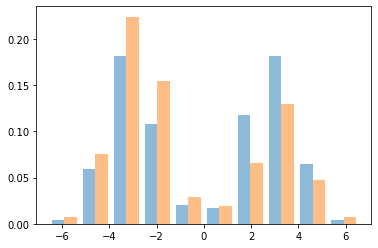

In [11]:
fig, ax = plt.subplots()
ax.hist([X.values.flatten(), samples.flatten()], alpha=0.5, density=True)
plt.show()

In [12]:
fig.savefig("mixture.png")

In [13]:
cols = ["energy_diff", "energy_coef", "data_erf", "adversary_cost"]
logs = pd.DataFrame({k:v for k,v in clf.logger_.full_logs.items() if k in cols})

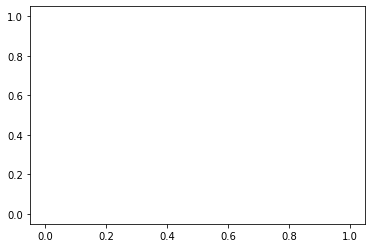

In [14]:
plt.plot(clf.logger_.full_logs["loss_ais"])

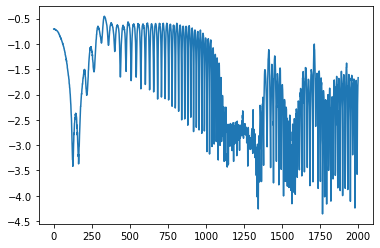

In [15]:
logs["energy_coef"].apply(np.log).plot()

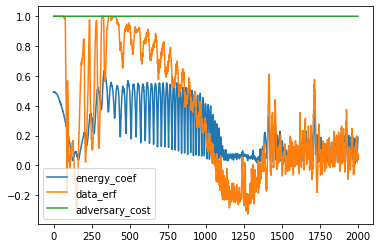

In [16]:
logs[[c for c in cols if c != "energy_diff"]].plot()

In [17]:
import hpbandster.core.result as hpres
import hpbandster.visualization as hpvis

In [18]:
result = search._res

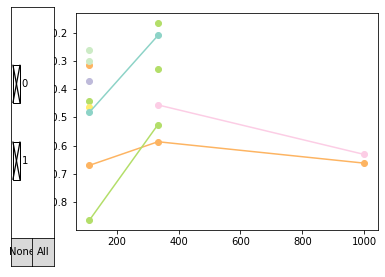

(<Figure size 432x288 with 4 Axes>,
 <matplotlib.widgets.Button at 0x7fcd8b049550>)

In [19]:
# get all executed runs
all_runs = result.get_all_runs()

# get the 'dict' that translates config ids to the actual configurations
id2conf = result.get_id2config_mapping()

lcs = result.get_learning_curves()

hpvis.interactive_HBS_plot(lcs)

In [20]:
result.get_all_runs()[0].info['test_score_mean'], result.get_all_runs()[0].loss

(0.4408894642688673, -0.4408894642688673)

Best found configuration:
{'lr': 0.0003138811601755823, 'num_layers': 3, 'num_units': 5, 'prior_scale': 2.7796975515266835, 'sampler': 'langevin', 'sampler_beta_min': 0.004326039824535611, 'sampler_beta_target': 2.310201887845293, 'sampler_lr': 0.00043422989482861367, 'weight_decay': 0.0011425814516827708}
It achieved accuracies of 1.661824 (validation) and 0.661824 (test).


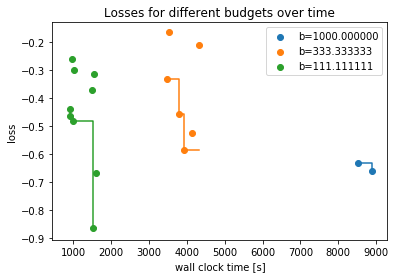

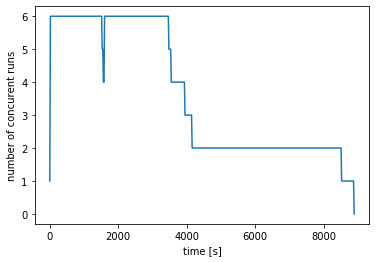

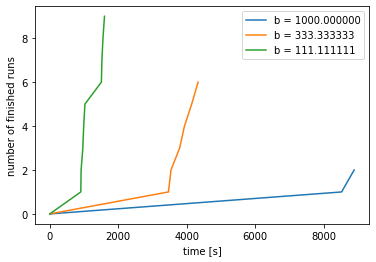

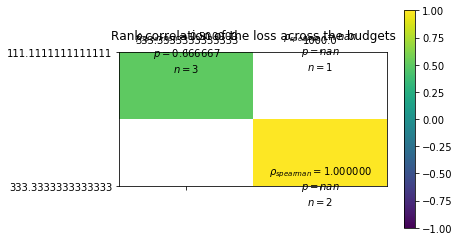

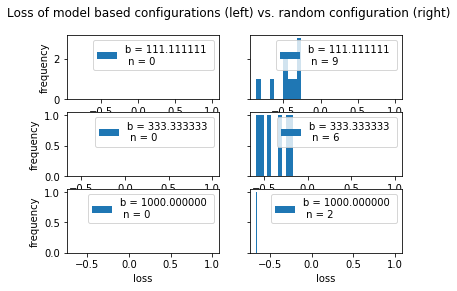

In [21]:
# Here is how you get he incumbent (best configuration)
inc_id = result.get_incumbent_id()

# let's grab the run on the highest budget
inc_runs = result.get_runs_by_id(inc_id)
inc_run = inc_runs[-1]


# We have access to all information: the config, the loss observed during
#optimization, and all the additional information
inc_loss = inc_run.loss
inc_config = id2conf[inc_id]['config']
inc_test_loss = inc_run.info['test_score_mean']

print('Best found configuration:')
print(inc_config)
print('It achieved accuracies of %f (validation) and %f (test).'%(1-inc_loss, inc_test_loss))


# Let's plot the observed losses grouped by budget,
hpvis.losses_over_time(all_runs)

# the number of concurent runs,
hpvis.concurrent_runs_over_time(all_runs)

# and the number of finished runs.
hpvis.finished_runs_over_time(all_runs)

# This one visualizes the spearman rank correlation coefficients of the losses
# between different budgets.
hpvis.correlation_across_budgets(result)

# For model based optimizers, one might wonder how much the model actually helped.
# The next plot compares the performance of configs picked by the model vs. random ones
hpvis.performance_histogram_model_vs_random(all_runs, id2conf)

plt.show()

In [22]:
runs = all_runs
get_loss_from_run_fn = lambda r: r.loss
budgets = set([r.budget for r in runs])

data = {}
for b in budgets:
    data[b] = []

for r in runs:
    if r.loss is None:
        continue
    b = r.budget
    t = r.time_stamps['finished']
    l = get_loss_from_run_fn(r)
    data[b].append((t,l))

for b in budgets:
    data[b].sort()